# NO_CHANGE with GRIDSEARCH_CV on ADM0, QUARTERLY

In [1]:
import pandas as pd
# pd.set_option('display.max_rows', 500)
# pd.set_option('display.max_columns', 500)

import warnings
warnings.simplefilter('ignore')

import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
    
import time
import datetime

import os

## Model Specifications

In [2]:
TARGET_VARIABLE = "SUM(FATALITIES)"
SEASONAL_PERIODICITY = 4 # for data frequency & seasonality

SEASONALITY = False
NEIGHBORS = False
SOCIO_ECO_VARS = False # X
N_LAGS_X = 1 # todo: remove or change behavior from max lags to lag
DIM_REDUCTION_METHOD = "PCA"

CV_FOLDS = 1 

In [3]:
MODEL_NAME = "NO_CHANGE"

if SEASONAL_PERIODICITY == 12:
    MODEL_NAME += "_MONTHLY"
elif SEASONAL_PERIODICITY == 4:
    MODEL_NAME += "_QUARTERLY"

MODEL_NAME

'NO_CHANGE_QUARTERLY'

### Hyperparameter Grid

## Model Training

In [4]:
from common_functions import *
from forecasters import *

#### Training Method

In [5]:
def varimax(target_variable="SUM(FATALITIES)", 
            target_country="MLI", 
            predictor_countries=["BFA"], 
            n_lags_X = N_LAGS_X, 
            seasonal_periodicity = SEASONAL_PERIODICITY):
    
    ### GET DATA
    y, X = getData(target_variable = target_variable, 
                   target_country = target_country, 
                   predictor_countries = predictor_countries,
                   socio_eco_vars = SOCIO_ECO_VARS,
                   n_lags_X = N_LAGS_X, 
                   seasonal_periodicity = SEASONAL_PERIODICITY)
    
    ### SPLIT DATA
    X_train, X_test, y_train, y_test = train_test_split(y=y,
                                                        X=X, 
                                                        forecast_horizon=SEASONAL_PERIODICITY)
    
    ### TRAINING WITH NO CHANGE
    model = NoChange().fit(X_train, y_train)
                    
    ### PREDICTION
    prediction_results = model.evaluate_model(X_test, y_test, fh = SEASONAL_PERIODICITY)
    
    ### ADJUST RESULT DF
    prediction_results["GID_0"] = target_country
    prediction_results["MONTH"] = pd.to_datetime(prediction_results["MONTH"].astype(str)) 
    print(prediction_results)

    return prediction_results

#### Automated Training for all 234 Countries 

In [6]:
acled_monthly_adm0 = pd.read_csv("../../data/TB003_EVENT_OUTCOMES_MONTHLY_START_DATE.csv")
gid0_neighbors = pd.read_csv("../../data/GID_0_Neighbours.csv")
# gid_list = acled_monthly_adm0["GID_0"].unique()[::-1] #reverse
gid_list = acled_monthly_adm0["GID_0"].unique()
len(gid_list)

234

File exists.
######## ABW (1/234) #########
0
Neighbor countries: []
Getting Data for ABW
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (13, 0)
y: (13, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07  0.0
2021-10  0.0
2022-01  0.0
         SUM(FATALITIES)_ABW
MONTH                       
2021-04                  0.0
2021-07                  0.0
2021-10                  0.0
2022-01                  0.0


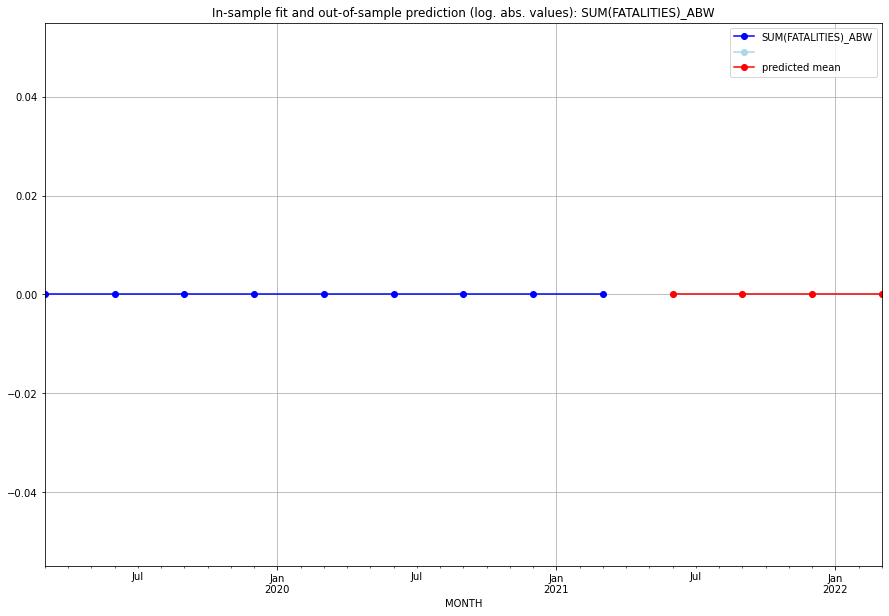

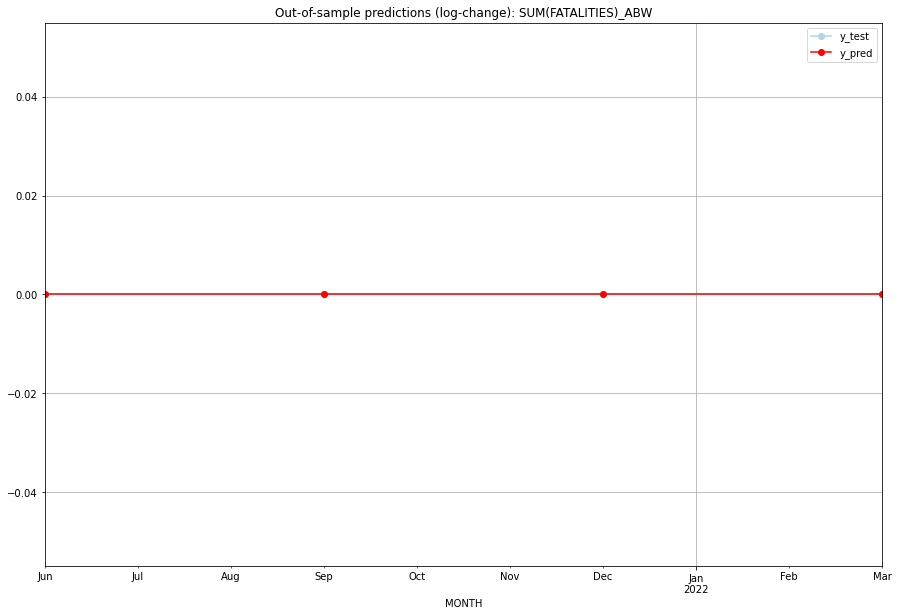

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ABW
1 2021-07-01       0.0         0.0           0.0             0.0   ABW
2 2021-10-01       0.0         0.0           0.0             0.0   ABW
3 2022-01-01       0.0         0.0           0.0             0.0   ABW
Execution time: 00:01
######## AFG (2/234) #########
0
Neighbor countries: []
Getting Data for AFG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (21, 0)
y: (21, 1)
------------------------------------------------
               0
MONTH           
2021-04  9.

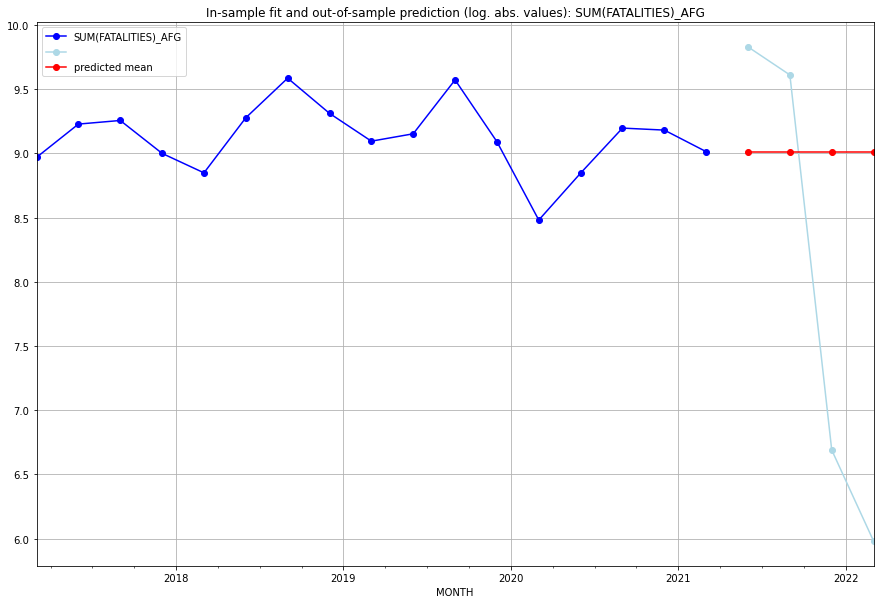

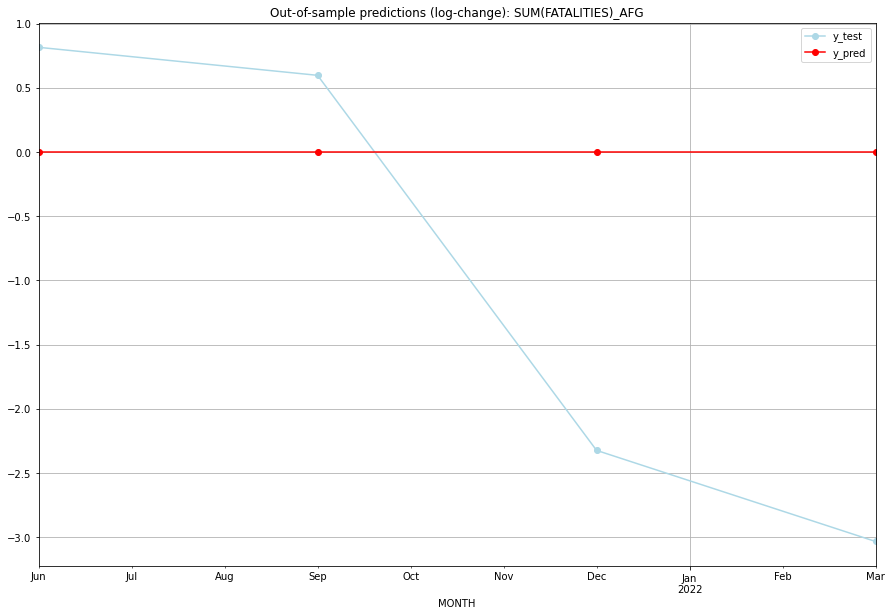

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04   9.01396    9.829572           0.0        0.815611
1  2021-07   9.01396    9.611396           0.0        0.597435
2  2021-10   9.01396    6.690842           0.0       -2.323118
3  2022-01   9.01396    5.981414           0.0       -3.032546
TADDA: 1.692177788127141
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01   9.01396    9.829572           0.0        0.815611   AFG
1 2021-07-01   9.01396    9.611396           0.0        0.597435   AFG
2 2021-10-01   9.01396    6.690842           0.0       -2.323118   AFG
3 2022-01-01   9.01396    5.981414           0.0       -3.032546   AFG
Execution time: 00:01
######## AGO (3/234) #########
0
Neighbor countries: []
Getting Data for AGO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
               0
MONTH       

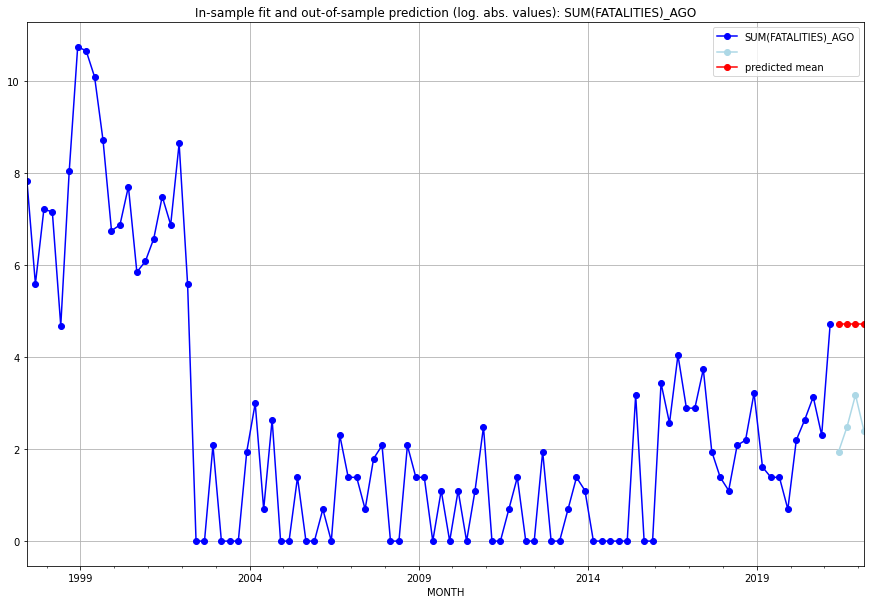

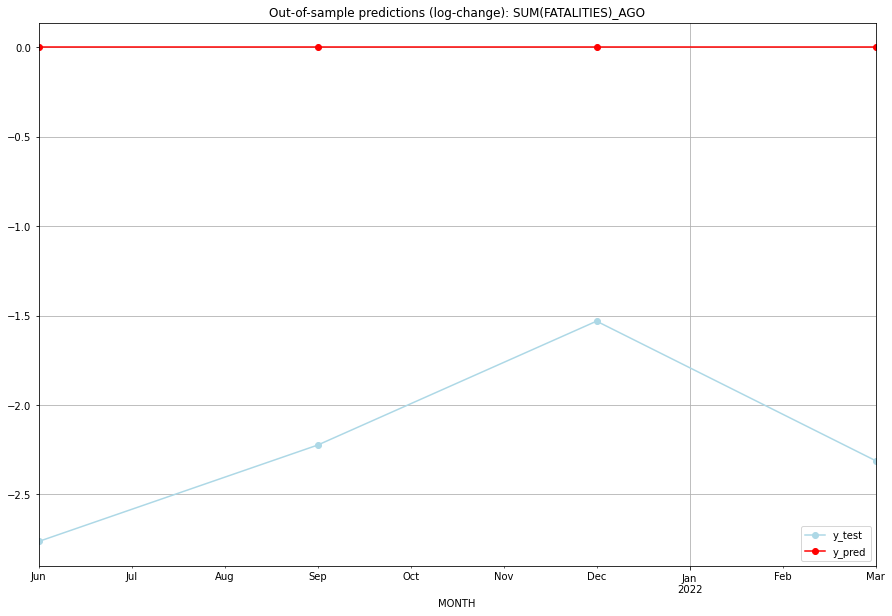

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04   4.70953    1.945910           0.0       -2.763620
1  2021-07   4.70953    2.484907           0.0       -2.224624
2  2021-10   4.70953    3.178054           0.0       -1.531476
3  2022-01   4.70953    2.397895           0.0       -2.311635
TADDA: 2.207838725814926
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01   4.70953    1.945910           0.0       -2.763620   AGO
1 2021-07-01   4.70953    2.484907           0.0       -2.224624   AGO
2 2021-10-01   4.70953    3.178054           0.0       -1.531476   AGO
3 2022-01-01   4.70953    2.397895           0.0       -2.311635   AGO
Execution time: 00:01
######## AIA (4/234) #########
0
Neighbor countries: []
Getting Data for AIA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04

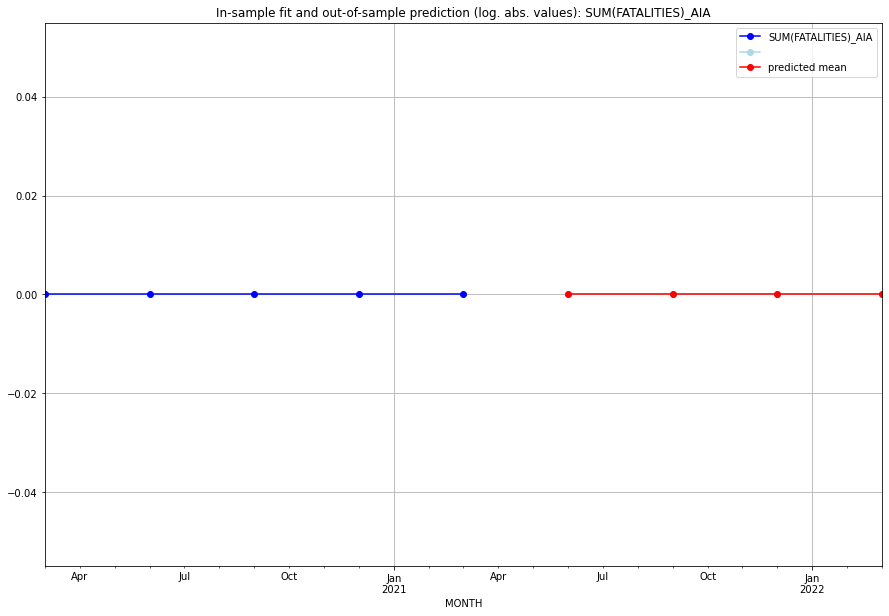

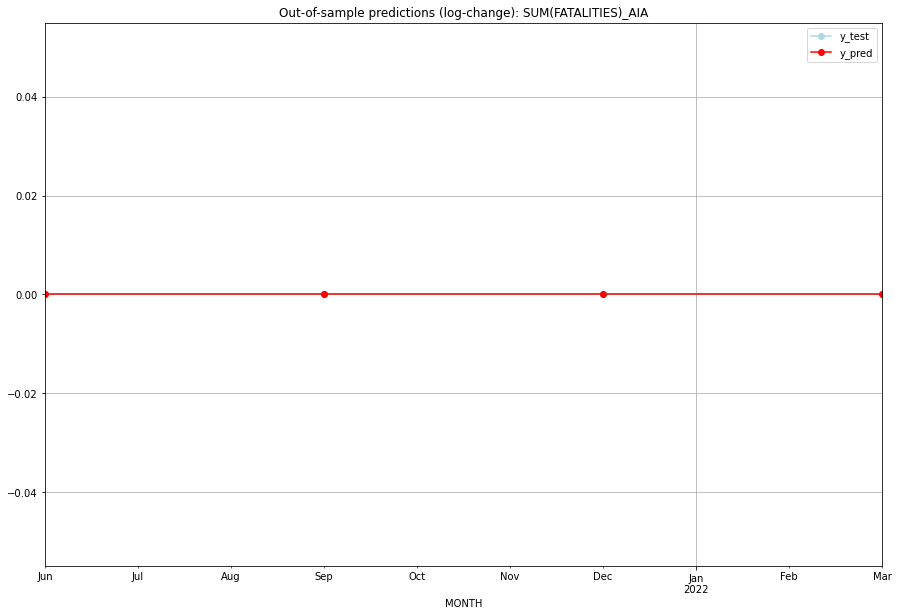

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   AIA
1 2021-07-01       0.0         0.0           0.0             0.0   AIA
2 2021-10-01       0.0         0.0           0.0             0.0   AIA
3 2022-01-01       0.0         0.0           0.0             0.0   AIA
Execution time: 00:01
######## ALA (5/234) #########
0
Neighbor countries: []
Getting Data for ALA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07 

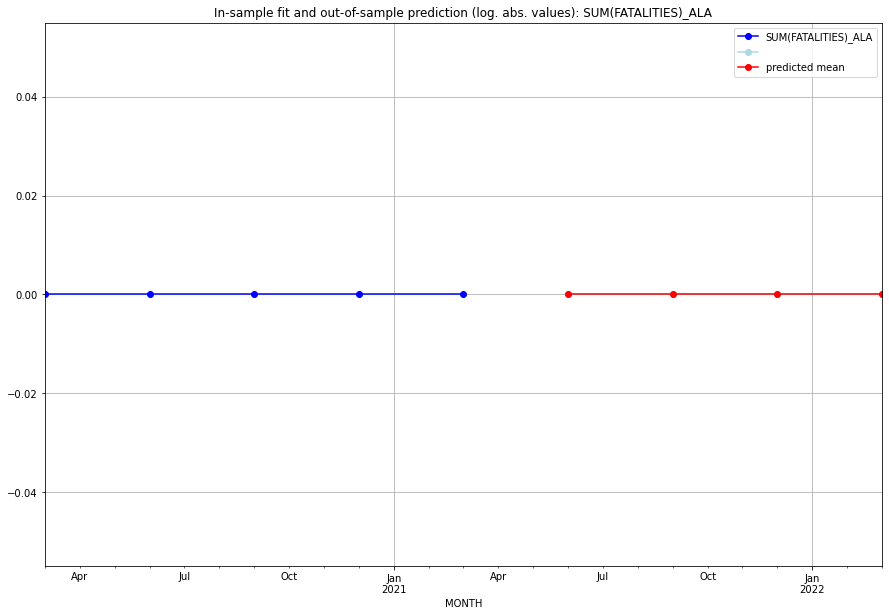

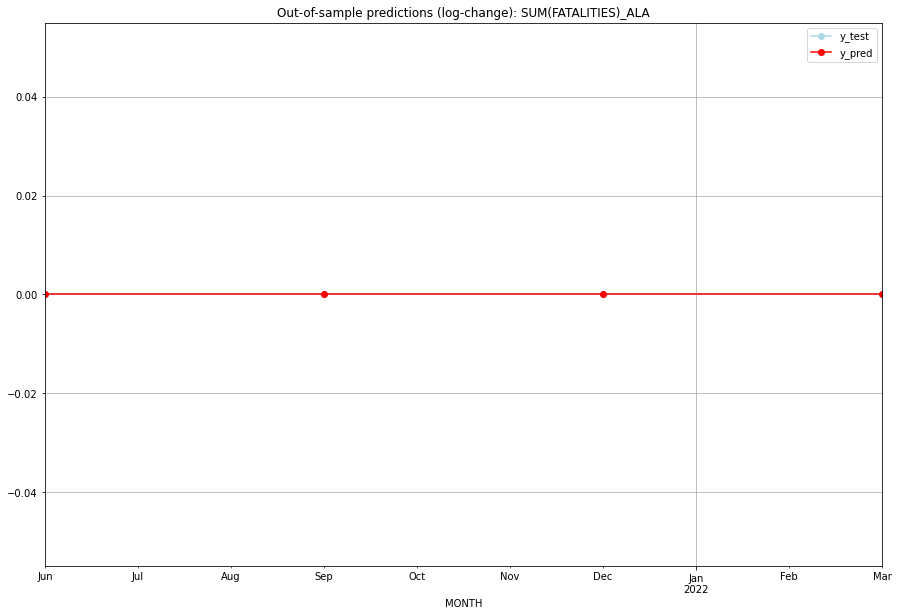

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ALA
1 2021-07-01       0.0         0.0           0.0             0.0   ALA
2 2021-10-01       0.0         0.0           0.0             0.0   ALA
3 2022-01-01       0.0         0.0           0.0             0.0   ALA
Execution time: 00:01
######## ALB (6/234) #########
0
Neighbor countries: []
Getting Data for ALB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

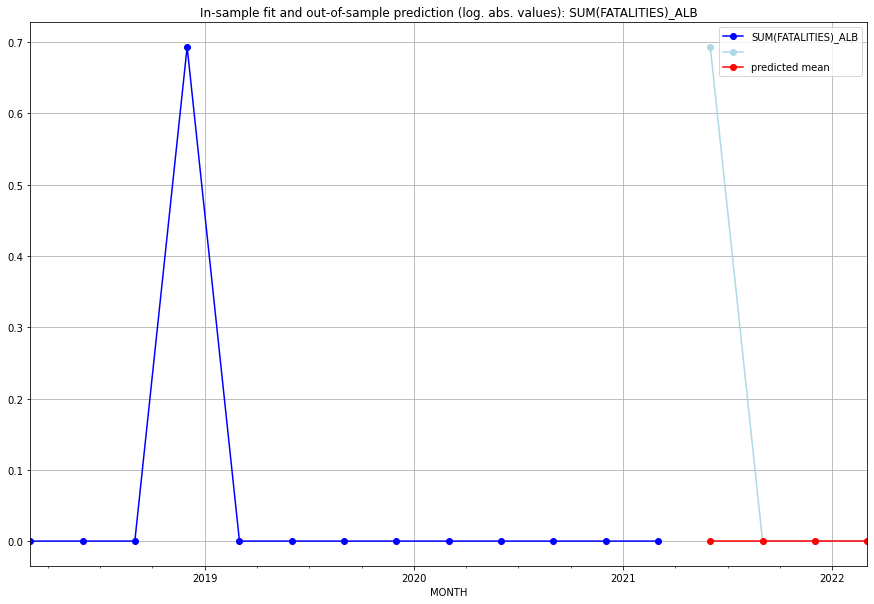

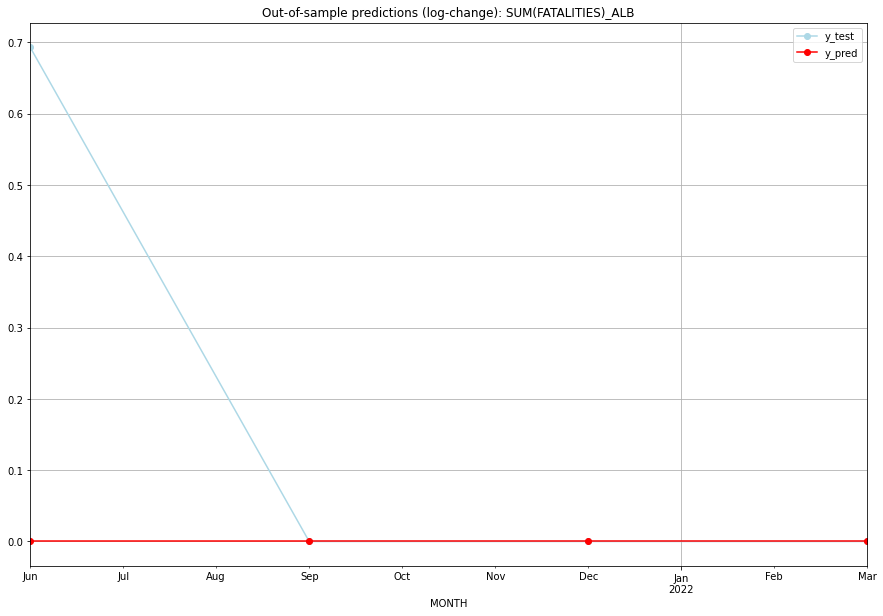

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.693147           0.0        0.693147
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.693147           0.0        0.693147   ALB
1 2021-07-01       0.0    0.000000           0.0        0.000000   ALB
2 2021-10-01       0.0    0.000000           0.0        0.000000   ALB
3 2022-01-01       0.0    0.000000           0.0        0.000000   ALB
Execution time: 00:01
######## AND (7/234) #########
0
Neighbor countries: []
Getting Data for AND
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

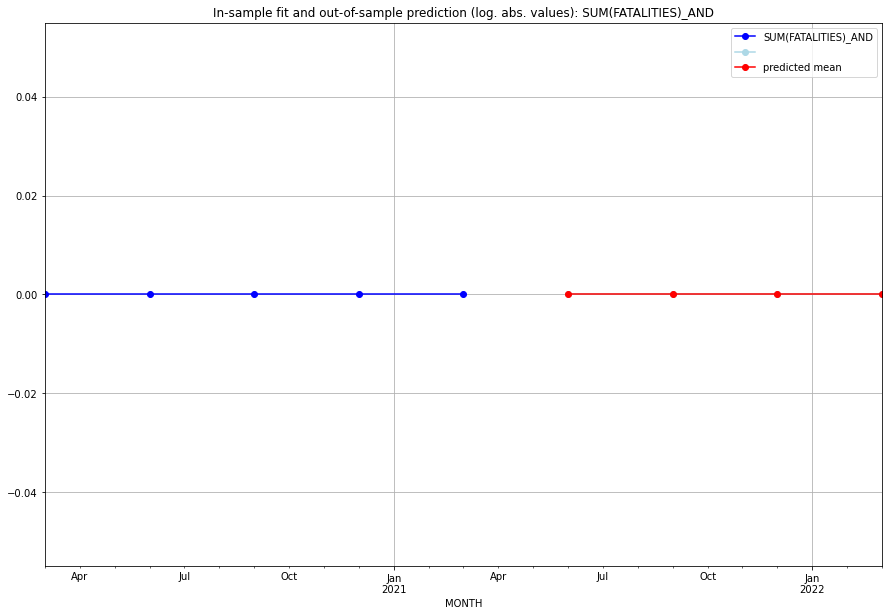

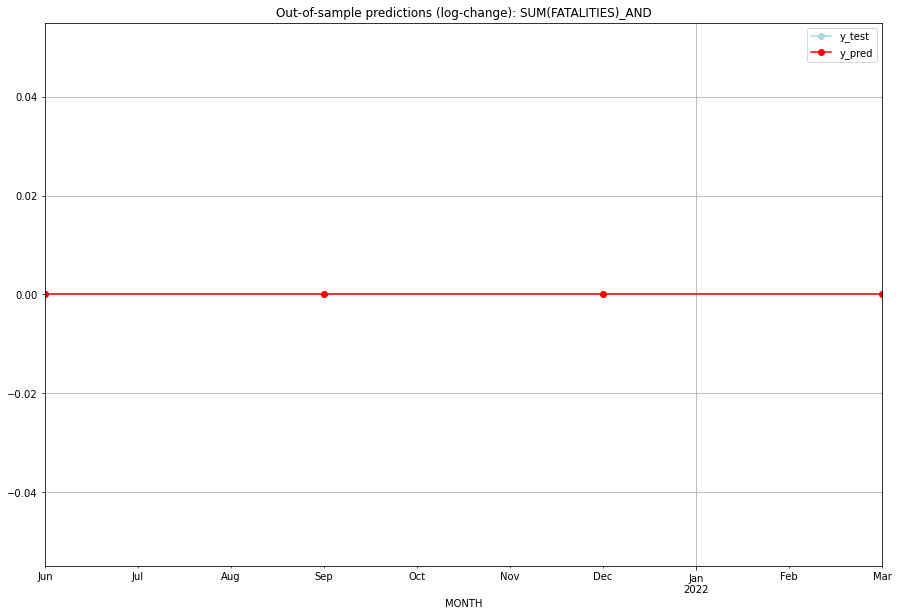

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   AND
1 2021-07-01       0.0         0.0           0.0             0.0   AND
2 2021-10-01       0.0         0.0           0.0             0.0   AND
3 2022-01-01       0.0         0.0           0.0             0.0   AND
Execution time: 00:01
######## ARE (8/234) #########
0
Neighbor countries: []
Getting Data for ARE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (21, 0)
y: (21, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

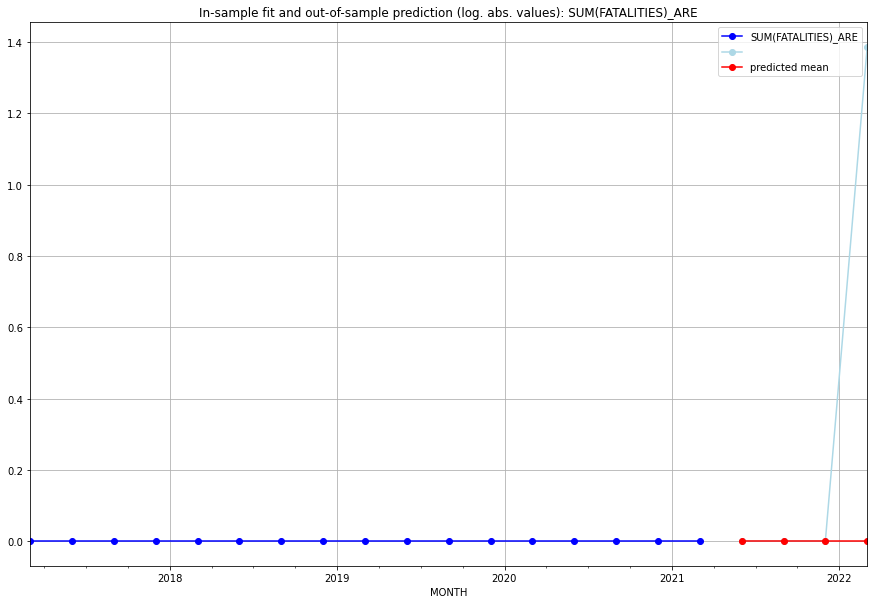

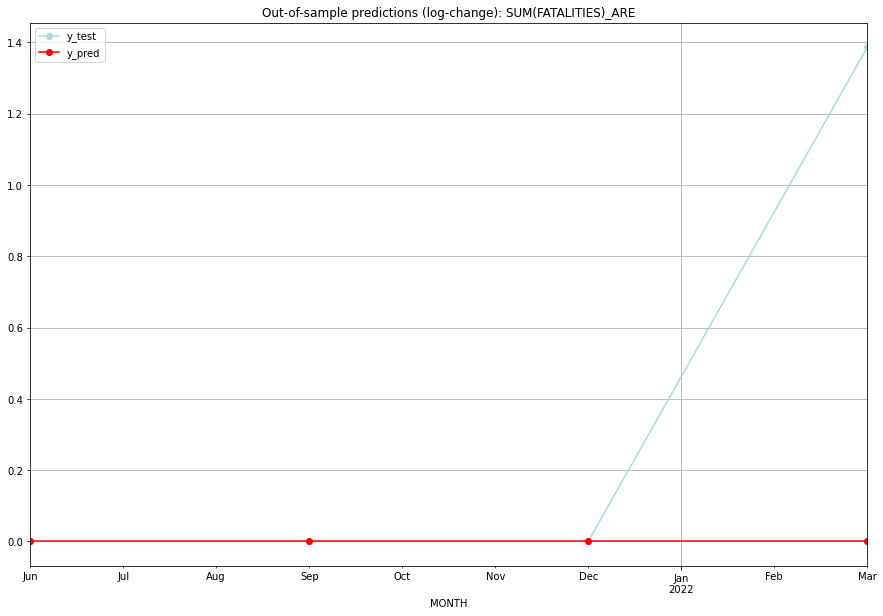

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    1.386294           0.0        1.386294
TADDA: 0.34657359027997264
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   ARE
1 2021-07-01       0.0    0.000000           0.0        0.000000   ARE
2 2021-10-01       0.0    0.000000           0.0        0.000000   ARE
3 2022-01-01       0.0    1.386294           0.0        1.386294   ARE
Execution time: 00:01
######## ARG (9/234) #########
0
Neighbor countries: []
Getting Data for ARG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH      

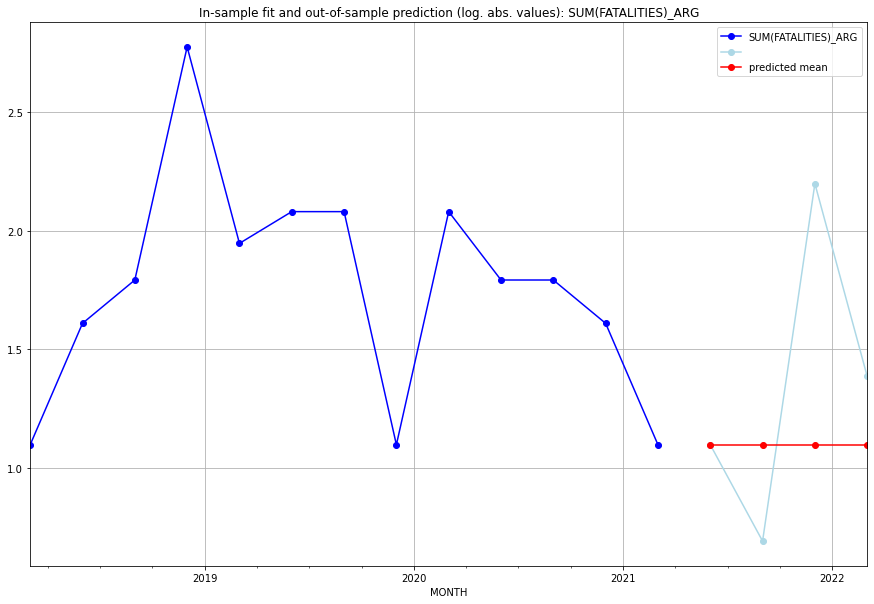

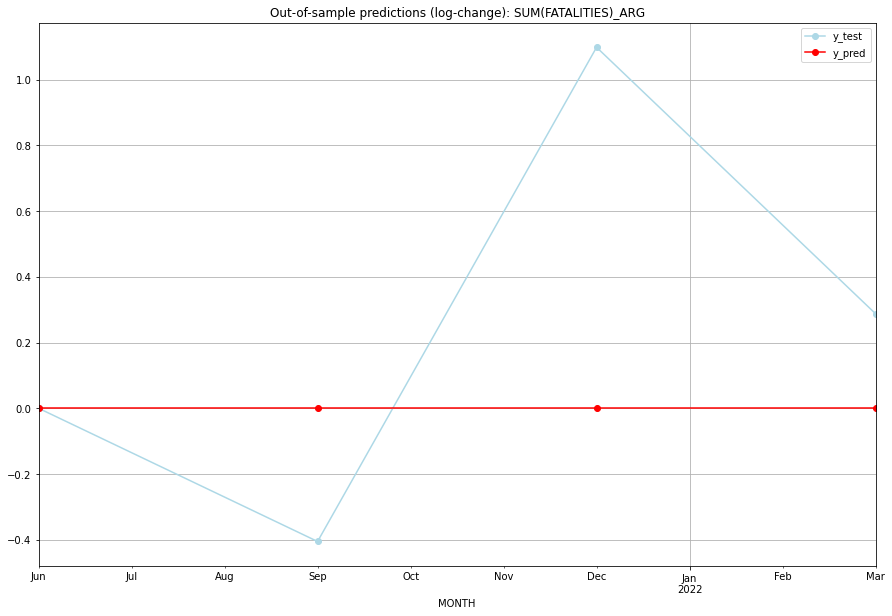

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    1.098612           0.0        0.000000
1  2021-07  1.098612    0.693147           0.0       -0.405465
2  2021-10  1.098612    2.197225           0.0        1.098612
3  2022-01  1.098612    1.386294           0.0        0.287682
TADDA: 0.44793986730701385
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    1.098612           0.0        0.000000   ARG
1 2021-07-01  1.098612    0.693147           0.0       -0.405465   ARG
2 2021-10-01  1.098612    2.197225           0.0        1.098612   ARG
3 2022-01-01  1.098612    1.386294           0.0        0.287682   ARG
Execution time: 00:01
######## ARM (10/234) #########
0
Neighbor countries: []
Getting Data for ARM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

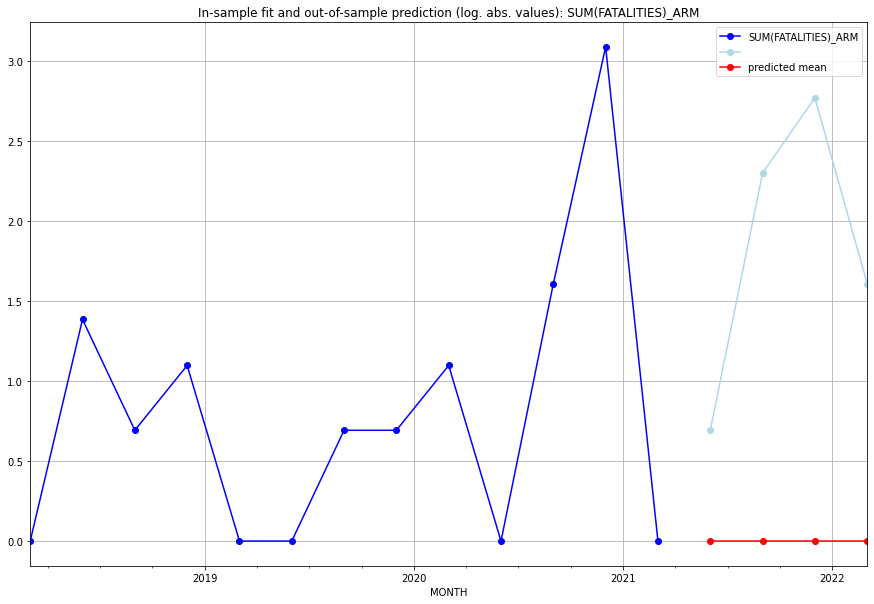

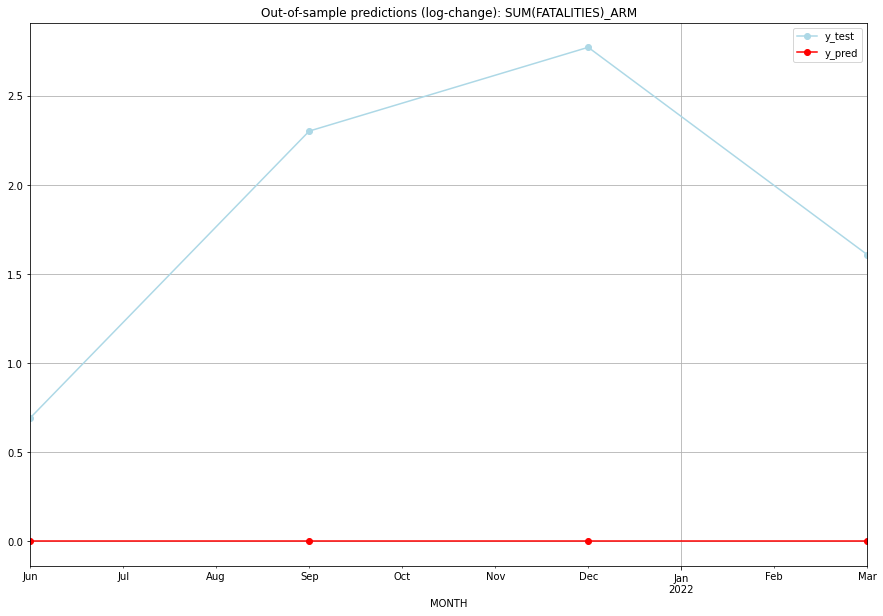

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.693147           0.0        0.693147
1  2021-07       0.0    2.302585           0.0        2.302585
2  2021-10       0.0    2.772589           0.0        2.772589
3  2022-01       0.0    1.609438           0.0        1.609438
TADDA: 1.8444397270569681
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.693147           0.0        0.693147   ARM
1 2021-07-01       0.0    2.302585           0.0        2.302585   ARM
2 2021-10-01       0.0    2.772589           0.0        2.772589   ARM
3 2022-01-01       0.0    1.609438           0.0        1.609438   ARM
Execution time: 00:01
######## ASM (11/234) #########
0
Neighbor countries: []
Getting Data for ASM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-

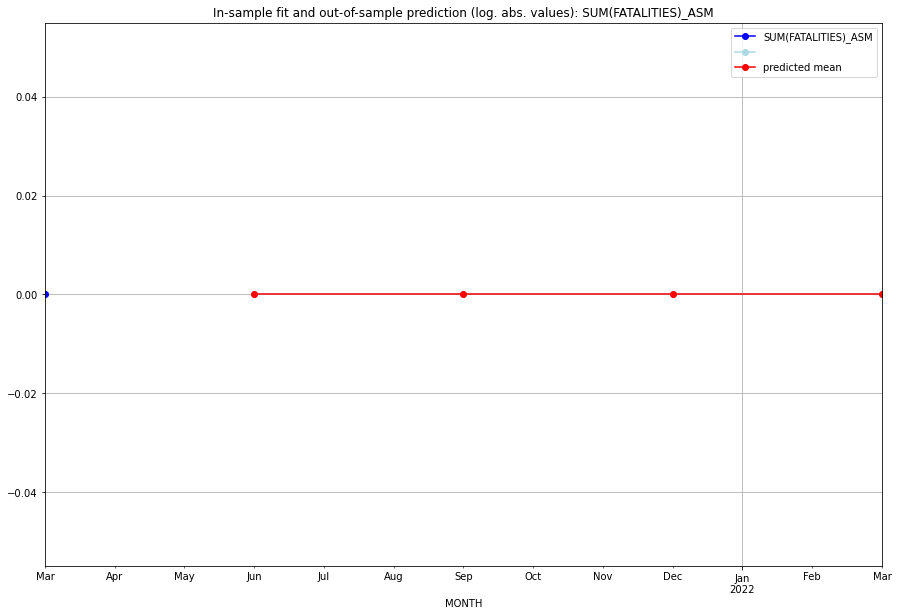

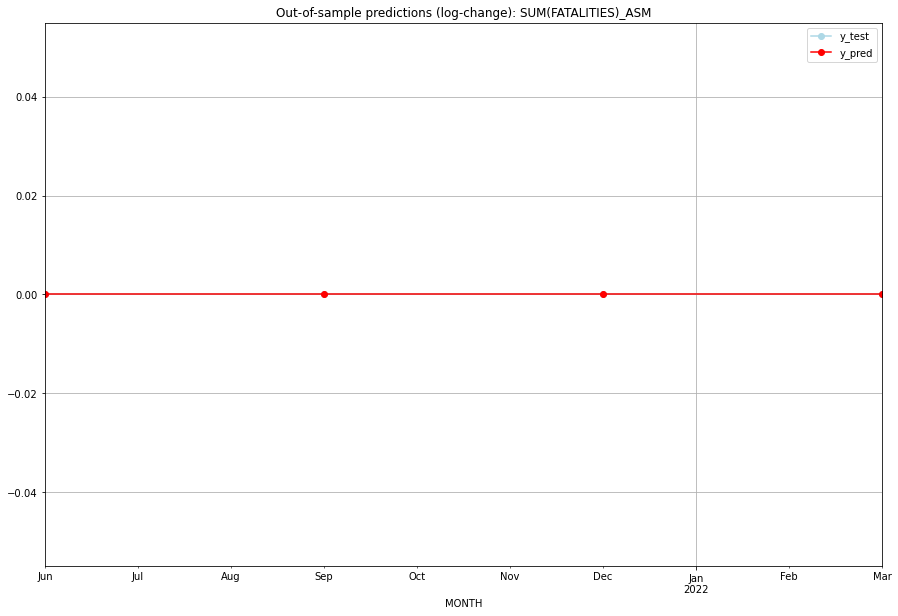

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ASM
1 2021-07-01       0.0         0.0           0.0             0.0   ASM
2 2021-10-01       0.0         0.0           0.0             0.0   ASM
3 2022-01-01       0.0         0.0           0.0             0.0   ASM
Execution time: 00:01
######## ATA (12/234) #########
0
Neighbor countries: []
Getting Data for ATA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

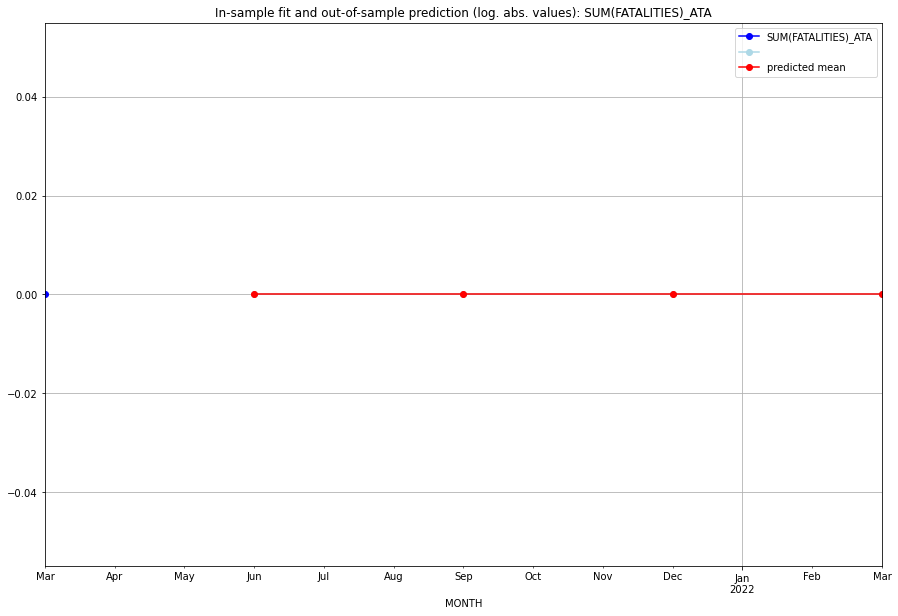

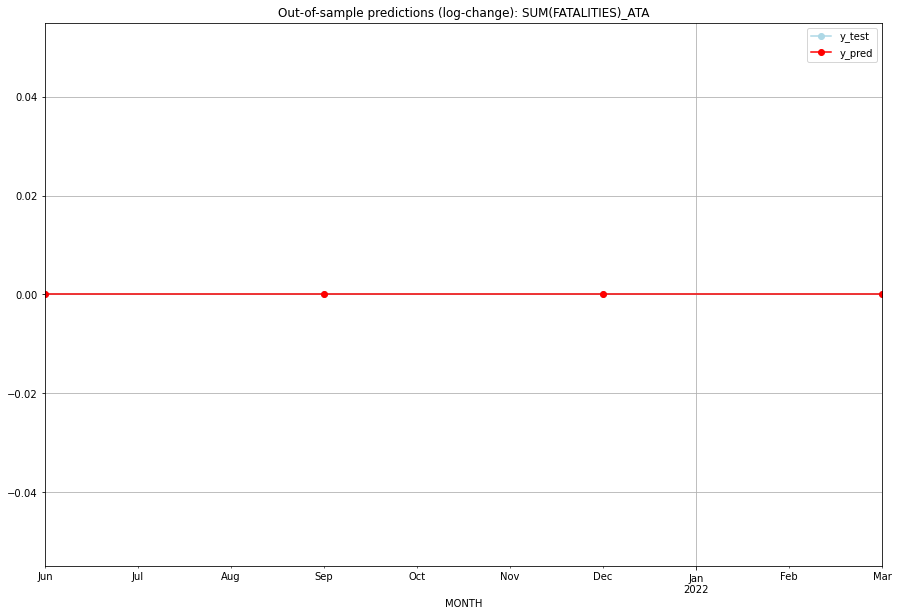

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ATA
1 2021-07-01       0.0         0.0           0.0             0.0   ATA
2 2021-10-01       0.0         0.0           0.0             0.0   ATA
3 2022-01-01       0.0         0.0           0.0             0.0   ATA
Execution time: 00:01
######## ATG (13/234) #########
0
Neighbor countries: []
Getting Data for ATG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

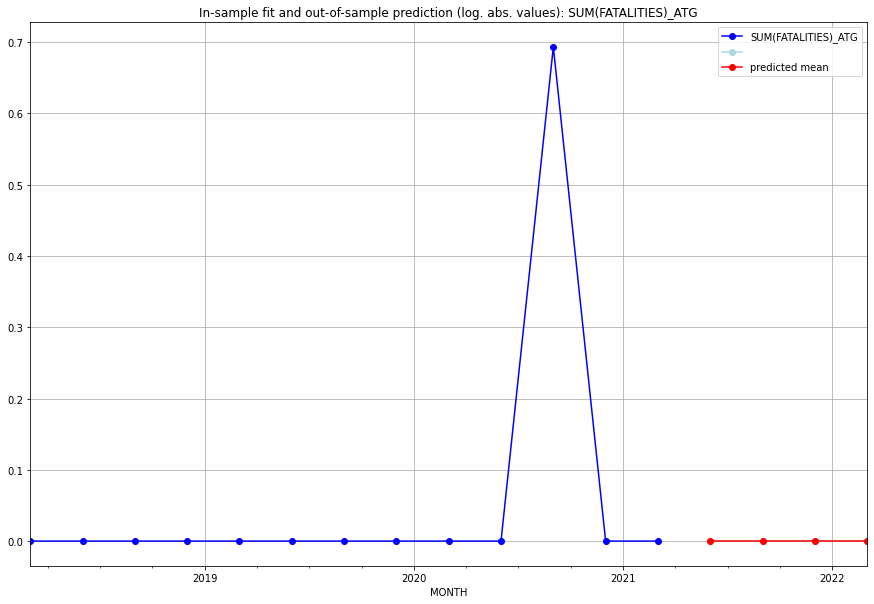

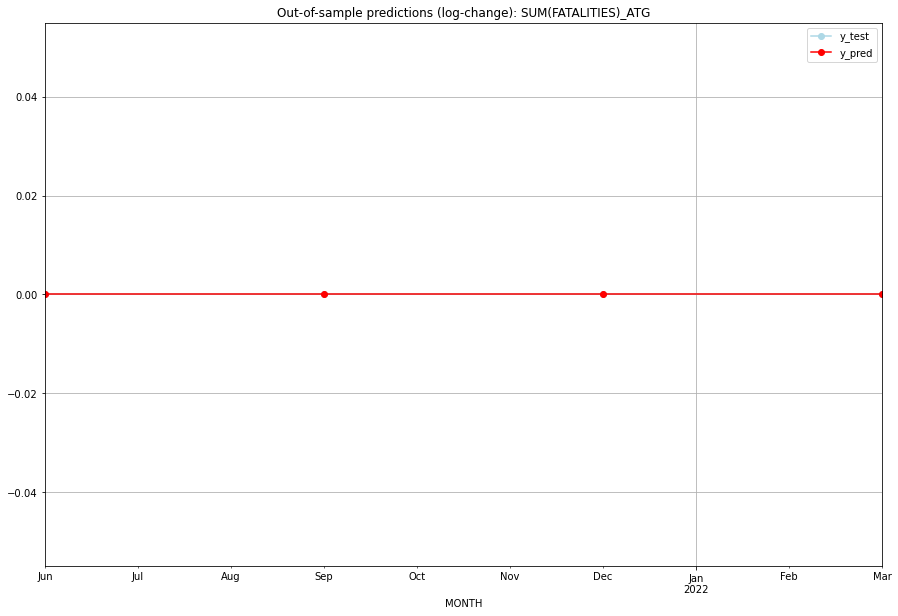

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ATG
1 2021-07-01       0.0         0.0           0.0             0.0   ATG
2 2021-10-01       0.0         0.0           0.0             0.0   ATG
3 2022-01-01       0.0         0.0           0.0             0.0   ATG
Execution time: 00:01
######## AUS (14/234) #########
0
Neighbor countries: []
Getting Data for AUS
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

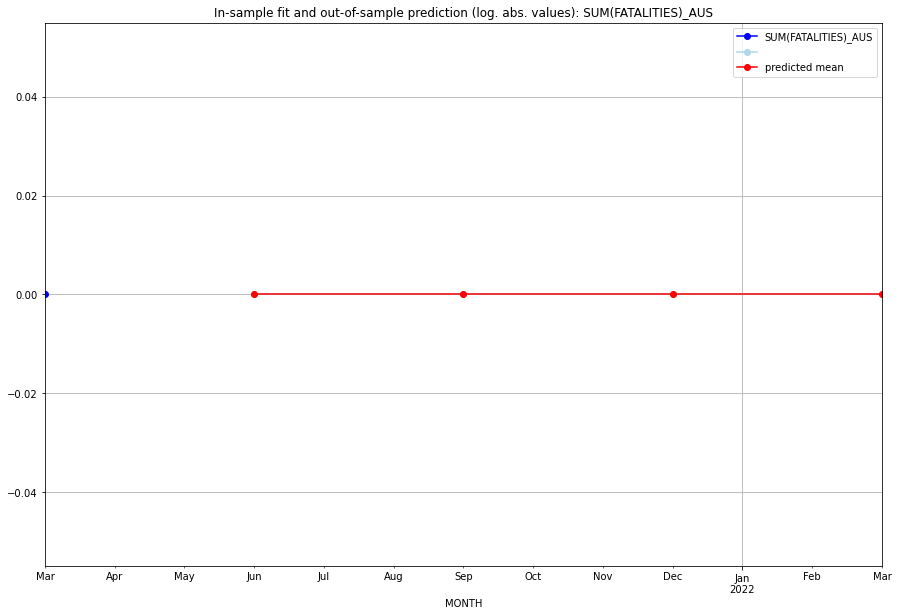

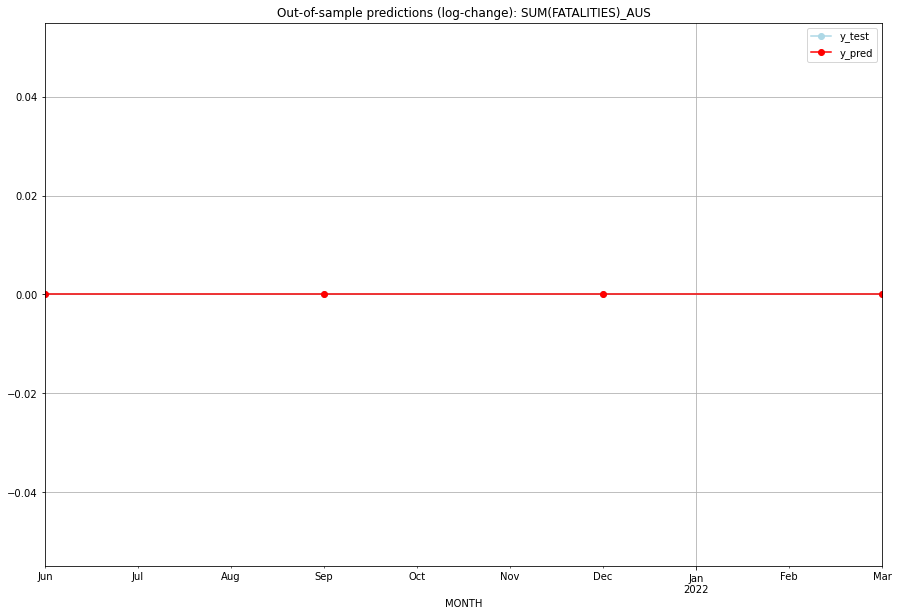

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   AUS
1 2021-07-01       0.0         0.0           0.0             0.0   AUS
2 2021-10-01       0.0         0.0           0.0             0.0   AUS
3 2022-01-01       0.0         0.0           0.0             0.0   AUS
Execution time: 00:01
######## AUT (15/234) #########
0
Neighbor countries: []
Getting Data for AUT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

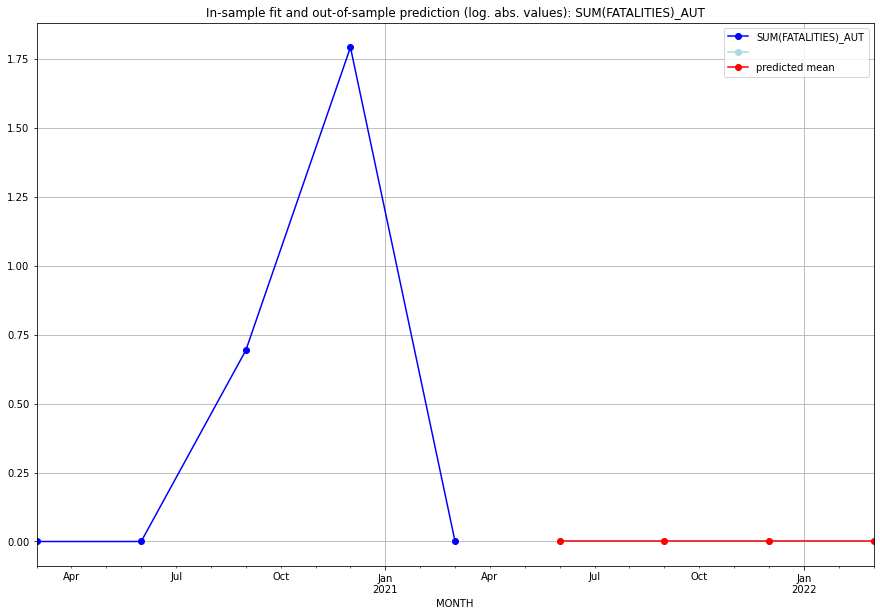

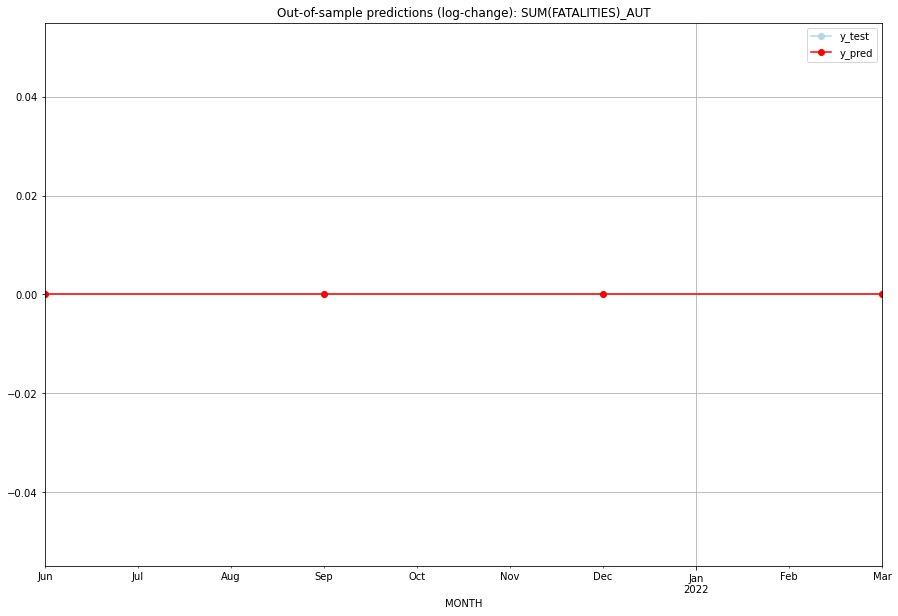

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   AUT
1 2021-07-01       0.0         0.0           0.0             0.0   AUT
2 2021-10-01       0.0         0.0           0.0             0.0   AUT
3 2022-01-01       0.0         0.0           0.0             0.0   AUT
Execution time: 00:01
######## AZE (16/234) #########
0
Neighbor countries: []
Getting Data for AZE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04 

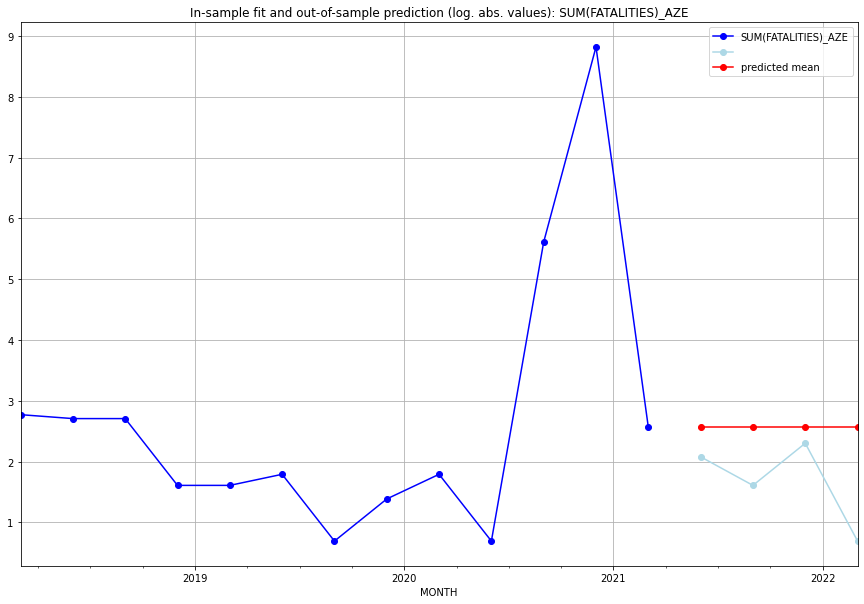

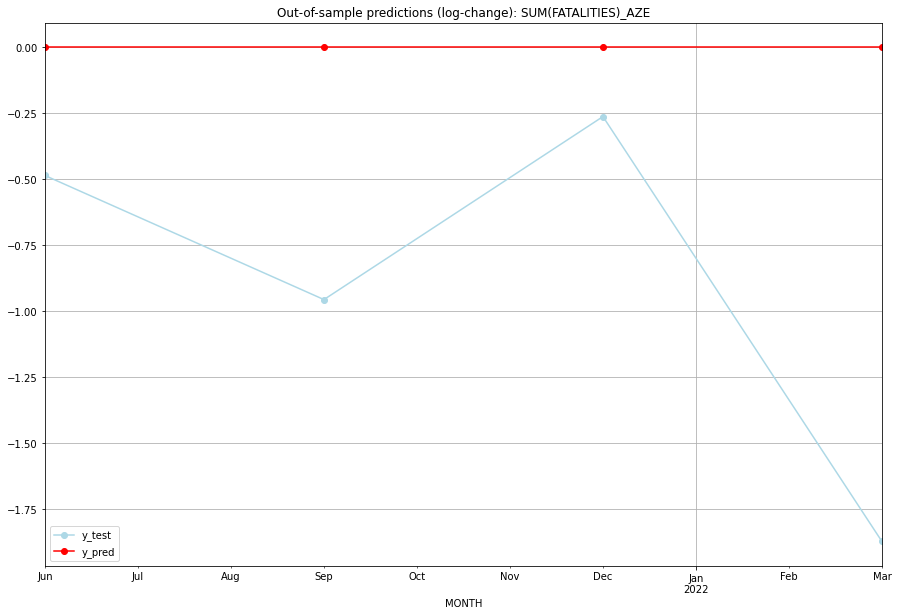

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.564949    2.079442           0.0       -0.485508
1  2021-07  2.564949    1.609438           0.0       -0.955511
2  2021-10  2.564949    2.302585           0.0       -0.262364
3  2022-01  2.564949    0.693147           0.0       -1.871802
TADDA: 0.8937964255445547
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.564949    2.079442           0.0       -0.485508   AZE
1 2021-07-01  2.564949    1.609438           0.0       -0.955511   AZE
2 2021-10-01  2.564949    2.302585           0.0       -0.262364   AZE
3 2022-01-01  2.564949    0.693147           0.0       -1.871802   AZE
Execution time: 00:01
######## BDI (17/234) #########
0
Neighbor countries: []
Getting Data for BDI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

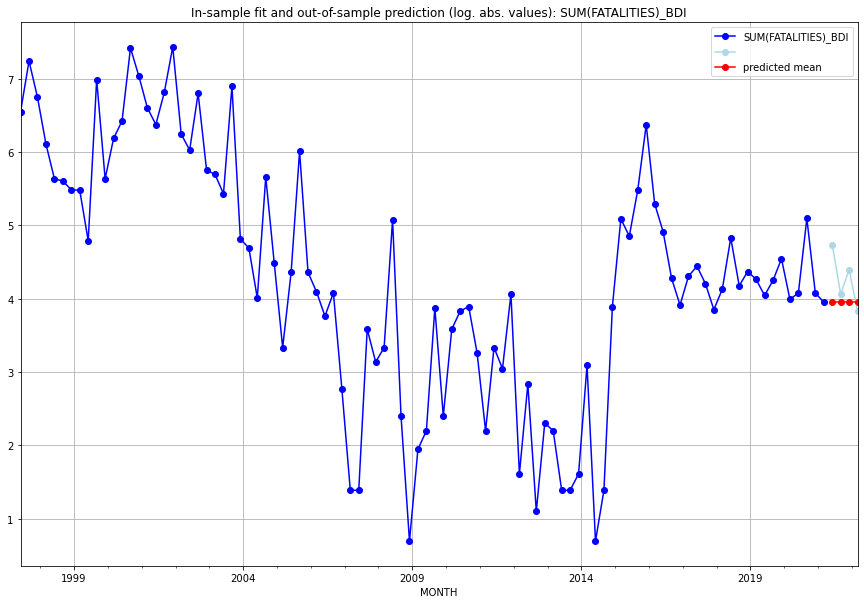

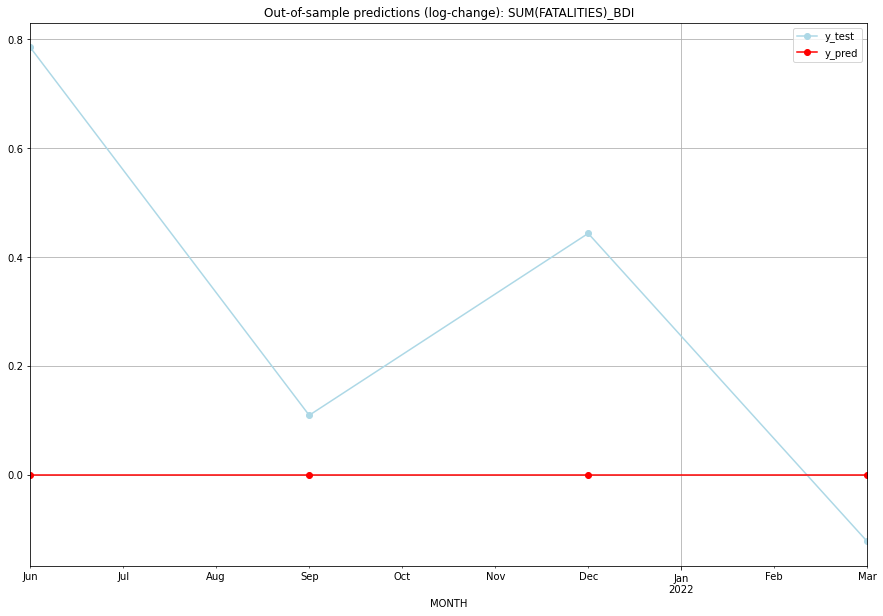

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.951244    4.736198           0.0        0.784955
1  2021-07  3.951244    4.060443           0.0        0.109199
2  2021-10  3.951244    4.394449           0.0        0.443205
3  2022-01  3.951244    3.828641           0.0       -0.122602
TADDA: 0.3649904449903507
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.951244    4.736198           0.0        0.784955   BDI
1 2021-07-01  3.951244    4.060443           0.0        0.109199   BDI
2 2021-10-01  3.951244    4.394449           0.0        0.443205   BDI
3 2022-01-01  3.951244    3.828641           0.0       -0.122602   BDI
Execution time: 00:01
######## BEL (18/234) #########
0
Neighbor countries: []
Getting Data for BEL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
                0
MONTH        

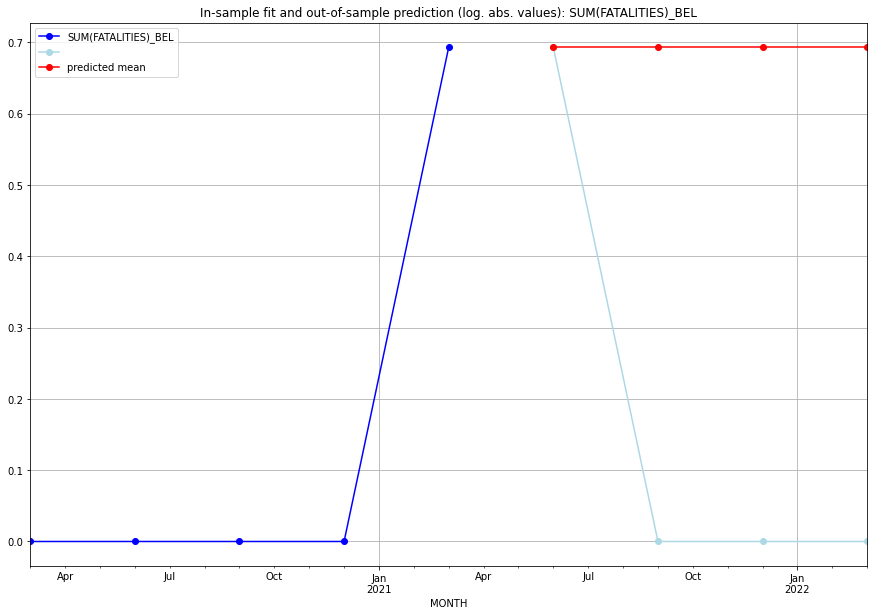

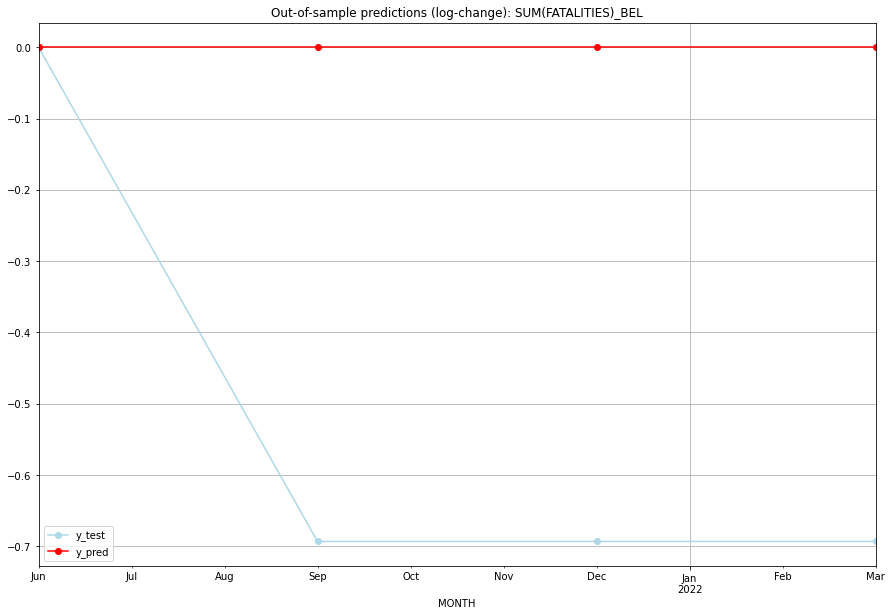

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.693147           0.0        0.000000
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    0.000000           0.0       -0.693147
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.693147           0.0        0.000000   BEL
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   BEL
2 2021-10-01  0.693147    0.000000           0.0       -0.693147   BEL
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   BEL
Execution time: 00:01
######## BEN (19/234) #########
0
Neighbor countries: []
Getting Data for BEN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

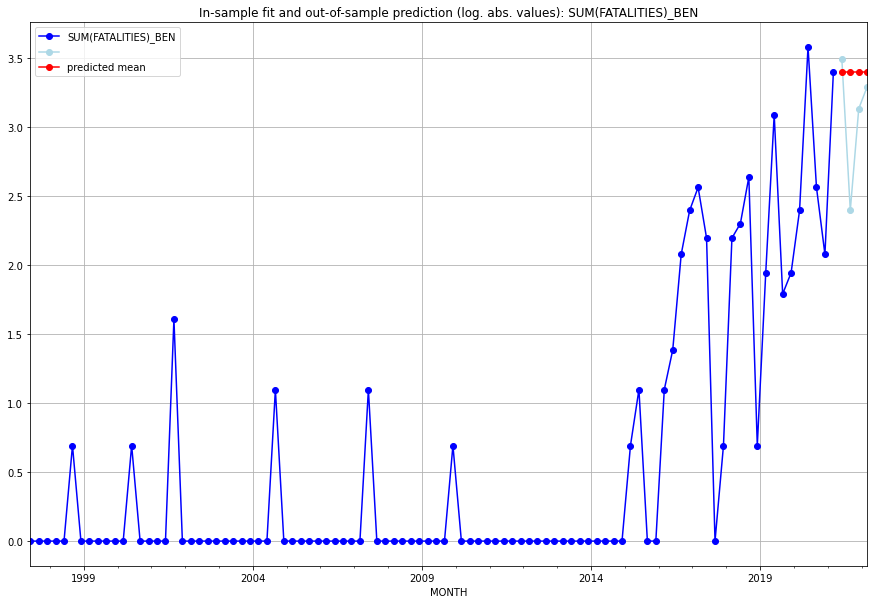

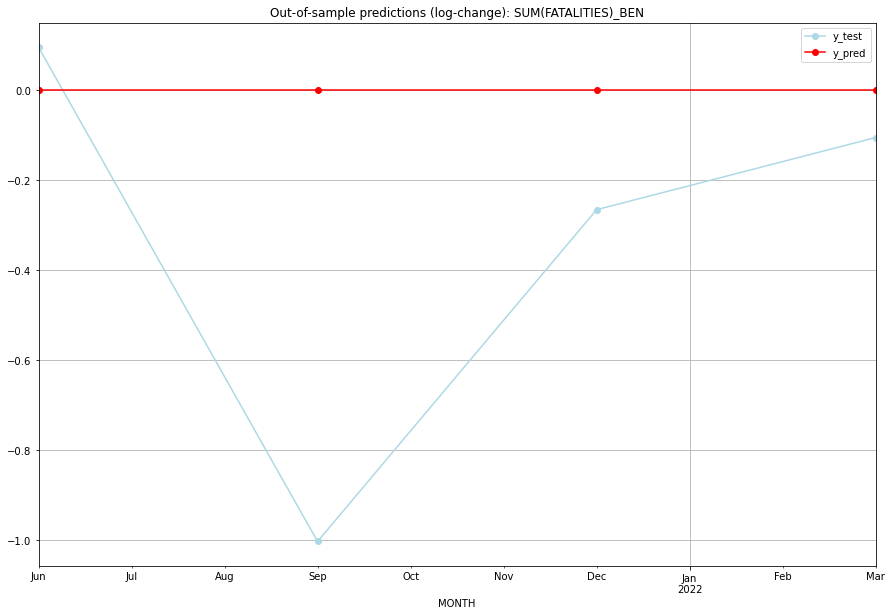

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.401197    3.496508           0.0        0.095310
1  2021-07  3.401197    2.397895           0.0       -1.003302
2  2021-10  3.401197    3.135494           0.0       -0.265703
3  2022-01  3.401197    3.295837           0.0       -0.105361
TADDA: 0.3674189925147353
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.401197    3.496508           0.0        0.095310   BEN
1 2021-07-01  3.401197    2.397895           0.0       -1.003302   BEN
2 2021-10-01  3.401197    3.135494           0.0       -0.265703   BEN
3 2022-01-01  3.401197    3.295837           0.0       -0.105361   BEN
Execution time: 00:01
######## BES (20/234) #########
0
Neighbor countries: []
Getting Data for BES
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

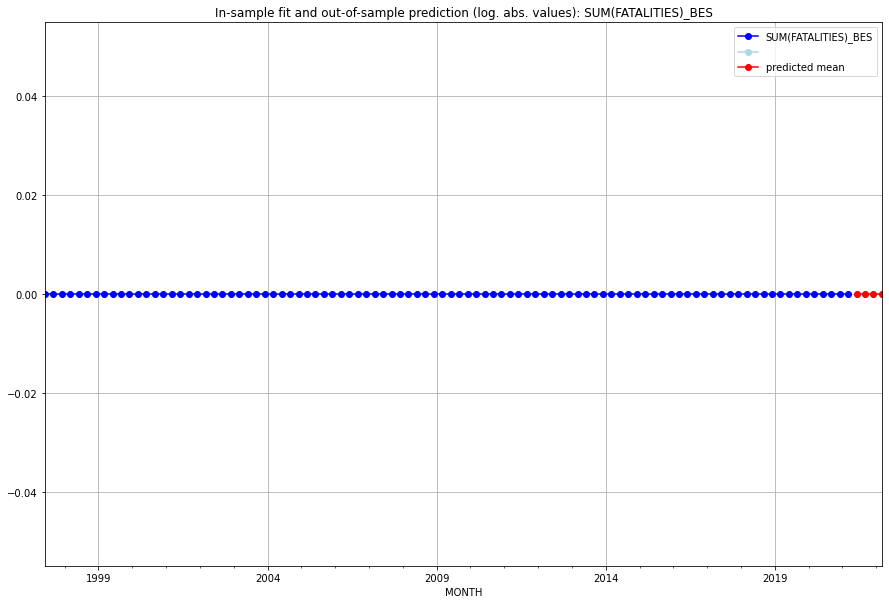

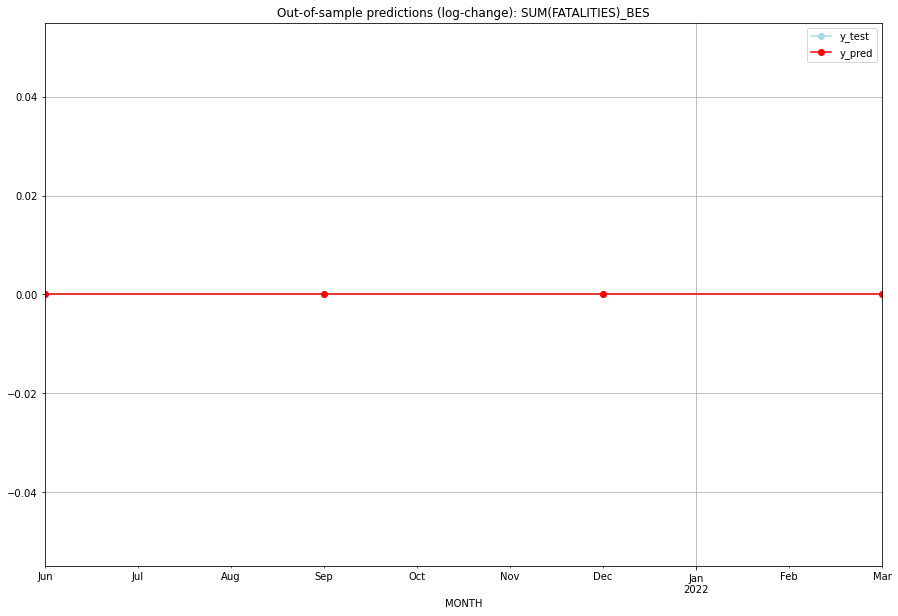

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BES
1 2021-07-01       0.0         0.0           0.0             0.0   BES
2 2021-10-01       0.0         0.0           0.0             0.0   BES
3 2022-01-01       0.0         0.0           0.0             0.0   BES
Execution time: 00:01
######## BFA (21/234) #########
0
Neighbor countries: []
Getting Data for BFA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-0

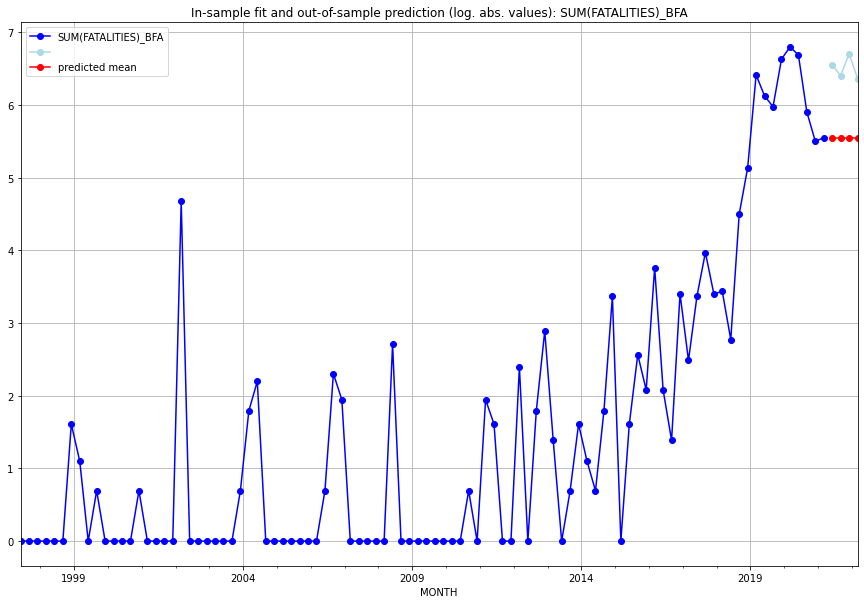

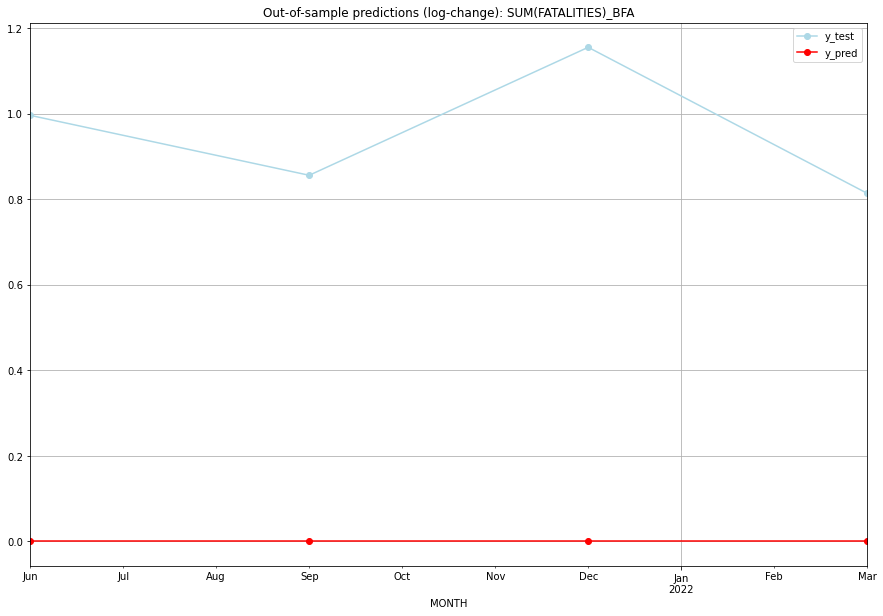

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.549076    6.545350           0.0        0.996274
1  2021-07  5.549076    6.405228           0.0        0.856152
2  2021-10  5.549076    6.704414           0.0        1.155338
3  2022-01  5.549076    6.363028           0.0        0.813952
TADDA: 0.9554290593222383
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.549076    6.545350           0.0        0.996274   BFA
1 2021-07-01  5.549076    6.405228           0.0        0.856152   BFA
2 2021-10-01  5.549076    6.704414           0.0        1.155338   BFA
3 2022-01-01  5.549076    6.363028           0.0        0.813952   BFA
Execution time: 00:01
######## BGD (22/234) #########
0
Neighbor countries: []
Getting Data for BGD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH      

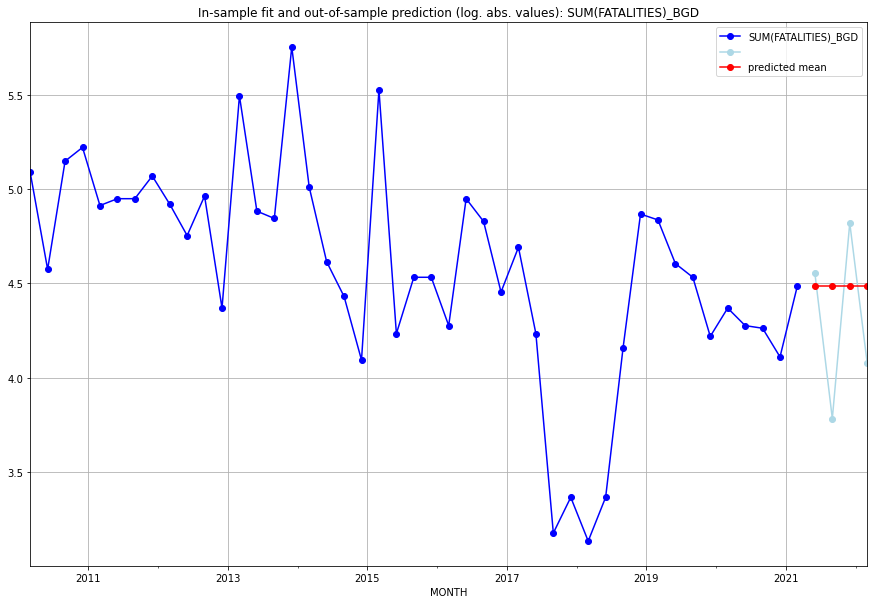

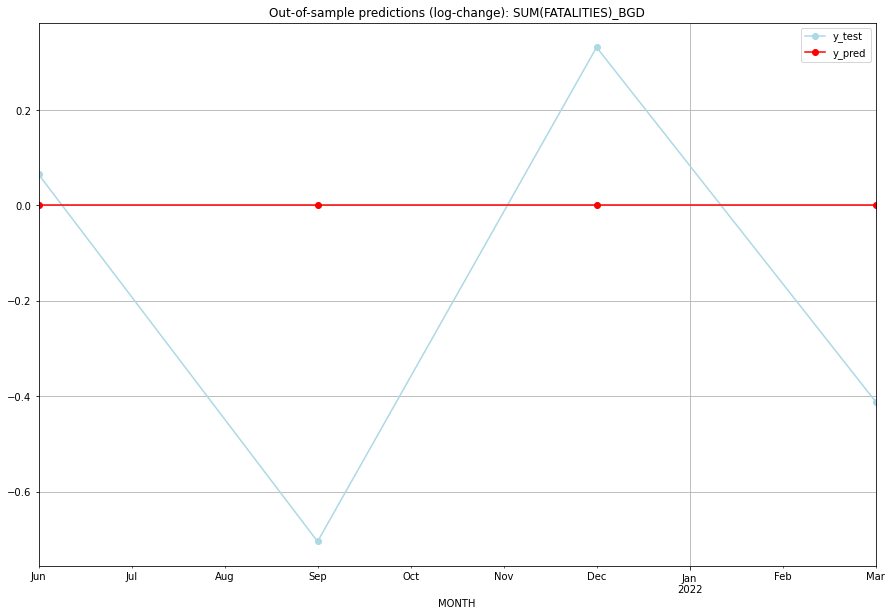

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.488636    4.553877           0.0        0.065241
1  2021-07  4.488636    3.784190           0.0       -0.704447
2  2021-10  4.488636    4.820282           0.0        0.331645
3  2022-01  4.488636    4.077537           0.0       -0.411099
TADDA: 0.3781078448453993
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.488636    4.553877           0.0        0.065241   BGD
1 2021-07-01  4.488636    3.784190           0.0       -0.704447   BGD
2 2021-10-01  4.488636    4.820282           0.0        0.331645   BGD
3 2022-01-01  4.488636    4.077537           0.0       -0.411099   BGD
Execution time: 00:01
######## BGR (23/234) #########
0
Neighbor countries: []
Getting Data for BGR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
202

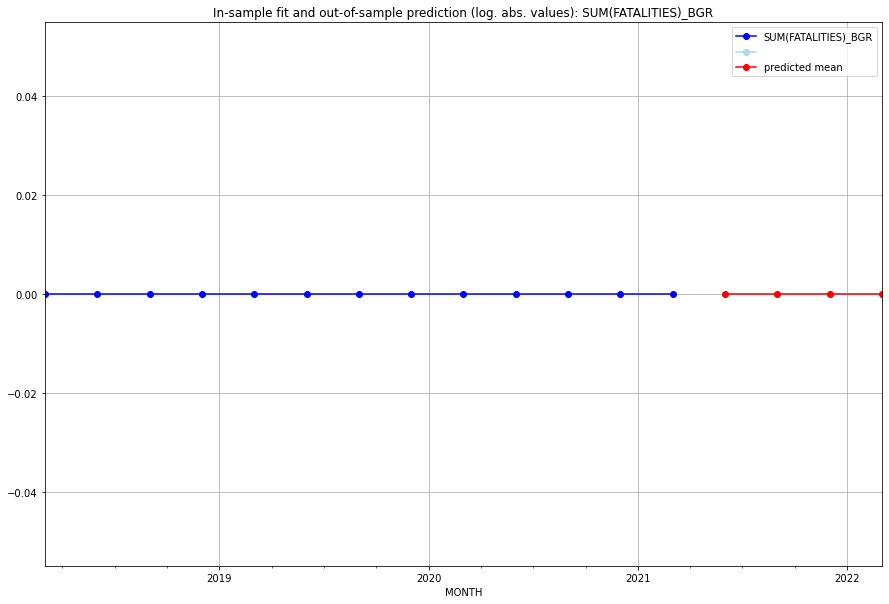

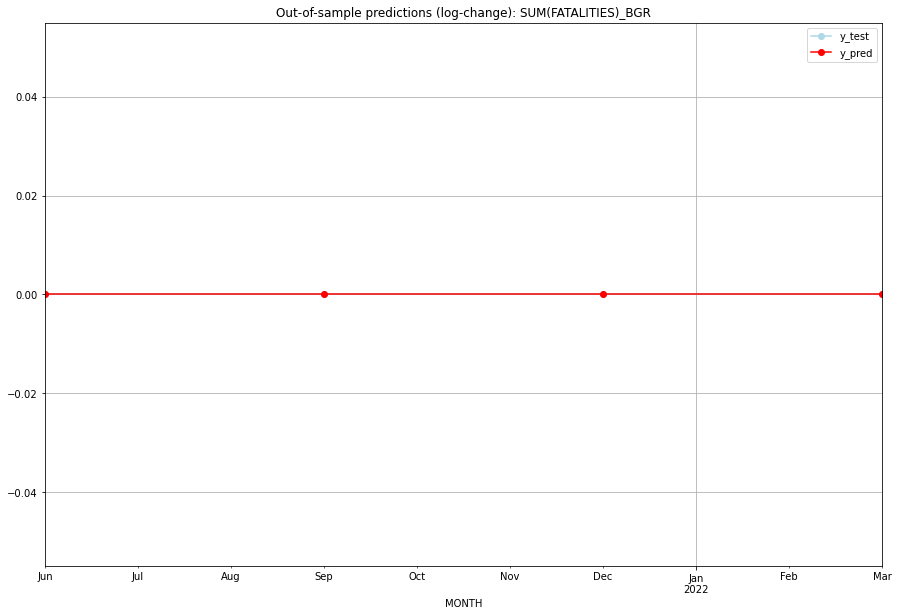

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BGR
1 2021-07-01       0.0         0.0           0.0             0.0   BGR
2 2021-10-01       0.0         0.0           0.0             0.0   BGR
3 2022-01-01       0.0         0.0           0.0             0.0   BGR
Execution time: 00:01
######## BHR (24/234) #########
0
Neighbor countries: []
Getting Data for BHR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

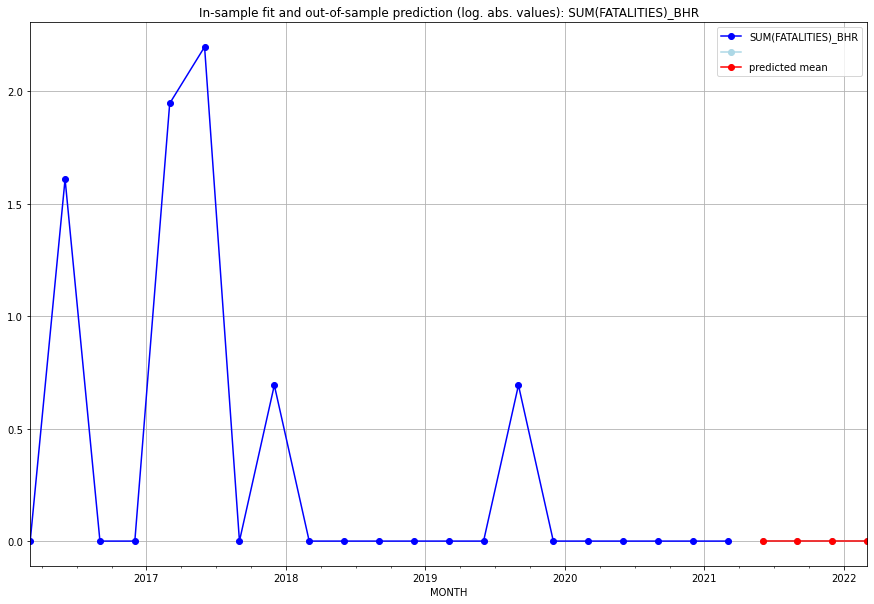

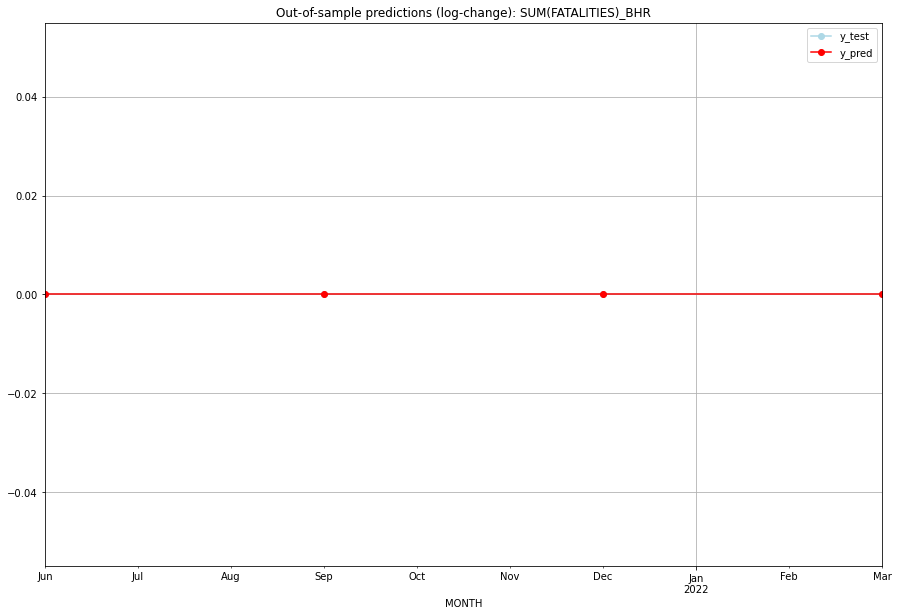

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BHR
1 2021-07-01       0.0         0.0           0.0             0.0   BHR
2 2021-10-01       0.0         0.0           0.0             0.0   BHR
3 2022-01-01       0.0         0.0           0.0             0.0   BHR
Execution time: 00:01
######## BHS (25/234) #########
0
Neighbor countries: []
Getting Data for BHS
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

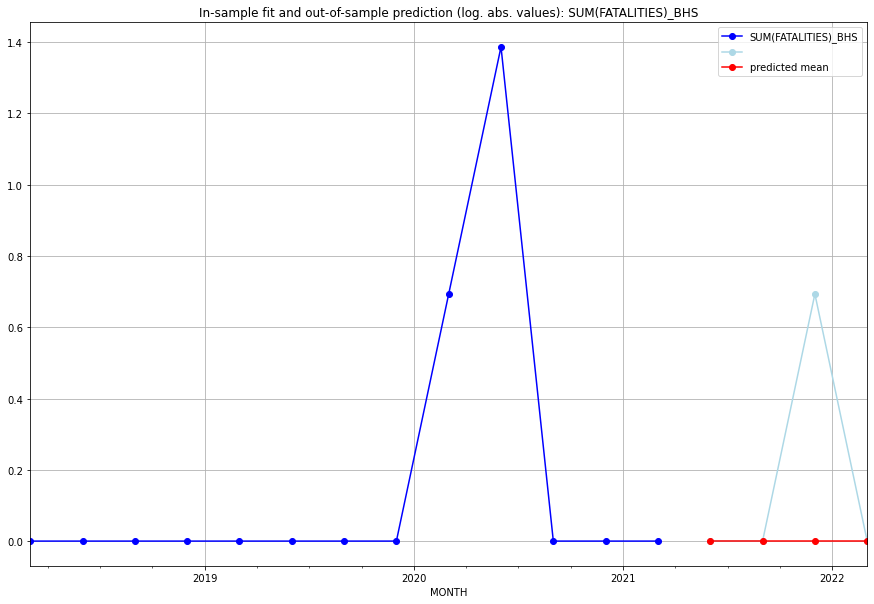

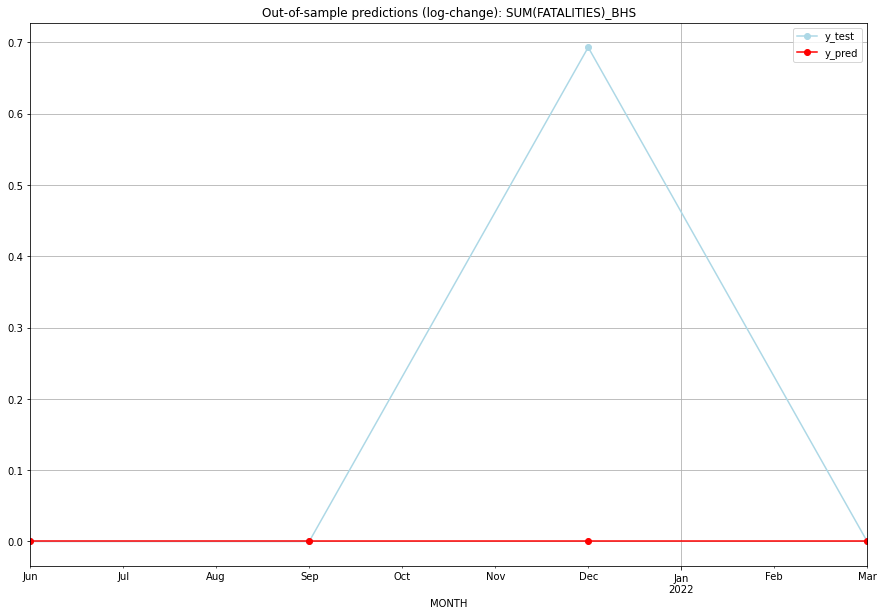

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.693147           0.0        0.693147
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   BHS
1 2021-07-01       0.0    0.000000           0.0        0.000000   BHS
2 2021-10-01       0.0    0.693147           0.0        0.693147   BHS
3 2022-01-01       0.0    0.000000           0.0        0.000000   BHS
Execution time: 00:01
######## BIH (26/234) #########
0
Neighbor countries: []
Getting Data for BIH
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

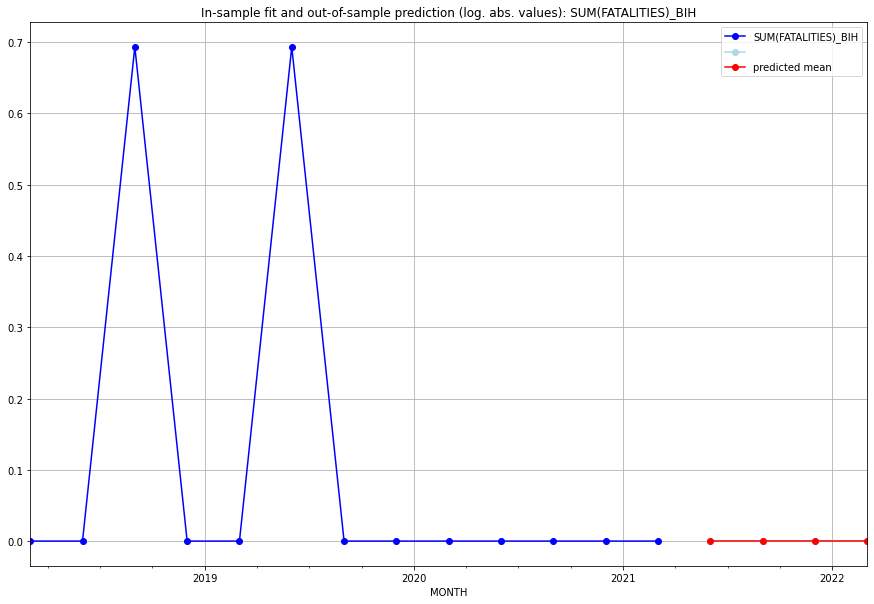

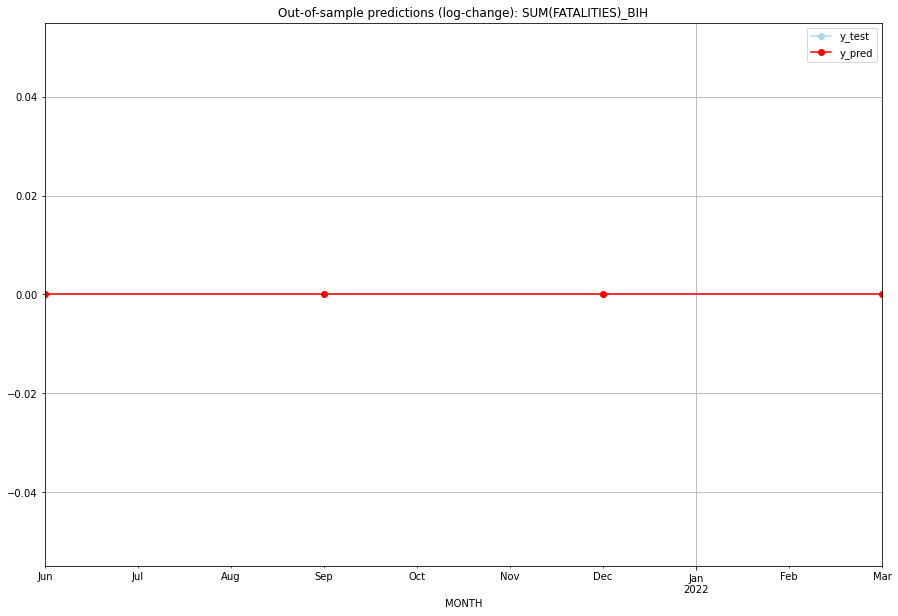

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BIH
1 2021-07-01       0.0         0.0           0.0             0.0   BIH
2 2021-10-01       0.0         0.0           0.0             0.0   BIH
3 2022-01-01       0.0         0.0           0.0             0.0   BIH
Execution time: 00:01
######## BLM (27/234) #########
0
Neighbor countries: []
Getting Data for BLM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

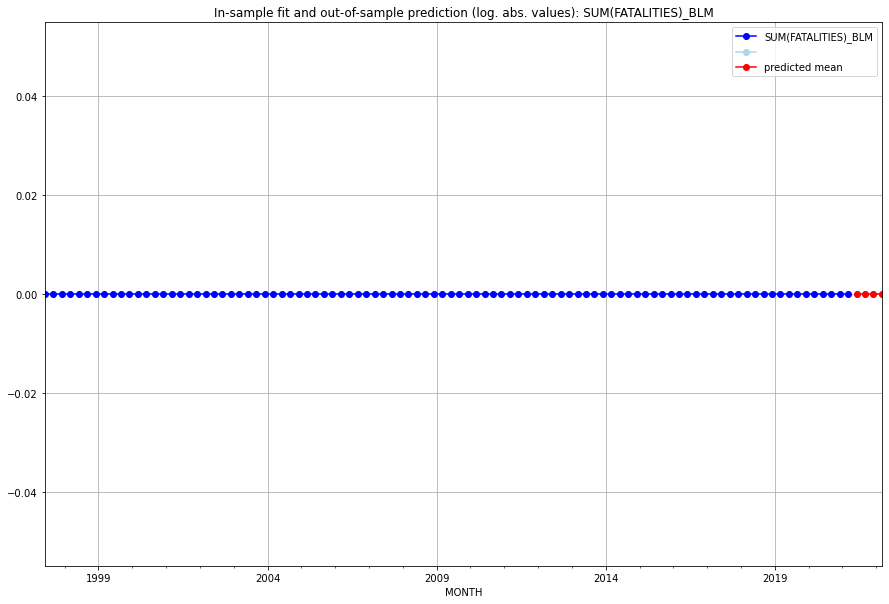

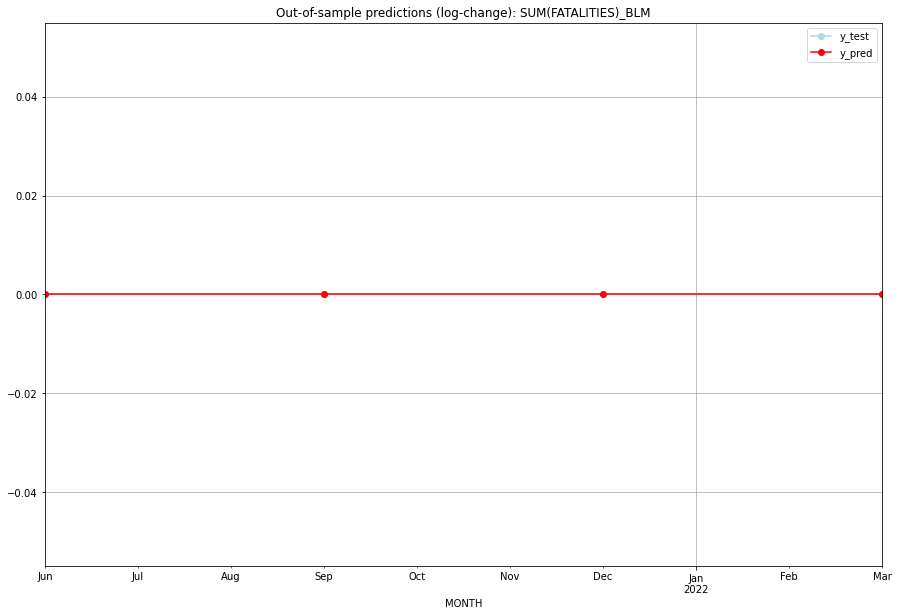

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BLM
1 2021-07-01       0.0         0.0           0.0             0.0   BLM
2 2021-10-01       0.0         0.0           0.0             0.0   BLM
3 2022-01-01       0.0         0.0           0.0             0.0   BLM
Execution time: 00:01
######## BLR (28/234) #########
0
Neighbor countries: []
Getting Data for BLR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

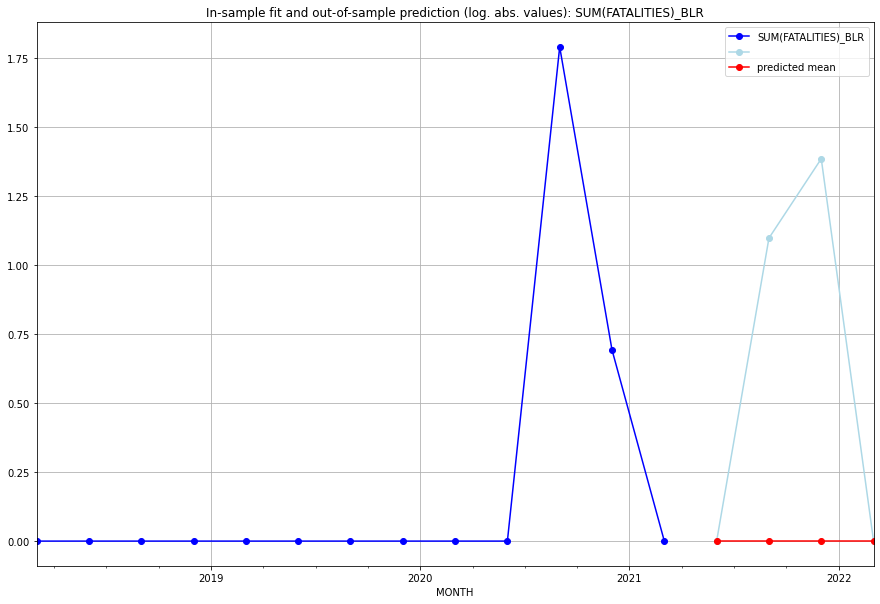

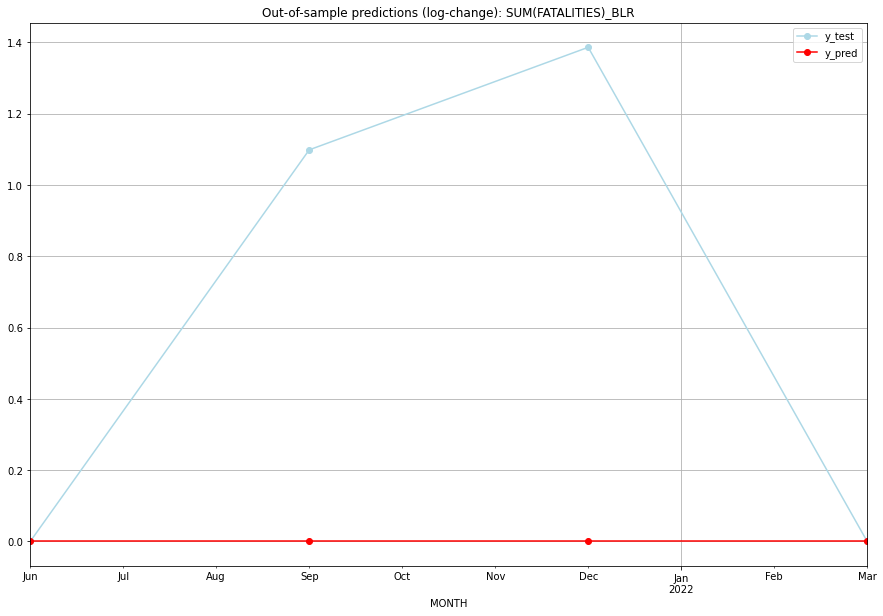

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    1.098612           0.0        1.098612
2  2021-10       0.0    1.386294           0.0        1.386294
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.6212266624470001
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   BLR
1 2021-07-01       0.0    1.098612           0.0        1.098612   BLR
2 2021-10-01       0.0    1.386294           0.0        1.386294   BLR
3 2022-01-01       0.0    0.000000           0.0        0.000000   BLR
Execution time: 00:01
######## BLZ (29/234) #########
0
Neighbor countries: []
Getting Data for BLZ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH      

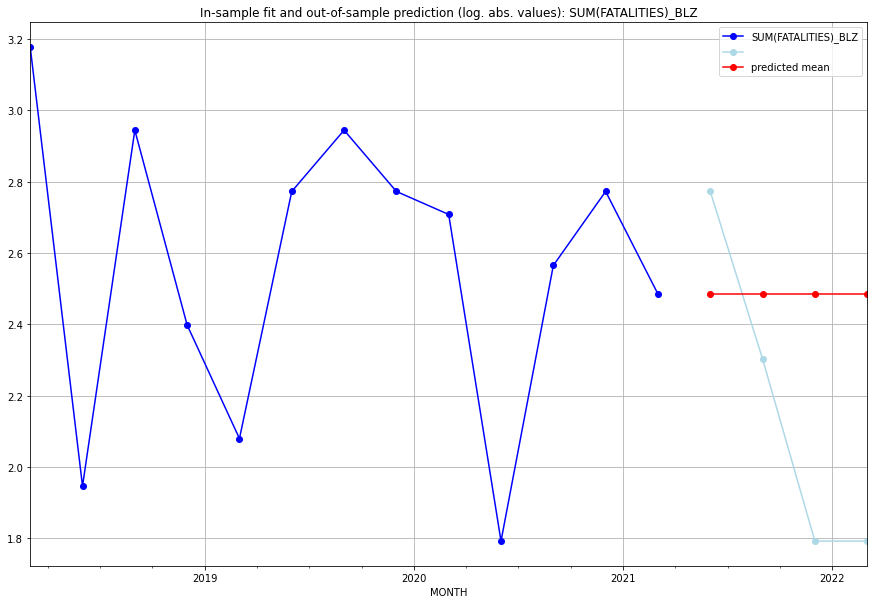

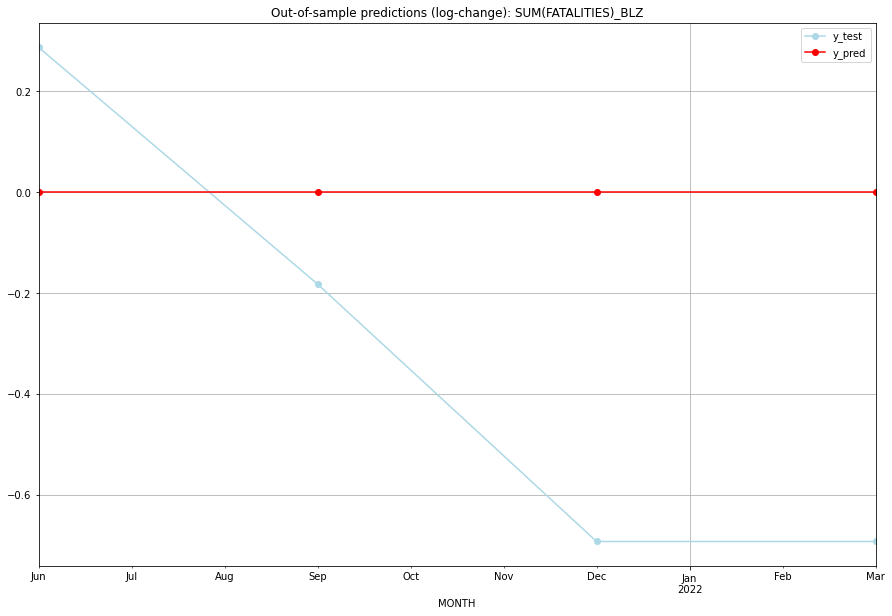

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.484907    2.772589           0.0        0.287682
1  2021-07  2.484907    2.302585           0.0       -0.182322
2  2021-10  2.484907    1.791759           0.0       -0.693147
3  2022-01  2.484907    1.791759           0.0       -0.693147
TADDA: 0.4640744975914065
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.484907    2.772589           0.0        0.287682   BLZ
1 2021-07-01  2.484907    2.302585           0.0       -0.182322   BLZ
2 2021-10-01  2.484907    1.791759           0.0       -0.693147   BLZ
3 2022-01-01  2.484907    1.791759           0.0       -0.693147   BLZ
Execution time: 00:01
######## BMU (30/234) #########
0
Neighbor countries: []
Getting Data for BMU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-

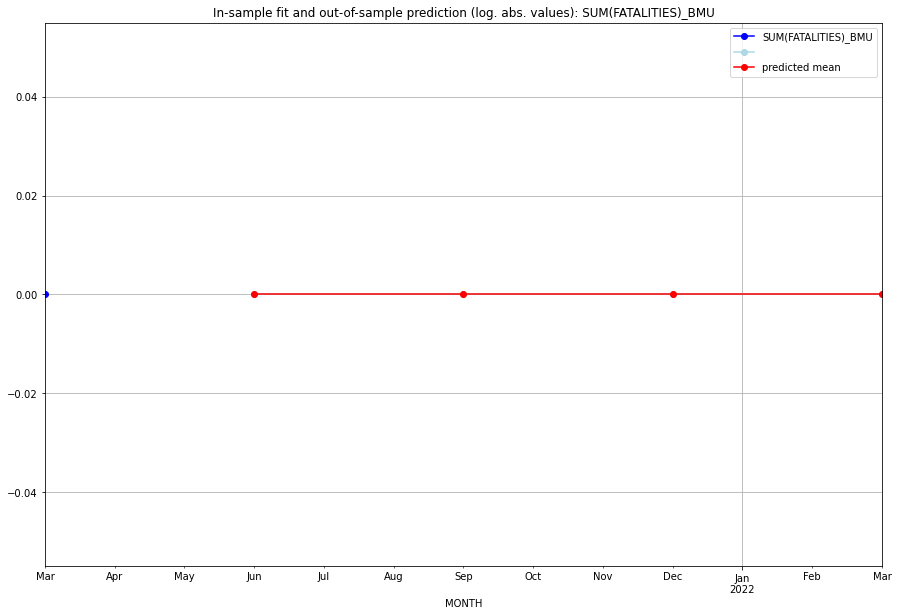

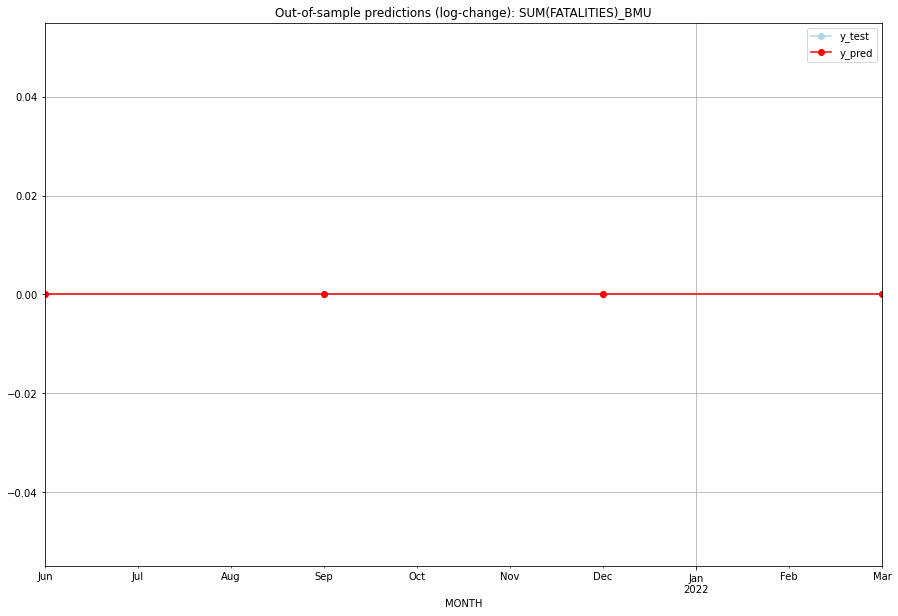

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BMU
1 2021-07-01       0.0         0.0           0.0             0.0   BMU
2 2021-10-01       0.0         0.0           0.0             0.0   BMU
3 2022-01-01       0.0         0.0           0.0             0.0   BMU
Execution time: 00:01
######## BOL (31/234) #########
0
Neighbor countries: []
Getting Data for BOL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04 

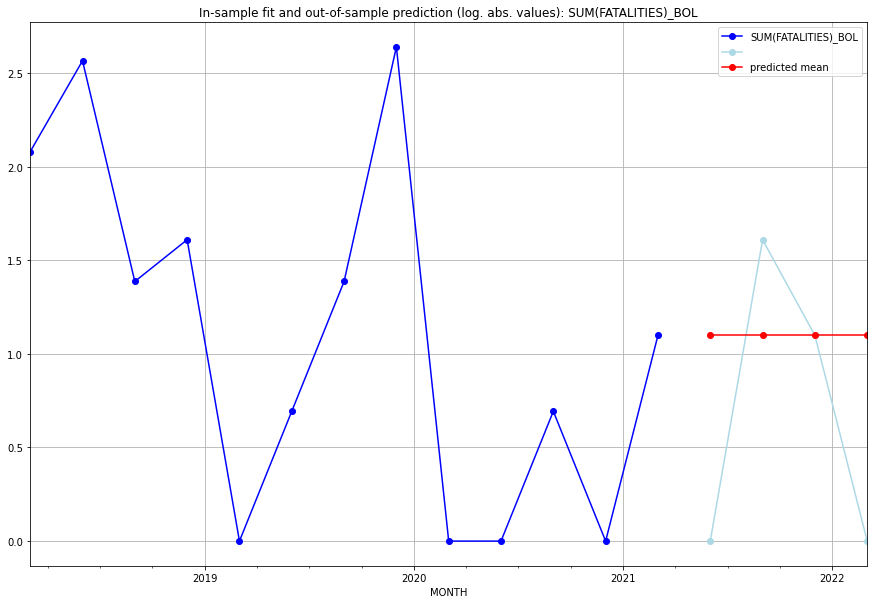

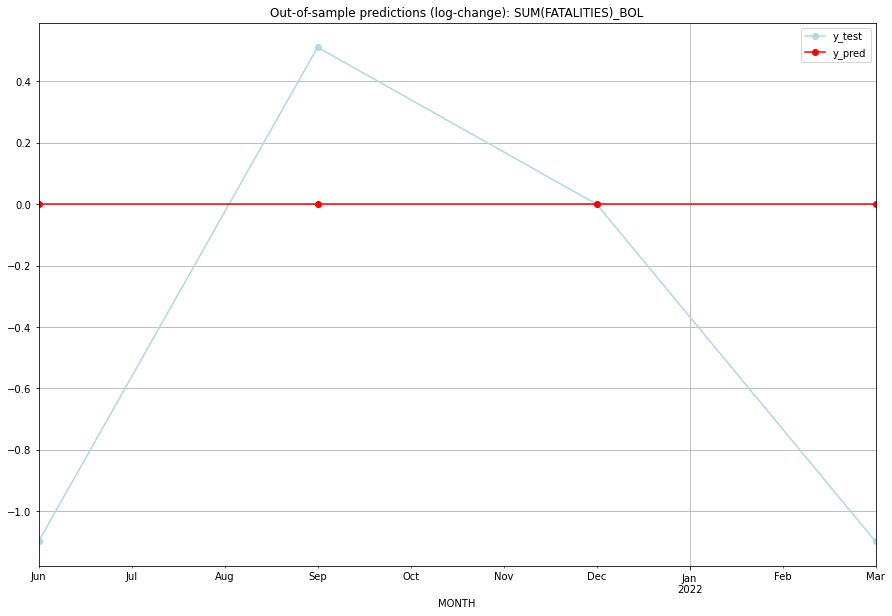

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    0.000000           0.0       -1.098612
1  2021-07  1.098612    1.609438           0.0        0.510826
2  2021-10  1.098612    1.098612           0.0        0.000000
3  2022-01  1.098612    0.000000           0.0       -1.098612
TADDA: 0.6770125502755526
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    0.000000           0.0       -1.098612   BOL
1 2021-07-01  1.098612    1.609438           0.0        0.510826   BOL
2 2021-10-01  1.098612    1.098612           0.0        0.000000   BOL
3 2022-01-01  1.098612    0.000000           0.0       -1.098612   BOL
Execution time: 00:01
######## BRA (32/234) #########
0
Neighbor countries: []
Getting Data for BRA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH      

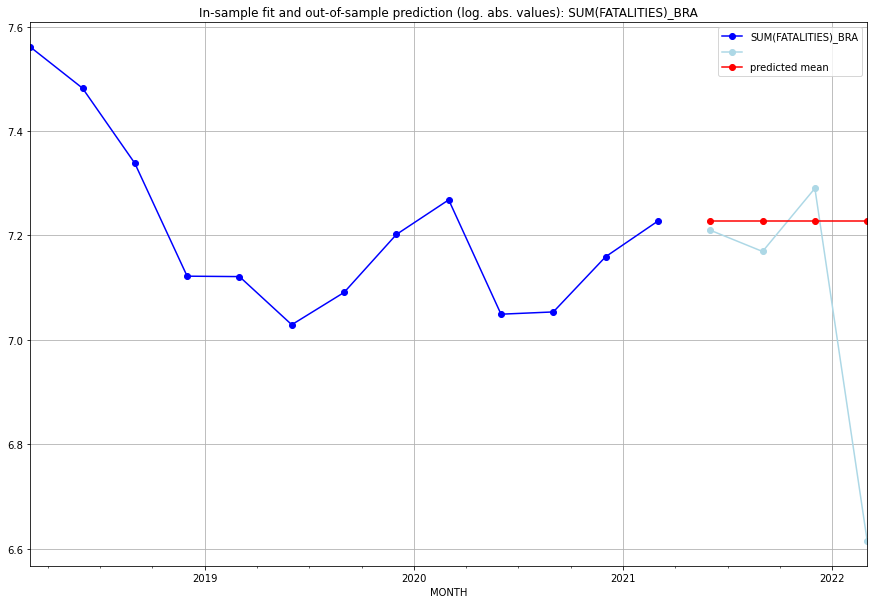

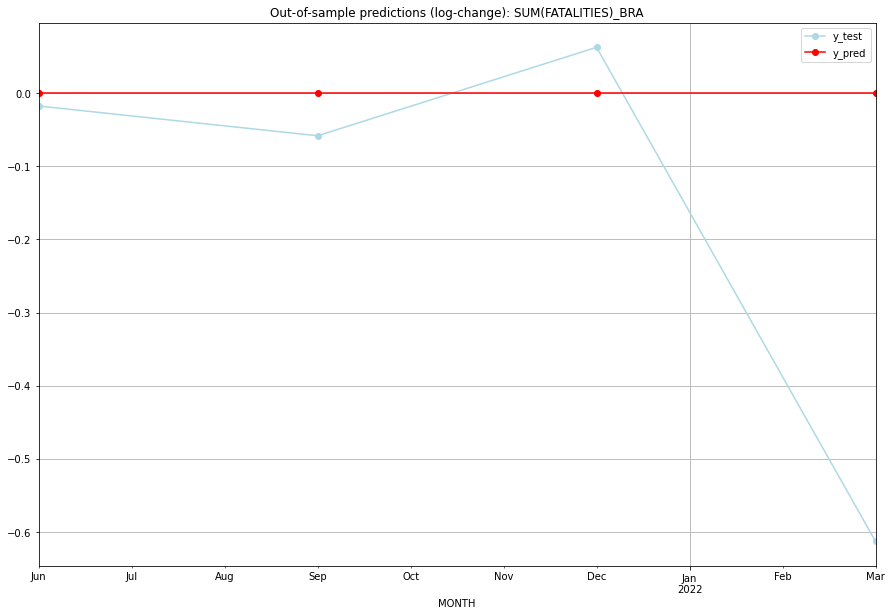

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  7.227662    7.210080           0.0       -0.017583
1  2021-07  7.227662    7.169350           0.0       -0.058312
2  2021-10  7.227662    7.290293           0.0        0.062630
3  2022-01  7.227662    6.614726           0.0       -0.612937
TADDA: 0.1878656587146894
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  7.227662    7.210080           0.0       -0.017583   BRA
1 2021-07-01  7.227662    7.169350           0.0       -0.058312   BRA
2 2021-10-01  7.227662    7.290293           0.0        0.062630   BRA
3 2022-01-01  7.227662    6.614726           0.0       -0.612937   BRA
Execution time: 00:01
######## BRB (33/234) #########
0
Neighbor countries: []
Getting Data for BRB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
202

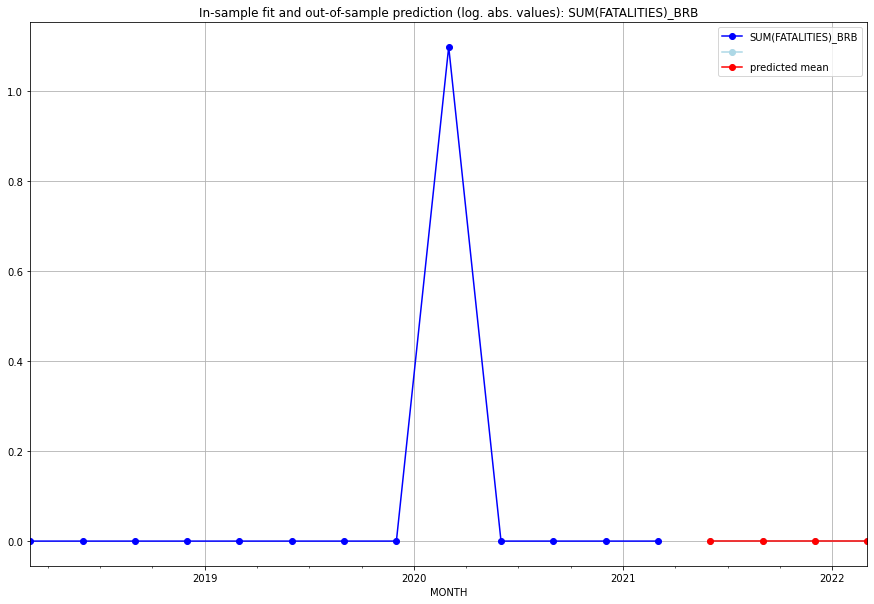

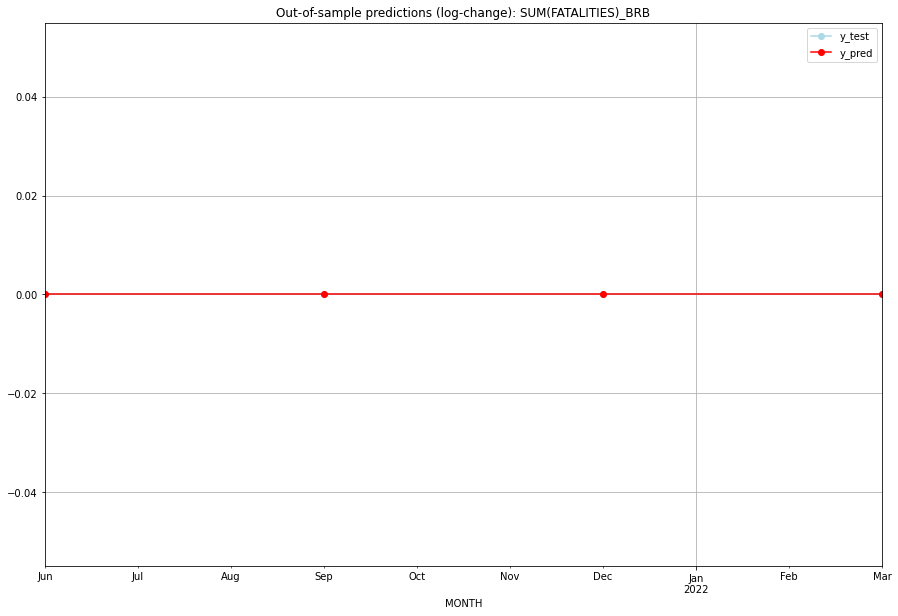

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BRB
1 2021-07-01       0.0         0.0           0.0             0.0   BRB
2 2021-10-01       0.0         0.0           0.0             0.0   BRB
3 2022-01-01       0.0         0.0           0.0             0.0   BRB
Execution time: 00:01
######## BRN (34/234) #########
0
Neighbor countries: []
Getting Data for BRN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

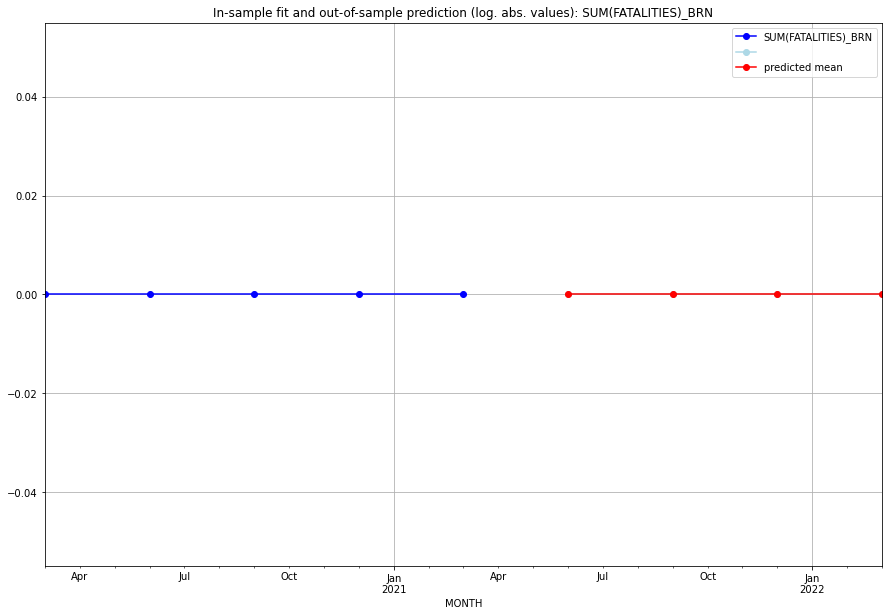

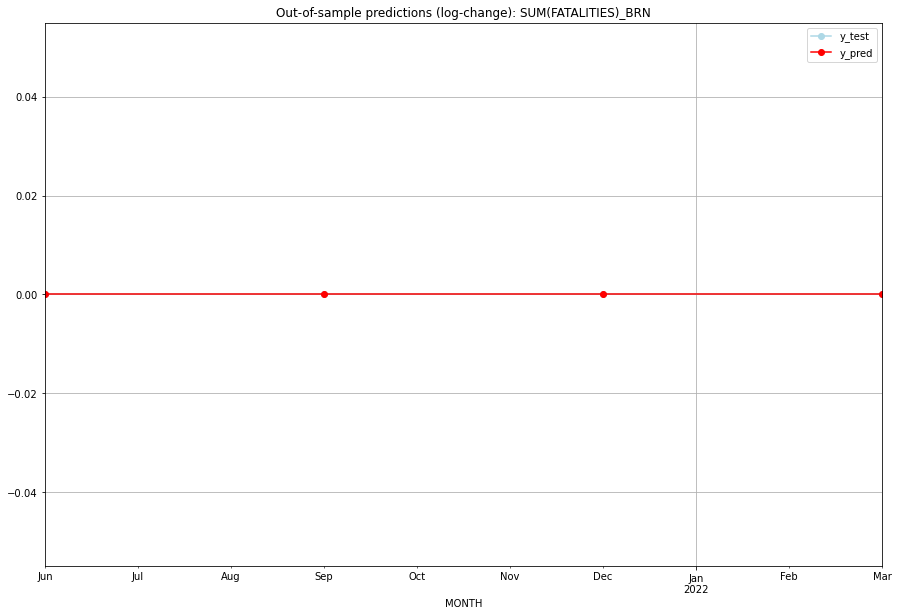

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BRN
1 2021-07-01       0.0         0.0           0.0             0.0   BRN
2 2021-10-01       0.0         0.0           0.0             0.0   BRN
3 2022-01-01       0.0         0.0           0.0             0.0   BRN
Execution time: 00:01
######## BTN (35/234) #########
0
Neighbor countries: []
Getting Data for BTN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

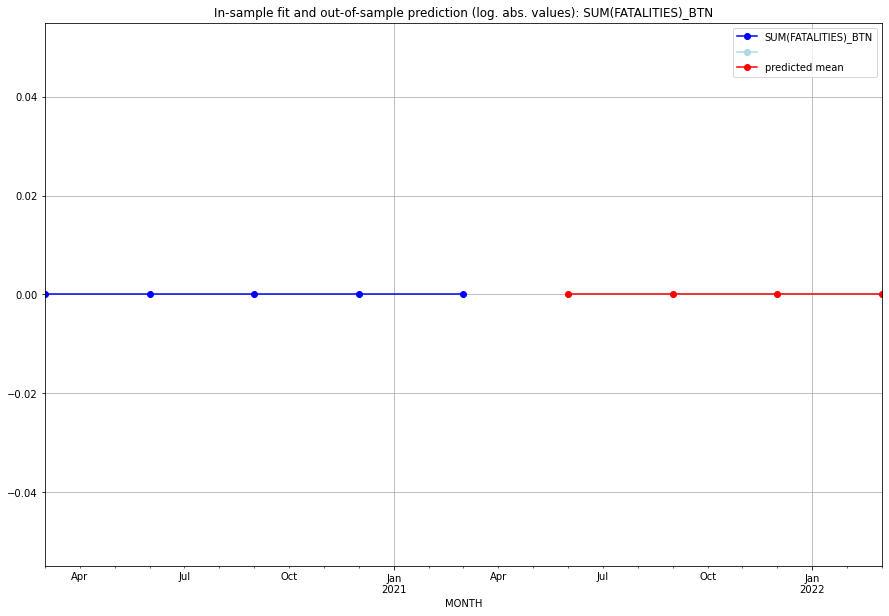

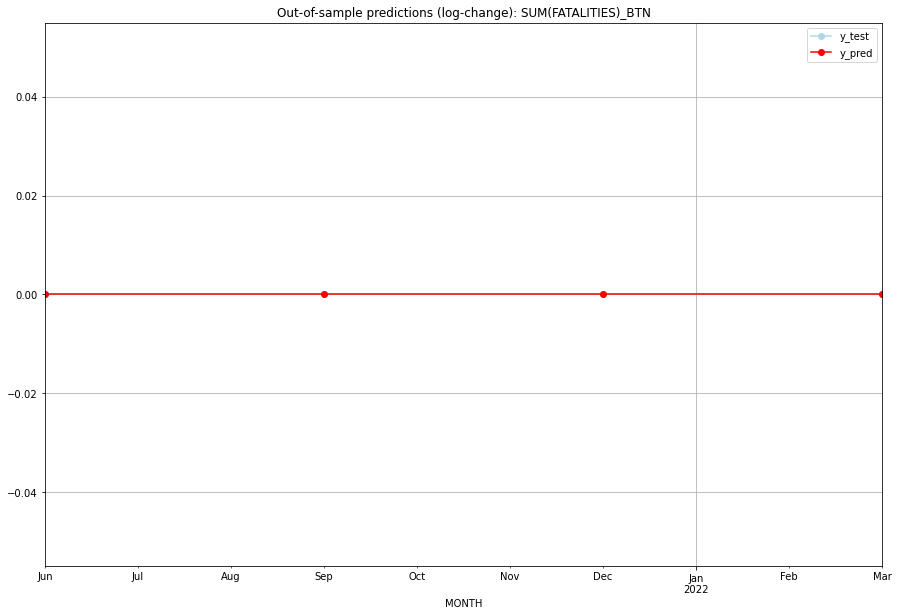

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   BTN
1 2021-07-01       0.0         0.0           0.0             0.0   BTN
2 2021-10-01       0.0         0.0           0.0             0.0   BTN
3 2022-01-01       0.0         0.0           0.0             0.0   BTN
Execution time: 00:01
######## BWA (36/234) #########
0
Neighbor countries: []
Getting Data for BWA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

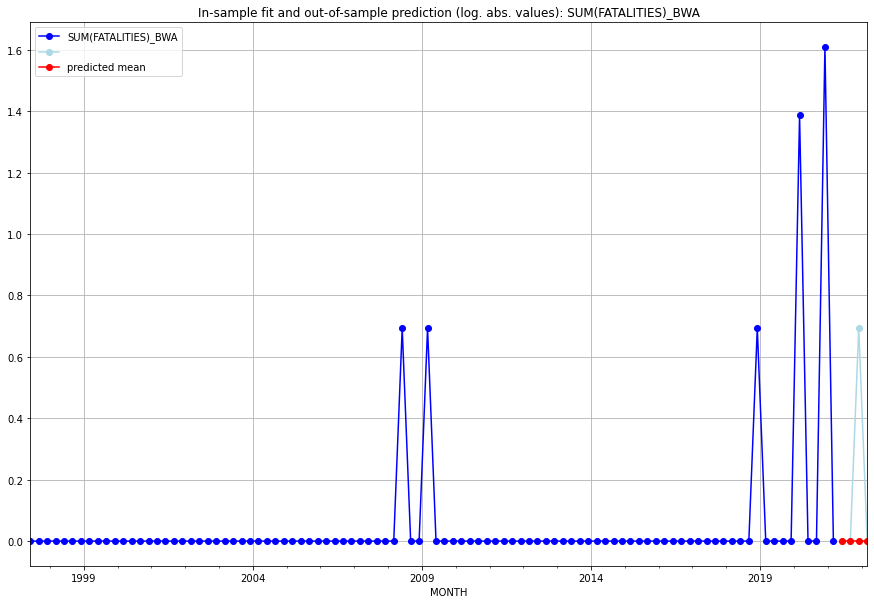

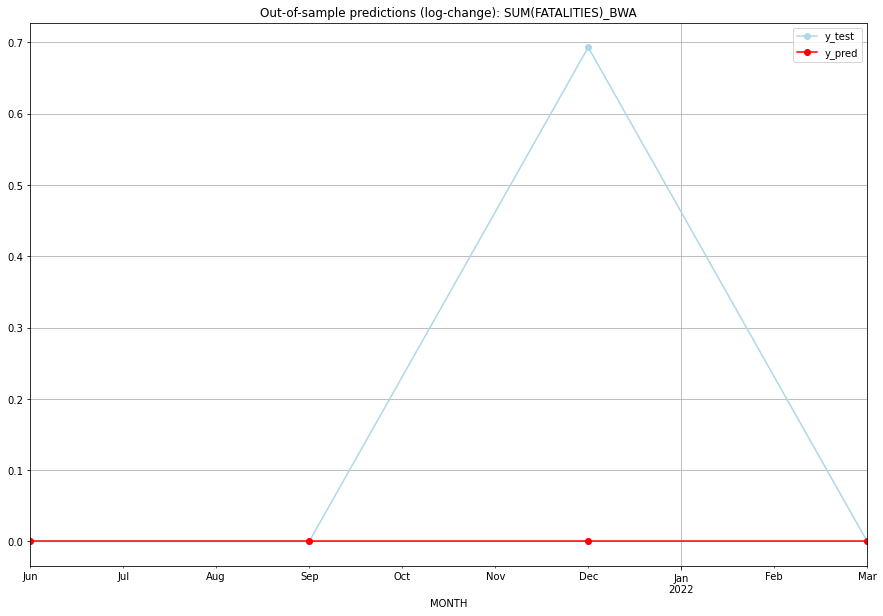

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.693147           0.0        0.693147
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   BWA
1 2021-07-01       0.0    0.000000           0.0        0.000000   BWA
2 2021-10-01       0.0    0.693147           0.0        0.693147   BWA
3 2022-01-01       0.0    0.000000           0.0        0.000000   BWA
Execution time: 00:01
######## CAF (37/234) #########
0
Neighbor countries: []
Getting Data for CAF
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

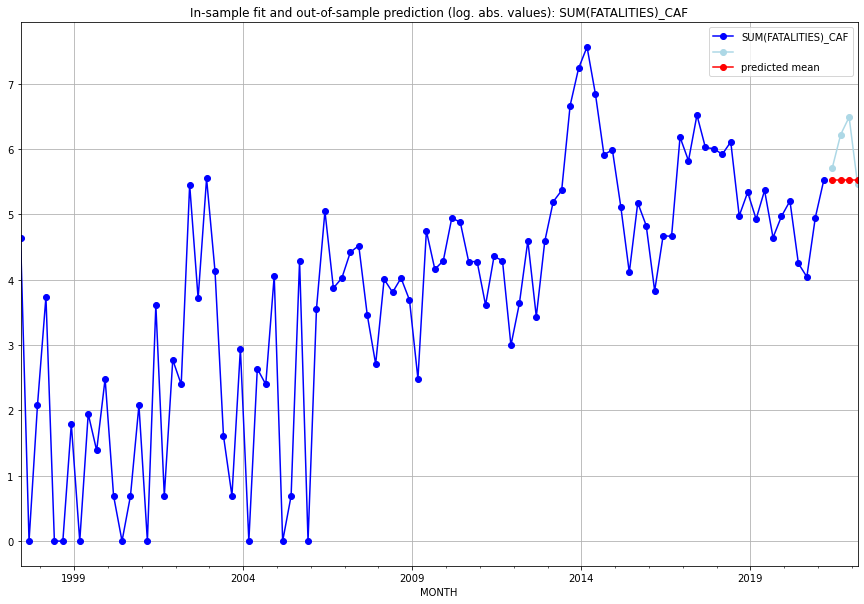

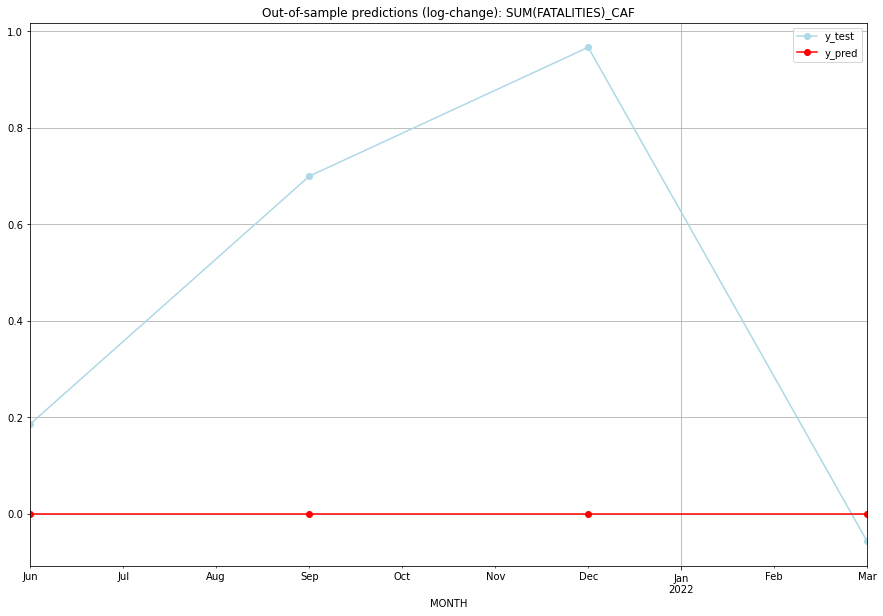

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.521461    5.707110           0.0        0.185649
1  2021-07  5.521461    6.220590           0.0        0.699129
2  2021-10  5.521461    6.487684           0.0        0.966223
3  2022-01  5.521461    5.463832           0.0       -0.057629
TADDA: 0.47715770314578054
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.521461    5.707110           0.0        0.185649   CAF
1 2021-07-01  5.521461    6.220590           0.0        0.699129   CAF
2 2021-10-01  5.521461    6.487684           0.0        0.966223   CAF
3 2022-01-01  5.521461    5.463832           0.0       -0.057629   CAF
Execution time: 00:01
######## CAN (38/234) #########
0
Neighbor countries: []
Getting Data for CAN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
                0
MONTH       

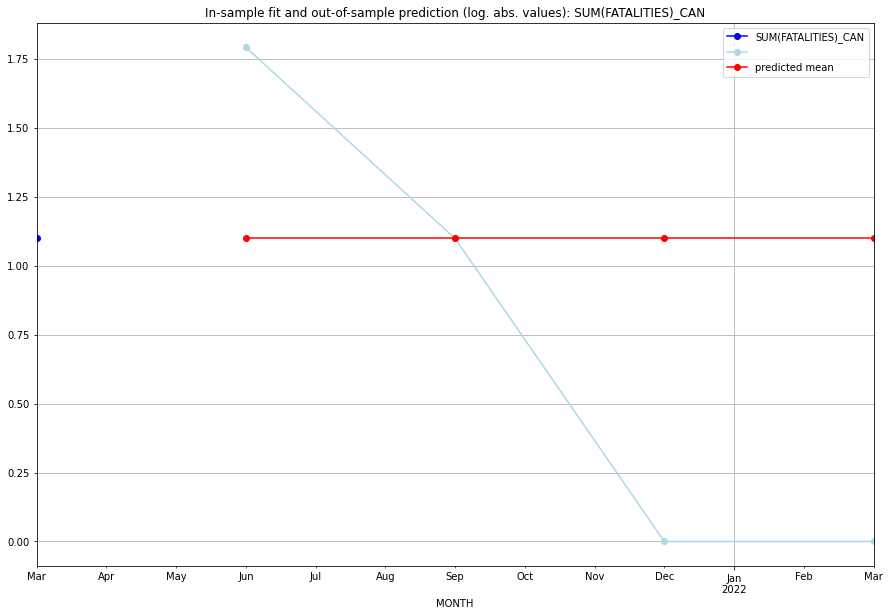

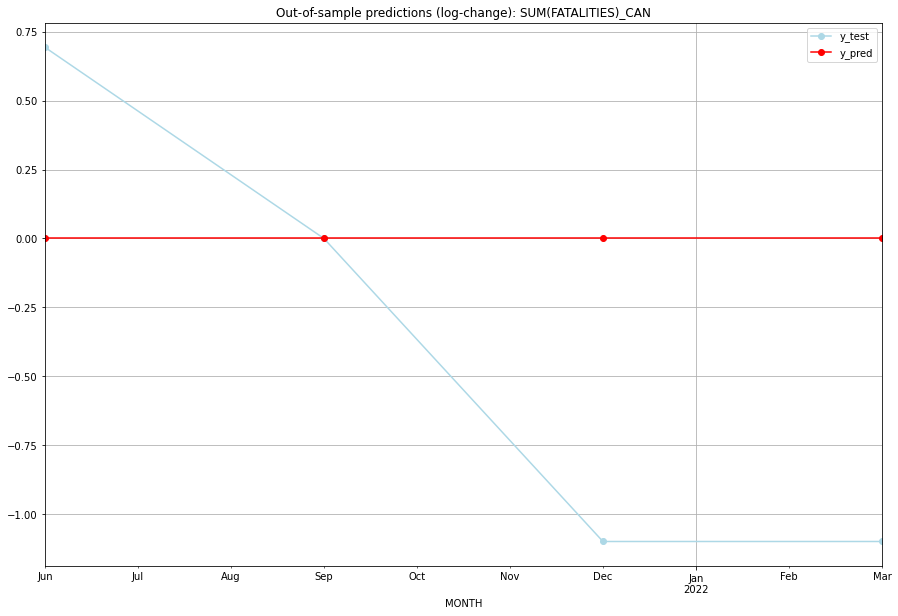

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    1.791759           0.0        0.693147
1  2021-07  1.098612    1.098612           0.0        0.000000
2  2021-10  1.098612    0.000000           0.0       -1.098612
3  2022-01  1.098612    0.000000           0.0       -1.098612
TADDA: 0.7225929394740411
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    1.791759           0.0        0.693147   CAN
1 2021-07-01  1.098612    1.098612           0.0        0.000000   CAN
2 2021-10-01  1.098612    0.000000           0.0       -1.098612   CAN
3 2022-01-01  1.098612    0.000000           0.0       -1.098612   CAN
Execution time: 00:01
######## CHE (39/234) #########
0
Neighbor countries: []
Getting Data for CHE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

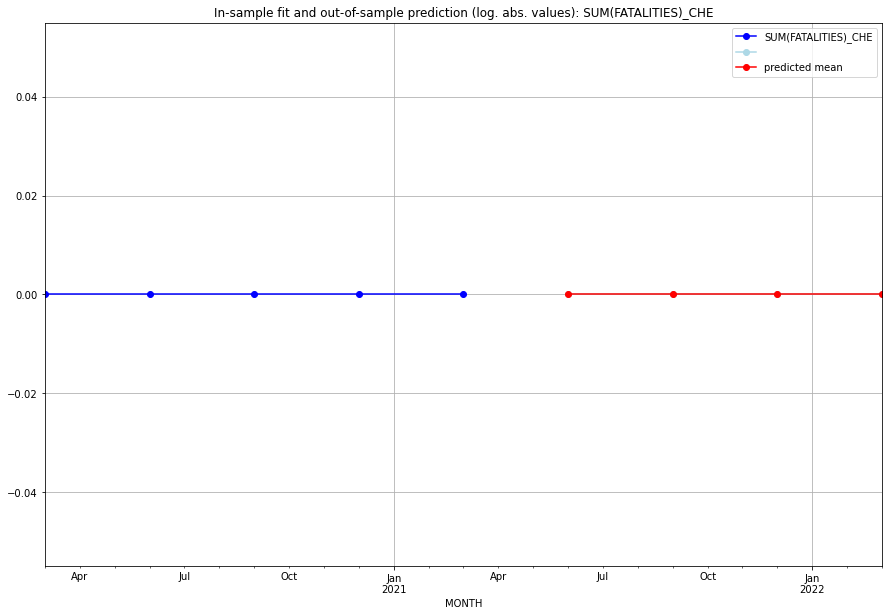

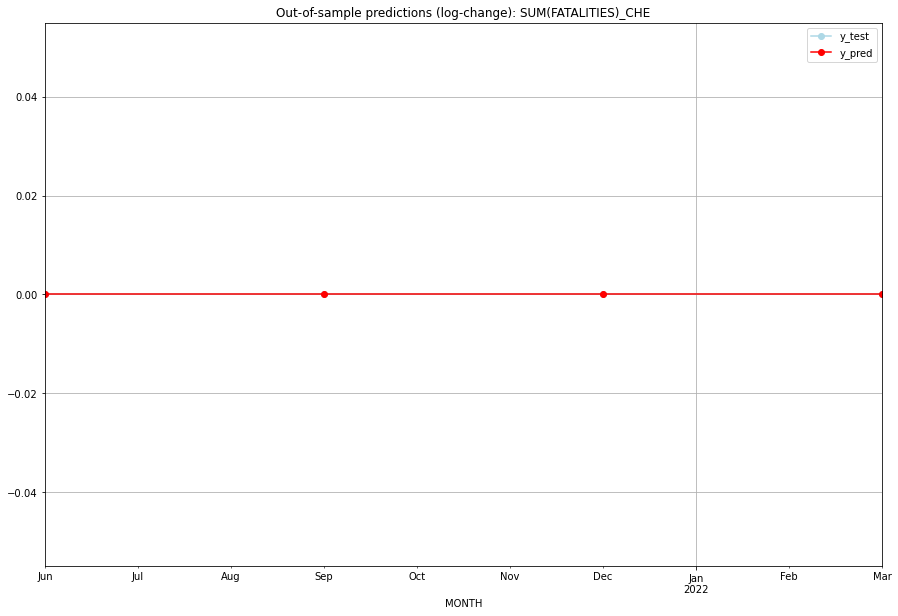

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   CHE
1 2021-07-01       0.0         0.0           0.0             0.0   CHE
2 2021-10-01       0.0         0.0           0.0             0.0   CHE
3 2022-01-01       0.0         0.0           0.0             0.0   CHE
Execution time: 00:01
######## CHL (40/234) #########
0
Neighbor countries: []
Getting Data for CHL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
               0
MONTH           
2021-04  1

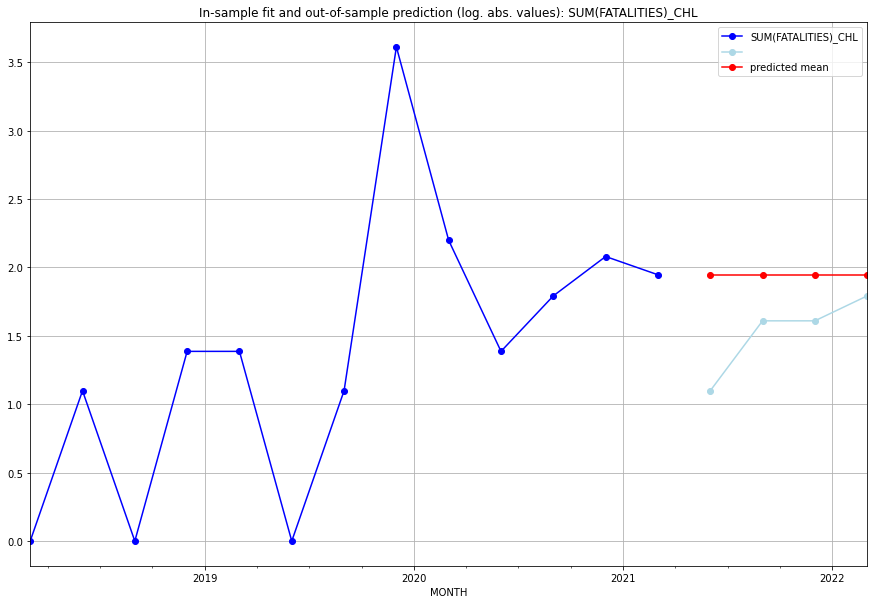

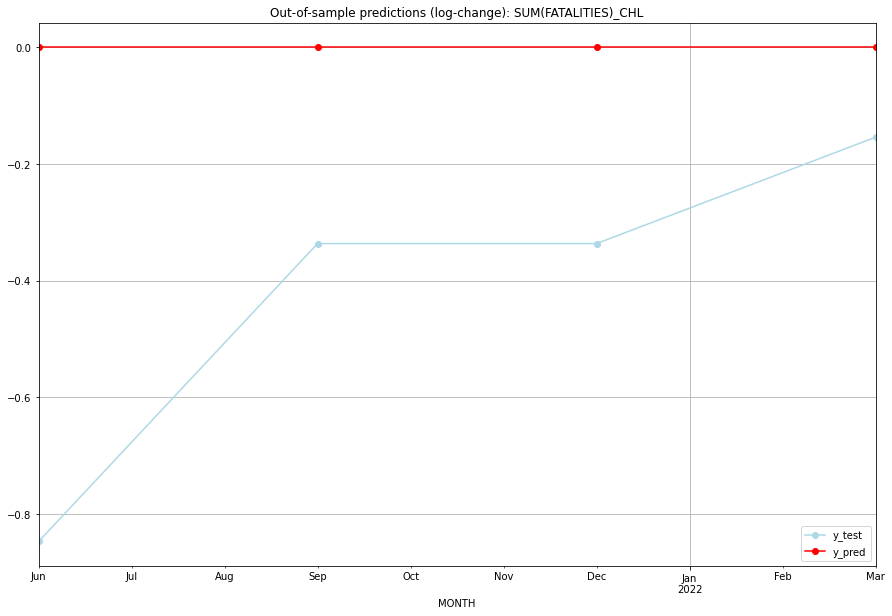

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04   1.94591    1.098612           0.0       -0.847298
1  2021-07   1.94591    1.609438           0.0       -0.336472
2  2021-10   1.94591    1.609438           0.0       -0.336472
3  2022-01   1.94591    1.791759           0.0       -0.154151
TADDA: 0.41859825336422135
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01   1.94591    1.098612           0.0       -0.847298   CHL
1 2021-07-01   1.94591    1.609438           0.0       -0.336472   CHL
2 2021-10-01   1.94591    1.609438           0.0       -0.336472   CHL
3 2022-01-01   1.94591    1.791759           0.0       -0.154151   CHL
Execution time: 00:01
######## CHN (41/234) #########
0
Neighbor countries: []
Getting Data for CHN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
               0
MONTH      

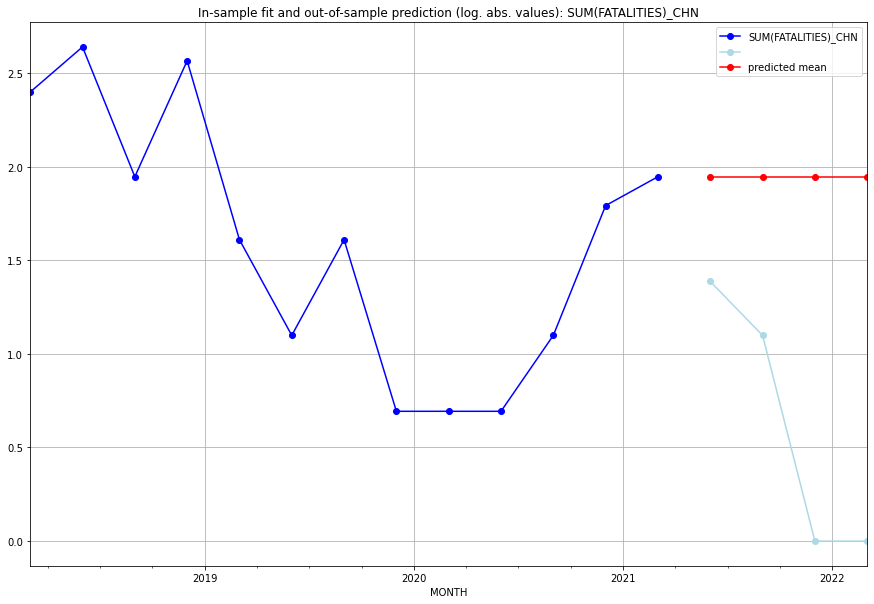

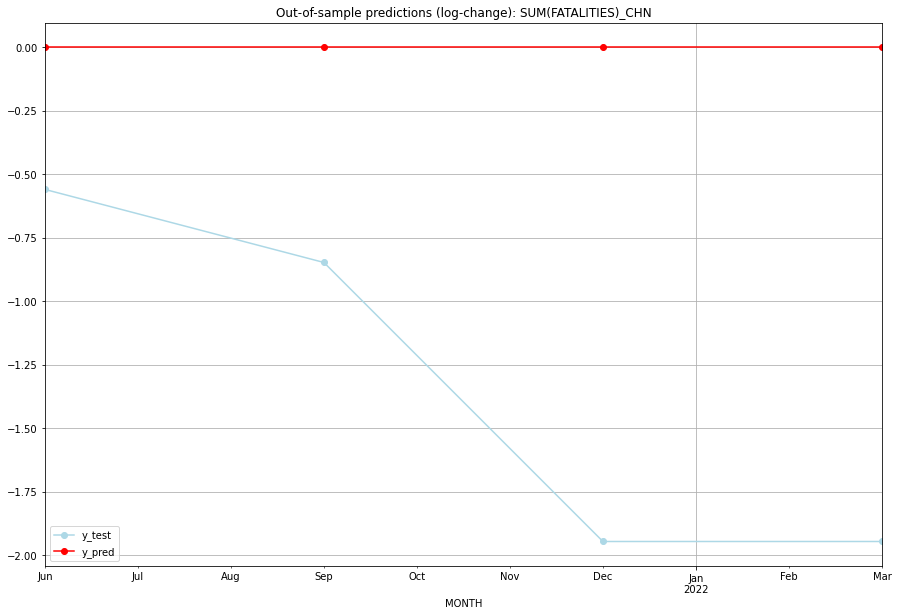

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04   1.94591    1.386294           0.0       -0.559616
1  2021-07   1.94591    1.098612           0.0       -0.847298
2  2021-10   1.94591    0.000000           0.0       -1.945910
3  2022-01   1.94591    0.000000           0.0       -1.945910
TADDA: 1.3246834866083126
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01   1.94591    1.386294           0.0       -0.559616   CHN
1 2021-07-01   1.94591    1.098612           0.0       -0.847298   CHN
2 2021-10-01   1.94591    0.000000           0.0       -1.945910   CHN
3 2022-01-01   1.94591    0.000000           0.0       -1.945910   CHN
Execution time: 00:01
######## CIV (42/234) #########
0
Neighbor countries: []
Getting Data for CIV
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

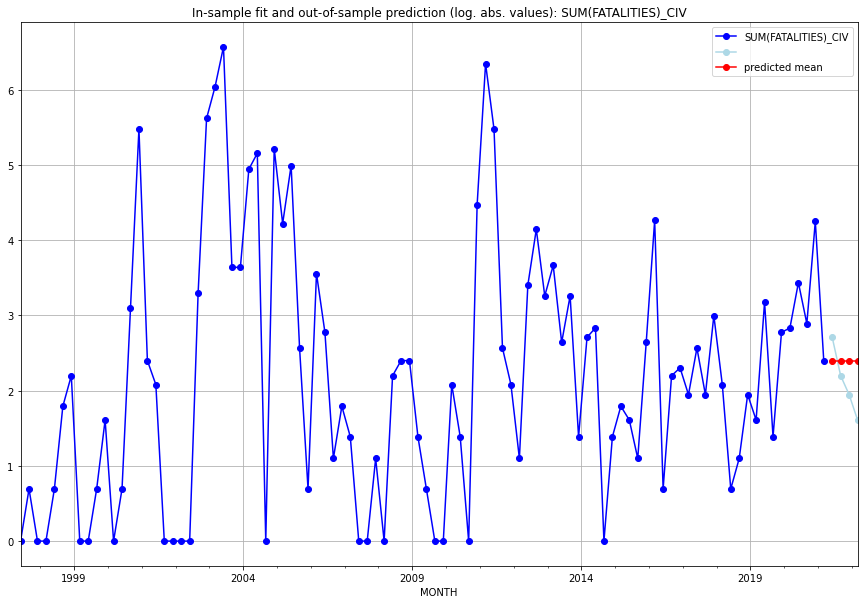

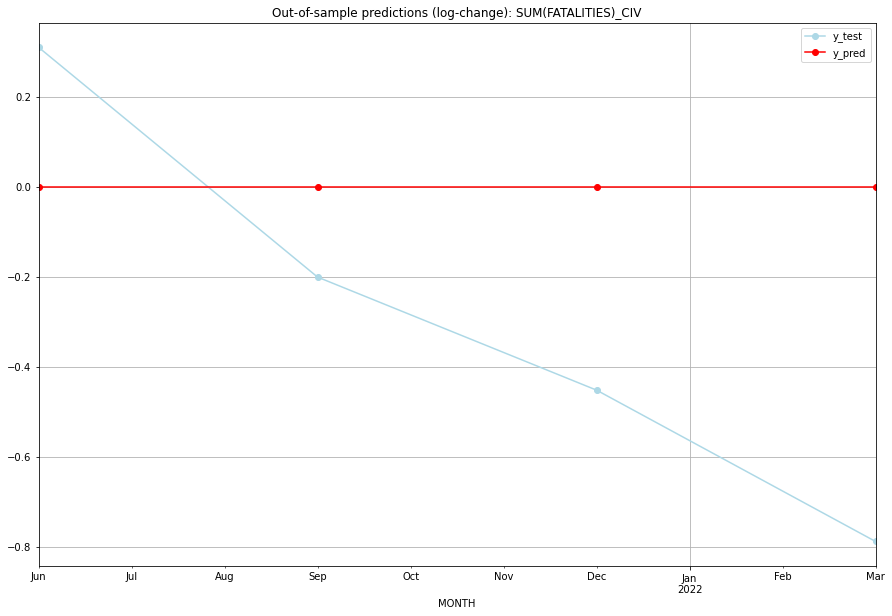

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.397895    2.708050           0.0        0.310155
1  2021-07  2.397895    2.197225           0.0       -0.200671
2  2021-10  2.397895    1.945910           0.0       -0.451985
3  2022-01  2.397895    1.609438           0.0       -0.788457
TADDA: 0.4378170269683295
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.397895    2.708050           0.0        0.310155   CIV
1 2021-07-01  2.397895    2.197225           0.0       -0.200671   CIV
2 2021-10-01  2.397895    1.945910           0.0       -0.451985   CIV
3 2022-01-01  2.397895    1.609438           0.0       -0.788457   CIV
Execution time: 00:01
######## CMR (43/234) #########
0
Neighbor countries: []
Getting Data for CMR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

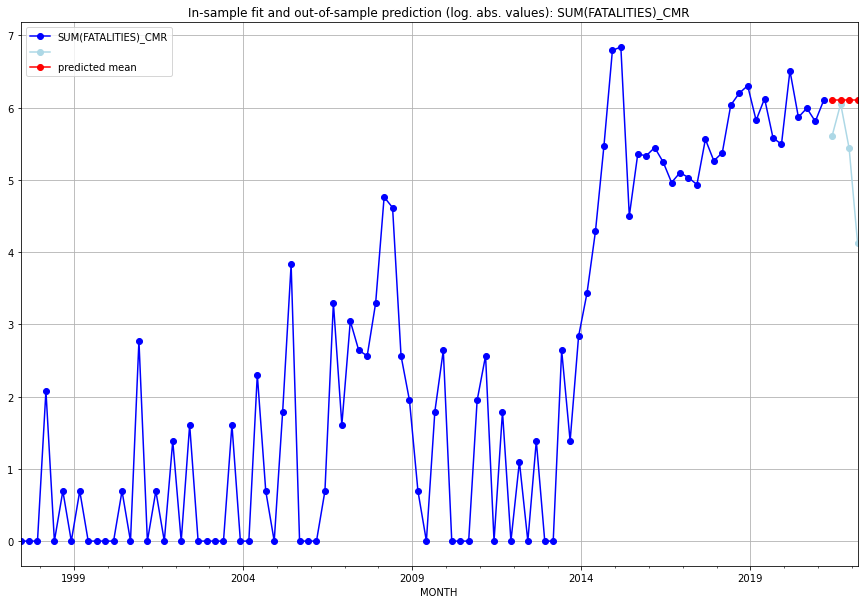

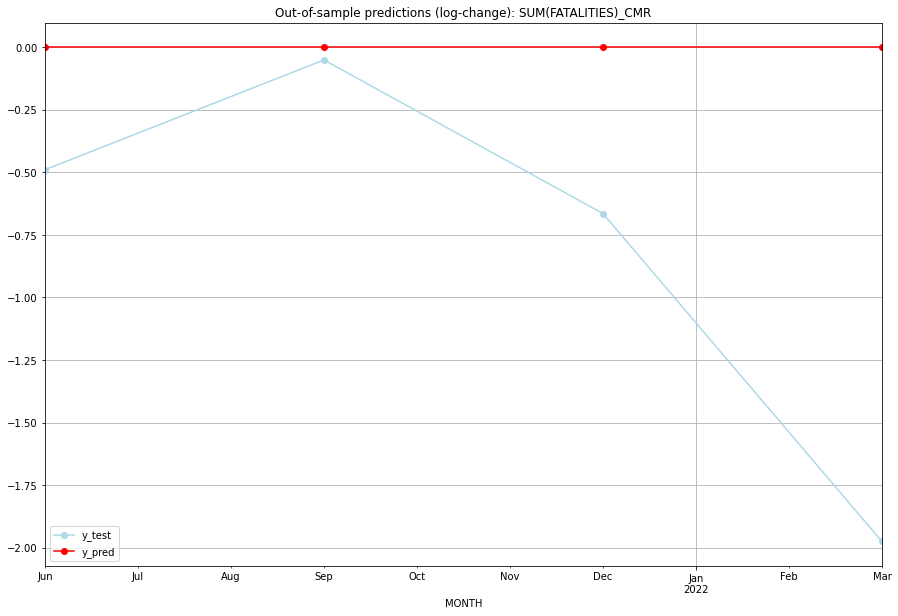

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.102559    5.613128           0.0       -0.489430
1  2021-07  6.102559    6.052089           0.0       -0.050469
2  2021-10  6.102559    5.438079           0.0       -0.664479
3  2022-01  6.102559    4.127134           0.0       -1.975424
TADDA: 0.7949508522933753
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.102559    5.613128           0.0       -0.489430   CMR
1 2021-07-01  6.102559    6.052089           0.0       -0.050469   CMR
2 2021-10-01  6.102559    5.438079           0.0       -0.664479   CMR
3 2022-01-01  6.102559    4.127134           0.0       -1.975424   CMR
Execution time: 00:01
######## COD (44/234) #########
0
Neighbor countries: []
Getting Data for COD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

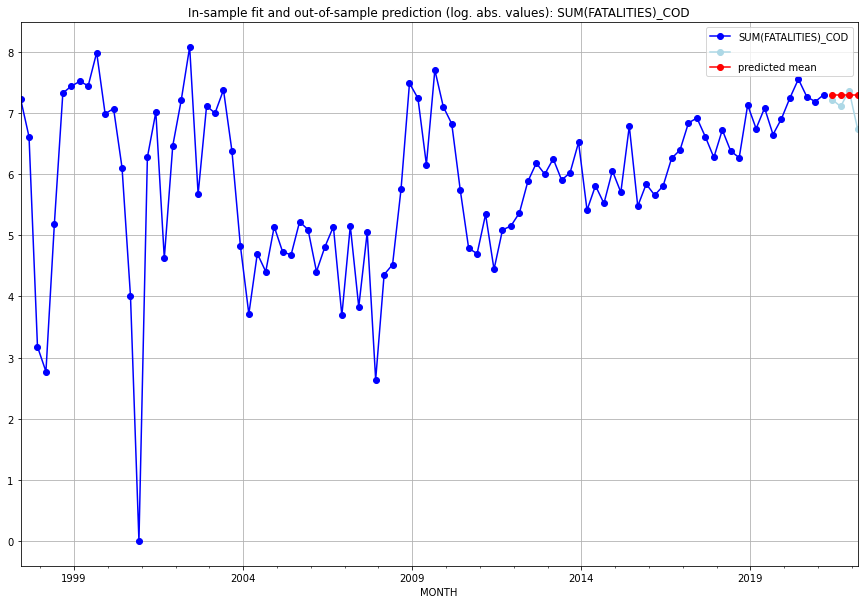

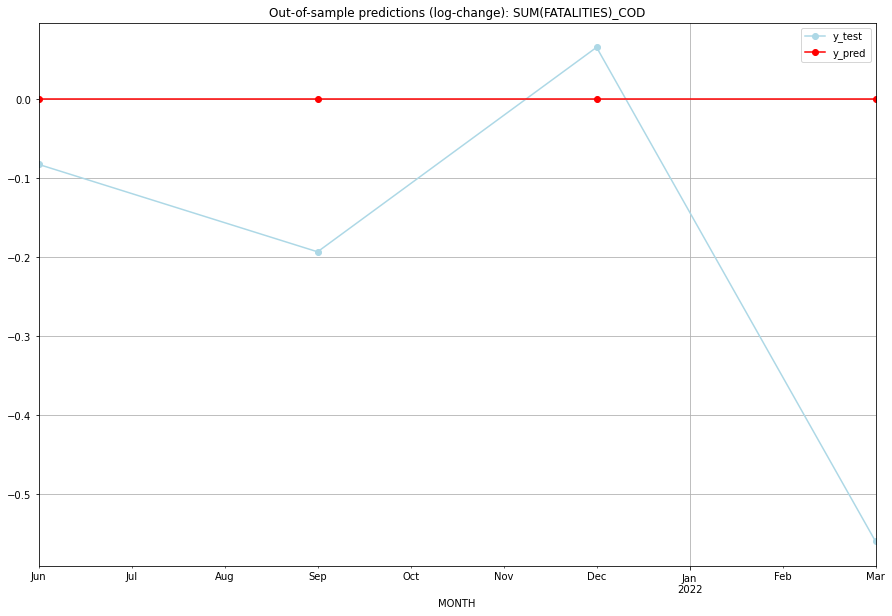

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  7.300473    7.218177           0.0       -0.082296
1  2021-07  7.300473    7.107425           0.0       -0.193047
2  2021-10  7.300473    7.366445           0.0        0.065972
3  2022-01  7.300473    6.740519           0.0       -0.559953
TADDA: 0.2253172761857154
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  7.300473    7.218177           0.0       -0.082296   COD
1 2021-07-01  7.300473    7.107425           0.0       -0.193047   COD
2 2021-10-01  7.300473    7.366445           0.0        0.065972   COD
3 2022-01-01  7.300473    6.740519           0.0       -0.559953   COD
Execution time: 00:01
######## COG (45/234) #########
0
Neighbor countries: []
Getting Data for COG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

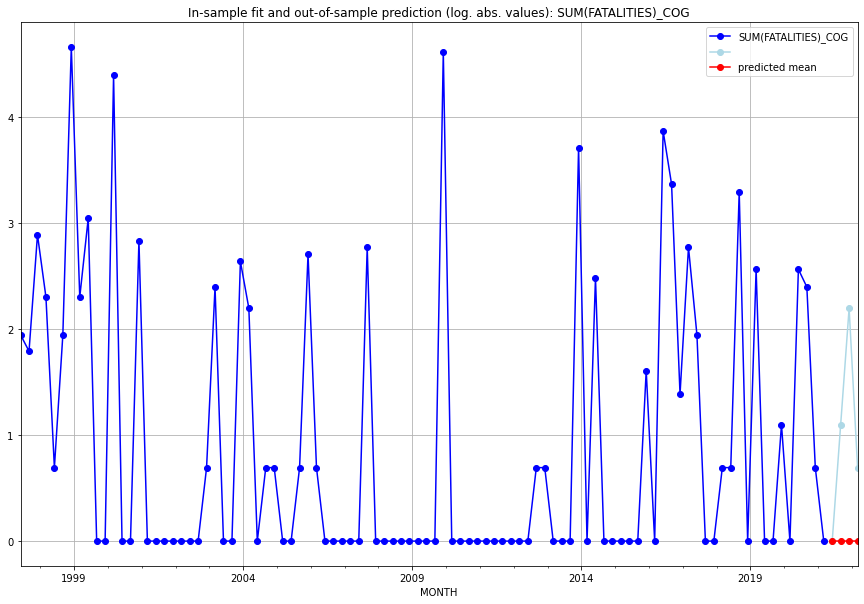

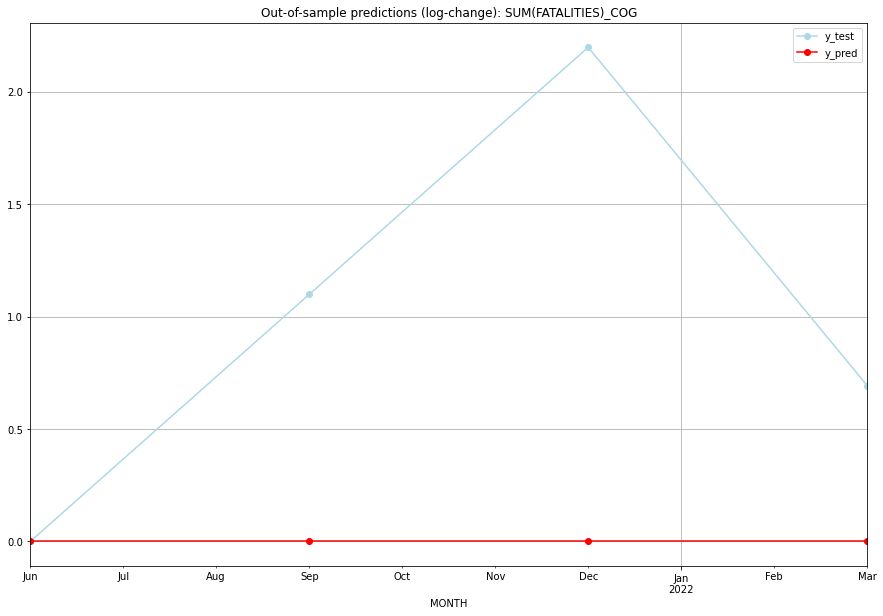

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    1.098612           0.0        1.098612
2  2021-10       0.0    2.197225           0.0        2.197225
3  2022-01       0.0    0.693147           0.0        0.693147
TADDA: 0.9972460116410689
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   COG
1 2021-07-01       0.0    1.098612           0.0        1.098612   COG
2 2021-10-01       0.0    2.197225           0.0        2.197225   COG
3 2022-01-01       0.0    0.693147           0.0        0.693147   COG
Execution time: 00:01
######## COK (46/234) #########
0
Neighbor countries: []
Getting Data for COK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-

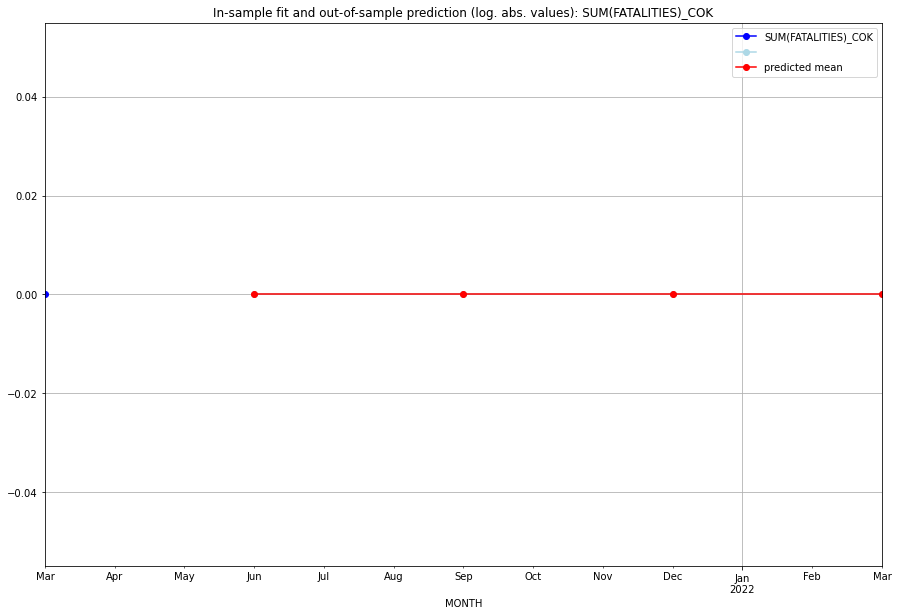

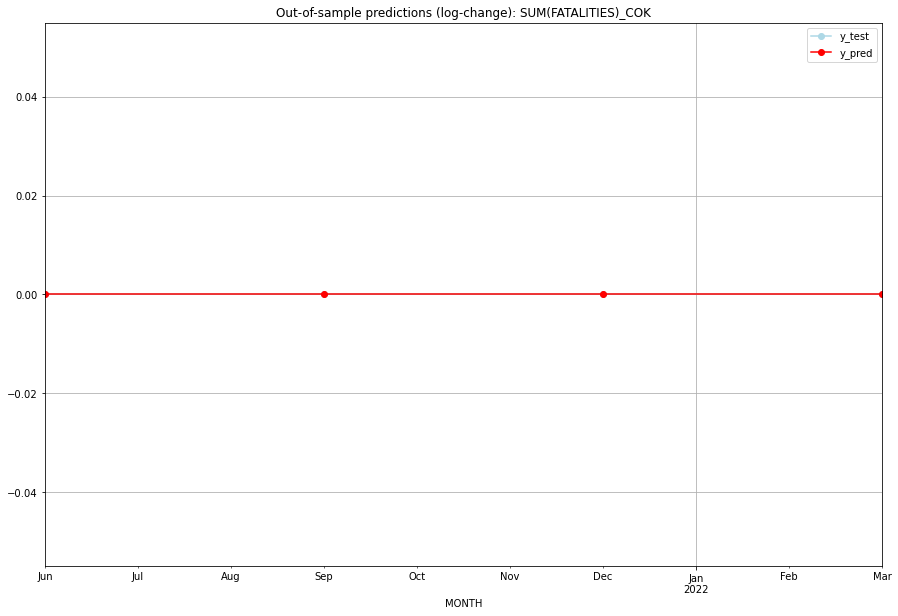

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   COK
1 2021-07-01       0.0         0.0           0.0             0.0   COK
2 2021-10-01       0.0         0.0           0.0             0.0   COK
3 2022-01-01       0.0         0.0           0.0             0.0   COK
Execution time: 00:01
######## COL (47/234) #########
0
Neighbor countries: []
Getting Data for COL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04 

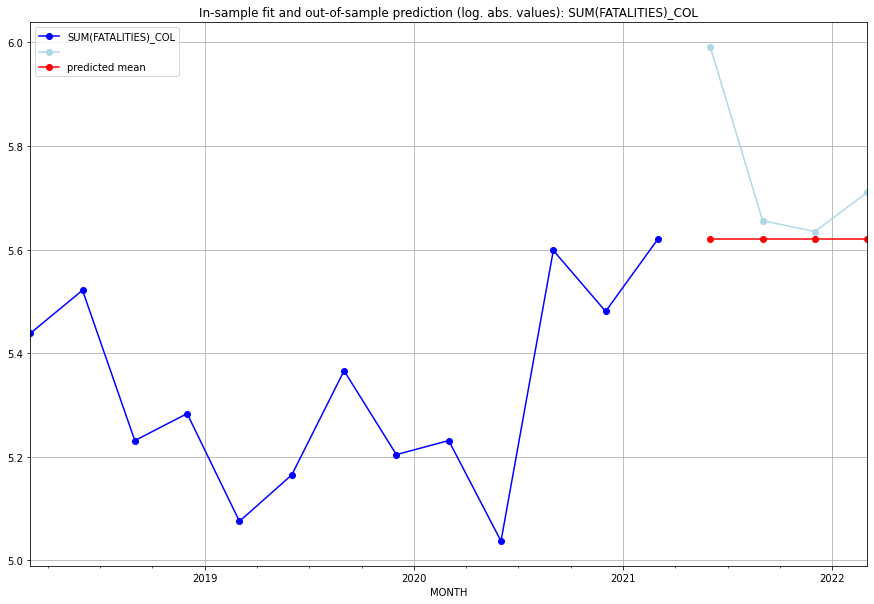

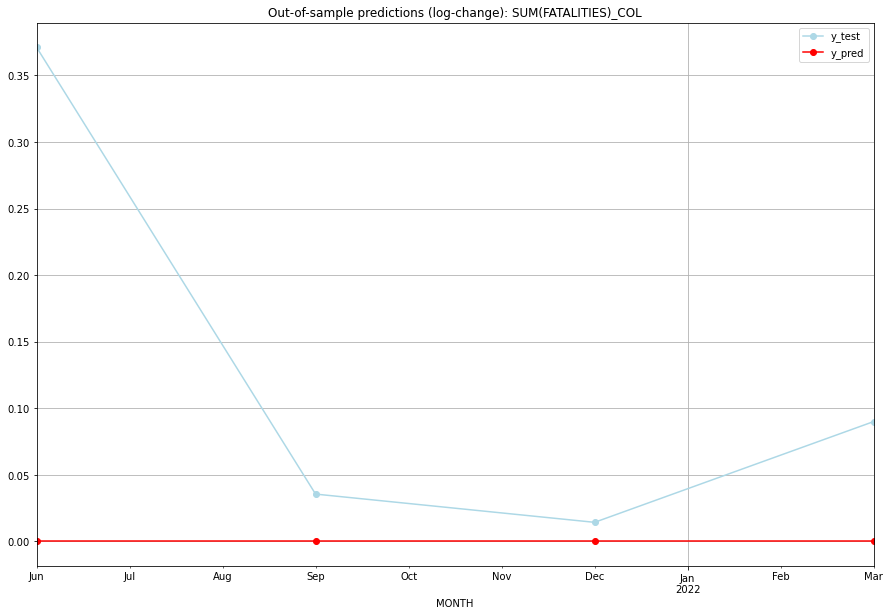

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.620401    5.991465           0.0        0.371064
1  2021-07  5.620401    5.655992           0.0        0.035591
2  2021-10  5.620401    5.634790           0.0        0.014389
3  2022-01  5.620401    5.710427           0.0        0.090026
TADDA: 0.12776737890083867
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.620401    5.991465           0.0        0.371064   COL
1 2021-07-01  5.620401    5.655992           0.0        0.035591   COL
2 2021-10-01  5.620401    5.634790           0.0        0.014389   COL
3 2022-01-01  5.620401    5.710427           0.0        0.090026   COL
Execution time: 00:01
######## COM (48/234) #########
0
Neighbor countries: []
Getting Data for COM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       


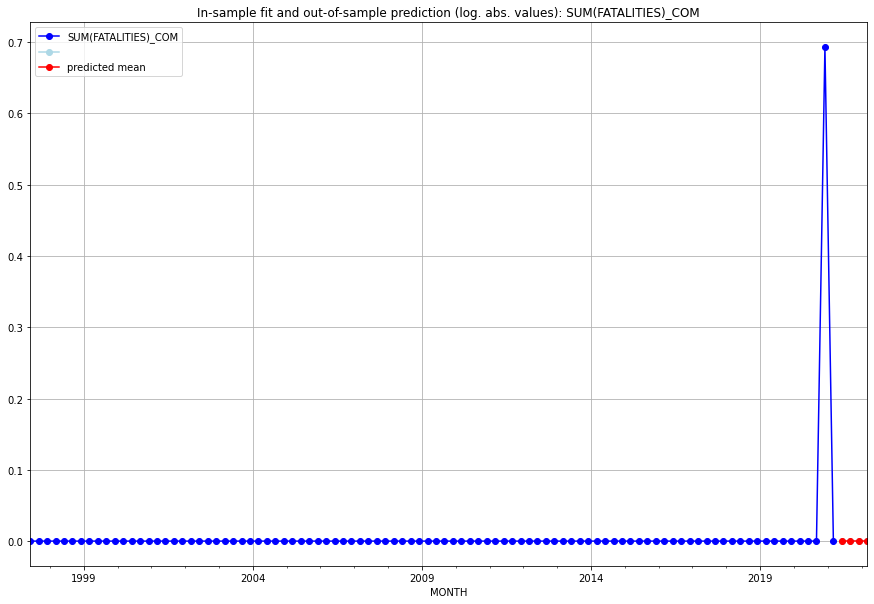

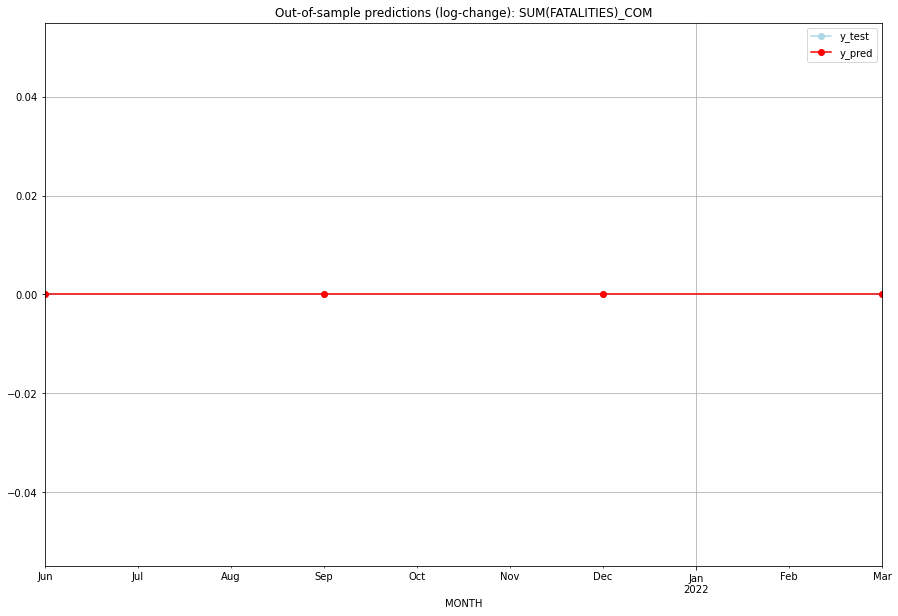

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   COM
1 2021-07-01       0.0         0.0           0.0             0.0   COM
2 2021-10-01       0.0         0.0           0.0             0.0   COM
3 2022-01-01       0.0         0.0           0.0             0.0   COM
Execution time: 00:01
######## CPV (49/234) #########
0
Neighbor countries: []
Getting Data for CPV
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

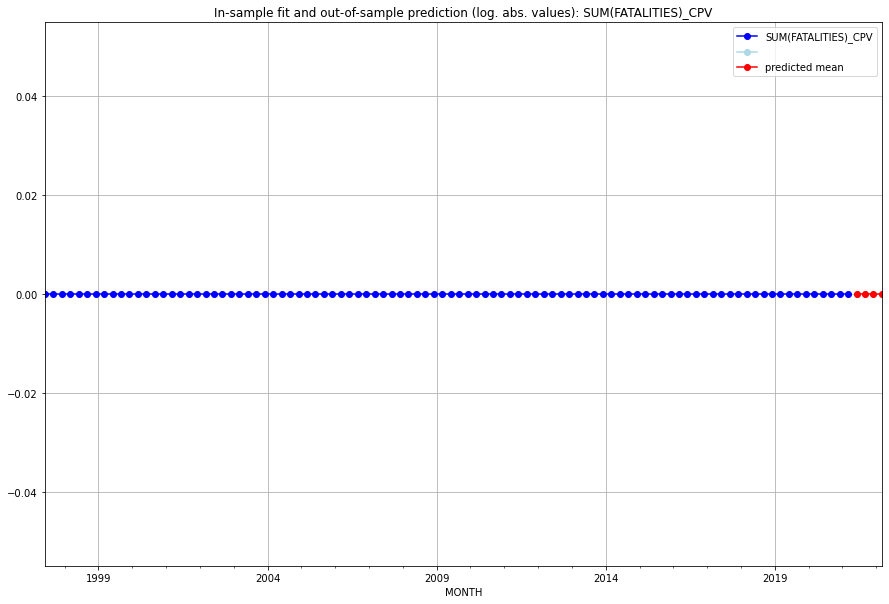

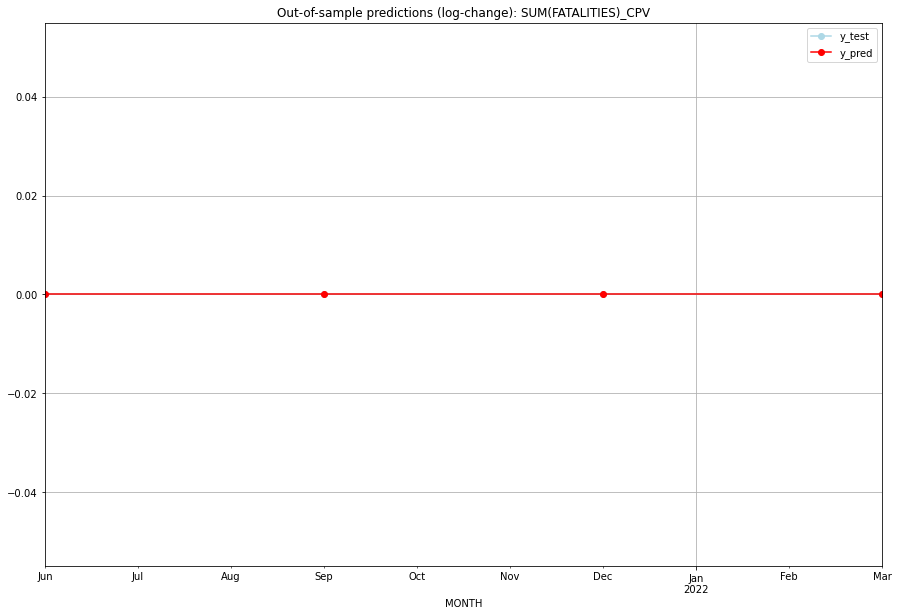

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   CPV
1 2021-07-01       0.0         0.0           0.0             0.0   CPV
2 2021-10-01       0.0         0.0           0.0             0.0   CPV
3 2022-01-01       0.0         0.0           0.0             0.0   CPV
Execution time: 00:01
######## CRI (50/234) #########
0
Neighbor countries: []
Getting Data for CRI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04 

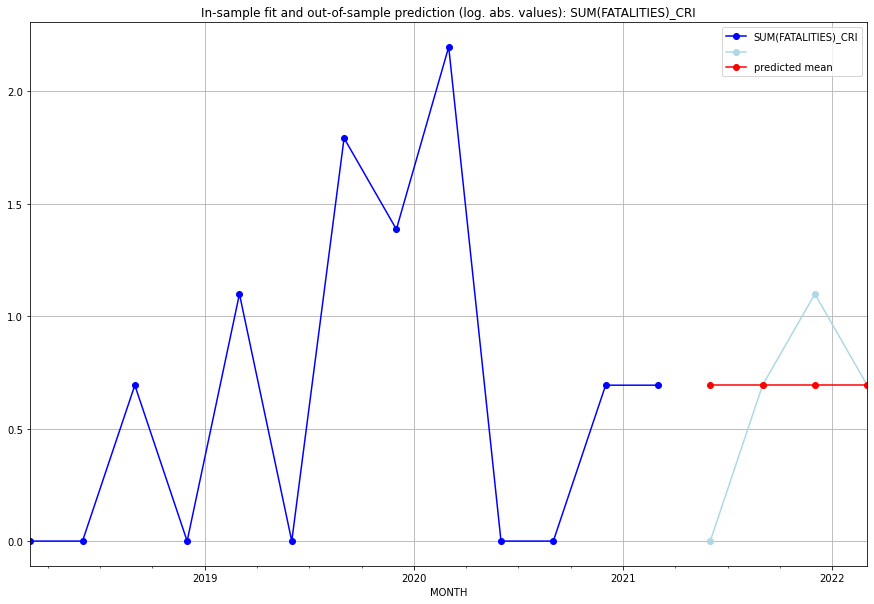

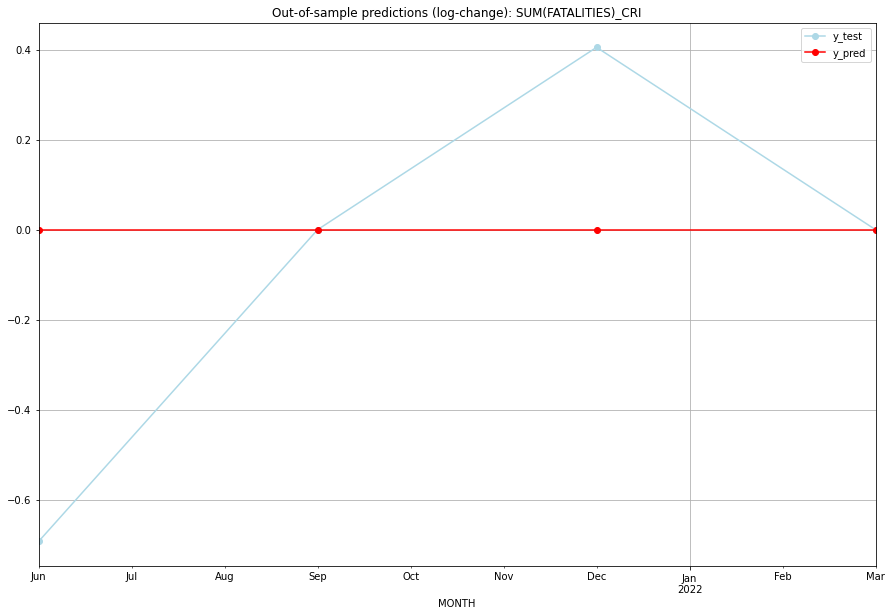

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.000000           0.0       -0.693147
1  2021-07  0.693147    0.693147           0.0        0.000000
2  2021-10  0.693147    1.098612           0.0        0.405465
3  2022-01  0.693147    0.693147           0.0        0.000000
TADDA: 0.27465307216702745
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.000000           0.0       -0.693147   CRI
1 2021-07-01  0.693147    0.693147           0.0        0.000000   CRI
2 2021-10-01  0.693147    1.098612           0.0        0.405465   CRI
3 2022-01-01  0.693147    0.693147           0.0        0.000000   CRI
Execution time: 00:01
######## CUB (51/234) #########
0
Neighbor countries: []
Getting Data for CUB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

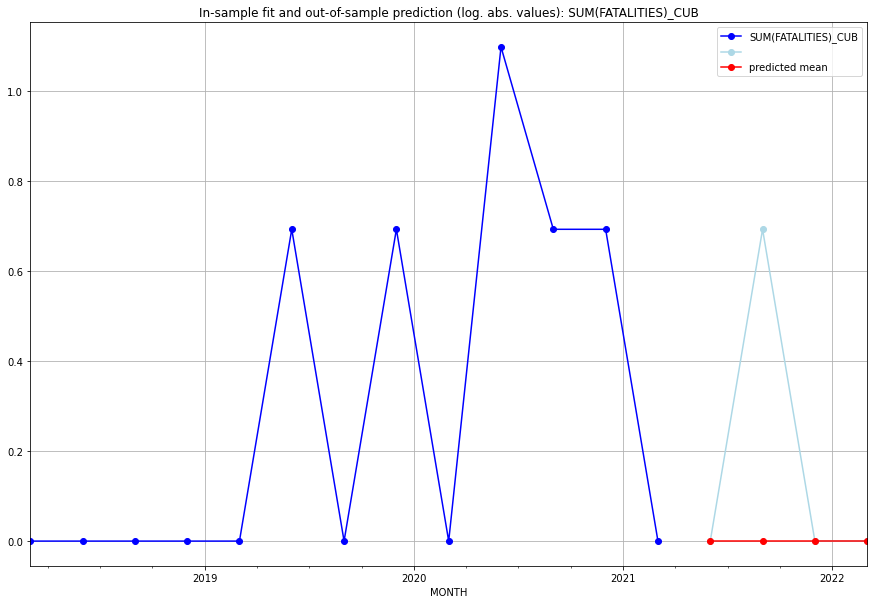

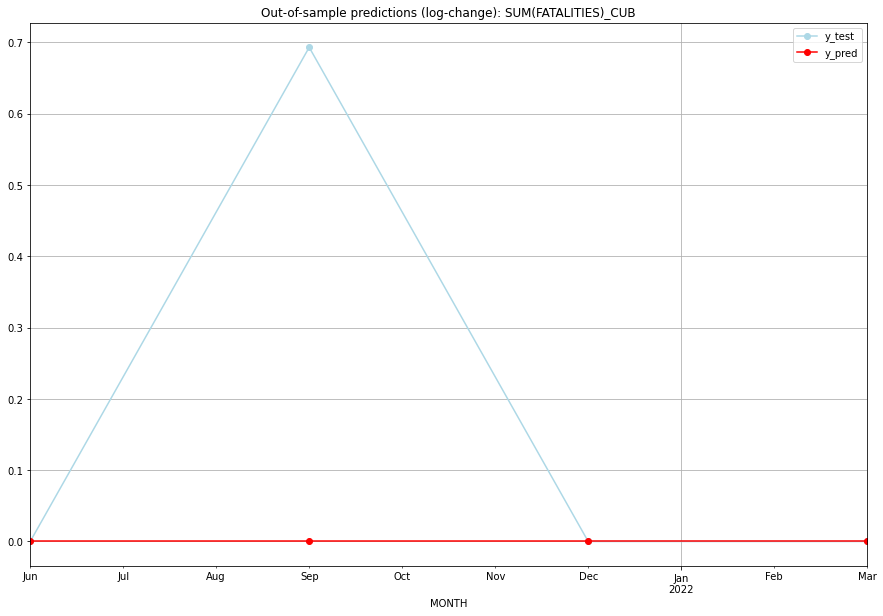

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   CUB
1 2021-07-01       0.0    0.693147           0.0        0.693147   CUB
2 2021-10-01       0.0    0.000000           0.0        0.000000   CUB
3 2022-01-01       0.0    0.000000           0.0        0.000000   CUB
Execution time: 00:01
######## CUW (52/234) #########
0
Neighbor countries: []
Getting Data for CUW
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

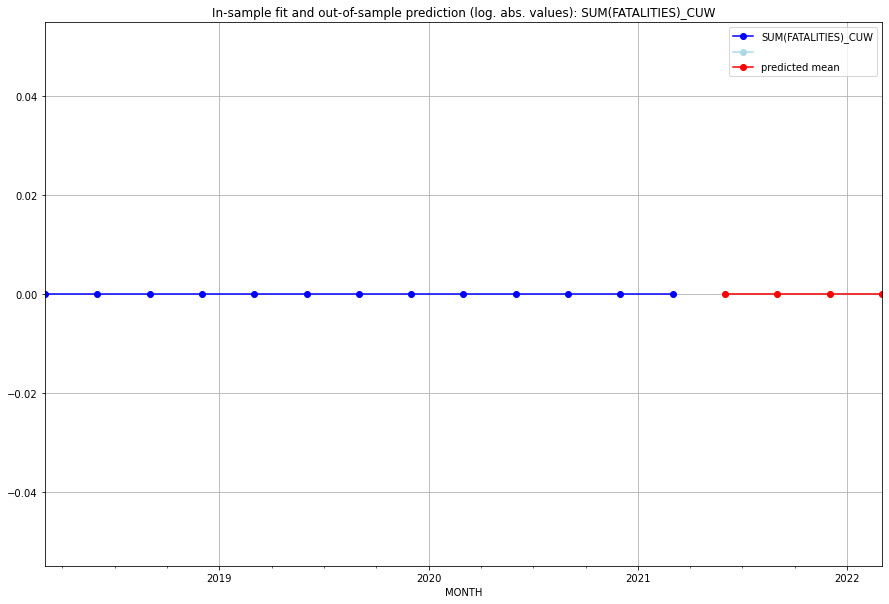

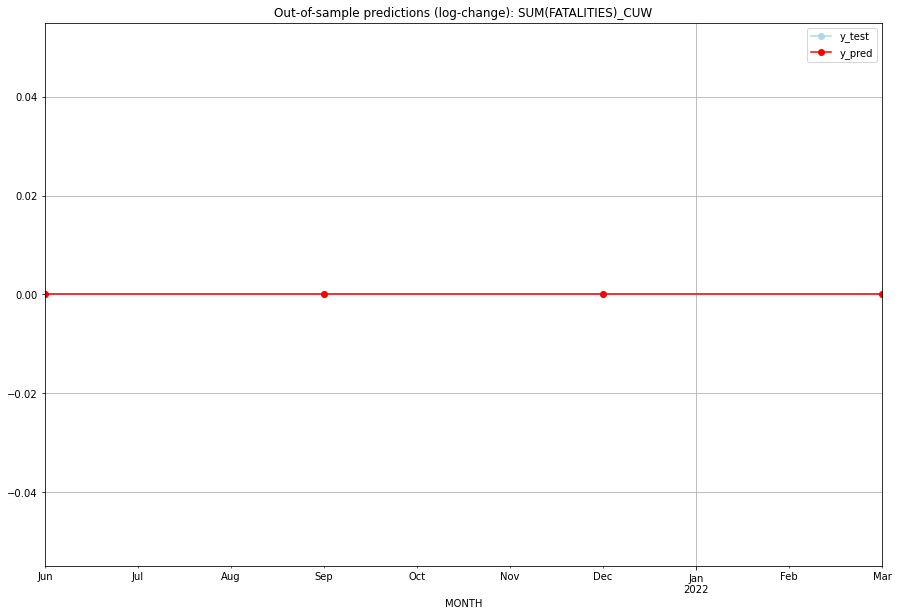

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   CUW
1 2021-07-01       0.0         0.0           0.0             0.0   CUW
2 2021-10-01       0.0         0.0           0.0             0.0   CUW
3 2022-01-01       0.0         0.0           0.0             0.0   CUW
Execution time: 00:01
######## CYM (53/234) #########
0
Neighbor countries: []
Getting Data for CYM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (13, 0)
y: (13, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

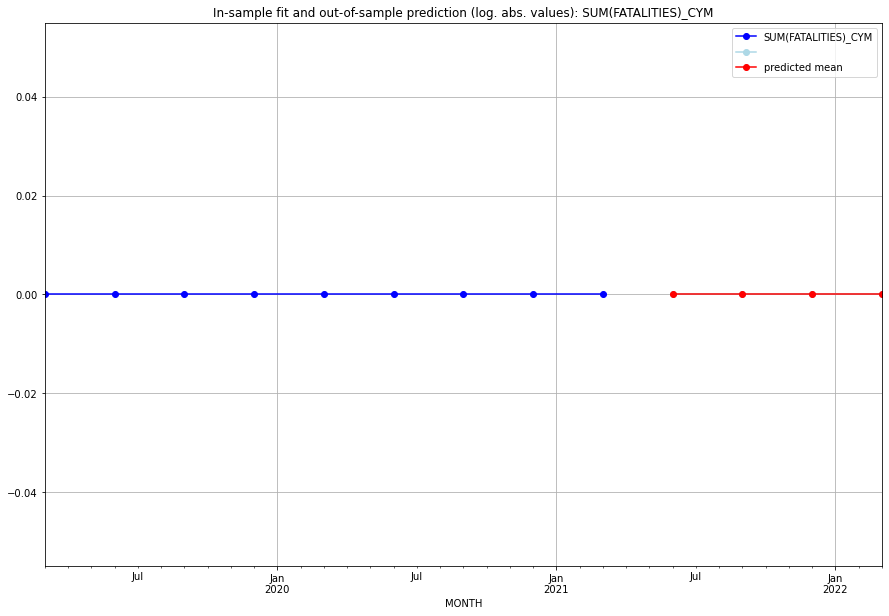

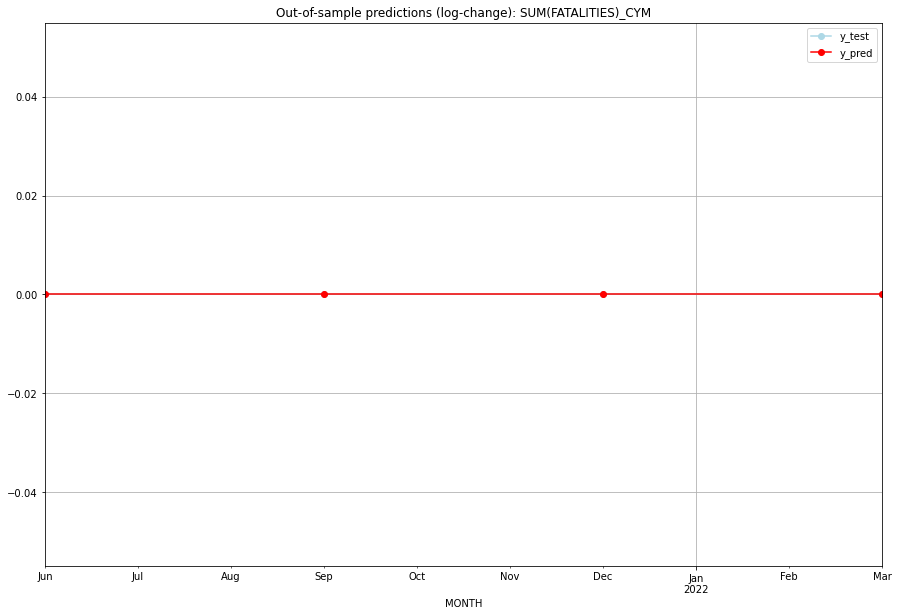

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   CYM
1 2021-07-01       0.0         0.0           0.0             0.0   CYM
2 2021-10-01       0.0         0.0           0.0             0.0   CYM
3 2022-01-01       0.0         0.0           0.0             0.0   CYM
Execution time: 00:01
######## CYP (54/234) #########
0
Neighbor countries: []
Getting Data for CYP
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

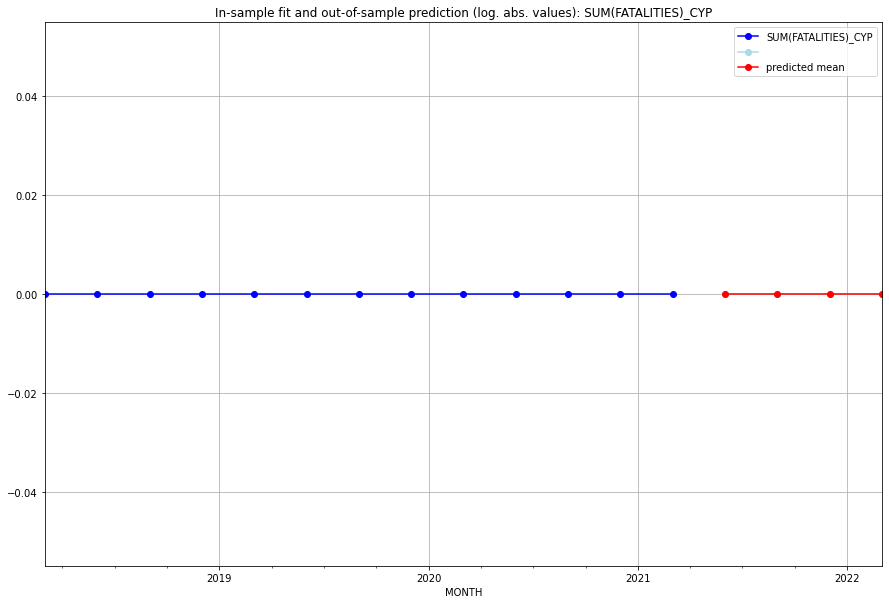

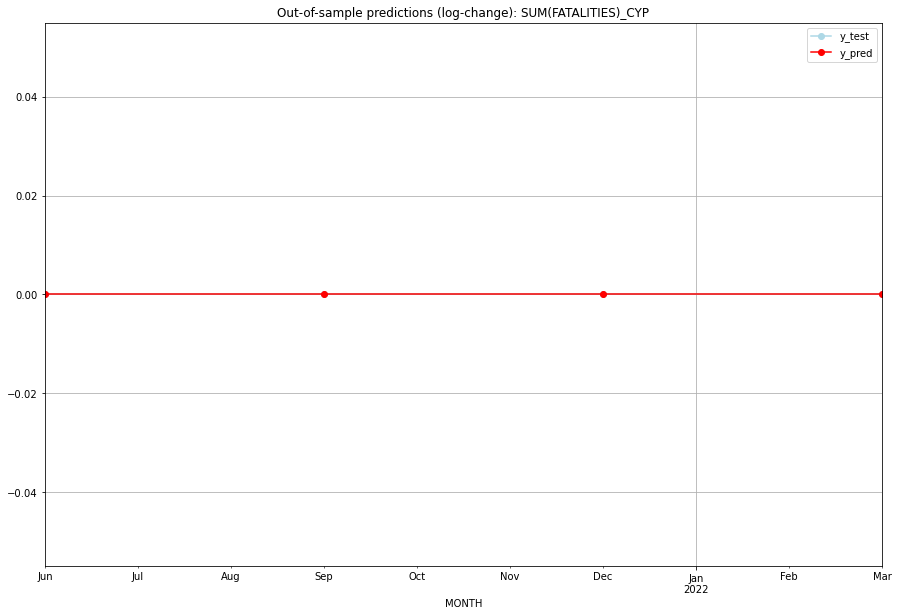

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   CYP
1 2021-07-01       0.0         0.0           0.0             0.0   CYP
2 2021-10-01       0.0         0.0           0.0             0.0   CYP
3 2022-01-01       0.0         0.0           0.0             0.0   CYP
Execution time: 00:01
######## CZE (55/234) #########
0
Neighbor countries: []
Getting Data for CZE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

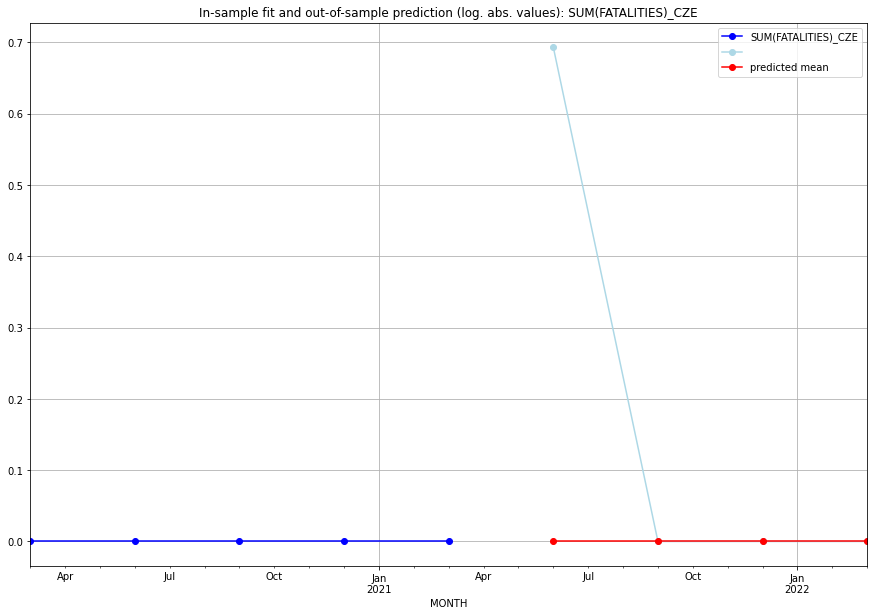

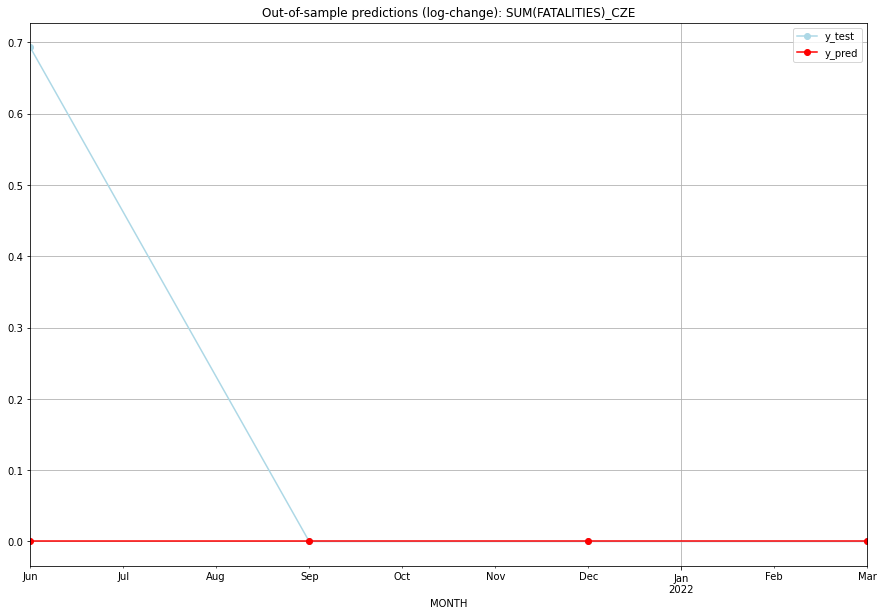

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.693147           0.0        0.693147
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.693147           0.0        0.693147   CZE
1 2021-07-01       0.0    0.000000           0.0        0.000000   CZE
2 2021-10-01       0.0    0.000000           0.0        0.000000   CZE
3 2022-01-01       0.0    0.000000           0.0        0.000000   CZE
Execution time: 00:01
######## DEU (56/234) #########
0
Neighbor countries: []
Getting Data for DEU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

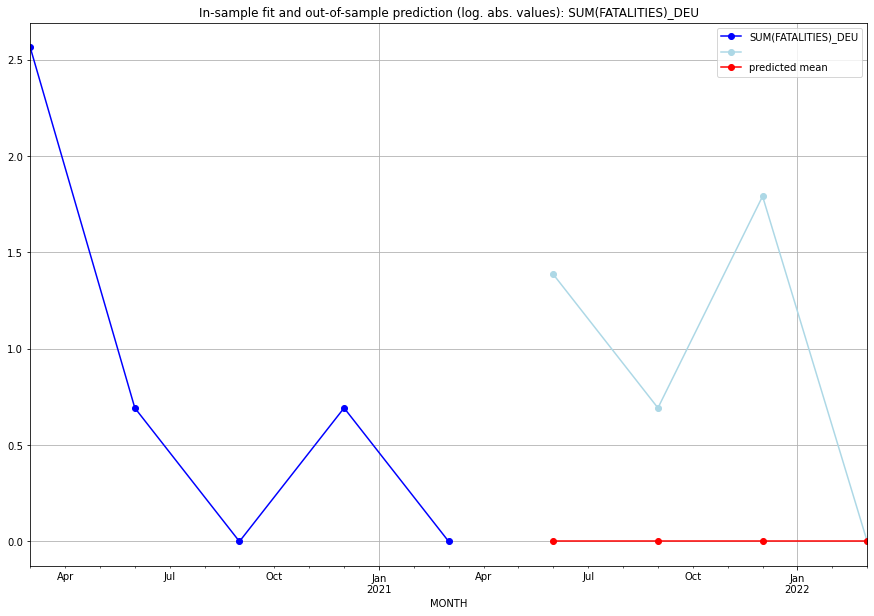

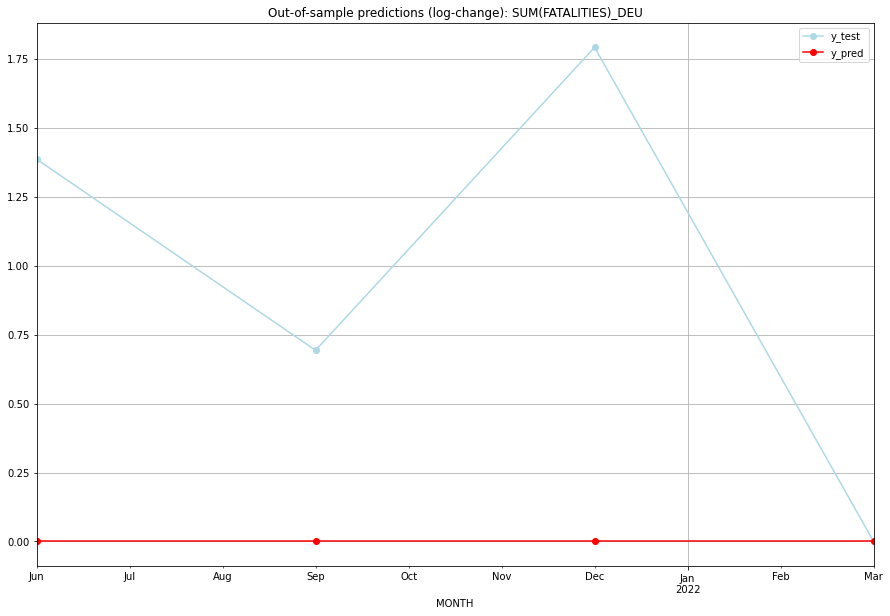

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.386294           0.0        1.386294
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    1.791759           0.0        1.791759
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.9678002527269727
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.386294           0.0        1.386294   DEU
1 2021-07-01       0.0    0.693147           0.0        0.693147   DEU
2 2021-10-01       0.0    1.791759           0.0        1.791759   DEU
3 2022-01-01       0.0    0.000000           0.0        0.000000   DEU
Execution time: 00:01
######## DJI (57/234) #########
0
Neighbor countries: []
Getting Data for DJI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

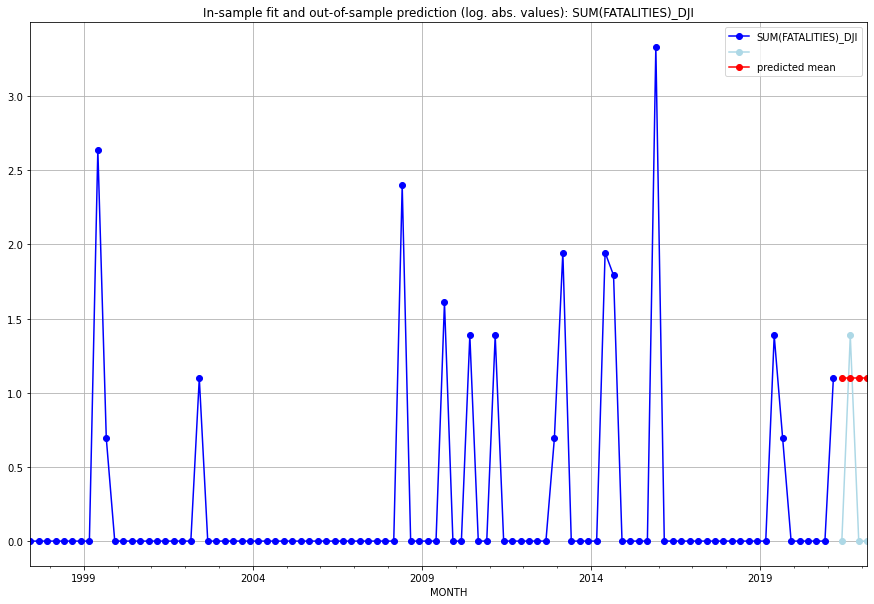

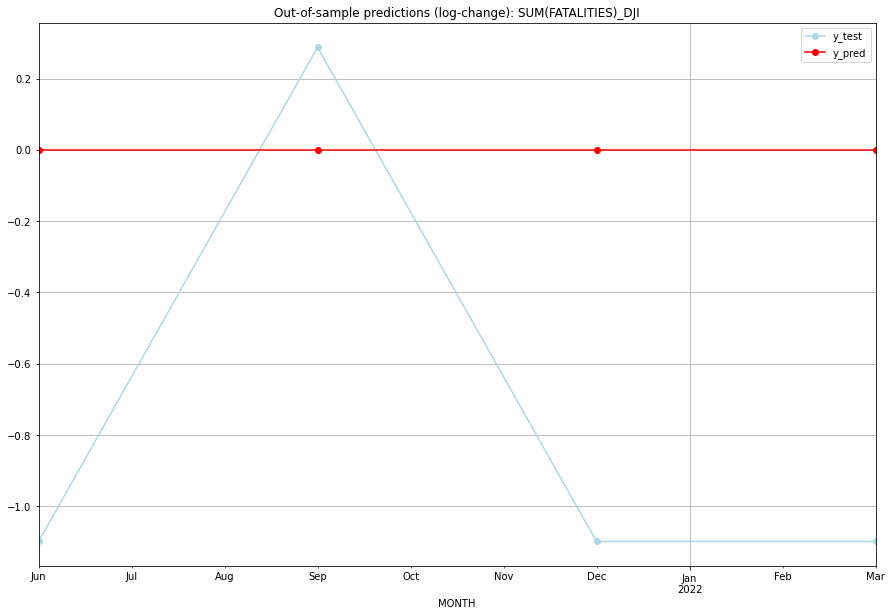

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    0.000000           0.0       -1.098612
1  2021-07  1.098612    1.386294           0.0        0.287682
2  2021-10  1.098612    0.000000           0.0       -1.098612
3  2022-01  1.098612    0.000000           0.0       -1.098612
TADDA: 0.8958797346140275
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    0.000000           0.0       -1.098612   DJI
1 2021-07-01  1.098612    1.386294           0.0        0.287682   DJI
2 2021-10-01  1.098612    0.000000           0.0       -1.098612   DJI
3 2022-01-01  1.098612    0.000000           0.0       -1.098612   DJI
Execution time: 00:01
######## DMA (58/234) #########
0
Neighbor countries: []
Getting Data for DMA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
202

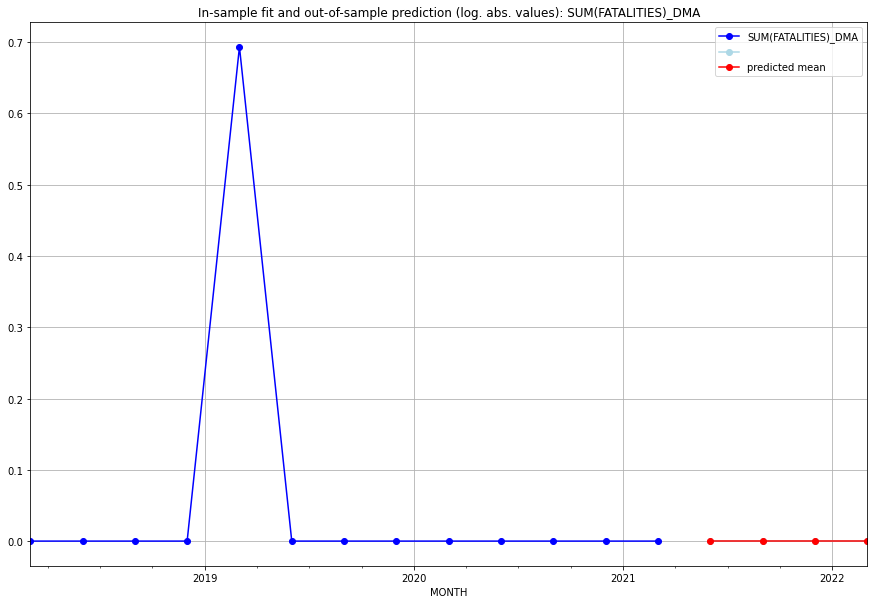

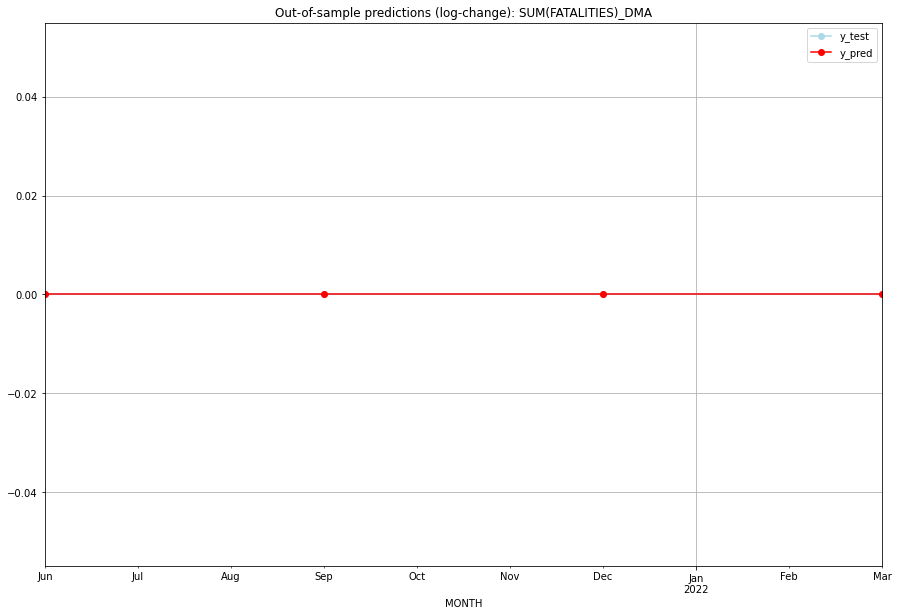

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   DMA
1 2021-07-01       0.0         0.0           0.0             0.0   DMA
2 2021-10-01       0.0         0.0           0.0             0.0   DMA
3 2022-01-01       0.0         0.0           0.0             0.0   DMA
Execution time: 00:01
######## DNK (59/234) #########
0
Neighbor countries: []
Getting Data for DNK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

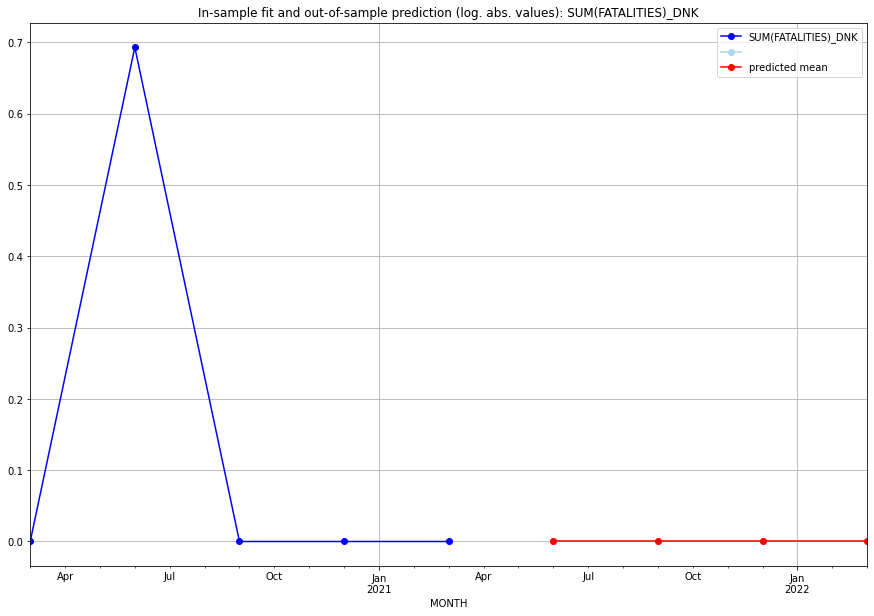

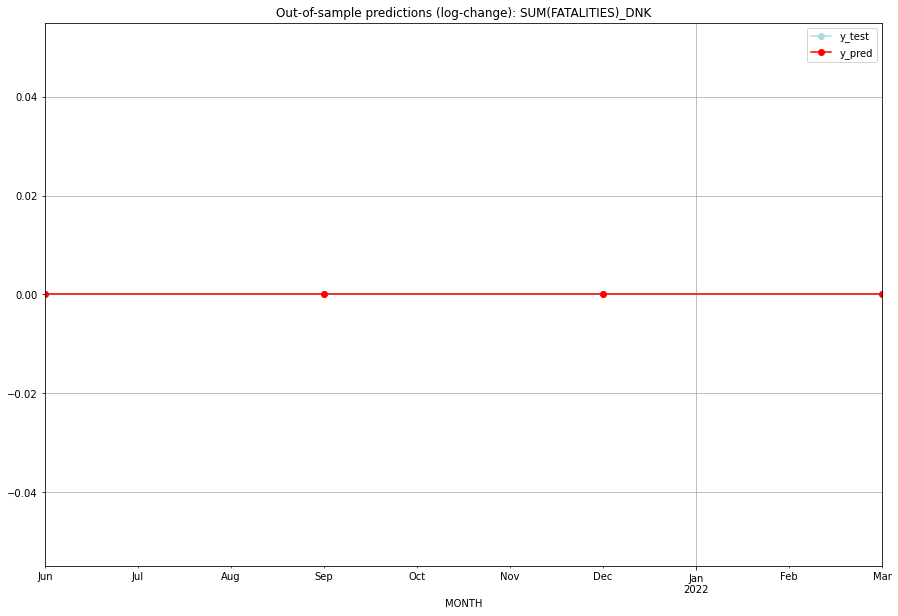

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   DNK
1 2021-07-01       0.0         0.0           0.0             0.0   DNK
2 2021-10-01       0.0         0.0           0.0             0.0   DNK
3 2022-01-01       0.0         0.0           0.0             0.0   DNK
Execution time: 00:01
######## DOM (60/234) #########
0
Neighbor countries: []
Getting Data for DOM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04 

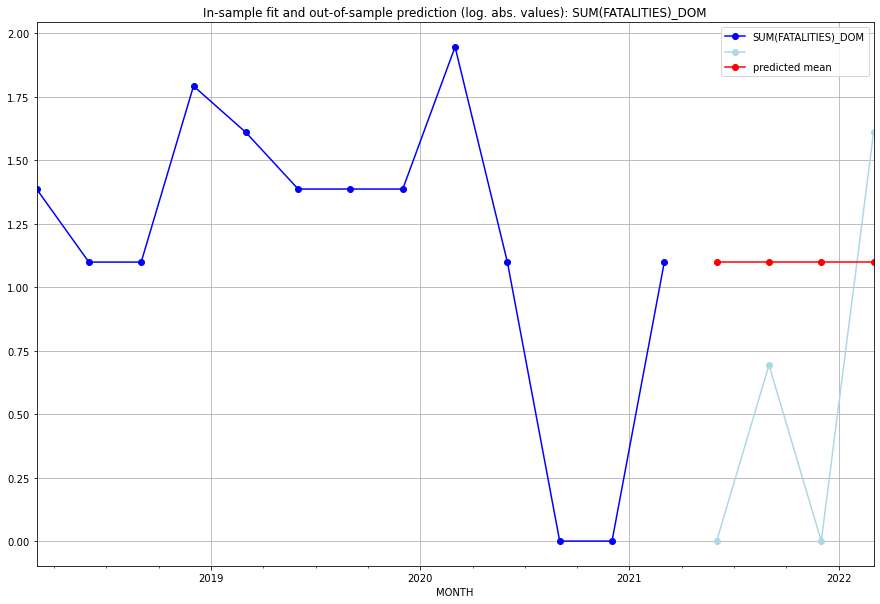

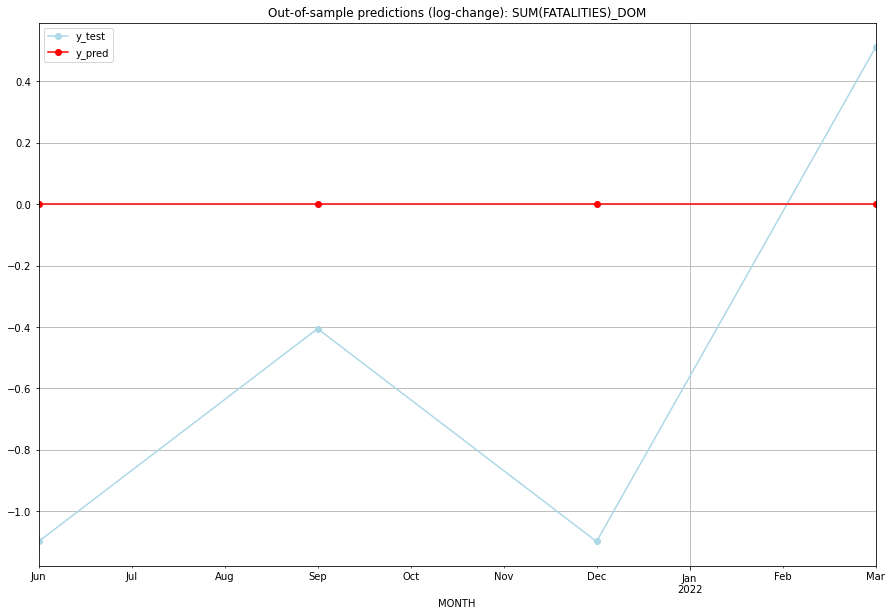

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    0.000000           0.0       -1.098612
1  2021-07  1.098612    0.693147           0.0       -0.405465
2  2021-10  1.098612    0.000000           0.0       -1.098612
3  2022-01  1.098612    1.609438           0.0        0.510826
TADDA: 0.7783788273025936
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    0.000000           0.0       -1.098612   DOM
1 2021-07-01  1.098612    0.693147           0.0       -0.405465   DOM
2 2021-10-01  1.098612    0.000000           0.0       -1.098612   DOM
3 2022-01-01  1.098612    1.609438           0.0        0.510826   DOM
Execution time: 00:01
######## DZA (61/234) #########
0
Neighbor countries: []
Getting Data for DZA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

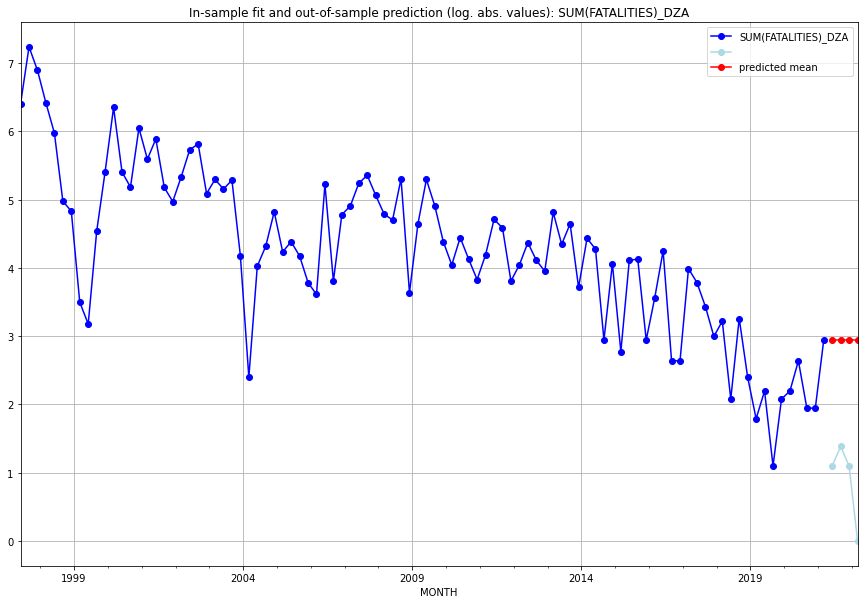

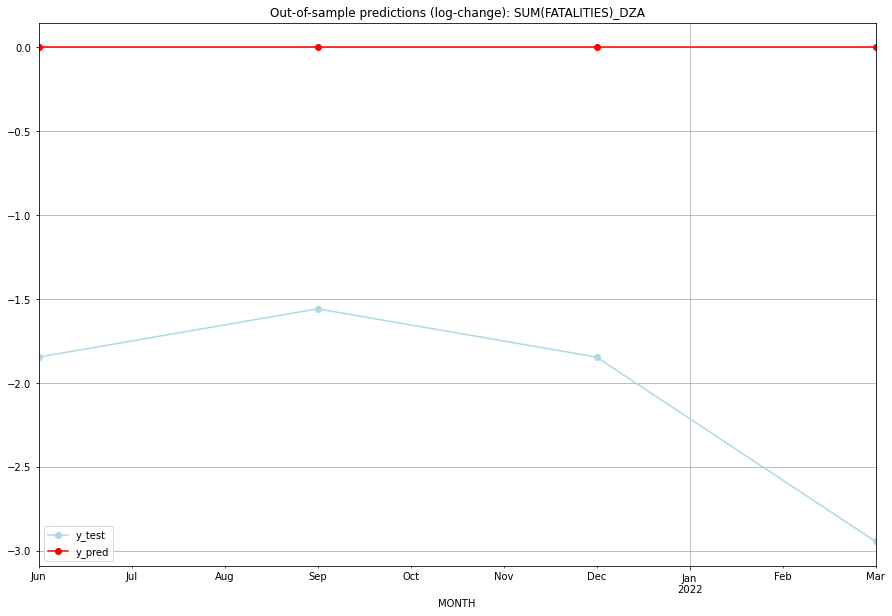

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.944439    1.098612           0.0       -1.845827
1  2021-07  2.944439    1.386294           0.0       -1.558145
2  2021-10  2.944439    1.098612           0.0       -1.845827
3  2022-01  2.944439    0.000000           0.0       -2.944439
TADDA: 2.048559244552413
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.944439    1.098612           0.0       -1.845827   DZA
1 2021-07-01  2.944439    1.386294           0.0       -1.558145   DZA
2 2021-10-01  2.944439    1.098612           0.0       -1.845827   DZA
3 2022-01-01  2.944439    0.000000           0.0       -2.944439   DZA
Execution time: 00:01
######## ECU (62/234) #########
0
Neighbor countries: []
Getting Data for ECU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH       

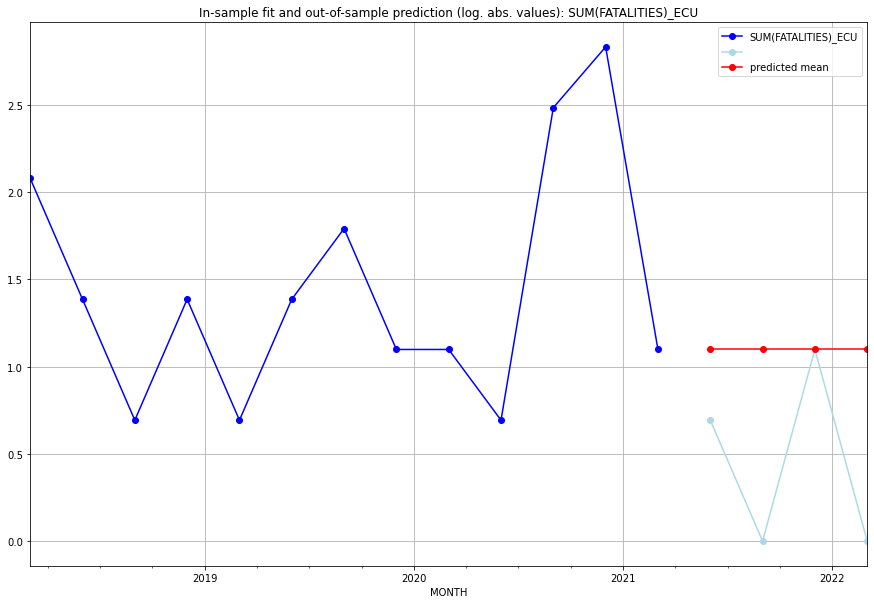

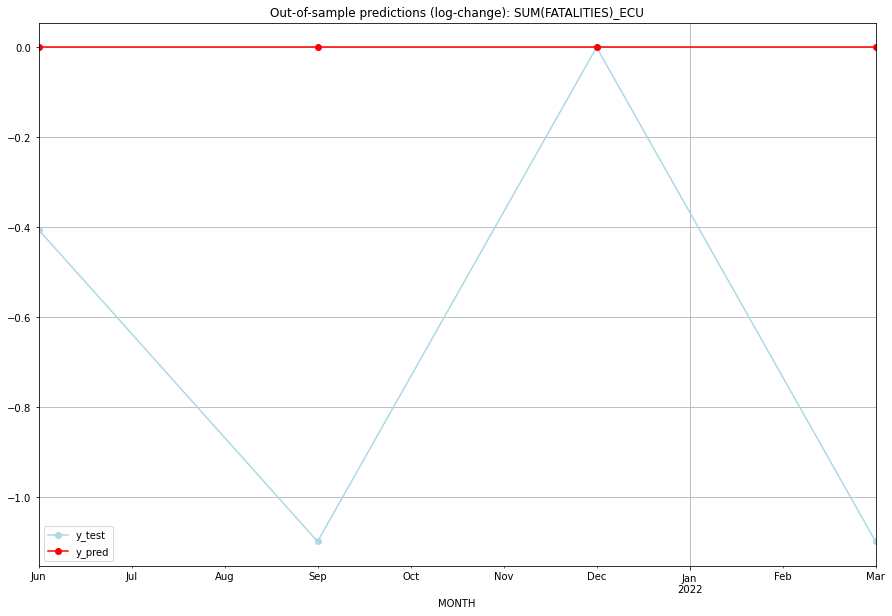

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    0.693147           0.0       -0.405465
1  2021-07  1.098612    0.000000           0.0       -1.098612
2  2021-10  1.098612    1.098612           0.0        0.000000
3  2022-01  1.098612    0.000000           0.0       -1.098612
TADDA: 0.6506724213610959
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    0.693147           0.0       -0.405465   ECU
1 2021-07-01  1.098612    0.000000           0.0       -1.098612   ECU
2 2021-10-01  1.098612    1.098612           0.0        0.000000   ECU
3 2022-01-01  1.098612    0.000000           0.0       -1.098612   ECU
Execution time: 00:01
######## EGY (63/234) #########
0
Neighbor countries: []
Getting Data for EGY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

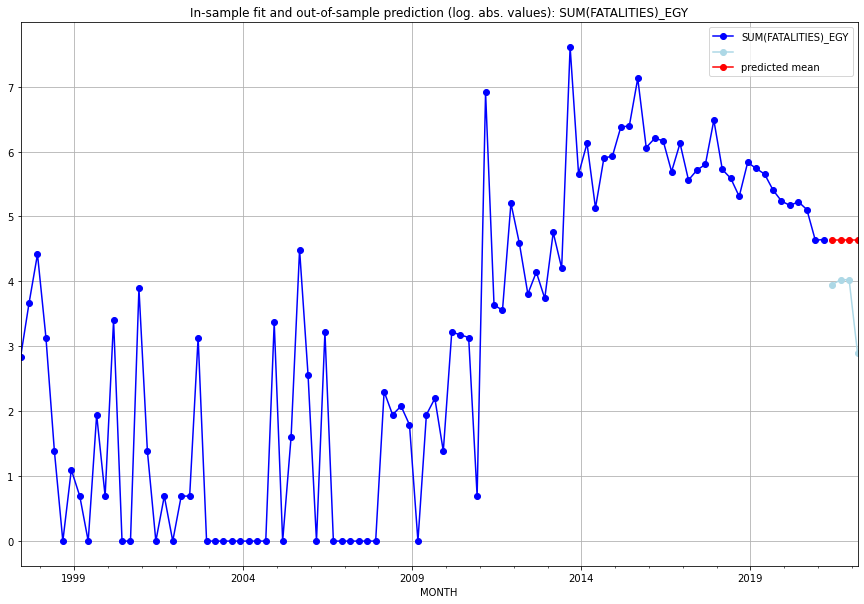

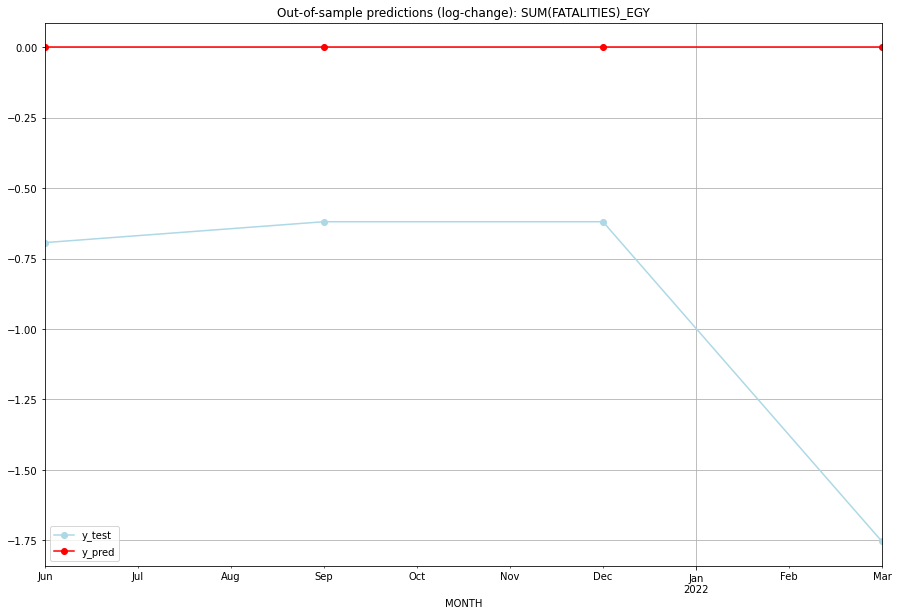

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.644391    3.951244           0.0       -0.693147
1  2021-07  4.644391    4.025352           0.0       -0.619039
2  2021-10  4.644391    4.025352           0.0       -0.619039
3  2022-01  4.644391    2.890372           0.0       -1.754019
TADDA: 0.9213111846543995
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.644391    3.951244           0.0       -0.693147   EGY
1 2021-07-01  4.644391    4.025352           0.0       -0.619039   EGY
2 2021-10-01  4.644391    4.025352           0.0       -0.619039   EGY
3 2022-01-01  4.644391    2.890372           0.0       -1.754019   EGY
Execution time: 00:01
######## ERI (64/234) #########
0
Neighbor countries: []
Getting Data for ERI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

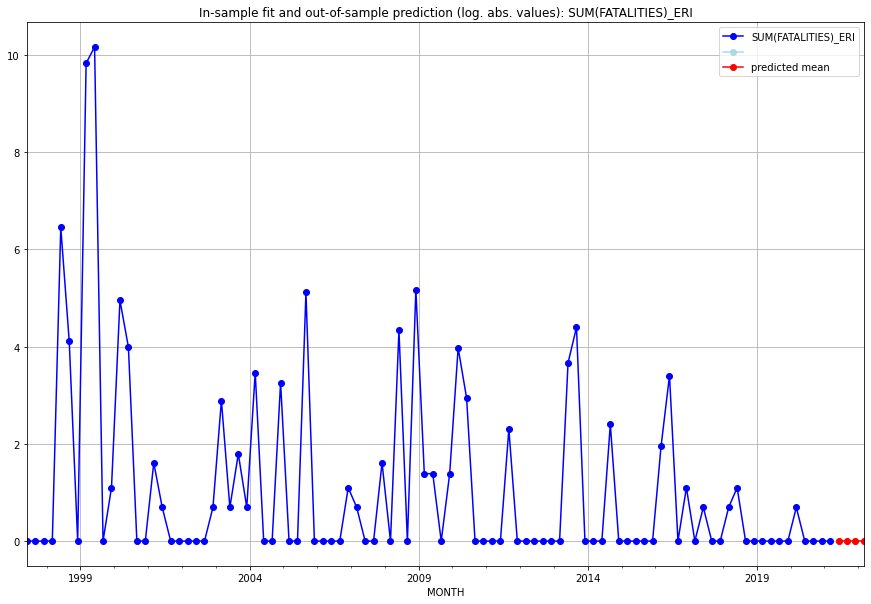

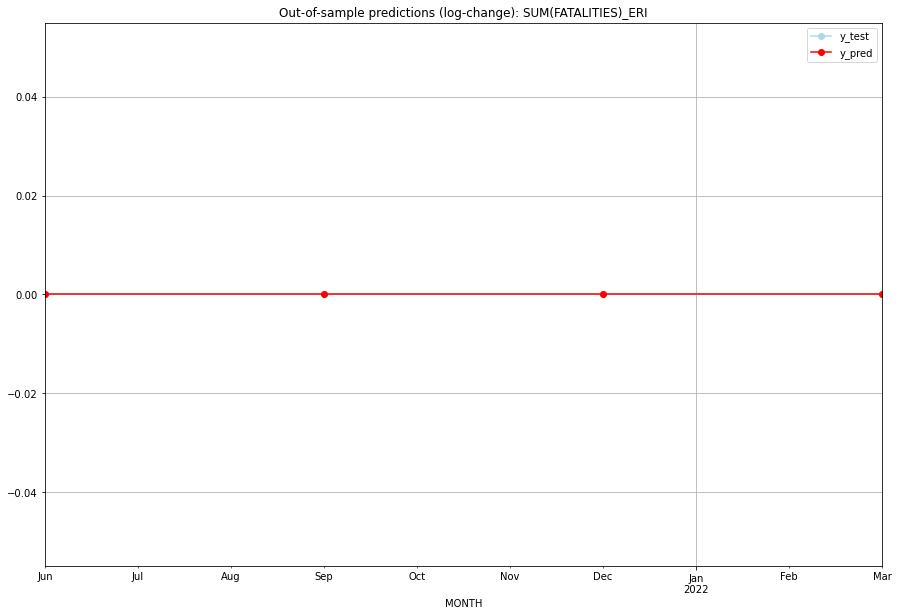

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ERI
1 2021-07-01       0.0         0.0           0.0             0.0   ERI
2 2021-10-01       0.0         0.0           0.0             0.0   ERI
3 2022-01-01       0.0         0.0           0.0             0.0   ERI
Execution time: 00:01
######## ESH (65/234) #########
0
Neighbor countries: []
Getting Data for ESH
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

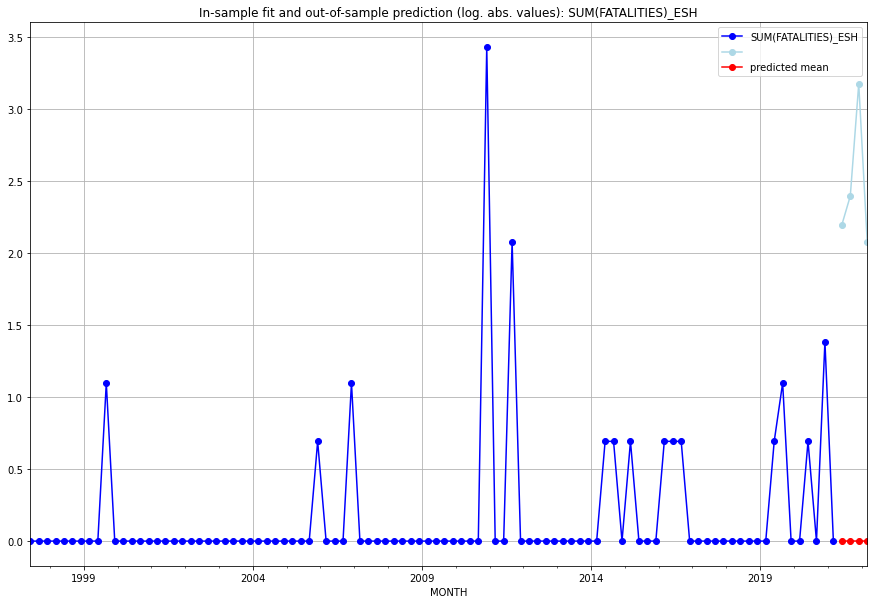

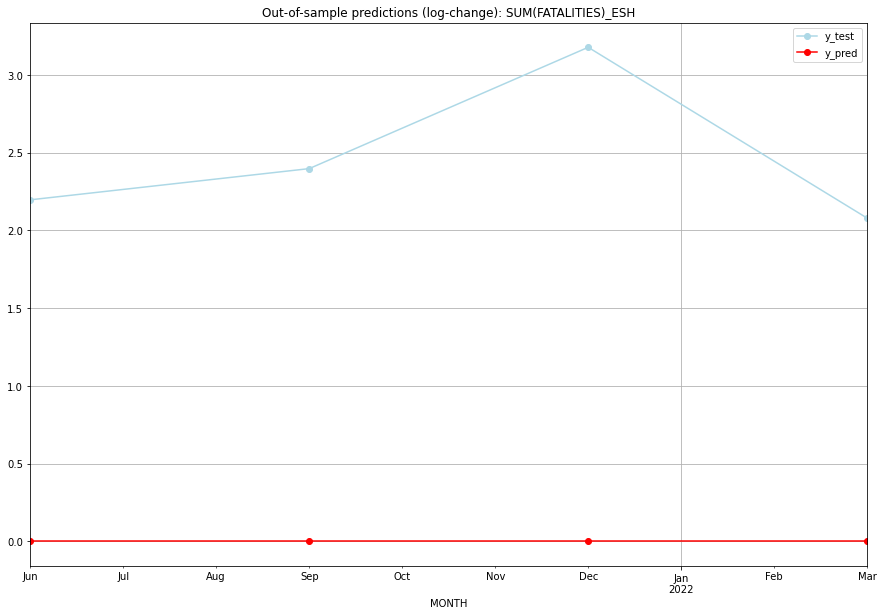

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    2.197225           0.0        2.197225
1  2021-07       0.0    2.397895           0.0        2.397895
2  2021-10       0.0    3.178054           0.0        3.178054
3  2022-01       0.0    2.079442           0.0        2.079442
TADDA: 2.463153805540593
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    2.197225           0.0        2.197225   ESH
1 2021-07-01       0.0    2.397895           0.0        2.397895   ESH
2 2021-10-01       0.0    3.178054           0.0        3.178054   ESH
3 2022-01-01       0.0    2.079442           0.0        2.079442   ESH
Execution time: 00:01
######## ESP (66/234) #########
0
Neighbor countries: []
Getting Data for ESP
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-0

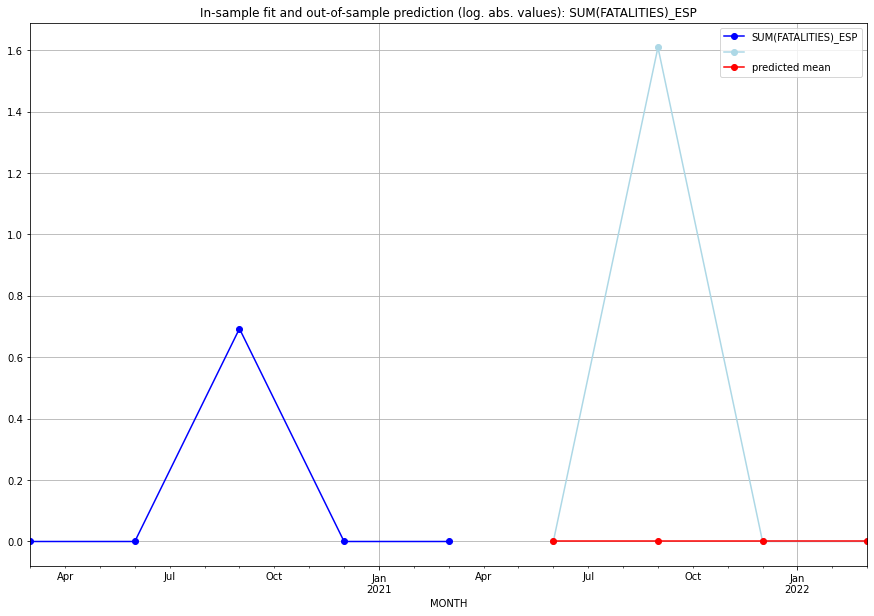

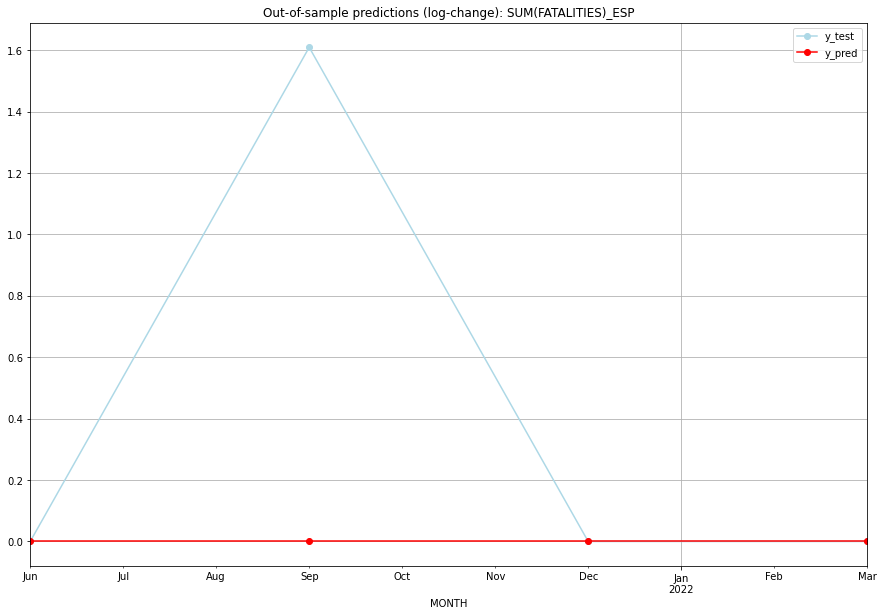

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    1.609438           0.0        1.609438
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.4023594781085251
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   ESP
1 2021-07-01       0.0    1.609438           0.0        1.609438   ESP
2 2021-10-01       0.0    0.000000           0.0        0.000000   ESP
3 2022-01-01       0.0    0.000000           0.0        0.000000   ESP
Execution time: 00:01
######## EST (67/234) #########
0
Neighbor countries: []
Getting Data for EST
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

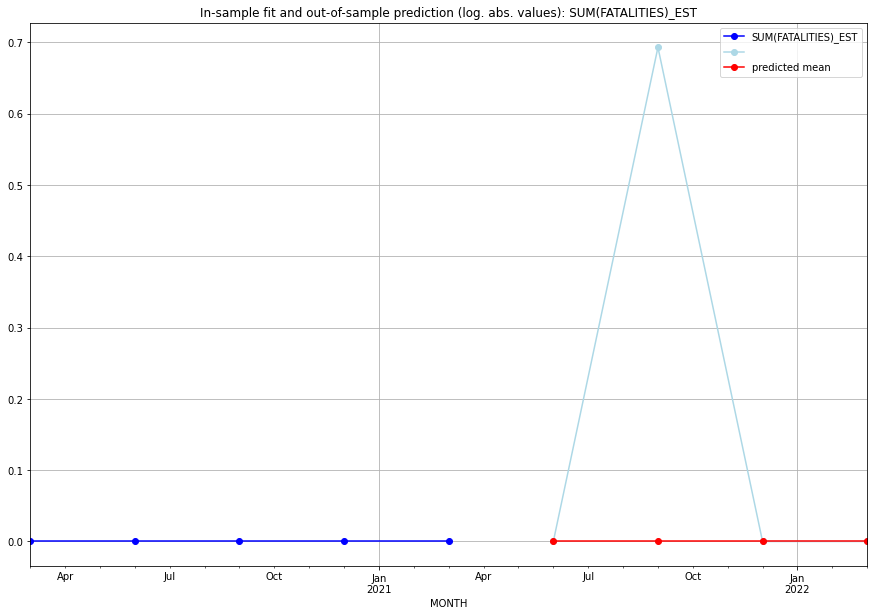

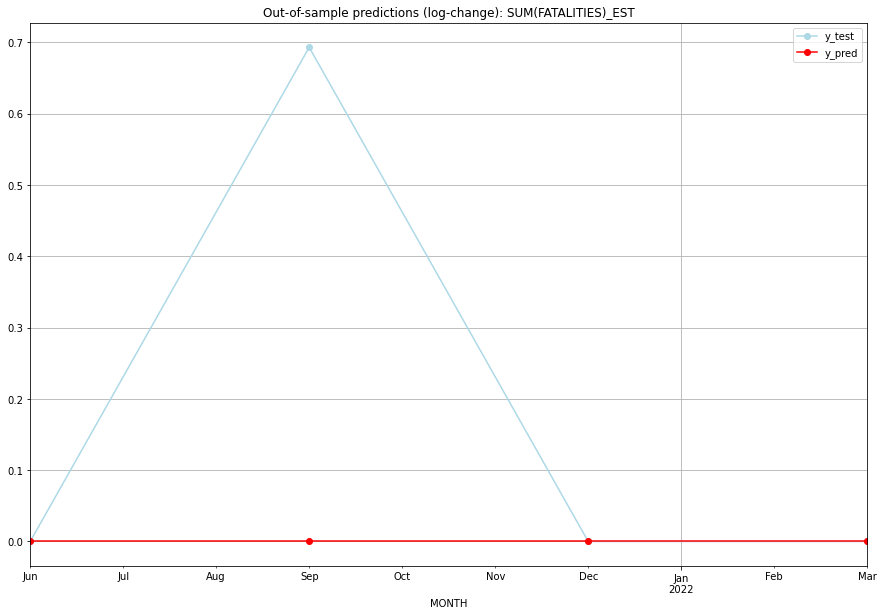

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   EST
1 2021-07-01       0.0    0.693147           0.0        0.693147   EST
2 2021-10-01       0.0    0.000000           0.0        0.000000   EST
3 2022-01-01       0.0    0.000000           0.0        0.000000   EST
Execution time: 00:01
######## ETH (68/234) #########
0
Neighbor countries: []
Getting Data for ETH
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

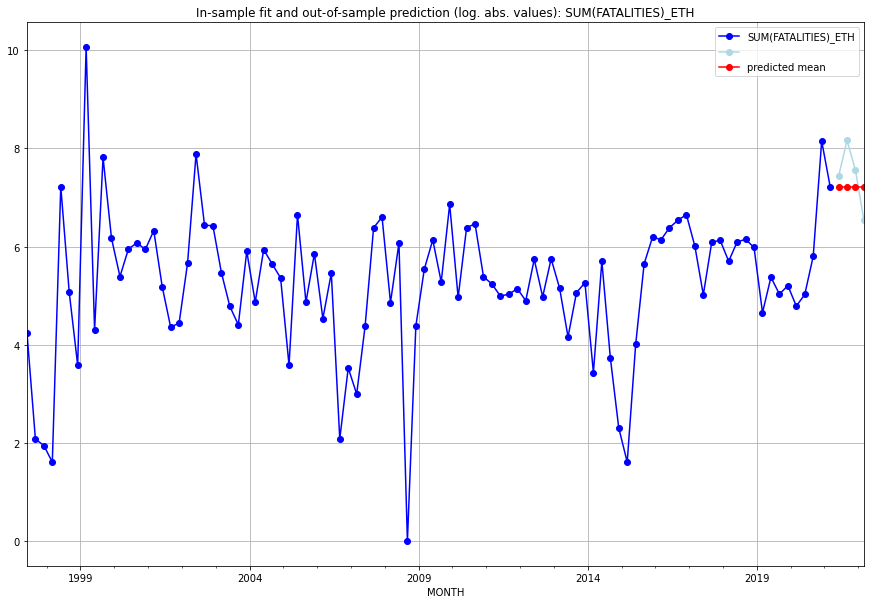

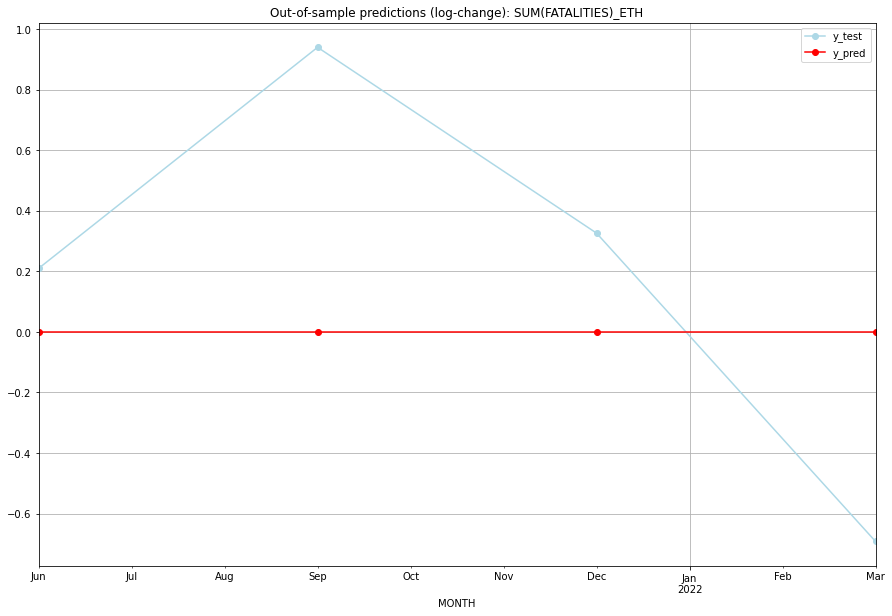

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  7.223296    7.433075           0.0        0.209780
1  2021-07  7.223296    8.163656           0.0        0.940360
2  2021-10  7.223296    7.549609           0.0        0.326313
3  2022-01  7.223296    6.530878           0.0       -0.692418
TADDA: 0.5422179258427577
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  7.223296    7.433075           0.0        0.209780   ETH
1 2021-07-01  7.223296    8.163656           0.0        0.940360   ETH
2 2021-10-01  7.223296    7.549609           0.0        0.326313   ETH
3 2022-01-01  7.223296    6.530878           0.0       -0.692418   ETH
Execution time: 00:01
######## FIN (69/234) #########
0
Neighbor countries: []
Getting Data for FIN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

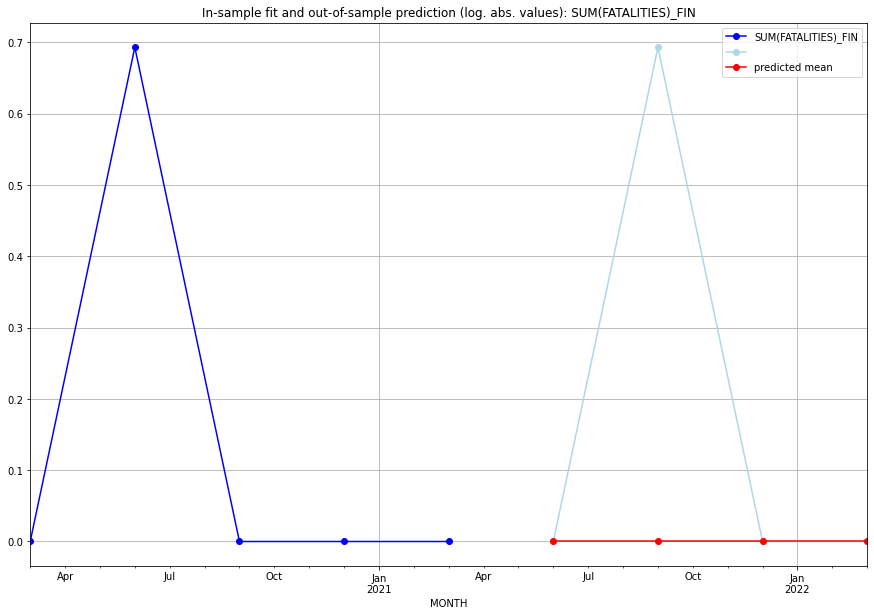

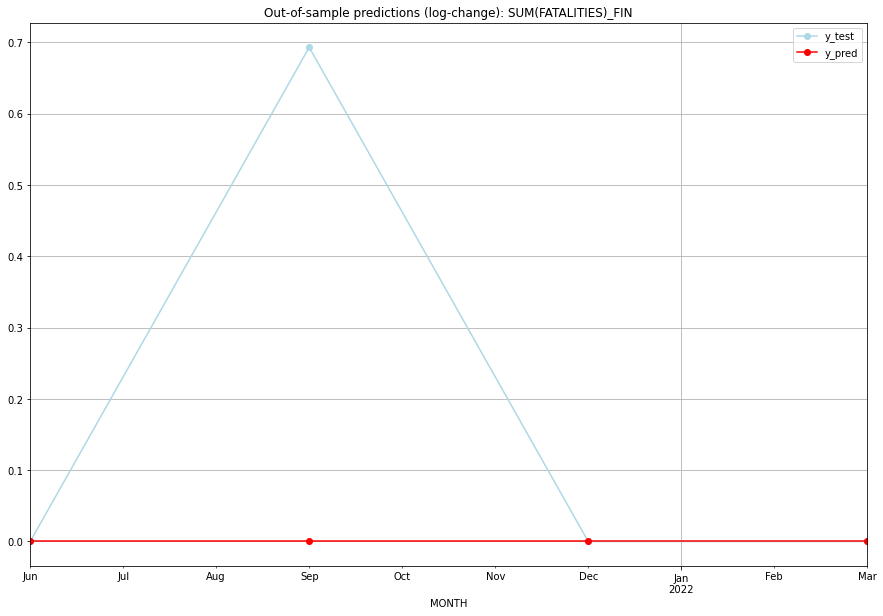

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   FIN
1 2021-07-01       0.0    0.693147           0.0        0.693147   FIN
2 2021-10-01       0.0    0.000000           0.0        0.000000   FIN
3 2022-01-01       0.0    0.000000           0.0        0.000000   FIN
Execution time: 00:01
######## FJI (70/234) #########
0
Neighbor countries: []
Getting Data for FJI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021

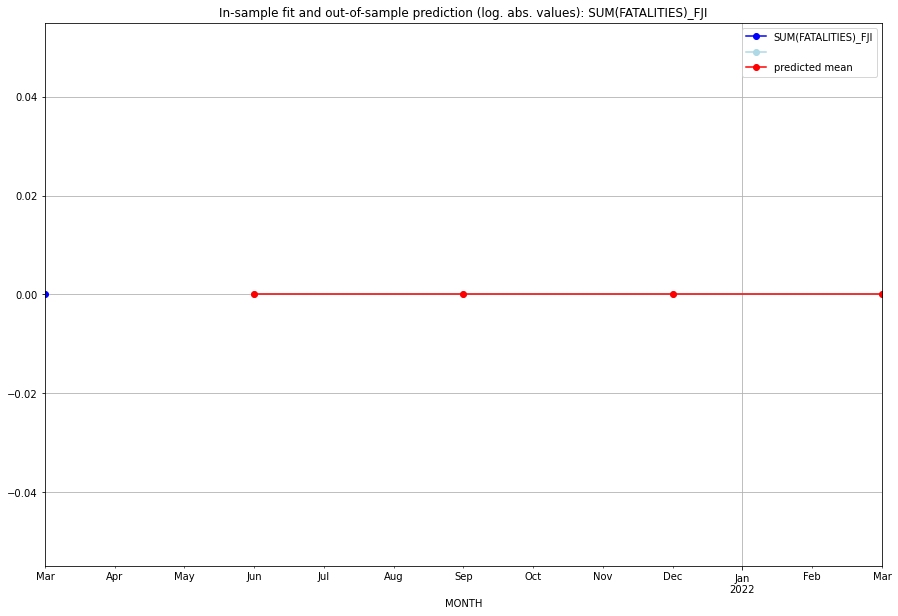

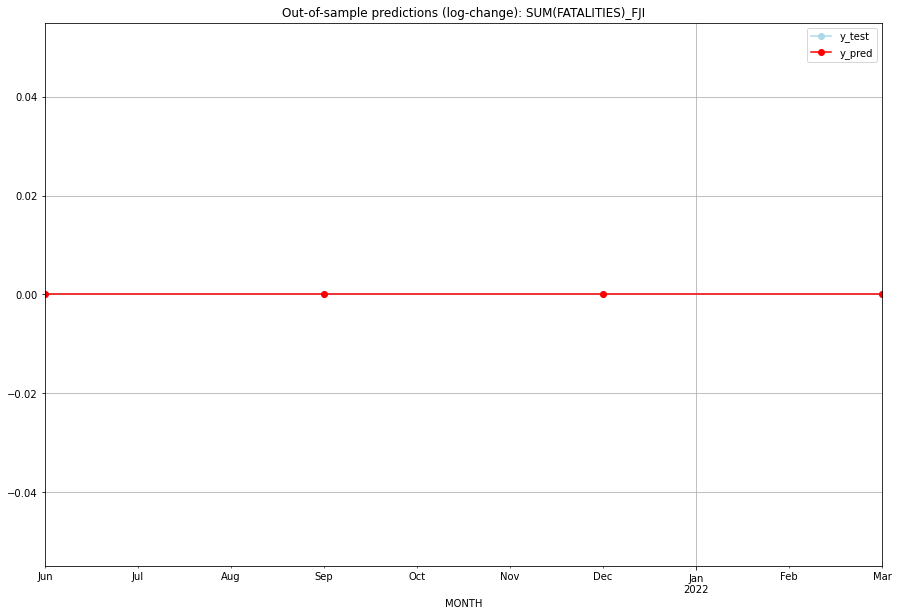

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   FJI
1 2021-07-01       0.0         0.0           0.0             0.0   FJI
2 2021-10-01       0.0         0.0           0.0             0.0   FJI
3 2022-01-01       0.0         0.0           0.0             0.0   FJI
Execution time: 00:01
######## FLK (71/234) #########
0
Neighbor countries: []
Getting Data for FLK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

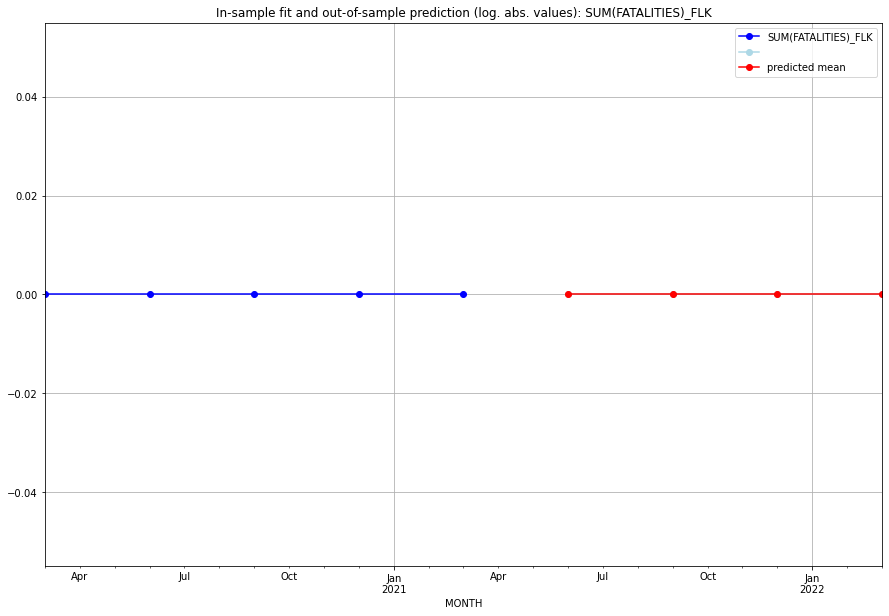

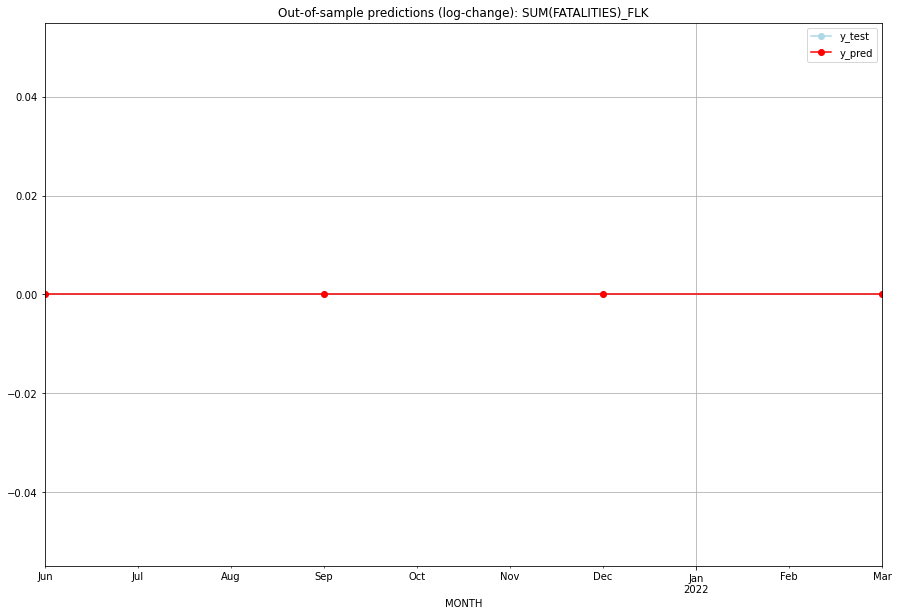

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   FLK
1 2021-07-01       0.0         0.0           0.0             0.0   FLK
2 2021-10-01       0.0         0.0           0.0             0.0   FLK
3 2022-01-01       0.0         0.0           0.0             0.0   FLK
Execution time: 00:01
######## FRA (72/234) #########
0
Neighbor countries: []
Getting Data for FRA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

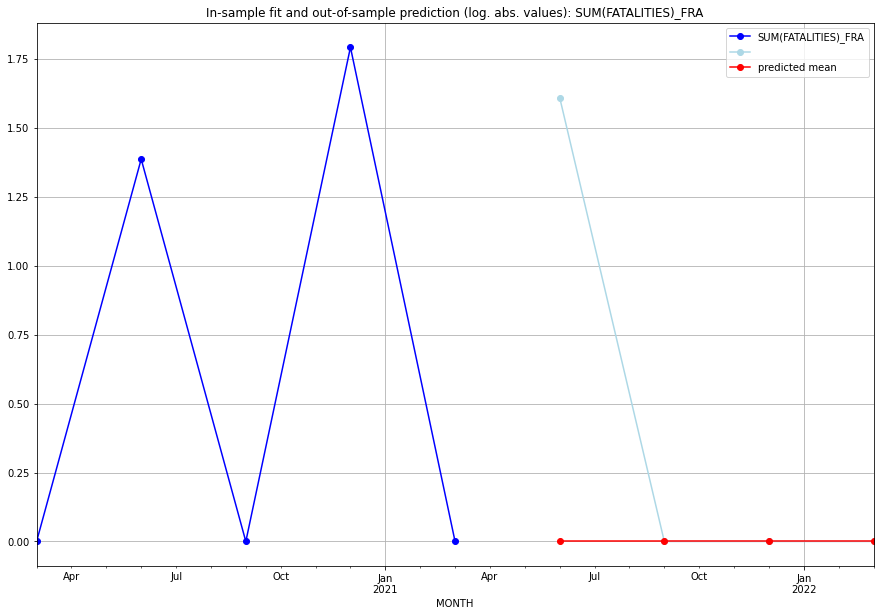

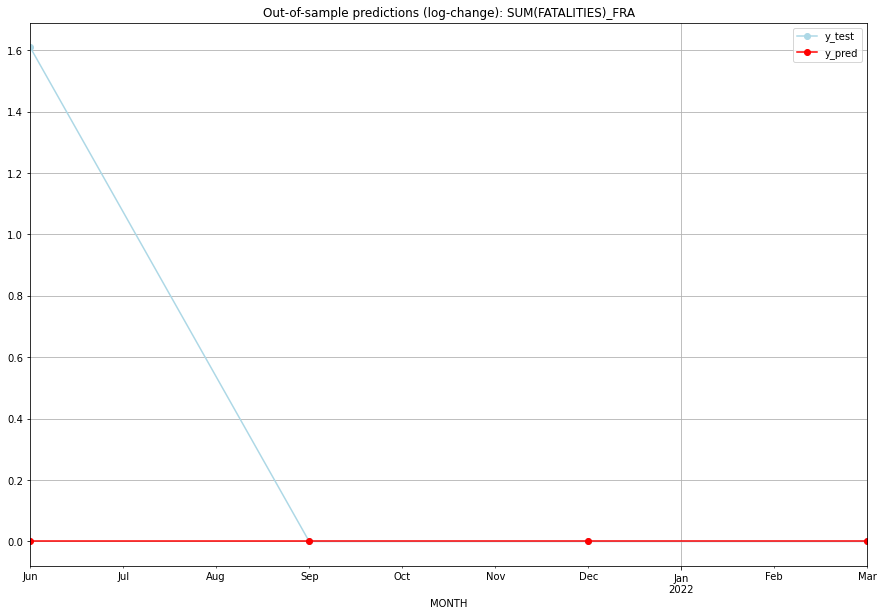

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.609438           0.0        1.609438
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.4023594781085251
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.609438           0.0        1.609438   FRA
1 2021-07-01       0.0    0.000000           0.0        0.000000   FRA
2 2021-10-01       0.0    0.000000           0.0        0.000000   FRA
3 2022-01-01       0.0    0.000000           0.0        0.000000   FRA
Execution time: 00:01
######## FRO (73/234) #########
0
Neighbor countries: []
Getting Data for FRO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

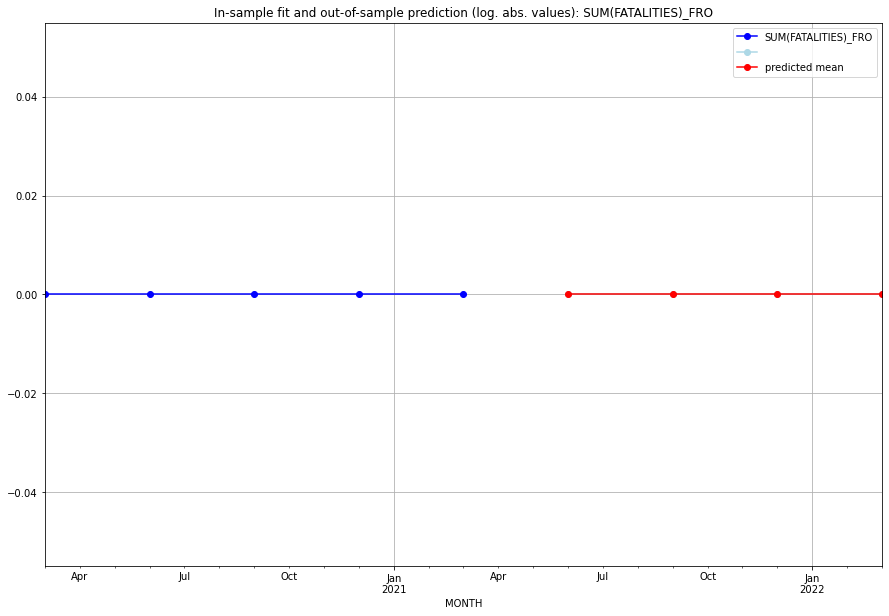

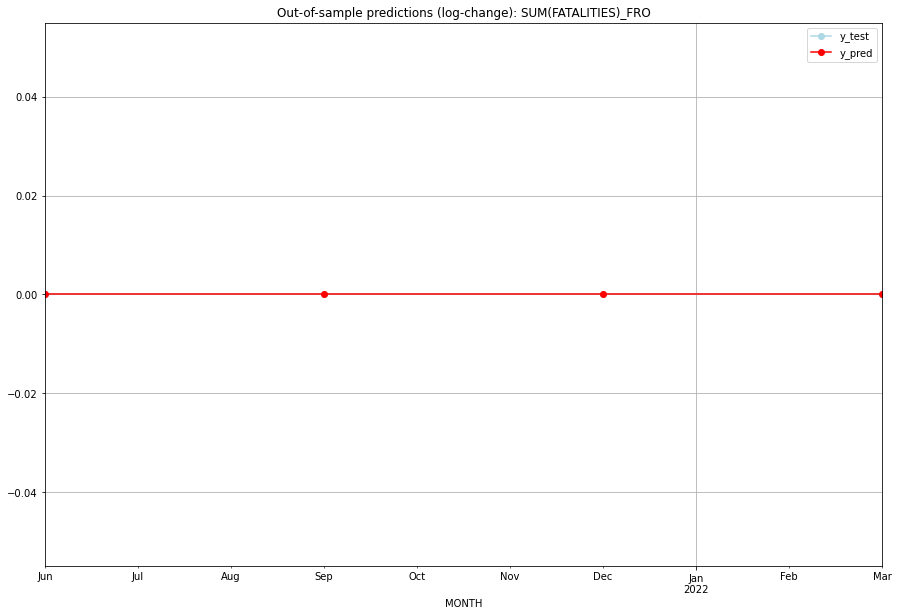

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   FRO
1 2021-07-01       0.0         0.0           0.0             0.0   FRO
2 2021-10-01       0.0         0.0           0.0             0.0   FRO
3 2022-01-01       0.0         0.0           0.0             0.0   FRO
Execution time: 00:01
######## FSM (74/234) #########
0
Neighbor countries: []
Getting Data for FSM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

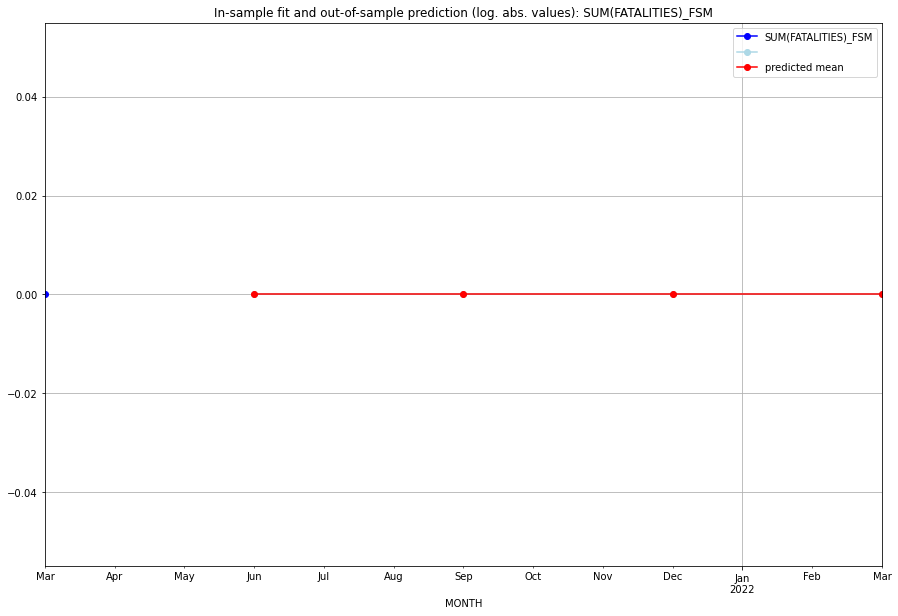

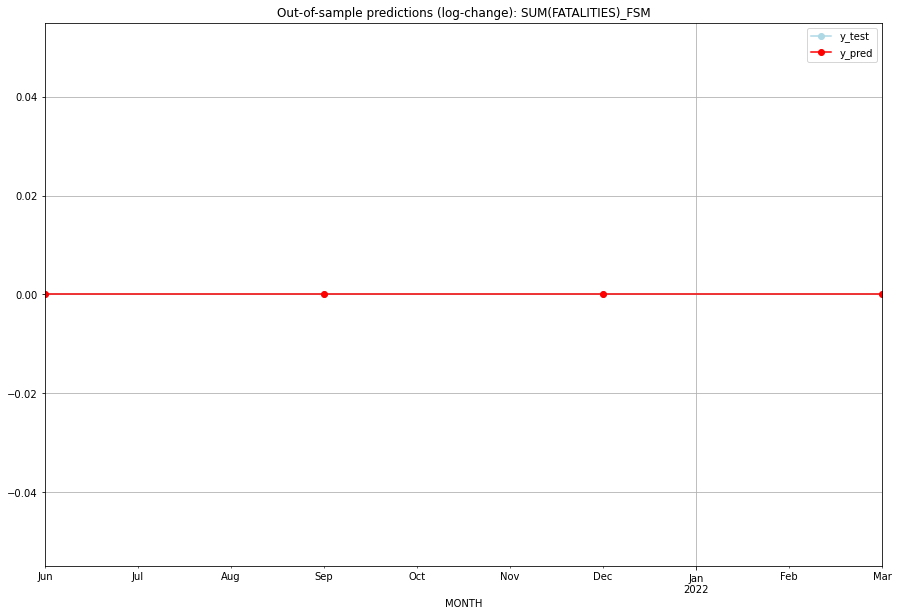

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   FSM
1 2021-07-01       0.0         0.0           0.0             0.0   FSM
2 2021-10-01       0.0         0.0           0.0             0.0   FSM
3 2022-01-01       0.0         0.0           0.0             0.0   FSM
Execution time: 00:01
######## GAB (75/234) #########
0
Neighbor countries: []
Getting Data for GAB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-0

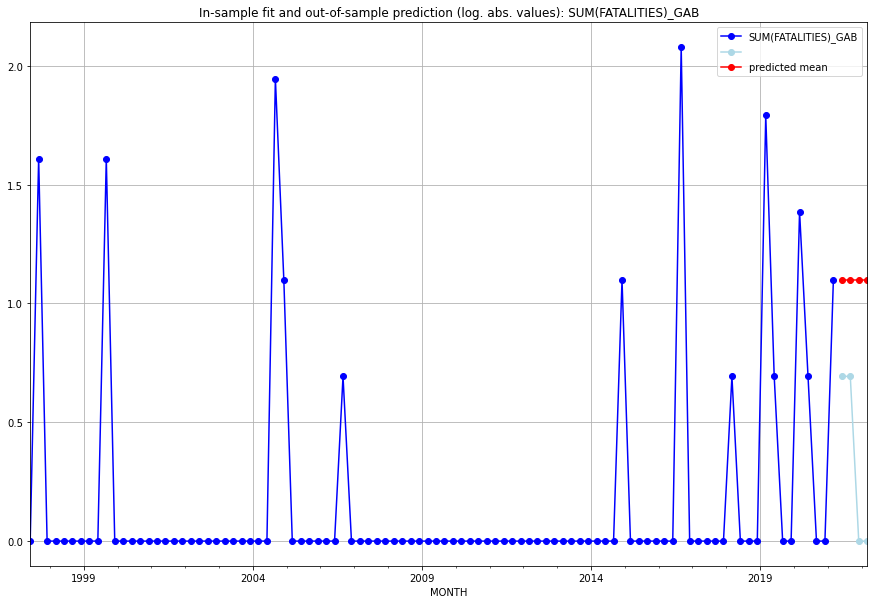

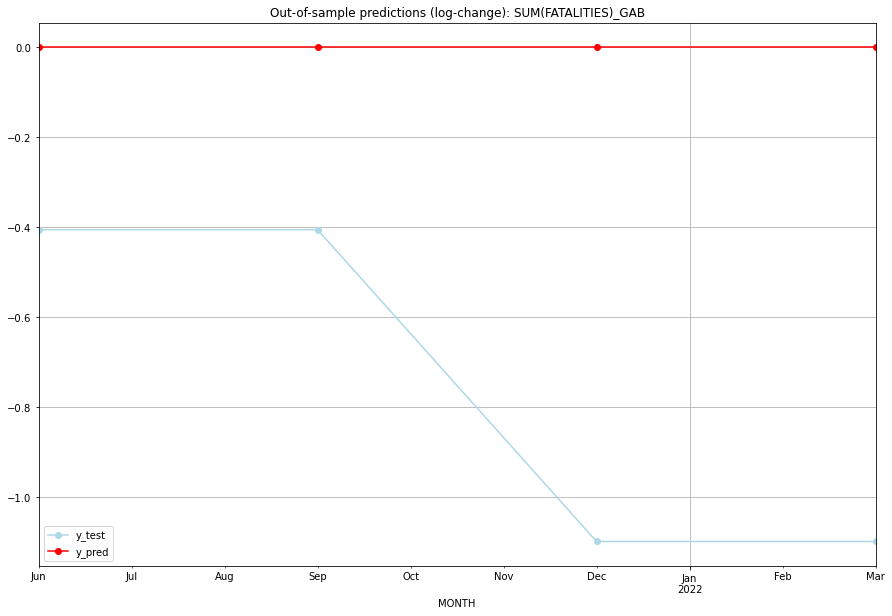

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    0.693147           0.0       -0.405465
1  2021-07  1.098612    0.693147           0.0       -0.405465
2  2021-10  1.098612    0.000000           0.0       -1.098612
3  2022-01  1.098612    0.000000           0.0       -1.098612
TADDA: 0.7520386983881371
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    0.693147           0.0       -0.405465   GAB
1 2021-07-01  1.098612    0.693147           0.0       -0.405465   GAB
2 2021-10-01  1.098612    0.000000           0.0       -1.098612   GAB
3 2022-01-01  1.098612    0.000000           0.0       -1.098612   GAB
Execution time: 00:01
######## GBR (76/234) #########
0
Neighbor countries: []
Getting Data for GBR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
                0
MONTH        

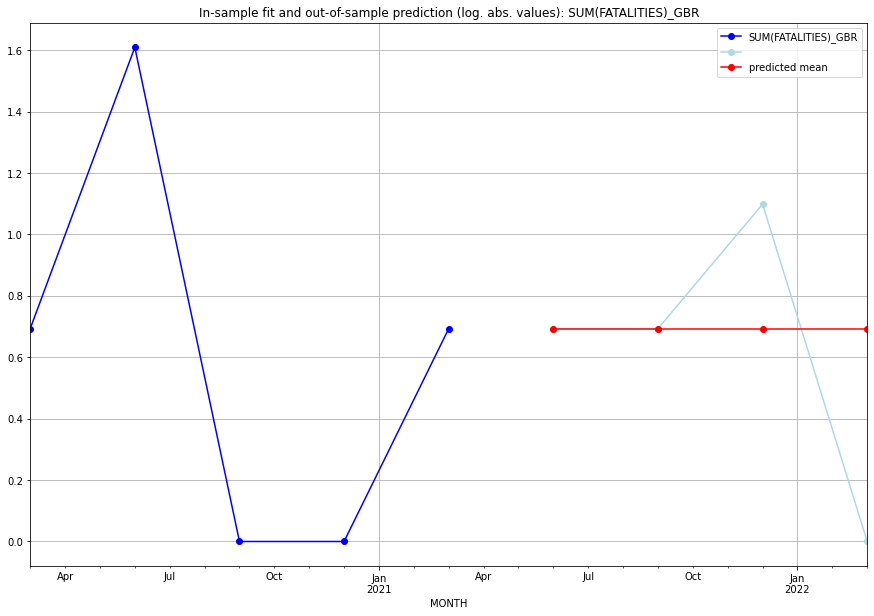

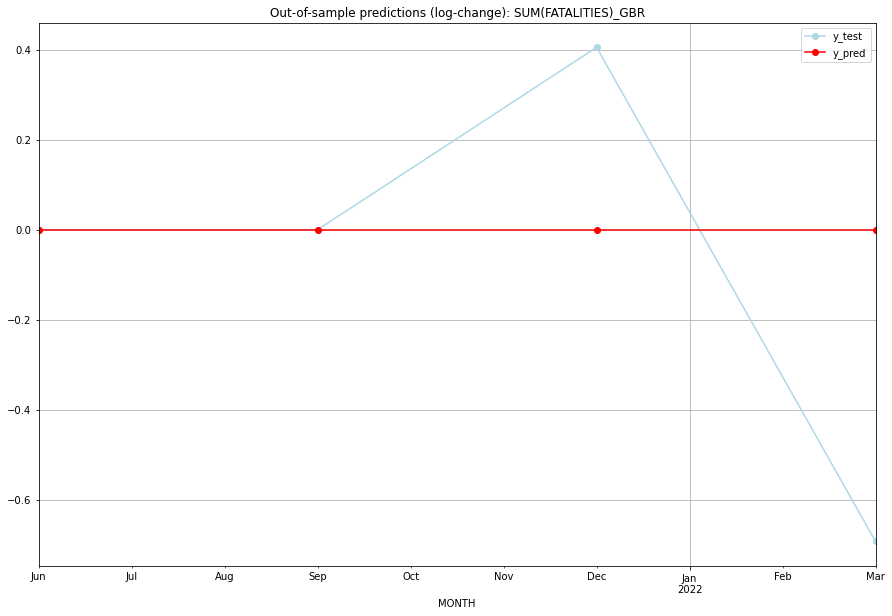

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.693147           0.0        0.000000
1  2021-07  0.693147    0.693147           0.0        0.000000
2  2021-10  0.693147    1.098612           0.0        0.405465
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.27465307216702745
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.693147           0.0        0.000000   GBR
1 2021-07-01  0.693147    0.693147           0.0        0.000000   GBR
2 2021-10-01  0.693147    1.098612           0.0        0.405465   GBR
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   GBR
Execution time: 00:01
######## GEO (77/234) #########
0
Neighbor countries: []
Getting Data for GEO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

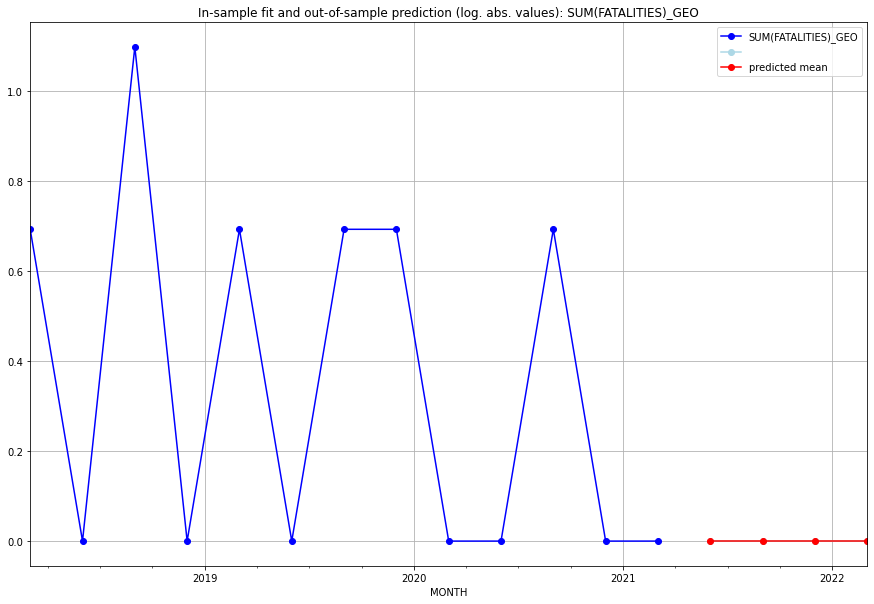

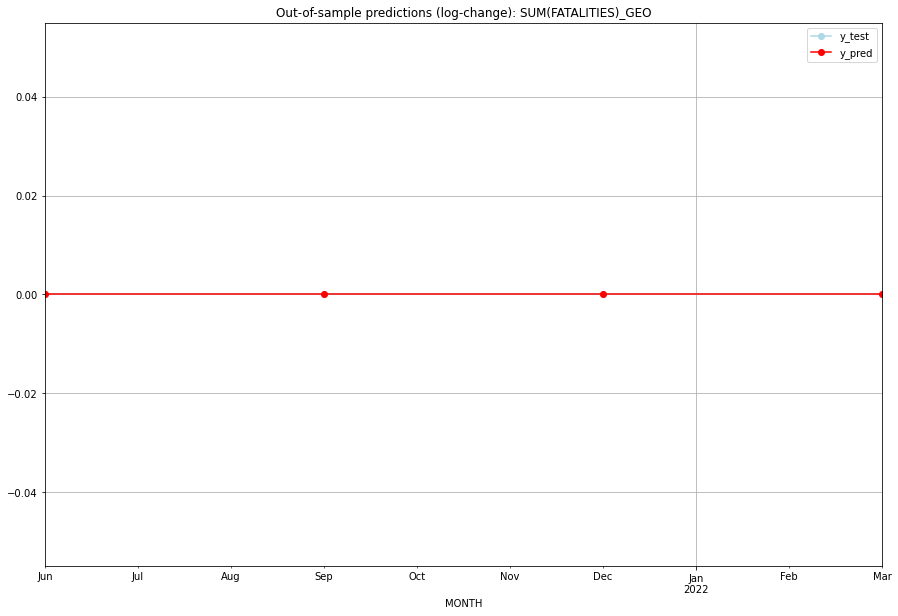

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GEO
1 2021-07-01       0.0         0.0           0.0             0.0   GEO
2 2021-10-01       0.0         0.0           0.0             0.0   GEO
3 2022-01-01       0.0         0.0           0.0             0.0   GEO
Execution time: 00:01
######## GGY (78/234) #########
0
Neighbor countries: []
Getting Data for GGY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

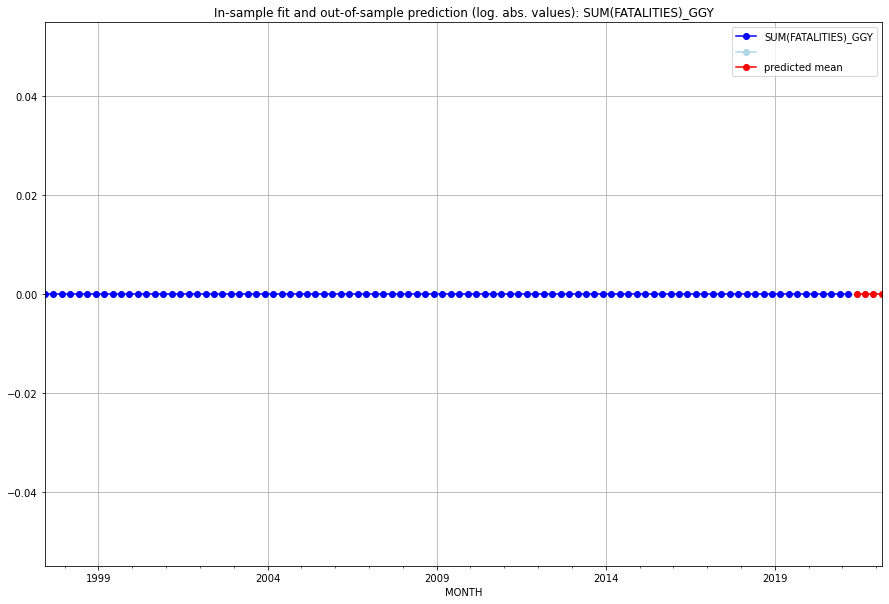

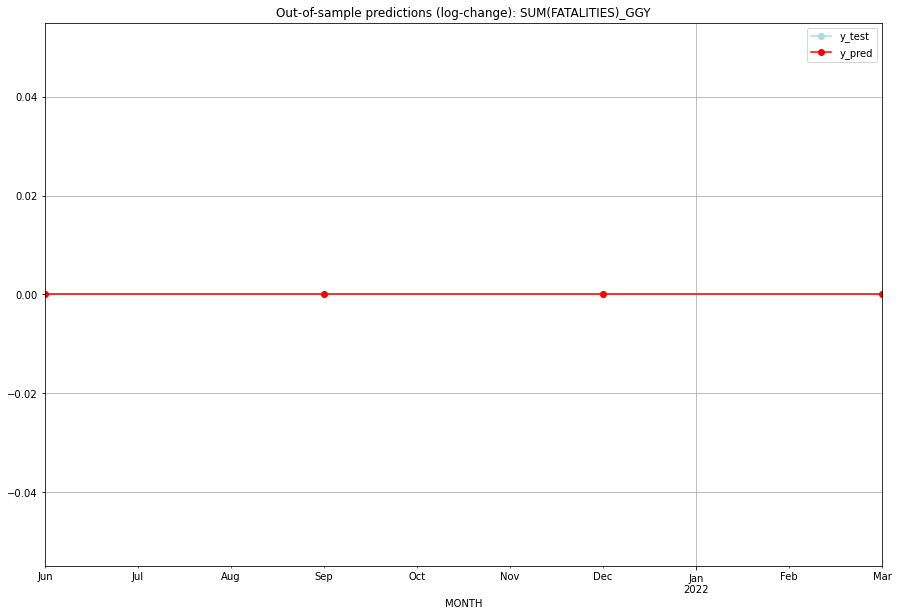

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GGY
1 2021-07-01       0.0         0.0           0.0             0.0   GGY
2 2021-10-01       0.0         0.0           0.0             0.0   GGY
3 2022-01-01       0.0         0.0           0.0             0.0   GGY
Execution time: 00:01
######## GHA (79/234) #########
0
Neighbor countries: []
Getting Data for GHA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

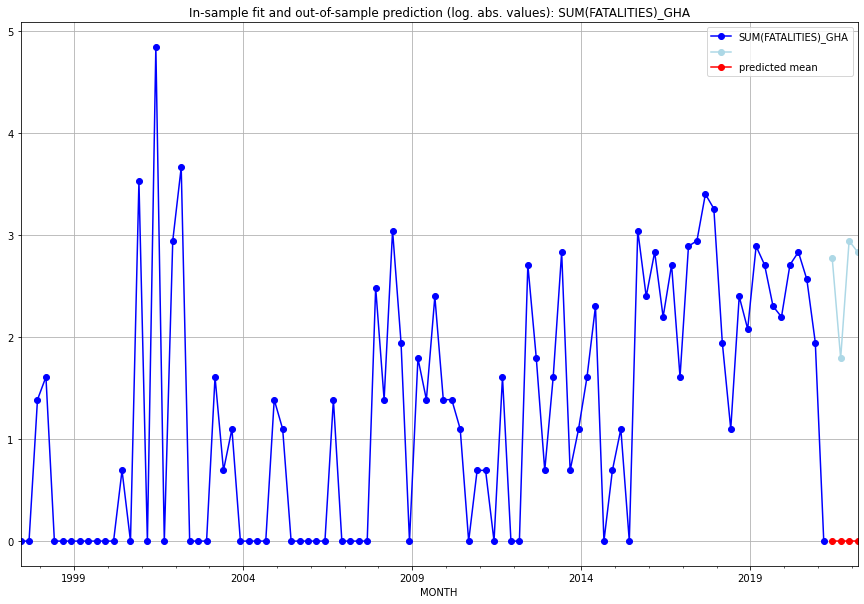

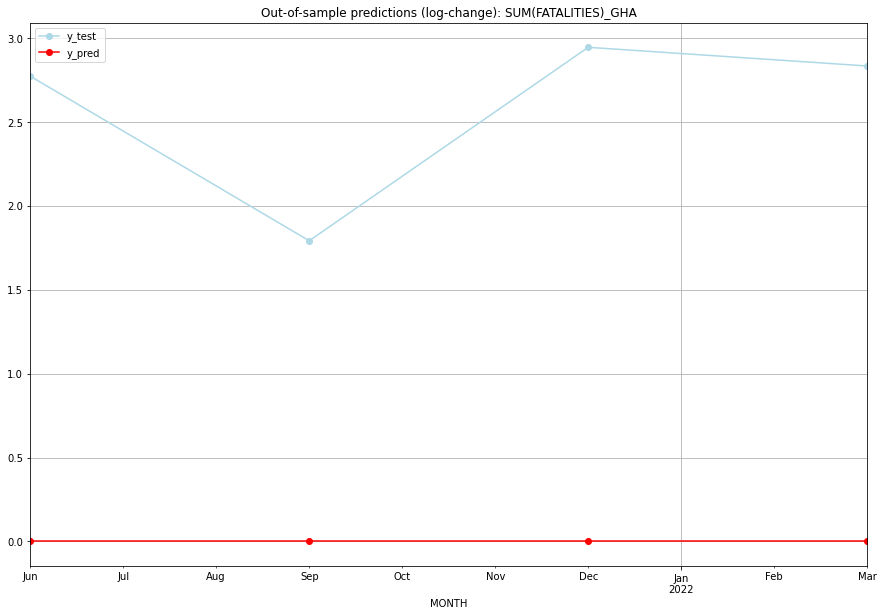

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    2.772589           0.0        2.772589
1  2021-07       0.0    1.791759           0.0        1.791759
2  2021-10       0.0    2.944439           0.0        2.944439
3  2022-01       0.0    2.833213           0.0        2.833213
TADDA: 2.5855001286726234
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    2.772589           0.0        2.772589   GHA
1 2021-07-01       0.0    1.791759           0.0        1.791759   GHA
2 2021-10-01       0.0    2.944439           0.0        2.944439   GHA
3 2022-01-01       0.0    2.833213           0.0        2.833213   GHA
Execution time: 00:01
######## GIB (80/234) #########
0
Neighbor countries: []
Getting Data for GIB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

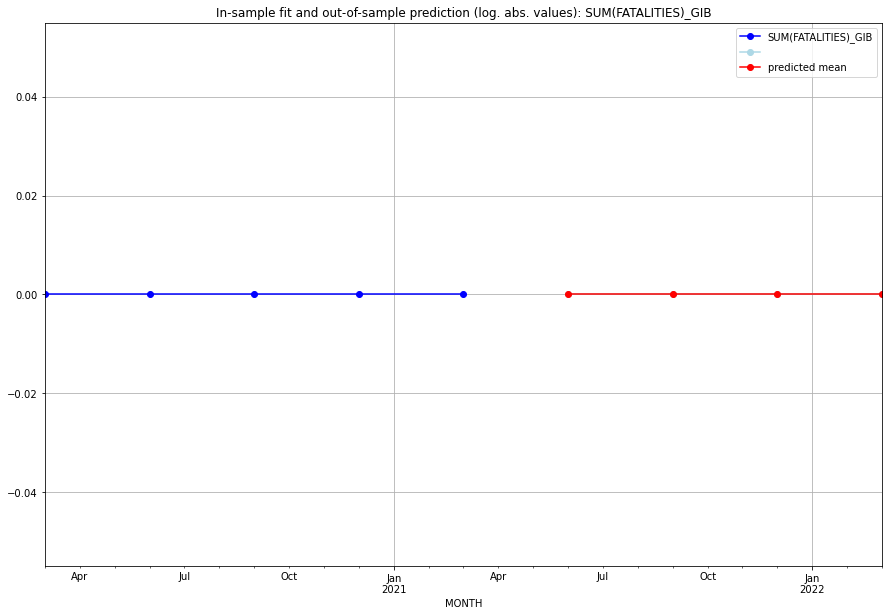

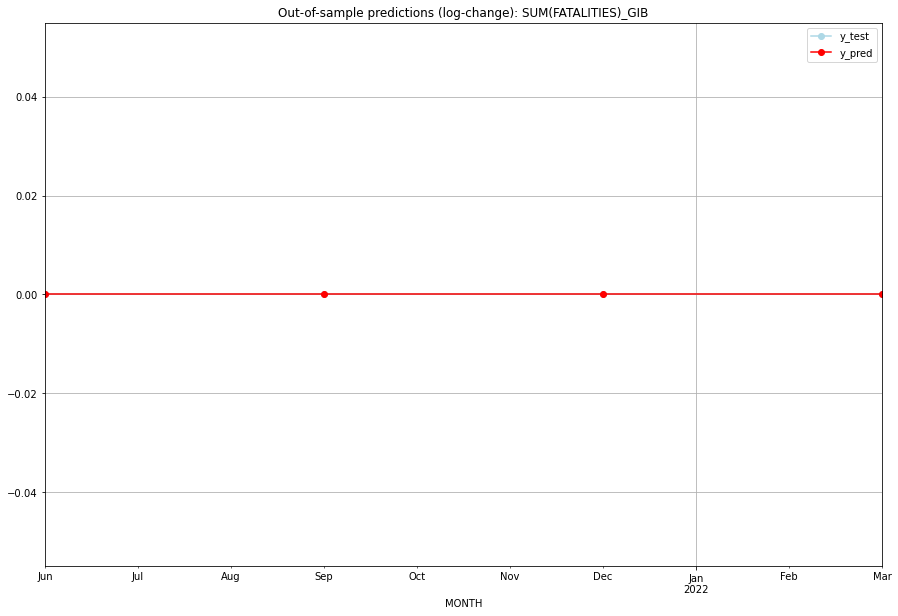

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GIB
1 2021-07-01       0.0         0.0           0.0             0.0   GIB
2 2021-10-01       0.0         0.0           0.0             0.0   GIB
3 2022-01-01       0.0         0.0           0.0             0.0   GIB
Execution time: 00:01
######## GIN (81/234) #########
0
Neighbor countries: []
Getting Data for GIN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-0

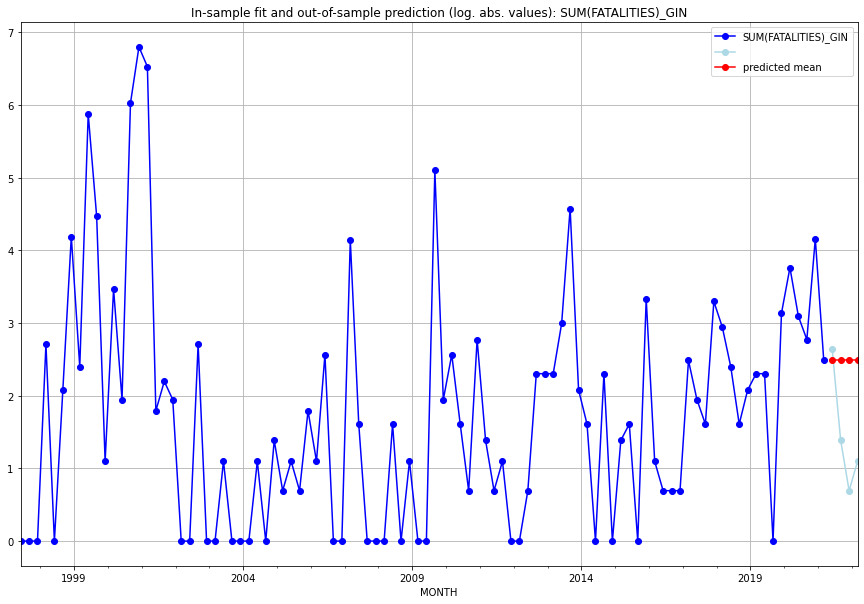

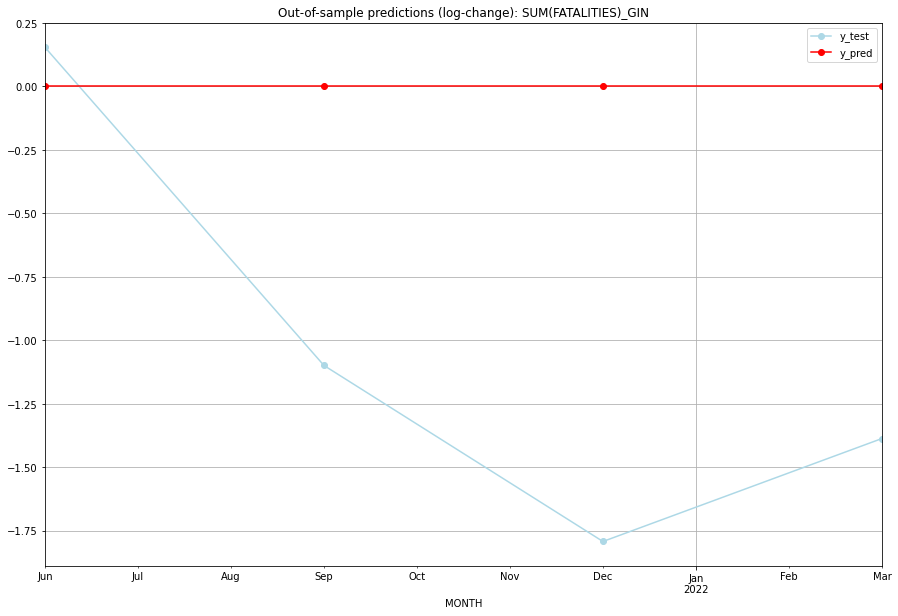

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.484907    2.639057           0.0        0.154151
1  2021-07  2.484907    1.386294           0.0       -1.098612
2  2021-10  2.484907    0.693147           0.0       -1.791759
3  2022-01  2.484907    1.098612           0.0       -1.386294
TADDA: 1.1077041997108283
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.484907    2.639057           0.0        0.154151   GIN
1 2021-07-01  2.484907    1.386294           0.0       -1.098612   GIN
2 2021-10-01  2.484907    0.693147           0.0       -1.791759   GIN
3 2022-01-01  2.484907    1.098612           0.0       -1.386294   GIN
Execution time: 00:01
######## GLP (82/234) #########
0
Neighbor countries: []
Getting Data for GLP
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
202

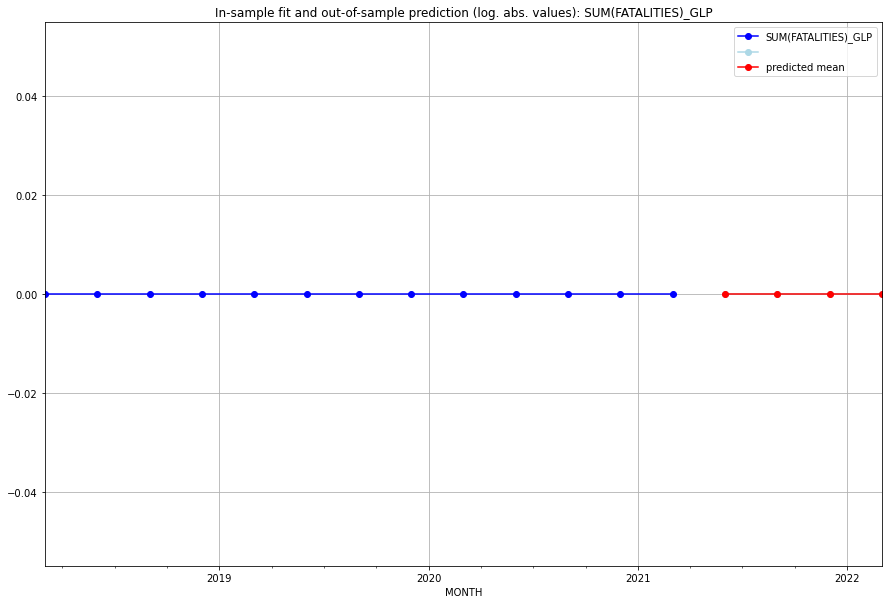

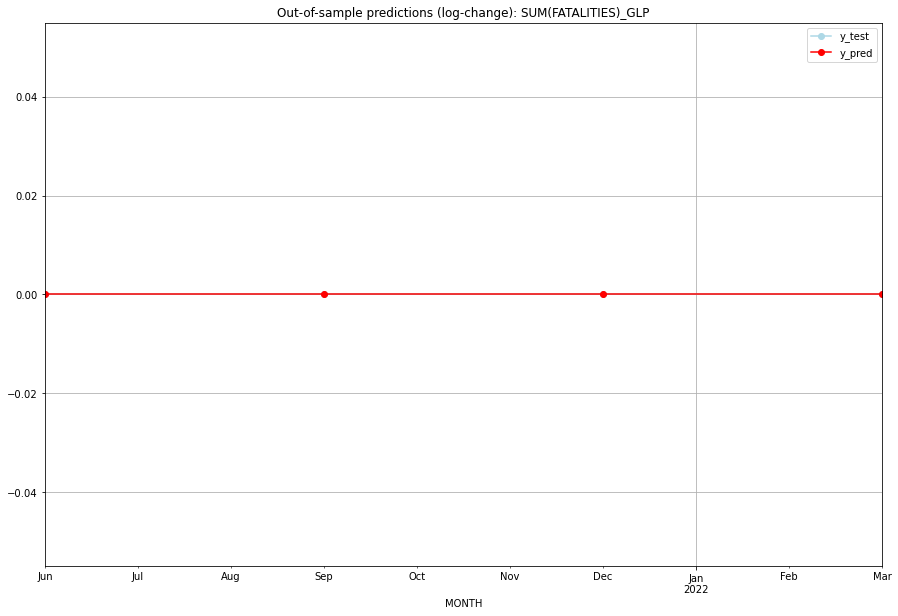

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GLP
1 2021-07-01       0.0         0.0           0.0             0.0   GLP
2 2021-10-01       0.0         0.0           0.0             0.0   GLP
3 2022-01-01       0.0         0.0           0.0             0.0   GLP
Execution time: 00:01
######## GMB (83/234) #########
0
Neighbor countries: []
Getting Data for GMB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
202

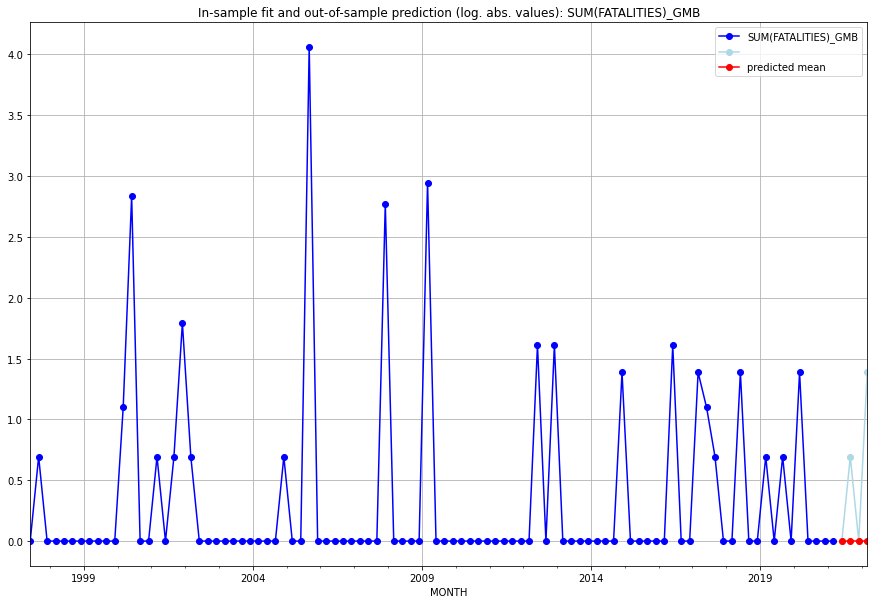

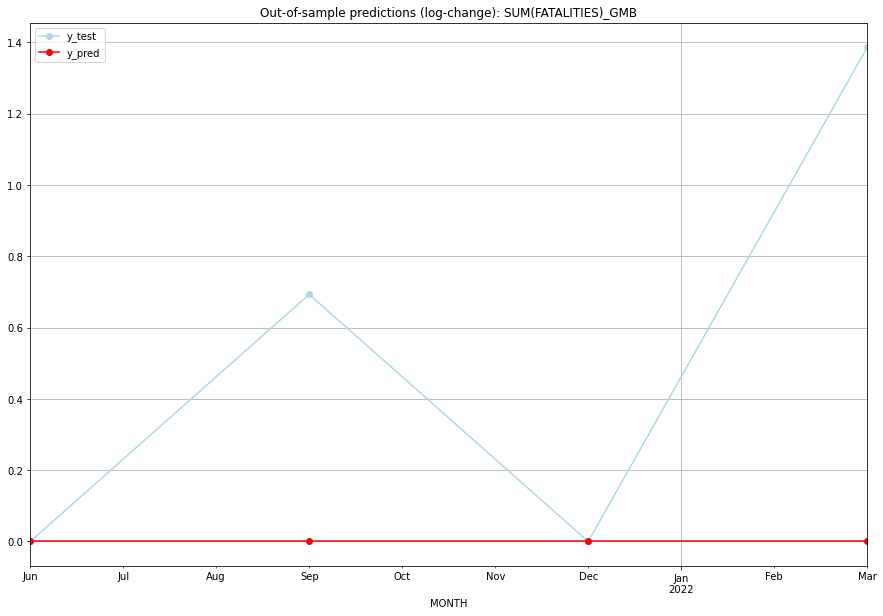

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    1.386294           0.0        1.386294
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   GMB
1 2021-07-01       0.0    0.693147           0.0        0.693147   GMB
2 2021-10-01       0.0    0.000000           0.0        0.000000   GMB
3 2022-01-01       0.0    1.386294           0.0        1.386294   GMB
Execution time: 00:01
######## GNB (84/234) #########
0
Neighbor countries: []
Getting Data for GNB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

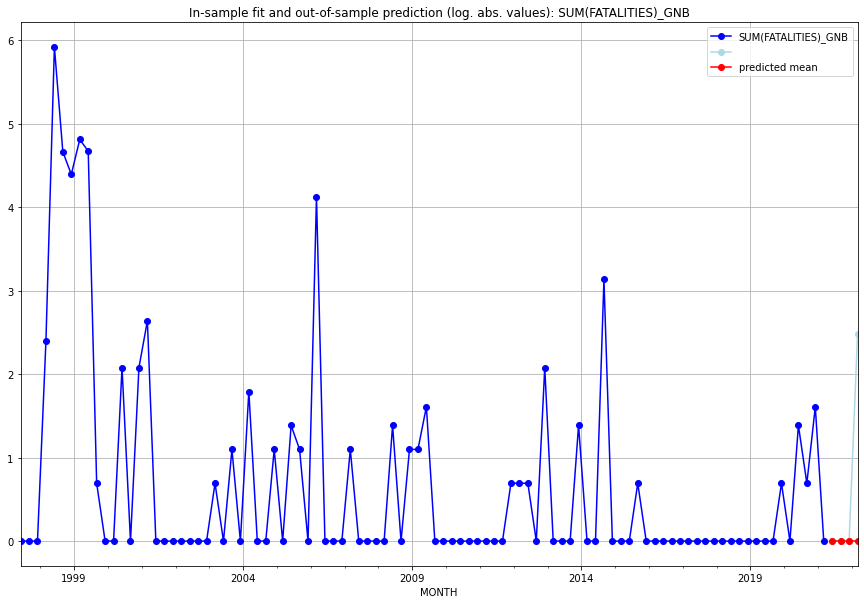

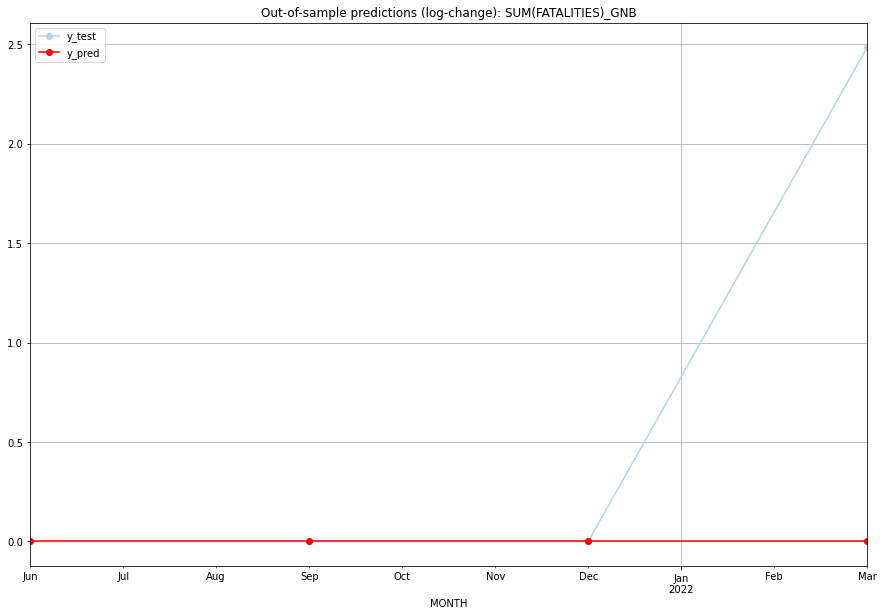

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    2.484907           0.0        2.484907
TADDA: 0.6212266624470001
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   GNB
1 2021-07-01       0.0    0.000000           0.0        0.000000   GNB
2 2021-10-01       0.0    0.000000           0.0        0.000000   GNB
3 2022-01-01       0.0    2.484907           0.0        2.484907   GNB
Execution time: 00:01
######## GNQ (85/234) #########
0
Neighbor countries: []
Getting Data for GNQ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

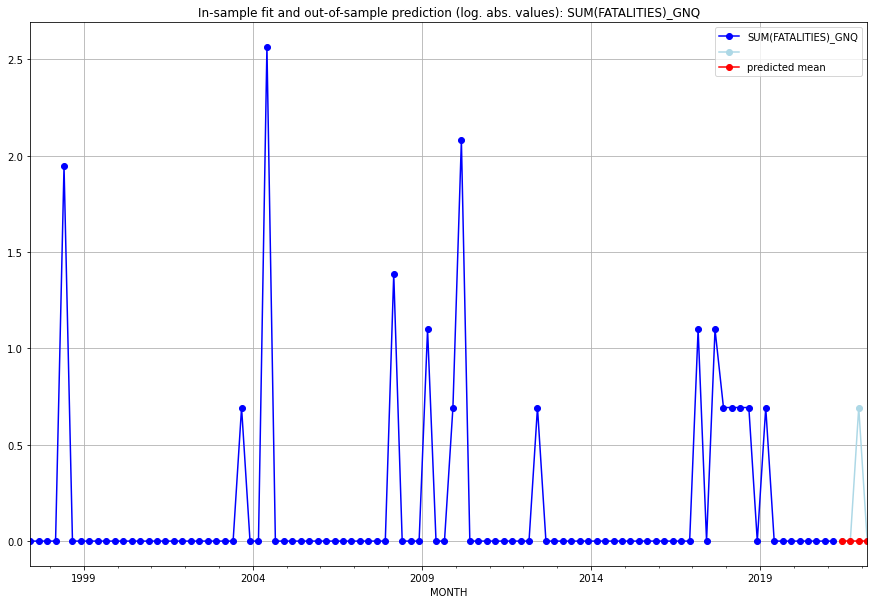

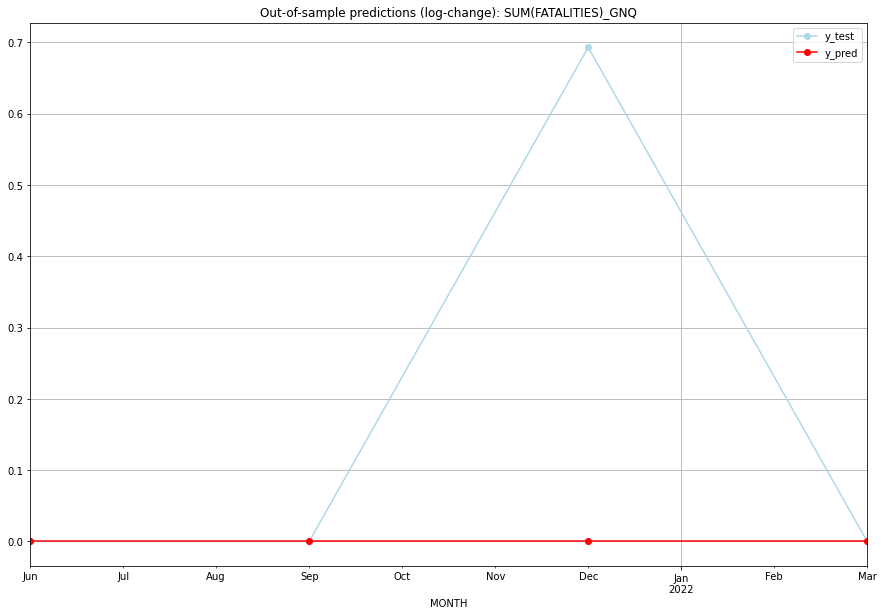

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.693147           0.0        0.693147
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   GNQ
1 2021-07-01       0.0    0.000000           0.0        0.000000   GNQ
2 2021-10-01       0.0    0.693147           0.0        0.693147   GNQ
3 2022-01-01       0.0    0.000000           0.0        0.000000   GNQ
Execution time: 00:01
######## GRC (86/234) #########
0
Neighbor countries: []
Getting Data for GRC
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH     

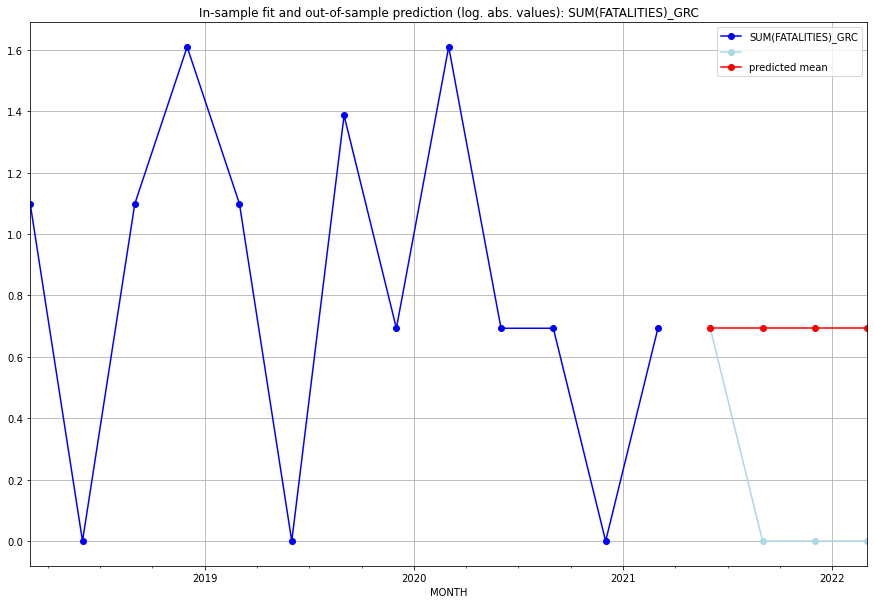

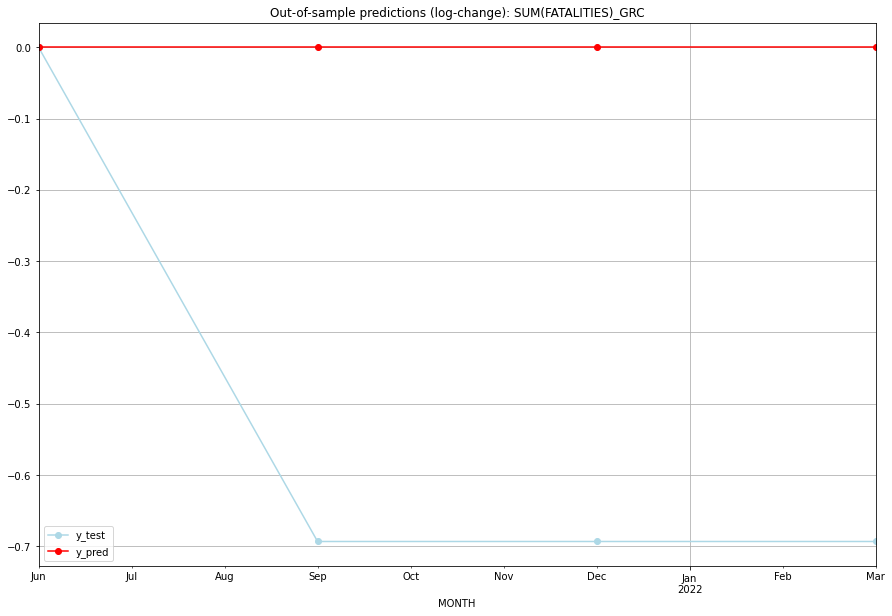

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.693147           0.0        0.000000
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    0.000000           0.0       -0.693147
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.693147           0.0        0.000000   GRC
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   GRC
2 2021-10-01  0.693147    0.000000           0.0       -0.693147   GRC
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   GRC
Execution time: 00:01
######## GRD (87/234) #########
0
Neighbor countries: []
Getting Data for GRD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
202

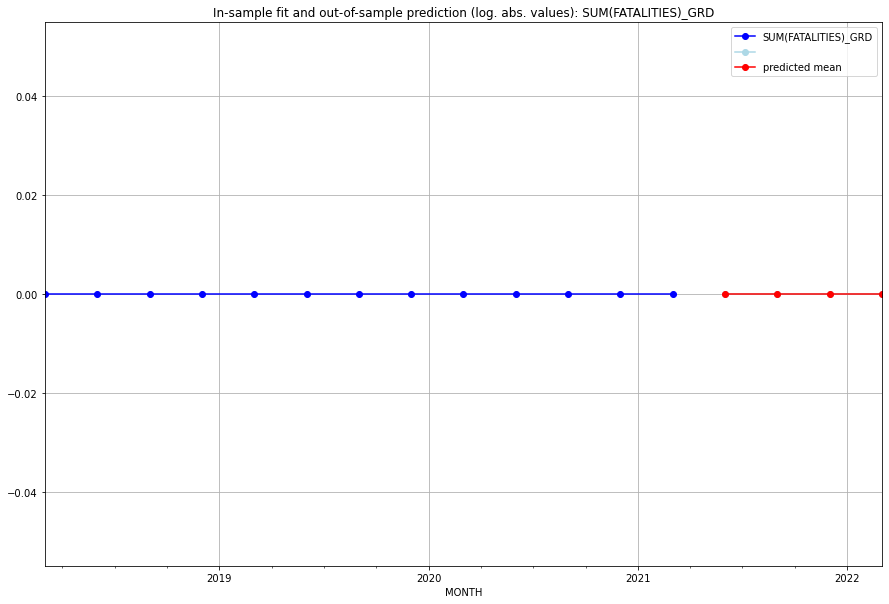

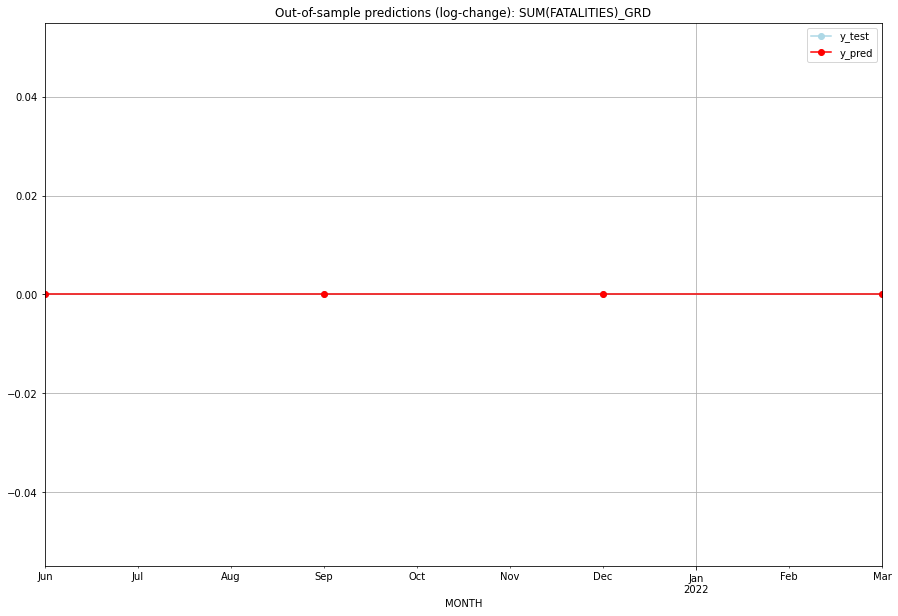

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GRD
1 2021-07-01       0.0         0.0           0.0             0.0   GRD
2 2021-10-01       0.0         0.0           0.0             0.0   GRD
3 2022-01-01       0.0         0.0           0.0             0.0   GRD
Execution time: 00:01
######## GRL (88/234) #########
0
Neighbor countries: []
Getting Data for GRL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

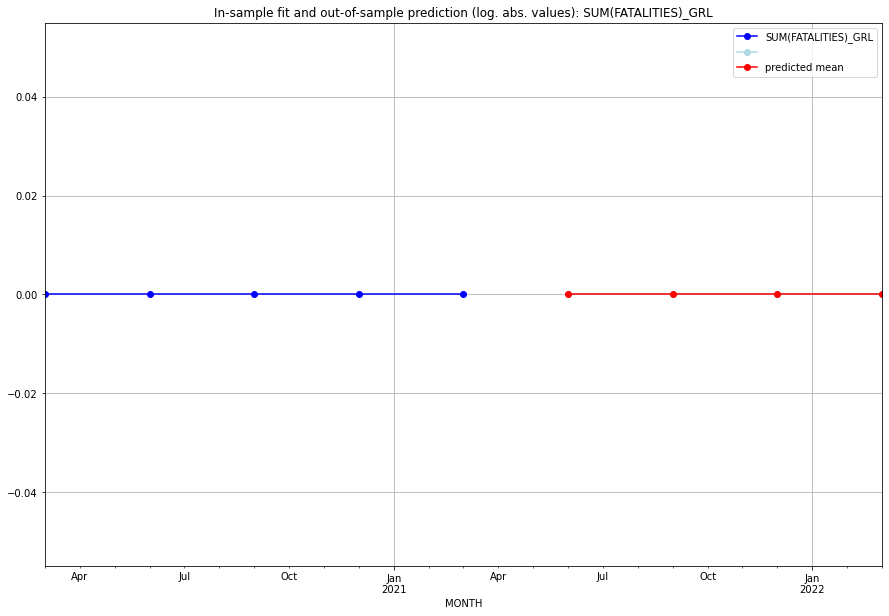

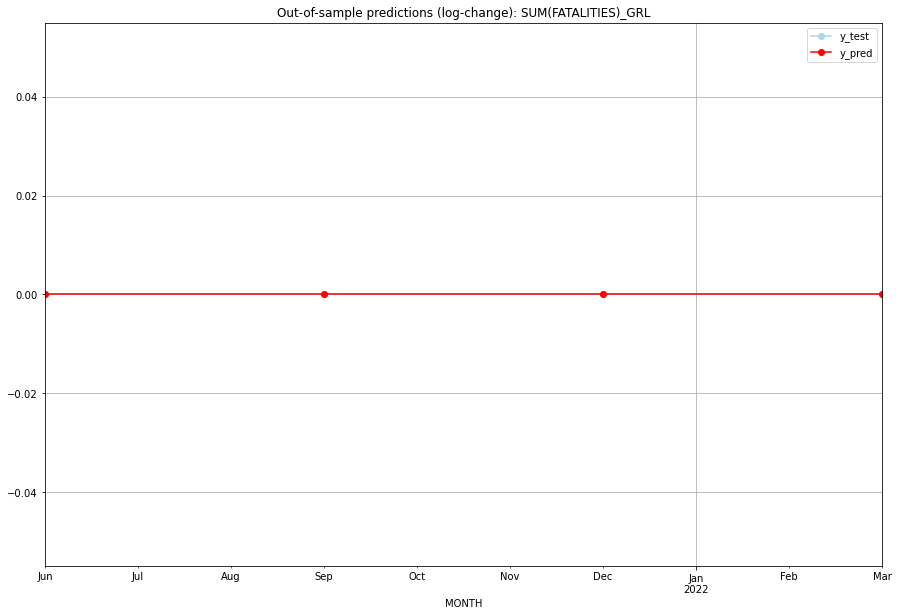

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GRL
1 2021-07-01       0.0         0.0           0.0             0.0   GRL
2 2021-10-01       0.0         0.0           0.0             0.0   GRL
3 2022-01-01       0.0         0.0           0.0             0.0   GRL
Execution time: 00:01
######## GTM (89/234) #########
0
Neighbor countries: []
Getting Data for GTM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04 

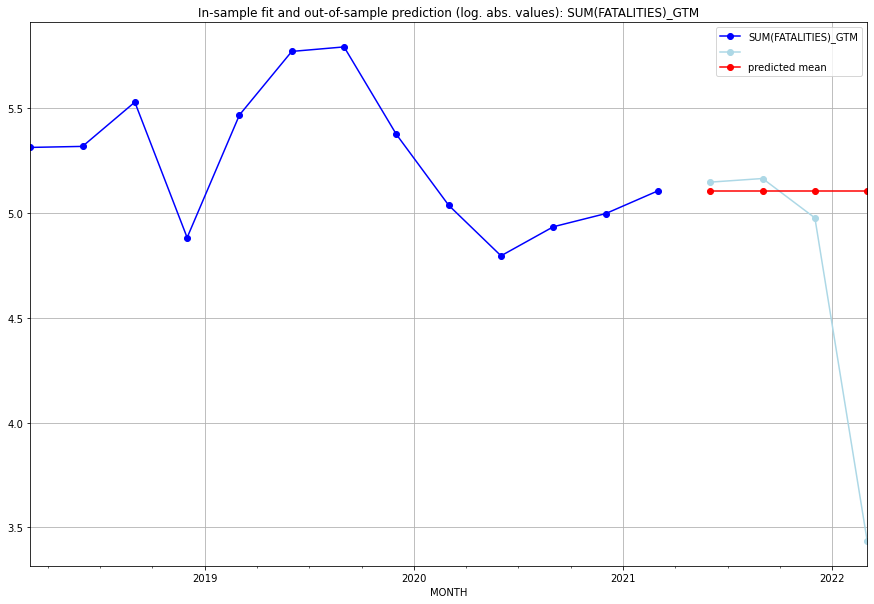

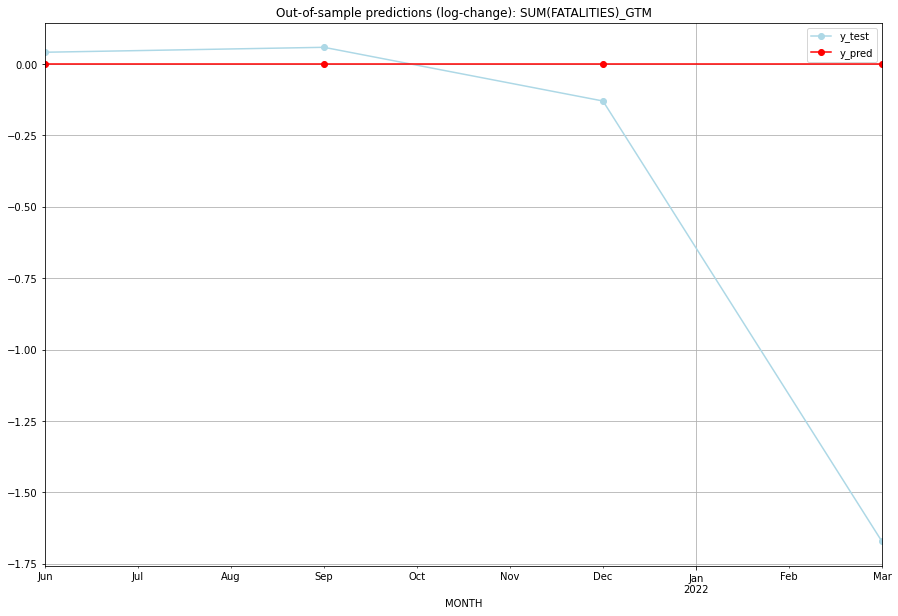

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.105945    5.147494           0.0        0.041549
1  2021-07  5.105945    5.164786           0.0        0.058841
2  2021-10  5.105945    4.976734           0.0       -0.129212
3  2022-01  5.105945    3.433987           0.0       -1.671958
TADDA: 0.4753898759578117
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.105945    5.147494           0.0        0.041549   GTM
1 2021-07-01  5.105945    5.164786           0.0        0.058841   GTM
2 2021-10-01  5.105945    4.976734           0.0       -0.129212   GTM
3 2022-01-01  5.105945    3.433987           0.0       -1.671958   GTM
Execution time: 00:01
######## GUF (90/234) #########
0
Neighbor countries: []
Getting Data for GUF
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
202

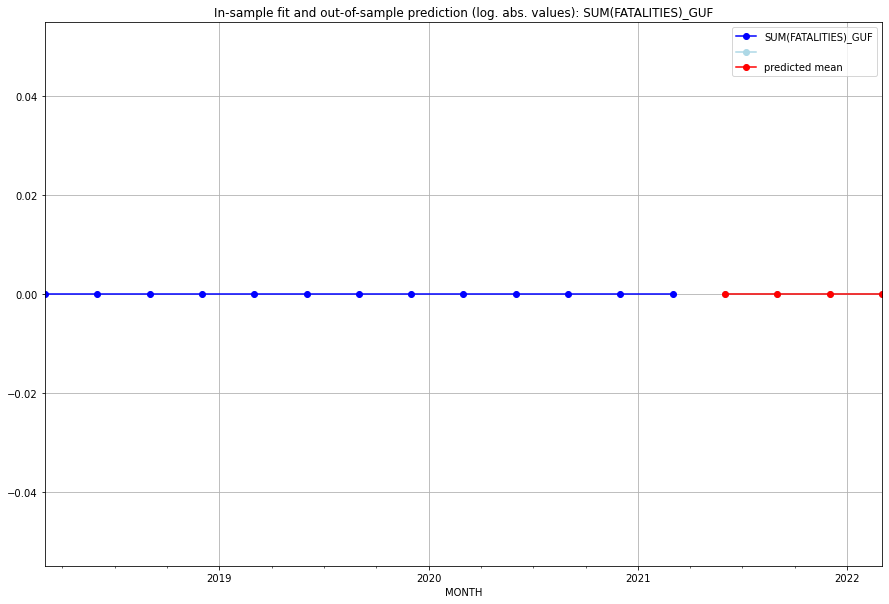

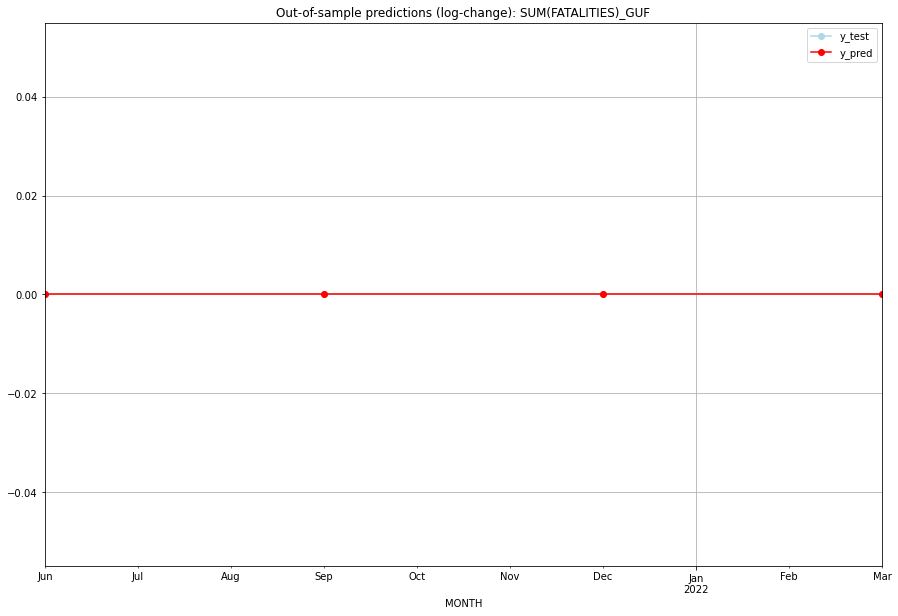

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GUF
1 2021-07-01       0.0         0.0           0.0             0.0   GUF
2 2021-10-01       0.0         0.0           0.0             0.0   GUF
3 2022-01-01       0.0         0.0           0.0             0.0   GUF
Execution time: 00:01
######## GUM (91/234) #########
0
Neighbor countries: []
Getting Data for GUM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-07

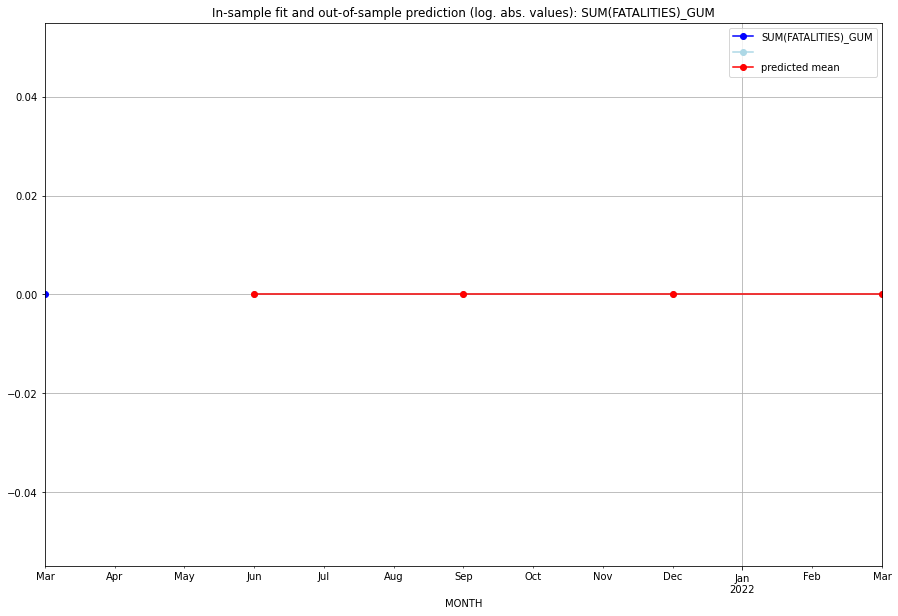

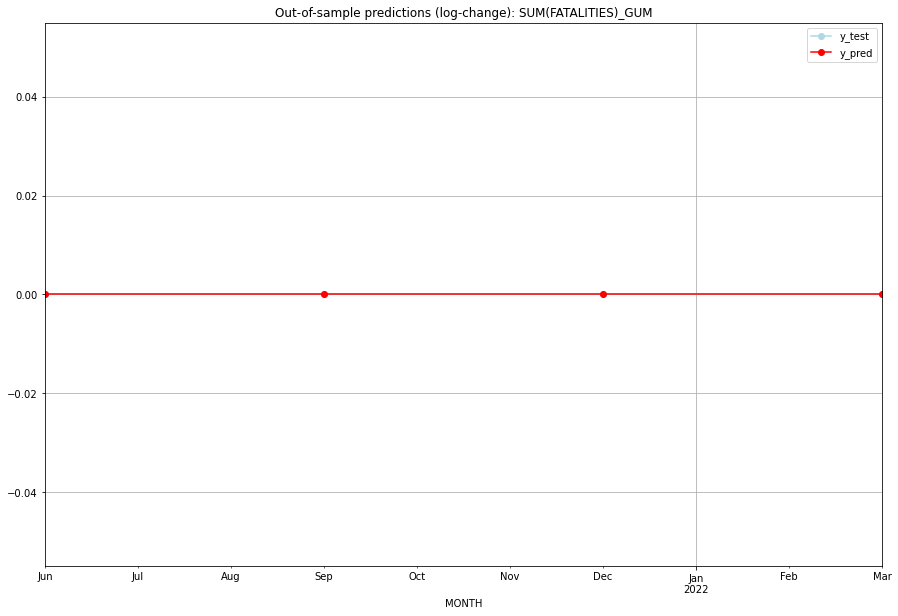

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   GUM
1 2021-07-01       0.0         0.0           0.0             0.0   GUM
2 2021-10-01       0.0         0.0           0.0             0.0   GUM
3 2022-01-01       0.0         0.0           0.0             0.0   GUM
Execution time: 00:01
######## GUY (92/234) #########
0
Neighbor countries: []
Getting Data for GUY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-

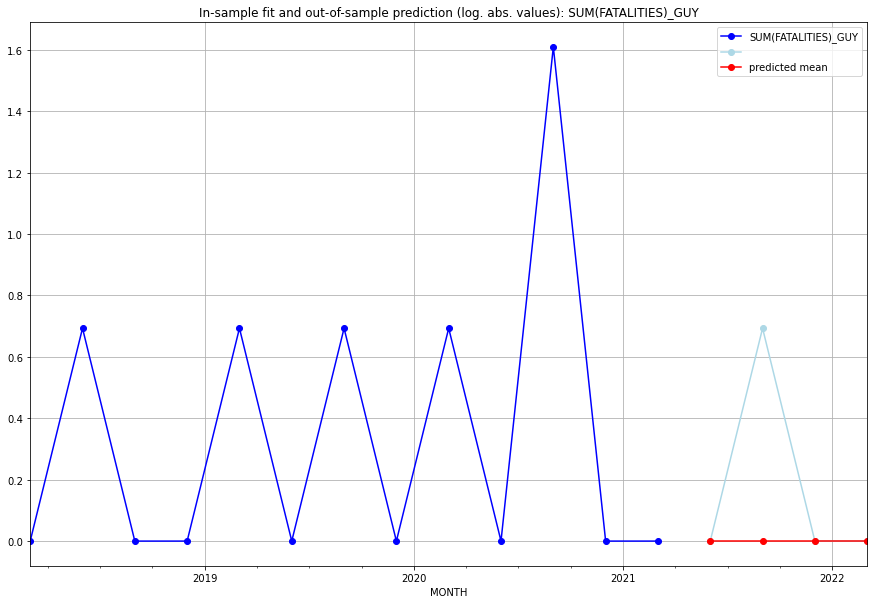

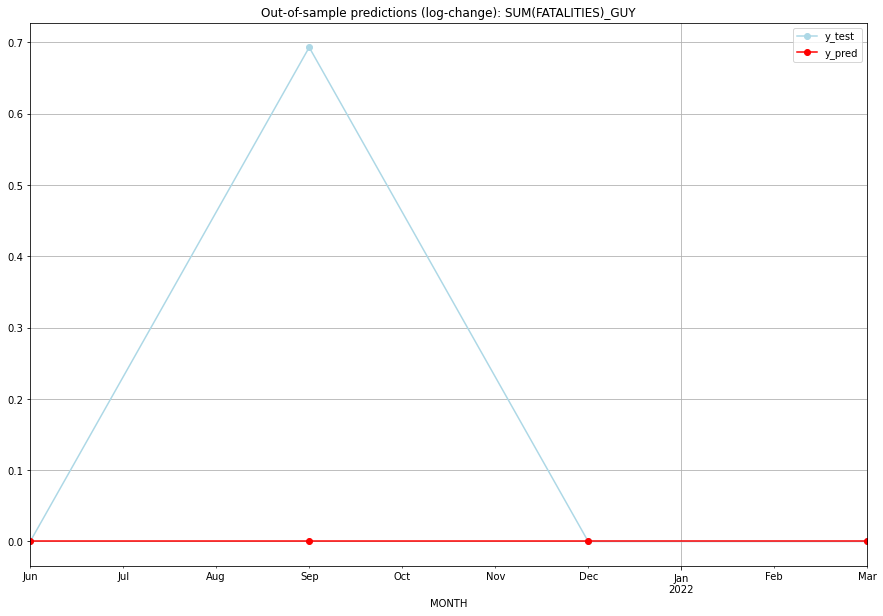

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   GUY
1 2021-07-01       0.0    0.693147           0.0        0.693147   GUY
2 2021-10-01       0.0    0.000000           0.0        0.000000   GUY
3 2022-01-01       0.0    0.000000           0.0        0.000000   GUY
Execution time: 00:01
######## HKG (93/234) #########
0
Neighbor countries: []
Getting Data for HKG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

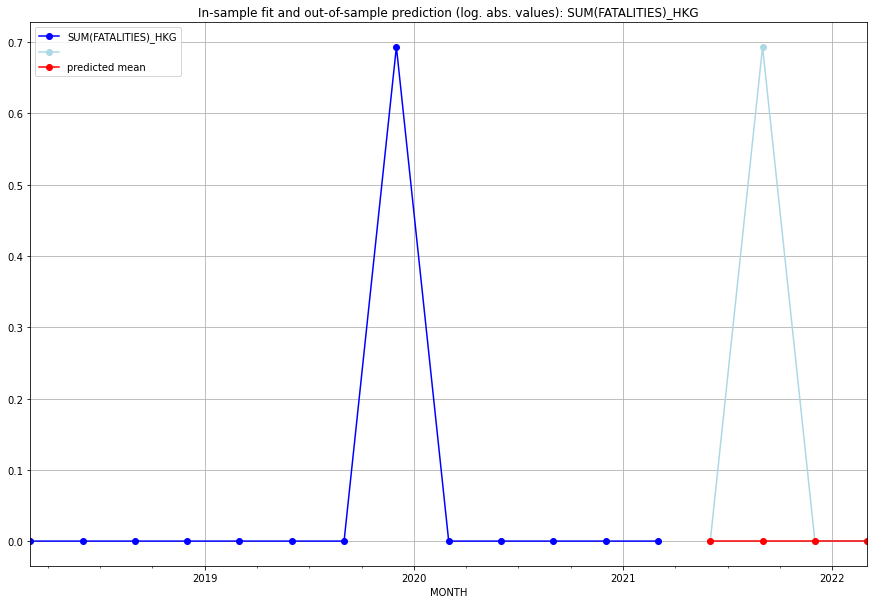

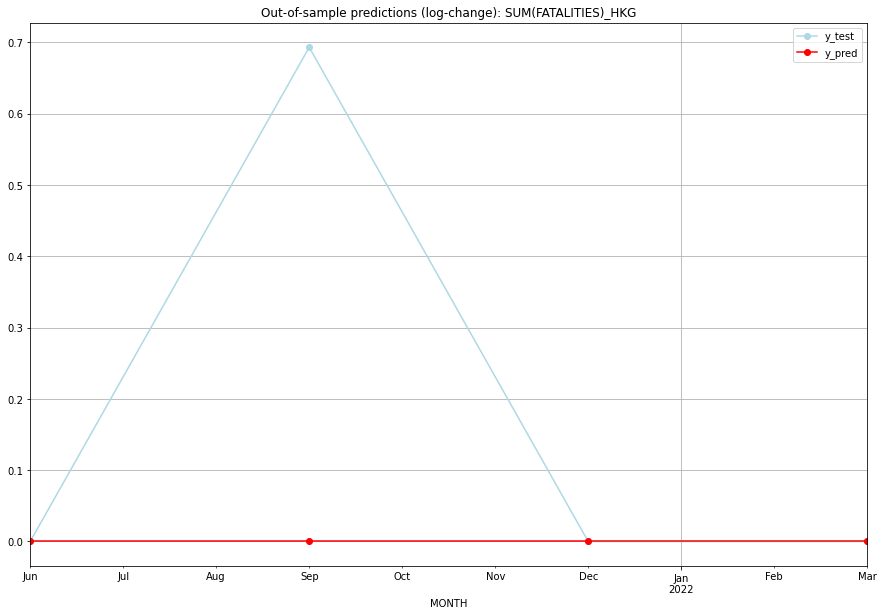

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   HKG
1 2021-07-01       0.0    0.693147           0.0        0.693147   HKG
2 2021-10-01       0.0    0.000000           0.0        0.000000   HKG
3 2022-01-01       0.0    0.000000           0.0        0.000000   HKG
Execution time: 00:01
######## HND (94/234) #########
0
Neighbor countries: []
Getting Data for HND
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH     

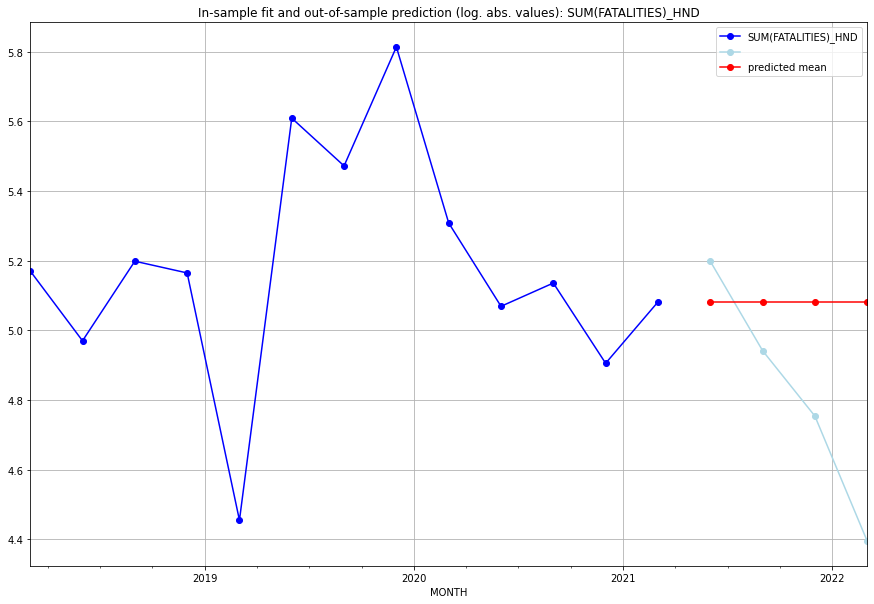

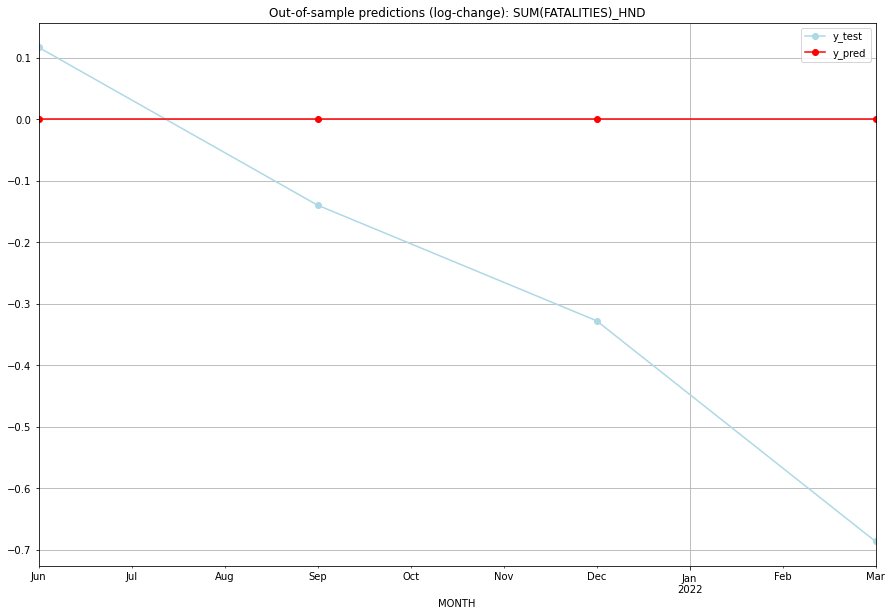

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.081404    5.198497           0.0        0.117093
1  2021-07  5.081404    4.941642           0.0       -0.139762
2  2021-10  5.081404    4.753590           0.0       -0.327814
3  2022-01  5.081404    4.394449           0.0       -0.686955
TADDA: 0.3179059982116612
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.081404    5.198497           0.0        0.117093   HND
1 2021-07-01  5.081404    4.941642           0.0       -0.139762   HND
2 2021-10-01  5.081404    4.753590           0.0       -0.327814   HND
3 2022-01-01  5.081404    4.394449           0.0       -0.686955   HND
Execution time: 00:01
######## HRV (95/234) #########
0
Neighbor countries: []
Getting Data for HRV
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH      

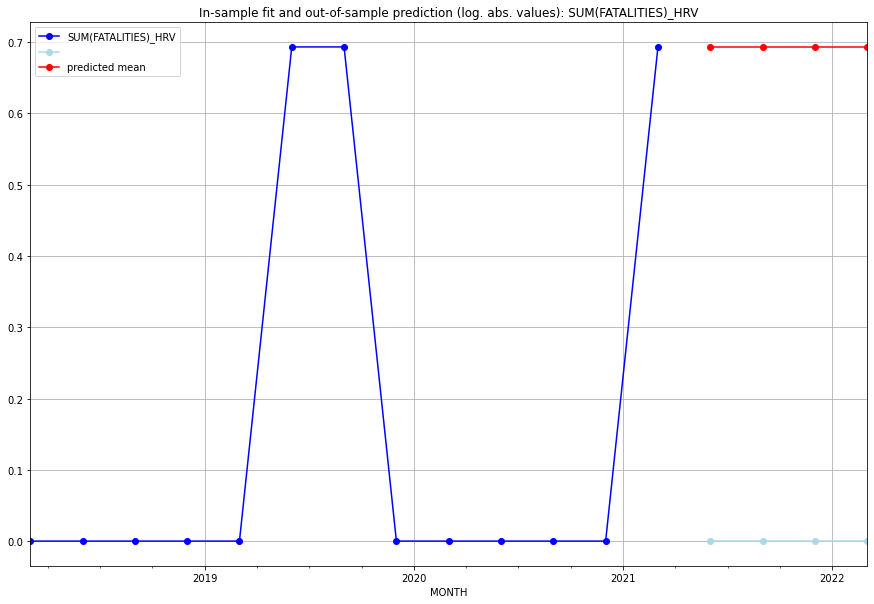

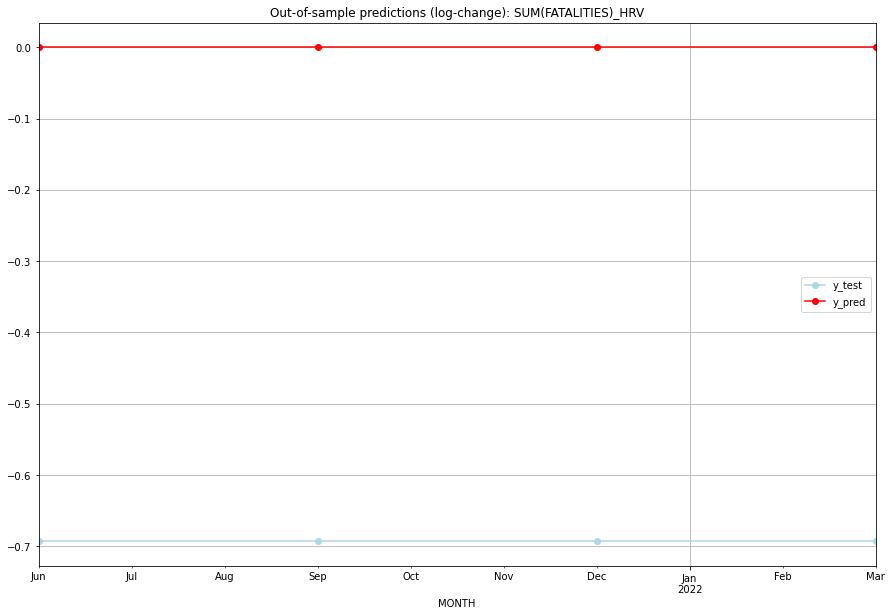

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147         0.0           0.0       -0.693147
1  2021-07  0.693147         0.0           0.0       -0.693147
2  2021-10  0.693147         0.0           0.0       -0.693147
3  2022-01  0.693147         0.0           0.0       -0.693147
TADDA: 0.6931471805599453
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147         0.0           0.0       -0.693147   HRV
1 2021-07-01  0.693147         0.0           0.0       -0.693147   HRV
2 2021-10-01  0.693147         0.0           0.0       -0.693147   HRV
3 2022-01-01  0.693147         0.0           0.0       -0.693147   HRV
Execution time: 00:01
######## HTI (96/234) #########
0
Neighbor countries: []
Getting Data for HTI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH      

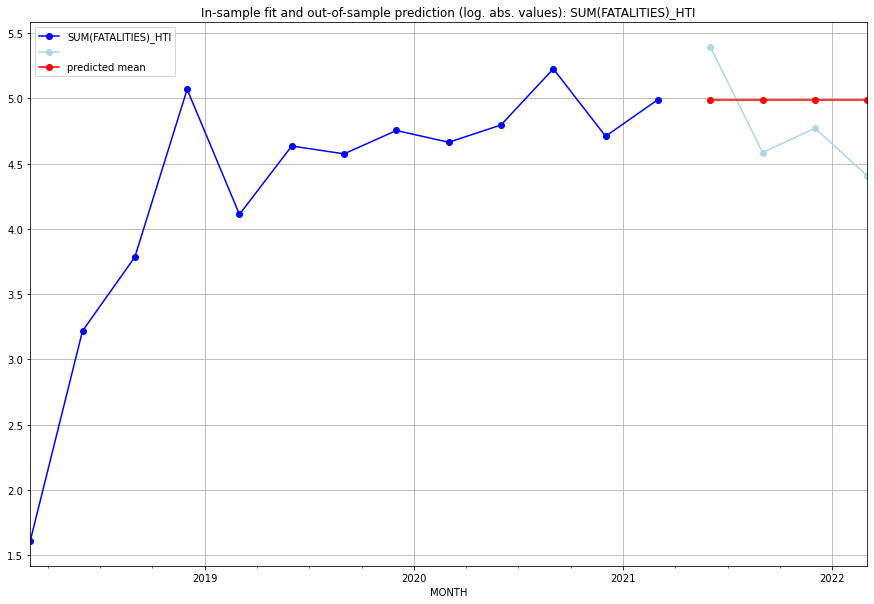

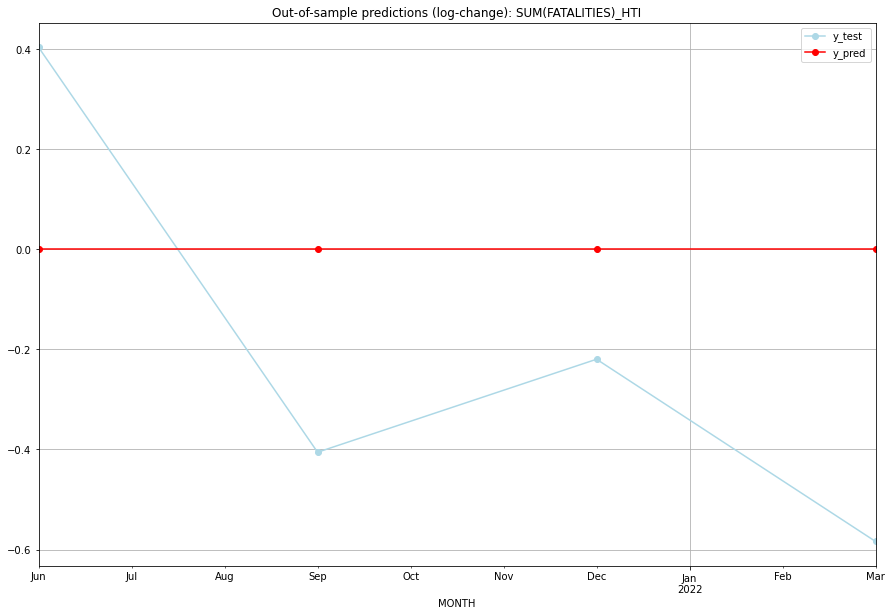

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.990433    5.393628           0.0        0.403195
1  2021-07  4.990433    4.584967           0.0       -0.405465
2  2021-10  4.990433    4.770685           0.0       -0.219748
3  2022-01  4.990433    4.406719           0.0       -0.583713
TADDA: 0.4030303423773358
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.990433    5.393628           0.0        0.403195   HTI
1 2021-07-01  4.990433    4.584967           0.0       -0.405465   HTI
2 2021-10-01  4.990433    4.770685           0.0       -0.219748   HTI
3 2022-01-01  4.990433    4.406719           0.0       -0.583713   HTI
Execution time: 00:01
######## HUN (97/234) #########
0
Neighbor countries: []
Getting Data for HUN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-

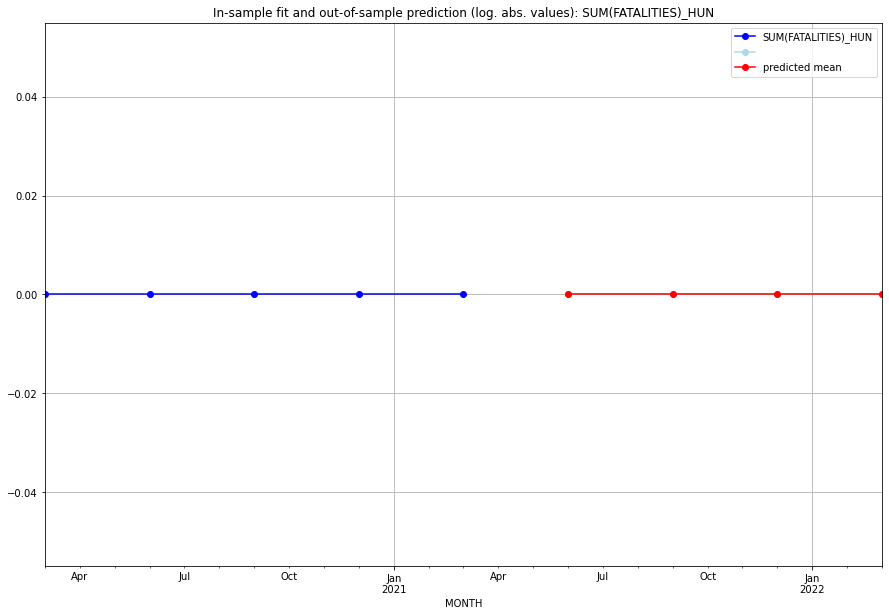

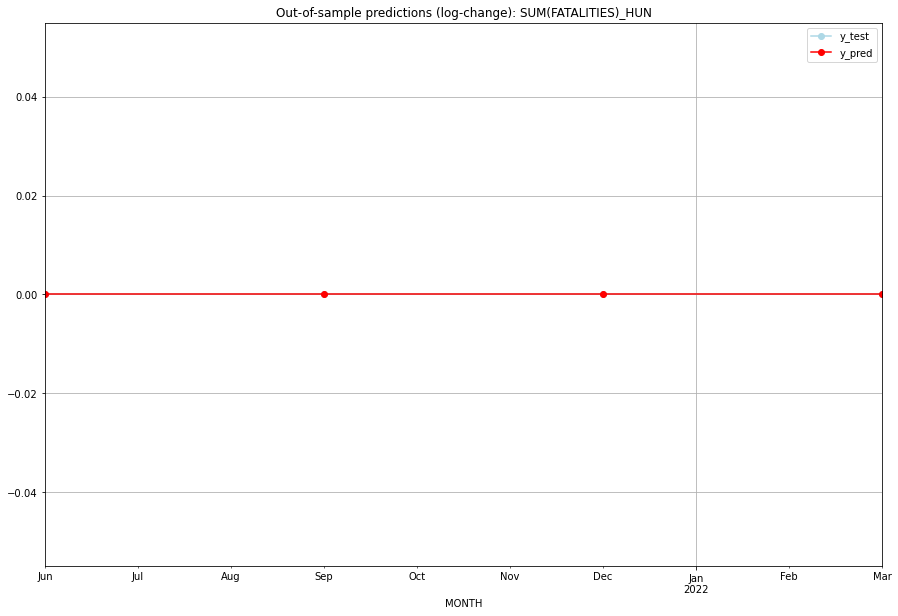

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   HUN
1 2021-07-01       0.0         0.0           0.0             0.0   HUN
2 2021-10-01       0.0         0.0           0.0             0.0   HUN
3 2022-01-01       0.0         0.0           0.0             0.0   HUN
Execution time: 00:01
######## IDN (98/234) #########
0
Neighbor countries: []
Getting Data for IDN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (29, 0)
y: (29, 1)
------------------------------------------------
               0
MONTH           
2021-04  3

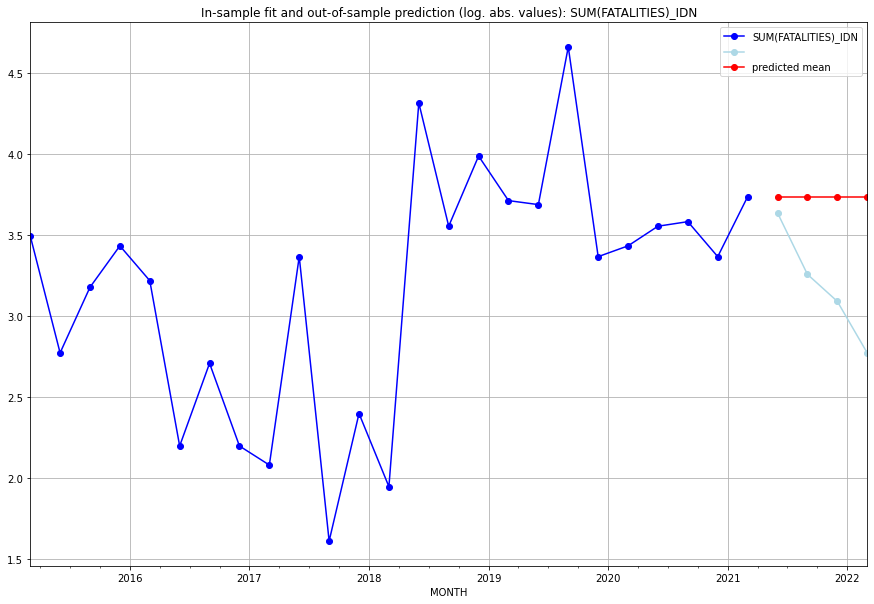

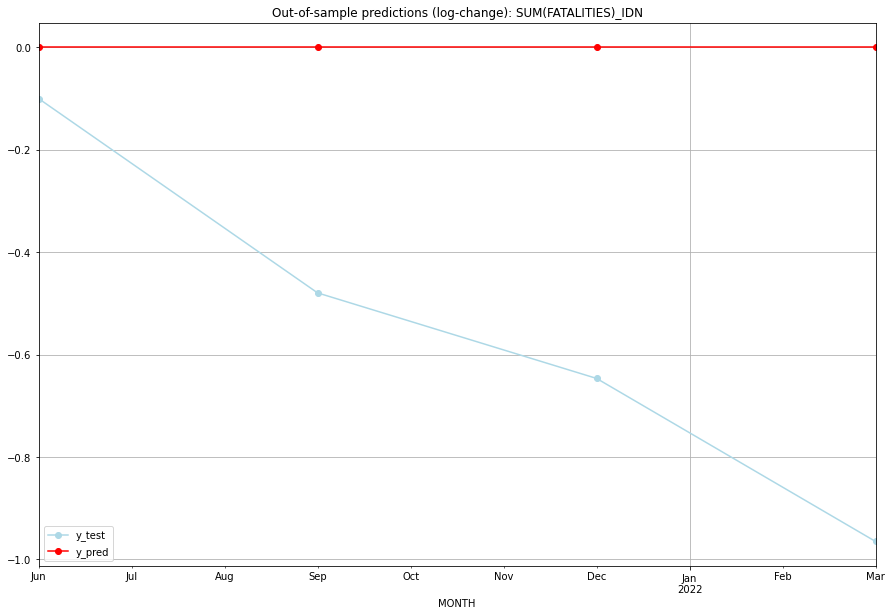

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04   3.73767    3.637586           0.0       -0.100083
1  2021-07   3.73767    3.258097           0.0       -0.479573
2  2021-10   3.73767    3.091042           0.0       -0.646627
3  2022-01   3.73767    2.772589           0.0       -0.965081
TADDA: 0.5478411499468767
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01   3.73767    3.637586           0.0       -0.100083   IDN
1 2021-07-01   3.73767    3.258097           0.0       -0.479573   IDN
2 2021-10-01   3.73767    3.091042           0.0       -0.646627   IDN
3 2022-01-01   3.73767    2.772589           0.0       -0.965081   IDN
Execution time: 00:01
######## IMN (99/234) #########
0
Neighbor countries: []
Getting Data for IMN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

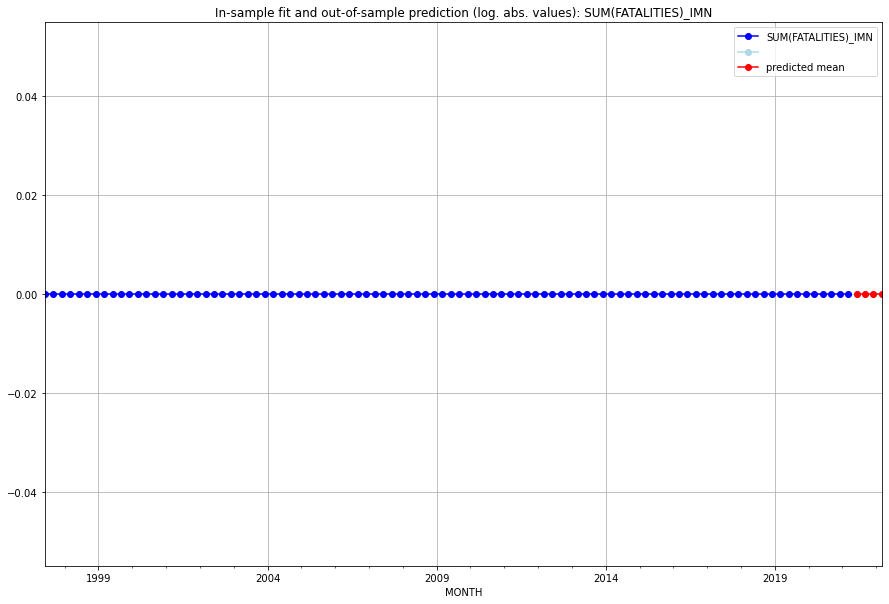

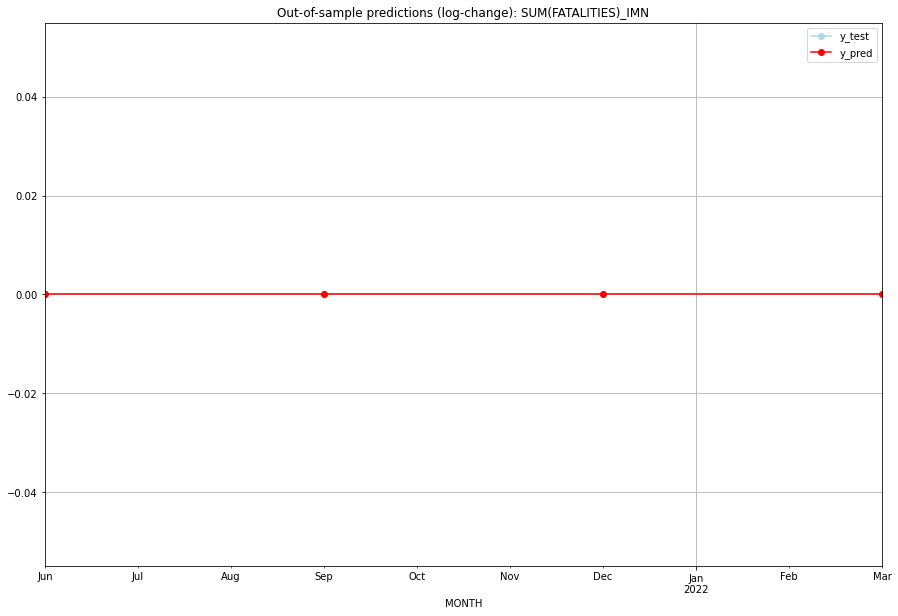

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   IMN
1 2021-07-01       0.0         0.0           0.0             0.0   IMN
2 2021-10-01       0.0         0.0           0.0             0.0   IMN
3 2022-01-01       0.0         0.0           0.0             0.0   IMN
Execution time: 00:01
######## IND (100/234) #########
0
Neighbor countries: []
Getting Data for IND
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH            
2021-04

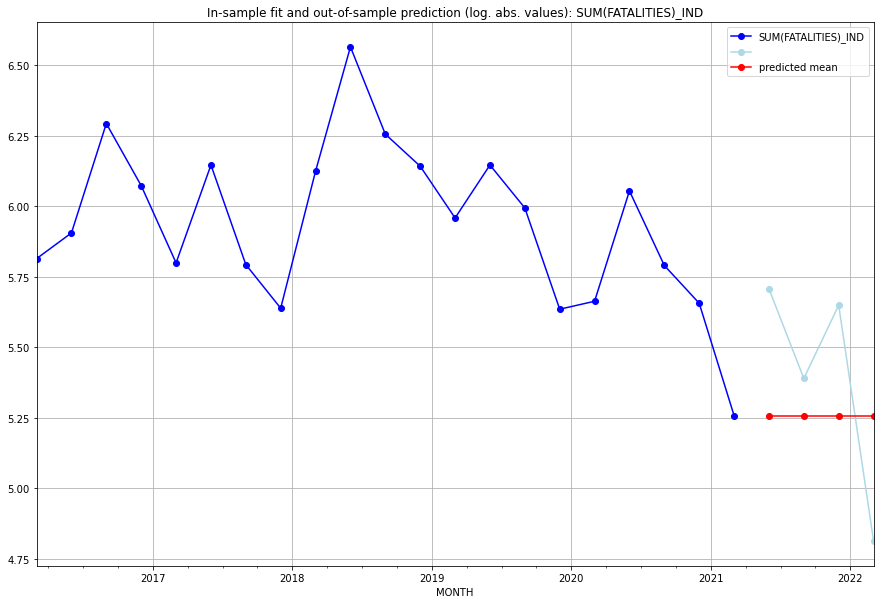

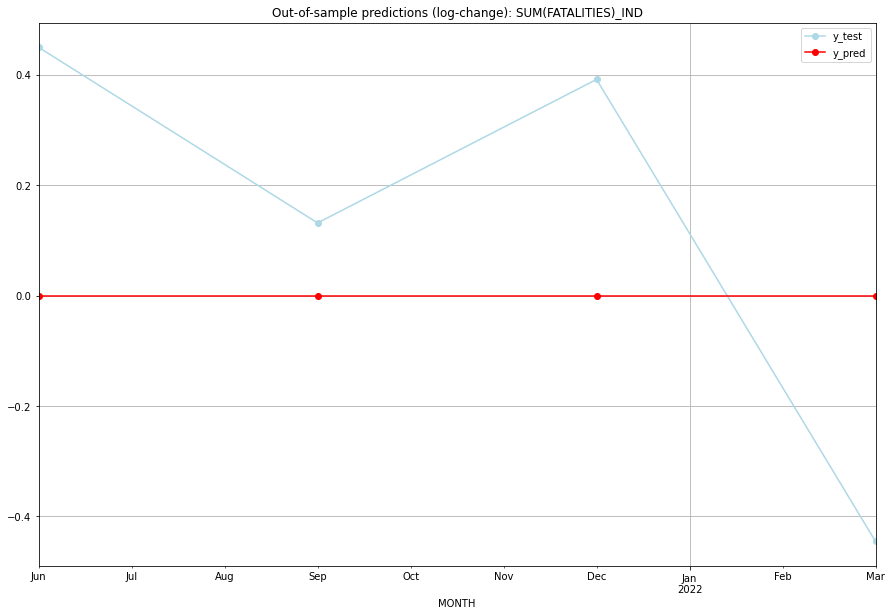

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.257495    5.707110           0.0        0.449615
1  2021-07  5.257495    5.389072           0.0        0.131576
2  2021-10  5.257495    5.648974           0.0        0.391479
3  2022-01  5.257495    4.812184           0.0       -0.445311
TADDA: 0.35449528332465063
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.257495    5.707110           0.0        0.449615   IND
1 2021-07-01  5.257495    5.389072           0.0        0.131576   IND
2 2021-10-01  5.257495    5.648974           0.0        0.391479   IND
3 2022-01-01  5.257495    4.812184           0.0       -0.445311   IND
Execution time: 00:01
######## IRL (101/234) #########
0
Neighbor countries: []
Getting Data for IRL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
202

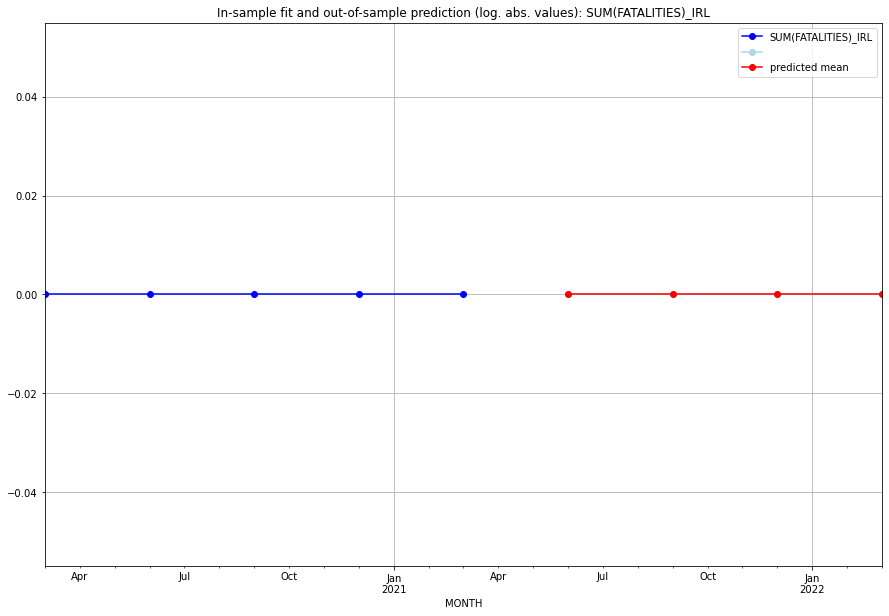

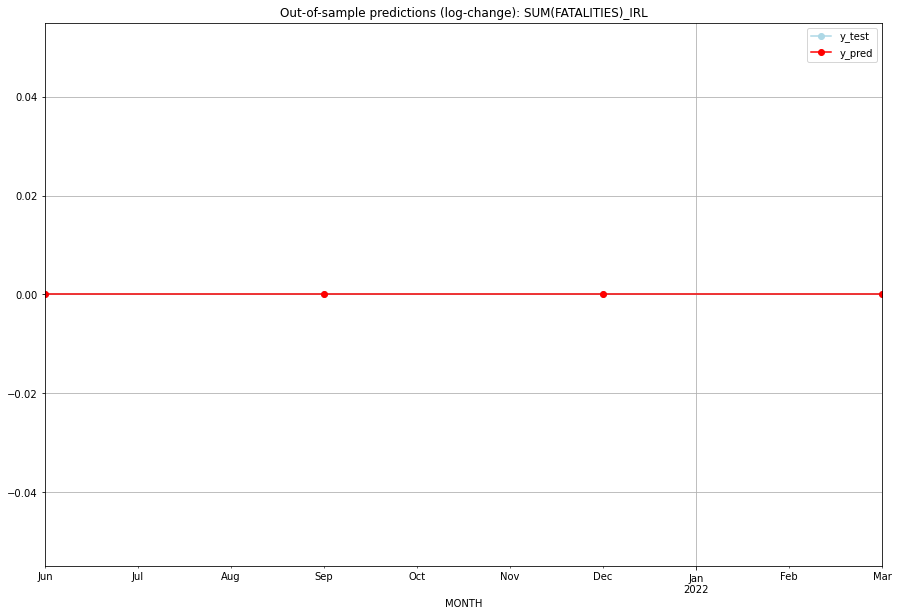

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   IRL
1 2021-07-01       0.0         0.0           0.0             0.0   IRL
2 2021-10-01       0.0         0.0           0.0             0.0   IRL
3 2022-01-01       0.0         0.0           0.0             0.0   IRL
Execution time: 00:01
######## IRN (102/234) #########
0
Neighbor countries: []
Getting Data for IRN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH            
2021-04

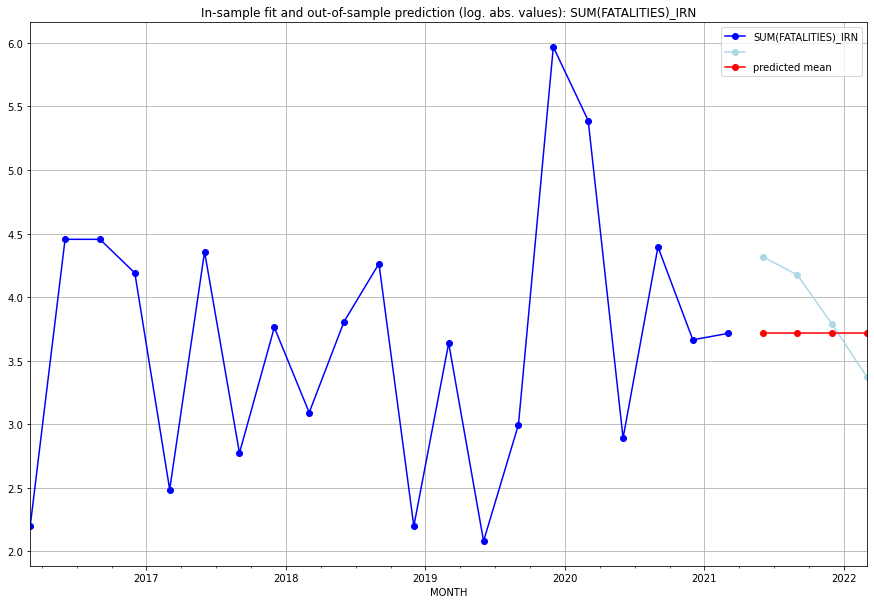

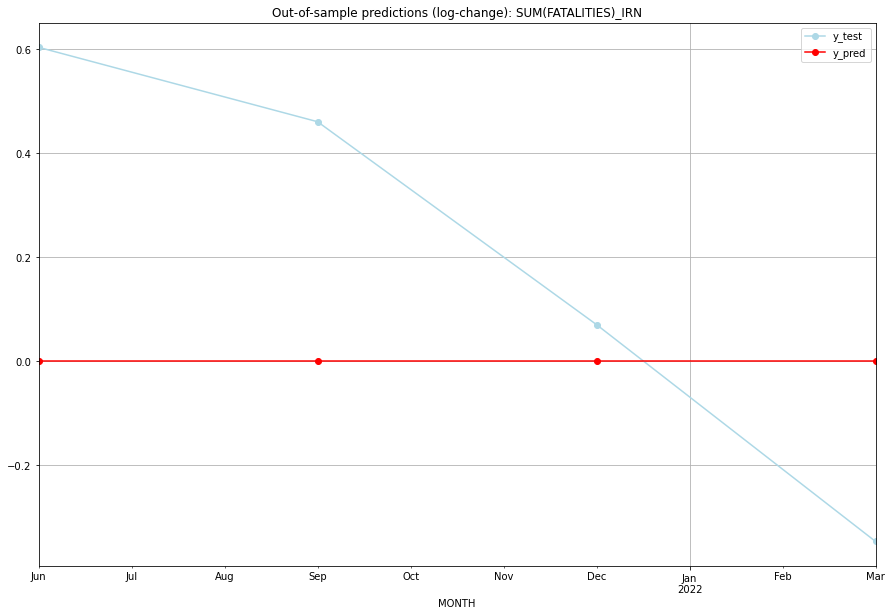

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.713572    4.317488           0.0        0.603916
1  2021-07  3.713572    4.174387           0.0        0.460815
2  2021-10  3.713572    3.784190           0.0        0.070618
3  2022-01  3.713572    3.367296           0.0       -0.346276
TADDA: 0.3704062634887795
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.713572    4.317488           0.0        0.603916   IRN
1 2021-07-01  3.713572    4.174387           0.0        0.460815   IRN
2 2021-10-01  3.713572    3.784190           0.0        0.070618   IRN
3 2022-01-01  3.713572    3.367296           0.0       -0.346276   IRN
Execution time: 00:01
######## IRQ (103/234) #########
0
Neighbor countries: []
Getting Data for IRQ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH     

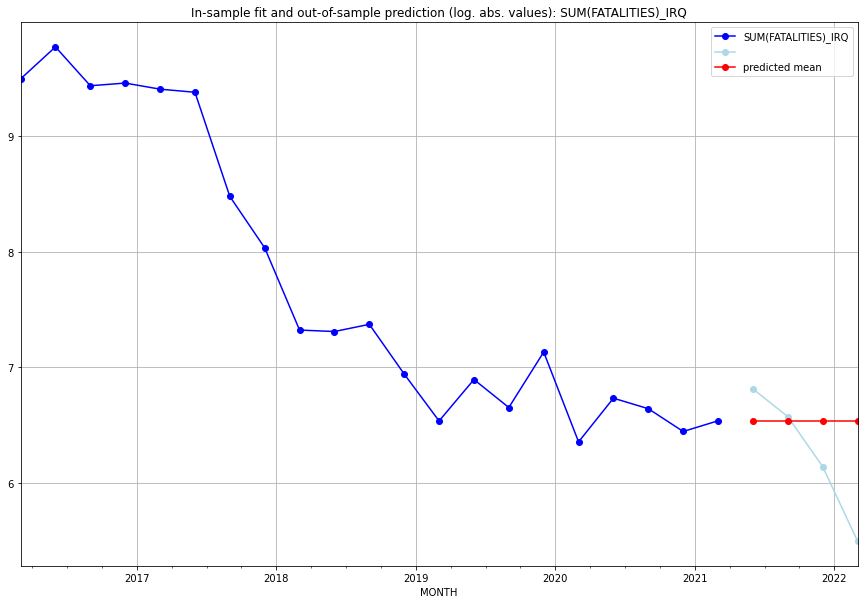

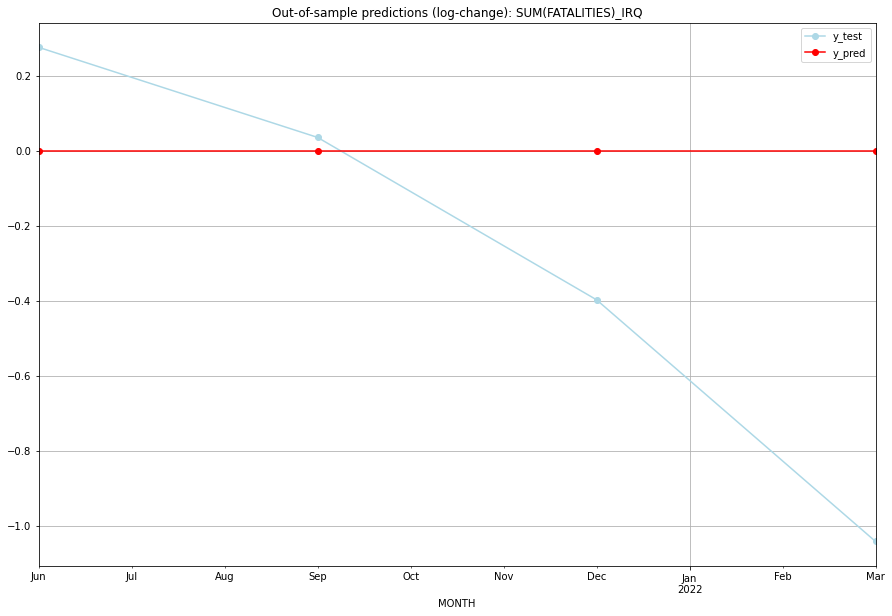

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.535241    6.811244           0.0        0.276003
1  2021-07  6.535241    6.570883           0.0        0.035642
2  2021-10  6.535241    6.137727           0.0       -0.397514
3  2022-01  6.535241    5.493061           0.0       -1.042180
TADDA: 0.4378347108785239
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.535241    6.811244           0.0        0.276003   IRQ
1 2021-07-01  6.535241    6.570883           0.0        0.035642   IRQ
2 2021-10-01  6.535241    6.137727           0.0       -0.397514   IRQ
3 2022-01-01  6.535241    5.493061           0.0       -1.042180   IRQ
Execution time: 00:01
######## ISL (104/234) #########
0
Neighbor countries: []
Getting Data for ISL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

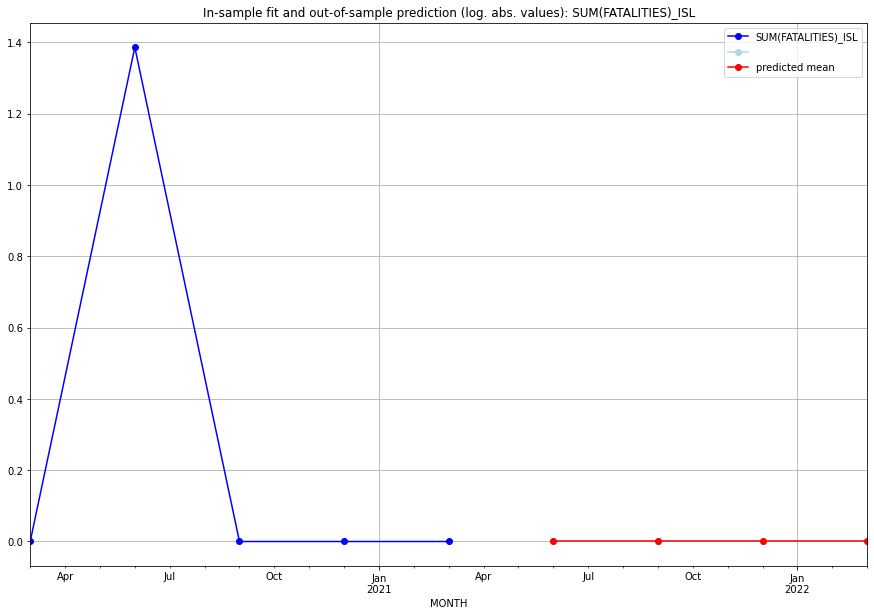

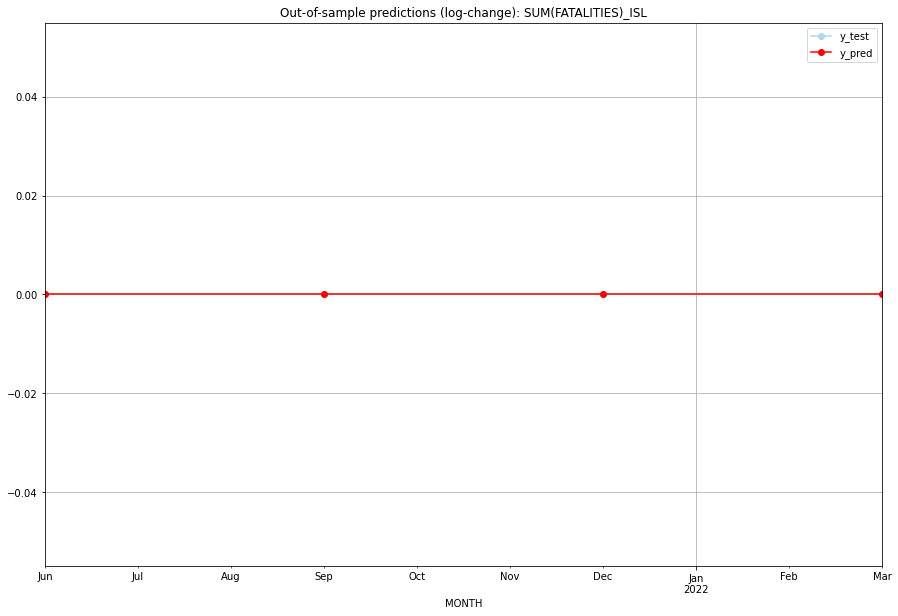

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ISL
1 2021-07-01       0.0         0.0           0.0             0.0   ISL
2 2021-10-01       0.0         0.0           0.0             0.0   ISL
3 2022-01-01       0.0         0.0           0.0             0.0   ISL
Execution time: 00:01
######## ISR (105/234) #########
0
Neighbor countries: []
Getting Data for ISR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH            
2021-04

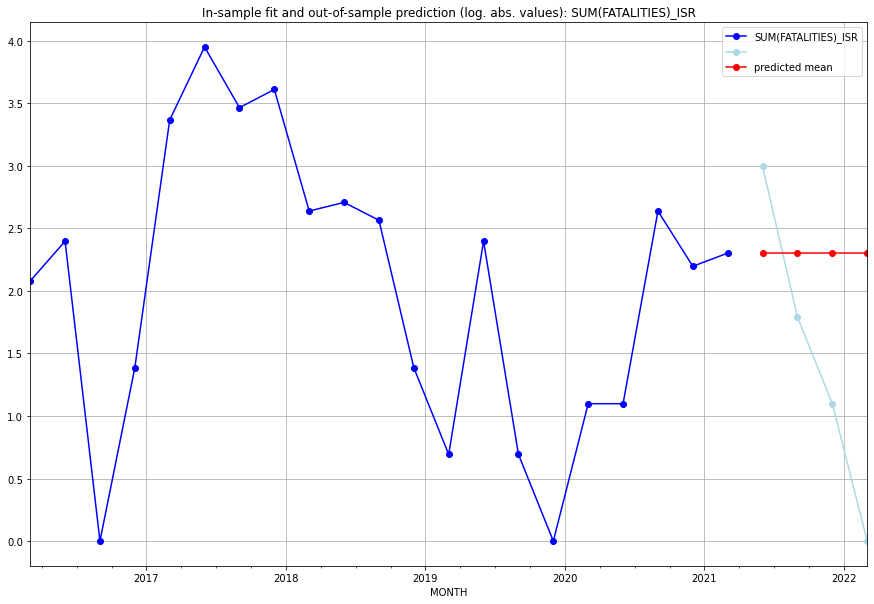

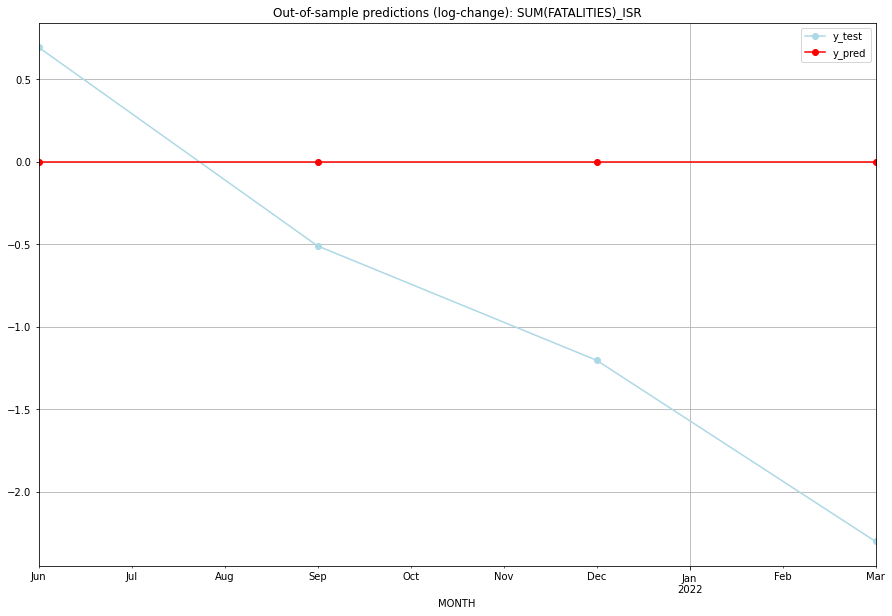

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.302585    2.995732           0.0        0.693147
1  2021-07  2.302585    1.791759           0.0       -0.510826
2  2021-10  2.302585    1.098612           0.0       -1.203973
3  2022-01  2.302585    0.000000           0.0       -2.302585
TADDA: 1.1776326754114794
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.302585    2.995732           0.0        0.693147   ISR
1 2021-07-01  2.302585    1.791759           0.0       -0.510826   ISR
2 2021-10-01  2.302585    1.098612           0.0       -1.203973   ISR
3 2022-01-01  2.302585    0.000000           0.0       -2.302585   ISR
Execution time: 00:01
######## ITA (106/234) #########
0
Neighbor countries: []
Getting Data for ITA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

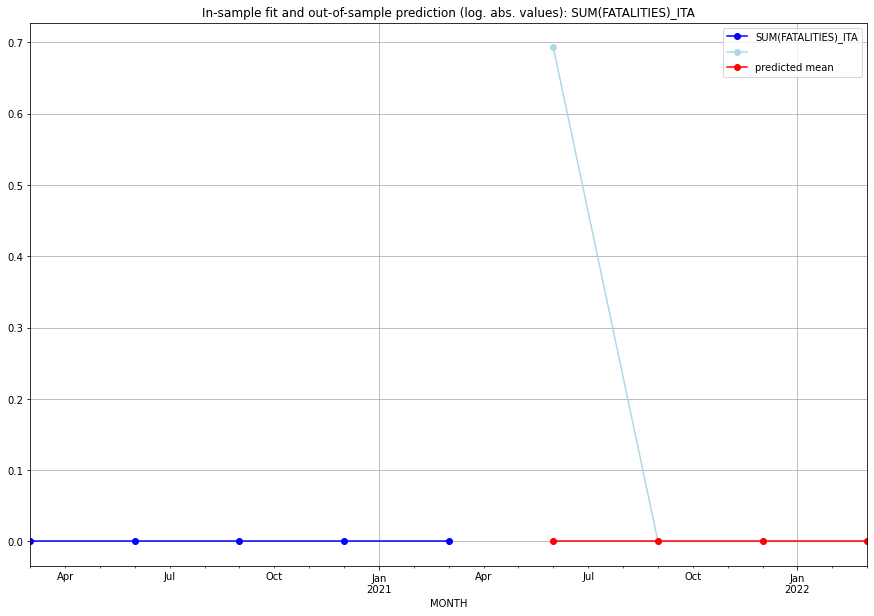

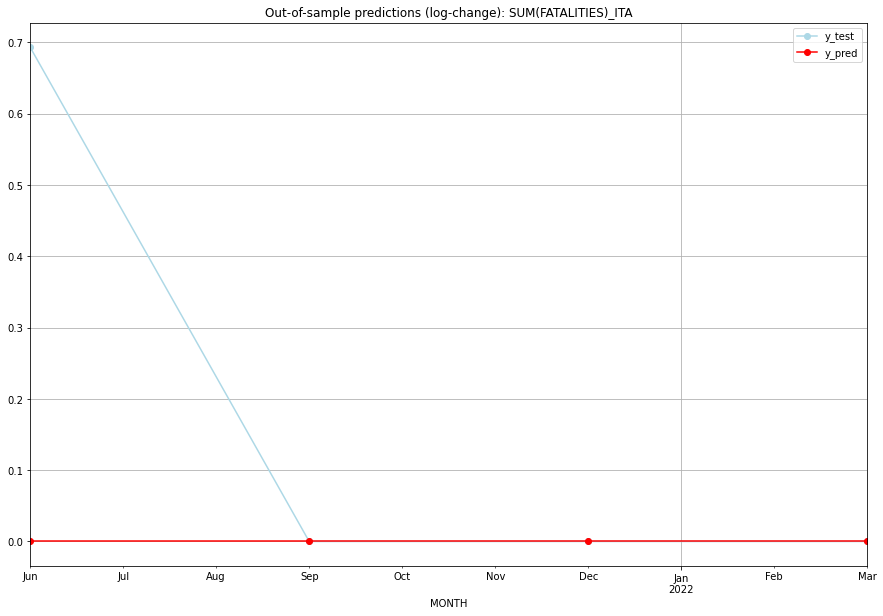

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.693147           0.0        0.693147
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.693147           0.0        0.693147   ITA
1 2021-07-01       0.0    0.000000           0.0        0.000000   ITA
2 2021-10-01       0.0    0.000000           0.0        0.000000   ITA
3 2022-01-01       0.0    0.000000           0.0        0.000000   ITA
Execution time: 00:01
######## JAM (107/234) #########
0
Neighbor countries: []
Getting Data for JAM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH    

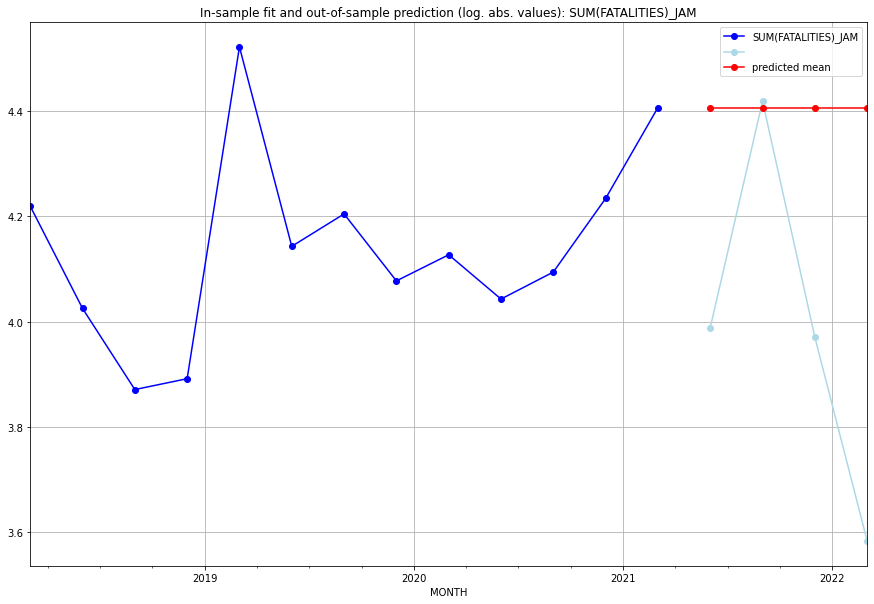

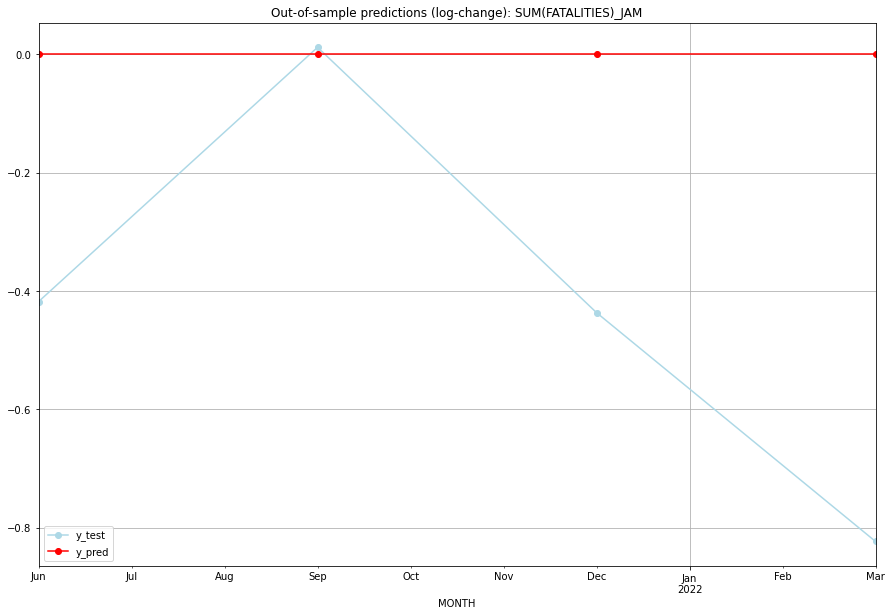

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.406719    3.988984           0.0       -0.417735
1  2021-07  4.406719    4.418841           0.0        0.012121
2  2021-10  4.406719    3.970292           0.0       -0.436427
3  2022-01  4.406719    3.583519           0.0       -0.823200
TADDA: 0.42237105093814964
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.406719    3.988984           0.0       -0.417735   JAM
1 2021-07-01  4.406719    4.418841           0.0        0.012121   JAM
2 2021-10-01  4.406719    3.970292           0.0       -0.436427   JAM
3 2022-01-01  4.406719    3.583519           0.0       -0.823200   JAM
Execution time: 00:01
######## JEY (108/234) #########
0
Neighbor countries: []
Getting Data for JEY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       

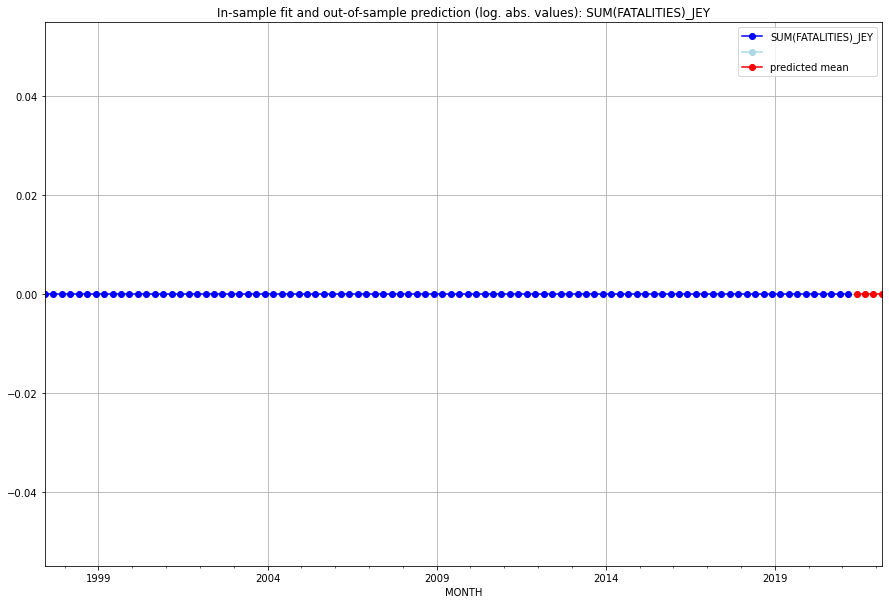

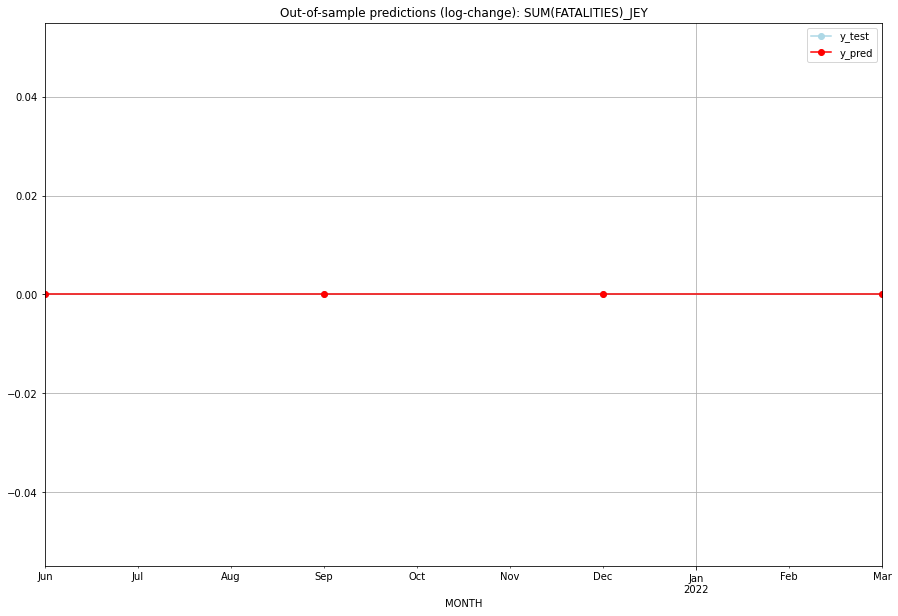

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   JEY
1 2021-07-01       0.0         0.0           0.0             0.0   JEY
2 2021-10-01       0.0         0.0           0.0             0.0   JEY
3 2022-01-01       0.0         0.0           0.0             0.0   JEY
Execution time: 00:01
######## JOR (109/234) #########
0
Neighbor countries: []
Getting Data for JOR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

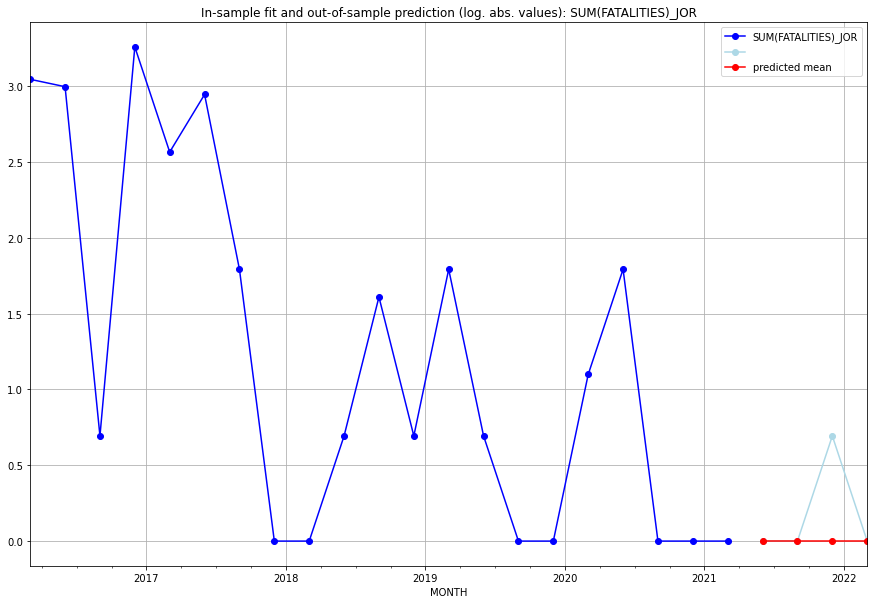

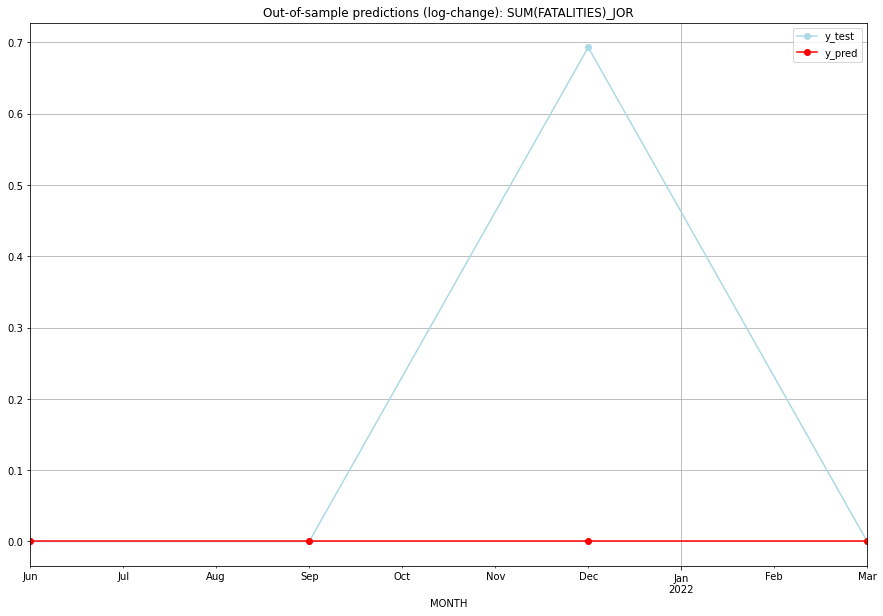

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.693147           0.0        0.693147
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   JOR
1 2021-07-01       0.0    0.000000           0.0        0.000000   JOR
2 2021-10-01       0.0    0.693147           0.0        0.693147   JOR
3 2022-01-01       0.0    0.000000           0.0        0.000000   JOR
Execution time: 00:01
######## JPN (110/234) #########
0
Neighbor countries: []
Getting Data for JPN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2

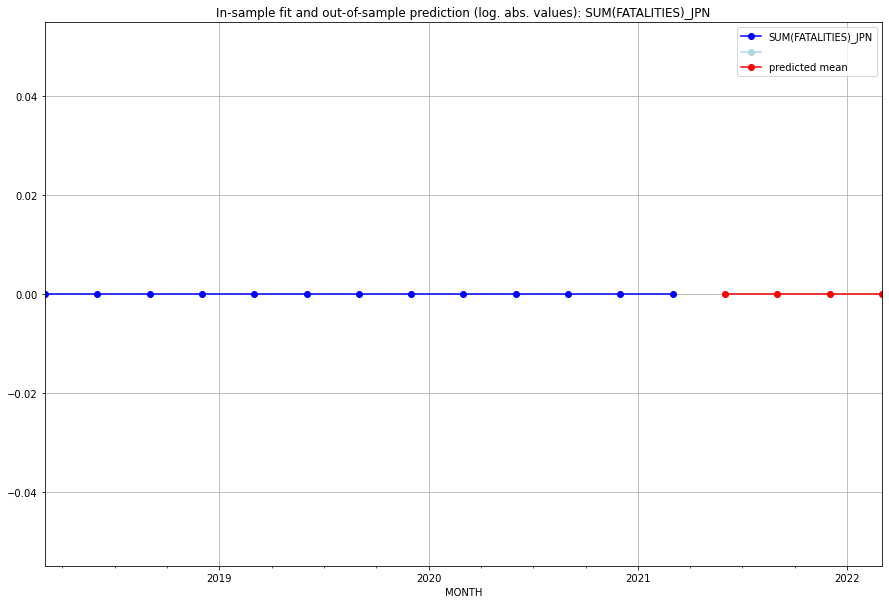

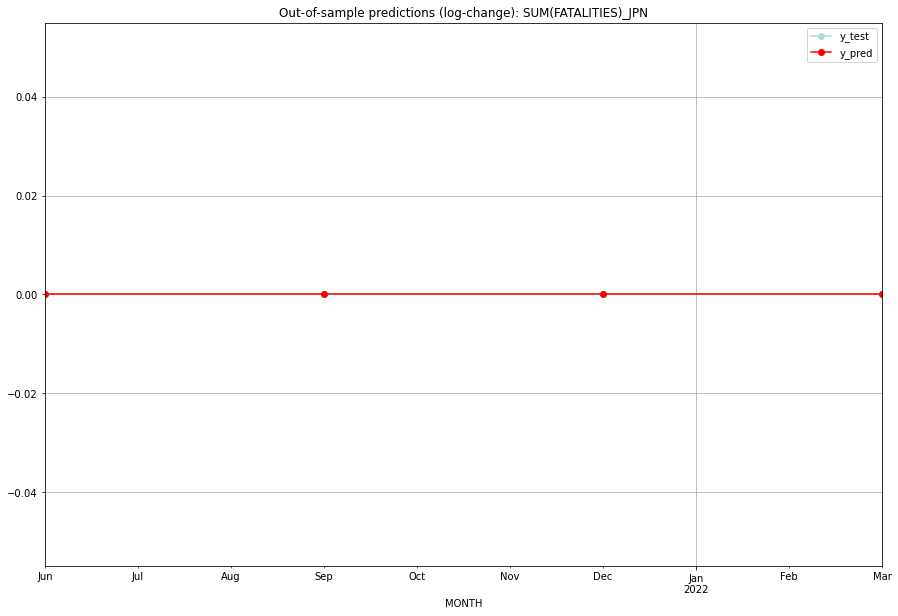

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   JPN
1 2021-07-01       0.0         0.0           0.0             0.0   JPN
2 2021-10-01       0.0         0.0           0.0             0.0   JPN
3 2022-01-01       0.0         0.0           0.0             0.0   JPN
Execution time: 00:01
######## KAZ (111/234) #########
0
Neighbor countries: []
Getting Data for KAZ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

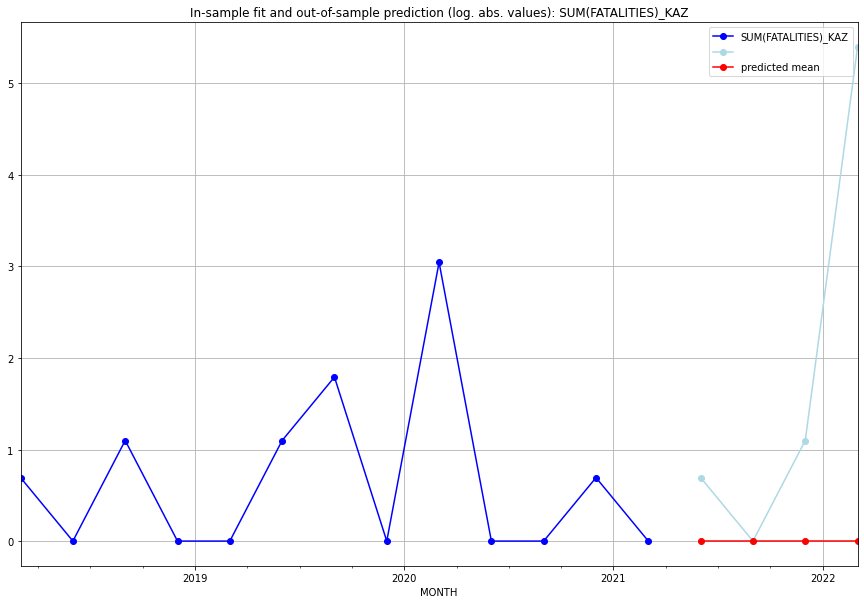

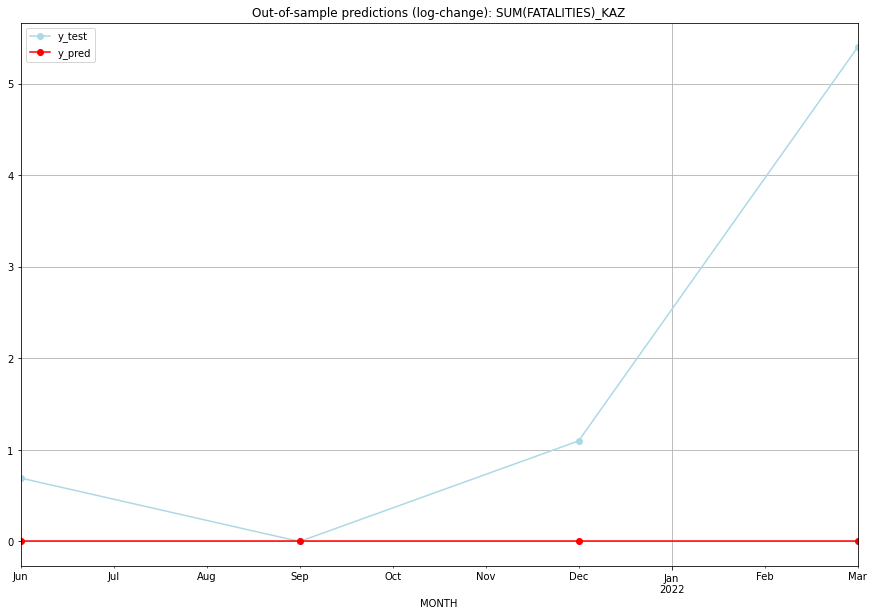

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.693147           0.0        0.693147
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    1.098612           0.0        1.098612
3  2022-01       0.0    5.398163           0.0        5.398163
TADDA: 1.797480542686452
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.693147           0.0        0.693147   KAZ
1 2021-07-01       0.0    0.000000           0.0        0.000000   KAZ
2 2021-10-01       0.0    1.098612           0.0        1.098612   KAZ
3 2022-01-01       0.0    5.398163           0.0        5.398163   KAZ
Execution time: 00:01
######## KEN (112/234) #########
0
Neighbor countries: []
Getting Data for KEN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

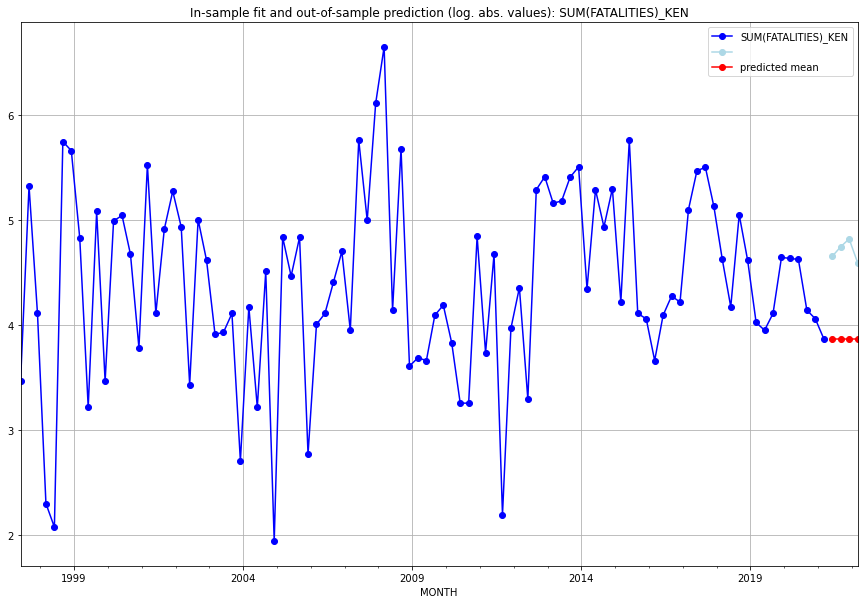

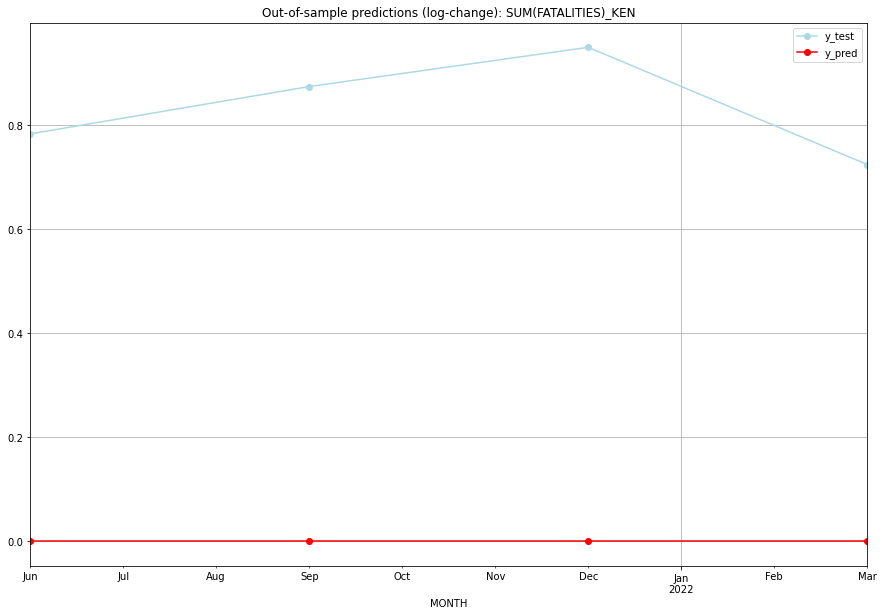

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.871201    4.653960           0.0        0.782759
1  2021-07  3.871201    4.744932           0.0        0.873731
2  2021-10  3.871201    4.820282           0.0        0.949081
3  2022-01  3.871201    4.595120           0.0        0.723919
TADDA: 0.8323724626572089
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.871201    4.653960           0.0        0.782759   KEN
1 2021-07-01  3.871201    4.744932           0.0        0.873731   KEN
2 2021-10-01  3.871201    4.820282           0.0        0.949081   KEN
3 2022-01-01  3.871201    4.595120           0.0        0.723919   KEN
Execution time: 00:01
######## KGZ (113/234) #########
0
Neighbor countries: []
Getting Data for KGZ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

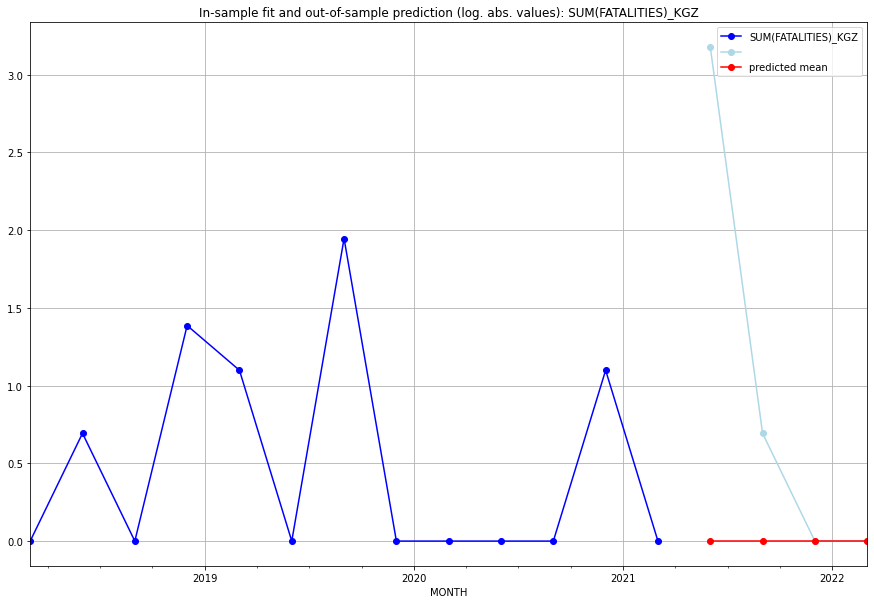

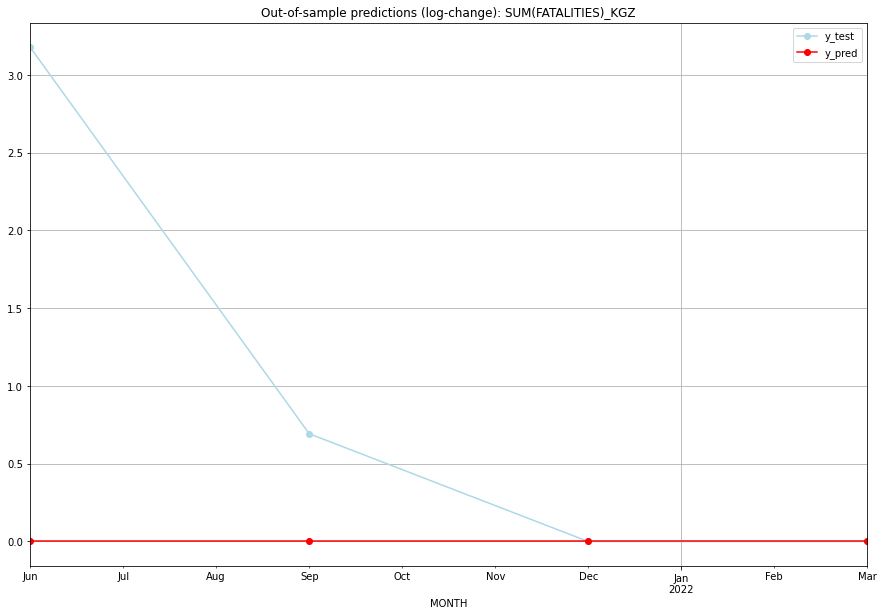

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    3.178054           0.0        3.178054
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.9678002527269728
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    3.178054           0.0        3.178054   KGZ
1 2021-07-01       0.0    0.693147           0.0        0.693147   KGZ
2 2021-10-01       0.0    0.000000           0.0        0.000000   KGZ
3 2022-01-01       0.0    0.000000           0.0        0.000000   KGZ
Execution time: 00:01
######## KHM (114/234) #########
0
Neighbor countries: []
Getting Data for KHM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
           0
MONTH       
20

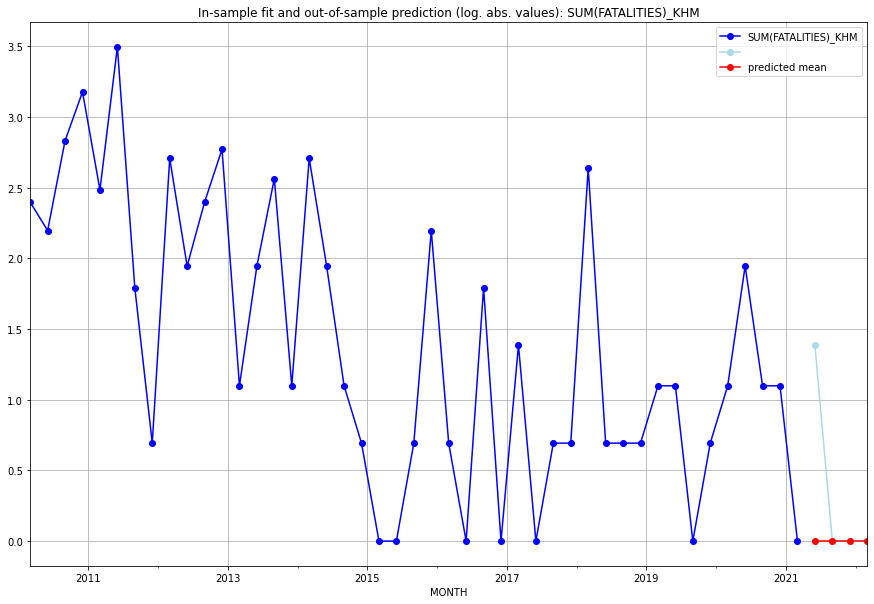

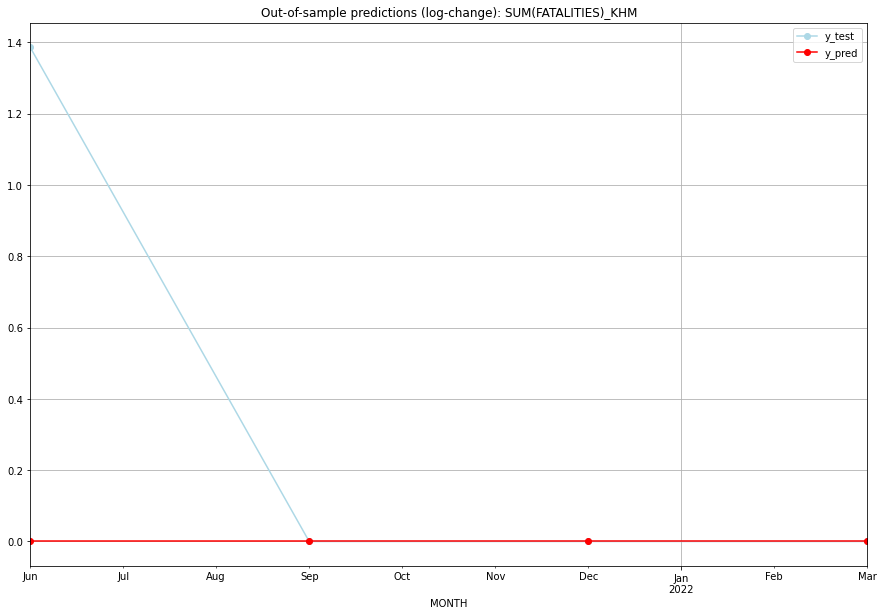

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.386294           0.0        1.386294
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.34657359027997264
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.386294           0.0        1.386294   KHM
1 2021-07-01       0.0    0.000000           0.0        0.000000   KHM
2 2021-10-01       0.0    0.000000           0.0        0.000000   KHM
3 2022-01-01       0.0    0.000000           0.0        0.000000   KHM
Execution time: 00:01
######## KNA (115/234) #########
0
Neighbor countries: []
Getting Data for KNA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2

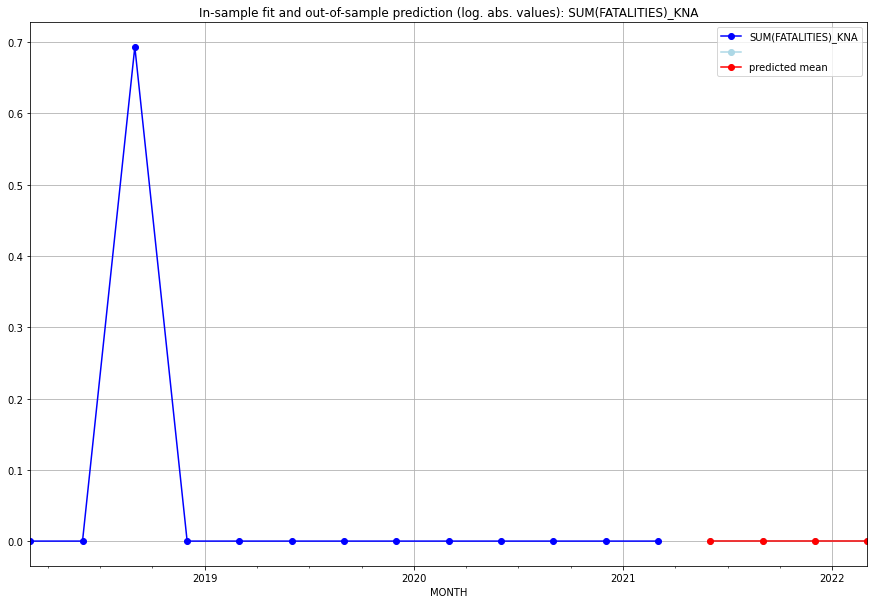

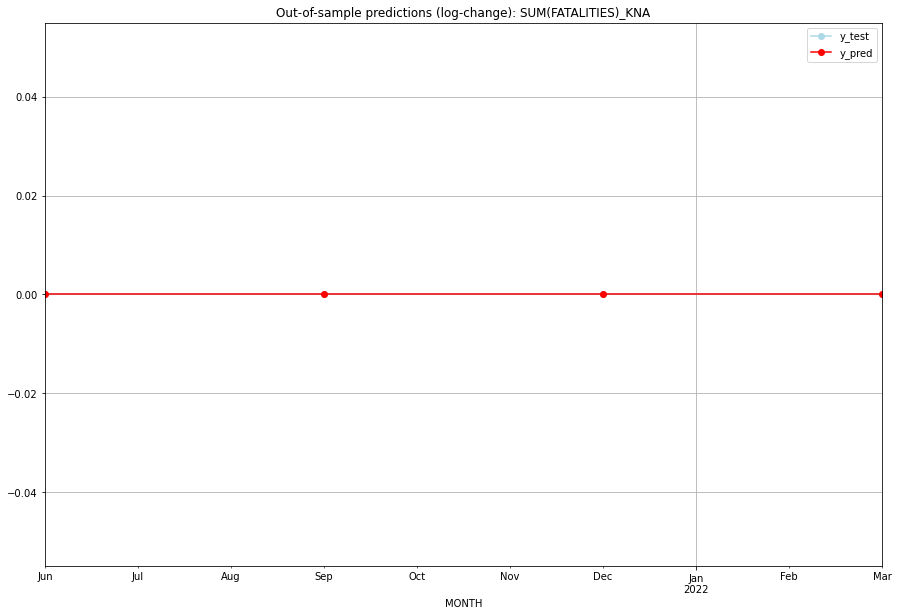

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   KNA
1 2021-07-01       0.0         0.0           0.0             0.0   KNA
2 2021-10-01       0.0         0.0           0.0             0.0   KNA
3 2022-01-01       0.0         0.0           0.0             0.0   KNA
Execution time: 00:01
######## KOR (116/234) #########
0
Neighbor countries: []
Getting Data for KOR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

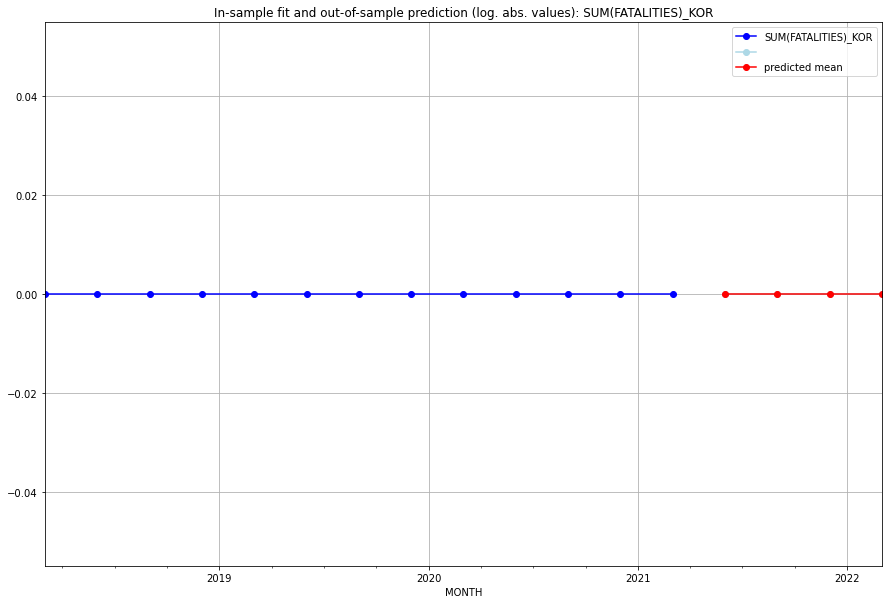

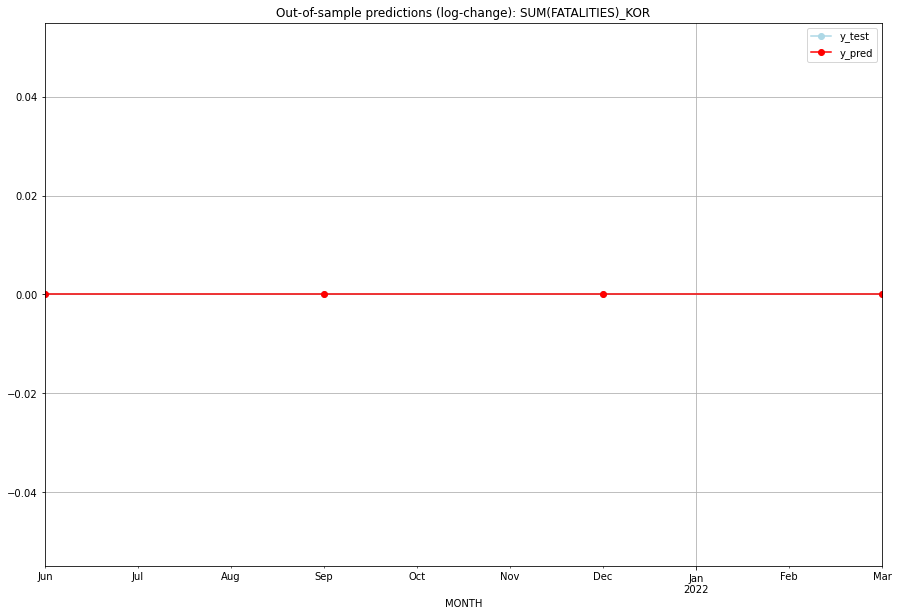

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   KOR
1 2021-07-01       0.0         0.0           0.0             0.0   KOR
2 2021-10-01       0.0         0.0           0.0             0.0   KOR
3 2022-01-01       0.0         0.0           0.0             0.0   KOR
Execution time: 00:01
######## KWT (117/234) #########
0
Neighbor countries: []
Getting Data for KWT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

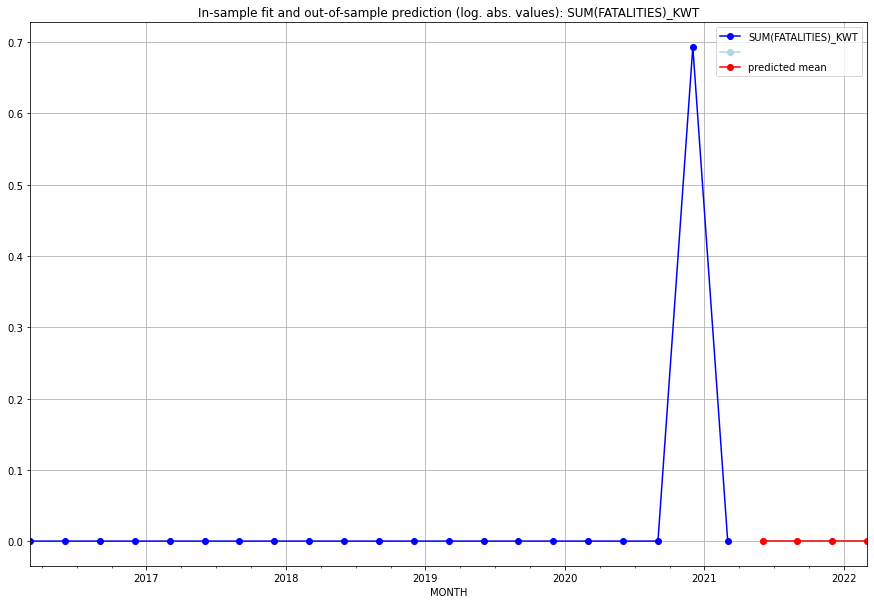

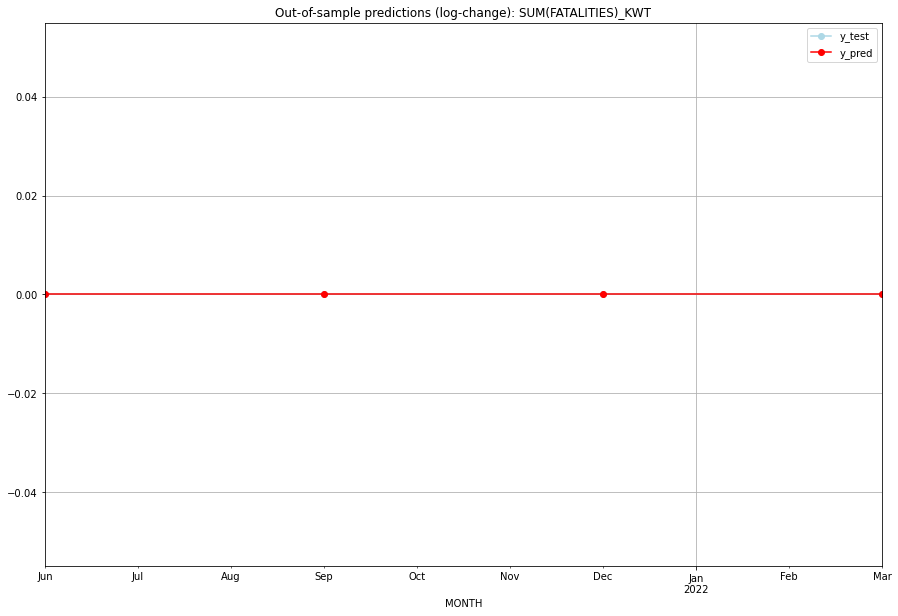

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   KWT
1 2021-07-01       0.0         0.0           0.0             0.0   KWT
2 2021-10-01       0.0         0.0           0.0             0.0   KWT
3 2022-01-01       0.0         0.0           0.0             0.0   KWT
Execution time: 00:01
######## LAO (118/234) #########
0
Neighbor countries: []
Getting Data for LAO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH            
2021-04

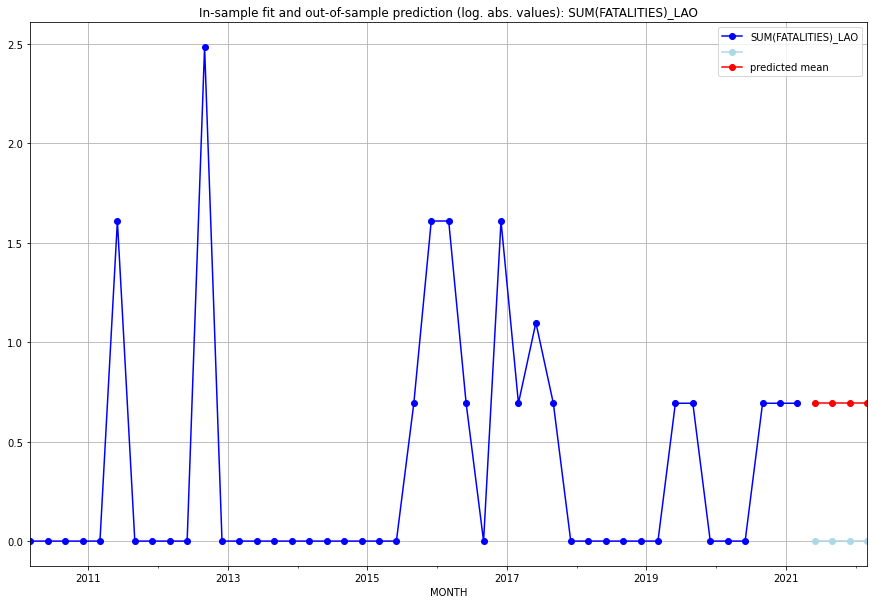

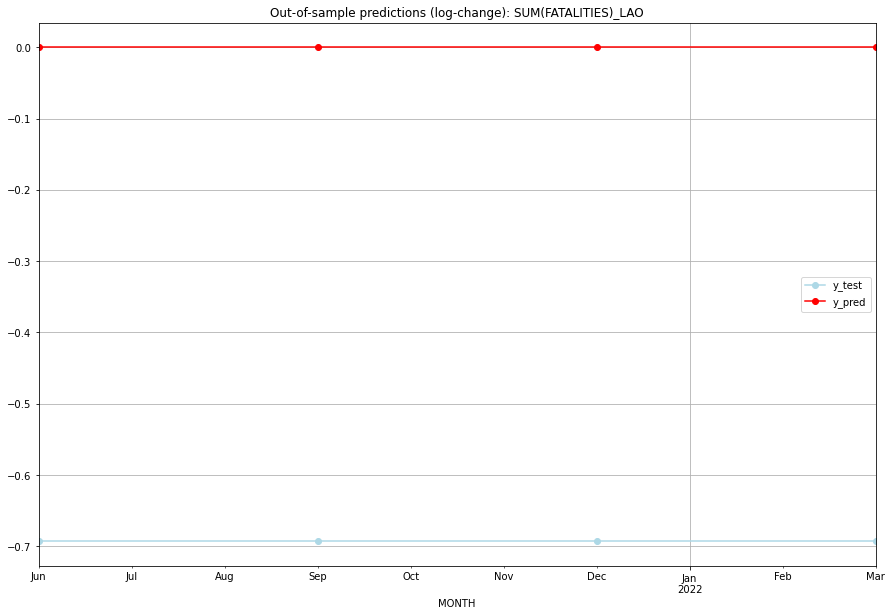

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147         0.0           0.0       -0.693147
1  2021-07  0.693147         0.0           0.0       -0.693147
2  2021-10  0.693147         0.0           0.0       -0.693147
3  2022-01  0.693147         0.0           0.0       -0.693147
TADDA: 0.6931471805599453
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147         0.0           0.0       -0.693147   LAO
1 2021-07-01  0.693147         0.0           0.0       -0.693147   LAO
2 2021-10-01  0.693147         0.0           0.0       -0.693147   LAO
3 2022-01-01  0.693147         0.0           0.0       -0.693147   LAO
Execution time: 00:01
######## LBN (119/234) #########
0
Neighbor countries: []
Getting Data for LBN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH     

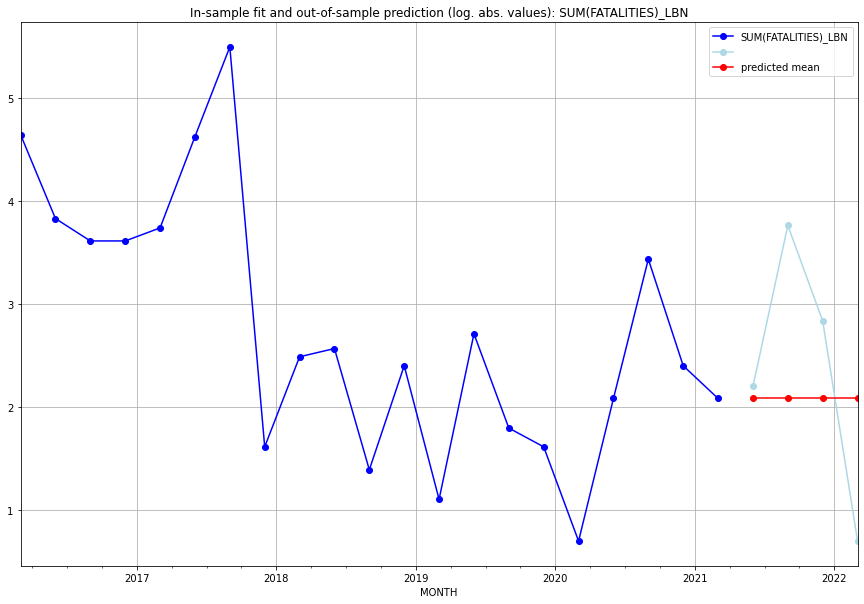

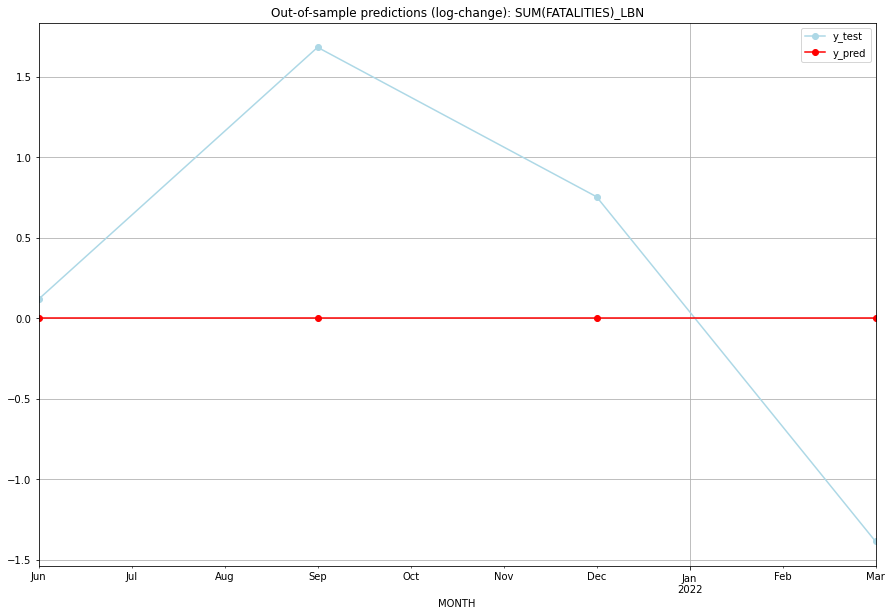

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.079442    2.197225           0.0        0.117783
1  2021-07  2.079442    3.761200           0.0        1.681759
2  2021-10  2.079442    2.833213           0.0        0.753772
3  2022-01  2.079442    0.693147           0.0       -1.386294
TADDA: 0.984901943291595
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.079442    2.197225           0.0        0.117783   LBN
1 2021-07-01  2.079442    3.761200           0.0        1.681759   LBN
2 2021-10-01  2.079442    2.833213           0.0        0.753772   LBN
3 2022-01-01  2.079442    0.693147           0.0       -1.386294   LBN
Execution time: 00:01
######## LBR (120/234) #########
0
Neighbor countries: []
Getting Data for LBR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2

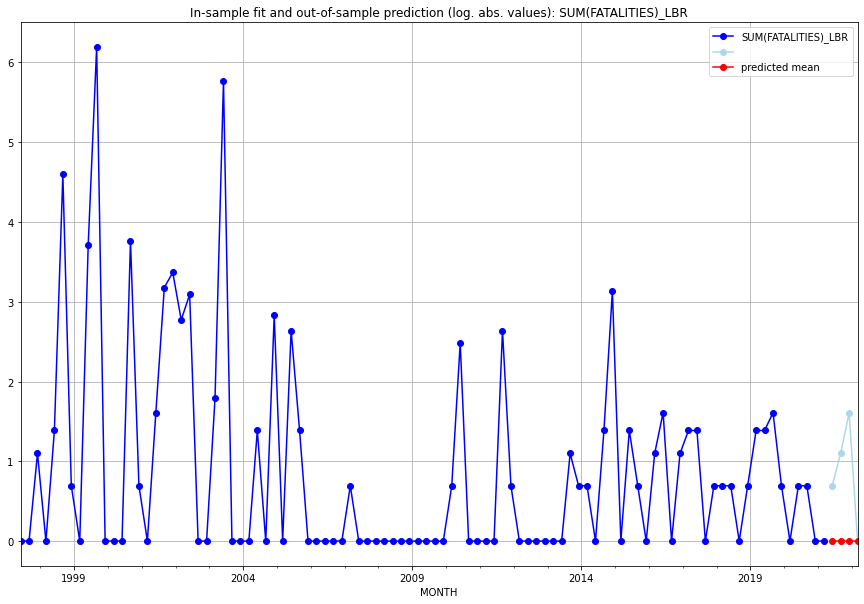

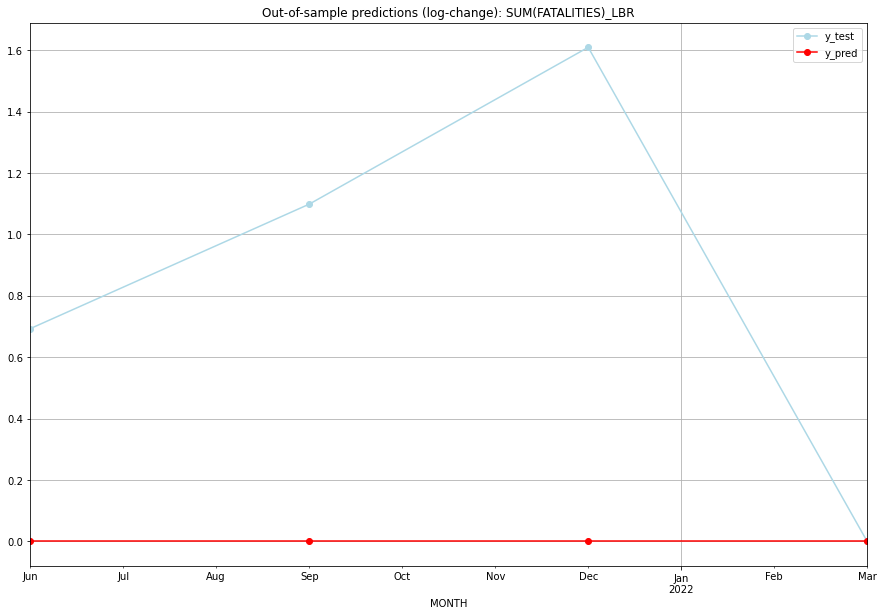

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.693147           0.0        0.693147
1  2021-07       0.0    1.098612           0.0        1.098612
2  2021-10       0.0    1.609438           0.0        1.609438
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.8502993454155389
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.693147           0.0        0.693147   LBR
1 2021-07-01       0.0    1.098612           0.0        1.098612   LBR
2 2021-10-01       0.0    1.609438           0.0        1.609438   LBR
3 2022-01-01       0.0    0.000000           0.0        0.000000   LBR
Execution time: 00:01
######## LBY (121/234) #########
0
Neighbor countries: []
Getting Data for LBY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

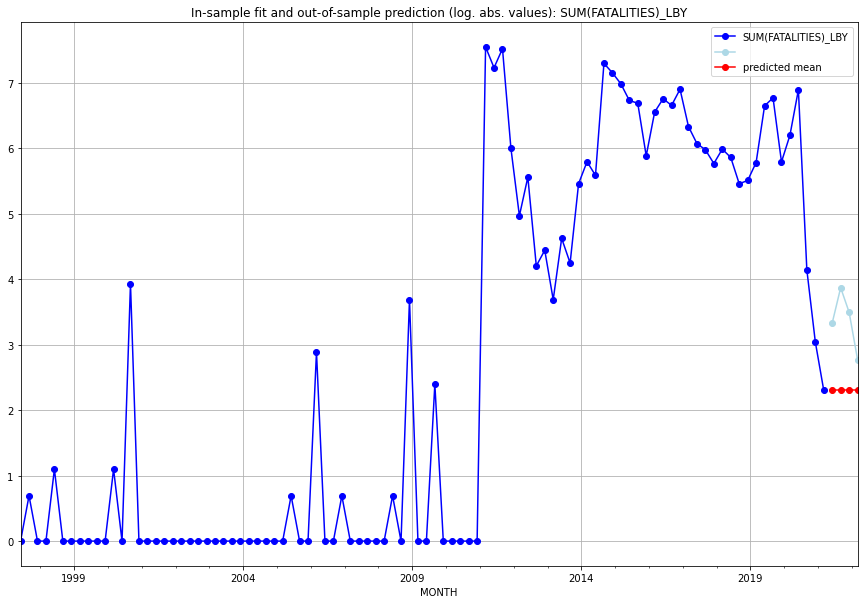

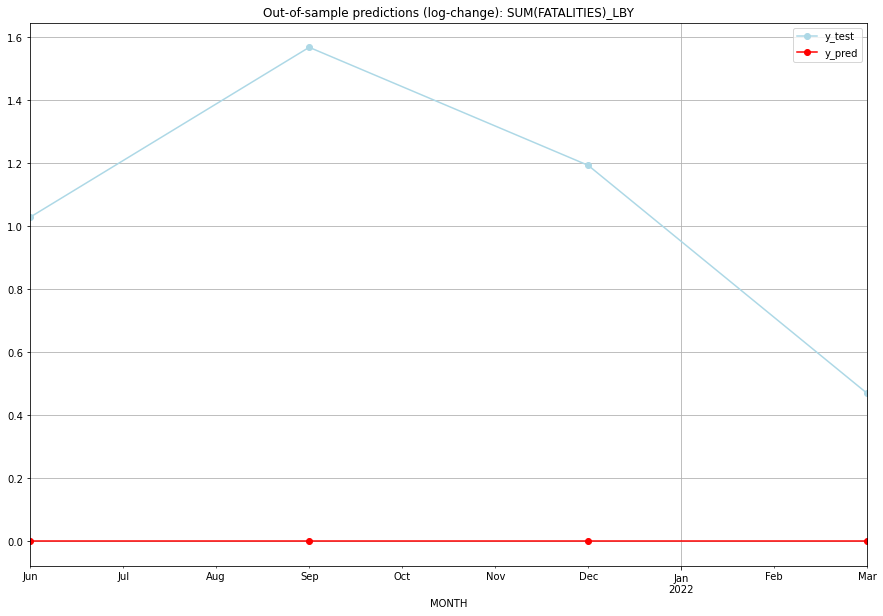

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.302585    3.332205           0.0        1.029619
1  2021-07  2.302585    3.871201           0.0        1.568616
2  2021-10  2.302585    3.496508           0.0        1.193922
3  2022-01  2.302585    2.772589           0.0        0.470004
TADDA: 1.0655403582032932
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.302585    3.332205           0.0        1.029619   LBY
1 2021-07-01  2.302585    3.871201           0.0        1.568616   LBY
2 2021-10-01  2.302585    3.496508           0.0        1.193922   LBY
3 2022-01-01  2.302585    2.772589           0.0        0.470004   LBY
Execution time: 00:01
######## LCA (122/234) #########
0
Neighbor countries: []
Getting Data for LCA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

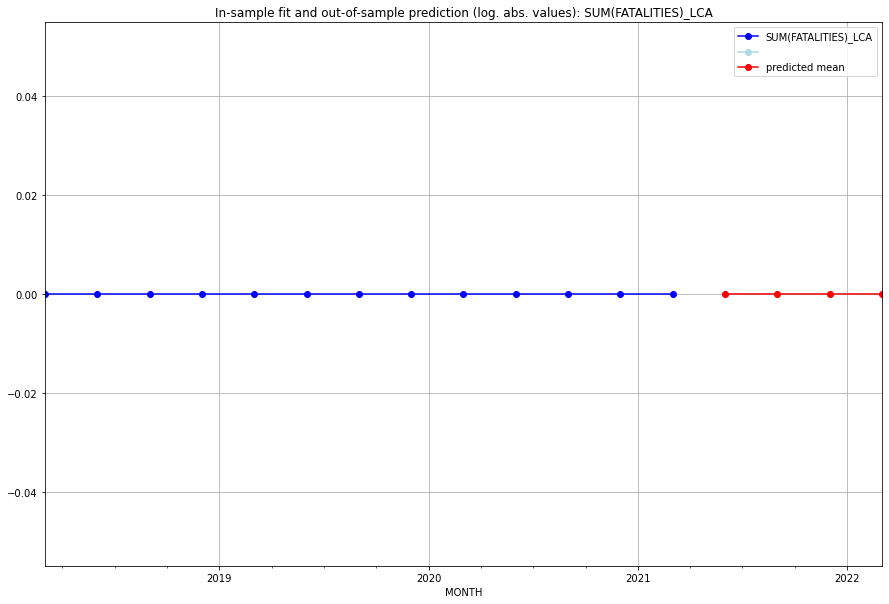

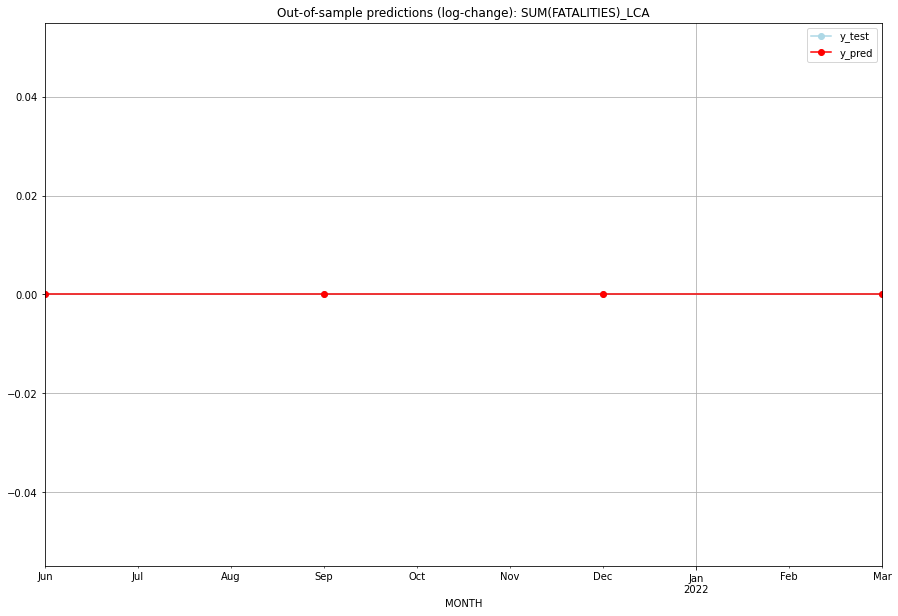

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   LCA
1 2021-07-01       0.0         0.0           0.0             0.0   LCA
2 2021-10-01       0.0         0.0           0.0             0.0   LCA
3 2022-01-01       0.0         0.0           0.0             0.0   LCA
Execution time: 00:01
######## LIE (123/234) #########
0
Neighbor countries: []
Getting Data for LIE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

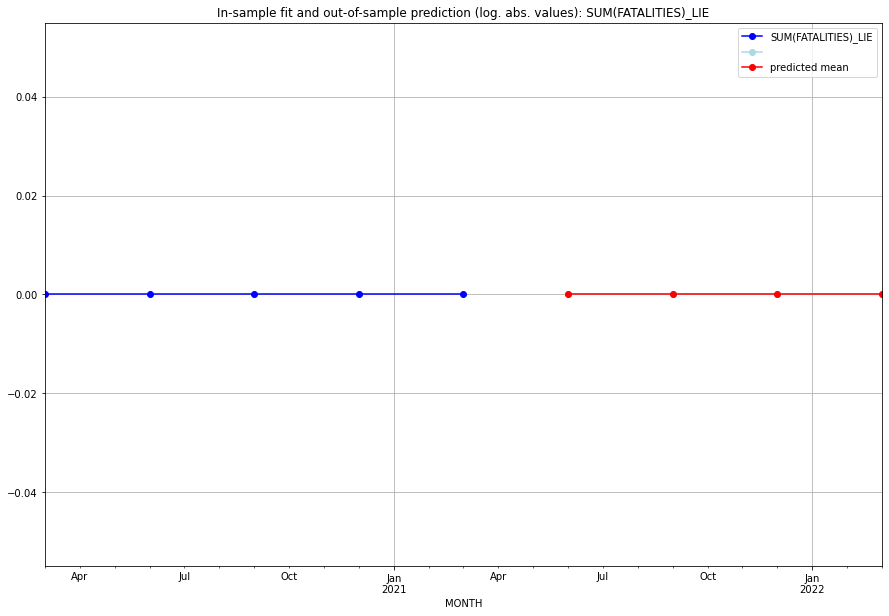

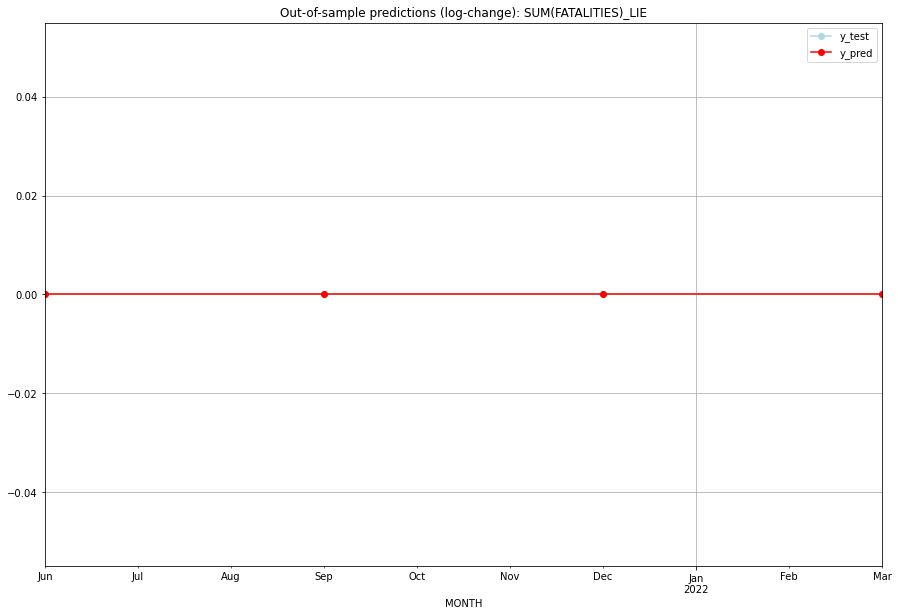

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   LIE
1 2021-07-01       0.0         0.0           0.0             0.0   LIE
2 2021-10-01       0.0         0.0           0.0             0.0   LIE
3 2022-01-01       0.0         0.0           0.0             0.0   LIE
Execution time: 00:01
######## LKA (124/234) #########
0
Neighbor countries: []
Getting Data for LKA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH            
2021-04

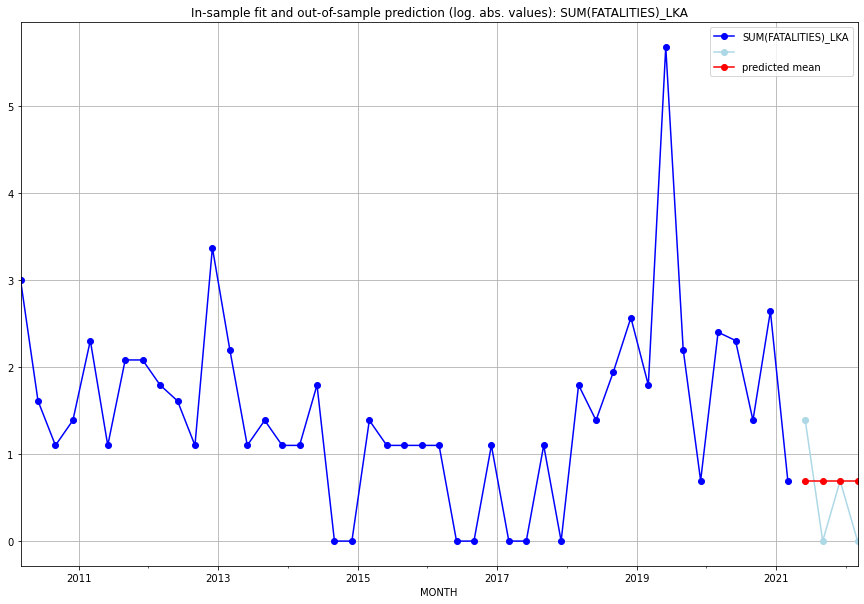

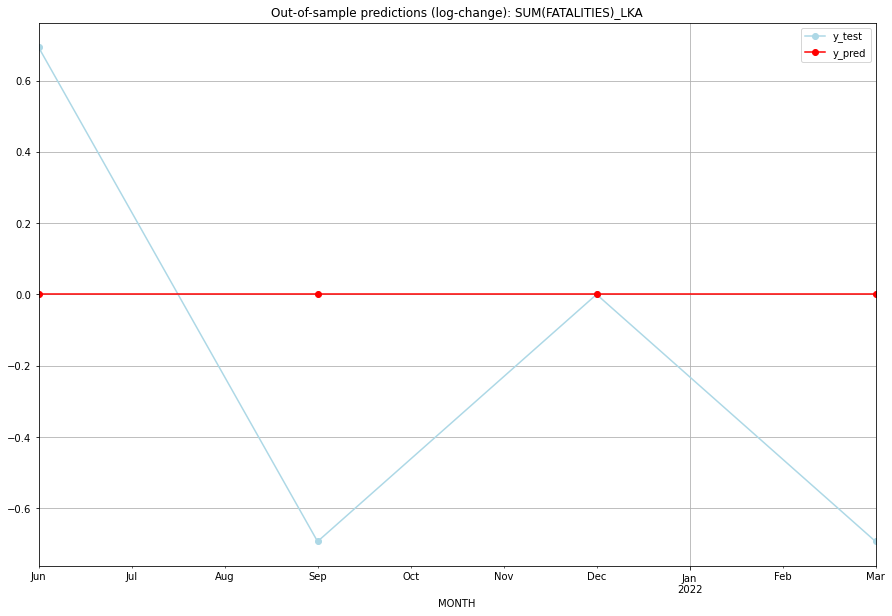

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    1.386294           0.0        0.693147
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    0.693147           0.0        0.000000
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    1.386294           0.0        0.693147   LKA
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   LKA
2 2021-10-01  0.693147    0.693147           0.0        0.000000   LKA
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   LKA
Execution time: 00:01
######## LSO (125/234) #########
0
Neighbor countries: []
Getting Data for LSO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       


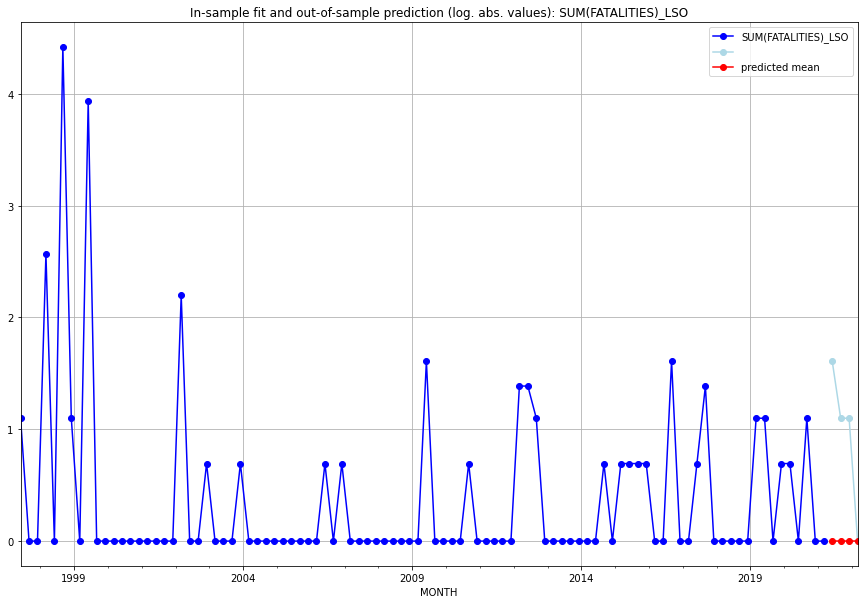

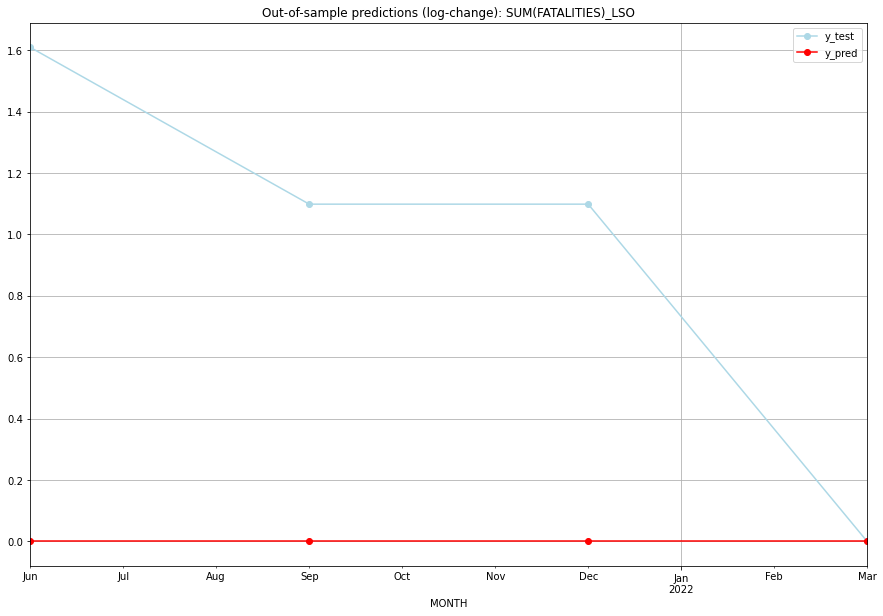

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.609438           0.0        1.609438
1  2021-07       0.0    1.098612           0.0        1.098612
2  2021-10       0.0    1.098612           0.0        1.098612
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.9516656224425801
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.609438           0.0        1.609438   LSO
1 2021-07-01       0.0    1.098612           0.0        1.098612   LSO
2 2021-10-01       0.0    1.098612           0.0        1.098612   LSO
3 2022-01-01       0.0    0.000000           0.0        0.000000   LSO
Execution time: 00:01
######## LTU (126/234) #########
0
Neighbor countries: []
Getting Data for LTU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

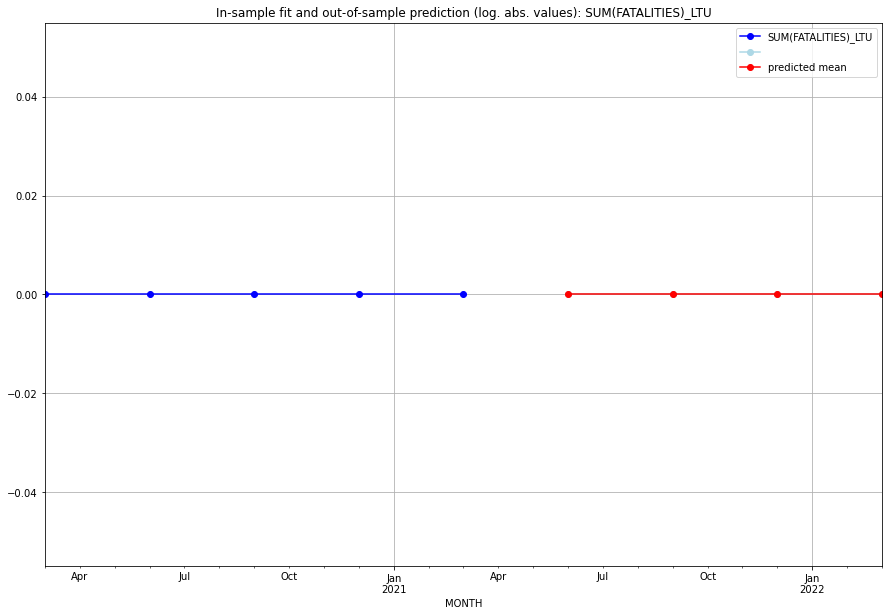

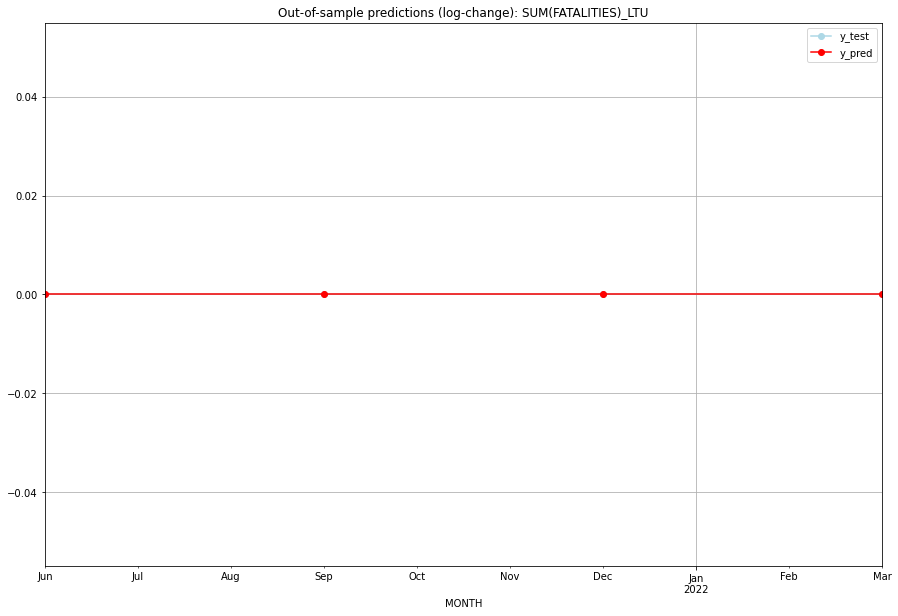

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   LTU
1 2021-07-01       0.0         0.0           0.0             0.0   LTU
2 2021-10-01       0.0         0.0           0.0             0.0   LTU
3 2022-01-01       0.0         0.0           0.0             0.0   LTU
Execution time: 00:01
######## LUX (127/234) #########
0
Neighbor countries: []
Getting Data for LUX
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

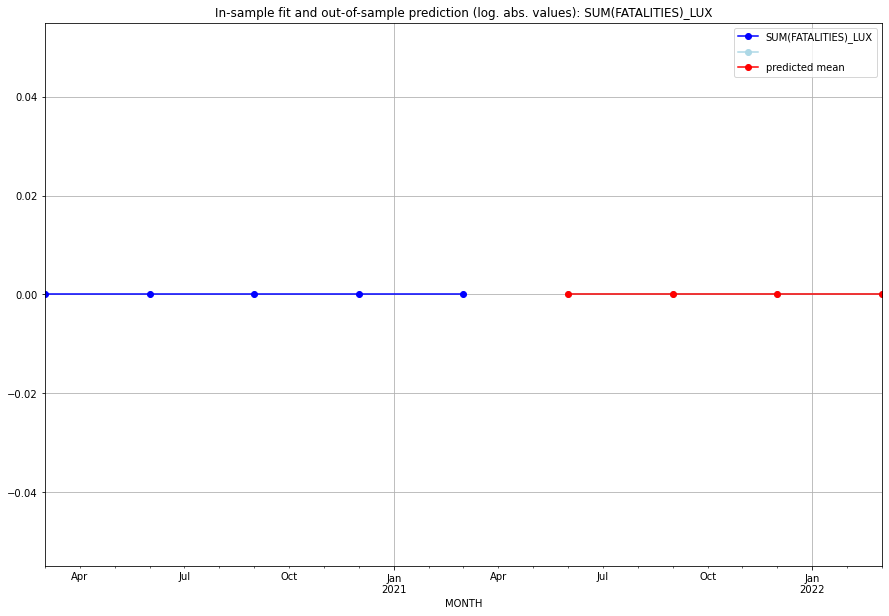

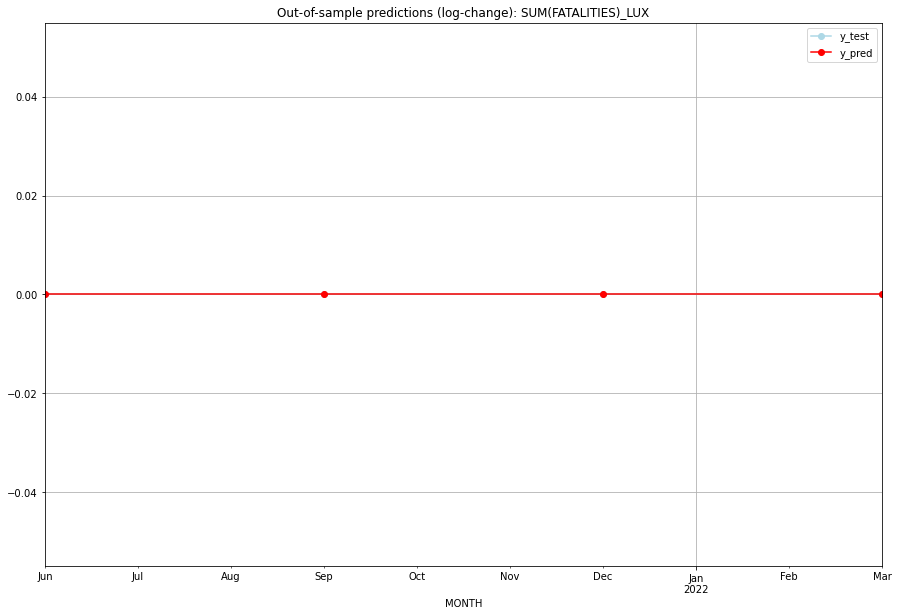

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   LUX
1 2021-07-01       0.0         0.0           0.0             0.0   LUX
2 2021-10-01       0.0         0.0           0.0             0.0   LUX
3 2022-01-01       0.0         0.0           0.0             0.0   LUX
Execution time: 00:01
######## LVA (128/234) #########
0
Neighbor countries: []
Getting Data for LVA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

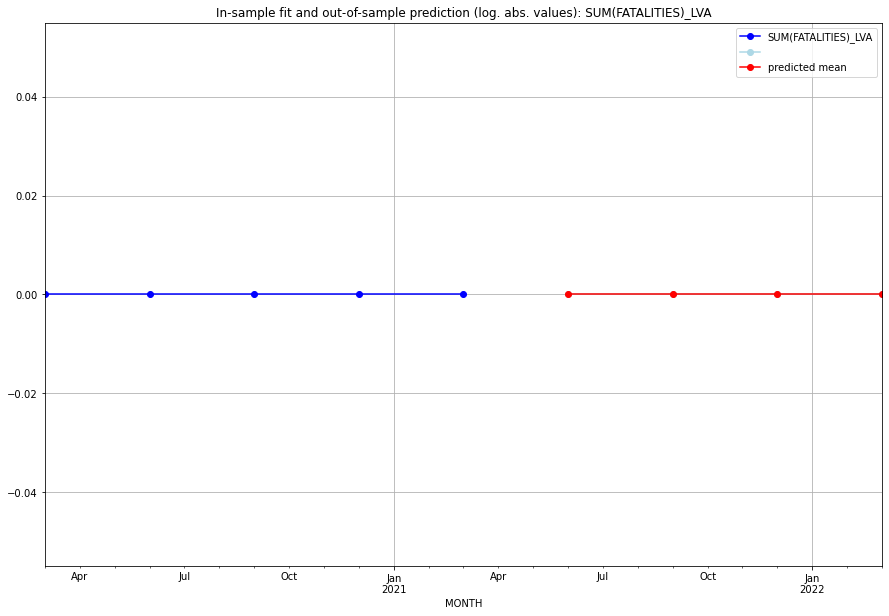

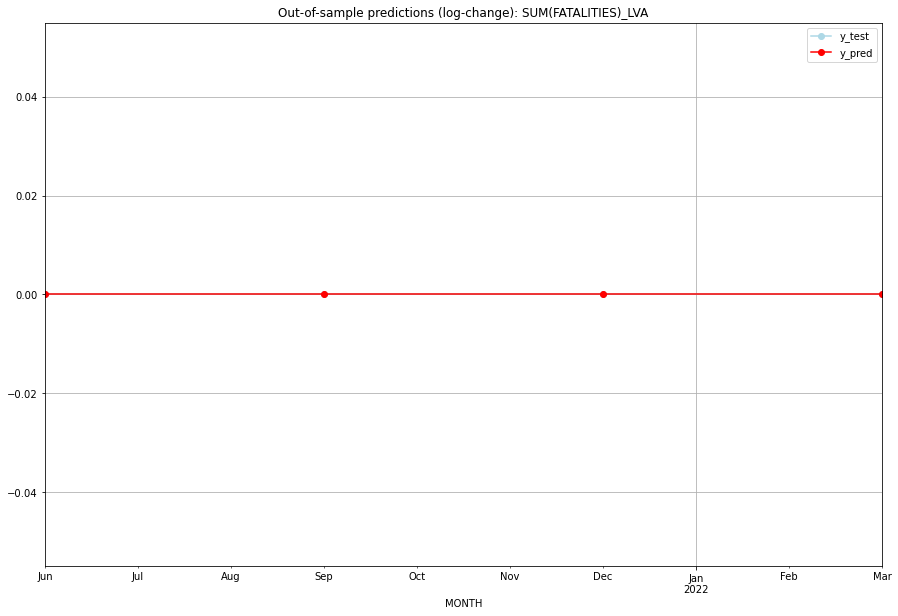

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   LVA
1 2021-07-01       0.0         0.0           0.0             0.0   LVA
2 2021-10-01       0.0         0.0           0.0             0.0   LVA
3 2022-01-01       0.0         0.0           0.0             0.0   LVA
Execution time: 00:01
######## MAC (129/234) #########
0
Neighbor countries: []
Getting Data for MAC
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

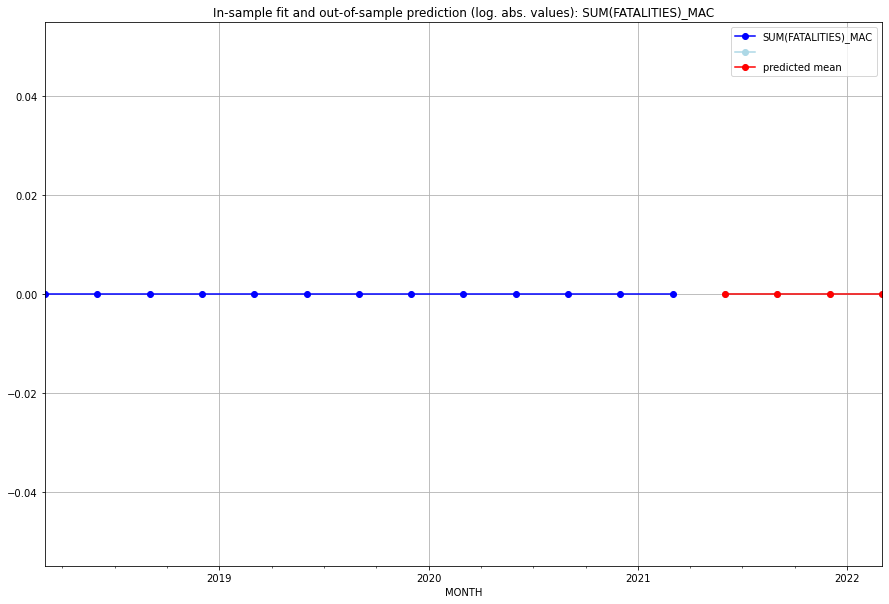

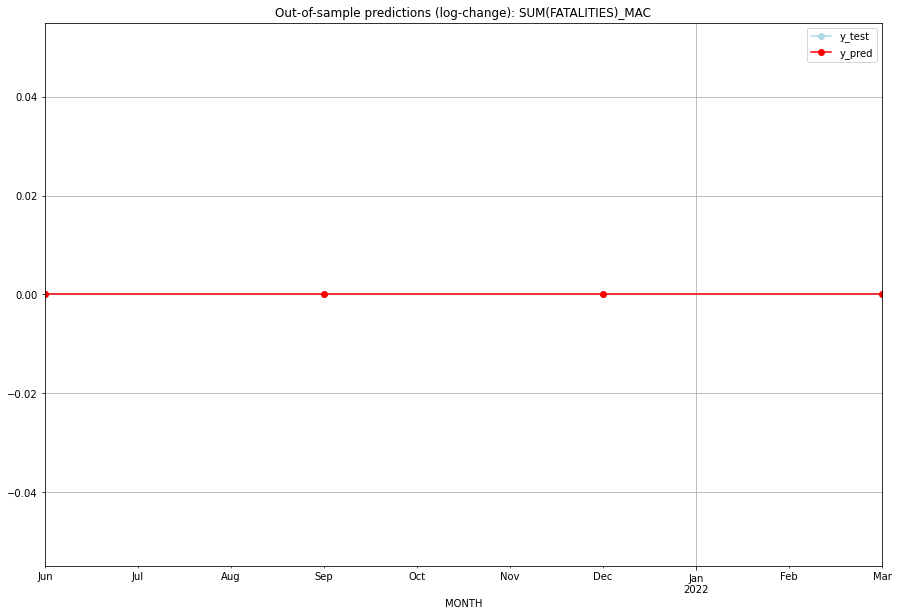

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MAC
1 2021-07-01       0.0         0.0           0.0             0.0   MAC
2 2021-10-01       0.0         0.0           0.0             0.0   MAC
3 2022-01-01       0.0         0.0           0.0             0.0   MAC
Execution time: 00:01
######## MAR (130/234) #########
0
Neighbor countries: []
Getting Data for MAR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

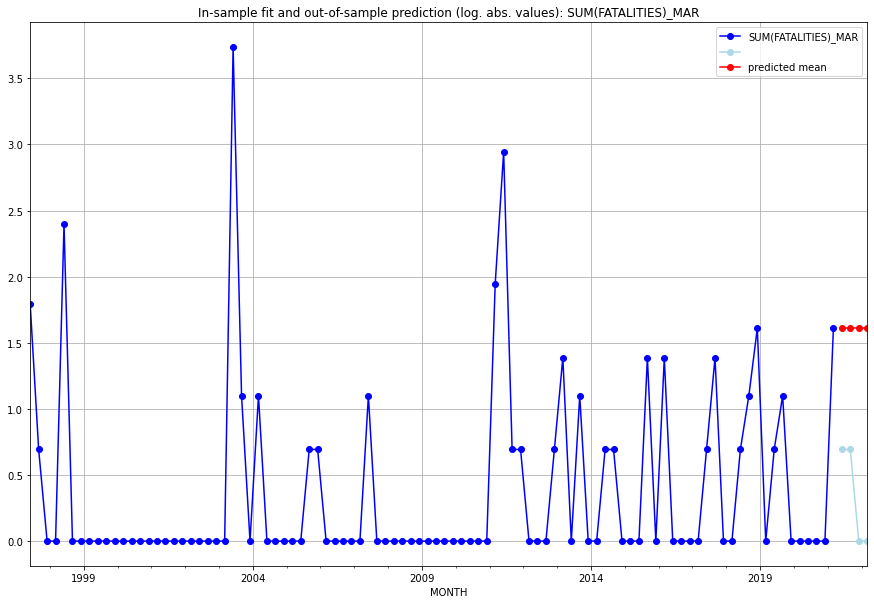

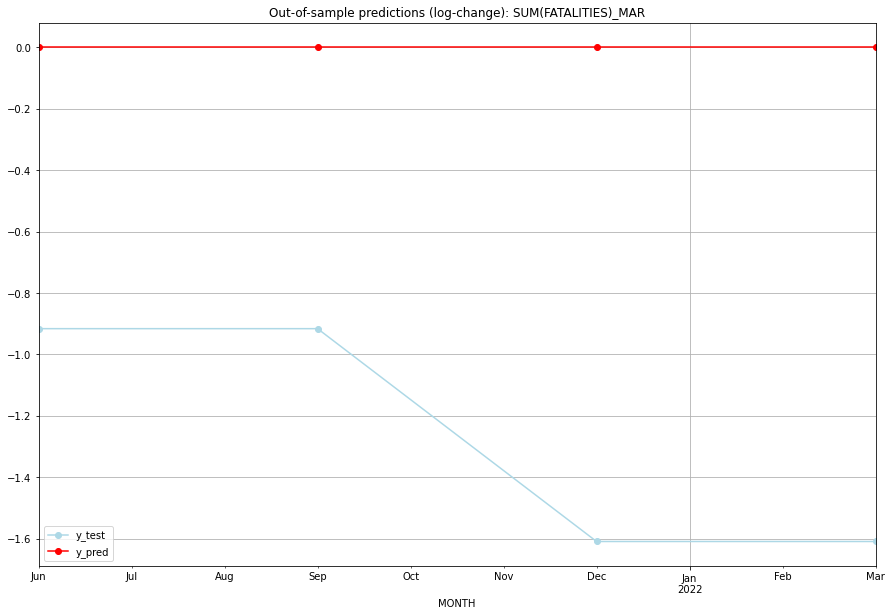

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.609438    0.693147           0.0       -0.916291
1  2021-07  1.609438    0.693147           0.0       -0.916291
2  2021-10  1.609438    0.000000           0.0       -1.609438
3  2022-01  1.609438    0.000000           0.0       -1.609438
TADDA: 1.2628643221541278
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.609438    0.693147           0.0       -0.916291   MAR
1 2021-07-01  1.609438    0.693147           0.0       -0.916291   MAR
2 2021-10-01  1.609438    0.000000           0.0       -1.609438   MAR
3 2022-01-01  1.609438    0.000000           0.0       -1.609438   MAR
Execution time: 00:01
######## MCO (131/234) #########
0
Neighbor countries: []
Getting Data for MCO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

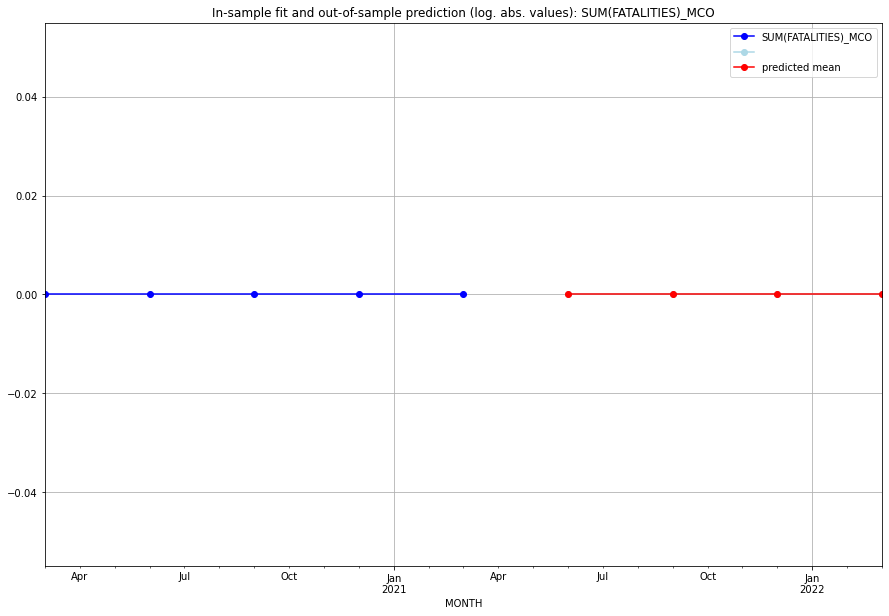

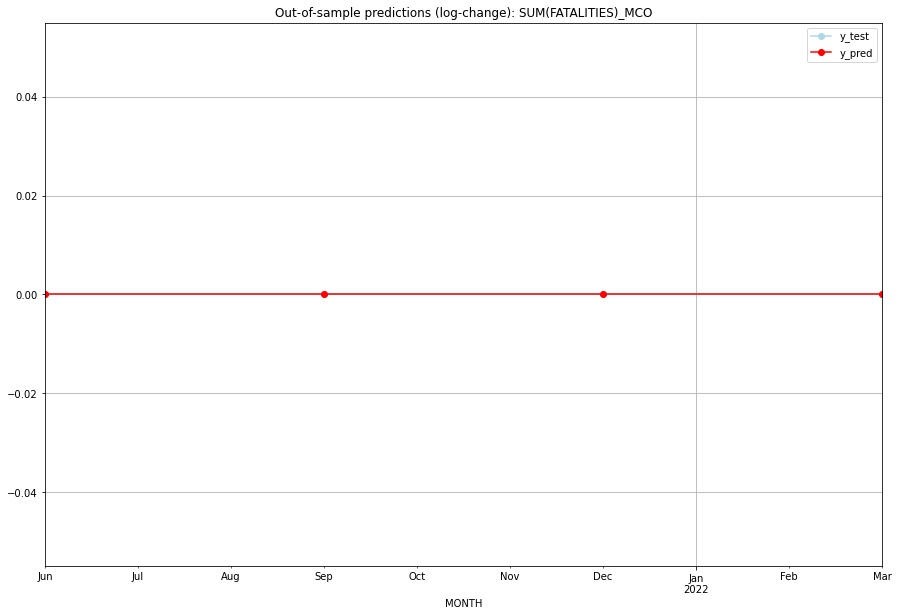

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MCO
1 2021-07-01       0.0         0.0           0.0             0.0   MCO
2 2021-10-01       0.0         0.0           0.0             0.0   MCO
3 2022-01-01       0.0         0.0           0.0             0.0   MCO
Execution time: 00:01
######## MDA (132/234) #########
0
Neighbor countries: []
Getting Data for MDA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

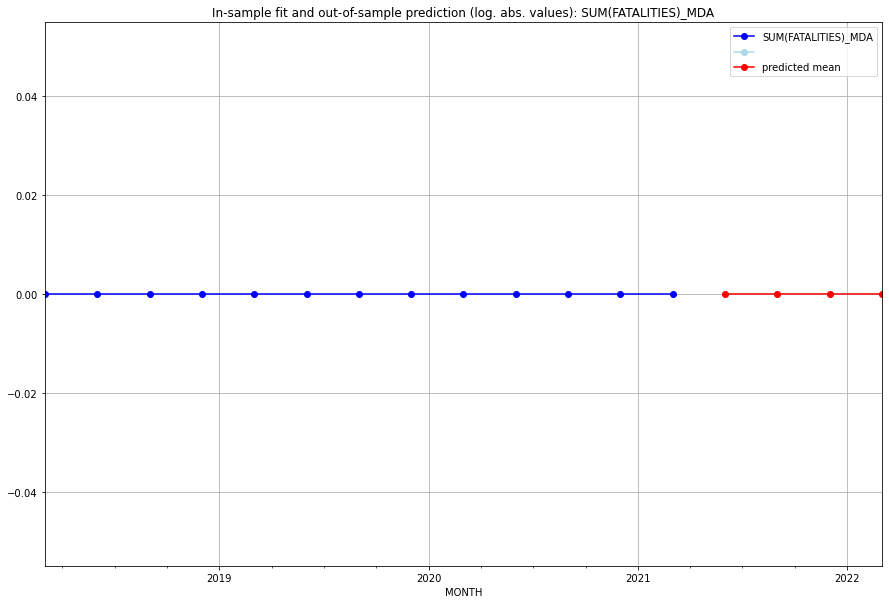

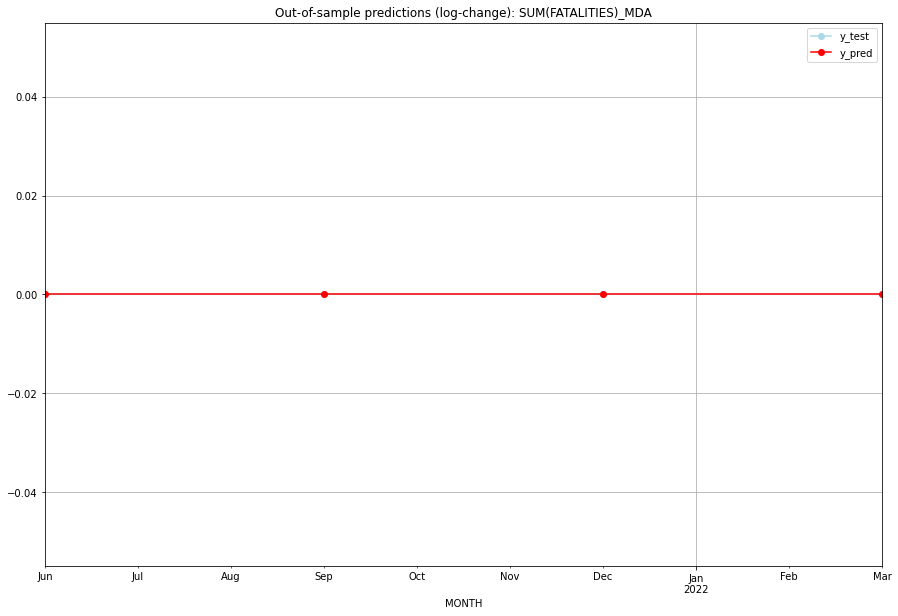

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MDA
1 2021-07-01       0.0         0.0           0.0             0.0   MDA
2 2021-10-01       0.0         0.0           0.0             0.0   MDA
3 2022-01-01       0.0         0.0           0.0             0.0   MDA
Execution time: 00:01
######## MDG (133/234) #########
0
Neighbor countries: []
Getting Data for MDG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

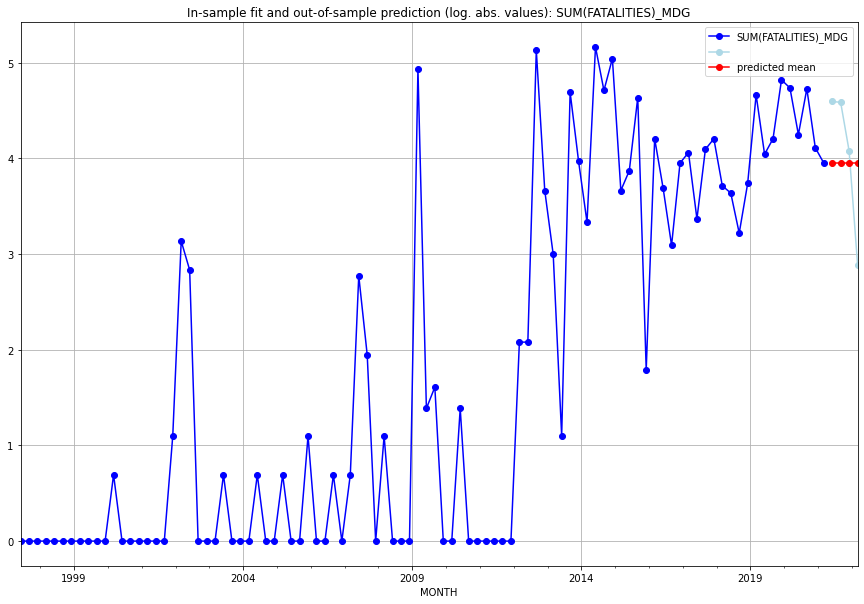

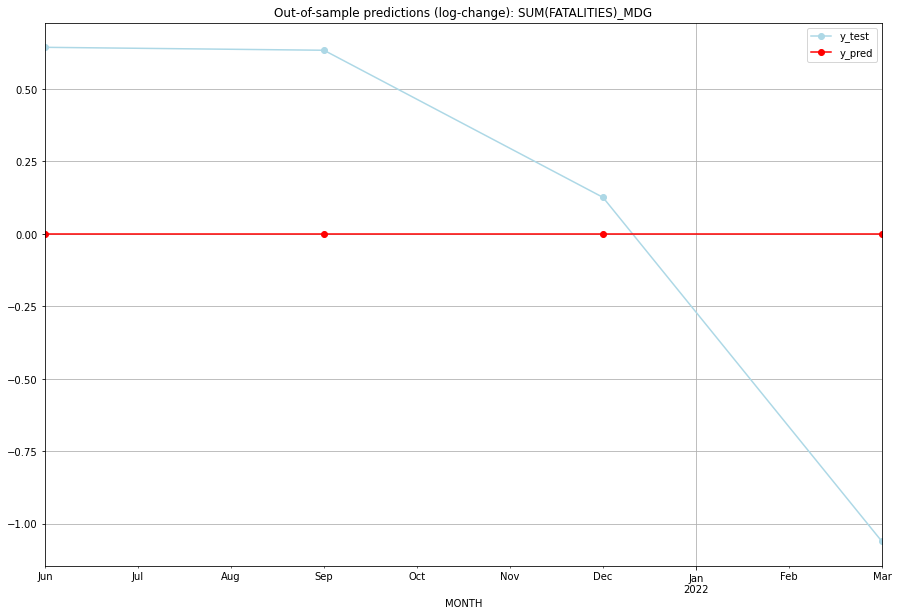

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.951244    4.595120           0.0        0.643876
1  2021-07  3.951244    4.584967           0.0        0.633724
2  2021-10  3.951244    4.077537           0.0        0.126294
3  2022-01  3.951244    2.890372           0.0       -1.060872
TADDA: 0.6161913944129653
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.951244    4.595120           0.0        0.643876   MDG
1 2021-07-01  3.951244    4.584967           0.0        0.633724   MDG
2 2021-10-01  3.951244    4.077537           0.0        0.126294   MDG
3 2022-01-01  3.951244    2.890372           0.0       -1.060872   MDG
Execution time: 00:01
######## MDV (134/234) #########
0
Neighbor countries: []
Getting Data for MDV
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

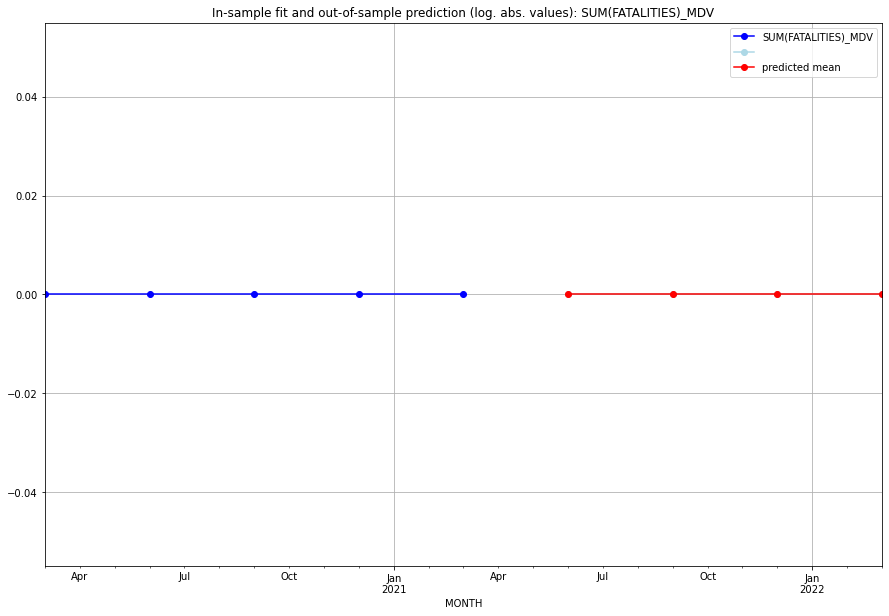

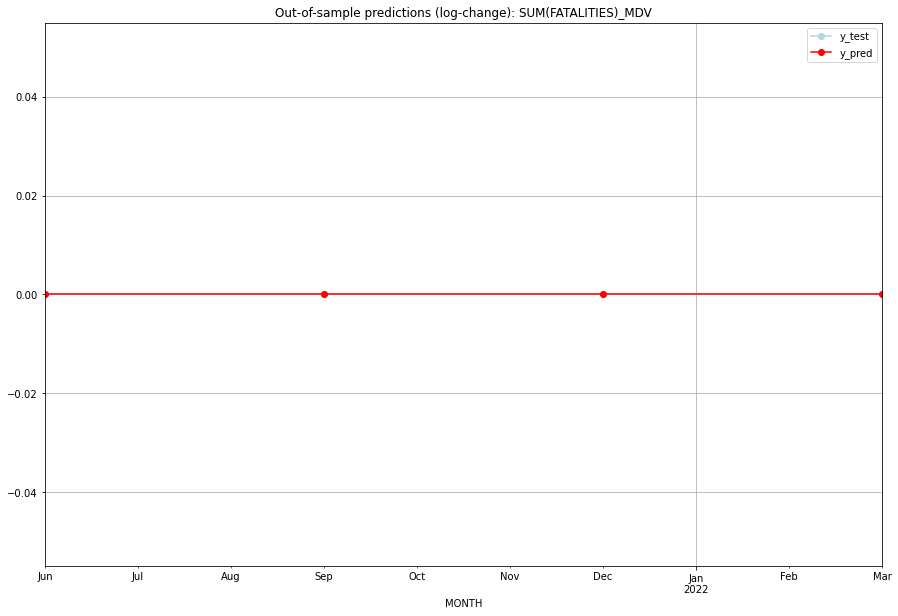

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MDV
1 2021-07-01       0.0         0.0           0.0             0.0   MDV
2 2021-10-01       0.0         0.0           0.0             0.0   MDV
3 2022-01-01       0.0         0.0           0.0             0.0   MDV
Execution time: 00:01
######## MEX (135/234) #########
0
Neighbor countries: []
Getting Data for MEX
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04

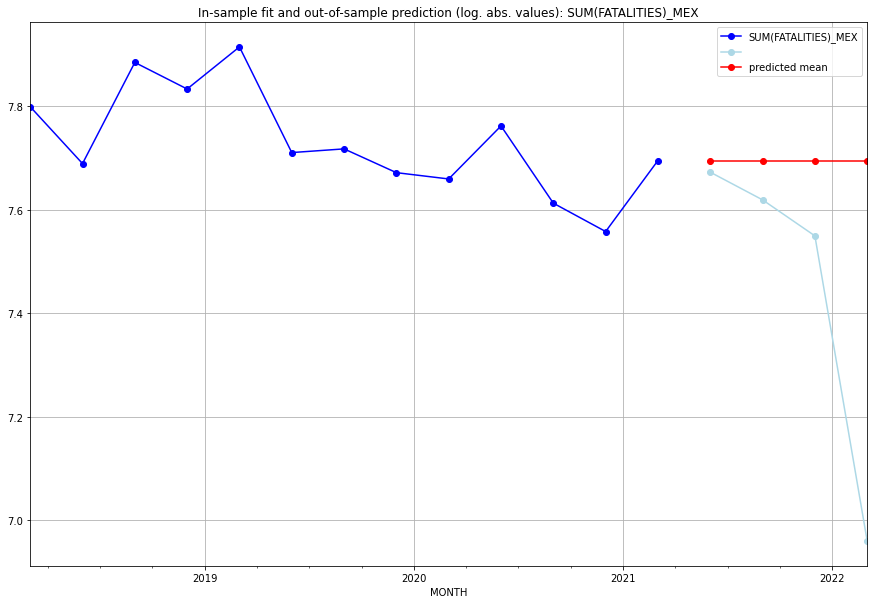

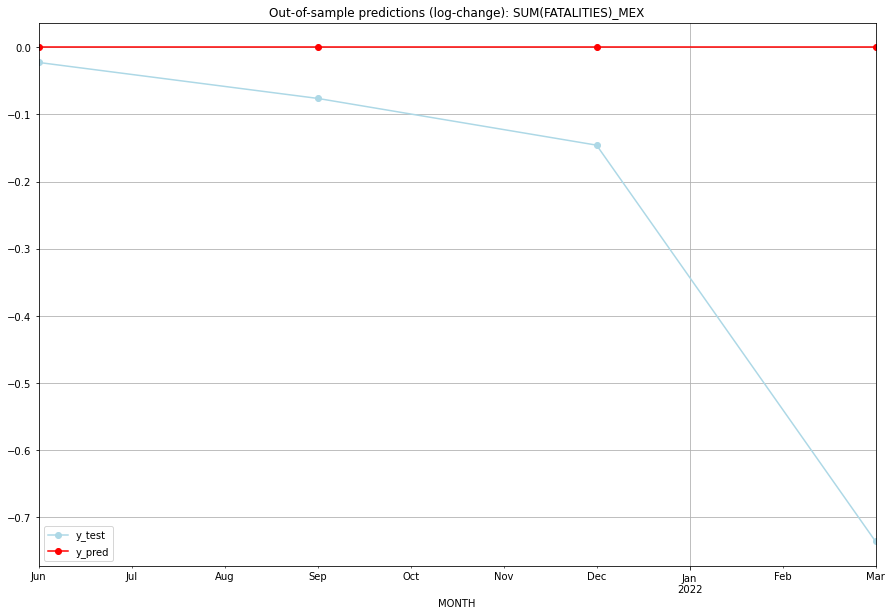

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  7.695303    7.672758           0.0       -0.022545
1  2021-07  7.695303    7.619233           0.0       -0.076070
2  2021-10  7.695303    7.549609           0.0       -0.145694
3  2022-01  7.695303    6.959399           0.0       -0.735905
TADDA: 0.24505338742411076
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  7.695303    7.672758           0.0       -0.022545   MEX
1 2021-07-01  7.695303    7.619233           0.0       -0.076070   MEX
2 2021-10-01  7.695303    7.549609           0.0       -0.145694   MEX
3 2022-01-01  7.695303    6.959399           0.0       -0.735905   MEX
Execution time: 00:01
######## MKD (136/234) #########
0
Neighbor countries: []
Getting Data for MKD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2

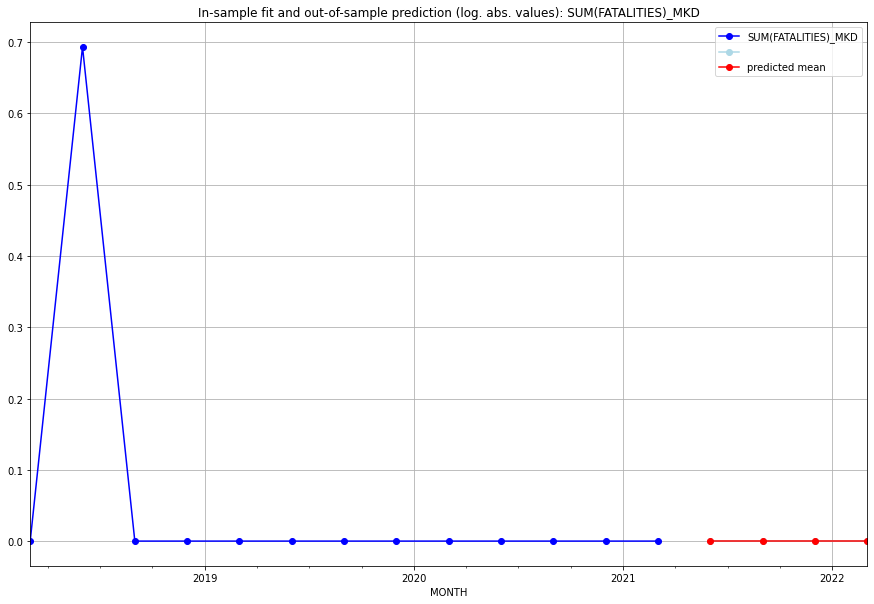

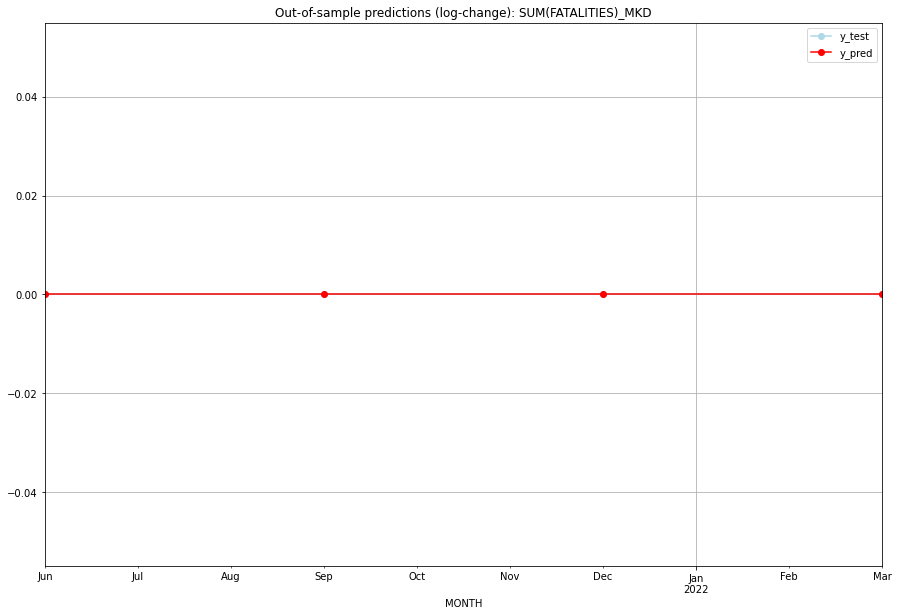

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MKD
1 2021-07-01       0.0         0.0           0.0             0.0   MKD
2 2021-10-01       0.0         0.0           0.0             0.0   MKD
3 2022-01-01       0.0         0.0           0.0             0.0   MKD
Execution time: 00:01
######## MLI (137/234) #########
0
Neighbor countries: []
Getting Data for MLI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

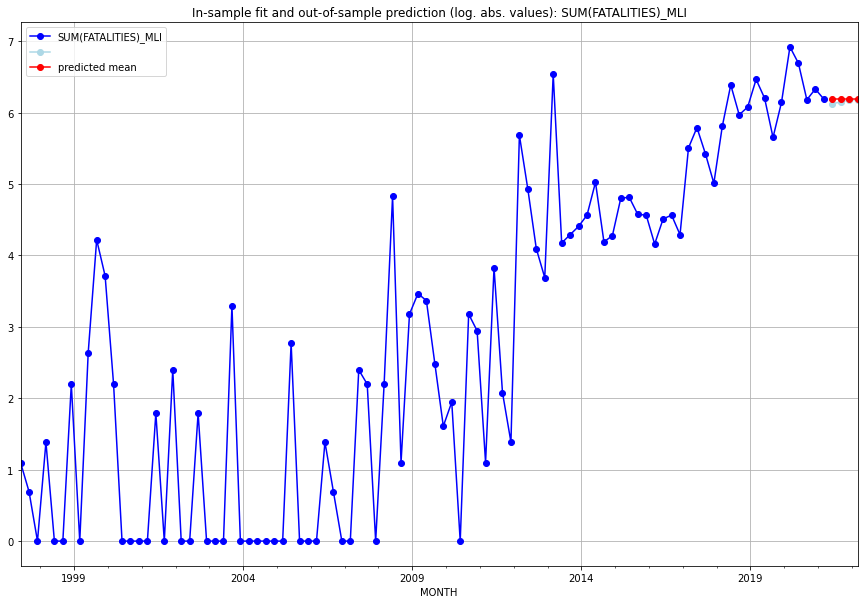

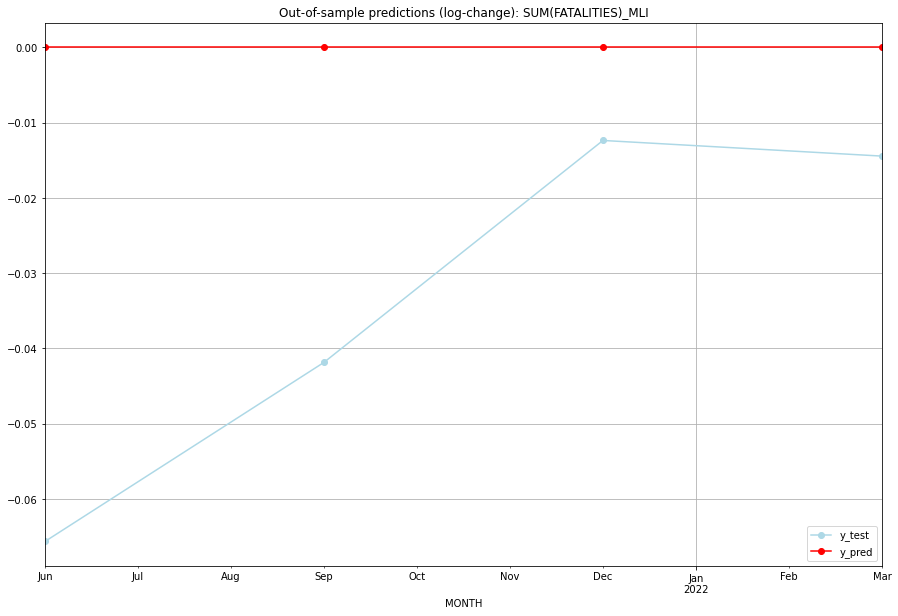

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.190315    6.124683           0.0       -0.065632
1  2021-07  6.190315    6.148468           0.0       -0.041847
2  2021-10  6.190315    6.177944           0.0       -0.012371
3  2022-01  6.190315    6.175867           0.0       -0.014448
TADDA: 0.03357463811109507
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.190315    6.124683           0.0       -0.065632   MLI
1 2021-07-01  6.190315    6.148468           0.0       -0.041847   MLI
2 2021-10-01  6.190315    6.177944           0.0       -0.012371   MLI
3 2022-01-01  6.190315    6.175867           0.0       -0.014448   MLI
Execution time: 00:01
######## MLT (138/234) #########
0
Neighbor countries: []
Getting Data for MLT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
202

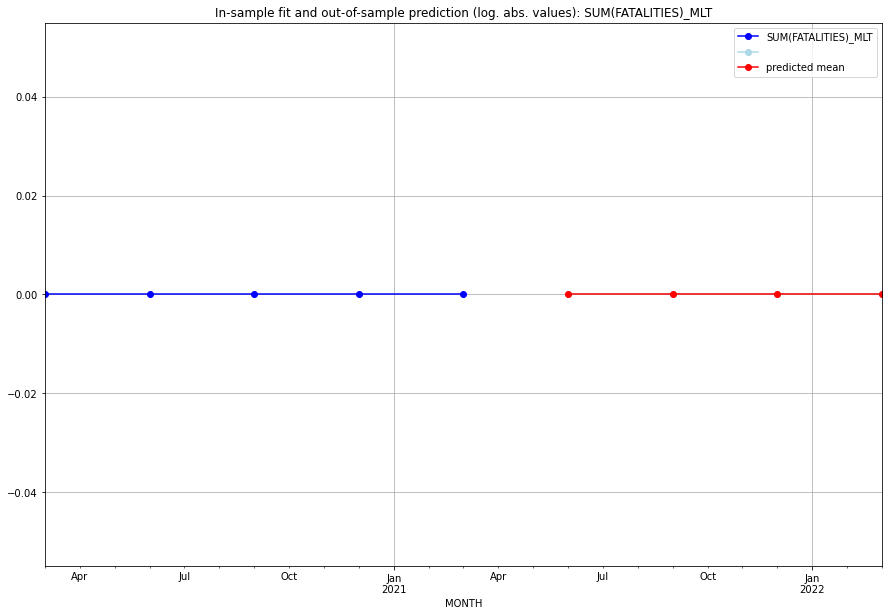

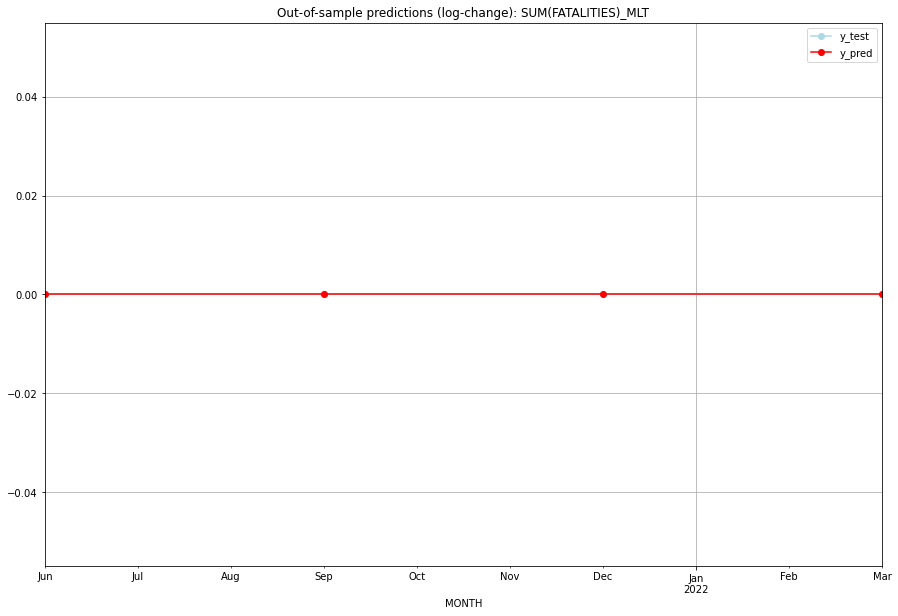

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MLT
1 2021-07-01       0.0         0.0           0.0             0.0   MLT
2 2021-10-01       0.0         0.0           0.0             0.0   MLT
3 2022-01-01       0.0         0.0           0.0             0.0   MLT
Execution time: 00:01
######## MMR (139/234) #########
0
Neighbor countries: []
Getting Data for MMR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH            
2021-04

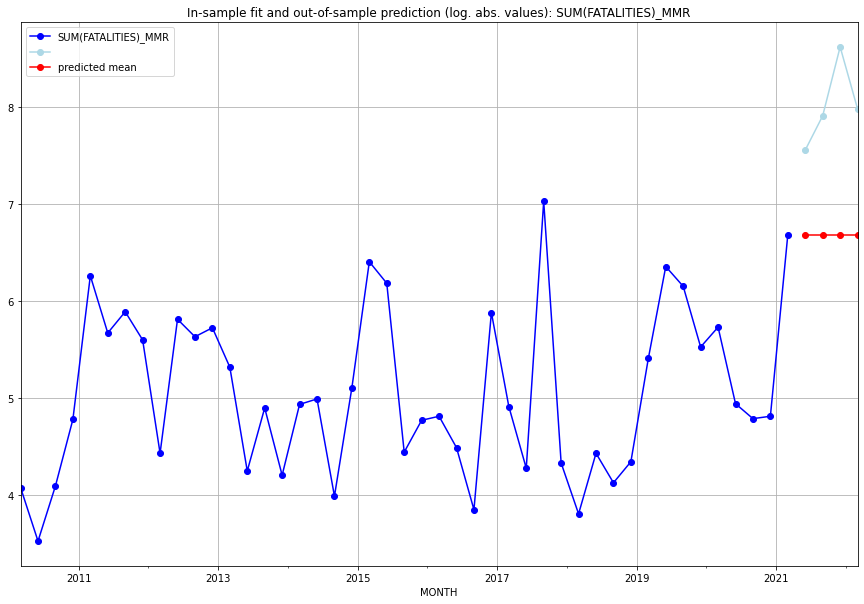

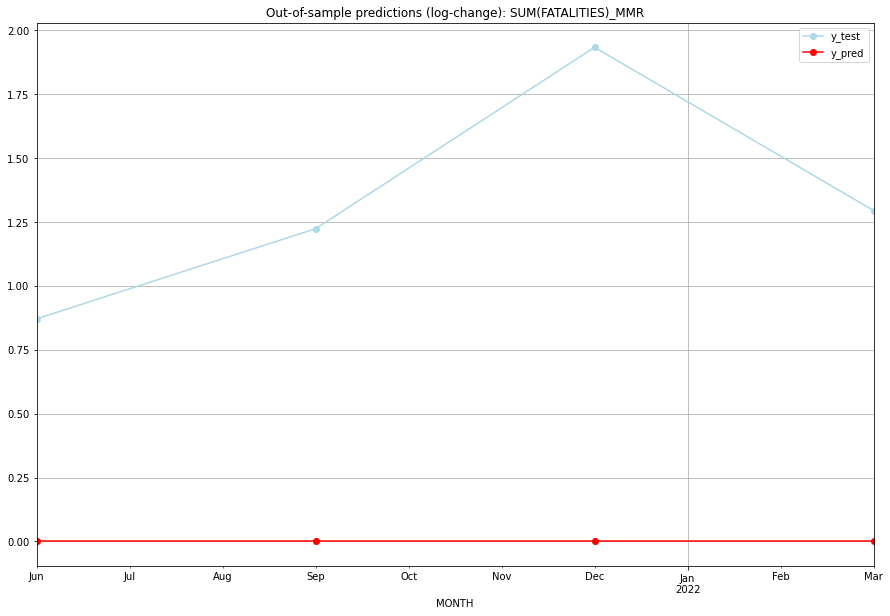

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.683361    7.554335           0.0        0.870974
1  2021-07  6.683361    7.906915           0.0        1.223555
2  2021-10  6.683361    8.616495           0.0        1.933134
3  2022-01  6.683361    7.977968           0.0        1.294607
TADDA: 1.3305675037394713
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.683361    7.554335           0.0        0.870974   MMR
1 2021-07-01  6.683361    7.906915           0.0        1.223555   MMR
2 2021-10-01  6.683361    8.616495           0.0        1.933134   MMR
3 2022-01-01  6.683361    7.977968           0.0        1.294607   MMR
Execution time: 00:01
######## MNE (140/234) #########
0
Neighbor countries: []
Getting Data for MNE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

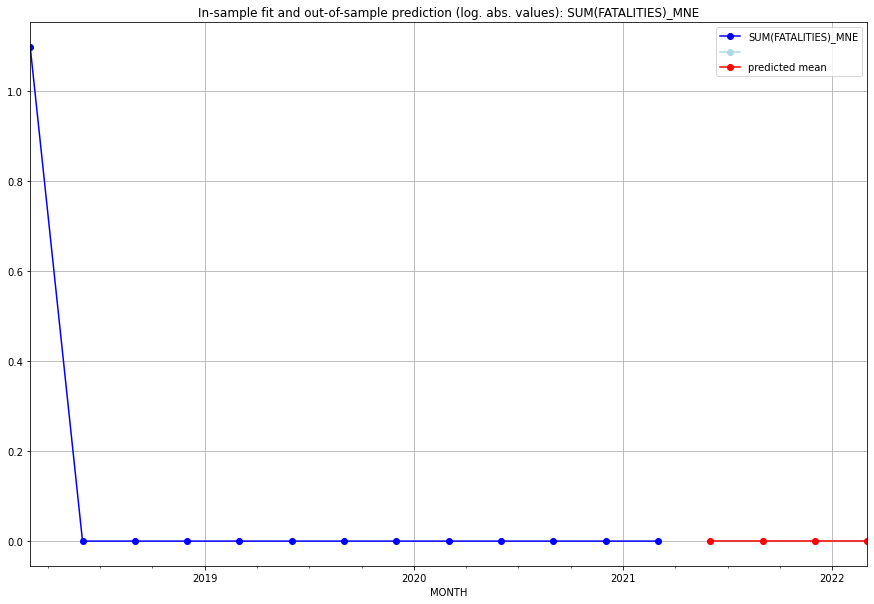

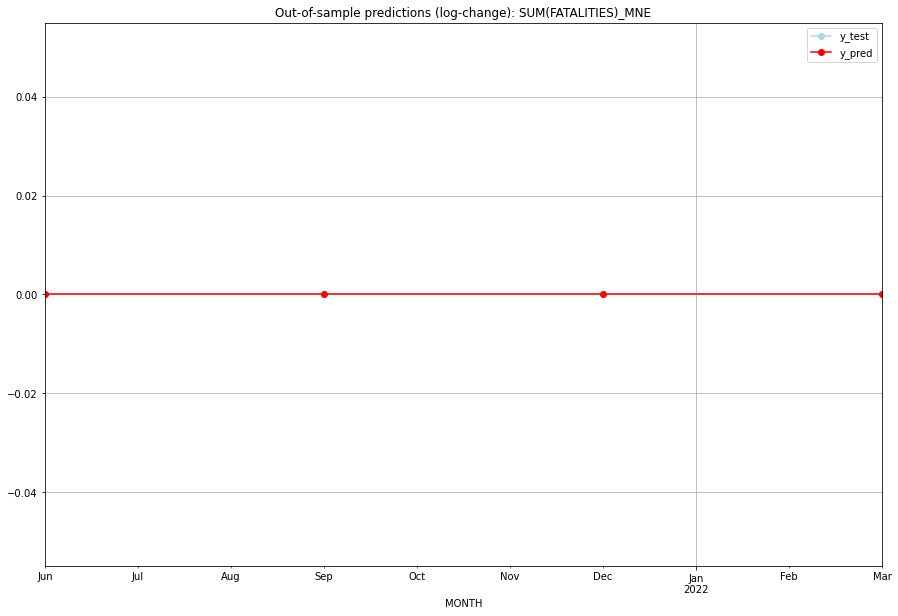

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MNE
1 2021-07-01       0.0         0.0           0.0             0.0   MNE
2 2021-10-01       0.0         0.0           0.0             0.0   MNE
3 2022-01-01       0.0         0.0           0.0             0.0   MNE
Execution time: 00:01
######## MNG (141/234) #########
0
Neighbor countries: []
Getting Data for MNG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

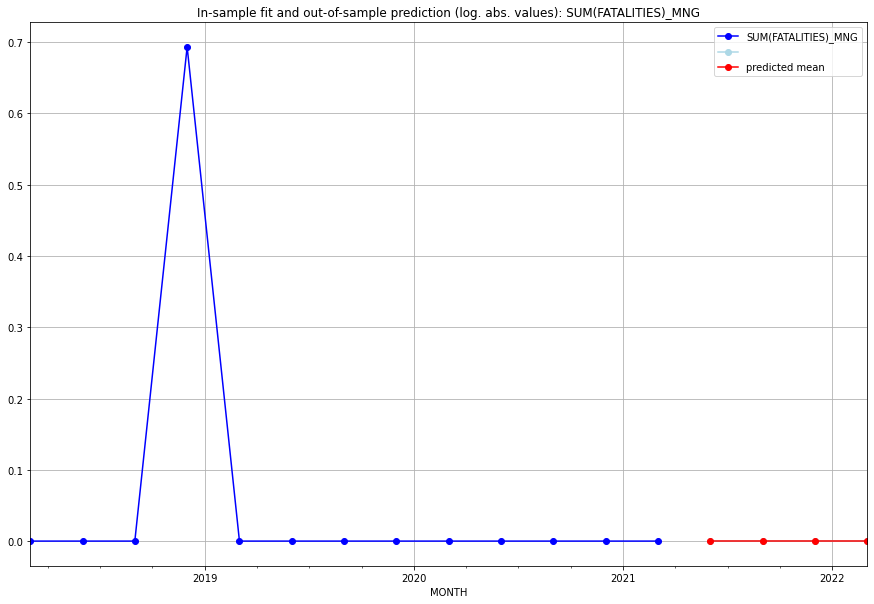

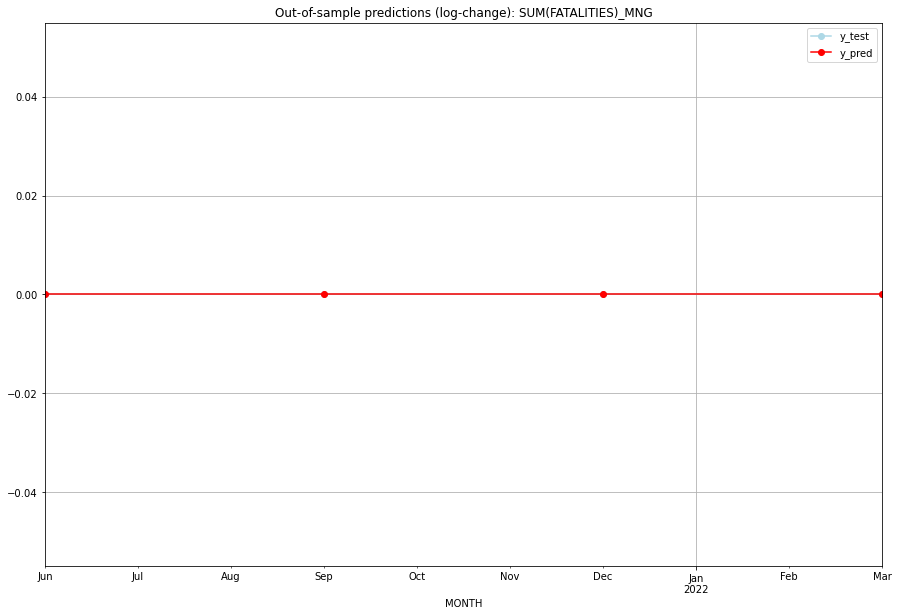

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MNG
1 2021-07-01       0.0         0.0           0.0             0.0   MNG
2 2021-10-01       0.0         0.0           0.0             0.0   MNG
3 2022-01-01       0.0         0.0           0.0             0.0   MNG
Execution time: 00:01
######## MNP (142/234) #########
0
Neighbor countries: []
Getting Data for MNP
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

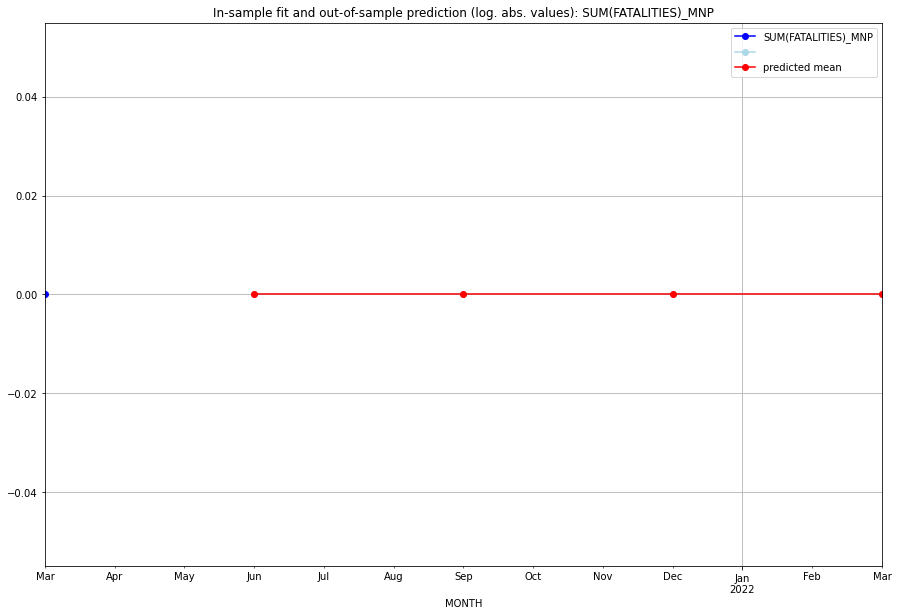

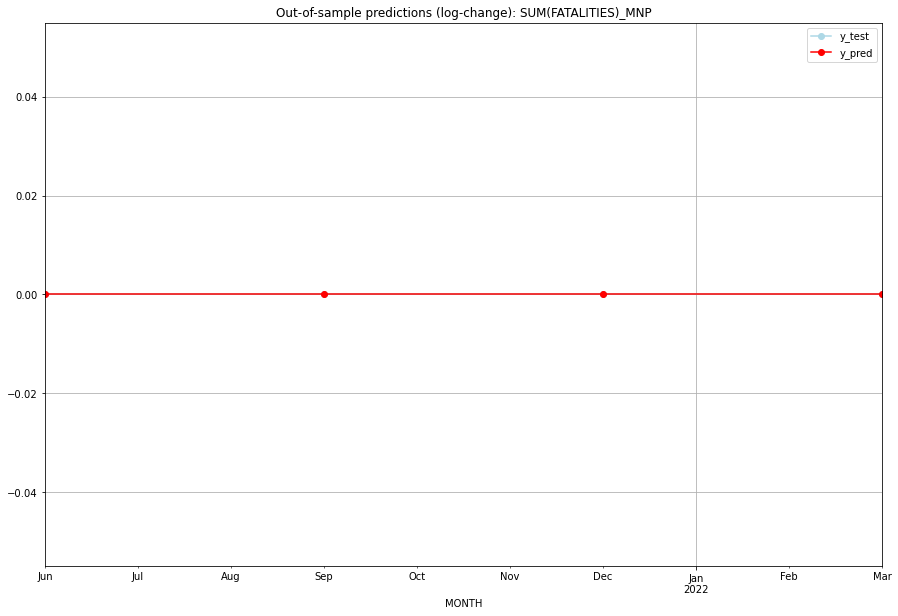

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MNP
1 2021-07-01       0.0         0.0           0.0             0.0   MNP
2 2021-10-01       0.0         0.0           0.0             0.0   MNP
3 2022-01-01       0.0         0.0           0.0             0.0   MNP
Execution time: 00:01
######## MOZ (143/234) #########
0
Neighbor countries: []
Getting Data for MOZ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

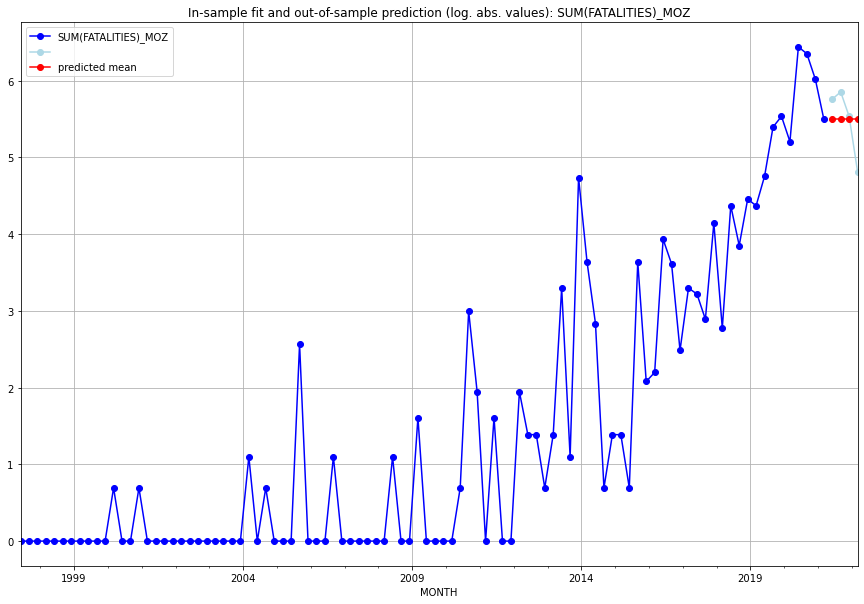

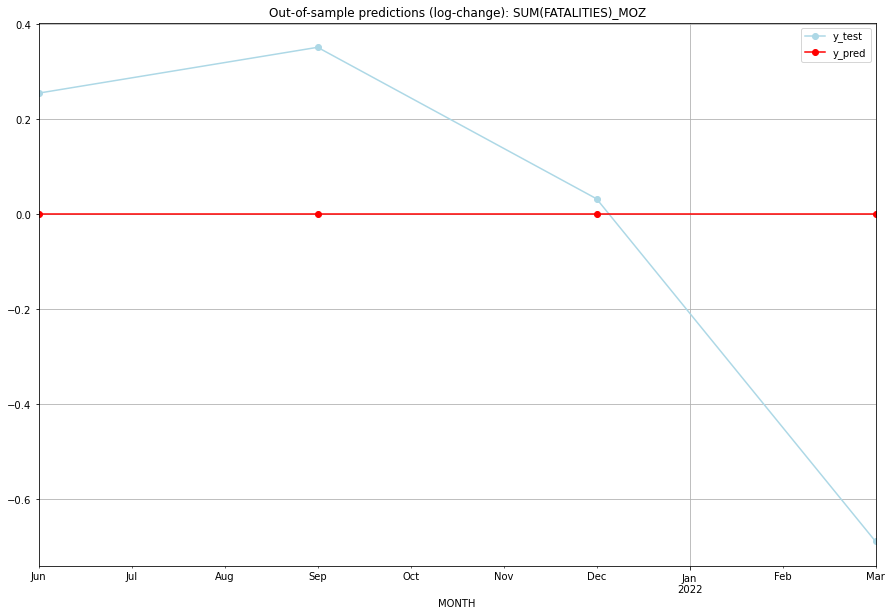

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.501258    5.755742           0.0        0.254484
1  2021-07  5.501258    5.852202           0.0        0.350944
2  2021-10  5.501258    5.533389           0.0        0.032131
3  2022-01  5.501258    4.812184           0.0       -0.689074
TADDA: 0.3316583514067588
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.501258    5.755742           0.0        0.254484   MOZ
1 2021-07-01  5.501258    5.852202           0.0        0.350944   MOZ
2 2021-10-01  5.501258    5.533389           0.0        0.032131   MOZ
3 2022-01-01  5.501258    4.812184           0.0       -0.689074   MOZ
Execution time: 00:01
######## MRT (144/234) #########
0
Neighbor countries: []
Getting Data for MRT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

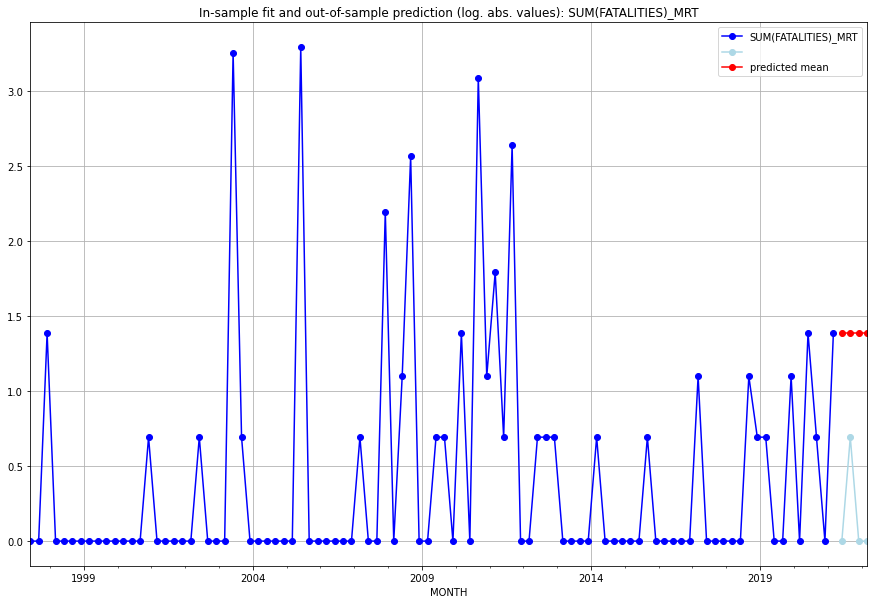

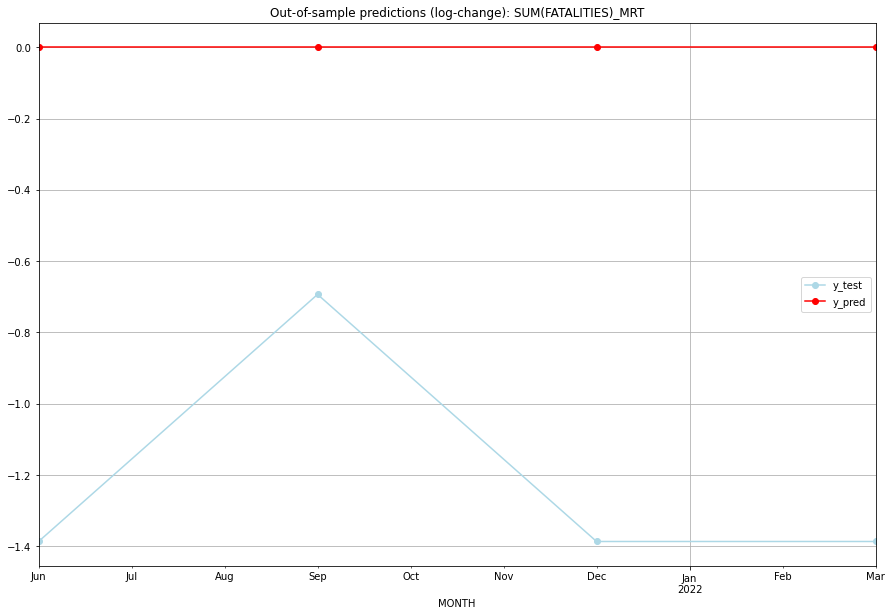

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.386294    0.000000           0.0       -1.386294
1  2021-07  1.386294    0.693147           0.0       -0.693147
2  2021-10  1.386294    0.000000           0.0       -1.386294
3  2022-01  1.386294    0.000000           0.0       -1.386294
TADDA: 1.2130075659799042
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.386294    0.000000           0.0       -1.386294   MRT
1 2021-07-01  1.386294    0.693147           0.0       -0.693147   MRT
2 2021-10-01  1.386294    0.000000           0.0       -1.386294   MRT
3 2022-01-01  1.386294    0.000000           0.0       -1.386294   MRT
Execution time: 00:01
######## MSR (145/234) #########
0
Neighbor countries: []
Getting Data for MSR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

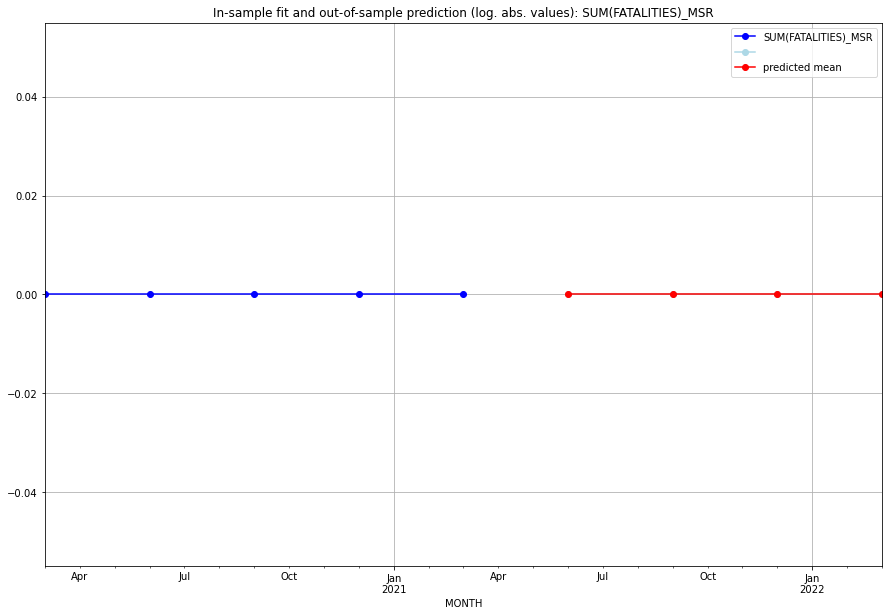

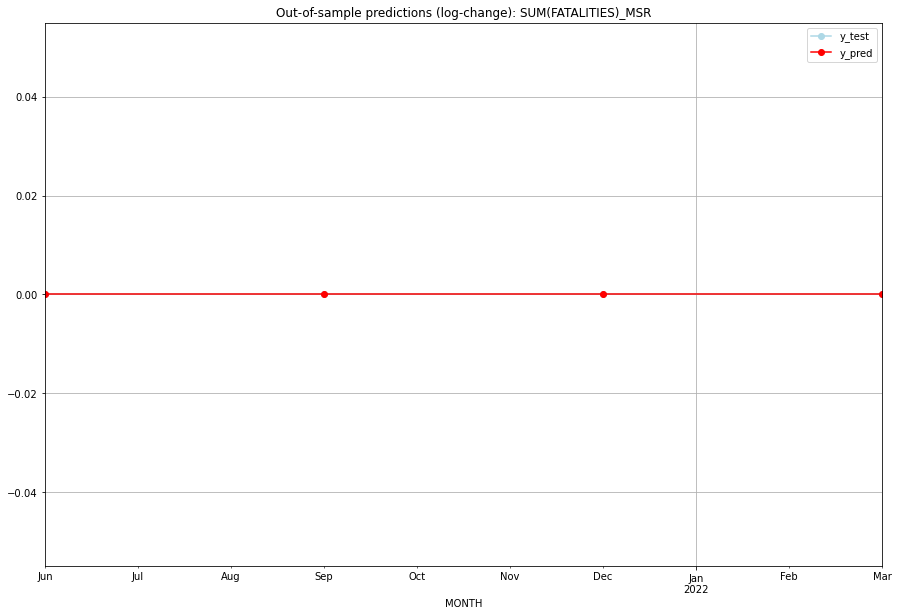

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MSR
1 2021-07-01       0.0         0.0           0.0             0.0   MSR
2 2021-10-01       0.0         0.0           0.0             0.0   MSR
3 2022-01-01       0.0         0.0           0.0             0.0   MSR
Execution time: 00:01
######## MTQ (146/234) #########
0
Neighbor countries: []
Getting Data for MTQ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

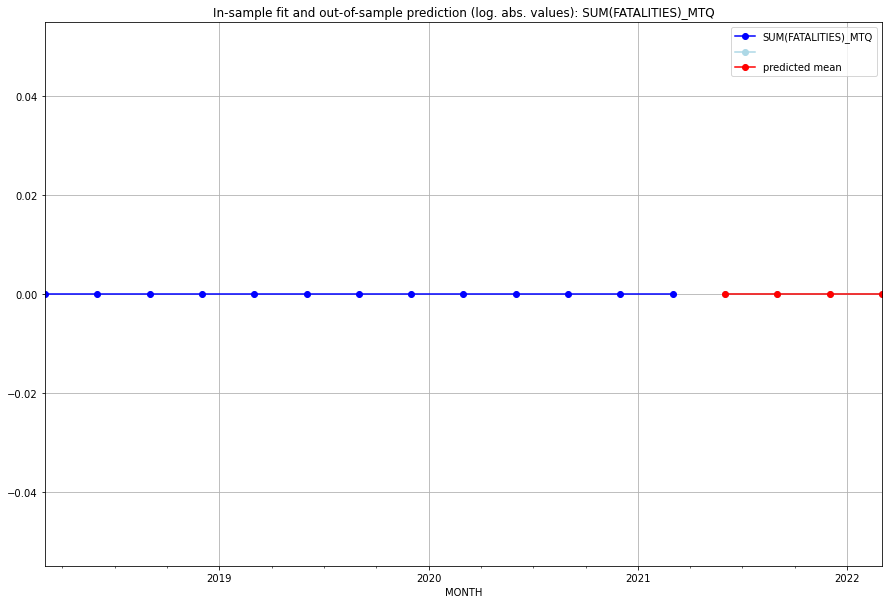

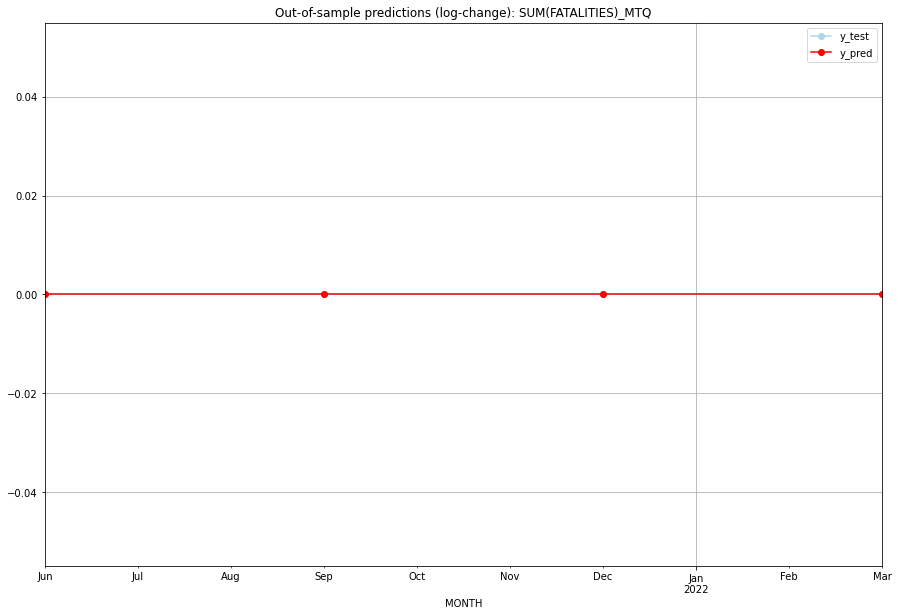

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   MTQ
1 2021-07-01       0.0         0.0           0.0             0.0   MTQ
2 2021-10-01       0.0         0.0           0.0             0.0   MTQ
3 2022-01-01       0.0         0.0           0.0             0.0   MTQ
Execution time: 00:01
######## MUS (147/234) #########
0
Neighbor countries: []
Getting Data for MUS
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

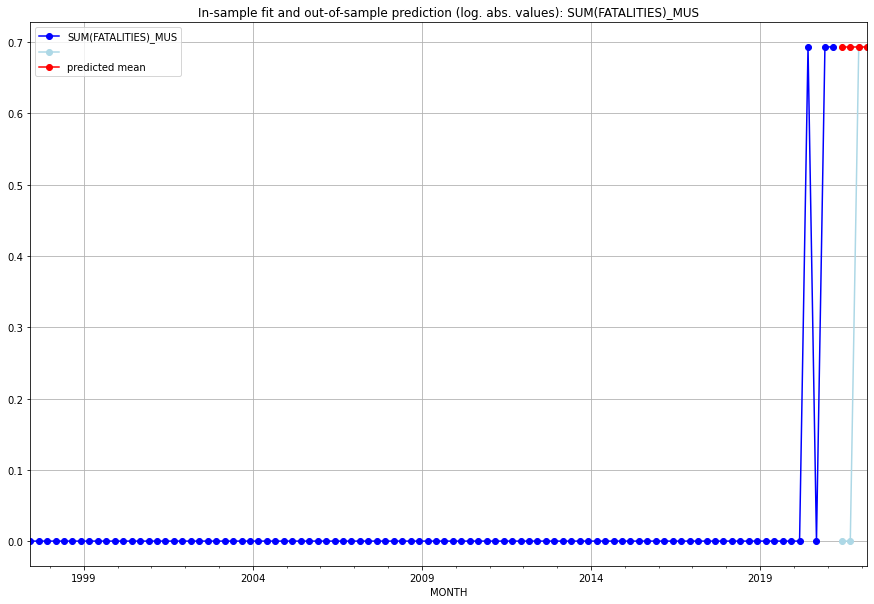

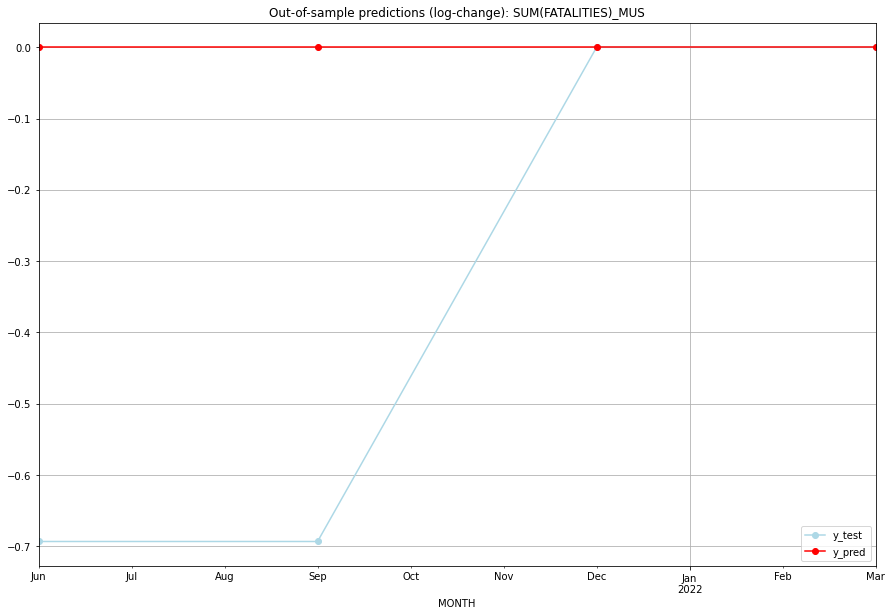

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.000000           0.0       -0.693147
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    0.693147           0.0        0.000000
3  2022-01  0.693147    0.693147           0.0        0.000000
TADDA: 0.34657359027997264
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.000000           0.0       -0.693147   MUS
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   MUS
2 2021-10-01  0.693147    0.693147           0.0        0.000000   MUS
3 2022-01-01  0.693147    0.693147           0.0        0.000000   MUS
Execution time: 00:01
######## MWI (148/234) #########
0
Neighbor countries: []
Getting Data for MWI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH  

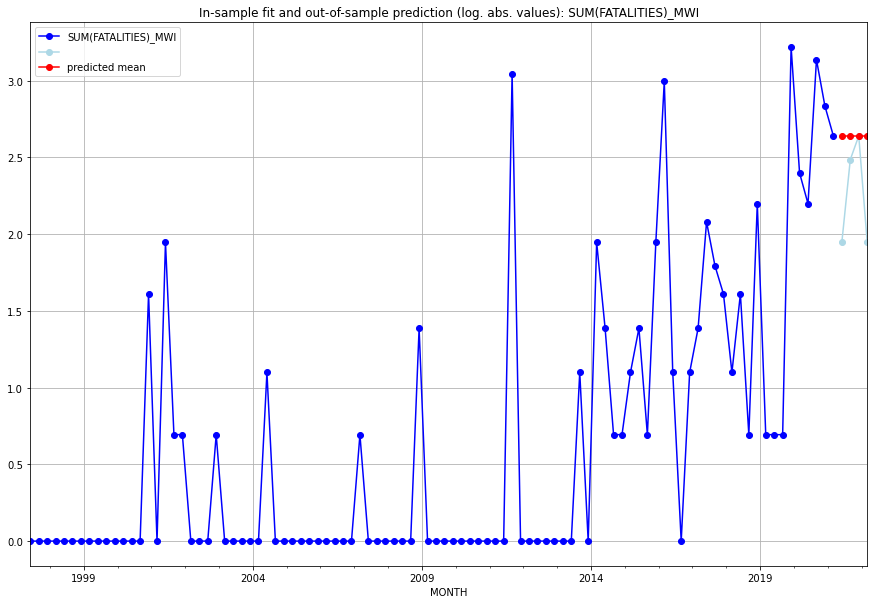

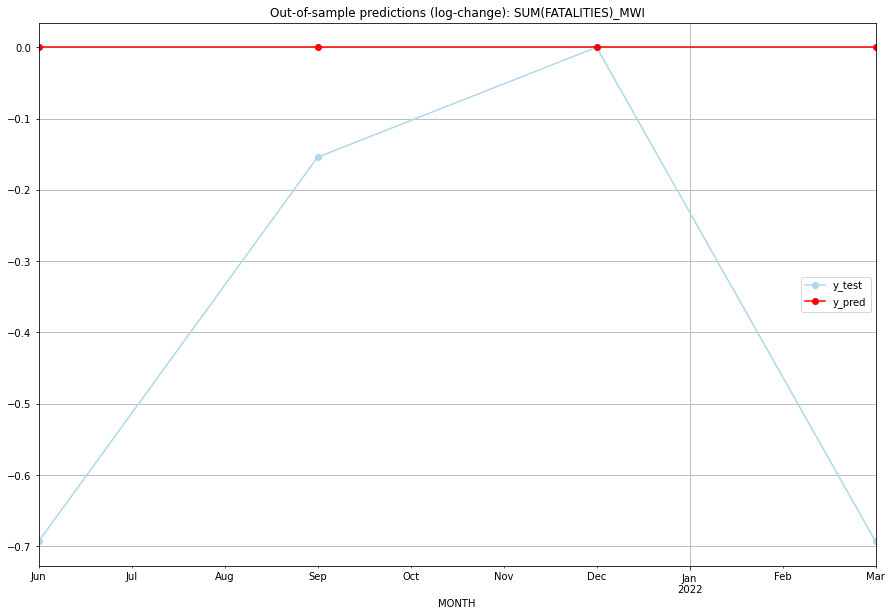

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.639057    1.945910           0.0       -0.693147
1  2021-07  2.639057    2.484907           0.0       -0.154151
2  2021-10  2.639057    2.639057           0.0        0.000000
3  2022-01  2.639057    1.945910           0.0       -0.693147
TADDA: 0.3851112602367873
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.639057    1.945910           0.0       -0.693147   MWI
1 2021-07-01  2.639057    2.484907           0.0       -0.154151   MWI
2 2021-10-01  2.639057    2.639057           0.0        0.000000   MWI
3 2022-01-01  2.639057    1.945910           0.0       -0.693147   MWI
Execution time: 00:01
######## MYS (149/234) #########
0
Neighbor countries: []
Getting Data for MYS
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH     

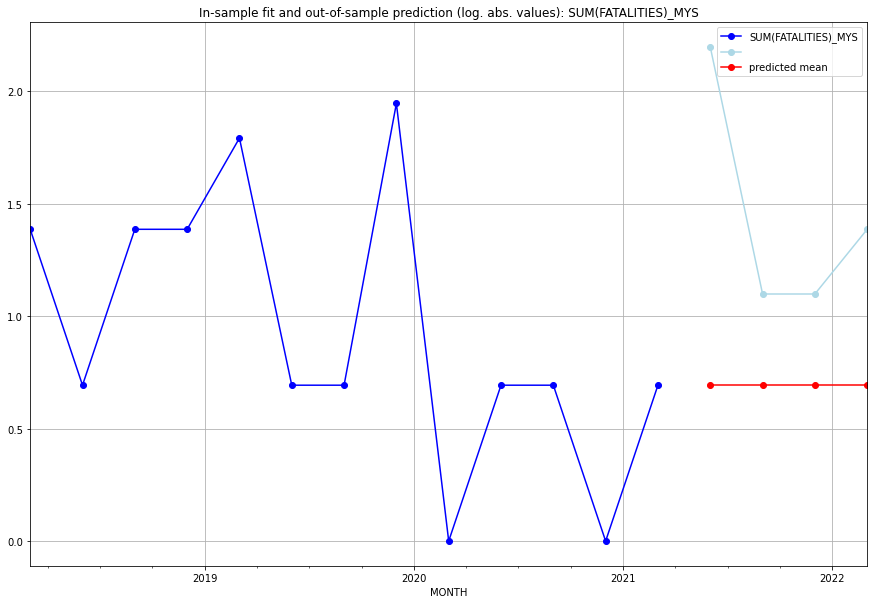

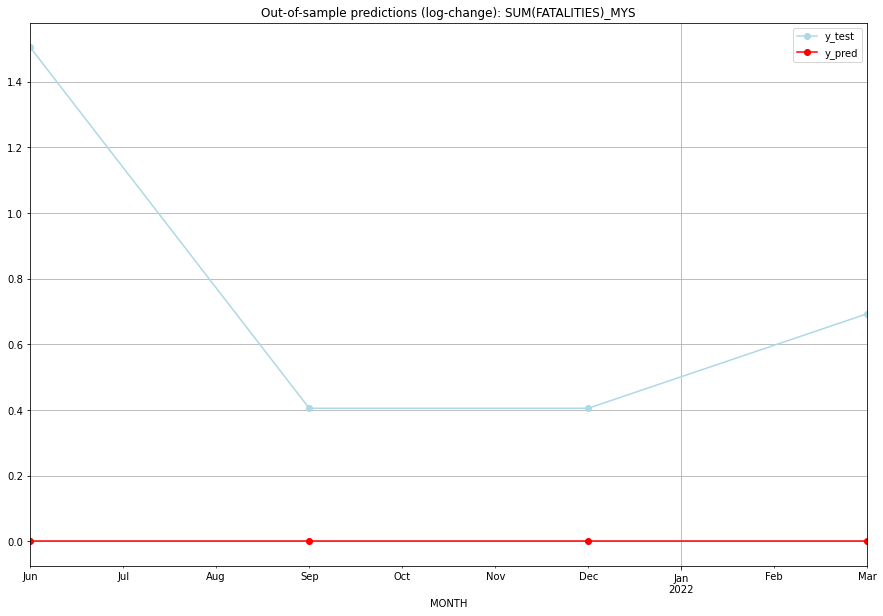

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    2.197225           0.0        1.504077
1  2021-07  0.693147    1.098612           0.0        0.405465
2  2021-10  0.693147    1.098612           0.0        0.405465
3  2022-01  0.693147    1.386294           0.0        0.693147
TADDA: 0.7520386983881373
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    2.197225           0.0        1.504077   MYS
1 2021-07-01  0.693147    1.098612           0.0        0.405465   MYS
2 2021-10-01  0.693147    1.098612           0.0        0.405465   MYS
3 2022-01-01  0.693147    1.386294           0.0        0.693147   MYS
Execution time: 00:01
######## MYT (150/234) #########
0
Neighbor countries: []
Getting Data for MYT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       


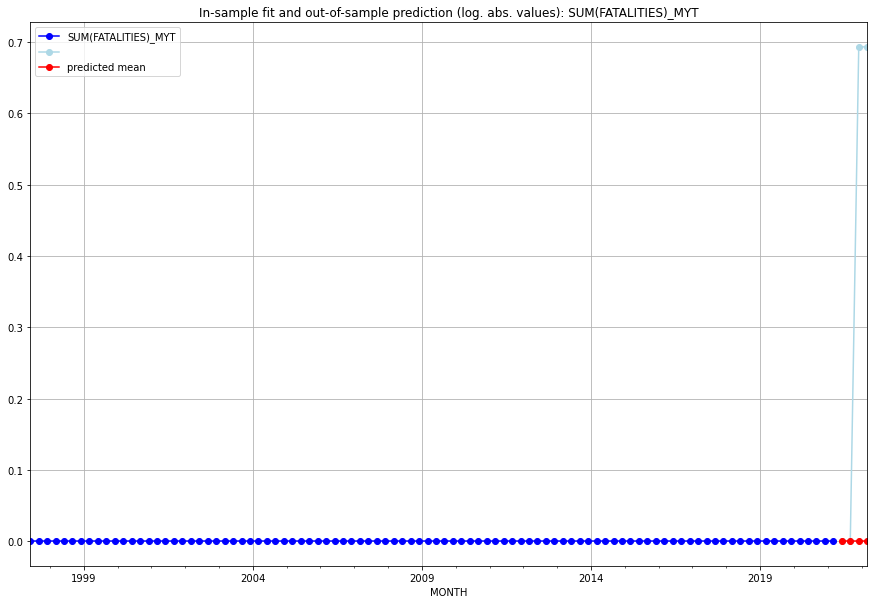

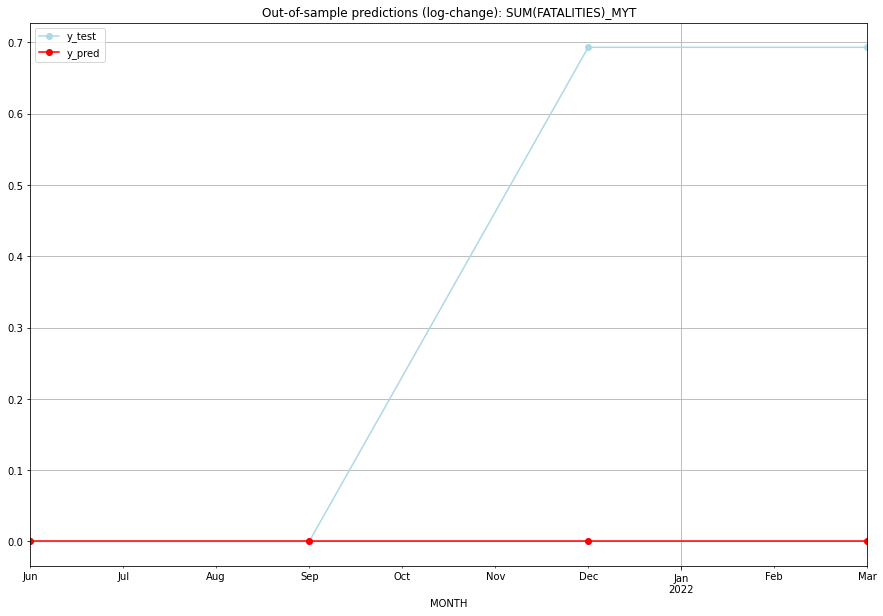

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.693147           0.0        0.693147
3  2022-01       0.0    0.693147           0.0        0.693147
TADDA: 0.34657359027997264
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   MYT
1 2021-07-01       0.0    0.000000           0.0        0.000000   MYT
2 2021-10-01       0.0    0.693147           0.0        0.693147   MYT
3 2022-01-01       0.0    0.693147           0.0        0.693147   MYT
Execution time: 00:01
######## NAM (151/234) #########
0
Neighbor countries: []
Getting Data for NAM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH  

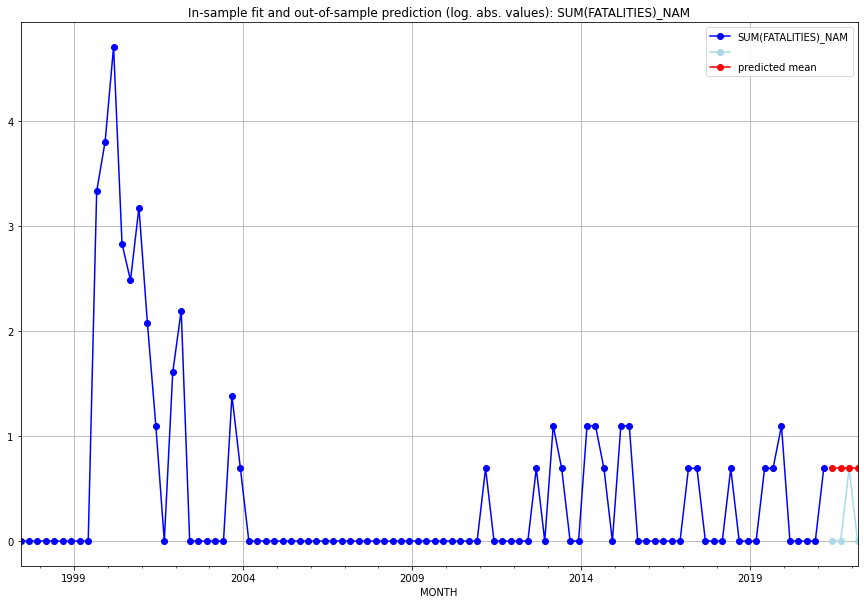

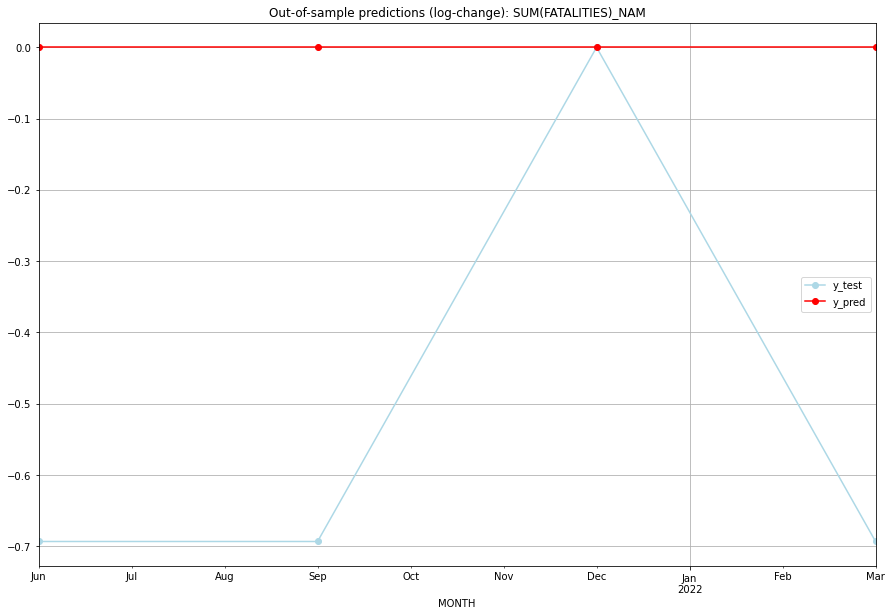

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.000000           0.0       -0.693147
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    0.693147           0.0        0.000000
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.000000           0.0       -0.693147   NAM
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   NAM
2 2021-10-01  0.693147    0.693147           0.0        0.000000   NAM
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   NAM
Execution time: 00:01
######## NCL (152/234) #########
0
Neighbor countries: []
Getting Data for NCL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021

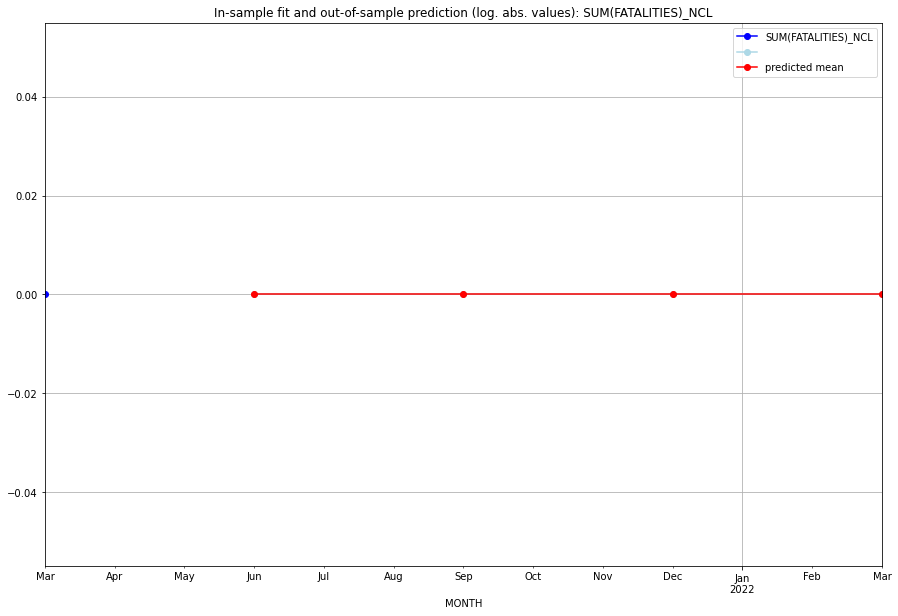

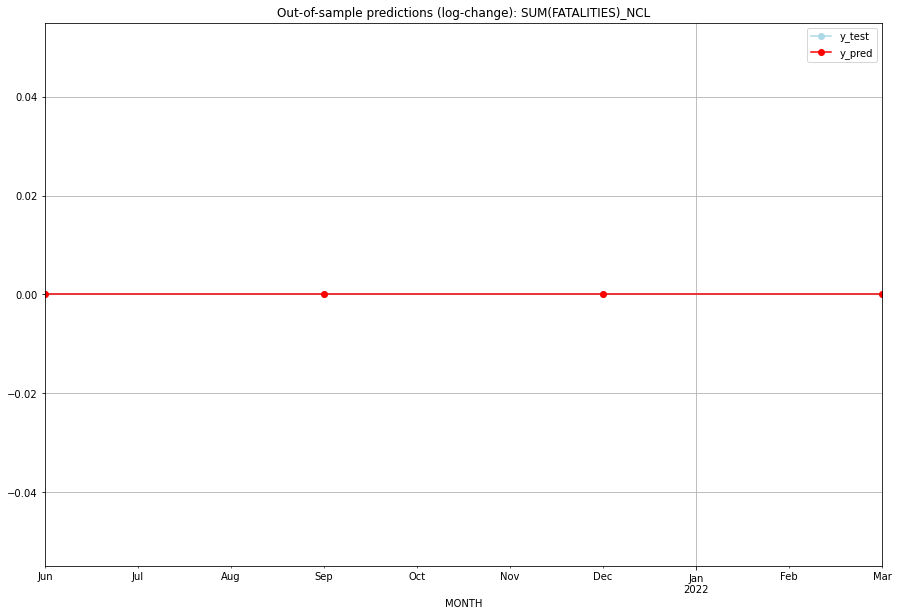

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   NCL
1 2021-07-01       0.0         0.0           0.0             0.0   NCL
2 2021-10-01       0.0         0.0           0.0             0.0   NCL
3 2022-01-01       0.0         0.0           0.0             0.0   NCL
Execution time: 00:01
######## NER (153/234) #########
0
Neighbor countries: []
Getting Data for NER
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

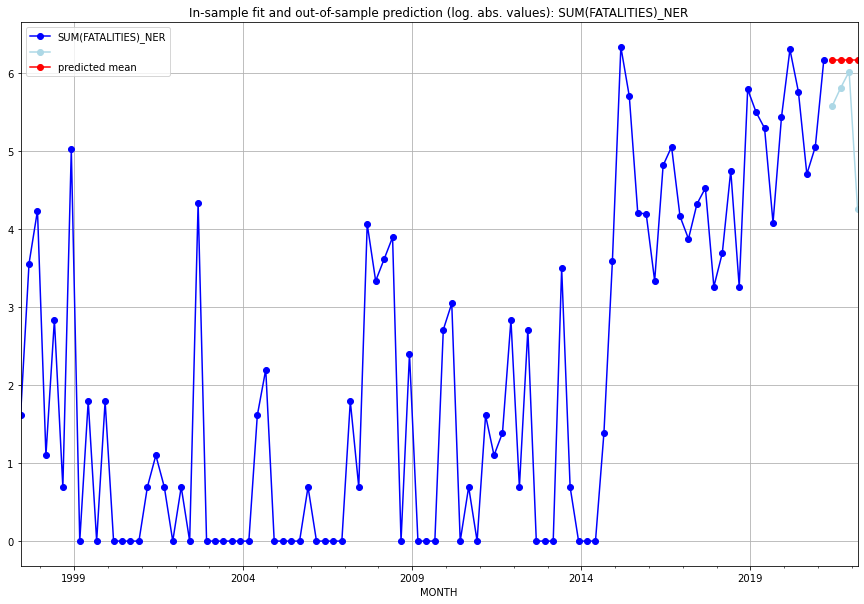

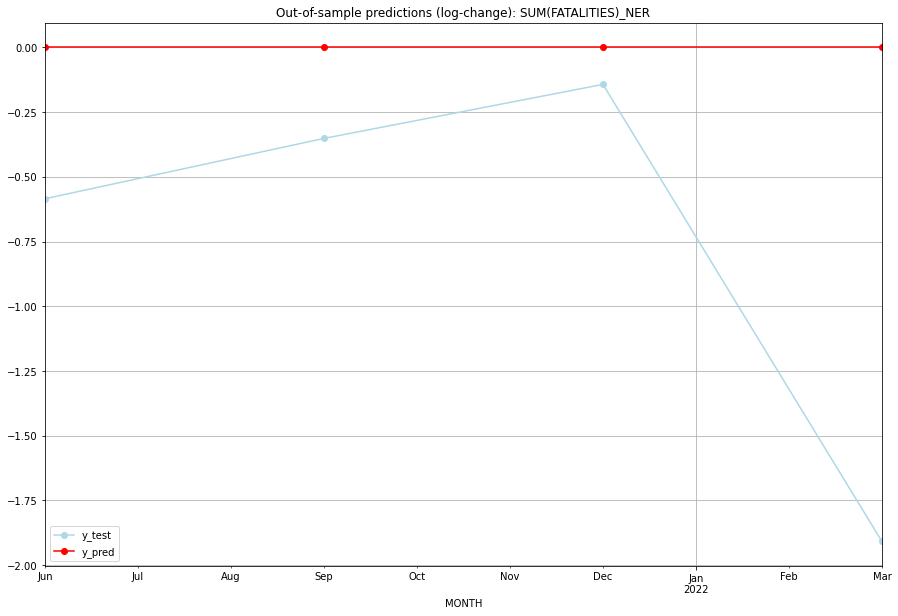

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.156979    5.572154           0.0       -0.584825
1  2021-07  6.156979    5.805135           0.0       -0.351844
2  2021-10  6.156979    6.013715           0.0       -0.143264
3  2022-01  6.156979    4.248495           0.0       -1.908484
TADDA: 0.7471041357889514
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.156979    5.572154           0.0       -0.584825   NER
1 2021-07-01  6.156979    5.805135           0.0       -0.351844   NER
2 2021-10-01  6.156979    6.013715           0.0       -0.143264   NER
3 2022-01-01  6.156979    4.248495           0.0       -1.908484   NER
Execution time: 00:01
######## NGA (154/234) #########
0
Neighbor countries: []
Getting Data for NGA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

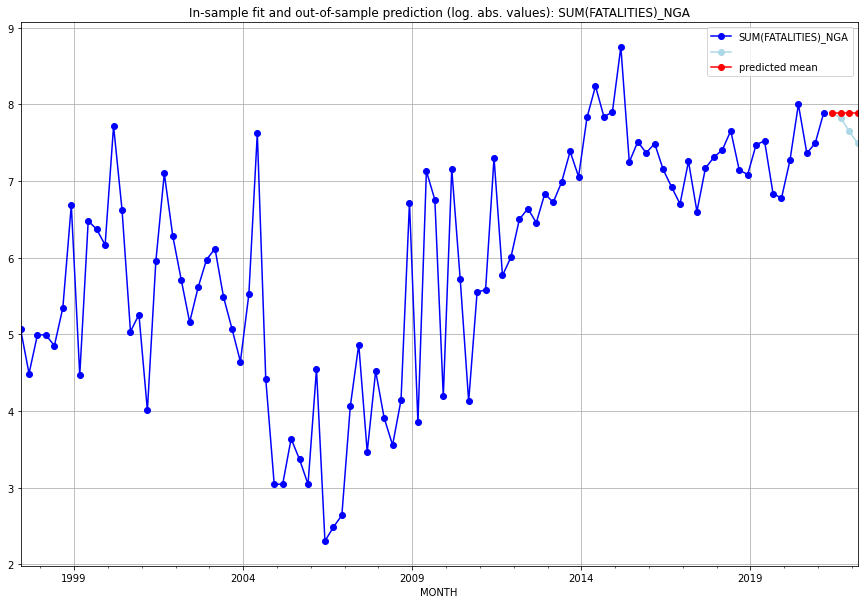

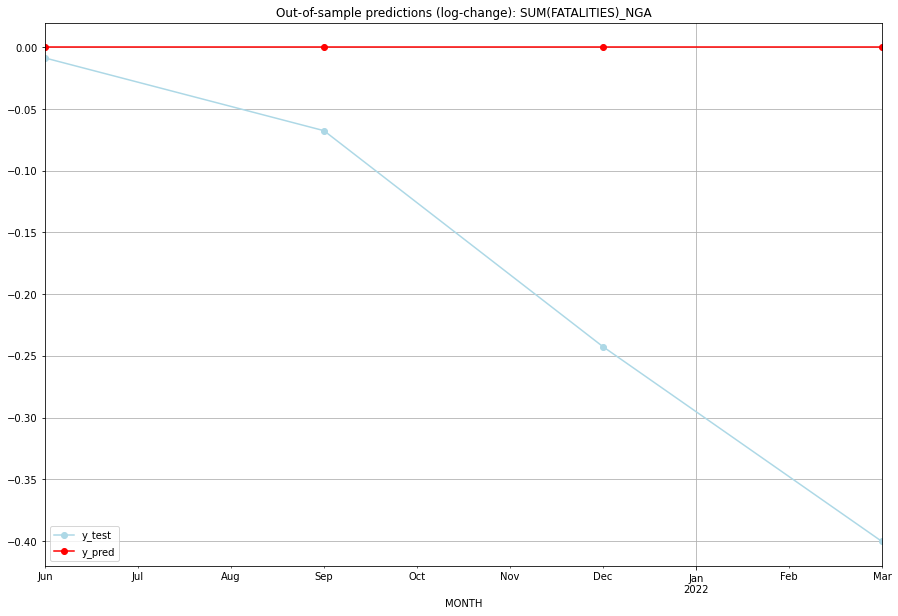

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  7.893199    7.884577           0.0       -0.008622
1  2021-07  7.893199    7.825645           0.0       -0.067554
2  2021-10  7.893199    7.650645           0.0       -0.242554
3  2022-01  7.893199    7.492760           0.0       -0.400439
TADDA: 0.17979234575071135
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  7.893199    7.884577           0.0       -0.008622   NGA
1 2021-07-01  7.893199    7.825645           0.0       -0.067554   NGA
2 2021-10-01  7.893199    7.650645           0.0       -0.242554   NGA
3 2022-01-01  7.893199    7.492760           0.0       -0.400439   NGA
Execution time: 00:01
######## NIC (155/234) #########
0
Neighbor countries: []
Getting Data for NIC
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH    

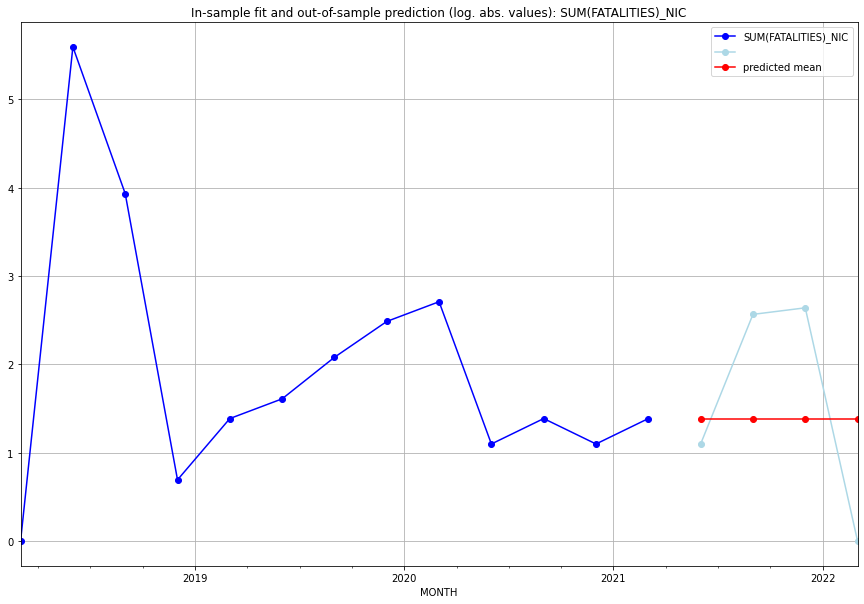

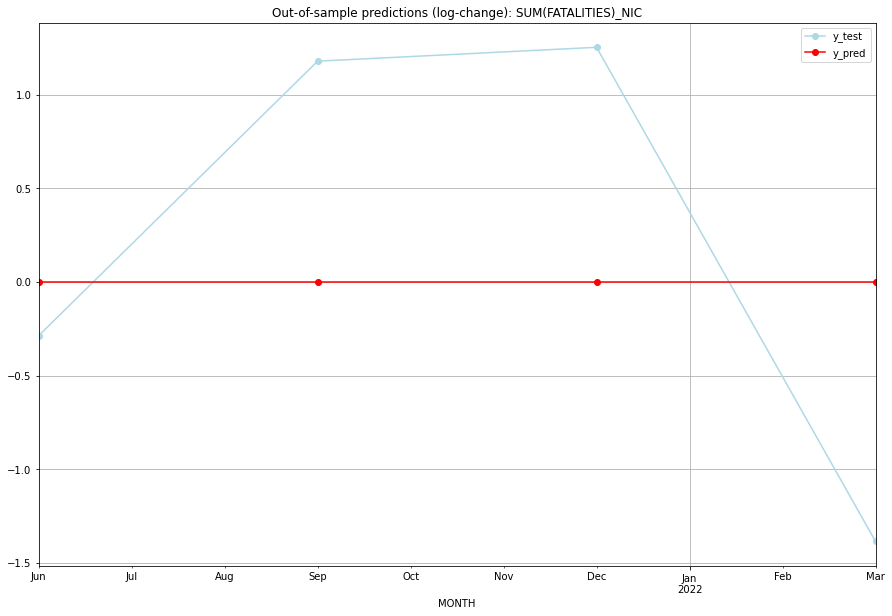

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.386294    1.098612           0.0       -0.287682
1  2021-07  1.386294    2.564949           0.0        1.178655
2  2021-10  1.386294    2.639057           0.0        1.252763
3  2022-01  1.386294    0.000000           0.0       -1.386294
TADDA: 1.0263485996021713
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.386294    1.098612           0.0       -0.287682   NIC
1 2021-07-01  1.386294    2.564949           0.0        1.178655   NIC
2 2021-10-01  1.386294    2.639057           0.0        1.252763   NIC
3 2022-01-01  1.386294    0.000000           0.0       -1.386294   NIC
Execution time: 00:01
######## NLD (156/234) #########
0
Neighbor countries: []
Getting Data for NLD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

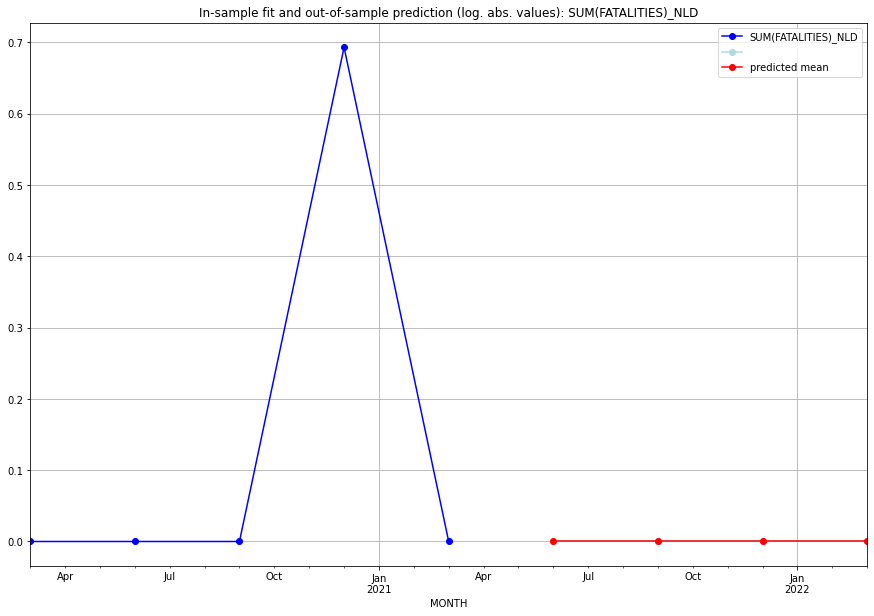

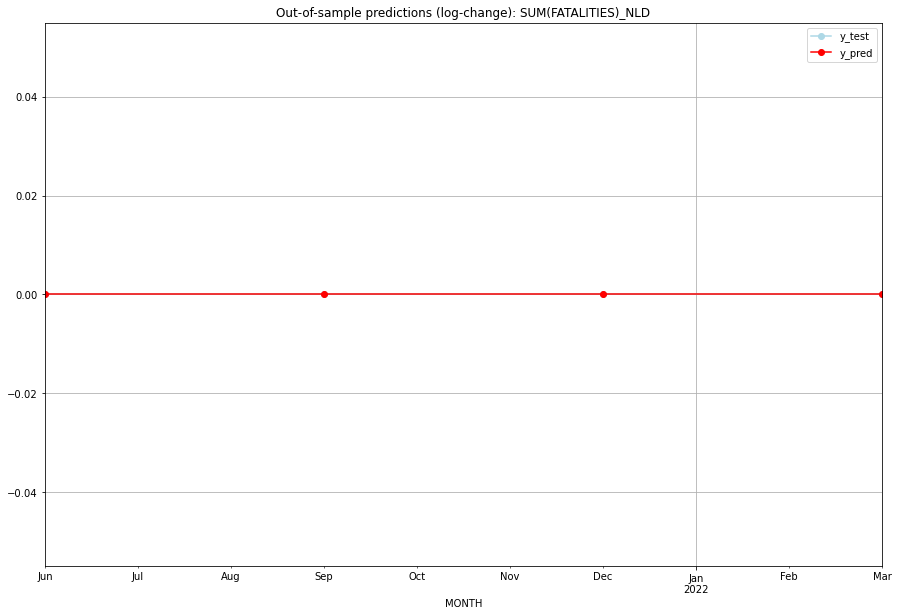

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   NLD
1 2021-07-01       0.0         0.0           0.0             0.0   NLD
2 2021-10-01       0.0         0.0           0.0             0.0   NLD
3 2022-01-01       0.0         0.0           0.0             0.0   NLD
Execution time: 00:01
######## NOR (157/234) #########
0
Neighbor countries: []
Getting Data for NOR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

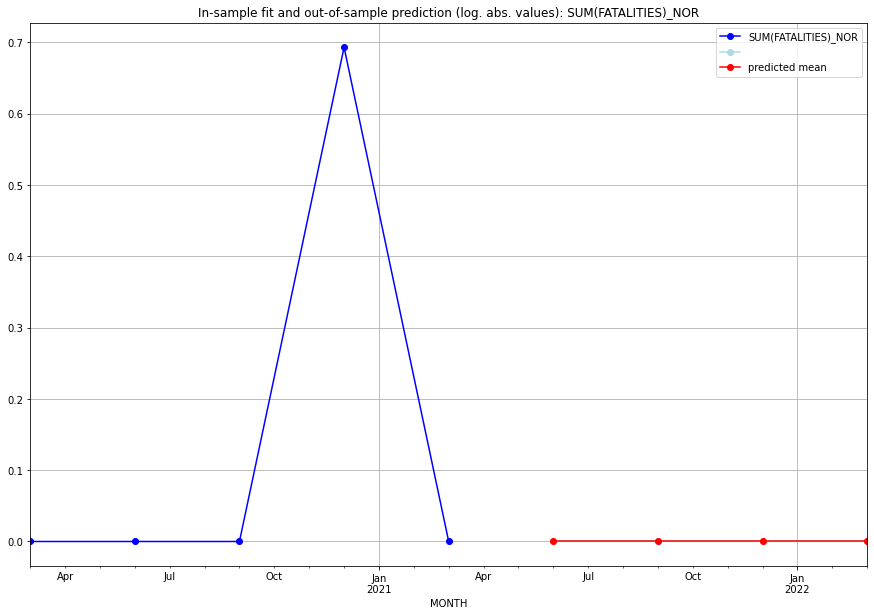

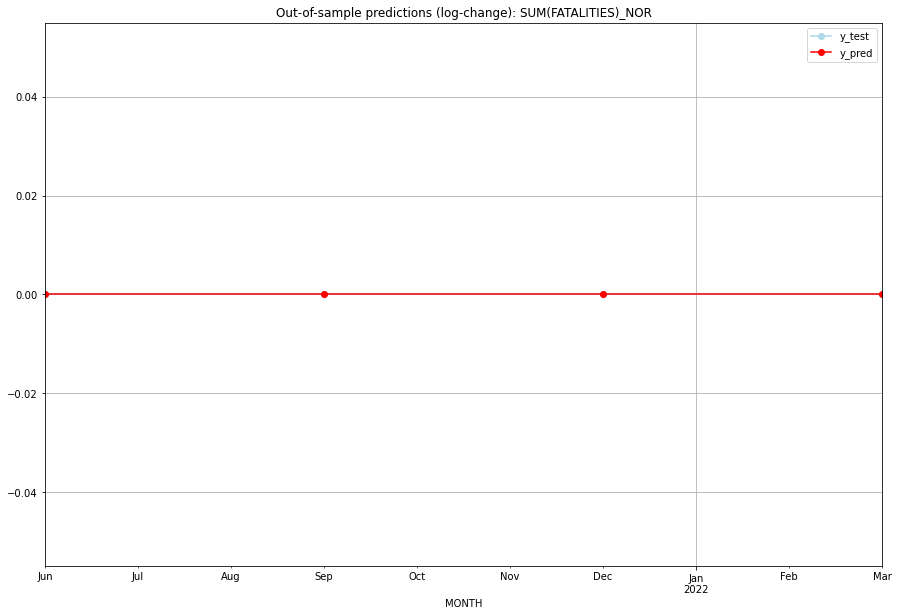

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   NOR
1 2021-07-01       0.0         0.0           0.0             0.0   NOR
2 2021-10-01       0.0         0.0           0.0             0.0   NOR
3 2022-01-01       0.0         0.0           0.0             0.0   NOR
Execution time: 00:01
######## NPL (158/234) #########
0
Neighbor countries: []
Getting Data for NPL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH            
2021-04

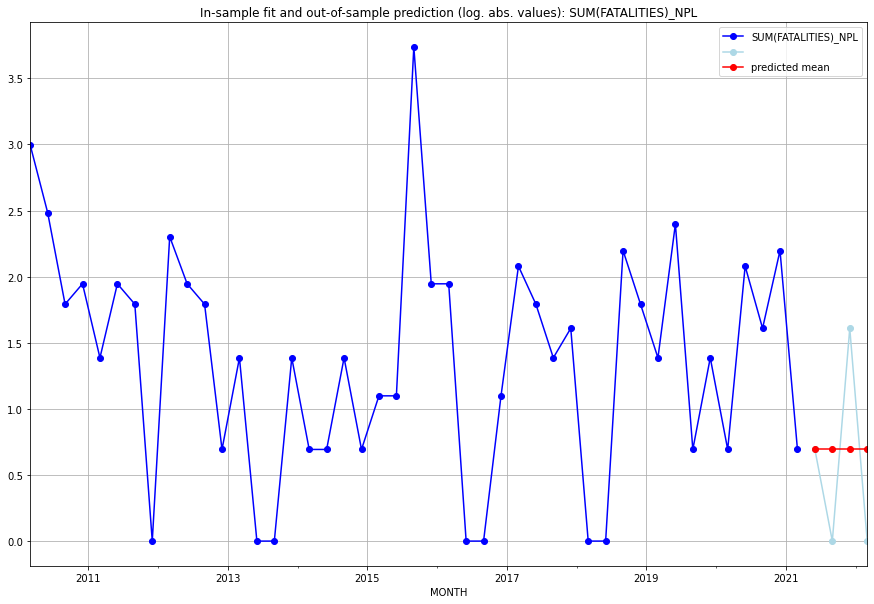

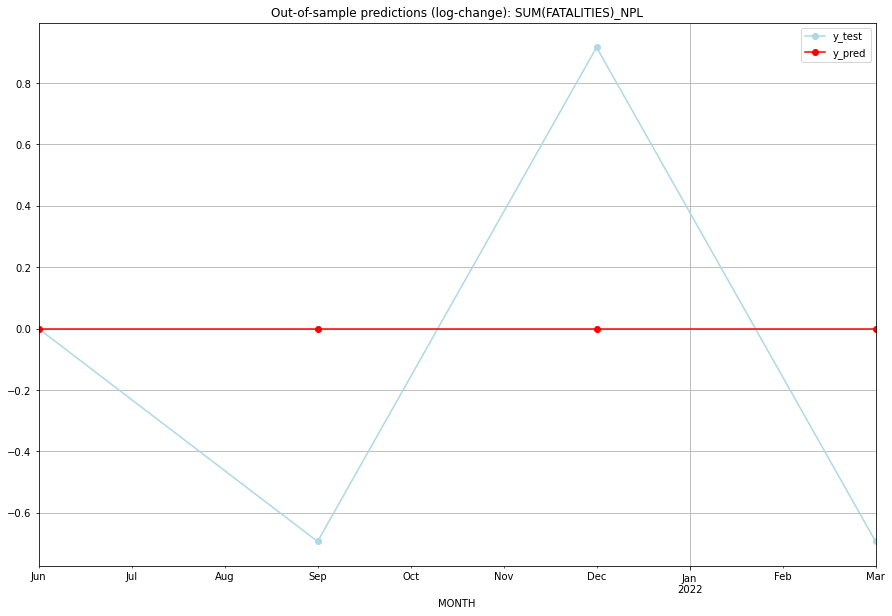

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.693147           0.0        0.000000
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    1.609438           0.0        0.916291
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5756462732485115
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.693147           0.0        0.000000   NPL
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   NPL
2 2021-10-01  0.693147    1.609438           0.0        0.916291   NPL
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   NPL
Execution time: 00:01
######## NZL (159/234) #########
0
Neighbor countries: []
Getting Data for NZL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021

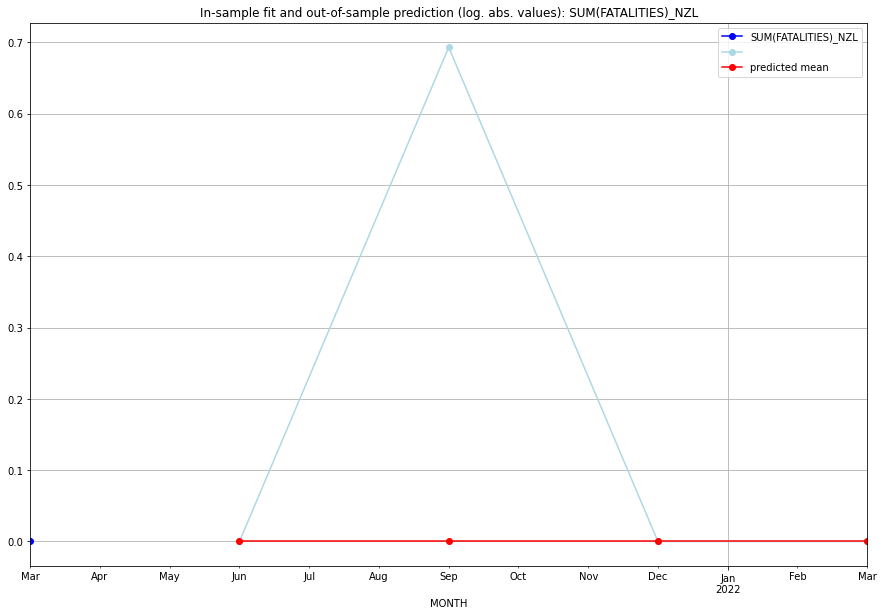

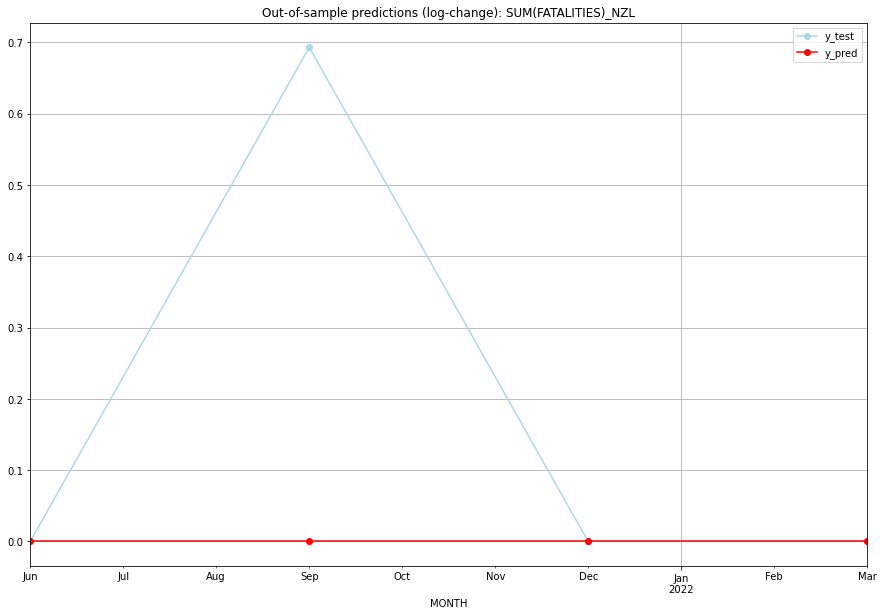

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   NZL
1 2021-07-01       0.0    0.693147           0.0        0.693147   NZL
2 2021-10-01       0.0    0.000000           0.0        0.000000   NZL
3 2022-01-01       0.0    0.000000           0.0        0.000000   NZL
Execution time: 00:01
######## OMN (160/234) #########
0
Neighbor countries: []
Getting Data for OMN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
           0
MONTH       
2

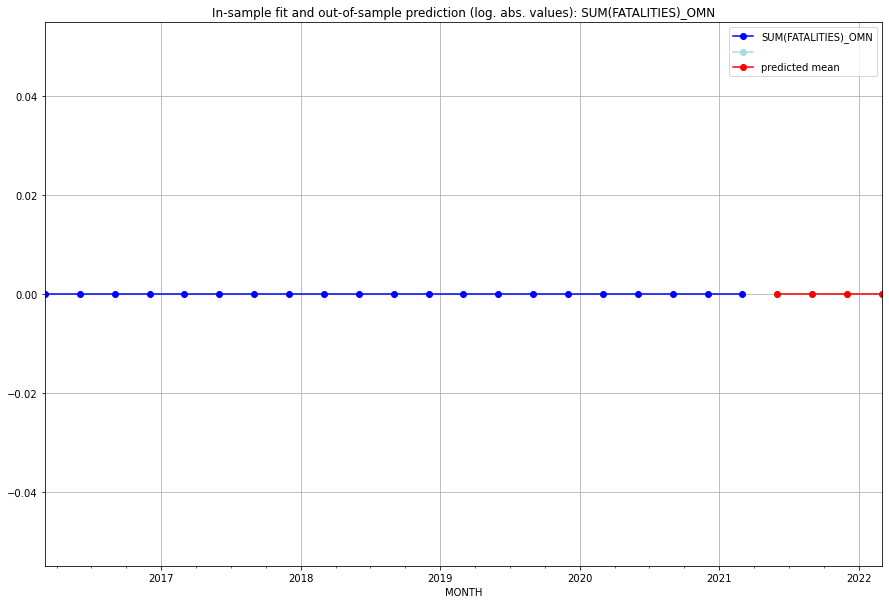

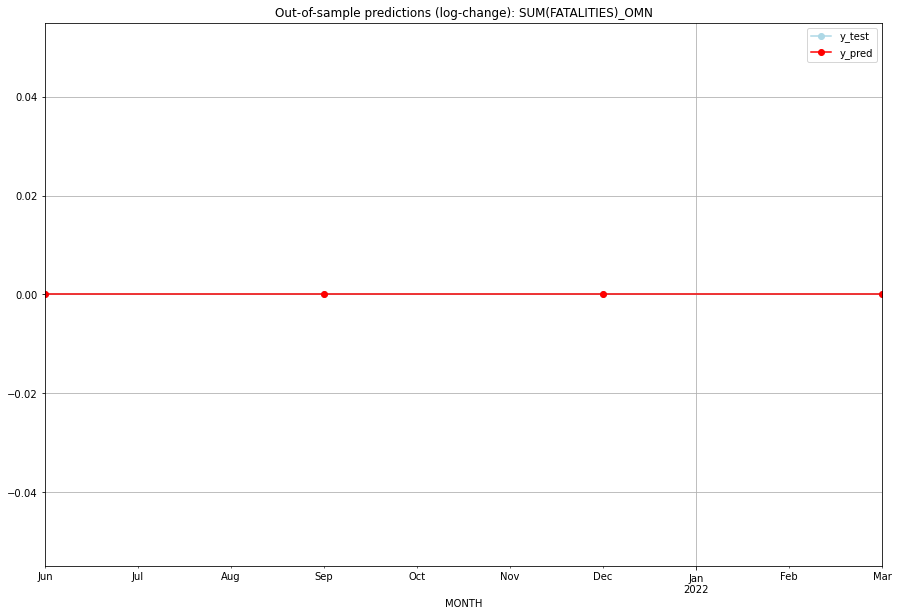

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   OMN
1 2021-07-01       0.0         0.0           0.0             0.0   OMN
2 2021-10-01       0.0         0.0           0.0             0.0   OMN
3 2022-01-01       0.0         0.0           0.0             0.0   OMN
Execution time: 00:01
######## PAK (161/234) #########
0
Neighbor countries: []
Getting Data for PAK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH            
2021-04

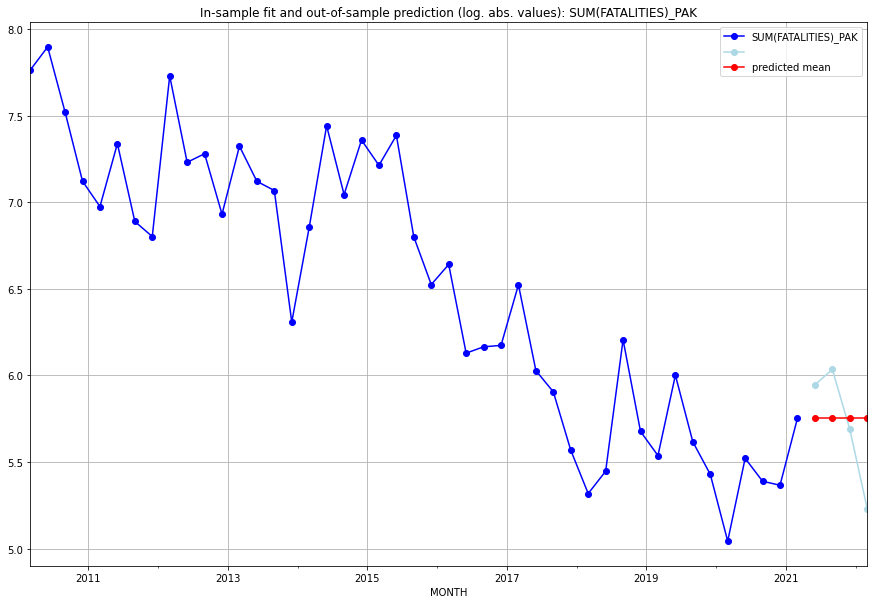

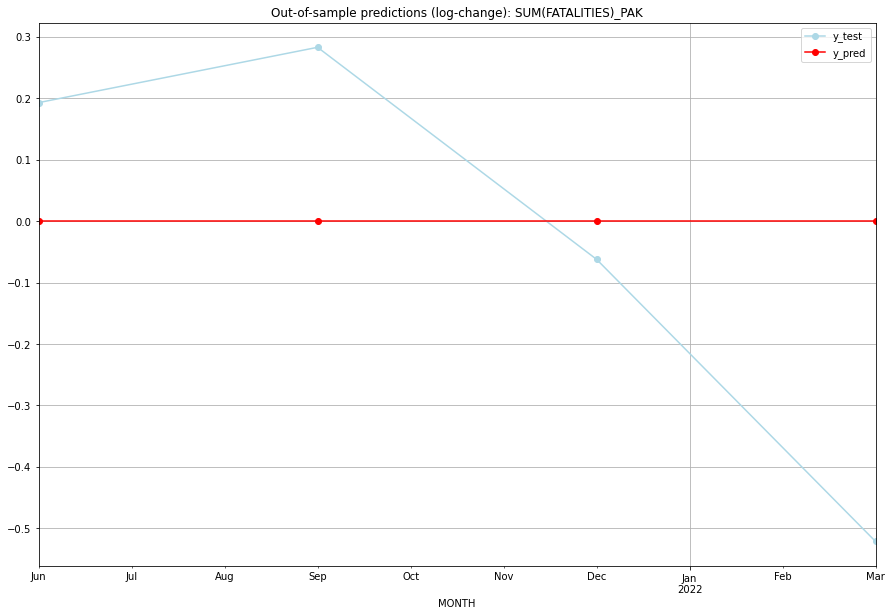

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  5.752573    5.945421           0.0        0.192848
1  2021-07  5.752573    6.035481           0.0        0.282909
2  2021-10  5.752573    5.690359           0.0       -0.062213
3  2022-01  5.752573    5.231109           0.0       -0.521464
TADDA: 0.26485849248817117
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  5.752573    5.945421           0.0        0.192848   PAK
1 2021-07-01  5.752573    6.035481           0.0        0.282909   PAK
2 2021-10-01  5.752573    5.690359           0.0       -0.062213   PAK
3 2022-01-01  5.752573    5.231109           0.0       -0.521464   PAK
Execution time: 00:01
######## PAN (162/234) #########
0
Neighbor countries: []
Getting Data for PAN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH    

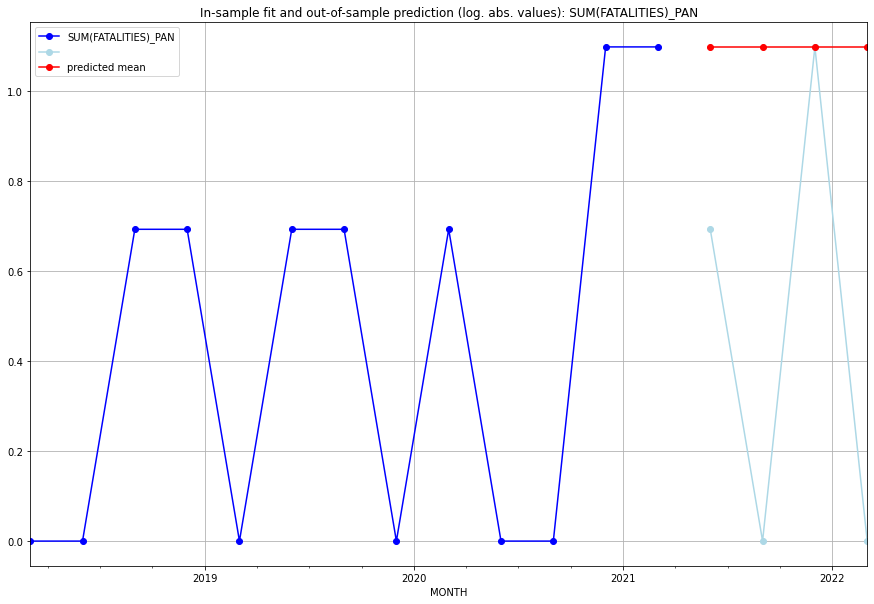

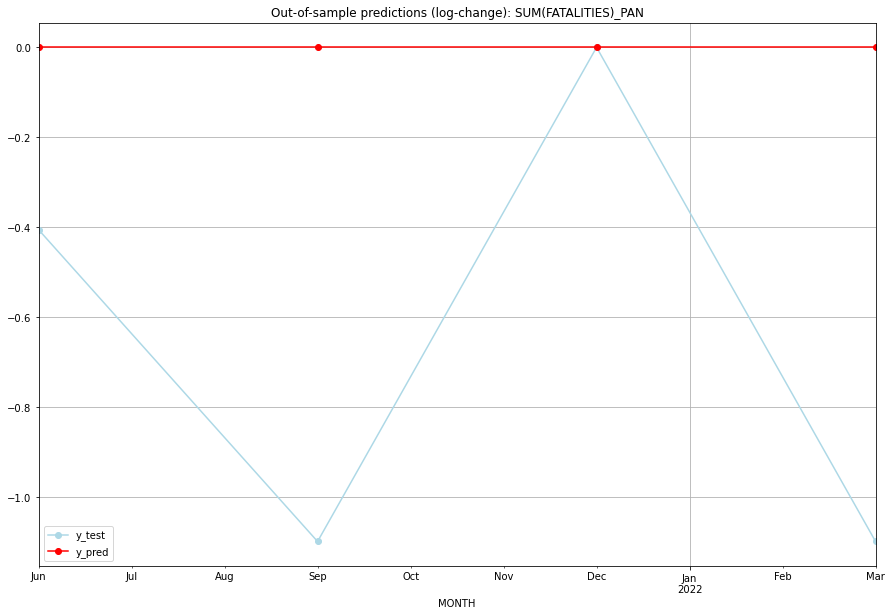

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    0.693147           0.0       -0.405465
1  2021-07  1.098612    0.000000           0.0       -1.098612
2  2021-10  1.098612    1.098612           0.0        0.000000
3  2022-01  1.098612    0.000000           0.0       -1.098612
TADDA: 0.6506724213610959
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    0.693147           0.0       -0.405465   PAN
1 2021-07-01  1.098612    0.000000           0.0       -1.098612   PAN
2 2021-10-01  1.098612    1.098612           0.0        0.000000   PAN
3 2022-01-01  1.098612    0.000000           0.0       -1.098612   PAN
Execution time: 00:01
######## PER (163/234) #########
0
Neighbor countries: []
Getting Data for PER
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH     

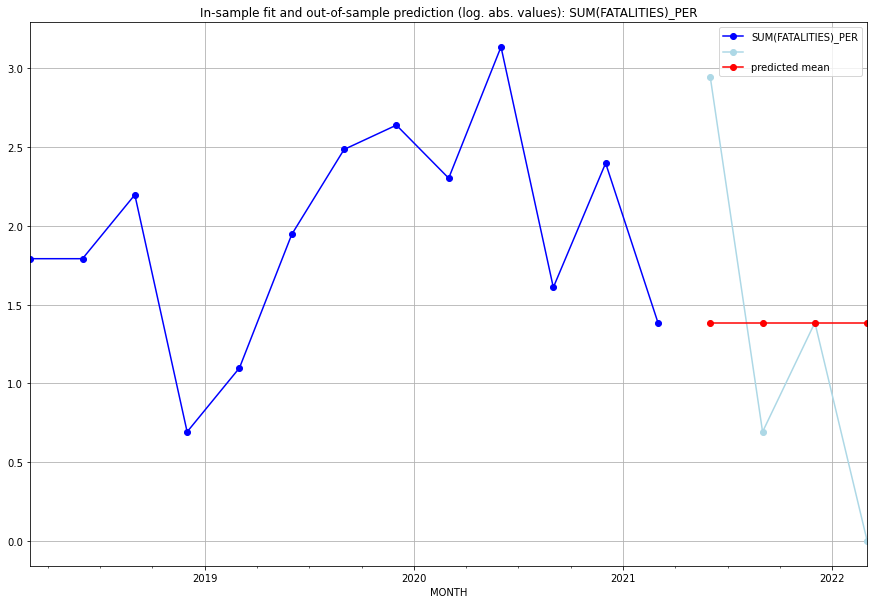

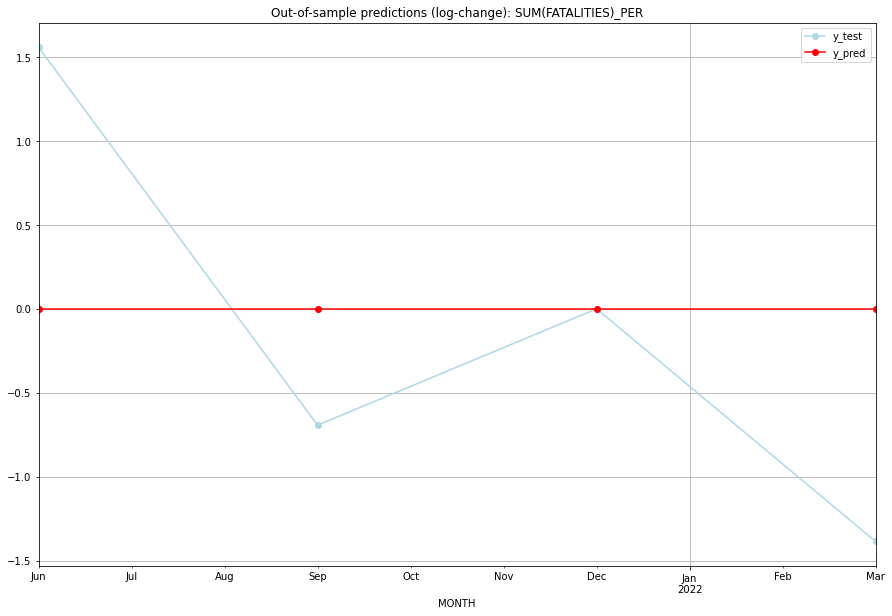

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.386294    2.944439           0.0        1.558145
1  2021-07  1.386294    0.693147           0.0       -0.693147
2  2021-10  1.386294    1.386294           0.0        0.000000
3  2022-01  1.386294    0.000000           0.0       -1.386294
TADDA: 0.9093965399315964
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.386294    2.944439           0.0        1.558145   PER
1 2021-07-01  1.386294    0.693147           0.0       -0.693147   PER
2 2021-10-01  1.386294    1.386294           0.0        0.000000   PER
3 2022-01-01  1.386294    0.000000           0.0       -1.386294   PER
Execution time: 00:01
######## PHL (164/234) #########
0
Neighbor countries: []
Getting Data for PHL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH     

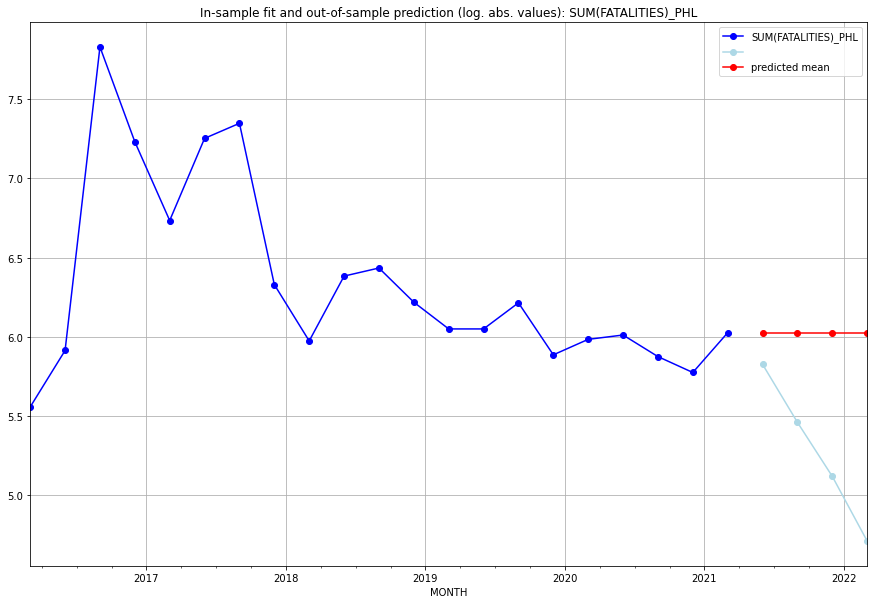

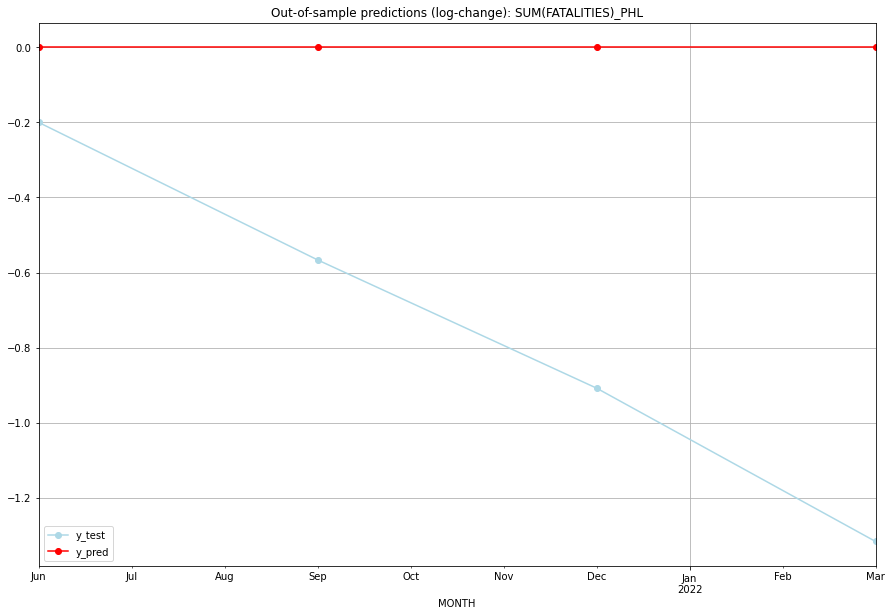

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.025866    5.826000           0.0       -0.199866
1  2021-07  6.025866    5.459586           0.0       -0.566280
2  2021-10  6.025866    5.117994           0.0       -0.907872
3  2022-01  6.025866    4.709530           0.0       -1.316336
TADDA: 0.7475885650118896
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.025866    5.826000           0.0       -0.199866   PHL
1 2021-07-01  6.025866    5.459586           0.0       -0.566280   PHL
2 2021-10-01  6.025866    5.117994           0.0       -0.907872   PHL
3 2022-01-01  6.025866    4.709530           0.0       -1.316336   PHL
Execution time: 00:01
######## PNG (165/234) #########
0
Neighbor countries: []
Getting Data for PNG
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
                0
MONTH       

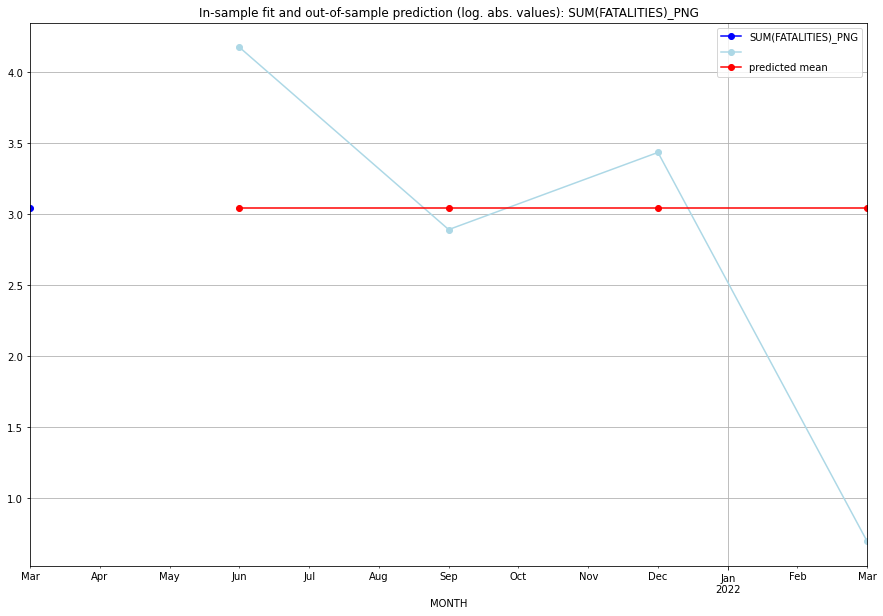

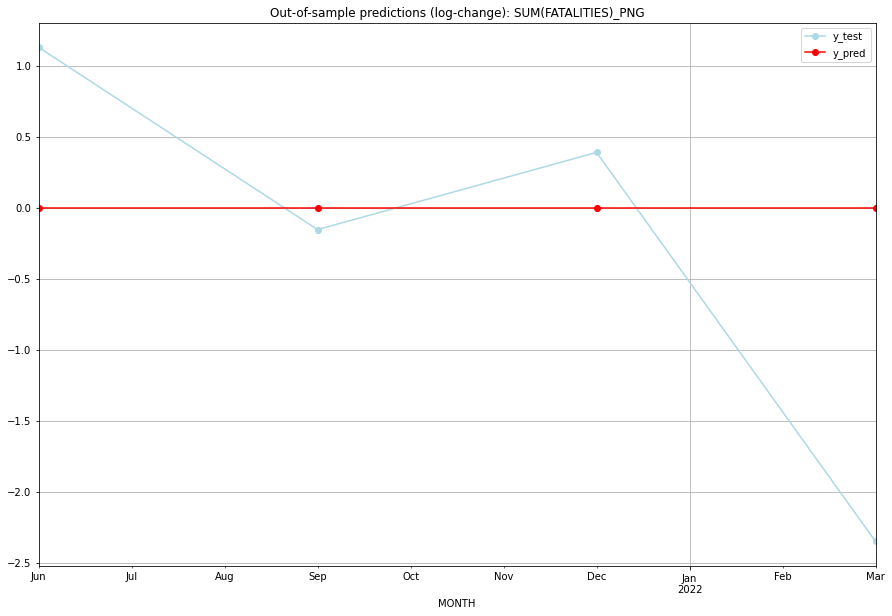

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.044522    4.174387           0.0        1.129865
1  2021-07  3.044522    2.890372           0.0       -0.154151
2  2021-10  3.044522    3.433987           0.0        0.389465
3  2022-01  3.044522    0.693147           0.0       -2.351375
TADDA: 1.0062138839811683
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.044522    4.174387           0.0        1.129865   PNG
1 2021-07-01  3.044522    2.890372           0.0       -0.154151   PNG
2 2021-10-01  3.044522    3.433987           0.0        0.389465   PNG
3 2022-01-01  3.044522    0.693147           0.0       -2.351375   PNG
Execution time: 00:01
######## POL (166/234) #########
0
Neighbor countries: []
Getting Data for POL
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

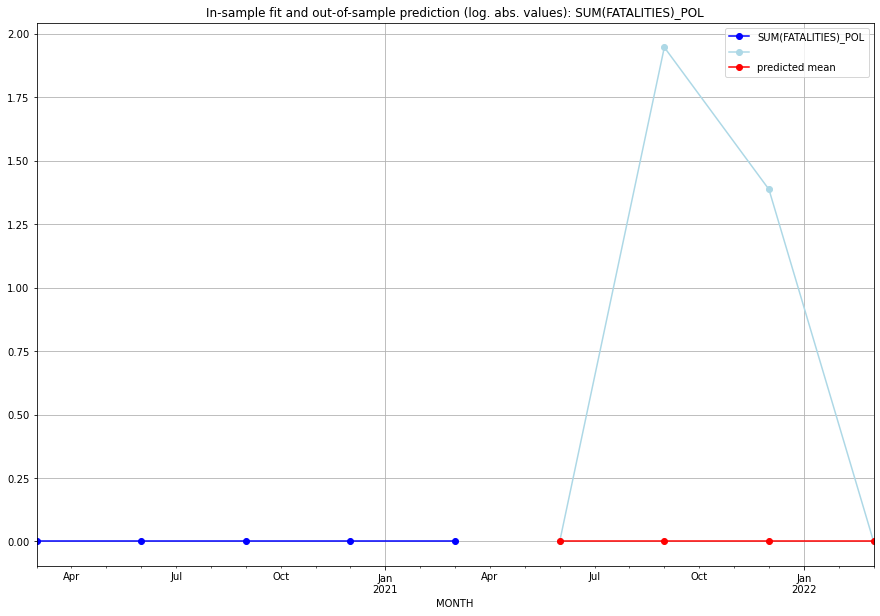

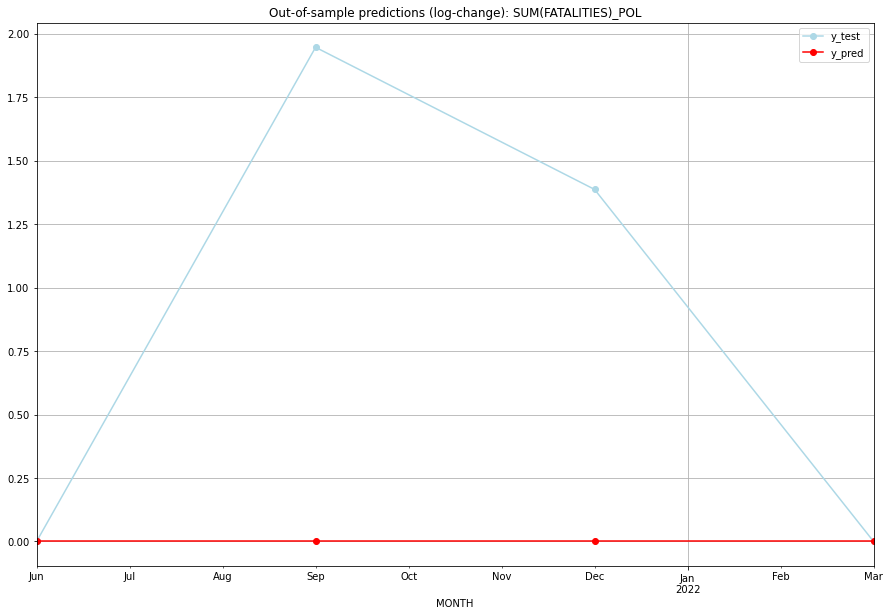

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    1.945910           0.0        1.945910
2  2021-10       0.0    1.386294           0.0        1.386294
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.8330511275438008
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   POL
1 2021-07-01       0.0    1.945910           0.0        1.945910   POL
2 2021-10-01       0.0    1.386294           0.0        1.386294   POL
3 2022-01-01       0.0    0.000000           0.0        0.000000   POL
Execution time: 00:01
######## PRI (167/234) #########
0
Neighbor countries: []
Getting Data for PRI
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
              0
MONTH       

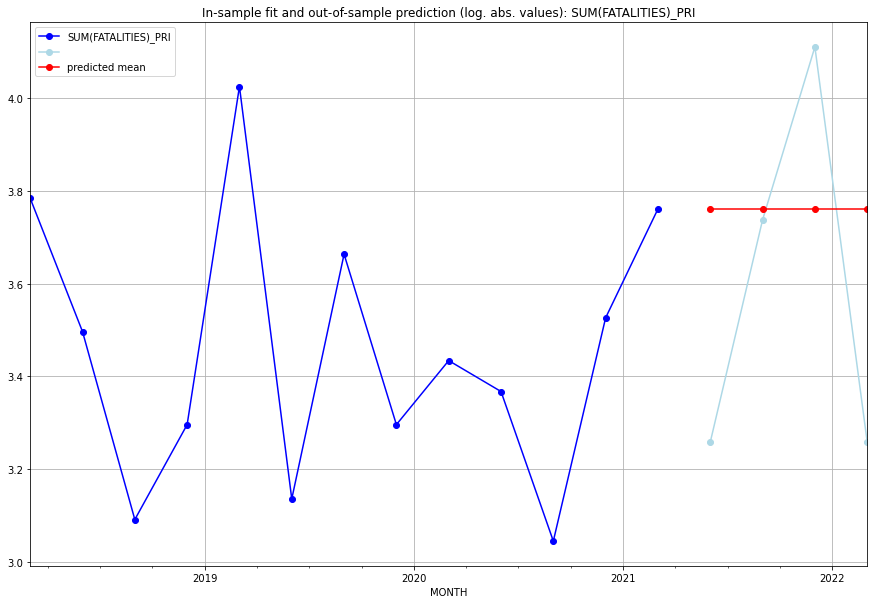

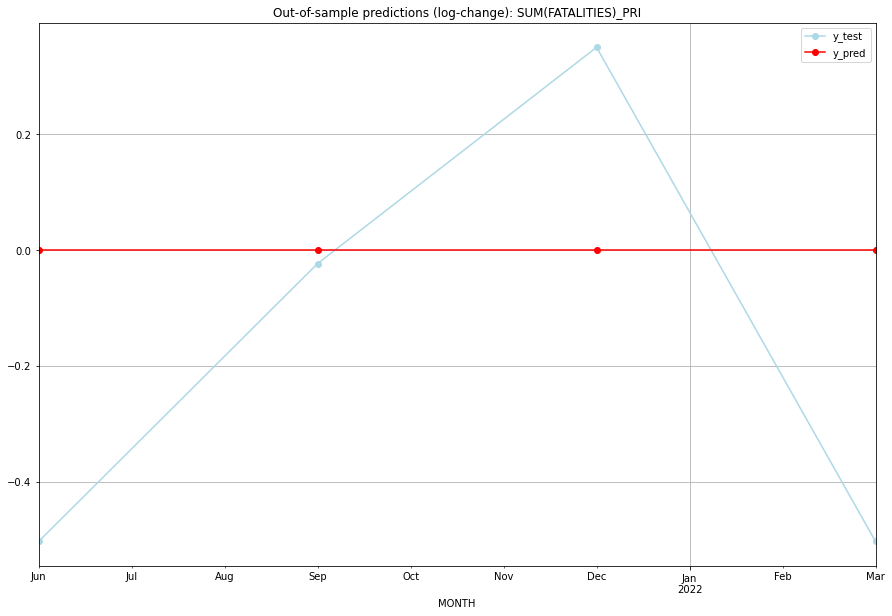

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04    3.7612    3.258097           0.0       -0.503104
1  2021-07    3.7612    3.737670           0.0       -0.023530
2  2021-10    3.7612    4.110874           0.0        0.349674
3  2022-01    3.7612    3.258097           0.0       -0.503104
TADDA: 0.3448528503085255
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01    3.7612    3.258097           0.0       -0.503104   PRI
1 2021-07-01    3.7612    3.737670           0.0       -0.023530   PRI
2 2021-10-01    3.7612    4.110874           0.0        0.349674   PRI
3 2022-01-01    3.7612    3.258097           0.0       -0.503104   PRI
Execution time: 00:01
######## PRK (168/234) #########
0
Neighbor countries: []
Getting Data for PRK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH     

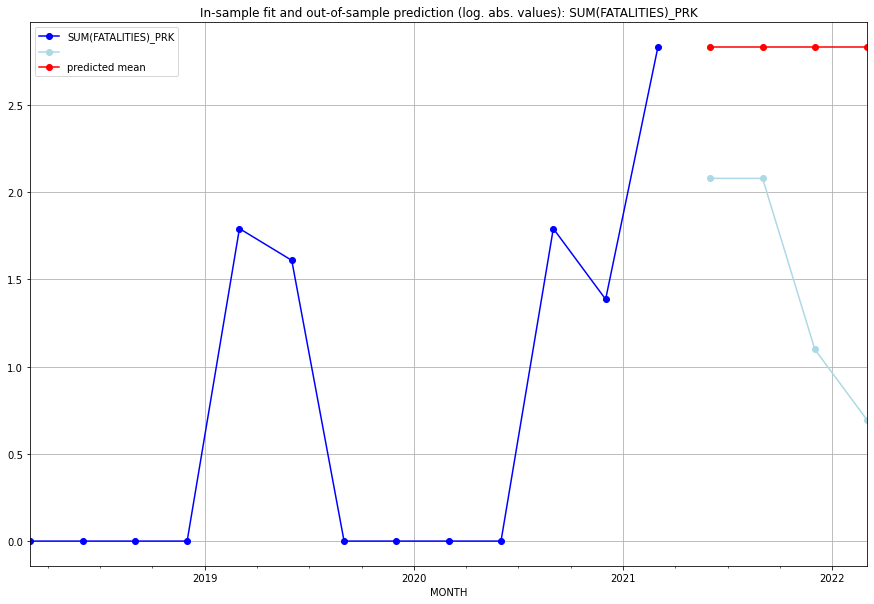

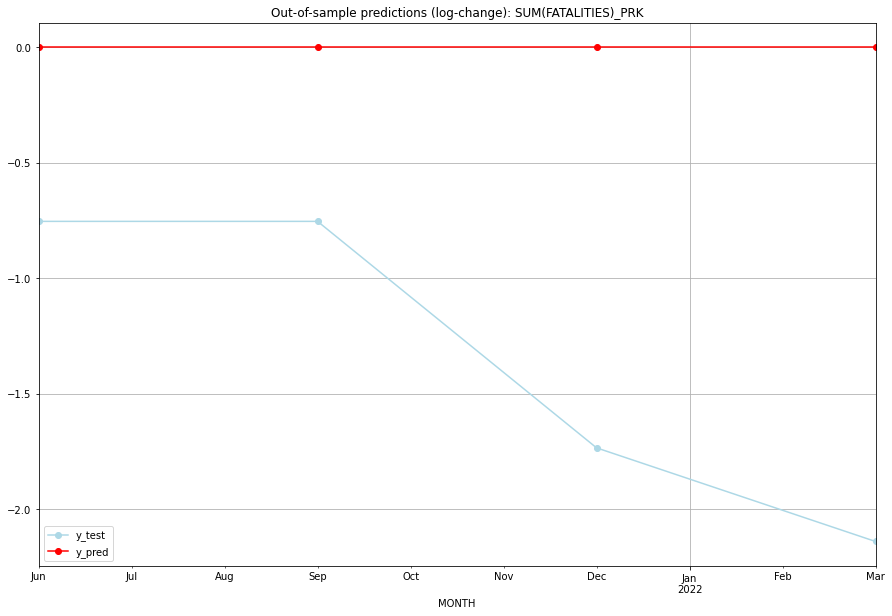

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.833213    2.079442           0.0       -0.753772
1  2021-07  2.833213    2.079442           0.0       -0.753772
2  2021-10  2.833213    1.098612           0.0       -1.734601
3  2022-01  2.833213    0.693147           0.0       -2.140066
TADDA: 1.3455527059092842
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.833213    2.079442           0.0       -0.753772   PRK
1 2021-07-01  2.833213    2.079442           0.0       -0.753772   PRK
2 2021-10-01  2.833213    1.098612           0.0       -1.734601   PRK
3 2022-01-01  2.833213    0.693147           0.0       -2.140066   PRK
Execution time: 00:01
######## PRT (169/234) #########
0
Neighbor countries: []
Getting Data for PRT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

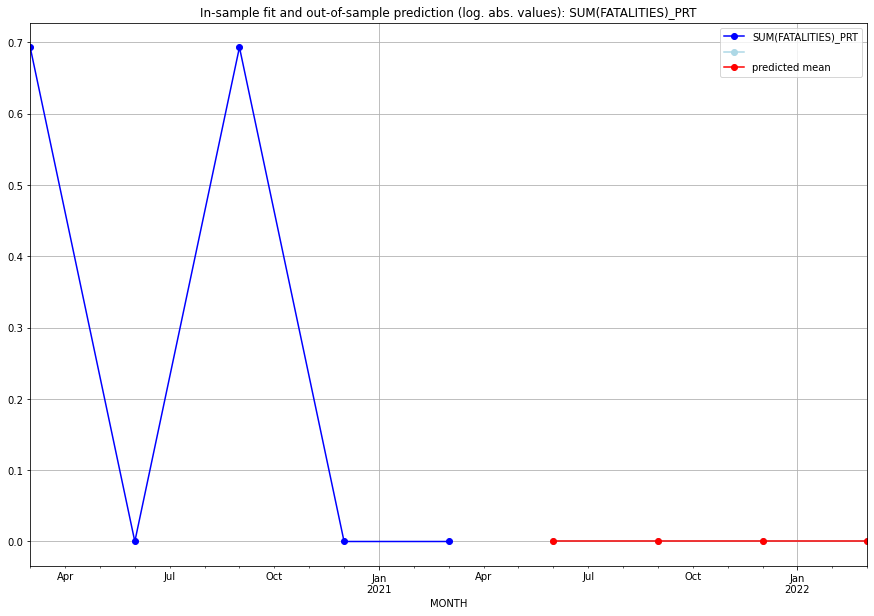

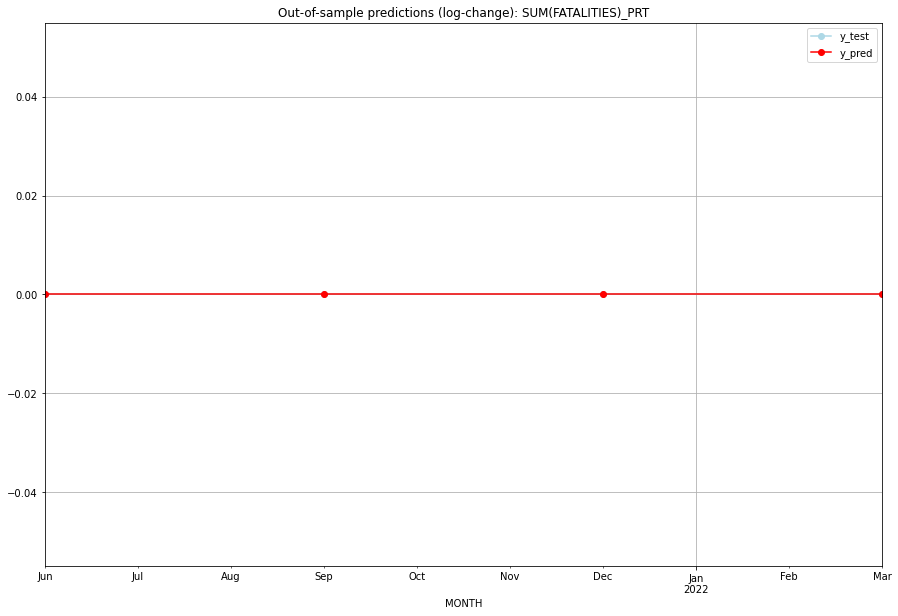

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   PRT
1 2021-07-01       0.0         0.0           0.0             0.0   PRT
2 2021-10-01       0.0         0.0           0.0             0.0   PRT
3 2022-01-01       0.0         0.0           0.0             0.0   PRT
Execution time: 00:01
######## PRY (170/234) #########
0
Neighbor countries: []
Getting Data for PRY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04

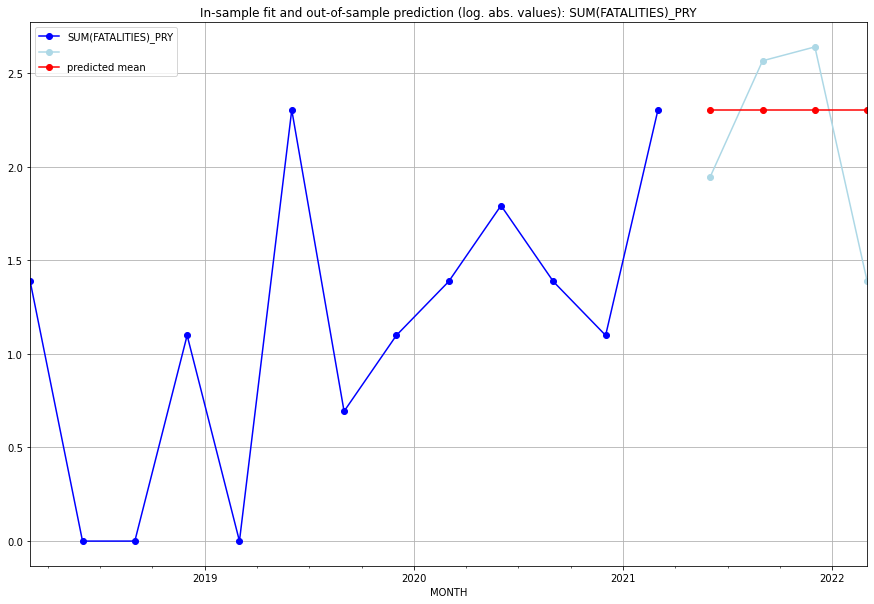

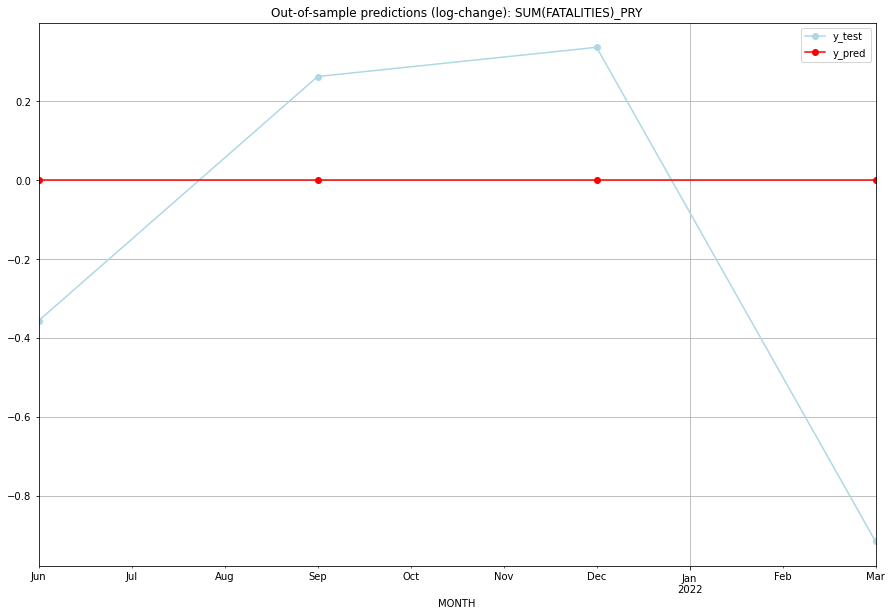

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.302585    1.945910           0.0       -0.356675
1  2021-07  2.302585    2.564949           0.0        0.262364
2  2021-10  2.302585    2.639057           0.0        0.336472
3  2022-01  2.302585    1.386294           0.0       -0.916291
TADDA: 0.46795054422539795
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.302585    1.945910           0.0       -0.356675   PRY
1 2021-07-01  2.302585    2.564949           0.0        0.262364   PRY
2 2021-10-01  2.302585    2.639057           0.0        0.336472   PRY
3 2022-01-01  2.302585    1.386294           0.0       -0.916291   PRY
Execution time: 00:01
######## PSE (171/234) #########
0
Neighbor countries: []
Getting Data for PSE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH    

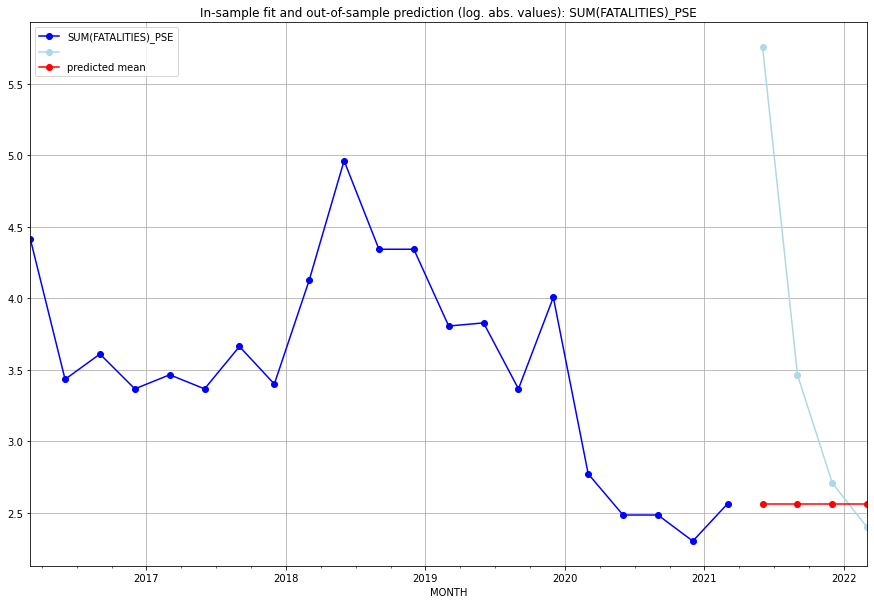

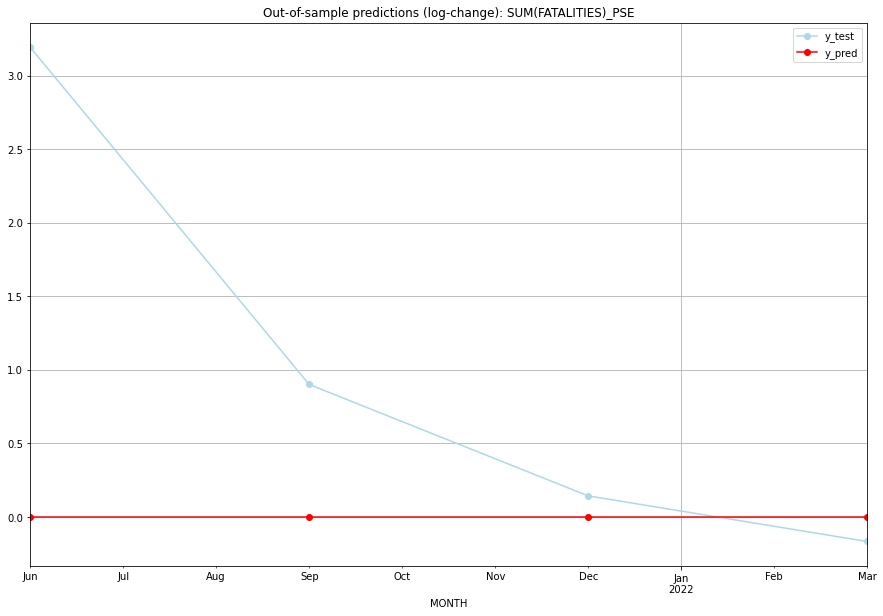

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.564949    5.758902           0.0        3.193952
1  2021-07  2.564949    3.465736           0.0        0.900787
2  2021-10  2.564949    2.708050           0.0        0.143101
3  2022-01  2.564949    2.397895           0.0       -0.167054
TADDA: 1.1012234725144432
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.564949    5.758902           0.0        3.193952   PSE
1 2021-07-01  2.564949    3.465736           0.0        0.900787   PSE
2 2021-10-01  2.564949    2.708050           0.0        0.143101   PSE
3 2022-01-01  2.564949    2.397895           0.0       -0.167054   PSE
Execution time: 00:01
######## PYF (172/234) #########
0
Neighbor countries: []
Getting Data for PYF
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021

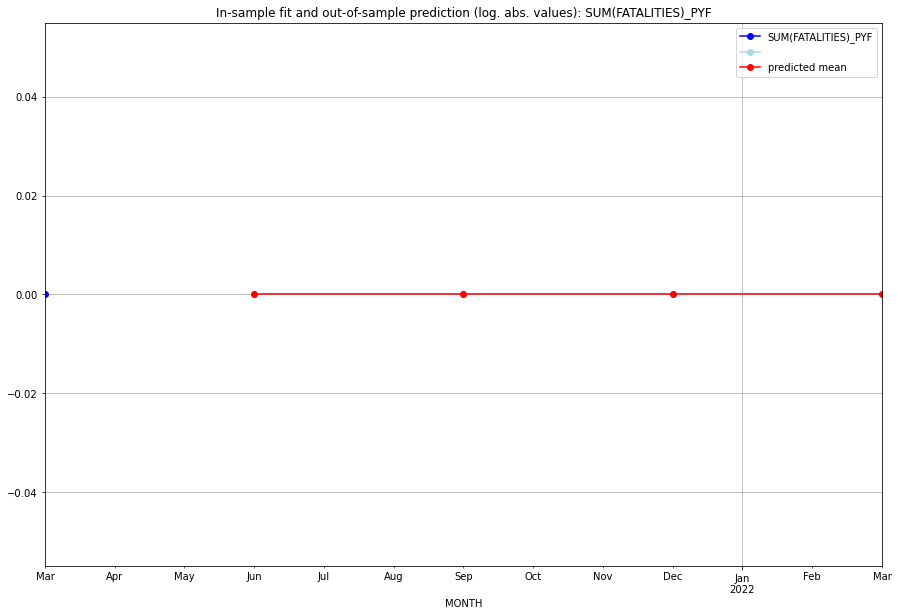

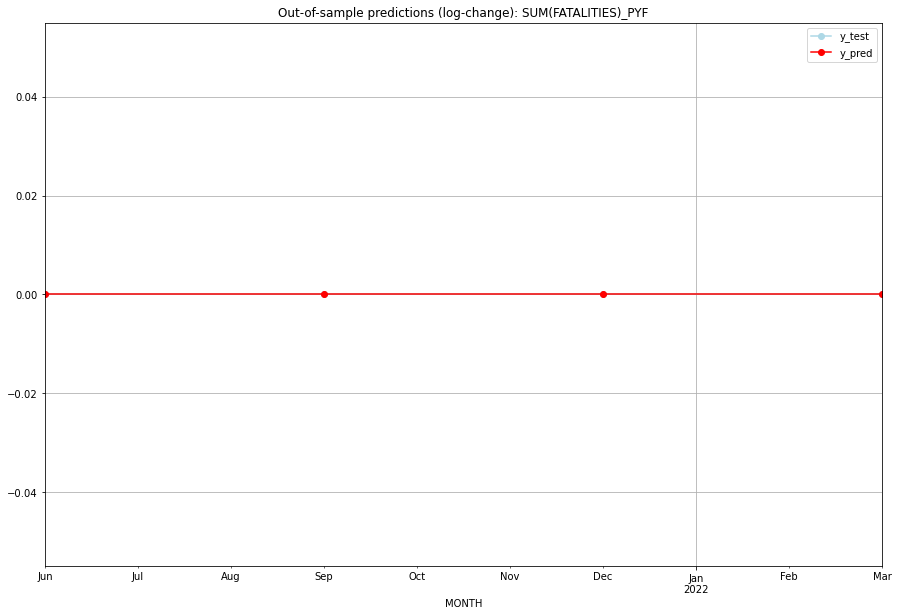

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   PYF
1 2021-07-01       0.0         0.0           0.0             0.0   PYF
2 2021-10-01       0.0         0.0           0.0             0.0   PYF
3 2022-01-01       0.0         0.0           0.0             0.0   PYF
Execution time: 00:01
######## QAT (173/234) #########
0
Neighbor countries: []
Getting Data for QAT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (21, 0)
y: (21, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

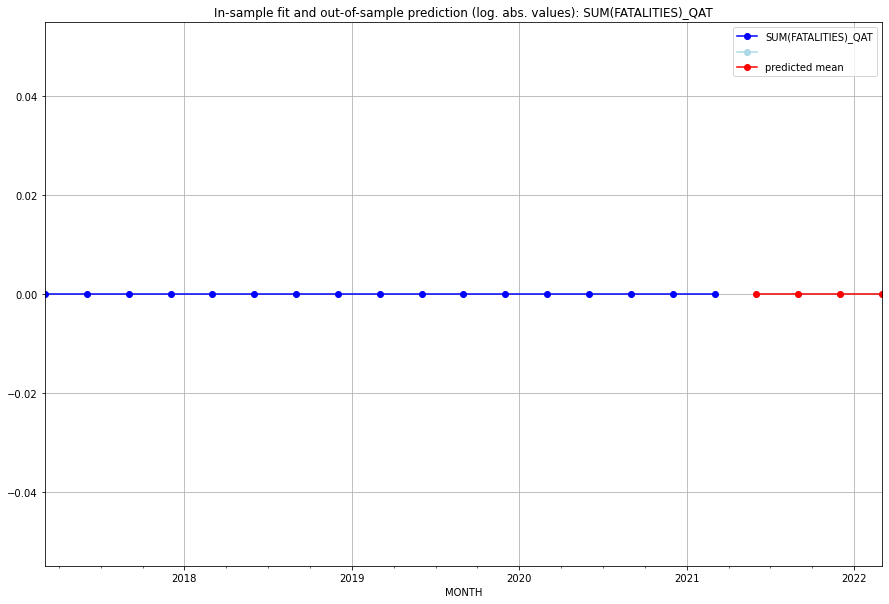

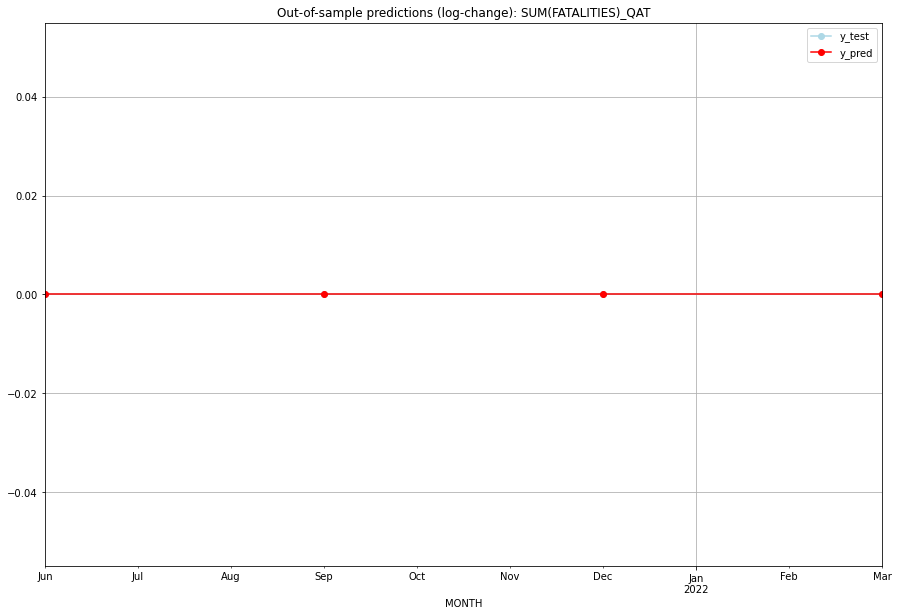

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   QAT
1 2021-07-01       0.0         0.0           0.0             0.0   QAT
2 2021-10-01       0.0         0.0           0.0             0.0   QAT
3 2022-01-01       0.0         0.0           0.0             0.0   QAT
Execution time: 00:01
######## REU (174/234) #########
0
Neighbor countries: []
Getting Data for REU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
20

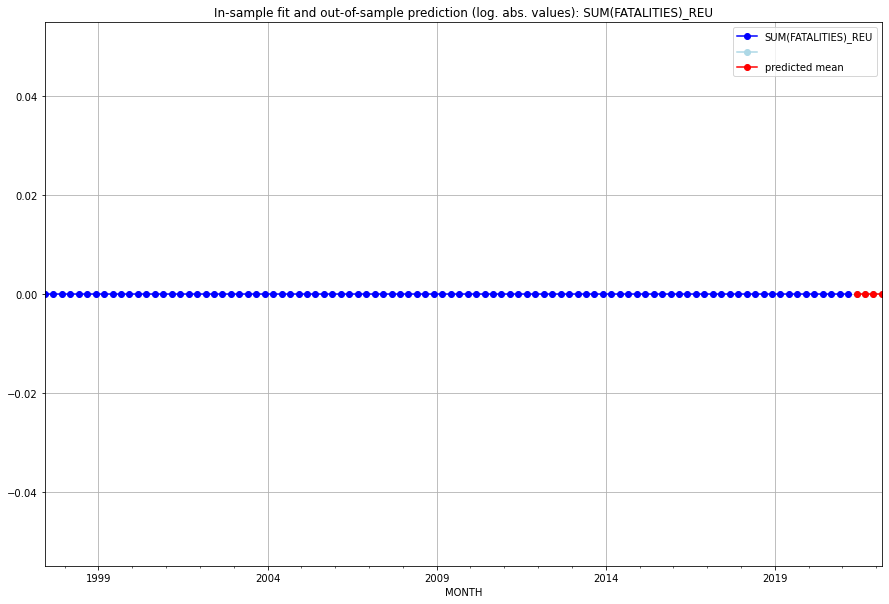

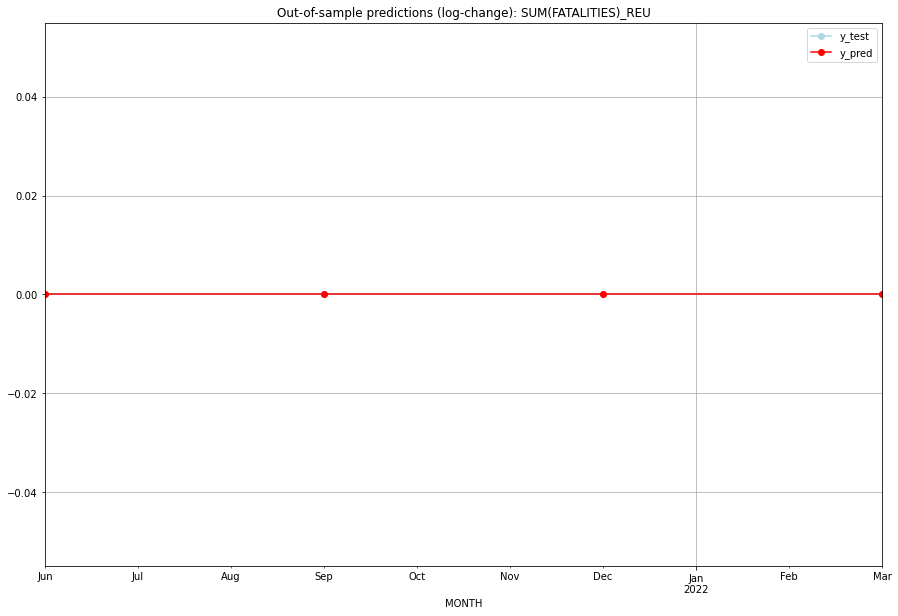

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   REU
1 2021-07-01       0.0         0.0           0.0             0.0   REU
2 2021-10-01       0.0         0.0           0.0             0.0   REU
3 2022-01-01       0.0         0.0           0.0             0.0   REU
Execution time: 00:01
######## ROU (175/234) #########
0
Neighbor countries: []
Getting Data for ROU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

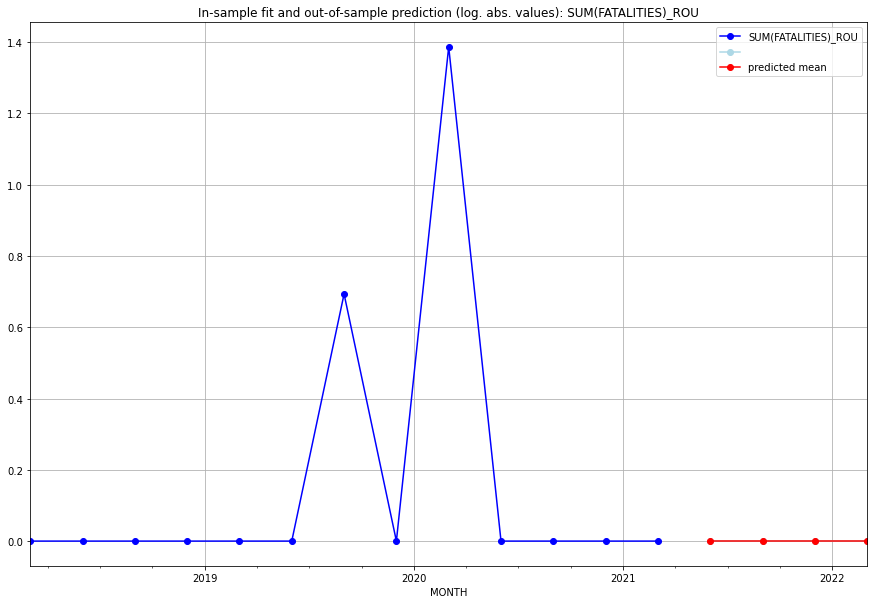

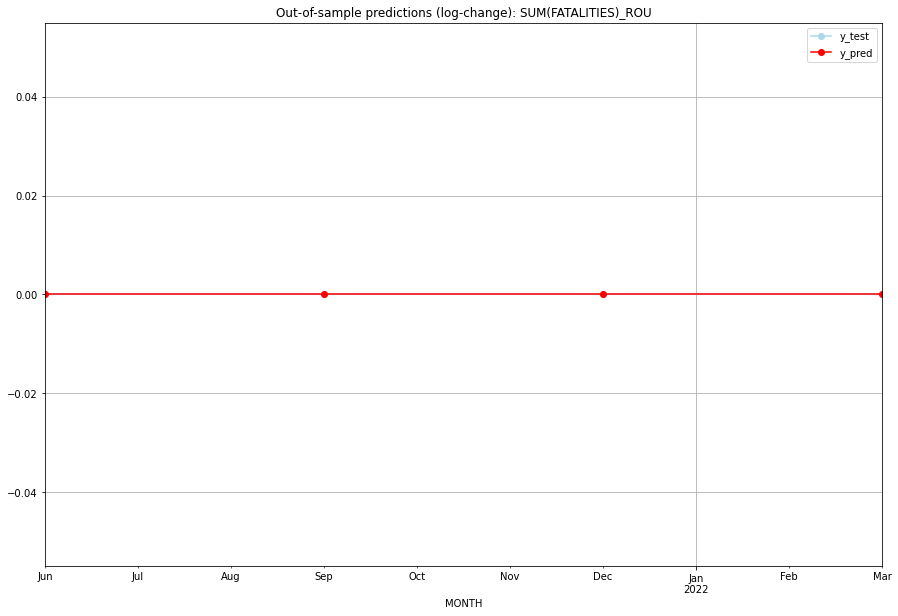

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   ROU
1 2021-07-01       0.0         0.0           0.0             0.0   ROU
2 2021-10-01       0.0         0.0           0.0             0.0   ROU
3 2022-01-01       0.0         0.0           0.0             0.0   ROU
Execution time: 00:01
######## RUS (176/234) #########
0
Neighbor countries: []
Getting Data for RUS
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04

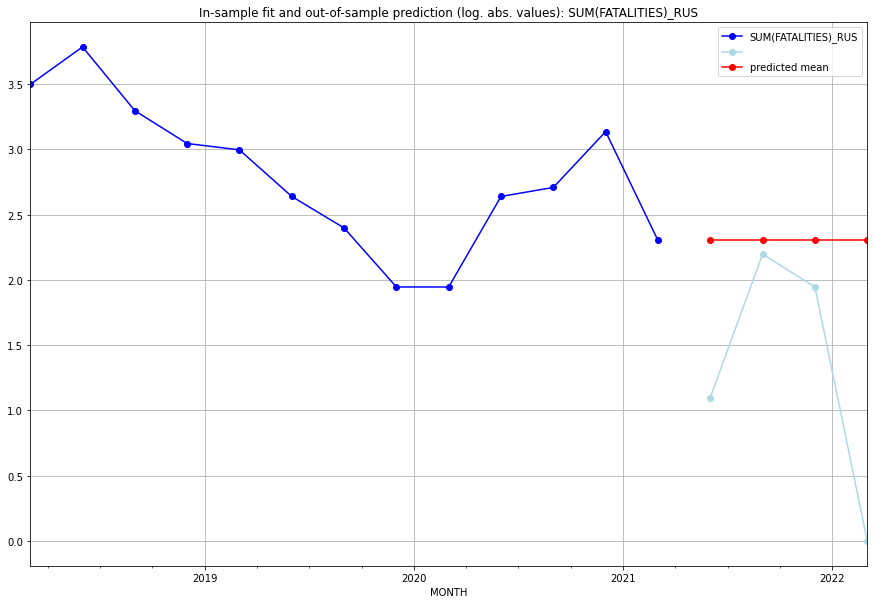

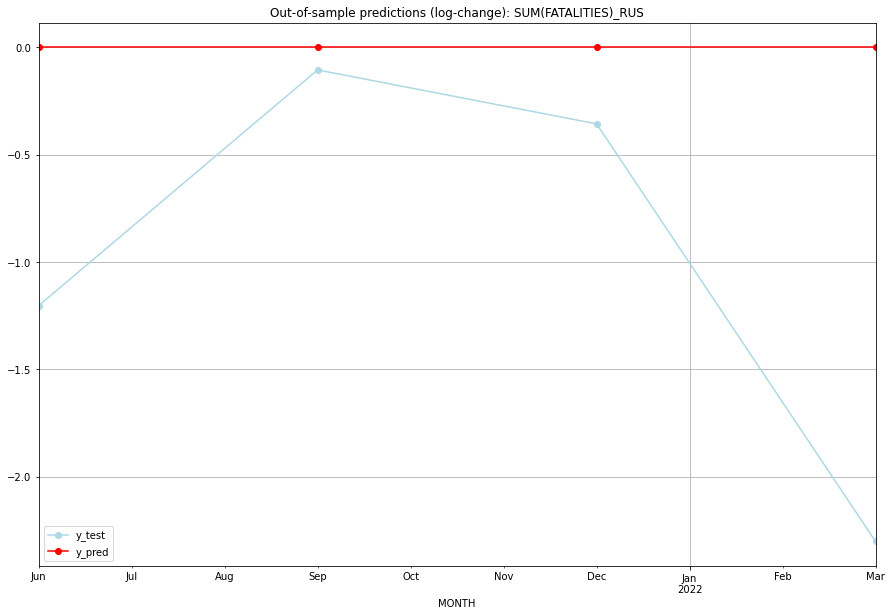

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.302585    1.098612           0.0       -1.203973
1  2021-07  2.302585    2.197225           0.0       -0.105361
2  2021-10  2.302585    1.945910           0.0       -0.356675
3  2022-01  2.302585    0.000000           0.0       -2.302585
TADDA: 0.9921483392291353
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.302585    1.098612           0.0       -1.203973   RUS
1 2021-07-01  2.302585    2.197225           0.0       -0.105361   RUS
2 2021-10-01  2.302585    1.945910           0.0       -0.356675   RUS
3 2022-01-01  2.302585    0.000000           0.0       -2.302585   RUS
Execution time: 00:01
######## RWA (177/234) #########
0
Neighbor countries: []
Getting Data for RWA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

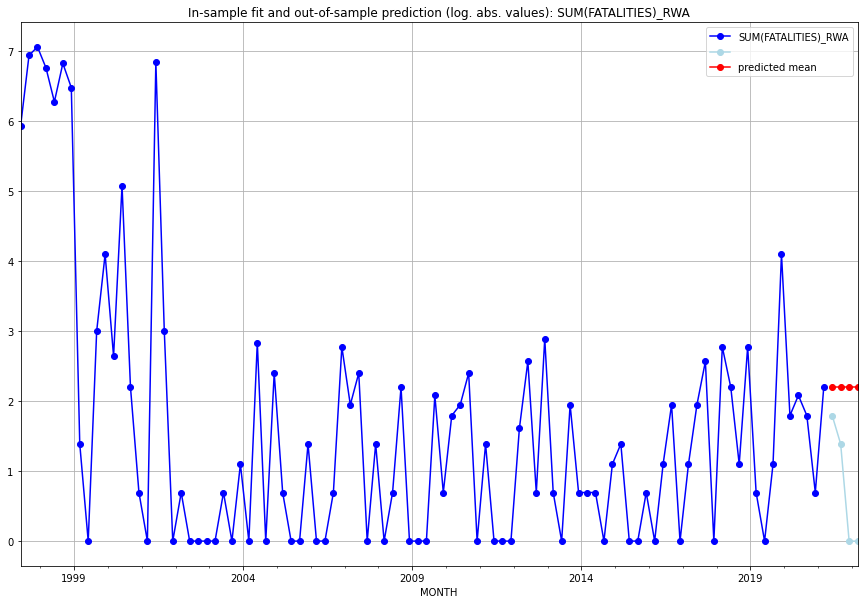

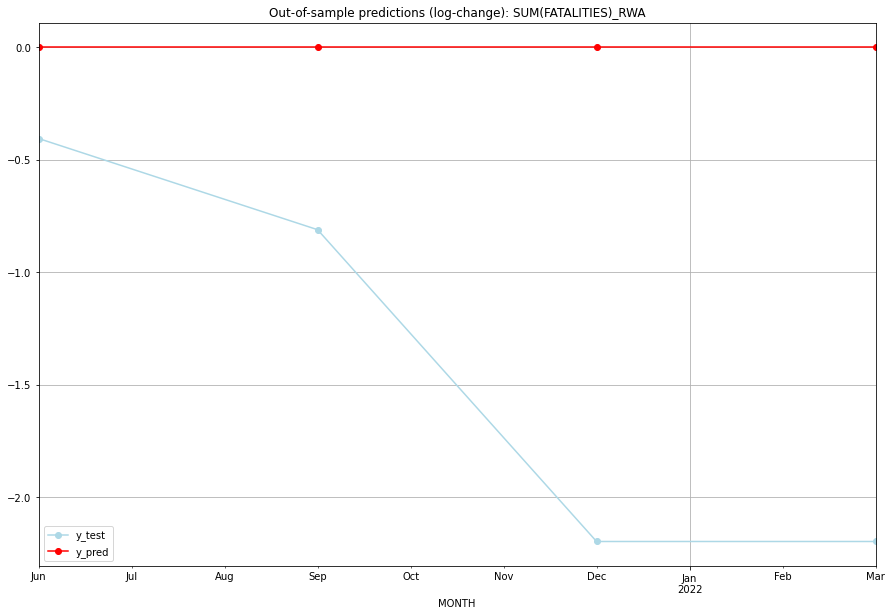

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.197225    1.791759           0.0       -0.405465
1  2021-07  2.197225    1.386294           0.0       -0.810930
2  2021-10  2.197225    0.000000           0.0       -2.197225
3  2022-01  2.197225    0.000000           0.0       -2.197225
TADDA: 1.4027111197492337
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.197225    1.791759           0.0       -0.405465   RWA
1 2021-07-01  2.197225    1.386294           0.0       -0.810930   RWA
2 2021-10-01  2.197225    0.000000           0.0       -2.197225   RWA
3 2022-01-01  2.197225    0.000000           0.0       -2.197225   RWA
Execution time: 00:01
######## SAU (178/234) #########
0
Neighbor countries: []
Getting Data for SAU
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (29, 0)
y: (29, 1)
------------------------------------------------
                0
MONTH     

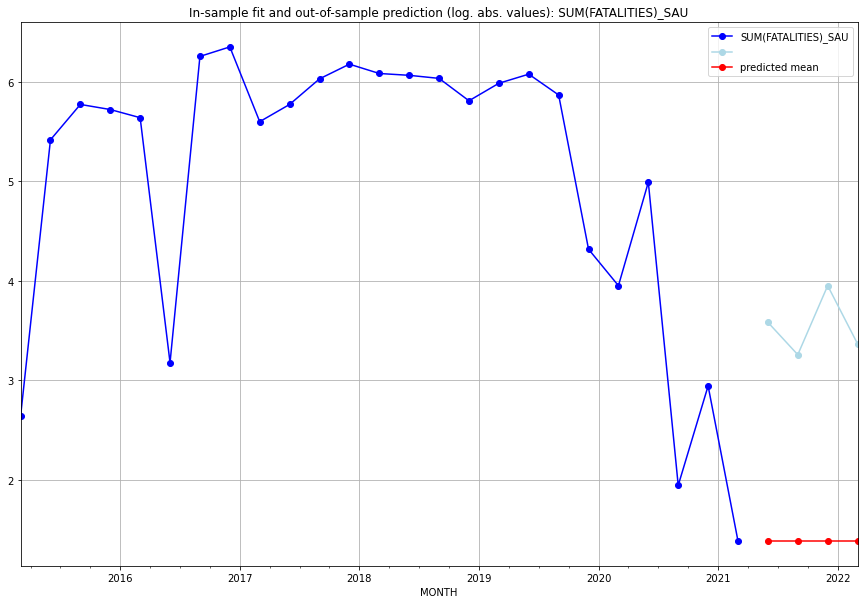

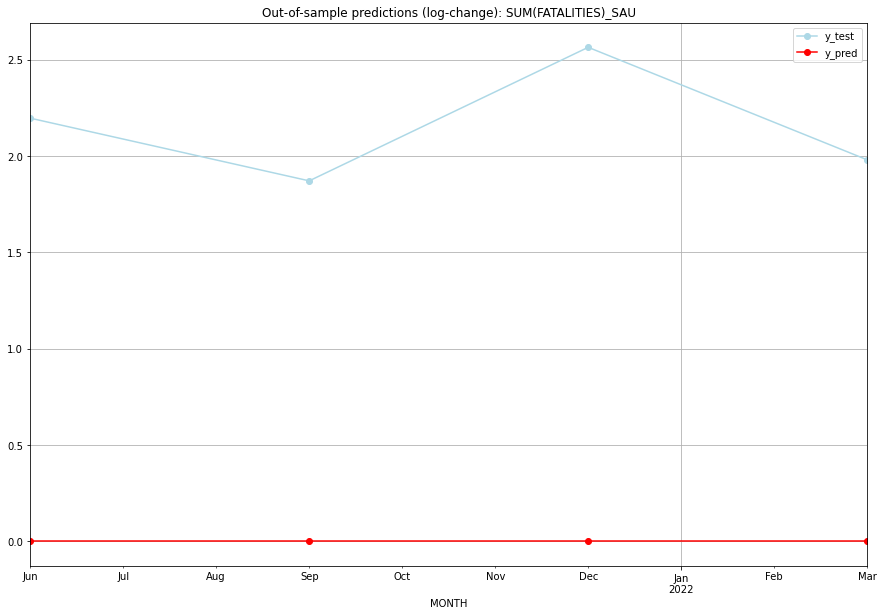

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.386294    3.583519           0.0        2.197225
1  2021-07  1.386294    3.258097           0.0        1.871802
2  2021-10  1.386294    3.951244           0.0        2.564949
3  2022-01  1.386294    3.367296           0.0        1.981001
TADDA: 2.1537443951414827
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.386294    3.583519           0.0        2.197225   SAU
1 2021-07-01  1.386294    3.258097           0.0        1.871802   SAU
2 2021-10-01  1.386294    3.951244           0.0        2.564949   SAU
3 2022-01-01  1.386294    3.367296           0.0        1.981001   SAU
Execution time: 00:01
######## SDN (179/234) #########
0
Neighbor countries: []
Getting Data for SDN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

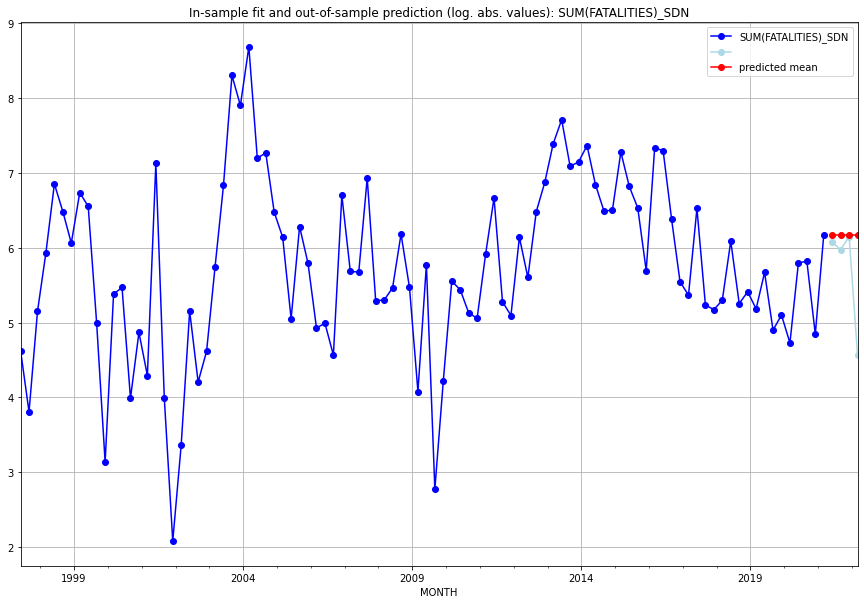

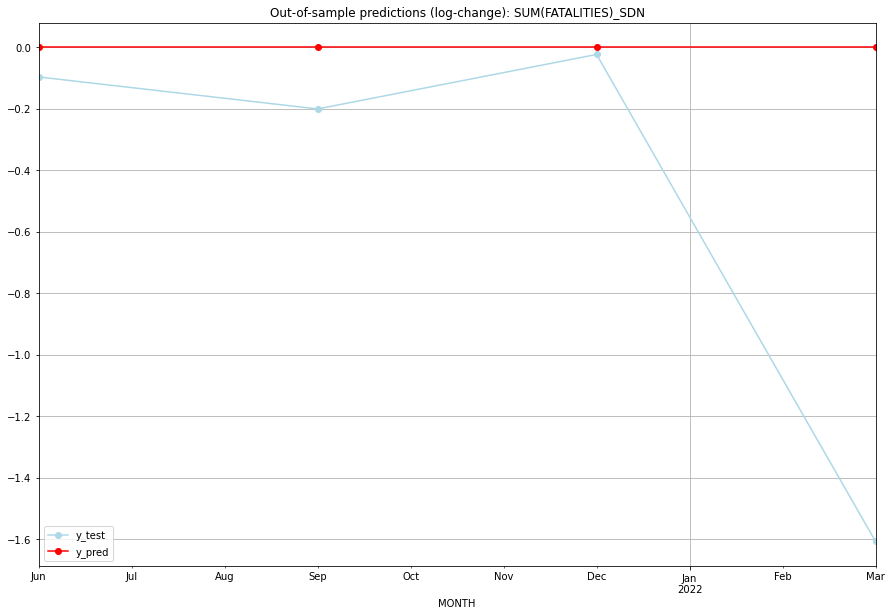

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.171701    6.075346           0.0       -0.096355
1  2021-07  6.171701    5.971262           0.0       -0.200439
2  2021-10  6.171701    6.148468           0.0       -0.023232
3  2022-01  6.171701    4.564348           0.0       -1.607352
TADDA: 0.4818445078447575
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.171701    6.075346           0.0       -0.096355   SDN
1 2021-07-01  6.171701    5.971262           0.0       -0.200439   SDN
2 2021-10-01  6.171701    6.148468           0.0       -0.023232   SDN
3 2022-01-01  6.171701    4.564348           0.0       -1.607352   SDN
Execution time: 00:01
######## SEN (180/234) #########
0
Neighbor countries: []
Getting Data for SEN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

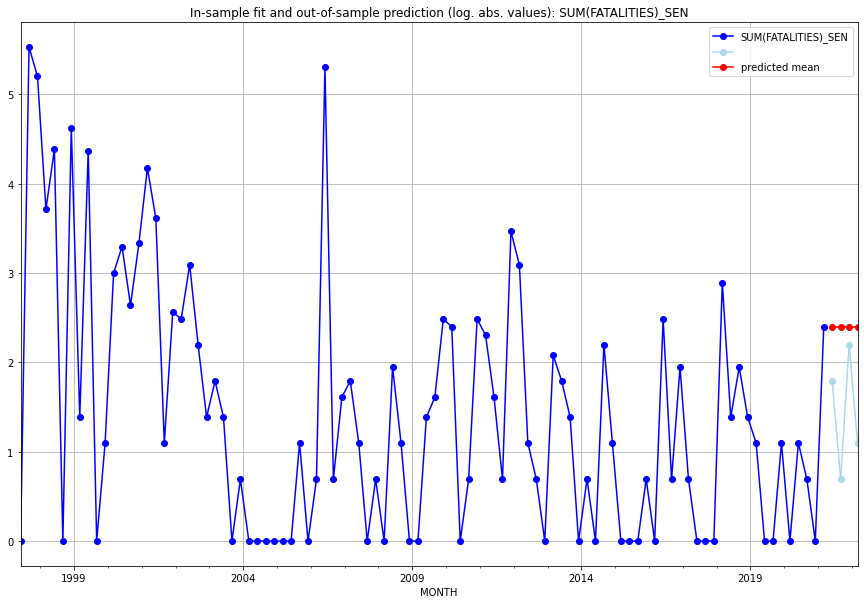

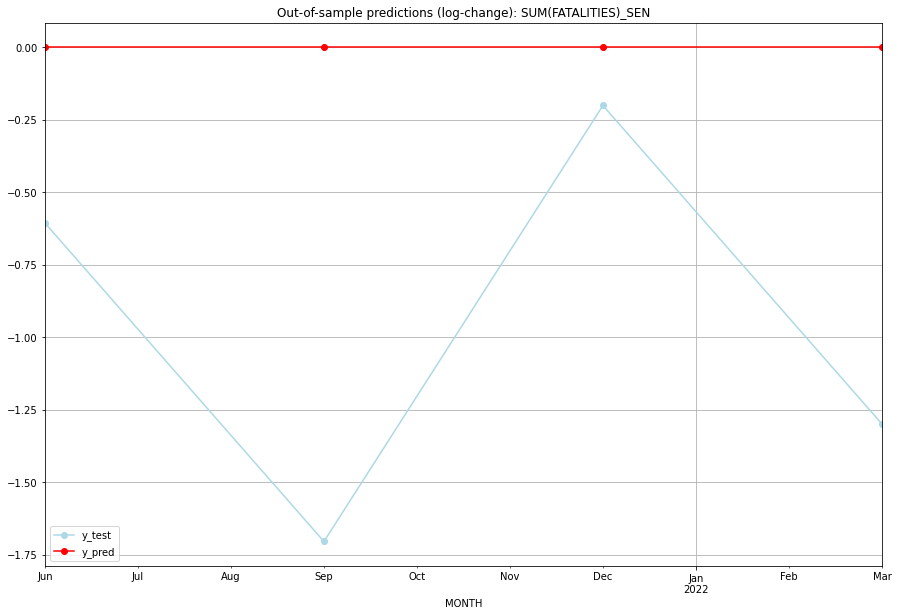

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.397895    1.791759           0.0       -0.606136
1  2021-07  2.397895    0.693147           0.0       -1.704748
2  2021-10  2.397895    2.197225           0.0       -0.200671
3  2022-01  2.397895    1.098612           0.0       -1.299283
TADDA: 0.9527093938502882
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.397895    1.791759           0.0       -0.606136   SEN
1 2021-07-01  2.397895    0.693147           0.0       -1.704748   SEN
2 2021-10-01  2.397895    2.197225           0.0       -0.200671   SEN
3 2022-01-01  2.397895    1.098612           0.0       -1.299283   SEN
Execution time: 00:01
######## SGP (181/234) #########
0
Neighbor countries: []
Getting Data for SGP
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

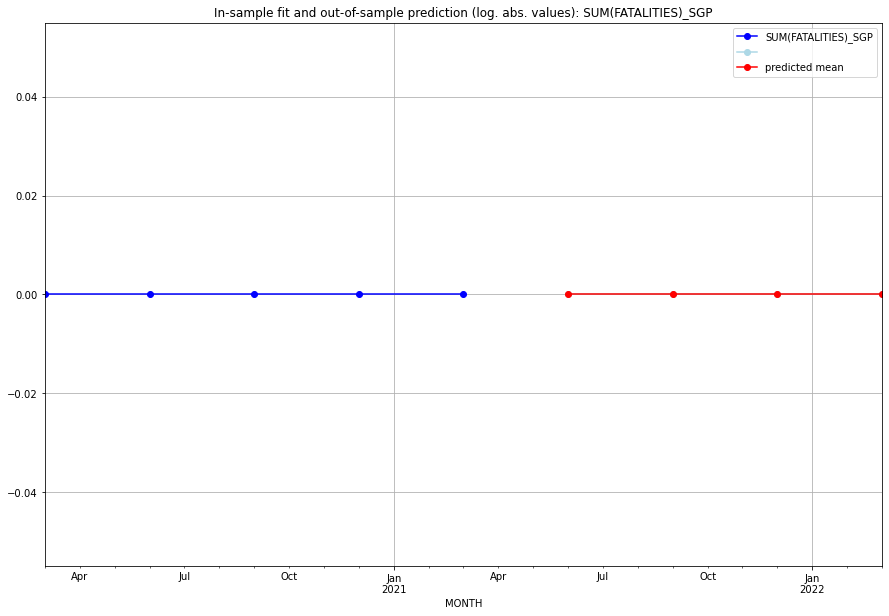

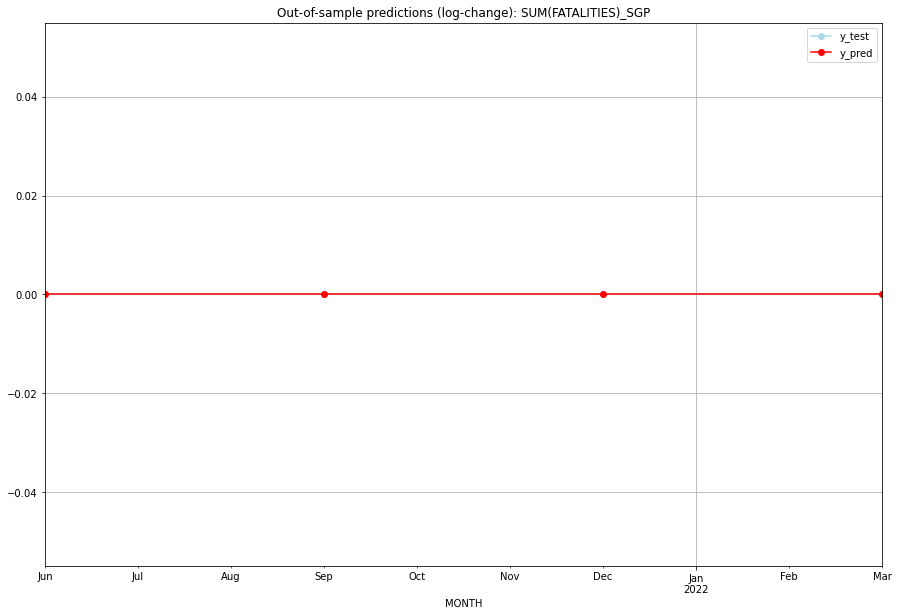

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SGP
1 2021-07-01       0.0         0.0           0.0             0.0   SGP
2 2021-10-01       0.0         0.0           0.0             0.0   SGP
3 2022-01-01       0.0         0.0           0.0             0.0   SGP
Execution time: 00:01
######## SHN (182/234) #########
0
Neighbor countries: []
Getting Data for SHN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
20

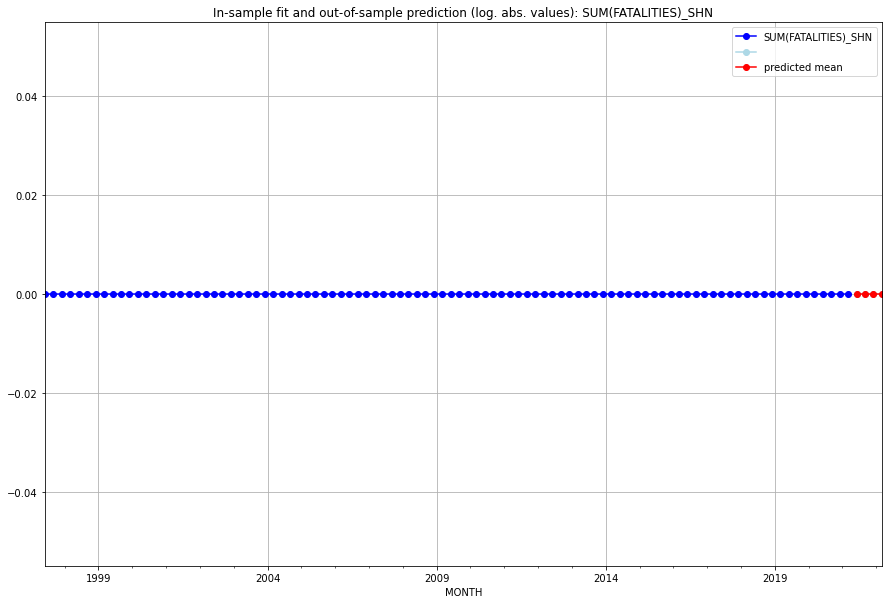

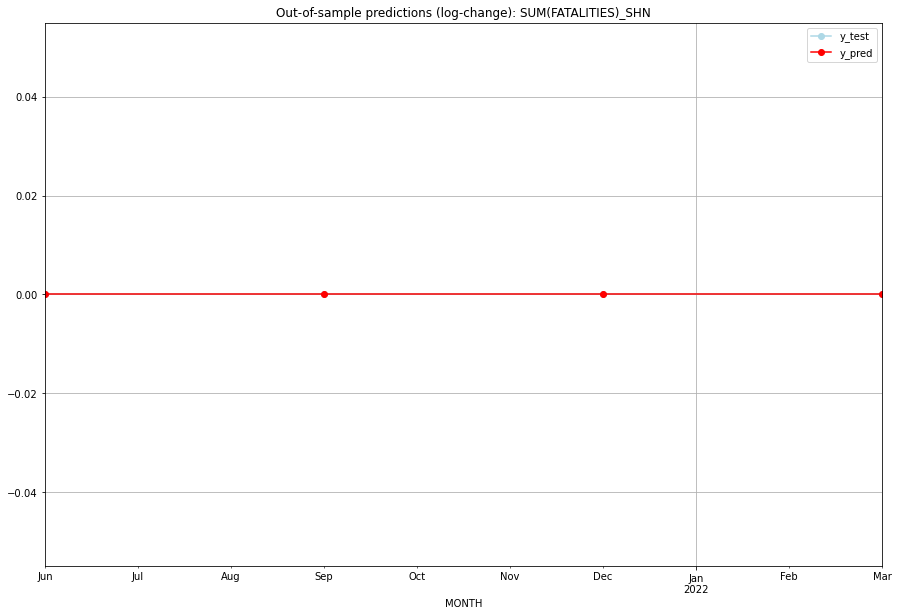

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SHN
1 2021-07-01       0.0         0.0           0.0             0.0   SHN
2 2021-10-01       0.0         0.0           0.0             0.0   SHN
3 2022-01-01       0.0         0.0           0.0             0.0   SHN
Execution time: 00:01
######## SJM (183/234) #########
0
Neighbor countries: []
Getting Data for SJM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

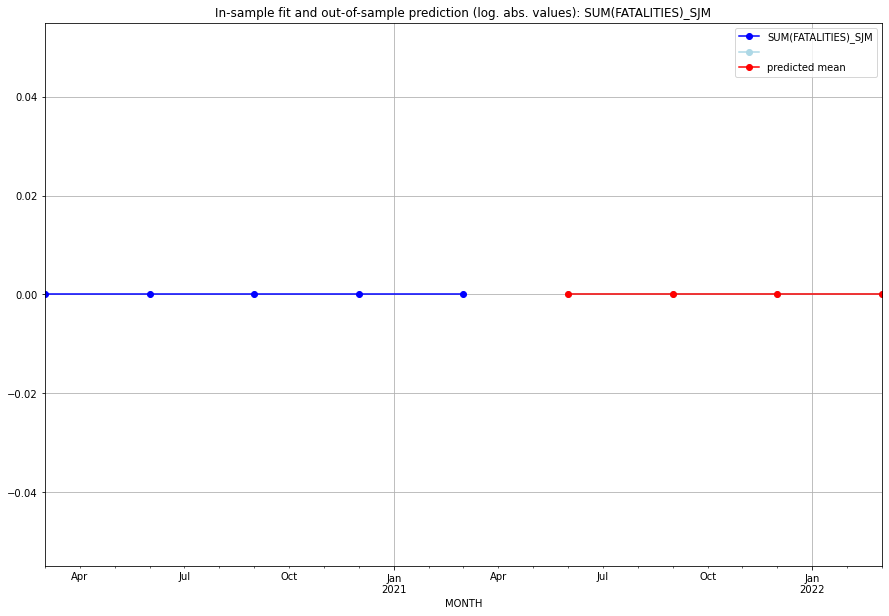

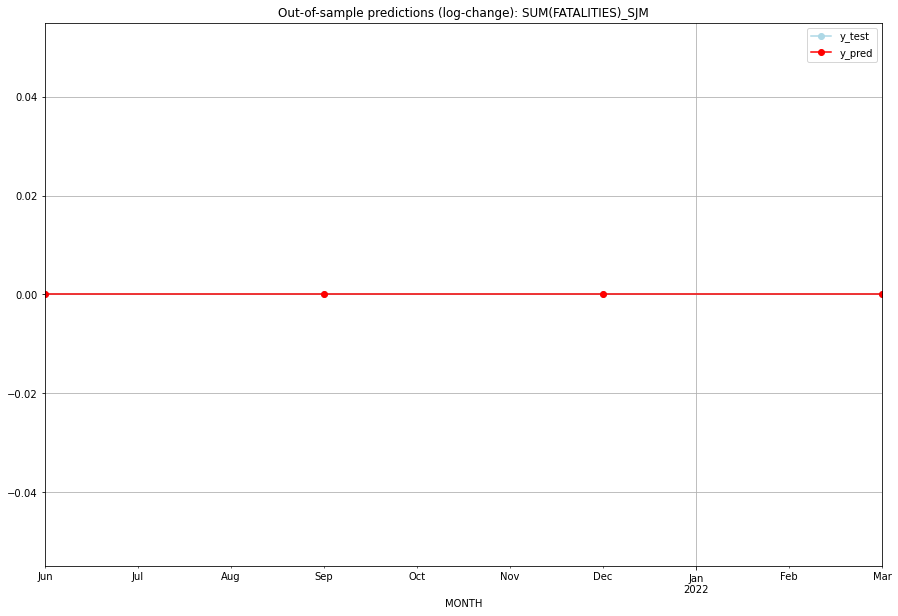

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SJM
1 2021-07-01       0.0         0.0           0.0             0.0   SJM
2 2021-10-01       0.0         0.0           0.0             0.0   SJM
3 2022-01-01       0.0         0.0           0.0             0.0   SJM
Execution time: 00:01
######## SLB (184/234) #########
0
Neighbor countries: []
Getting Data for SLB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
                0
MONTH            
2021-04  

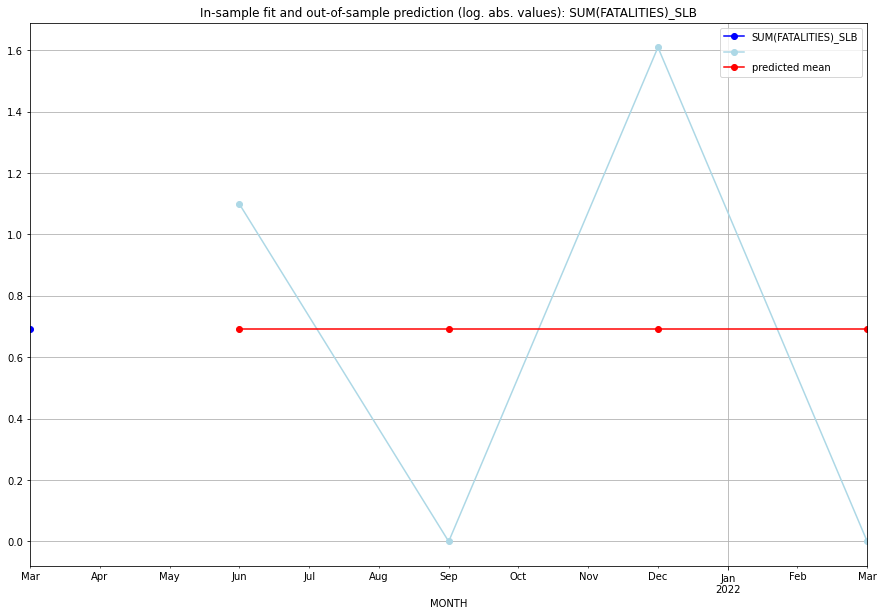

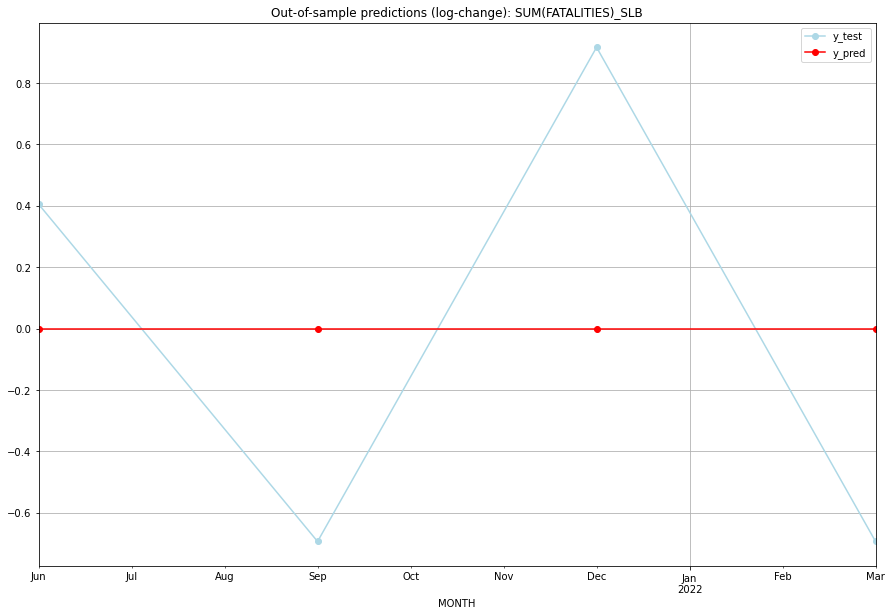

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    1.098612           0.0        0.405465
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    1.609438           0.0        0.916291
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.6770125502755526
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    1.098612           0.0        0.405465   SLB
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   SLB
2 2021-10-01  0.693147    1.609438           0.0        0.916291   SLB
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   SLB
Execution time: 00:01
######## SLE (185/234) #########
0
Neighbor countries: []
Getting Data for SLE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

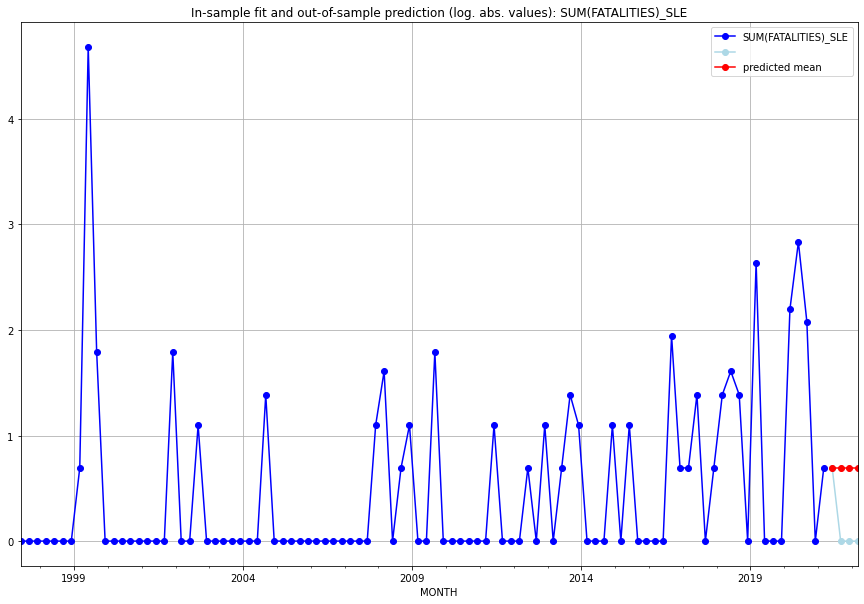

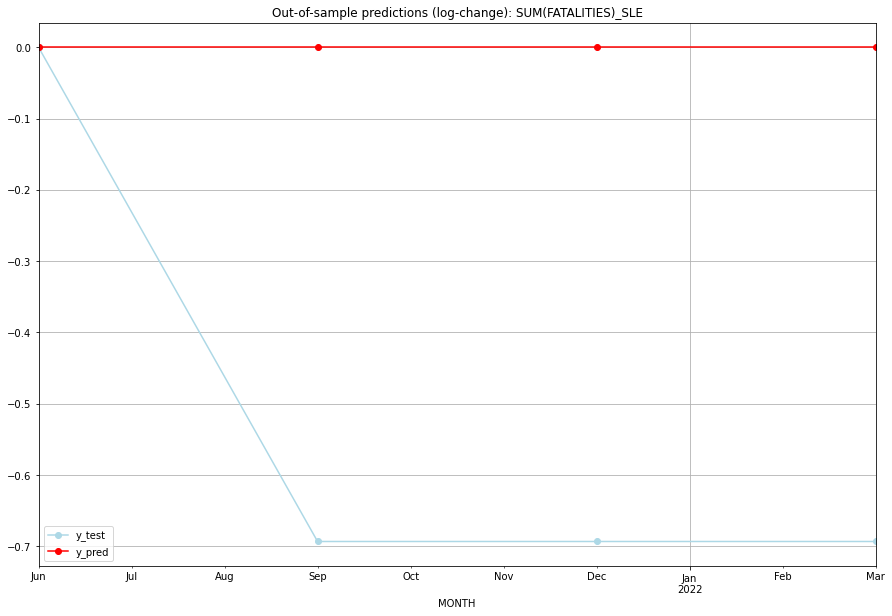

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.693147           0.0        0.000000
1  2021-07  0.693147    0.000000           0.0       -0.693147
2  2021-10  0.693147    0.000000           0.0       -0.693147
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.693147           0.0        0.000000   SLE
1 2021-07-01  0.693147    0.000000           0.0       -0.693147   SLE
2 2021-10-01  0.693147    0.000000           0.0       -0.693147   SLE
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   SLE
Execution time: 00:01
######## SLV (186/234) #########
0
Neighbor countries: []
Getting Data for SLV
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH     

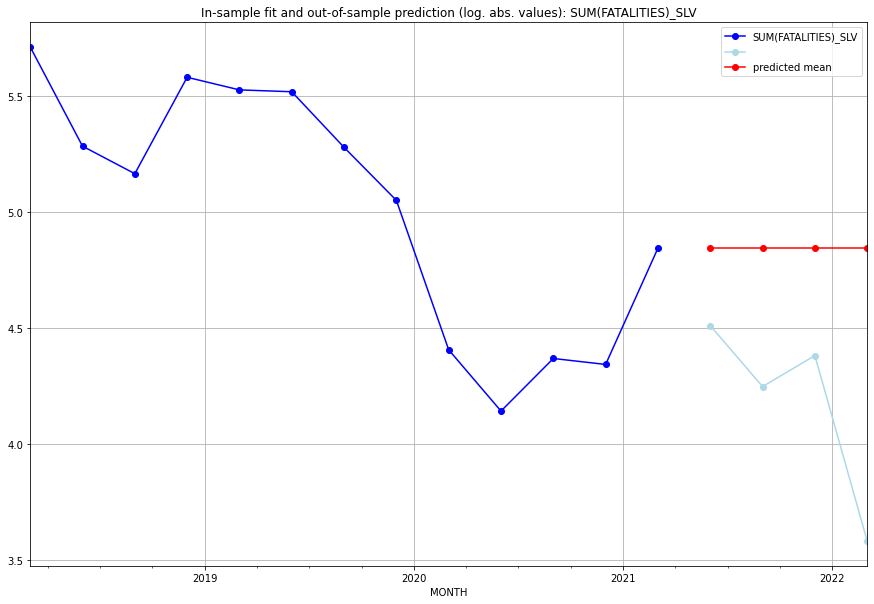

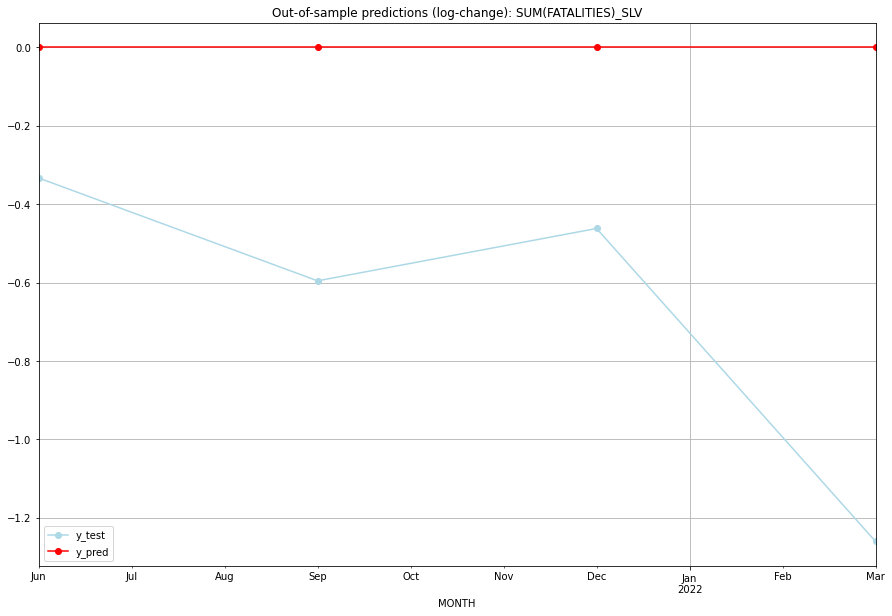

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.844187    4.510860           0.0       -0.333328
1  2021-07  4.844187    4.248495           0.0       -0.595692
2  2021-10  4.844187    4.382027           0.0       -0.462160
3  2022-01  4.844187    3.583519           0.0       -1.260668
TADDA: 0.6629620060345411
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.844187    4.510860           0.0       -0.333328   SLV
1 2021-07-01  4.844187    4.248495           0.0       -0.595692   SLV
2 2021-10-01  4.844187    4.382027           0.0       -0.462160   SLV
3 2022-01-01  4.844187    3.583519           0.0       -1.260668   SLV
Execution time: 00:01
######## SMR (187/234) #########
0
Neighbor countries: []
Getting Data for SMR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

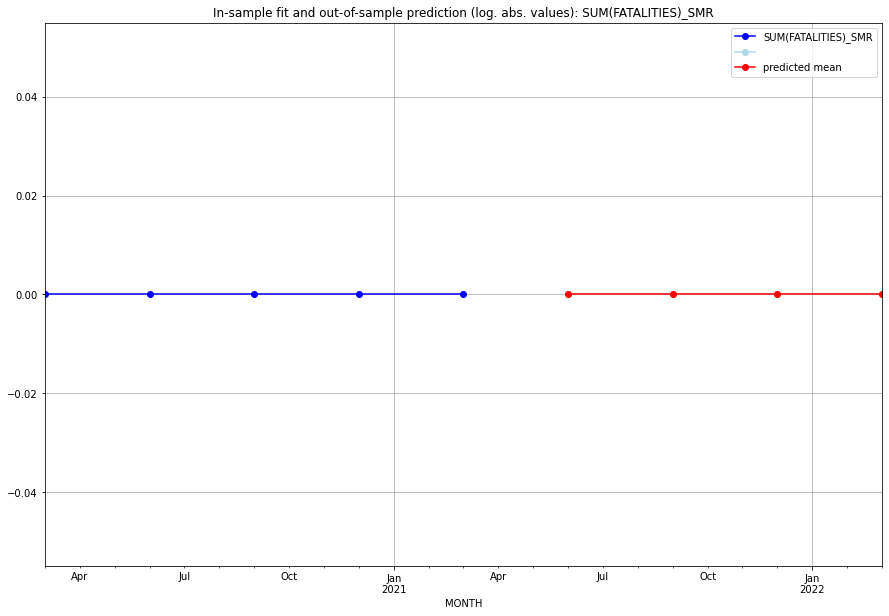

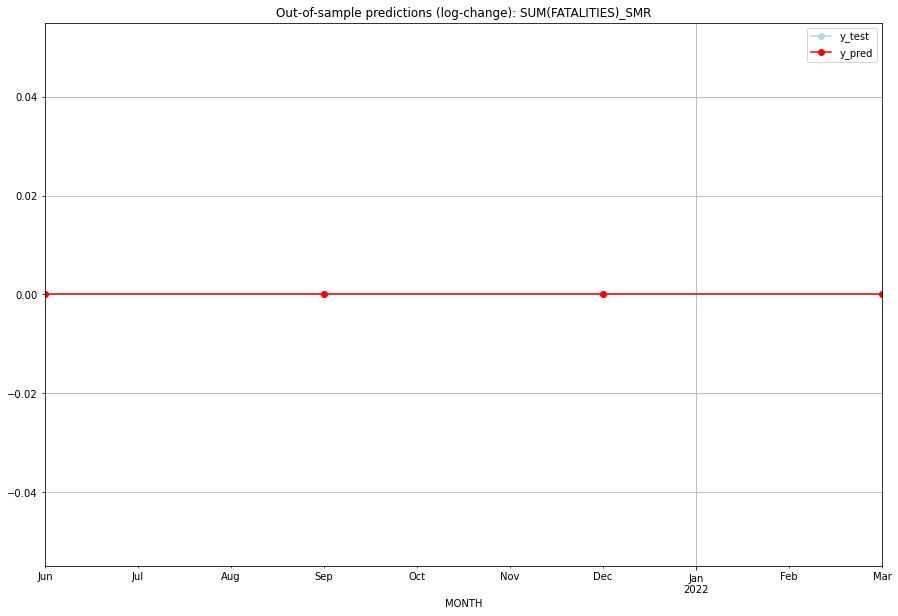

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SMR
1 2021-07-01       0.0         0.0           0.0             0.0   SMR
2 2021-10-01       0.0         0.0           0.0             0.0   SMR
3 2022-01-01       0.0         0.0           0.0             0.0   SMR
Execution time: 00:01
######## SOM (188/234) #########
0
Neighbor countries: []
Getting Data for SOM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

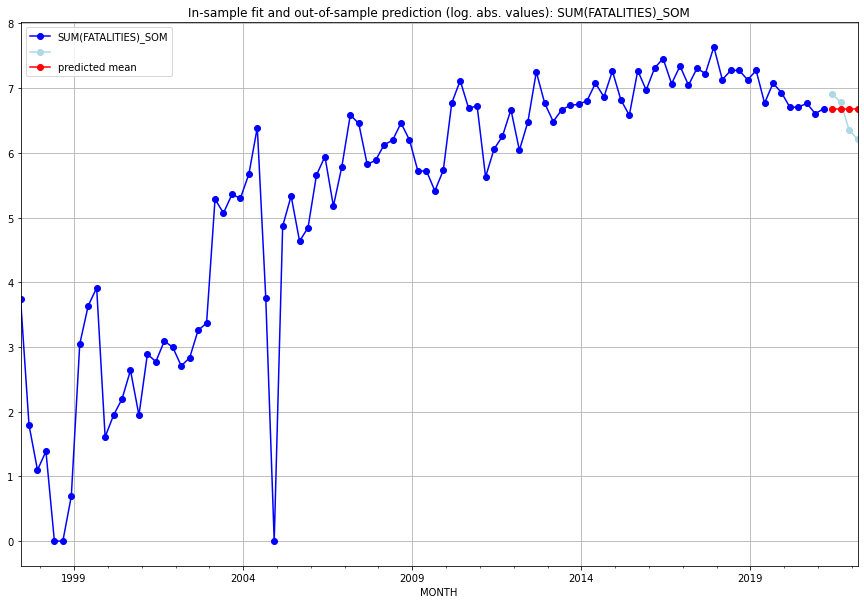

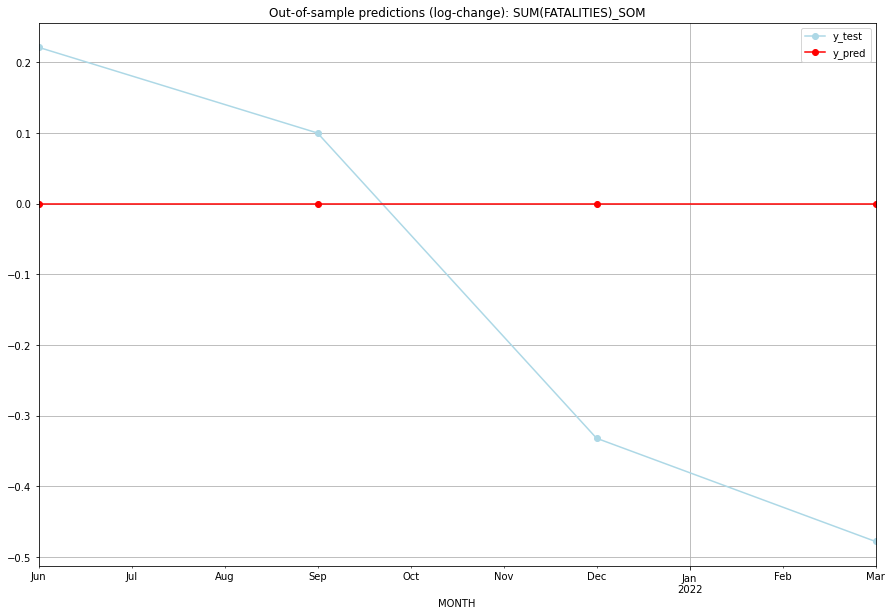

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.684612    6.905753           0.0        0.221142
1  2021-07  6.684612    6.784457           0.0        0.099845
2  2021-10  6.684612    6.352629           0.0       -0.331982
3  2022-01  6.684612    6.206576           0.0       -0.478036
TADDA: 0.2827512539761532
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.684612    6.905753           0.0        0.221142   SOM
1 2021-07-01  6.684612    6.784457           0.0        0.099845   SOM
2 2021-10-01  6.684612    6.352629           0.0       -0.331982   SOM
3 2022-01-01  6.684612    6.206576           0.0       -0.478036   SOM
Execution time: 00:01
######## SRB (189/234) #########
0
Neighbor countries: []
Getting Data for SRB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

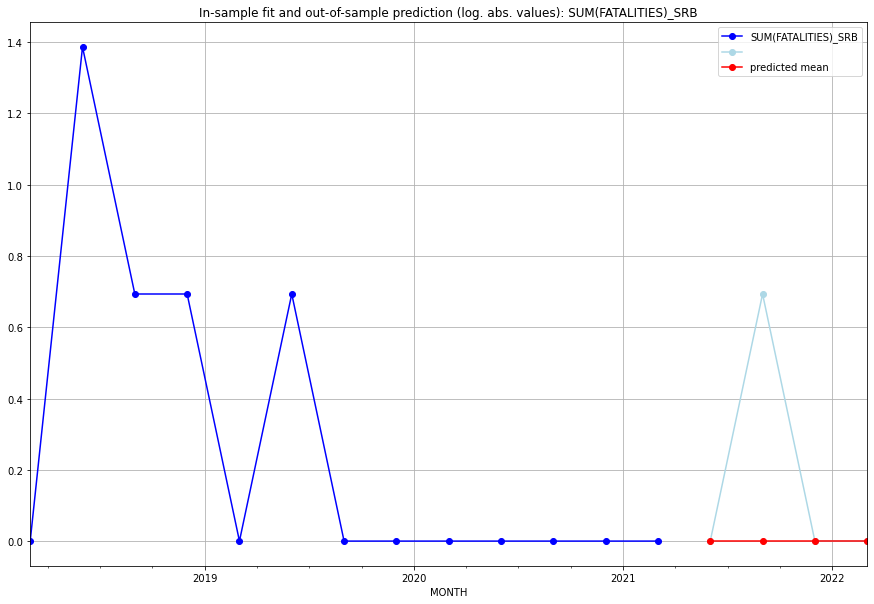

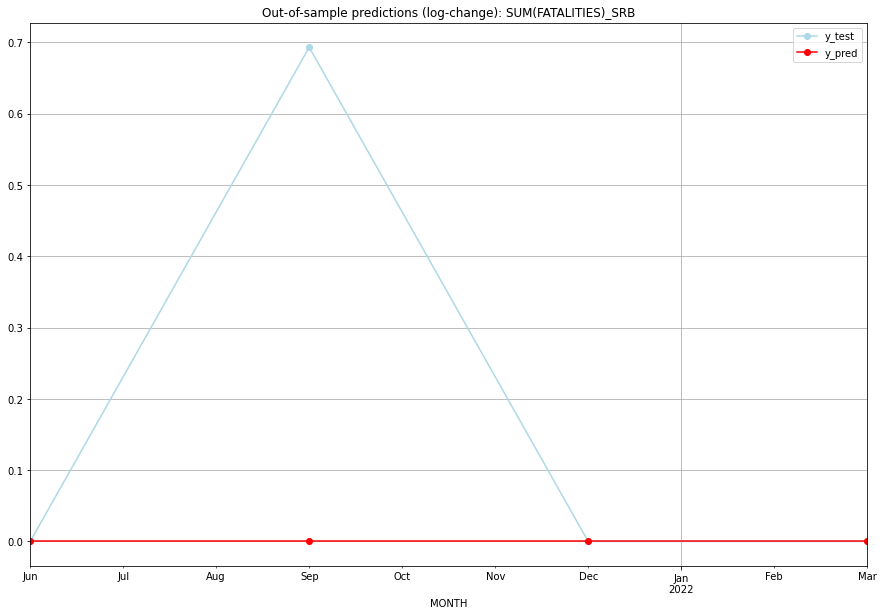

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    0.000000           0.0        0.000000
1  2021-07       0.0    0.693147           0.0        0.693147
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    0.000000           0.0        0.000000   SRB
1 2021-07-01       0.0    0.693147           0.0        0.693147   SRB
2 2021-10-01       0.0    0.000000           0.0        0.000000   SRB
3 2022-01-01       0.0    0.000000           0.0        0.000000   SRB
Execution time: 00:01
######## SSD (190/234) #########
0
Neighbor countries: []
Getting Data for SSD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH  

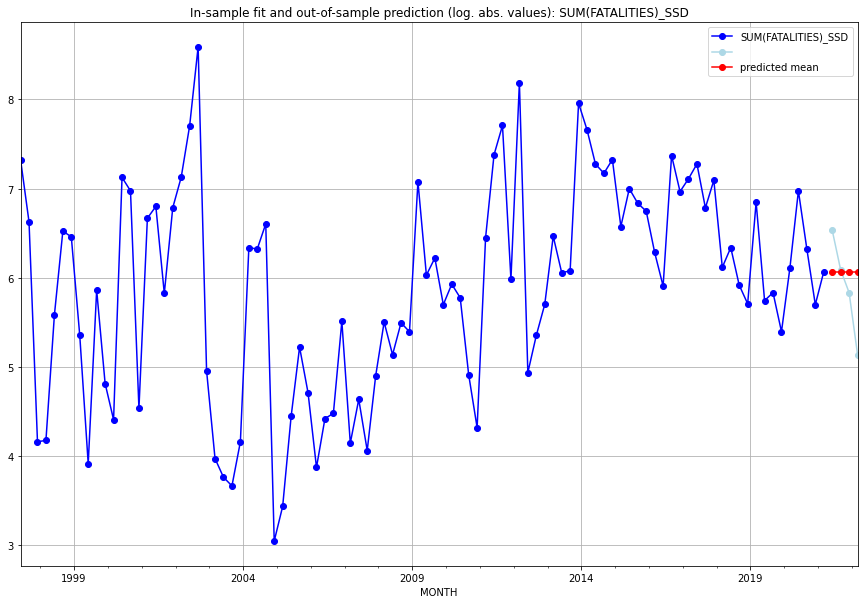

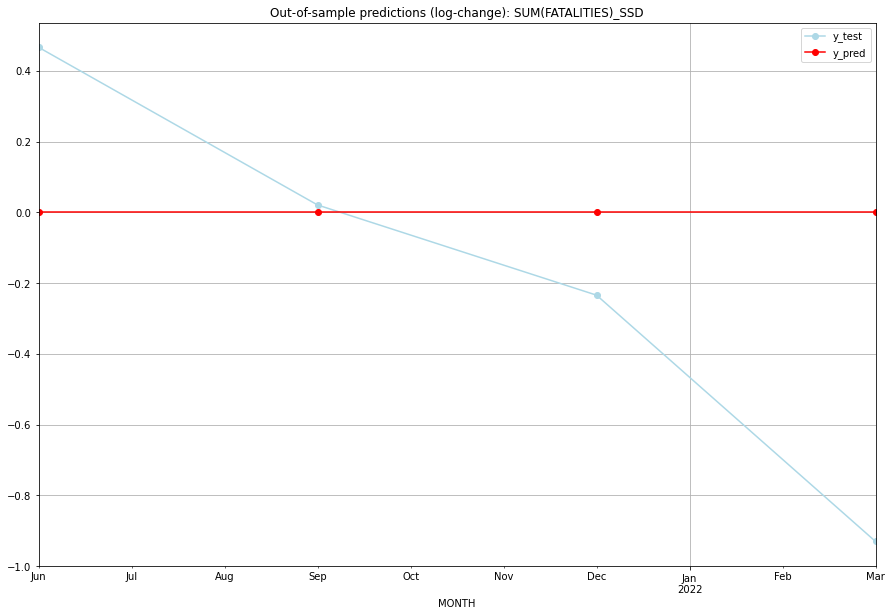

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  6.066108    6.532334           0.0        0.466226
1  2021-07  6.066108    6.086775           0.0        0.020667
2  2021-10  6.066108    5.831882           0.0       -0.234226
3  2022-01  6.066108    5.135798           0.0       -0.930310
TADDA: 0.41285702620021913
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  6.066108    6.532334           0.0        0.466226   SSD
1 2021-07-01  6.066108    6.086775           0.0        0.020667   SSD
2 2021-10-01  6.066108    5.831882           0.0       -0.234226   SSD
3 2022-01-01  6.066108    5.135798           0.0       -0.930310   SSD
Execution time: 00:01
######## STP (191/234) #########
0
Neighbor countries: []
Getting Data for STP
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH  

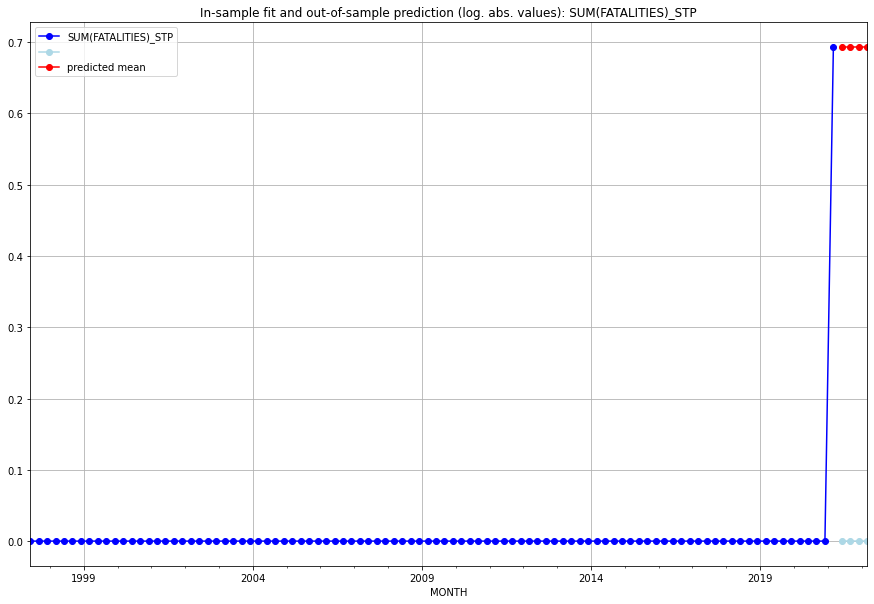

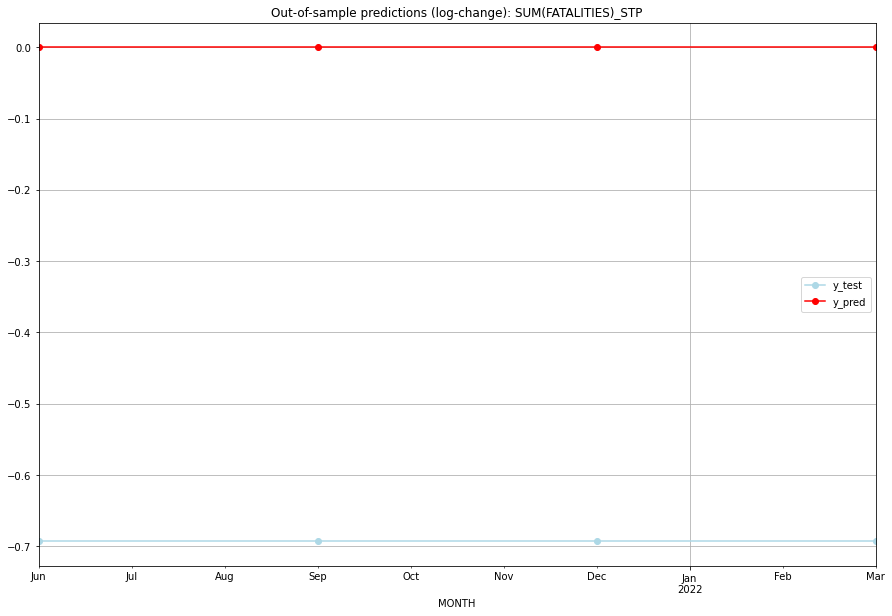

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147         0.0           0.0       -0.693147
1  2021-07  0.693147         0.0           0.0       -0.693147
2  2021-10  0.693147         0.0           0.0       -0.693147
3  2022-01  0.693147         0.0           0.0       -0.693147
TADDA: 0.6931471805599453
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147         0.0           0.0       -0.693147   STP
1 2021-07-01  0.693147         0.0           0.0       -0.693147   STP
2 2021-10-01  0.693147         0.0           0.0       -0.693147   STP
3 2022-01-01  0.693147         0.0           0.0       -0.693147   STP
Execution time: 00:01
######## SUR (192/234) #########
0
Neighbor countries: []
Getting Data for SUR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

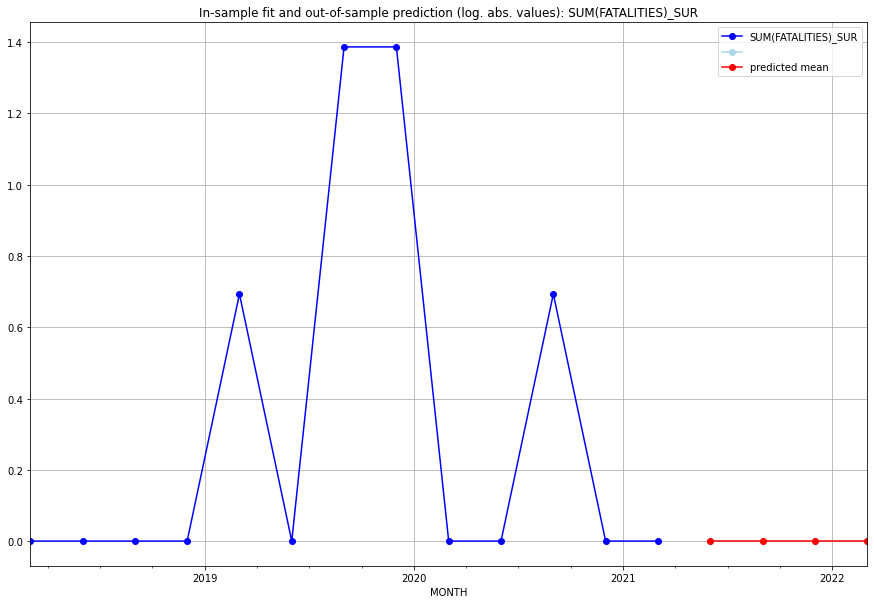

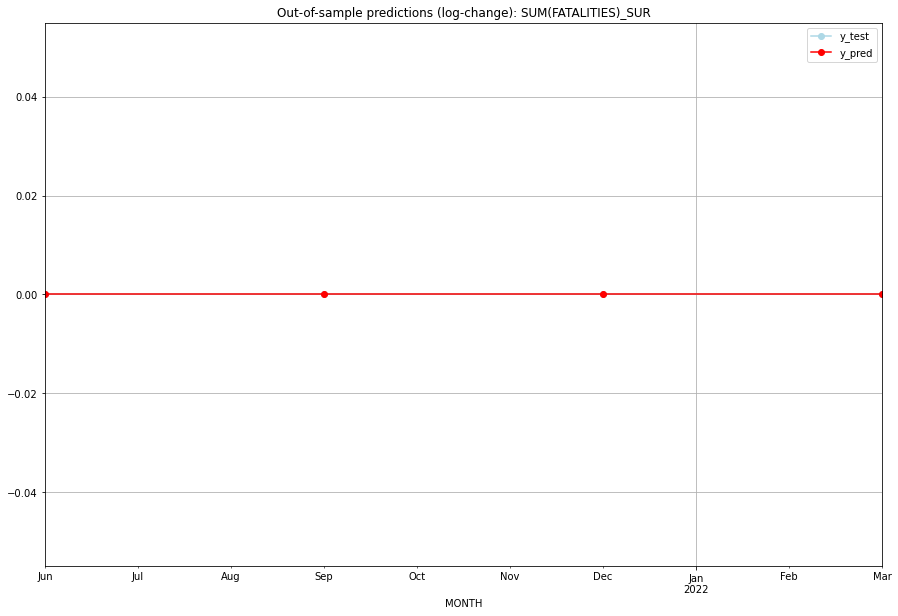

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SUR
1 2021-07-01       0.0         0.0           0.0             0.0   SUR
2 2021-10-01       0.0         0.0           0.0             0.0   SUR
3 2022-01-01       0.0         0.0           0.0             0.0   SUR
Execution time: 00:01
######## SVK (193/234) #########
0
Neighbor countries: []
Getting Data for SVK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

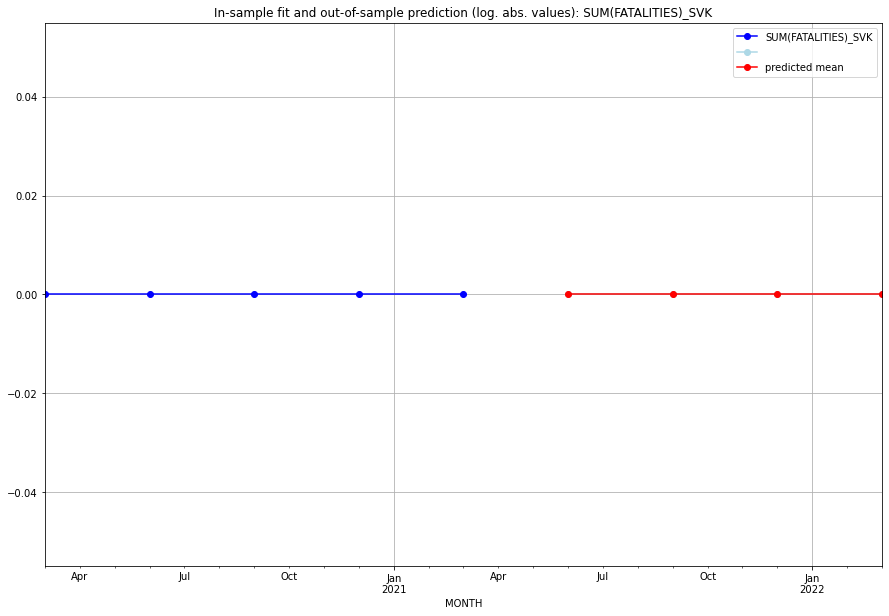

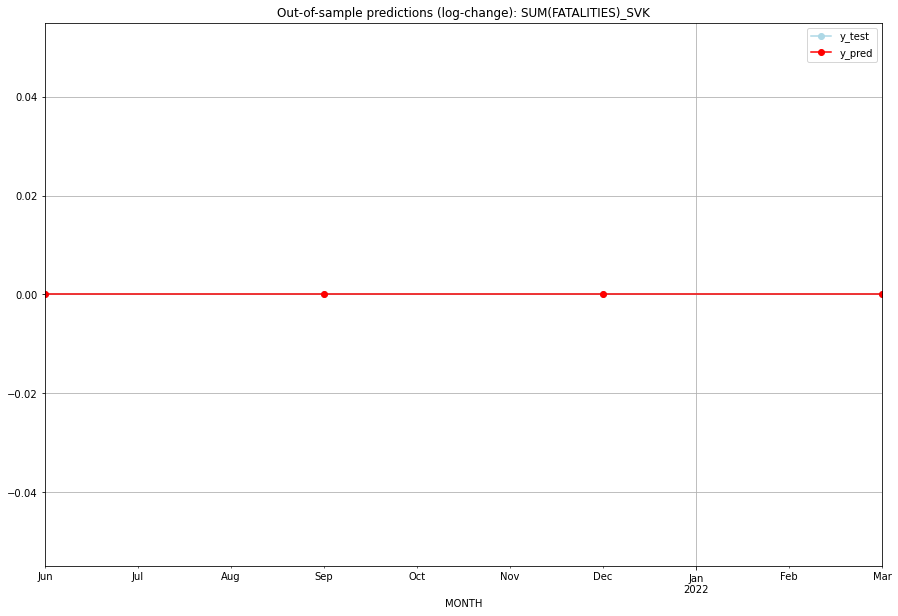

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SVK
1 2021-07-01       0.0         0.0           0.0             0.0   SVK
2 2021-10-01       0.0         0.0           0.0             0.0   SVK
3 2022-01-01       0.0         0.0           0.0             0.0   SVK
Execution time: 00:01
######## SVN (194/234) #########
0
Neighbor countries: []
Getting Data for SVN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

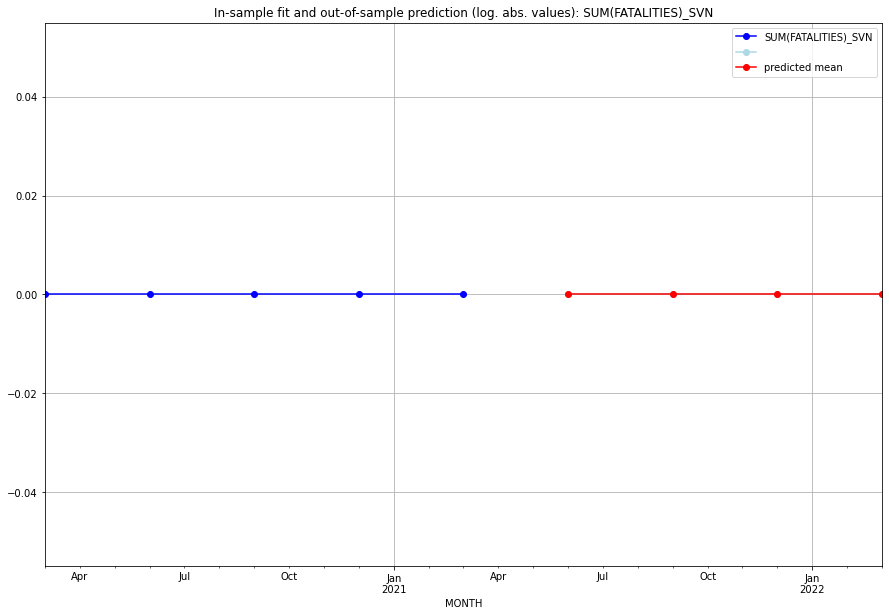

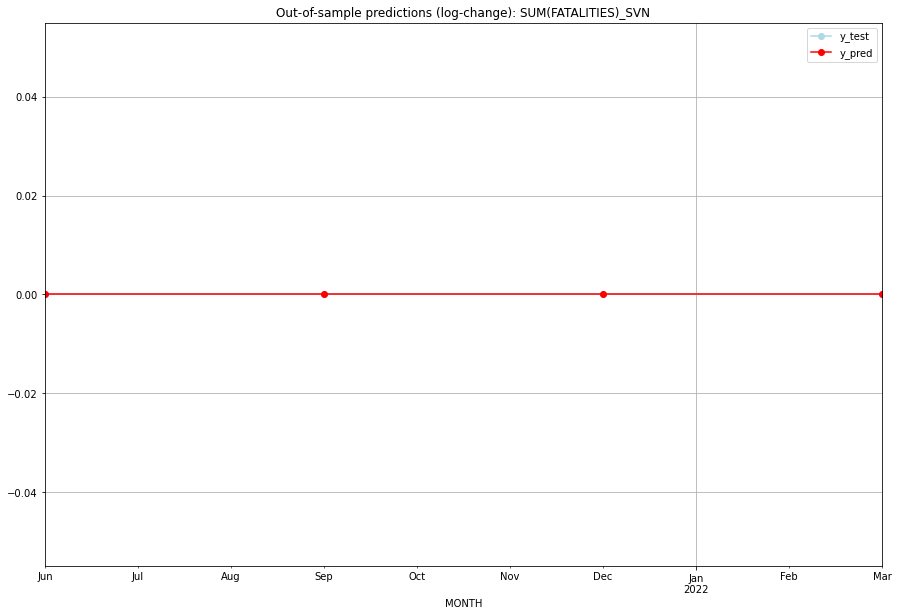

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SVN
1 2021-07-01       0.0         0.0           0.0             0.0   SVN
2 2021-10-01       0.0         0.0           0.0             0.0   SVN
3 2022-01-01       0.0         0.0           0.0             0.0   SVN
Execution time: 00:01
######## SWE (195/234) #########
0
Neighbor countries: []
Getting Data for SWE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

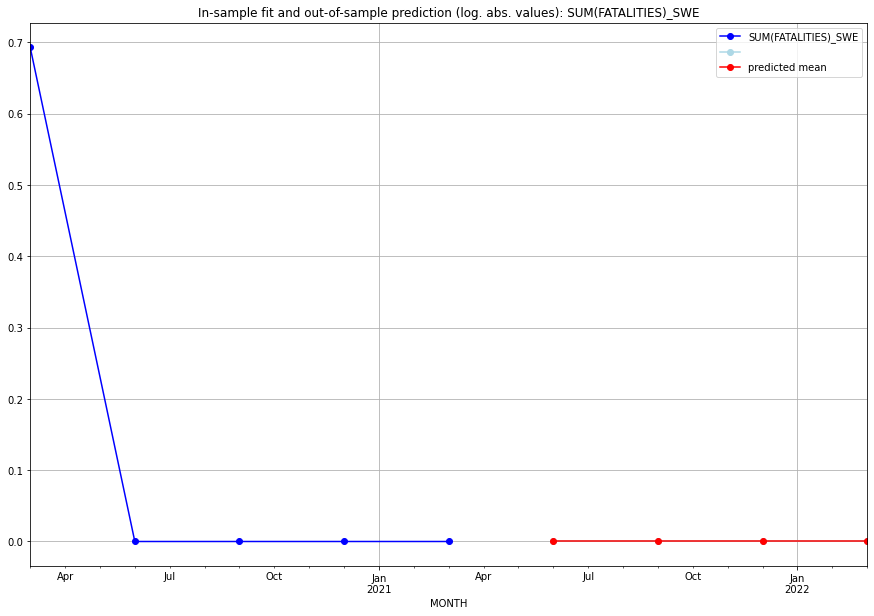

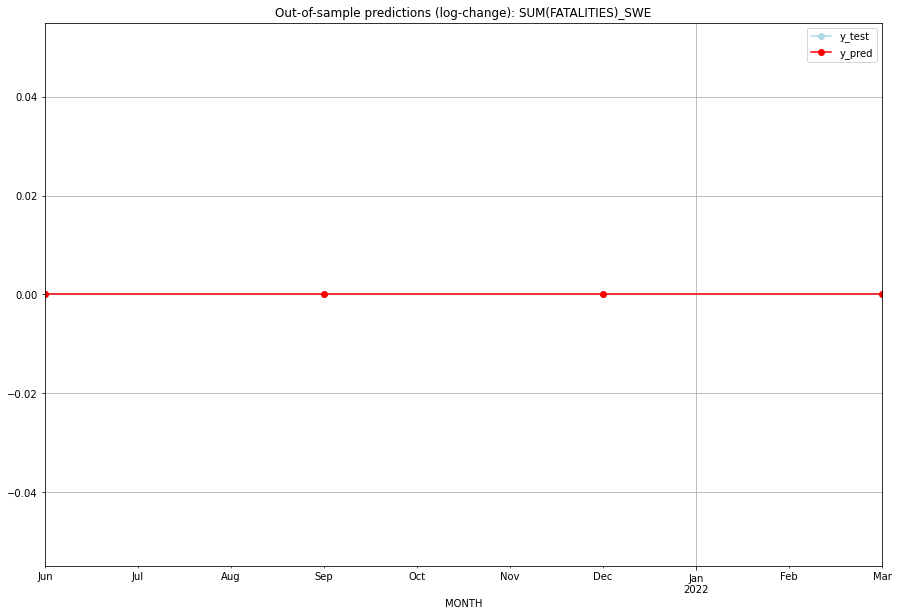

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SWE
1 2021-07-01       0.0         0.0           0.0             0.0   SWE
2 2021-10-01       0.0         0.0           0.0             0.0   SWE
3 2022-01-01       0.0         0.0           0.0             0.0   SWE
Execution time: 00:01
######## SWZ (196/234) #########
0
Neighbor countries: []
Getting Data for SWZ
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

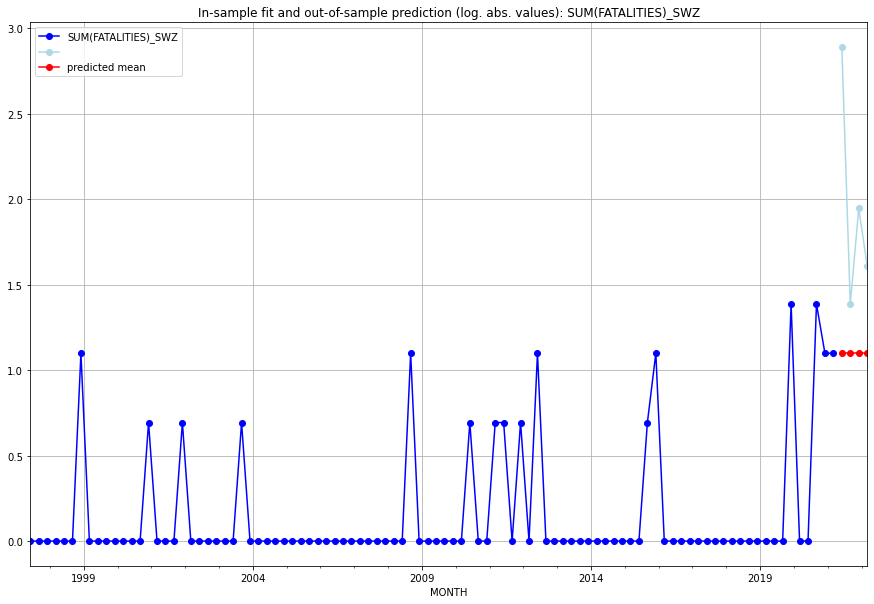

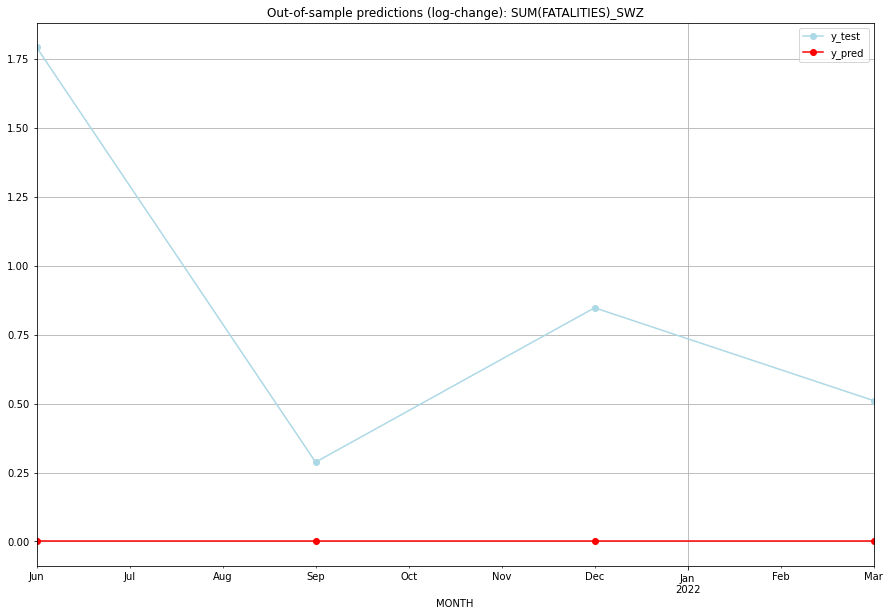

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    2.890372           0.0        1.791759
1  2021-07  1.098612    1.386294           0.0        0.287682
2  2021-10  1.098612    1.945910           0.0        0.847298
3  2022-01  1.098612    1.609438           0.0        0.510826
TADDA: 0.8593912564582573
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    2.890372           0.0        1.791759   SWZ
1 2021-07-01  1.098612    1.386294           0.0        0.287682   SWZ
2 2021-10-01  1.098612    1.945910           0.0        0.847298   SWZ
3 2022-01-01  1.098612    1.609438           0.0        0.510826   SWZ
Execution time: 00:01
######## SXM (197/234) #########
0
Neighbor countries: []
Getting Data for SXM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

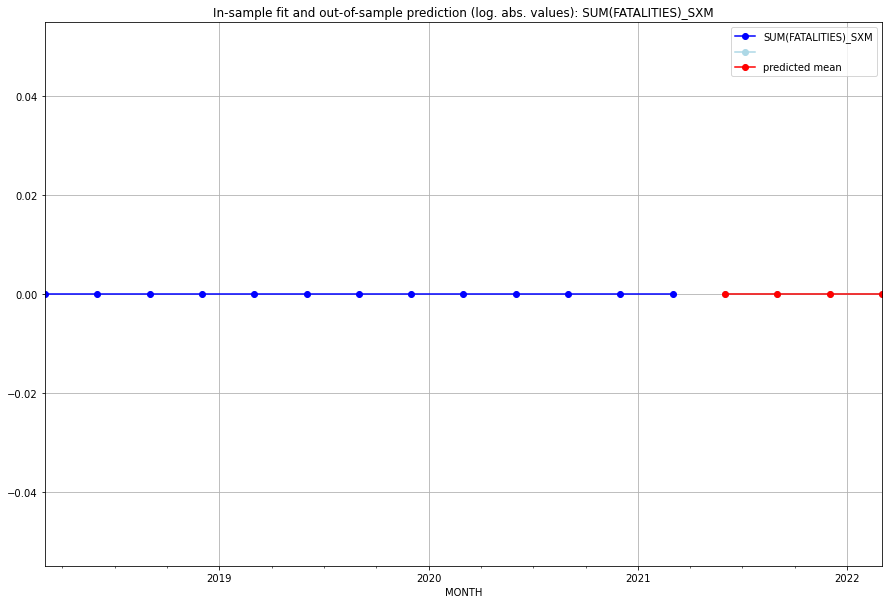

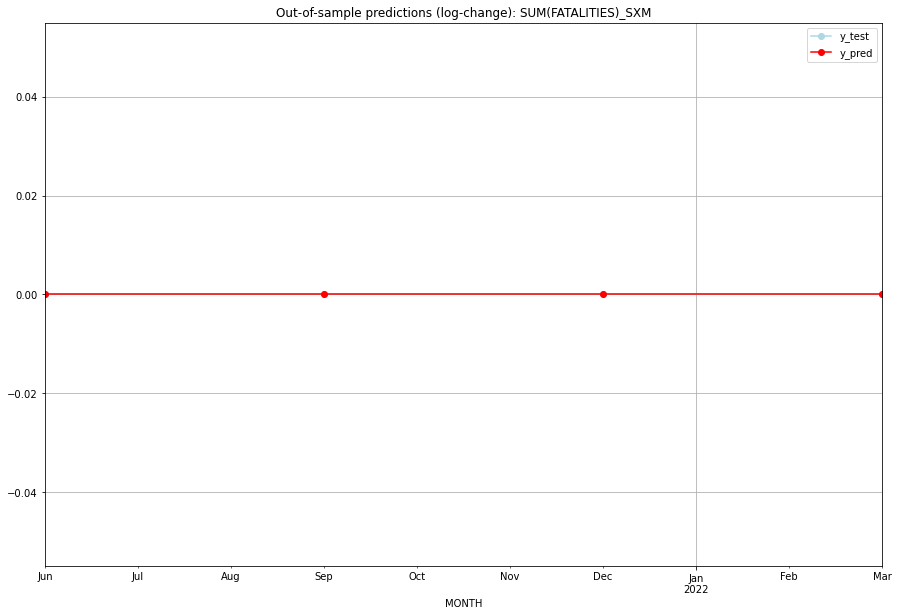

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SXM
1 2021-07-01       0.0         0.0           0.0             0.0   SXM
2 2021-10-01       0.0         0.0           0.0             0.0   SXM
3 2022-01-01       0.0         0.0           0.0             0.0   SXM
Execution time: 00:01
######## SYC (198/234) #########
0
Neighbor countries: []
Getting Data for SYC
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
20

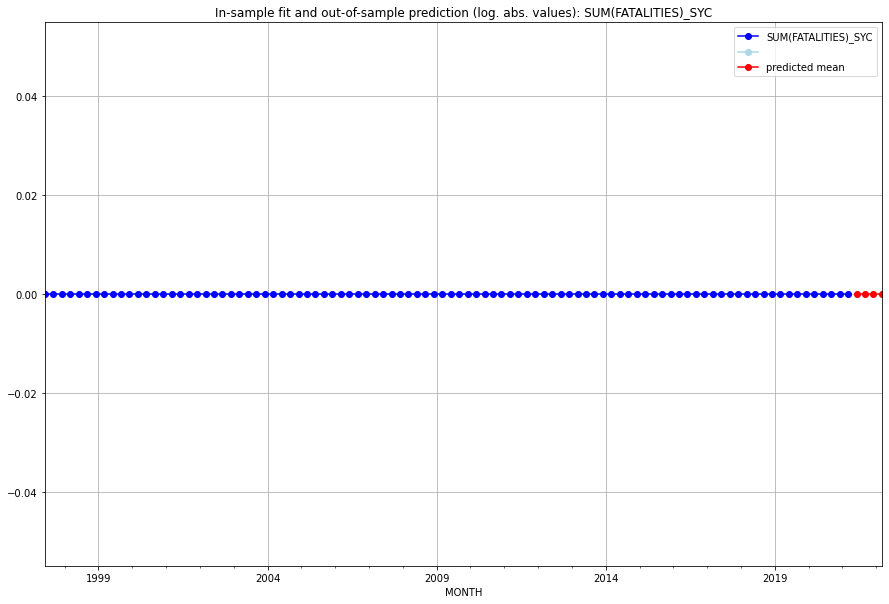

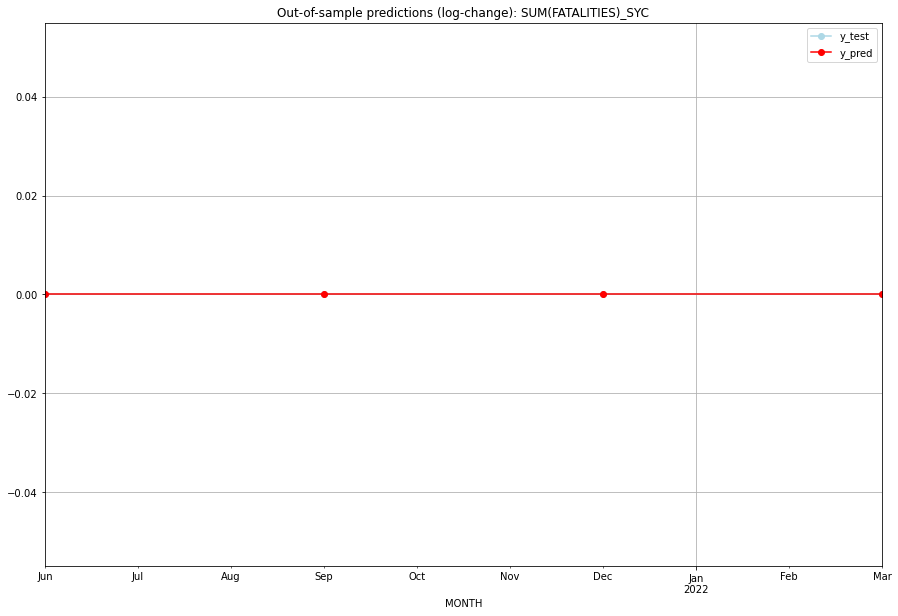

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   SYC
1 2021-07-01       0.0         0.0           0.0             0.0   SYC
2 2021-10-01       0.0         0.0           0.0             0.0   SYC
3 2022-01-01       0.0         0.0           0.0             0.0   SYC
Execution time: 00:01
######## SYR (199/234) #########
0
Neighbor countries: []
Getting Data for SYR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (21, 0)
y: (21, 1)
------------------------------------------------
                0
MONTH            
2021-04

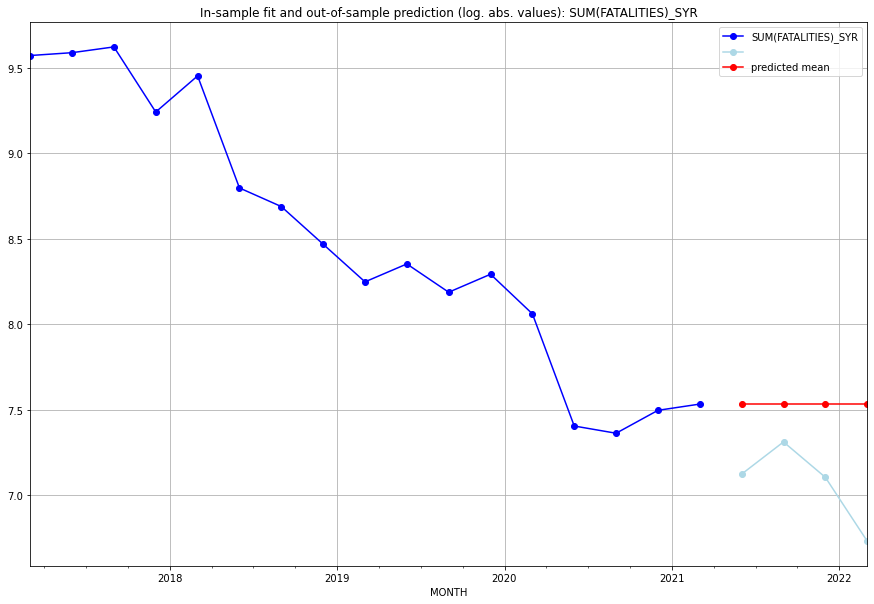

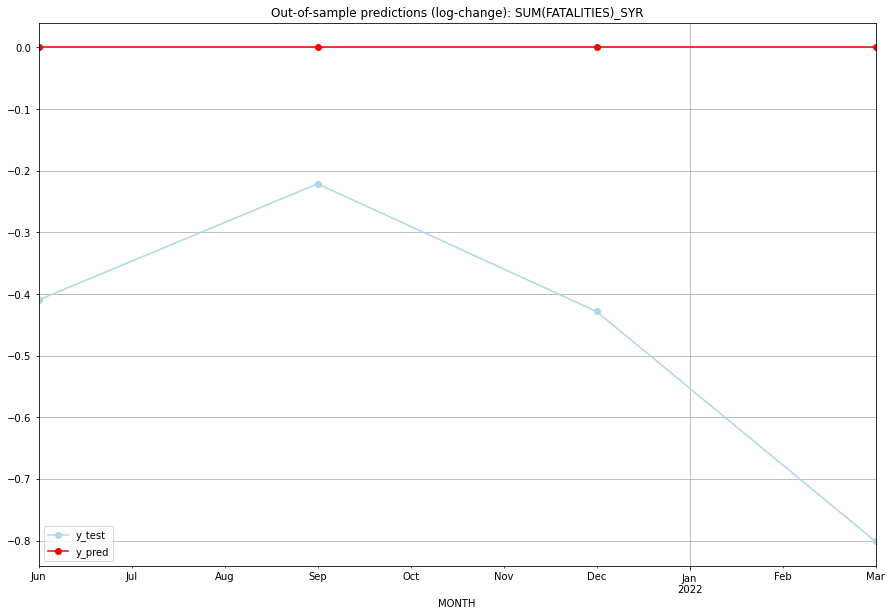

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  7.532624    7.122867           0.0       -0.409757
1  2021-07  7.532624    7.311218           0.0       -0.221405
2  2021-10  7.532624    7.104144           0.0       -0.428480
3  2022-01  7.532624    6.731018           0.0       -0.801606
TADDA: 0.46531180966670793
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  7.532624    7.122867           0.0       -0.409757   SYR
1 2021-07-01  7.532624    7.311218           0.0       -0.221405   SYR
2 2021-10-01  7.532624    7.104144           0.0       -0.428480   SYR
3 2022-01-01  7.532624    6.731018           0.0       -0.801606   SYR
Execution time: 00:01
######## TCA (200/234) #########
0
Neighbor countries: []
Getting Data for TCA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2

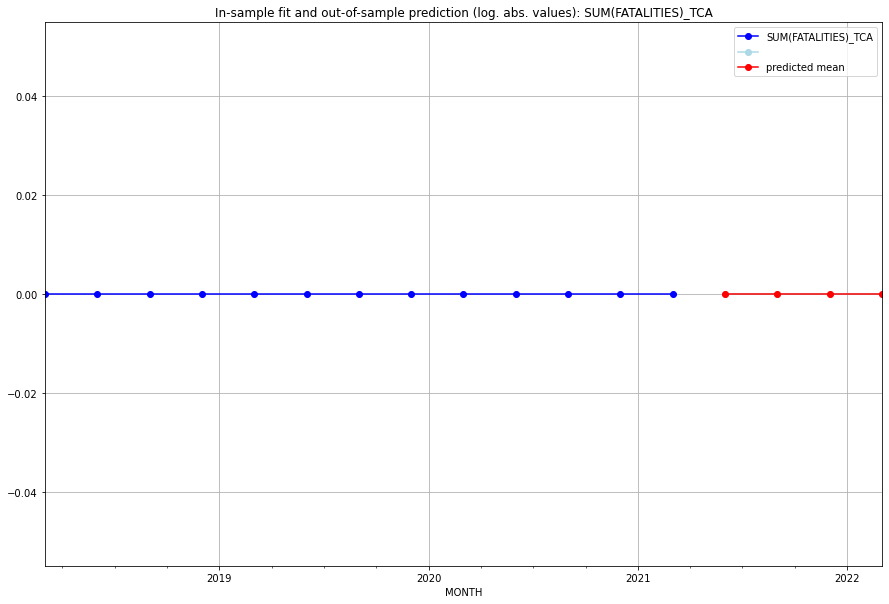

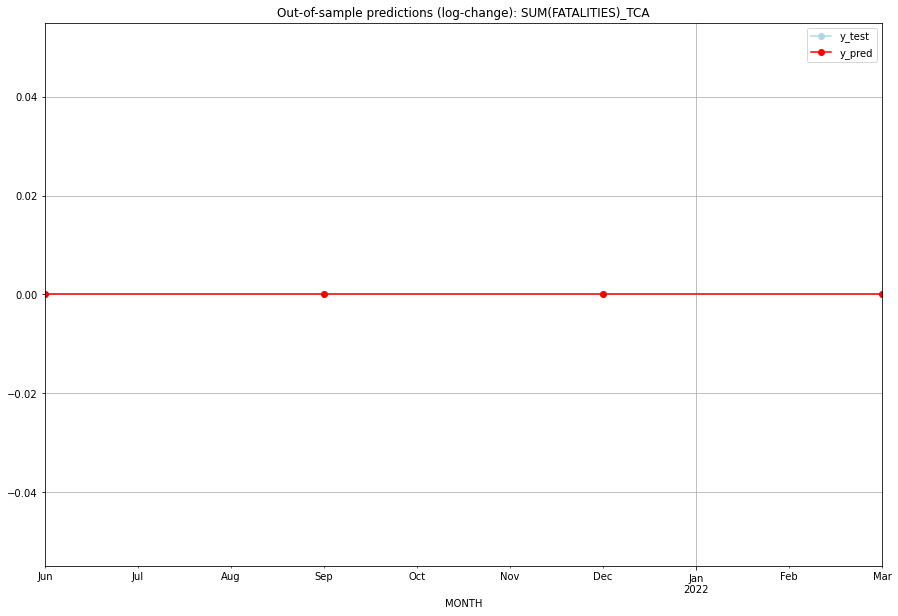

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   TCA
1 2021-07-01       0.0         0.0           0.0             0.0   TCA
2 2021-10-01       0.0         0.0           0.0             0.0   TCA
3 2022-01-01       0.0         0.0           0.0             0.0   TCA
Execution time: 00:01
######## TCD (201/234) #########
0
Neighbor countries: []
Getting Data for TCD
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

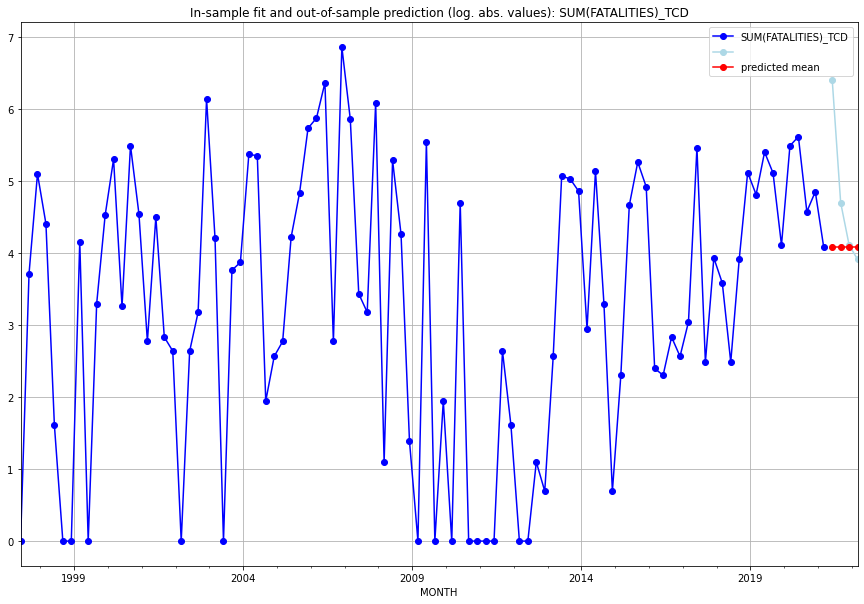

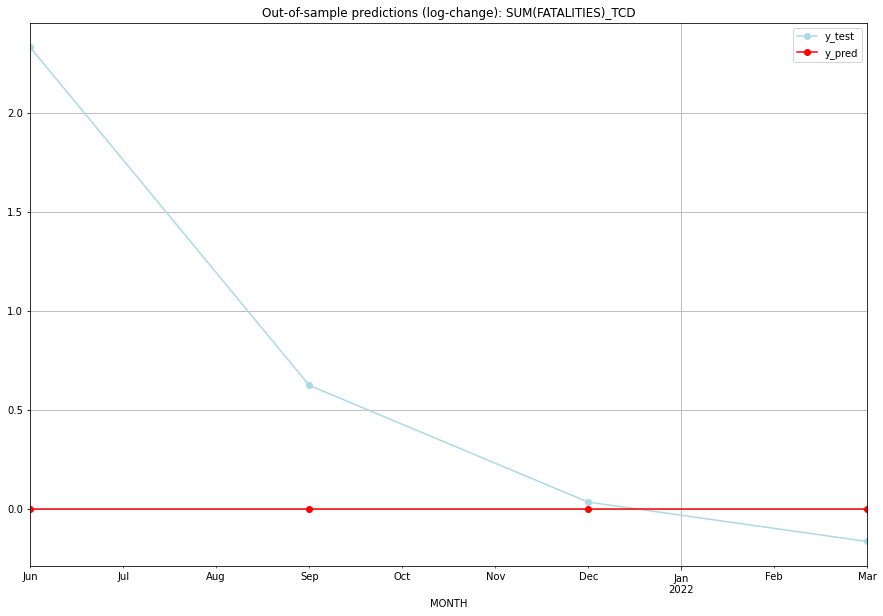

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.077537    6.406880           0.0        2.329343
1  2021-07  4.077537    4.700480           0.0        0.622943
2  2021-10  4.077537    4.110874           0.0        0.033336
3  2022-01  4.077537    3.912023           0.0       -0.165514
TADDA: 0.7877840806988642
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.077537    6.406880           0.0        2.329343   TCD
1 2021-07-01  4.077537    4.700480           0.0        0.622943   TCD
2 2021-10-01  4.077537    4.110874           0.0        0.033336   TCD
3 2022-01-01  4.077537    3.912023           0.0       -0.165514   TCD
Execution time: 00:01
######## TGO (202/234) #########
0
Neighbor countries: []
Getting Data for TGO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

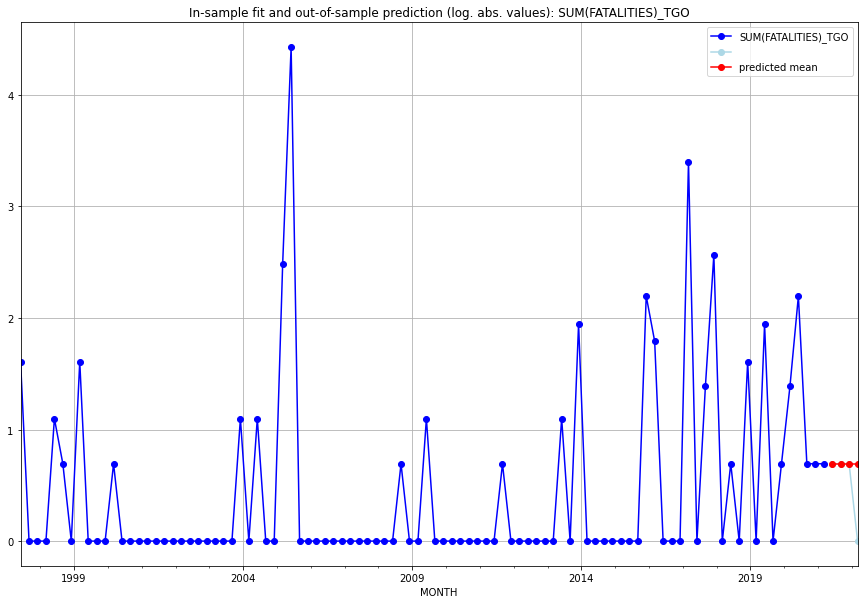

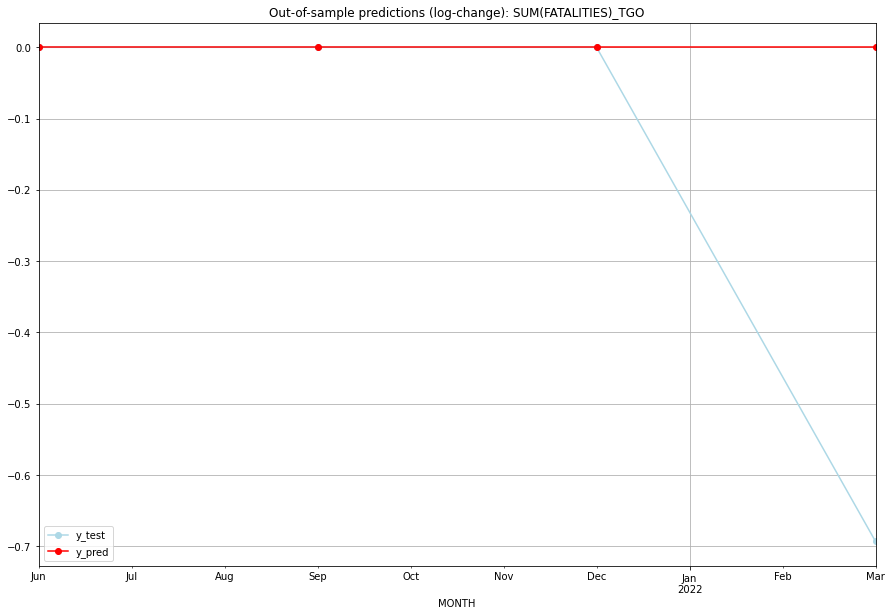

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    0.693147           0.0        0.000000
1  2021-07  0.693147    0.693147           0.0        0.000000
2  2021-10  0.693147    0.693147           0.0        0.000000
3  2022-01  0.693147    0.000000           0.0       -0.693147
TADDA: 0.17328679513998632
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    0.693147           0.0        0.000000   TGO
1 2021-07-01  0.693147    0.693147           0.0        0.000000   TGO
2 2021-10-01  0.693147    0.693147           0.0        0.000000   TGO
3 2022-01-01  0.693147    0.000000           0.0       -0.693147   TGO
Execution time: 00:01
######## THA (203/234) #########
0
Neighbor countries: []
Getting Data for THA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
                0
MONTH    

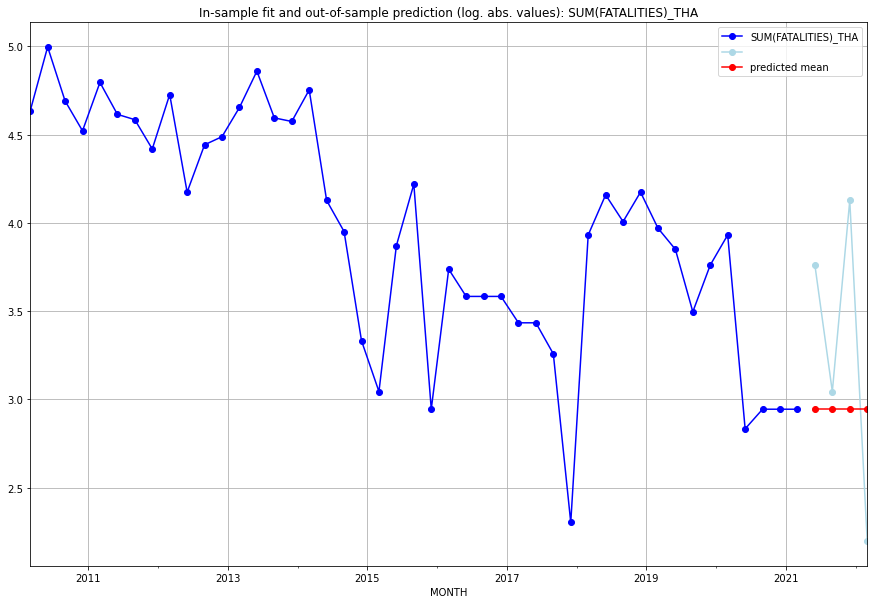

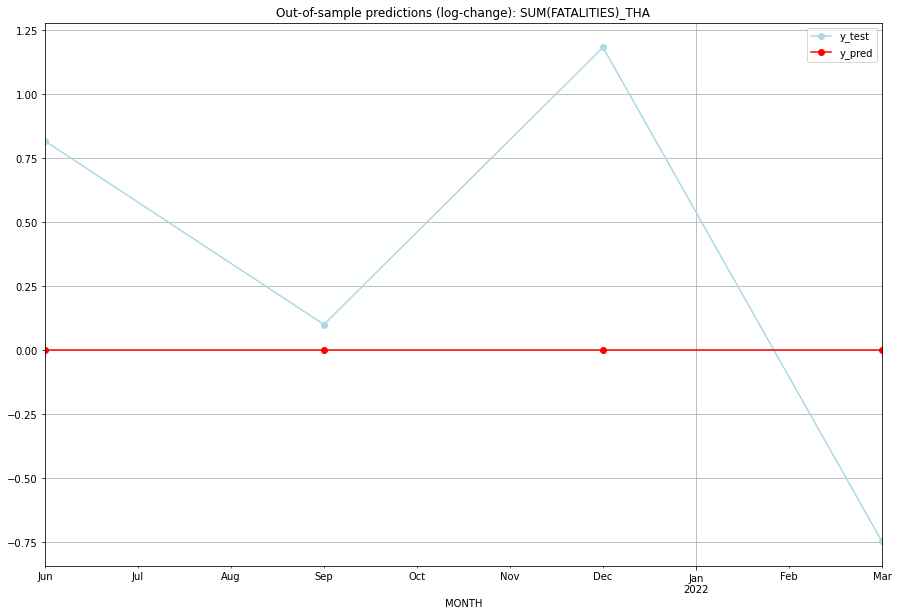

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.944439    3.761200           0.0        0.816761
1  2021-07  2.944439    3.044522           0.0        0.100083
2  2021-10  2.944439    4.127134           0.0        1.182695
3  2022-01  2.944439    2.197225           0.0       -0.747214
TADDA: 0.7116886006982439
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.944439    3.761200           0.0        0.816761   THA
1 2021-07-01  2.944439    3.044522           0.0        0.100083   THA
2 2021-10-01  2.944439    4.127134           0.0        1.182695   THA
3 2022-01-01  2.944439    2.197225           0.0       -0.747214   THA
Execution time: 00:01
######## TJK (204/234) #########
0
Neighbor countries: []
Getting Data for TJK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

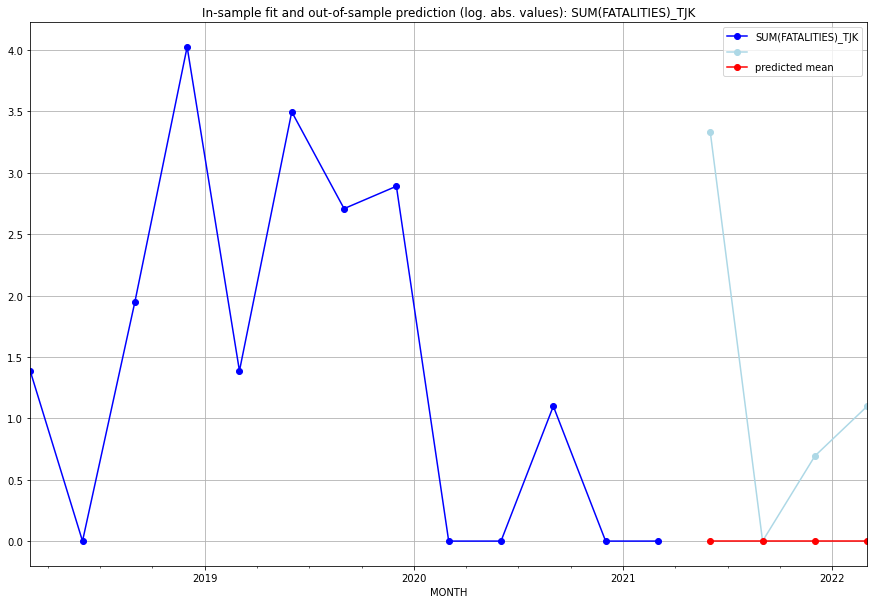

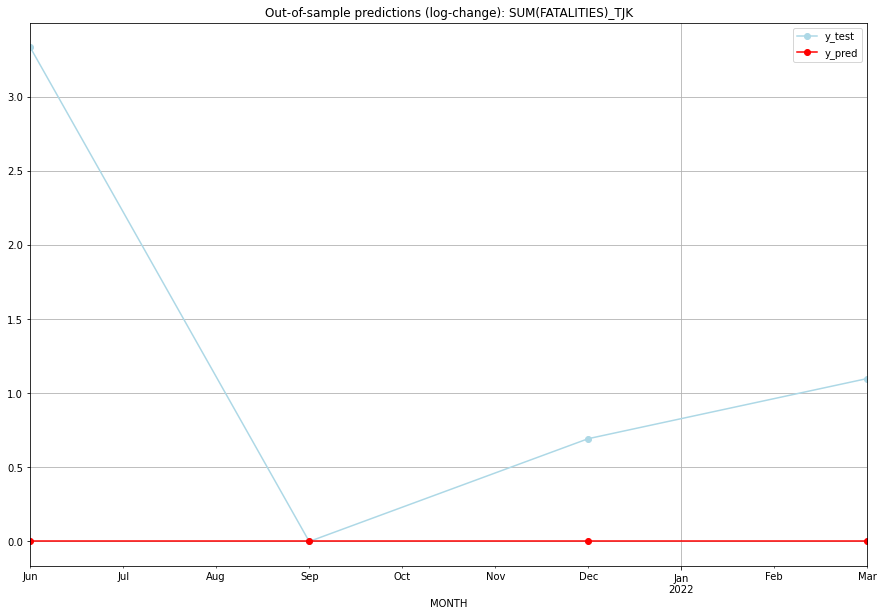

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    3.332205           0.0        3.332205
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.693147           0.0        0.693147
3  2022-01       0.0    1.098612           0.0        1.098612
TADDA: 1.2809909948508147
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    3.332205           0.0        3.332205   TJK
1 2021-07-01       0.0    0.000000           0.0        0.000000   TJK
2 2021-10-01       0.0    0.693147           0.0        0.693147   TJK
3 2022-01-01       0.0    1.098612           0.0        1.098612   TJK
Execution time: 00:01
######## TKM (205/234) #########
0
Neighbor countries: []
Getting Data for TKM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

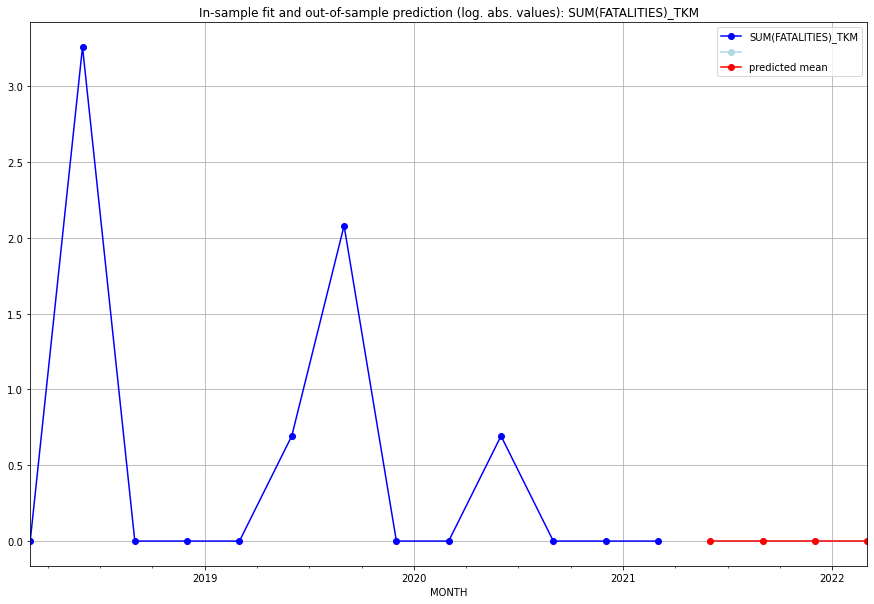

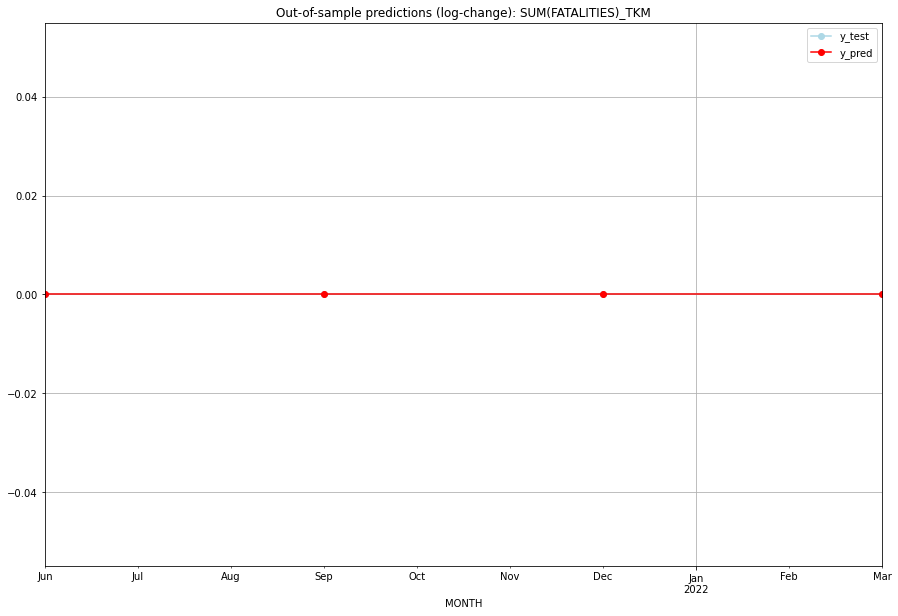

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   TKM
1 2021-07-01       0.0         0.0           0.0             0.0   TKM
2 2021-10-01       0.0         0.0           0.0             0.0   TKM
3 2022-01-01       0.0         0.0           0.0             0.0   TKM
Execution time: 00:01
######## TLS (206/234) #########
0
Neighbor countries: []
Getting Data for TLS
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
20

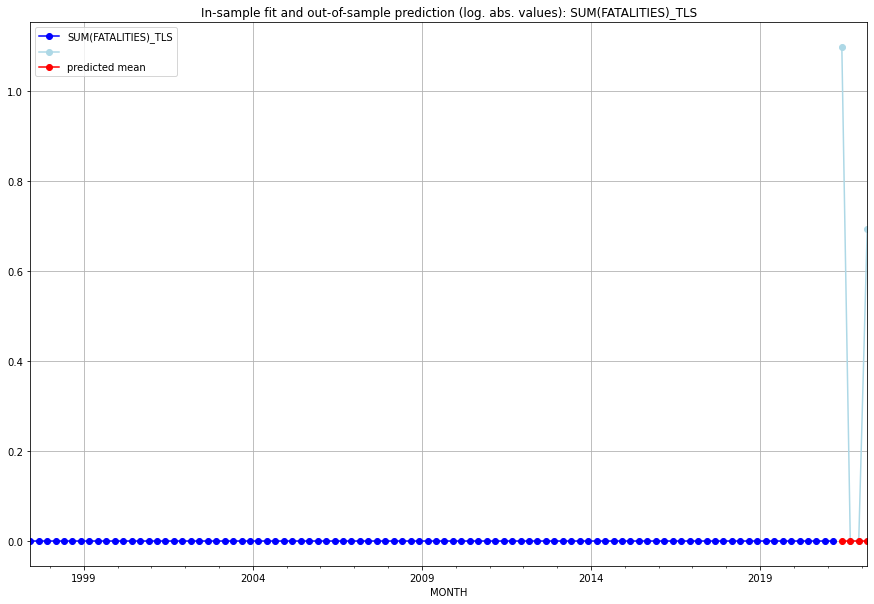

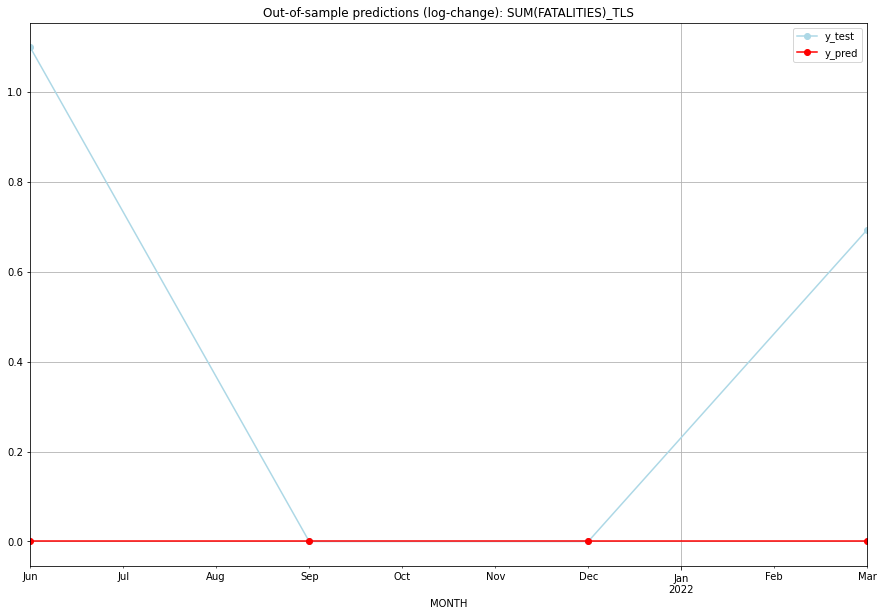

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.098612           0.0        1.098612
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.693147           0.0        0.693147
TADDA: 0.44793986730701374
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.098612           0.0        1.098612   TLS
1 2021-07-01       0.0    0.000000           0.0        0.000000   TLS
2 2021-10-01       0.0    0.000000           0.0        0.000000   TLS
3 2022-01-01       0.0    0.693147           0.0        0.693147   TLS
Execution time: 00:01
######## TON (207/234) #########
0
Neighbor countries: []
Getting Data for TON
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
202

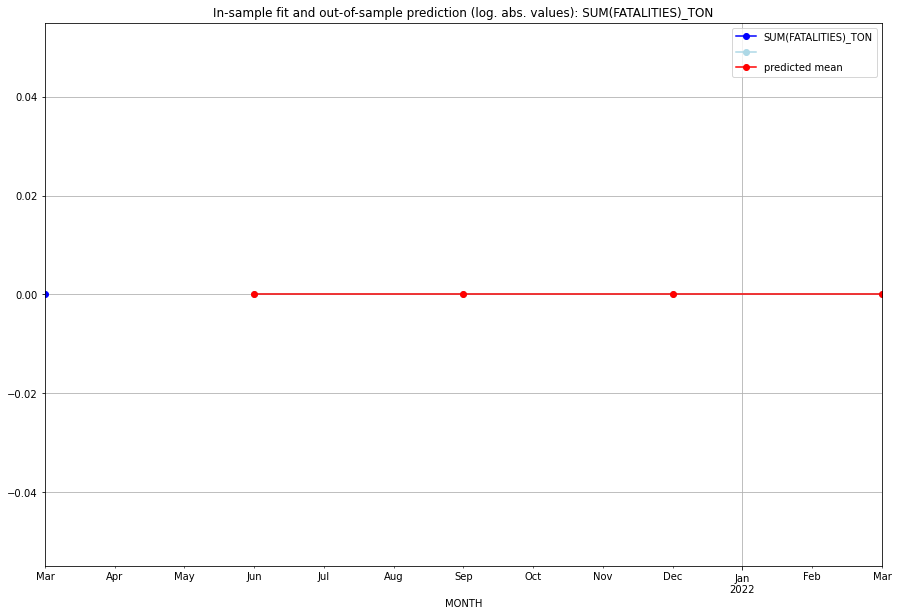

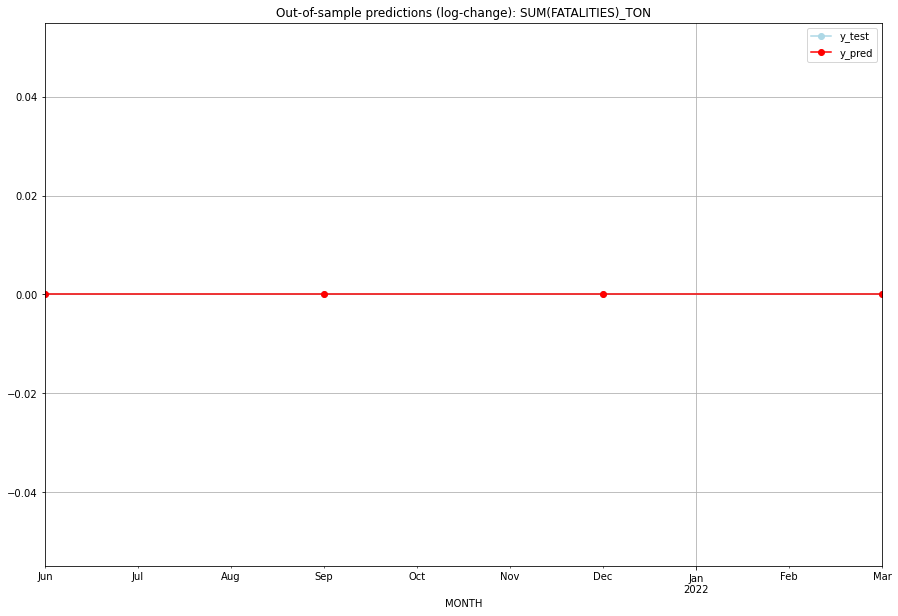

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   TON
1 2021-07-01       0.0         0.0           0.0             0.0   TON
2 2021-10-01       0.0         0.0           0.0             0.0   TON
3 2022-01-01       0.0         0.0           0.0             0.0   TON
Execution time: 00:01
######## TTO (208/234) #########
0
Neighbor countries: []
Getting Data for TTO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04

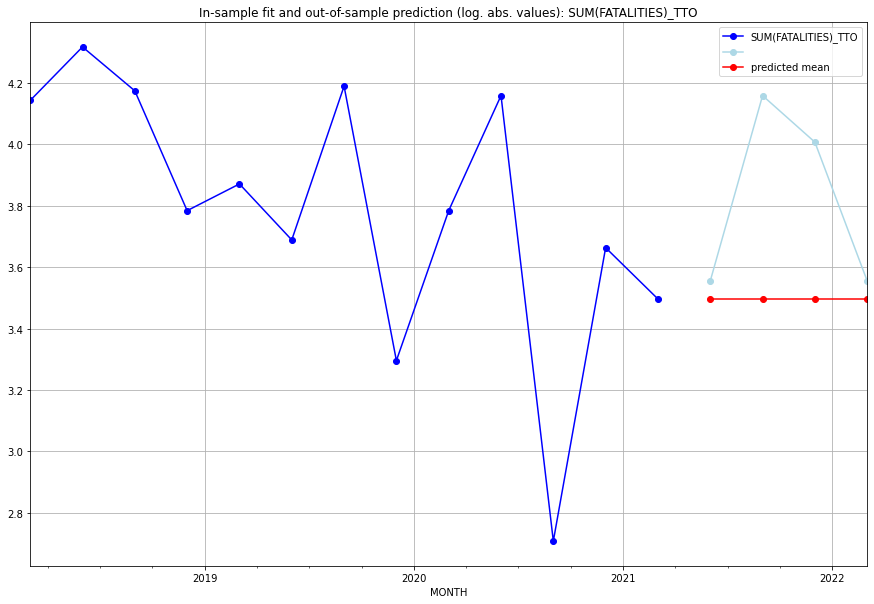

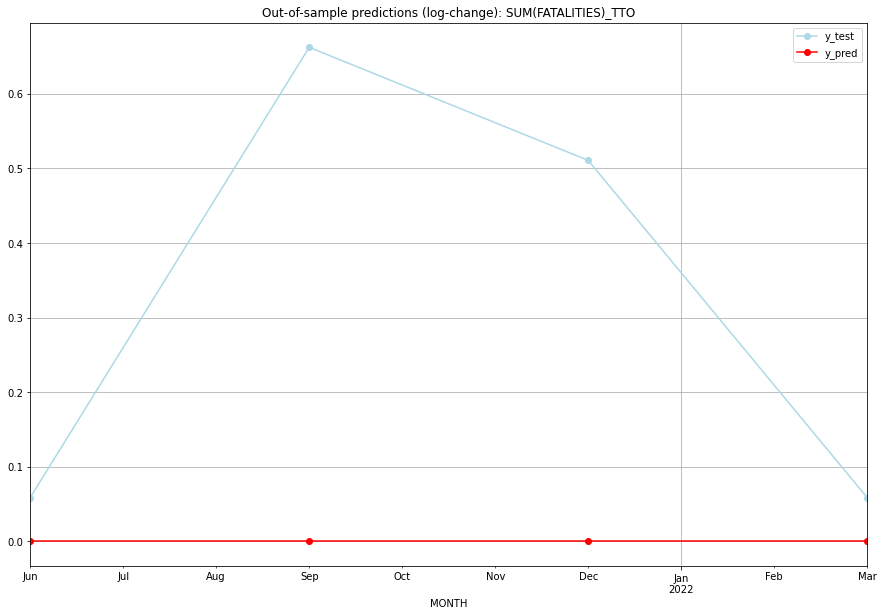

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.496508    3.555348           0.0        0.058841
1  2021-07  3.496508    4.158883           0.0        0.662376
2  2021-10  3.496508    4.007333           0.0        0.510826
3  2022-01  3.496508    3.555348           0.0        0.058841
TADDA: 0.32272053642626264
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.496508    3.555348           0.0        0.058841   TTO
1 2021-07-01  3.496508    4.158883           0.0        0.662376   TTO
2 2021-10-01  3.496508    4.007333           0.0        0.510826   TTO
3 2022-01-01  3.496508    3.555348           0.0        0.058841   TTO
Execution time: 00:01
######## TUN (209/234) #########
0
Neighbor countries: []
Getting Data for TUN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH  

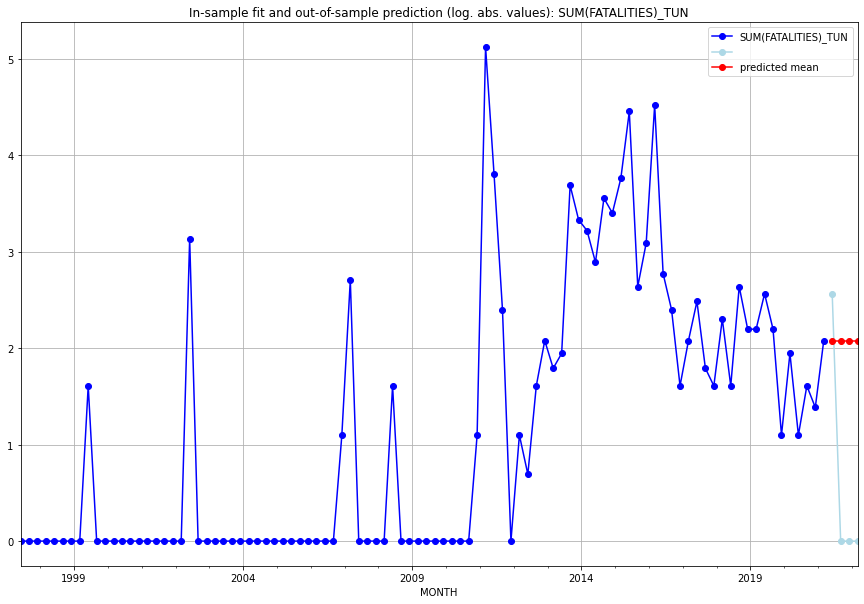

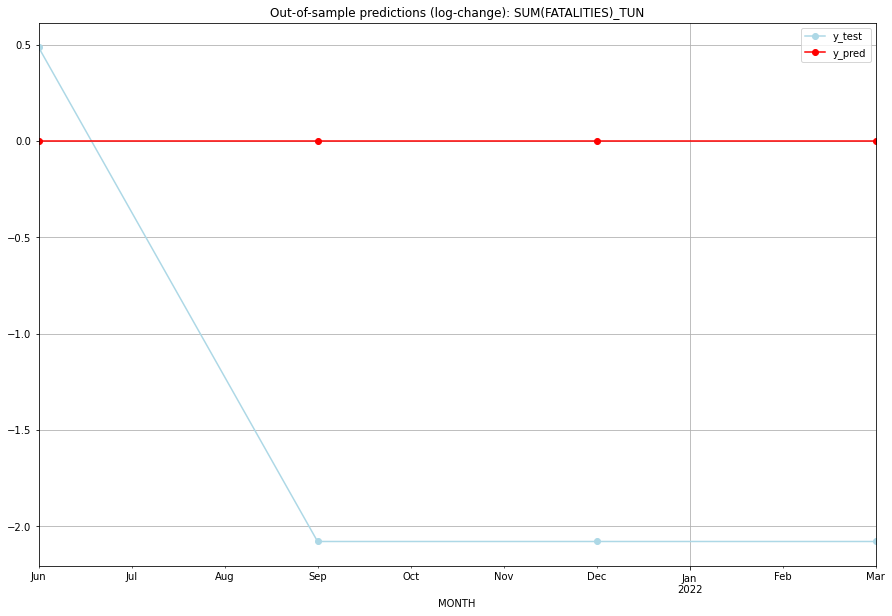

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  2.079442    2.564949           0.0        0.485508
1  2021-07  2.079442    0.000000           0.0       -2.079442
2  2021-10  2.079442    0.000000           0.0       -2.079442
3  2022-01  2.079442    0.000000           0.0       -2.079442
TADDA: 1.6809581102053022
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  2.079442    2.564949           0.0        0.485508   TUN
1 2021-07-01  2.079442    0.000000           0.0       -2.079442   TUN
2 2021-10-01  2.079442    0.000000           0.0       -2.079442   TUN
3 2022-01-01  2.079442    0.000000           0.0       -2.079442   TUN
Execution time: 00:01
######## TUR (210/234) #########
0
Neighbor countries: []
Getting Data for TUR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (25, 0)
y: (25, 1)
------------------------------------------------
                0
MONTH     

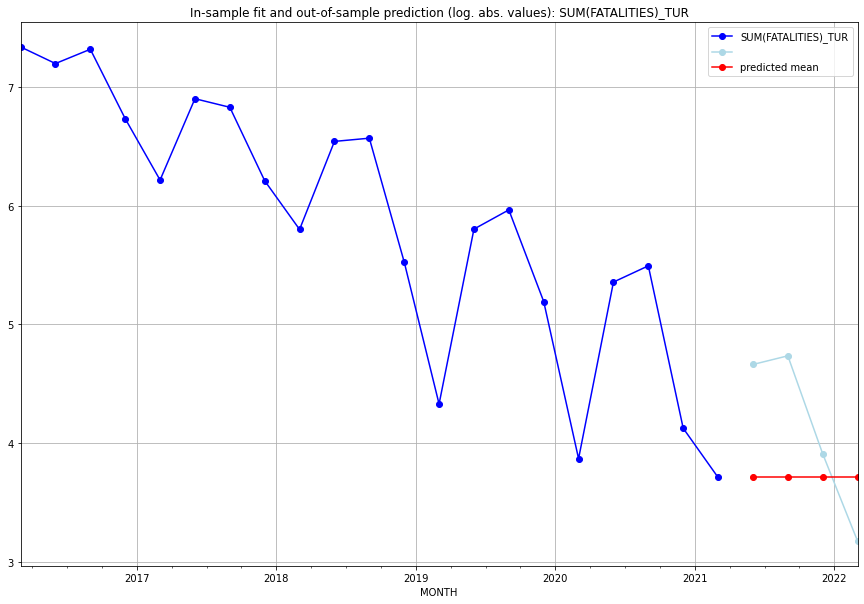

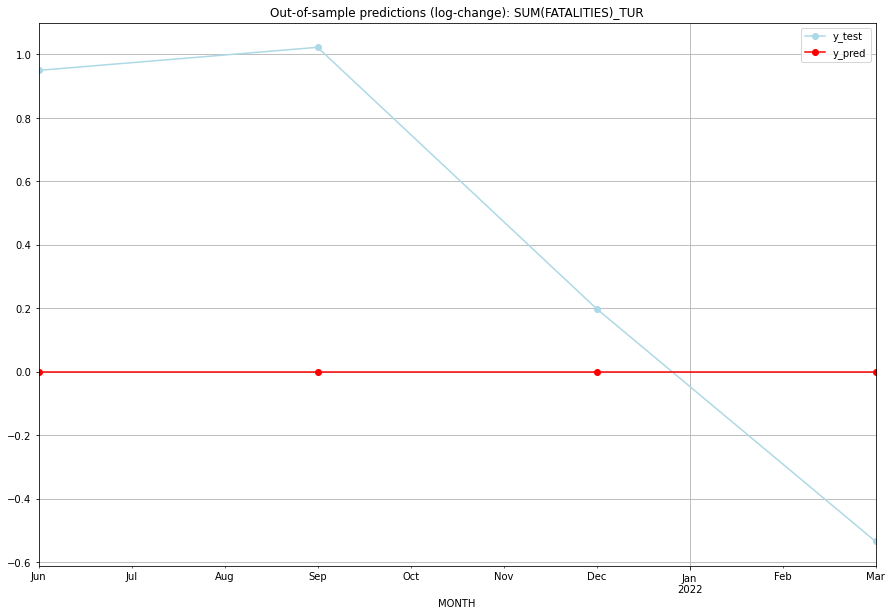

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.713572    4.663439           0.0        0.949867
1  2021-07  3.713572    4.736198           0.0        1.022626
2  2021-10  3.713572    3.912023           0.0        0.198451
3  2022-01  3.713572    3.178054           0.0       -0.535518
TADDA: 0.6766156460445367
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.713572    4.663439           0.0        0.949867   TUR
1 2021-07-01  3.713572    4.736198           0.0        1.022626   TUR
2 2021-10-01  3.713572    3.912023           0.0        0.198451   TUR
3 2022-01-01  3.713572    3.178054           0.0       -0.535518   TUR
Execution time: 00:01
######## TWN (211/234) #########
0
Neighbor countries: []
Getting Data for TWN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

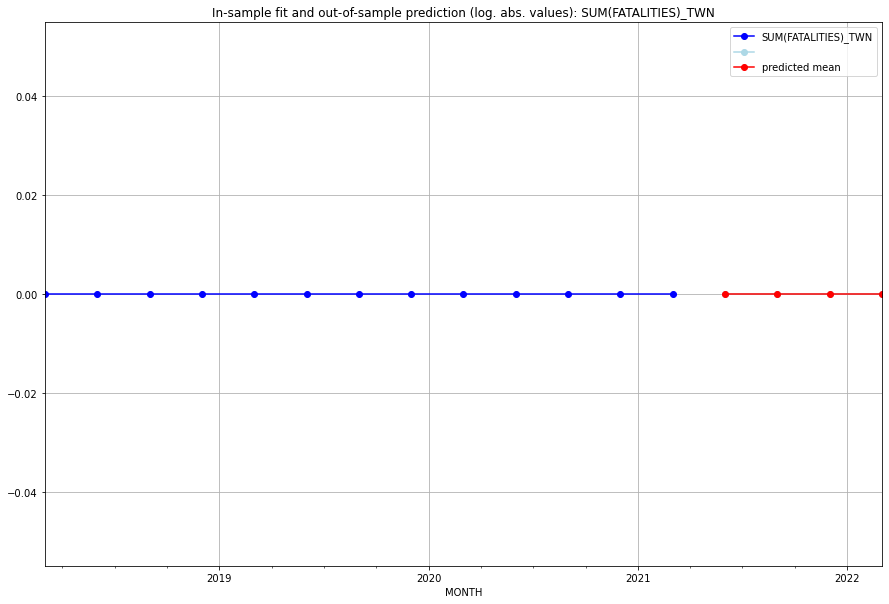

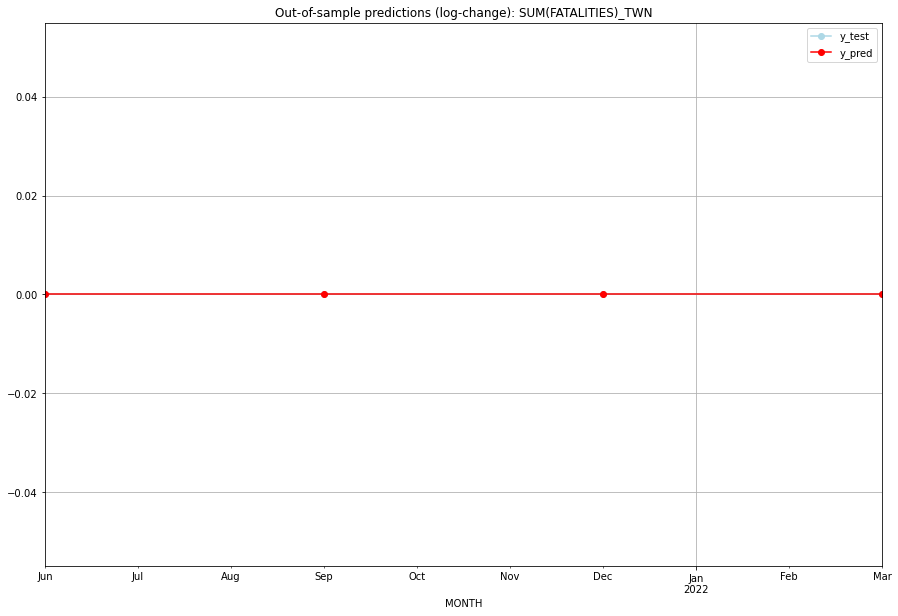

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   TWN
1 2021-07-01       0.0         0.0           0.0             0.0   TWN
2 2021-10-01       0.0         0.0           0.0             0.0   TWN
3 2022-01-01       0.0         0.0           0.0             0.0   TWN
Execution time: 00:01
######## TZA (212/234) #########
0
Neighbor countries: []
Getting Data for TZA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

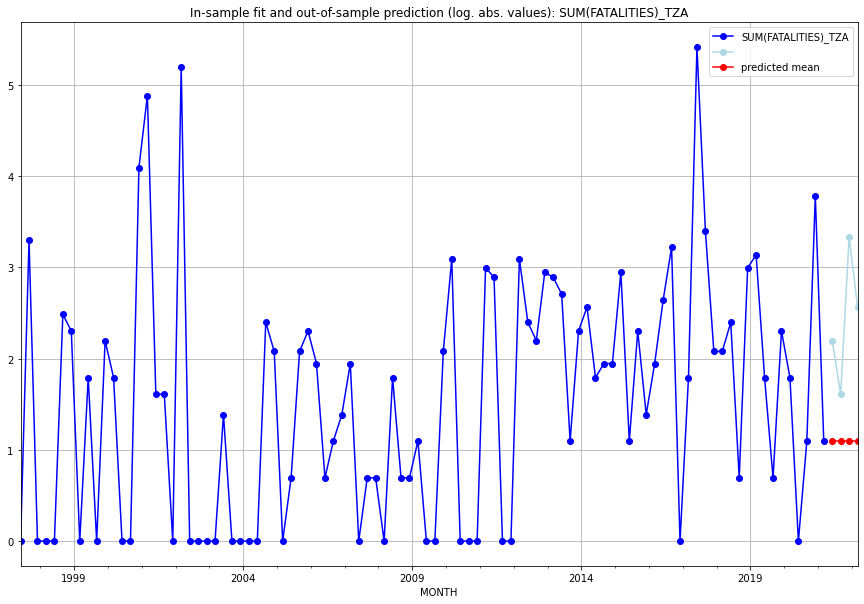

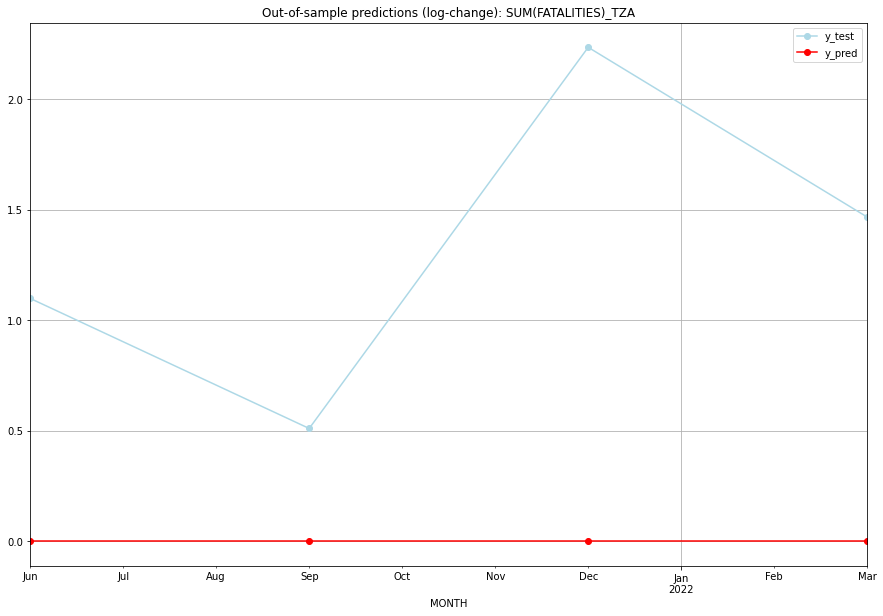

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.098612    2.197225           0.0        1.098612
1  2021-07  1.098612    1.609438           0.0        0.510826
2  2021-10  1.098612    3.332205           0.0        2.233592
3  2022-01  1.098612    2.564949           0.0        1.466337
TADDA: 1.3273418006836555
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.098612    2.197225           0.0        1.098612   TZA
1 2021-07-01  1.098612    1.609438           0.0        0.510826   TZA
2 2021-10-01  1.098612    3.332205           0.0        2.233592   TZA
3 2022-01-01  1.098612    2.564949           0.0        1.466337   TZA
Execution time: 00:01
######## UGA (213/234) #########
0
Neighbor countries: []
Getting Data for UGA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
               0
MONTH    

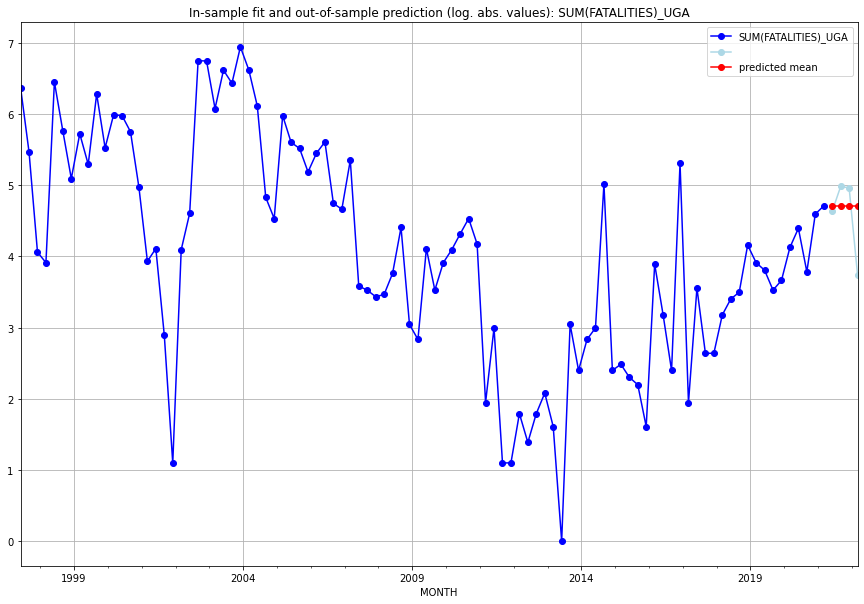

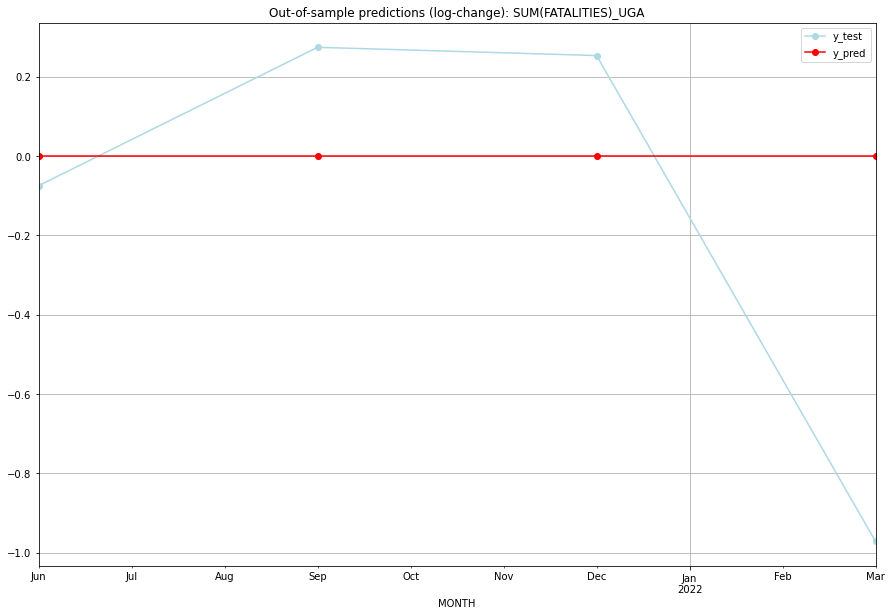

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04   4.70953    4.634729           0.0       -0.074801
1  2021-07   4.70953    4.983607           0.0        0.274076
2  2021-10   4.70953    4.962845           0.0        0.253314
3  2022-01   4.70953    3.737670           0.0       -0.971861
TADDA: 0.39351316136380987
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01   4.70953    4.634729           0.0       -0.074801   UGA
1 2021-07-01   4.70953    4.983607           0.0        0.274076   UGA
2 2021-10-01   4.70953    4.962845           0.0        0.253314   UGA
3 2022-01-01   4.70953    3.737670           0.0       -0.971861   UGA
Execution time: 00:01
######## UKR (214/234) #########
0
Neighbor countries: []
Getting Data for UKR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH    

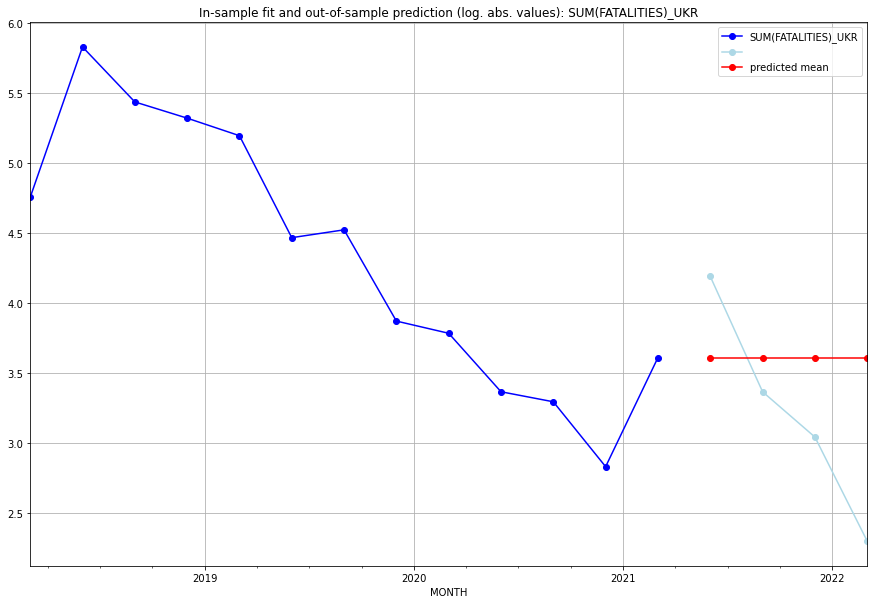

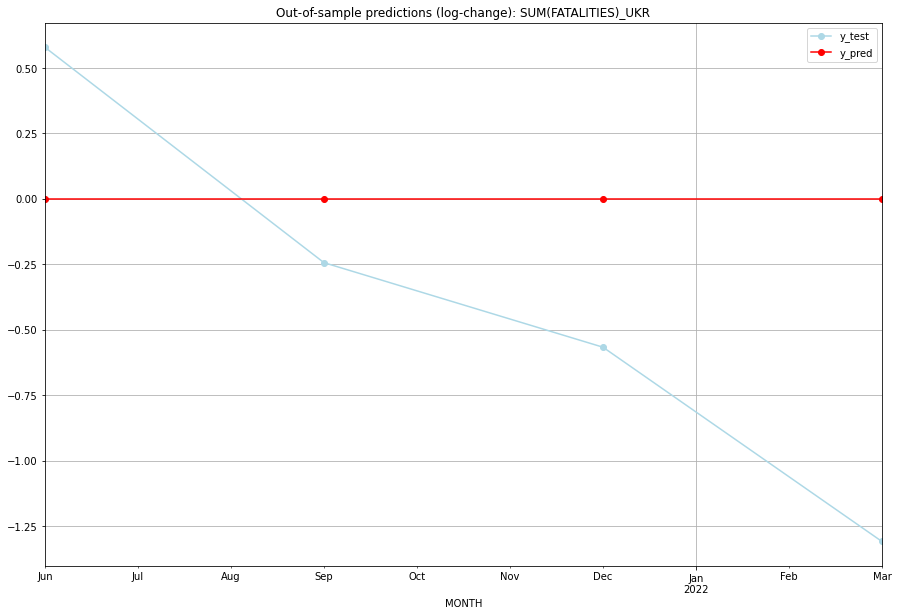

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.610918    4.189655           0.0        0.578737
1  2021-07  3.610918    3.367296           0.0       -0.243622
2  2021-10  3.610918    3.044522           0.0       -0.566395
3  2022-01  3.610918    2.302585           0.0       -1.308333
TADDA: 0.6742718016527325
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.610918    4.189655           0.0        0.578737   UKR
1 2021-07-01  3.610918    3.367296           0.0       -0.243622   UKR
2 2021-10-01  3.610918    3.044522           0.0       -0.566395   UKR
3 2022-01-01  3.610918    2.302585           0.0       -1.308333   UKR
Execution time: 00:01
######## URY (215/234) #########
0
Neighbor countries: []
Getting Data for URY
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

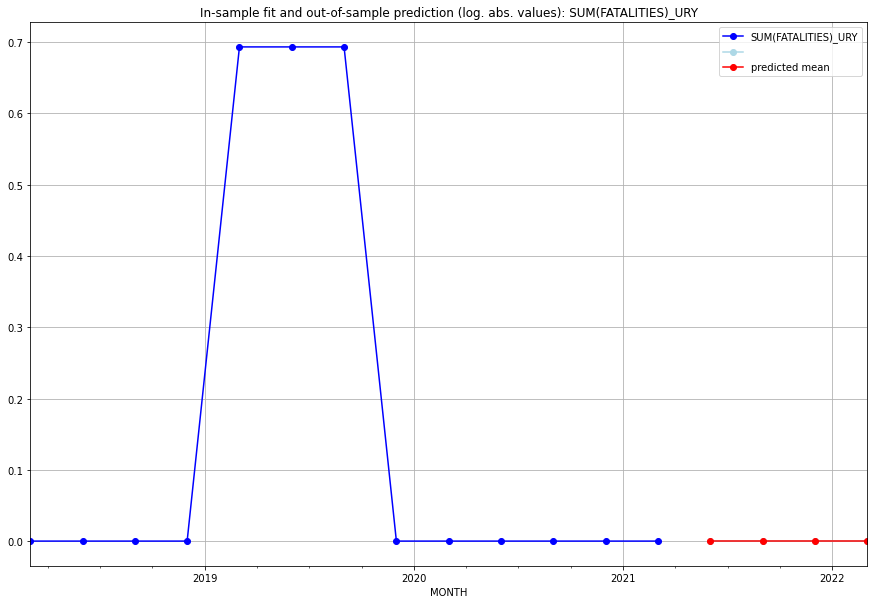

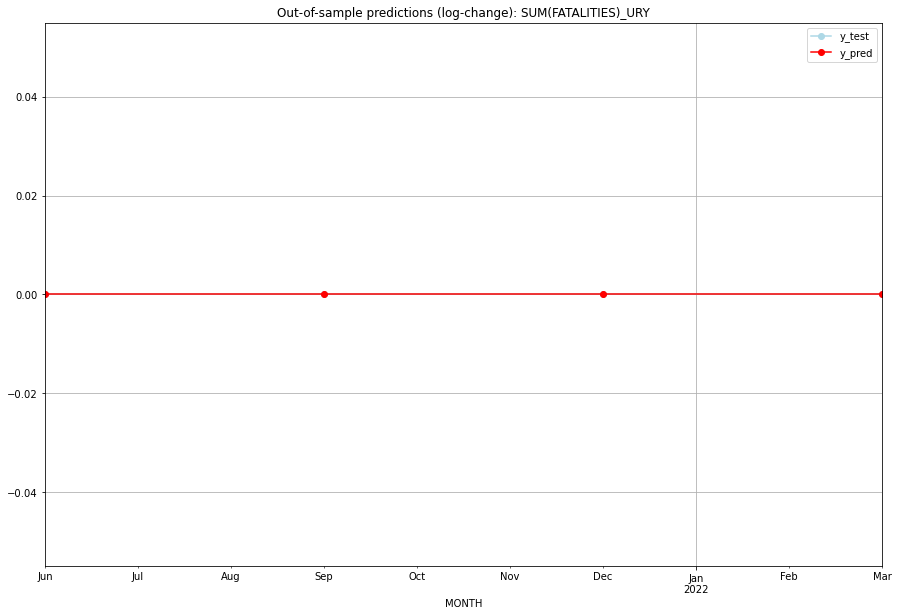

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   URY
1 2021-07-01       0.0         0.0           0.0             0.0   URY
2 2021-10-01       0.0         0.0           0.0             0.0   URY
3 2022-01-01       0.0         0.0           0.0             0.0   URY
Execution time: 00:01
######## USA (216/234) #########
0
Neighbor countries: []
Getting Data for USA
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
                0
MONTH            
2021-04  

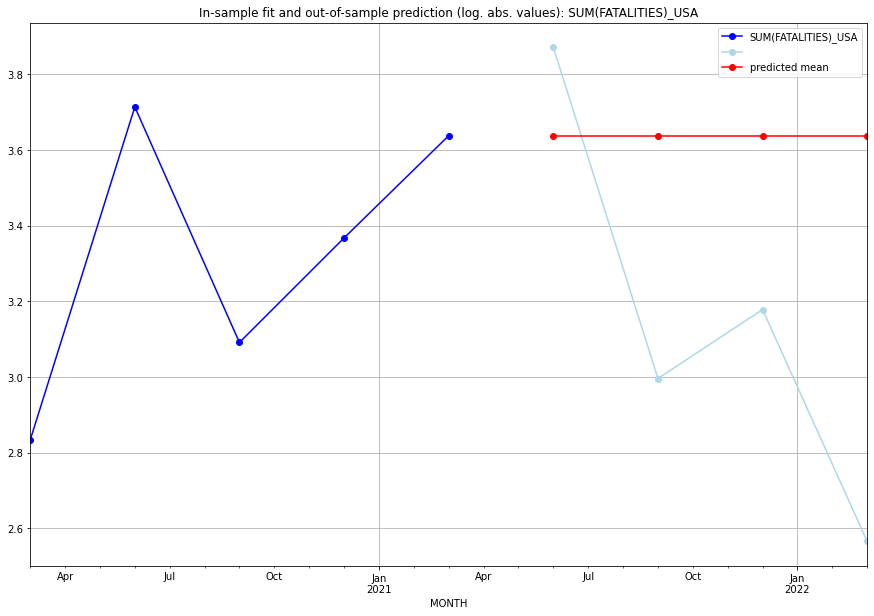

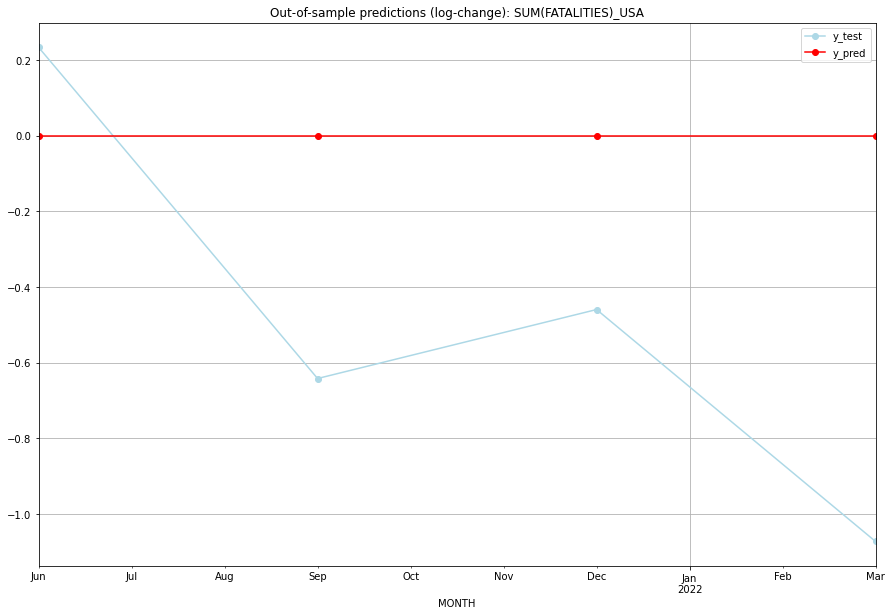

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  3.637586    3.871201           0.0        0.233615
1  2021-07  3.637586    2.995732           0.0       -0.641854
2  2021-10  3.637586    3.178054           0.0       -0.459532
3  2022-01  3.637586    2.564949           0.0       -1.072637
TADDA: 0.6019094672492973
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  3.637586    3.871201           0.0        0.233615   USA
1 2021-07-01  3.637586    2.995732           0.0       -0.641854   USA
2 2021-10-01  3.637586    3.178054           0.0       -0.459532   USA
3 2022-01-01  3.637586    2.564949           0.0       -1.072637   USA
Execution time: 00:01
######## UZB (217/234) #########
0
Neighbor countries: []
Getting Data for UZB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
20

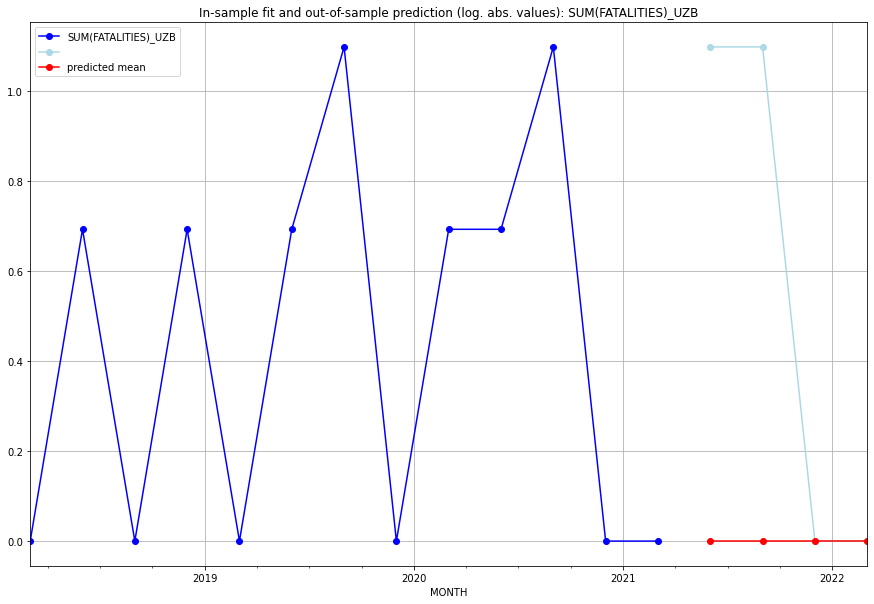

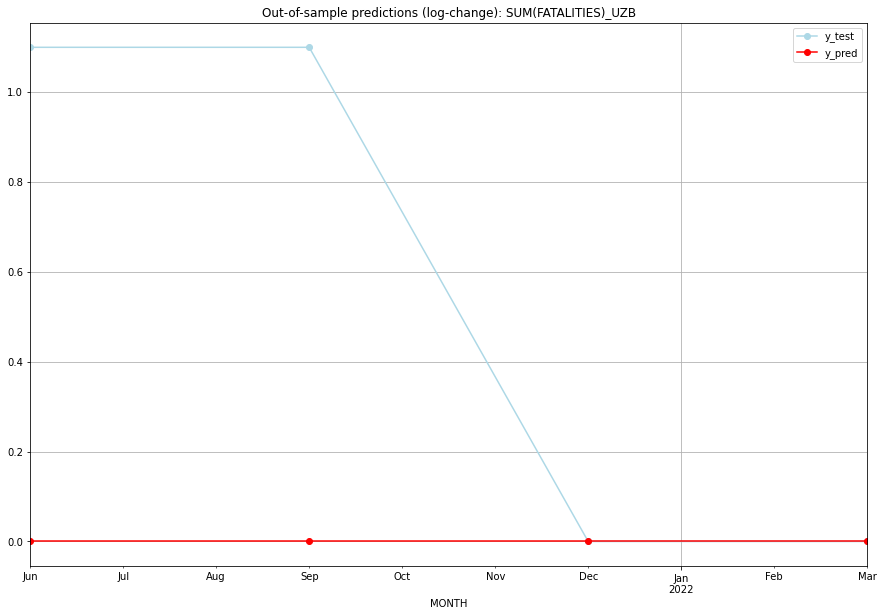

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.098612           0.0        1.098612
1  2021-07       0.0    1.098612           0.0        1.098612
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.000000           0.0        0.000000
TADDA: 0.5493061443340549
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.098612           0.0        1.098612   UZB
1 2021-07-01       0.0    1.098612           0.0        1.098612   UZB
2 2021-10-01       0.0    0.000000           0.0        0.000000   UZB
3 2022-01-01       0.0    0.000000           0.0        0.000000   UZB
Execution time: 00:01
######## VAT (218/234) #########
0
Neighbor countries: []
Getting Data for VAT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

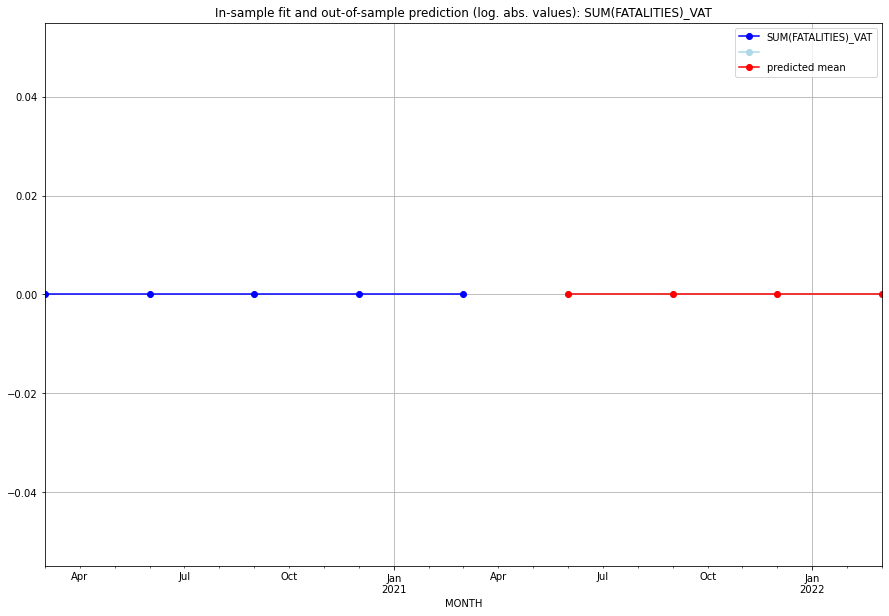

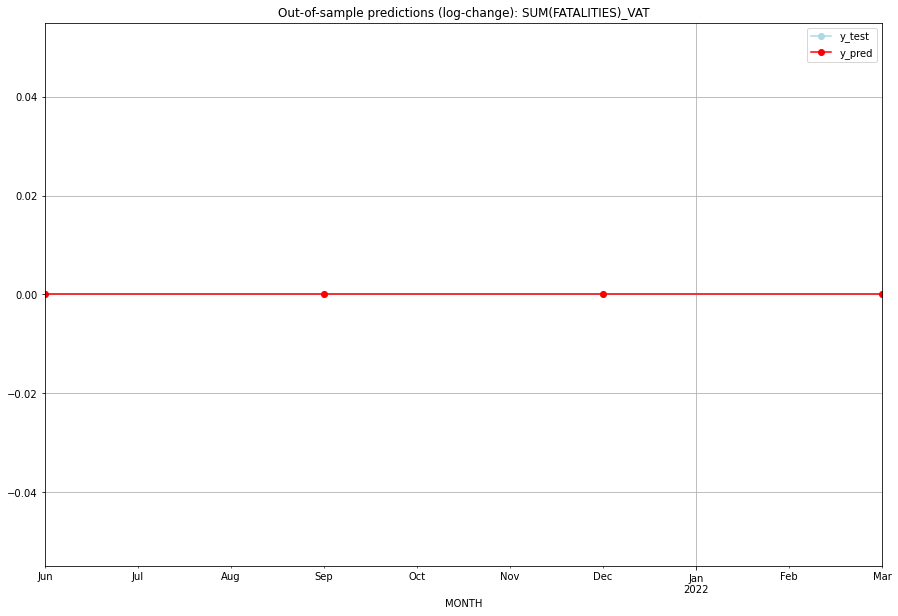

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   VAT
1 2021-07-01       0.0         0.0           0.0             0.0   VAT
2 2021-10-01       0.0         0.0           0.0             0.0   VAT
3 2022-01-01       0.0         0.0           0.0             0.0   VAT
Execution time: 00:01
######## VCT (219/234) #########
0
Neighbor countries: []
Getting Data for VCT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

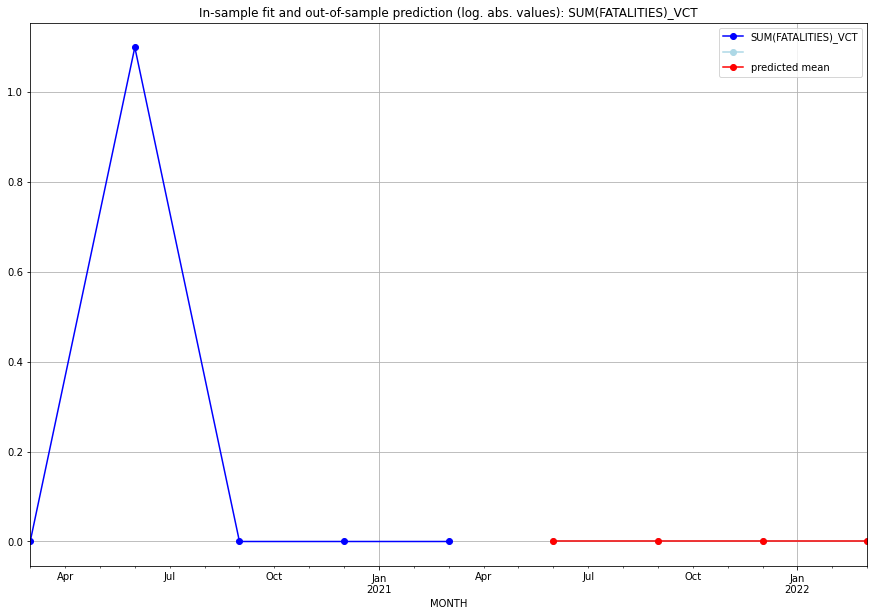

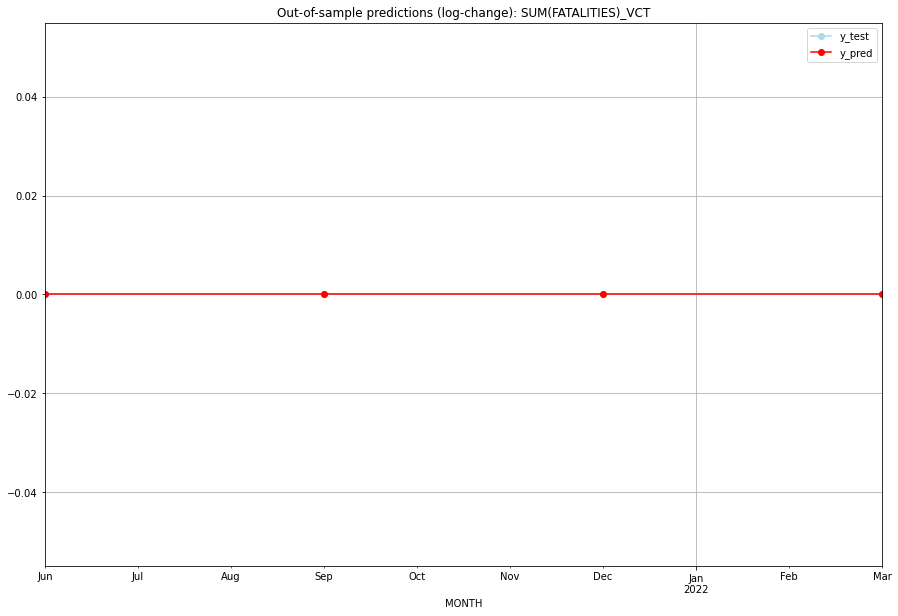

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   VCT
1 2021-07-01       0.0         0.0           0.0             0.0   VCT
2 2021-10-01       0.0         0.0           0.0             0.0   VCT
3 2022-01-01       0.0         0.0           0.0             0.0   VCT
Execution time: 00:01
######## VEN (220/234) #########
0
Neighbor countries: []
Getting Data for VEN
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
                0
MONTH            
2021-04

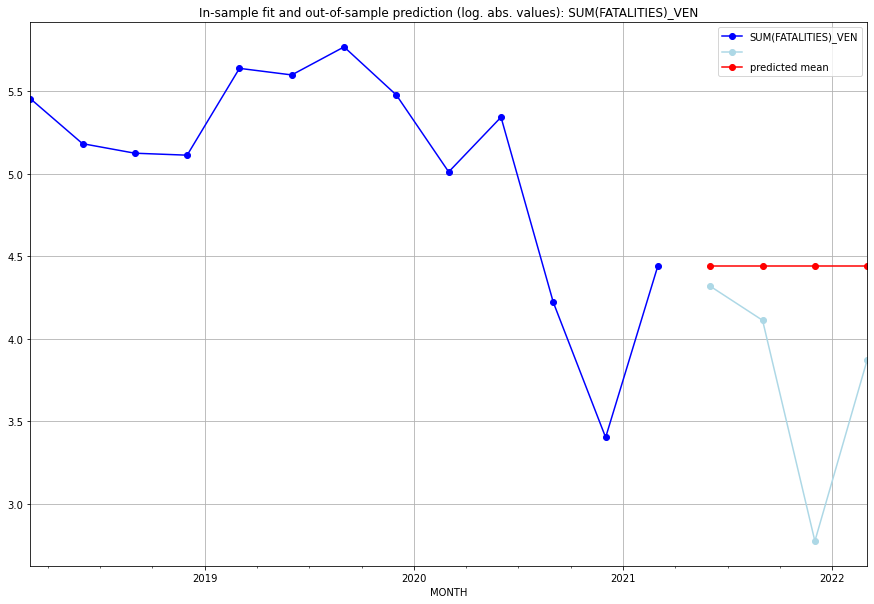

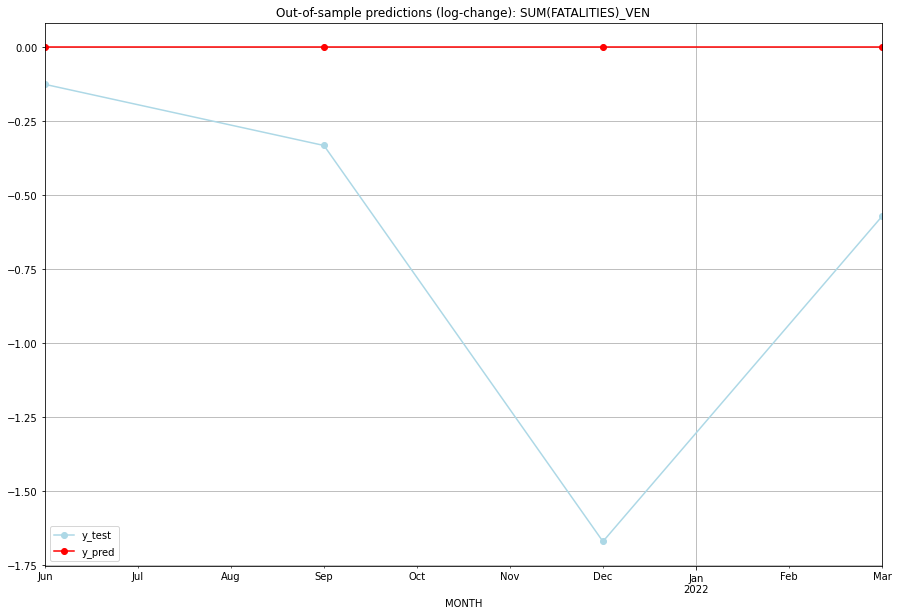

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.442651    4.317488           0.0       -0.125163
1  2021-07  4.442651    4.110874           0.0       -0.331777
2  2021-10  4.442651    2.772589           0.0       -1.670063
3  2022-01  4.442651    3.871201           0.0       -0.571450
TADDA: 0.6746133287759932
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.442651    4.317488           0.0       -0.125163   VEN
1 2021-07-01  4.442651    4.110874           0.0       -0.331777   VEN
2 2021-10-01  4.442651    2.772589           0.0       -1.670063   VEN
3 2022-01-01  4.442651    3.871201           0.0       -0.571450   VEN
Execution time: 00:01
######## VIR (221/234) #########
0
Neighbor countries: []
Getting Data for VIR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (9, 0)
y: (9, 1)
------------------------------------------------
           0
MONTH       
2021

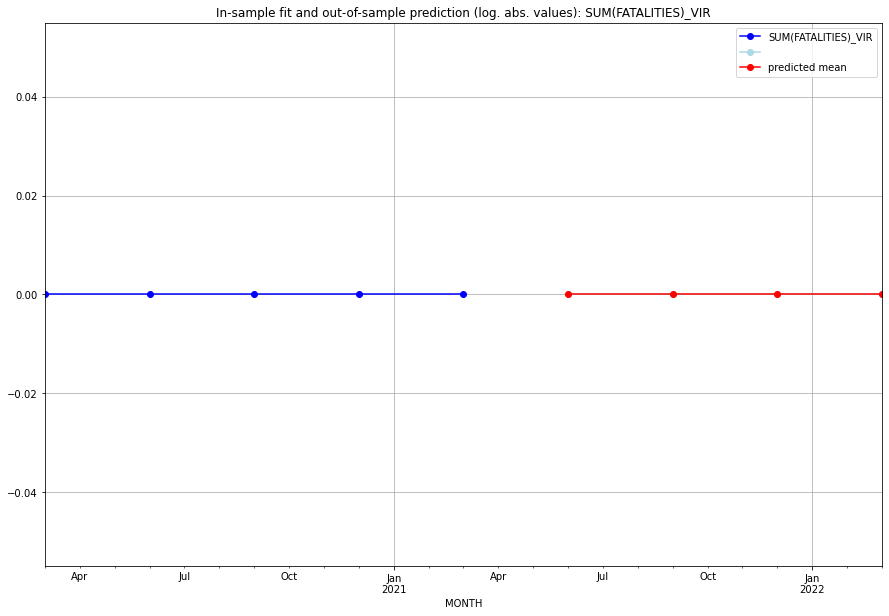

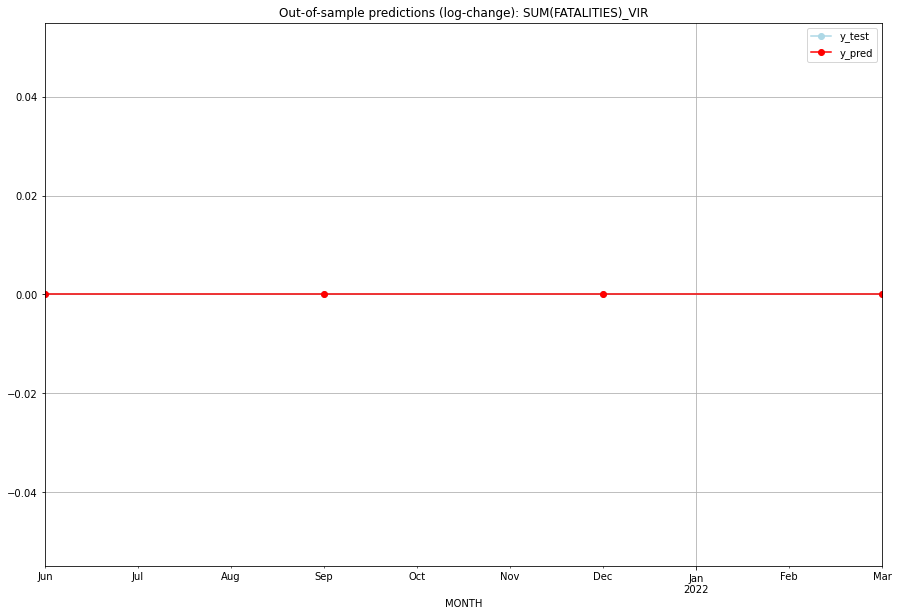

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   VIR
1 2021-07-01       0.0         0.0           0.0             0.0   VIR
2 2021-10-01       0.0         0.0           0.0             0.0   VIR
3 2022-01-01       0.0         0.0           0.0             0.0   VIR
Execution time: 00:01
######## VNM (222/234) #########
0
Neighbor countries: []
Getting Data for VNM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (49, 0)
y: (49, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

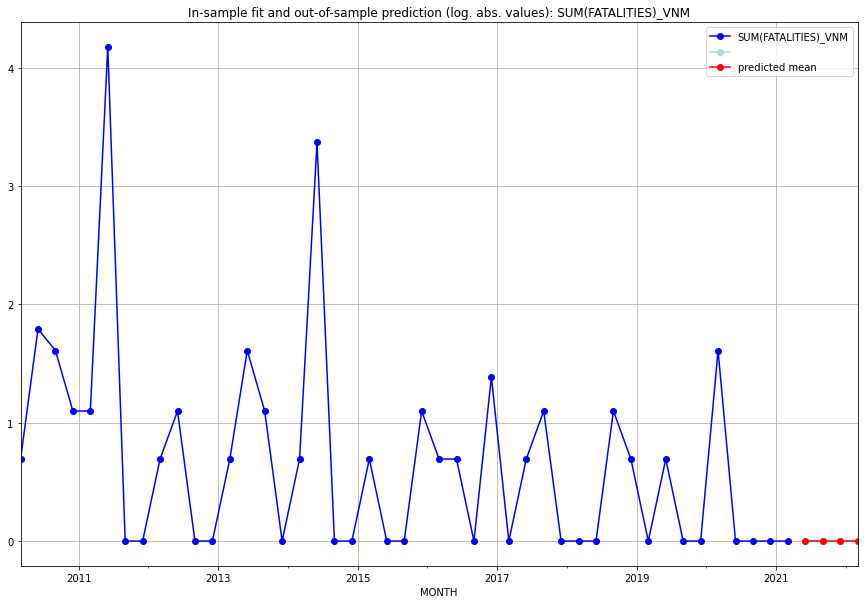

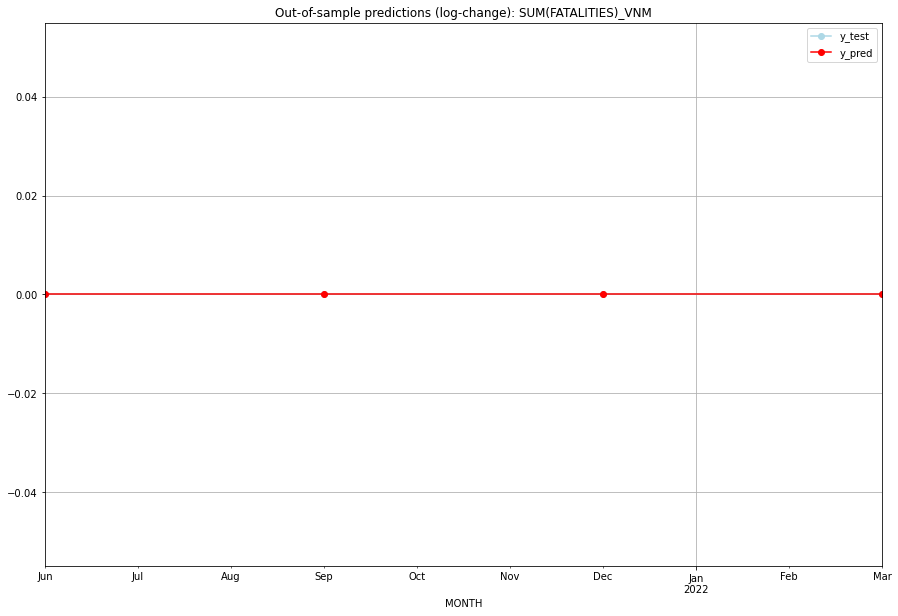

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   VNM
1 2021-07-01       0.0         0.0           0.0             0.0   VNM
2 2021-10-01       0.0         0.0           0.0             0.0   VNM
3 2022-01-01       0.0         0.0           0.0             0.0   VNM
Execution time: 00:01
######## VUT (223/234) #########
0
Neighbor countries: []
Getting Data for VUT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

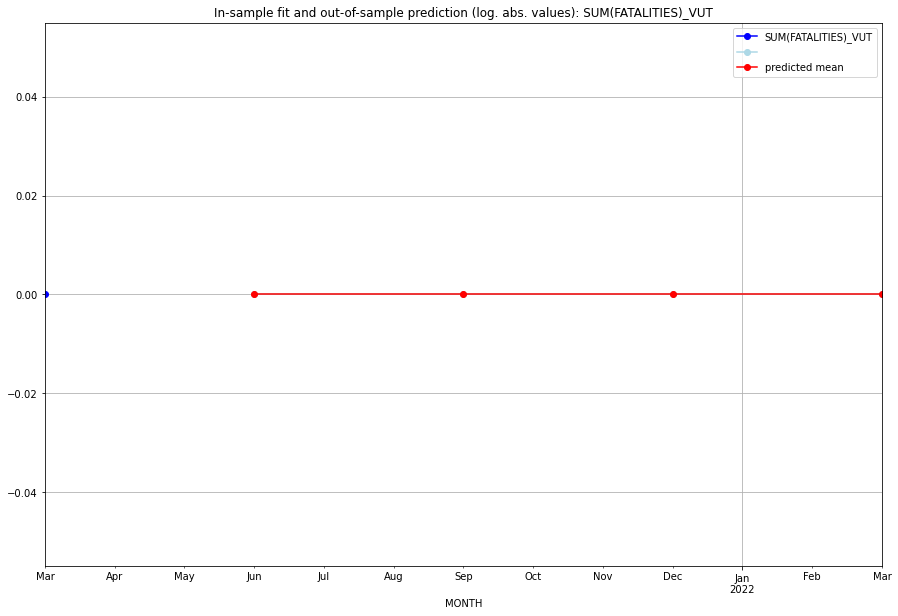

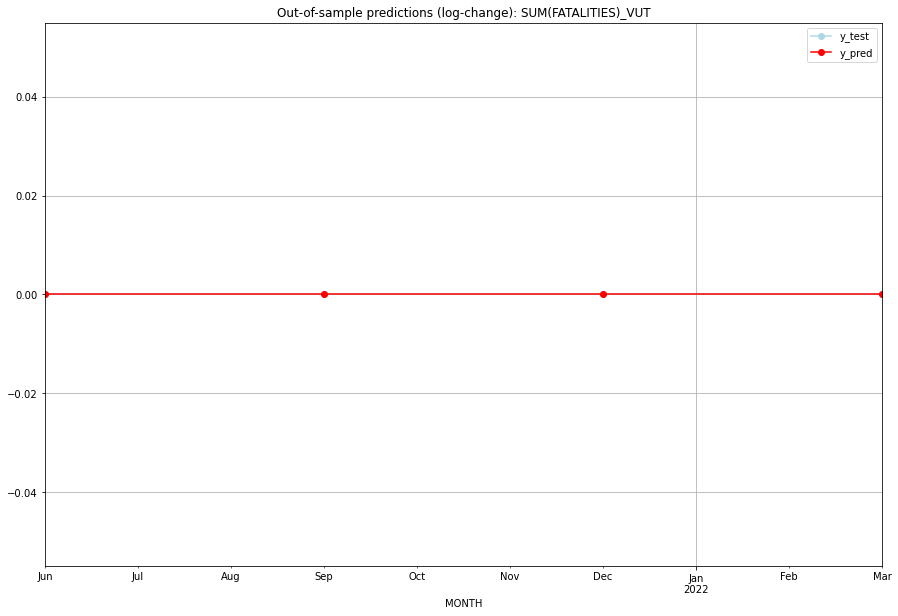

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   VUT
1 2021-07-01       0.0         0.0           0.0             0.0   VUT
2 2021-10-01       0.0         0.0           0.0             0.0   VUT
3 2022-01-01       0.0         0.0           0.0             0.0   VUT
Execution time: 00:01
######## WLF (224/234) #########
0
Neighbor countries: []
Getting Data for WLF
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

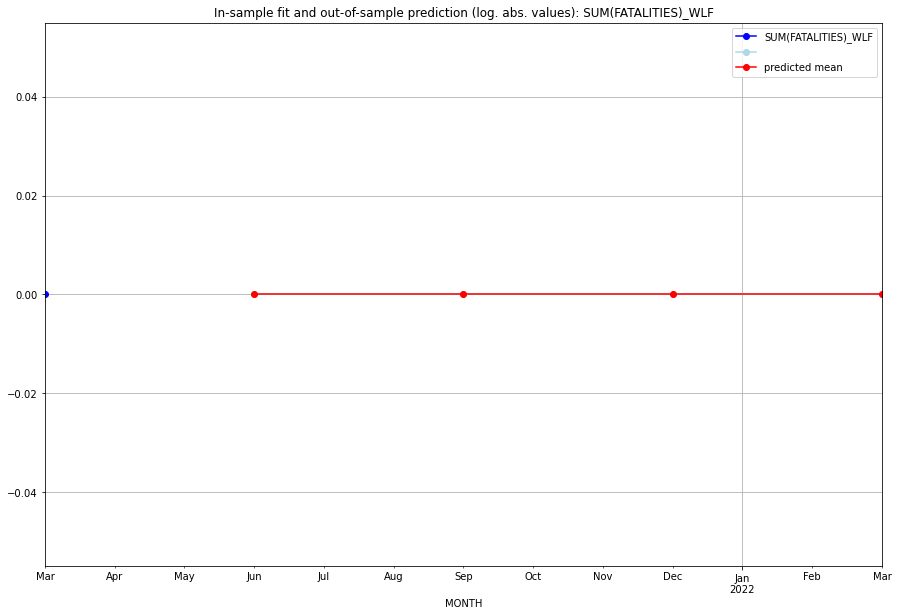

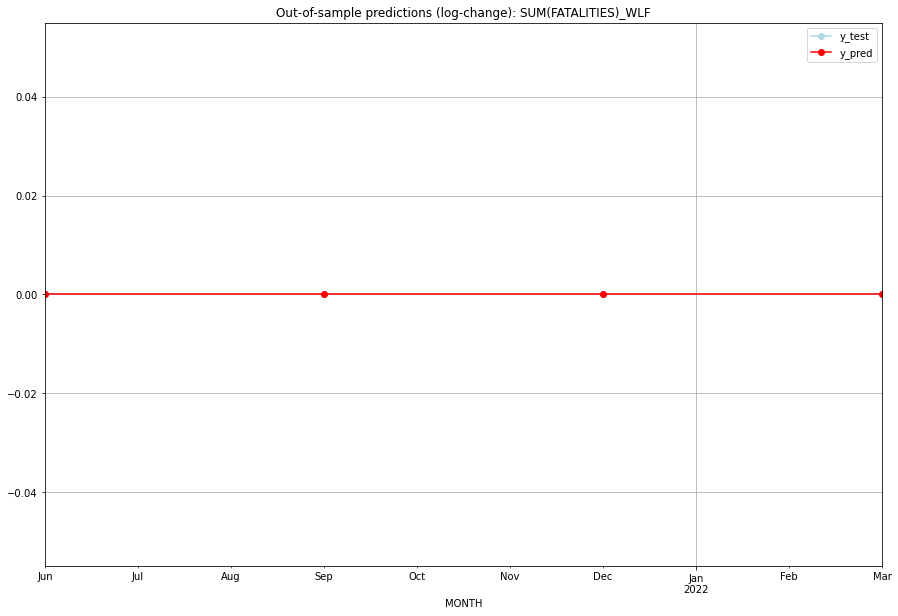

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   WLF
1 2021-07-01       0.0         0.0           0.0             0.0   WLF
2 2021-10-01       0.0         0.0           0.0             0.0   WLF
3 2022-01-01       0.0         0.0           0.0             0.0   WLF
Execution time: 00:01
######## WSM (225/234) #########
0
Neighbor countries: []
Getting Data for WSM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (5, 0)
y: (5, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021-0

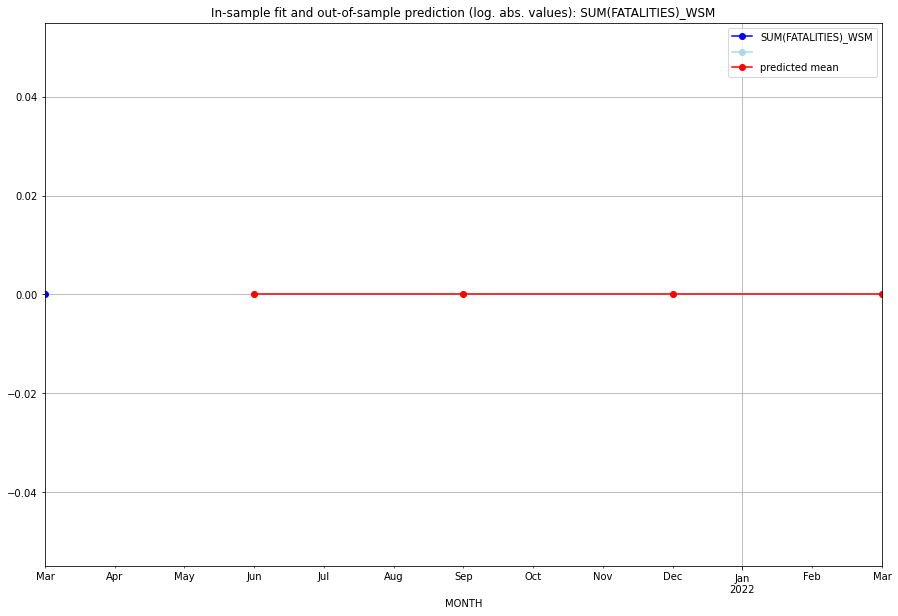

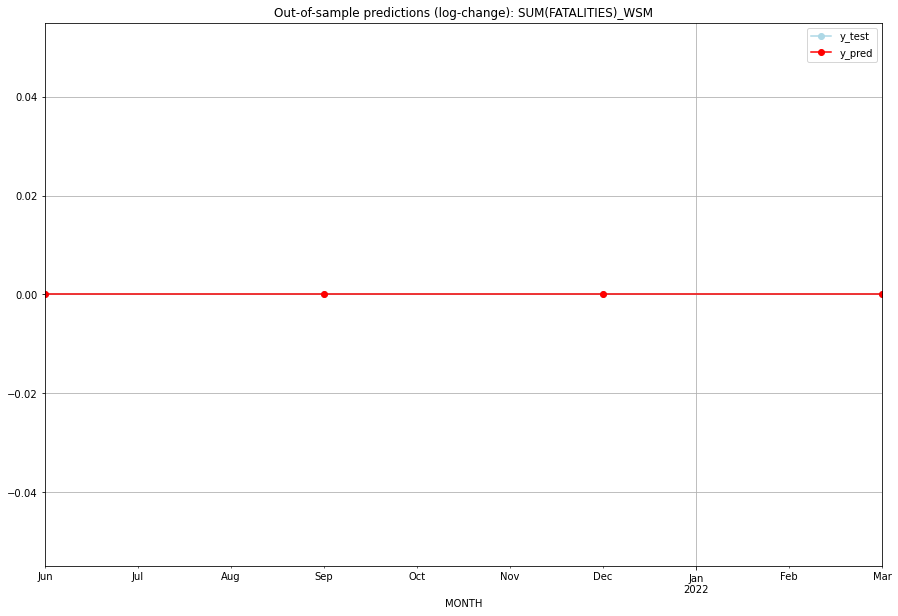

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   WSM
1 2021-07-01       0.0         0.0           0.0             0.0   WSM
2 2021-10-01       0.0         0.0           0.0             0.0   WSM
3 2022-01-01       0.0         0.0           0.0             0.0   WSM
Execution time: 00:01
######## XAR (226/234) #########
0
Neighbor countries: []
Getting Data for XAR
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH            
2021-

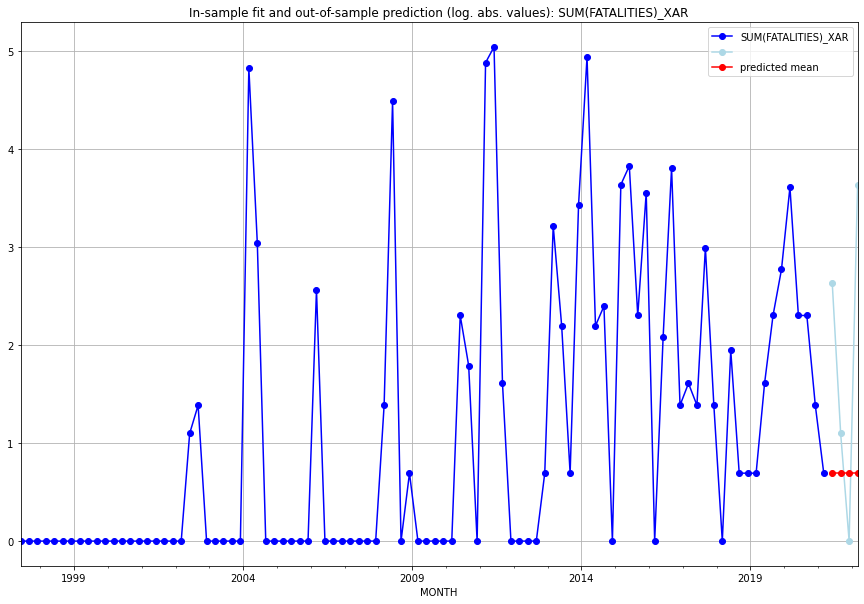

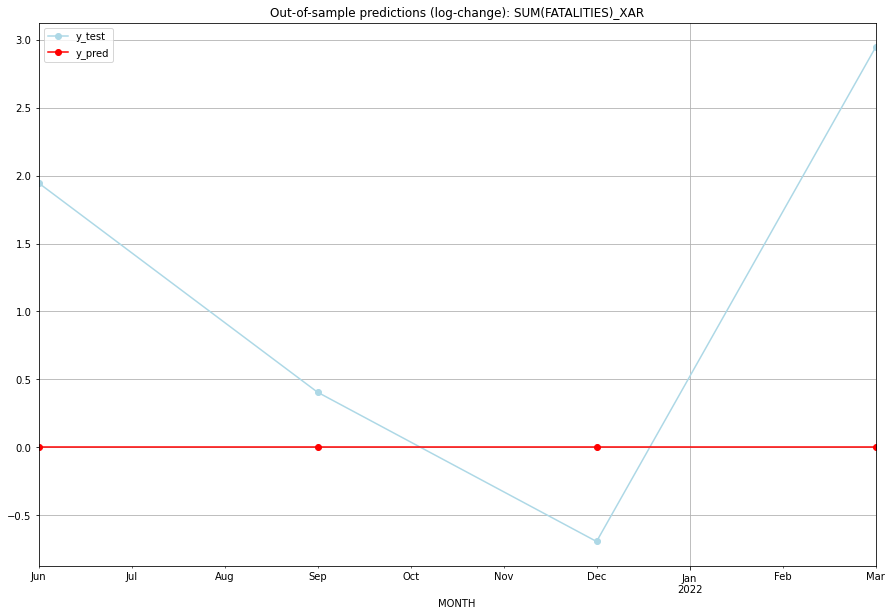

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  0.693147    2.639057           0.0        1.945910
1  2021-07  0.693147    1.098612           0.0        0.405465
2  2021-10  0.693147    0.000000           0.0       -0.693147
3  2022-01  0.693147    3.637586           0.0        2.944439
TADDA: 1.4972403542224657
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  0.693147    2.639057           0.0        1.945910   XAR
1 2021-07-01  0.693147    1.098612           0.0        0.405465   XAR
2 2021-10-01  0.693147    0.000000           0.0       -0.693147   XAR
3 2022-01-01  0.693147    3.637586           0.0        2.944439   XAR
Execution time: 00:01
######## XIT (227/234) #########
0
Neighbor countries: []
Getting Data for XIT
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       


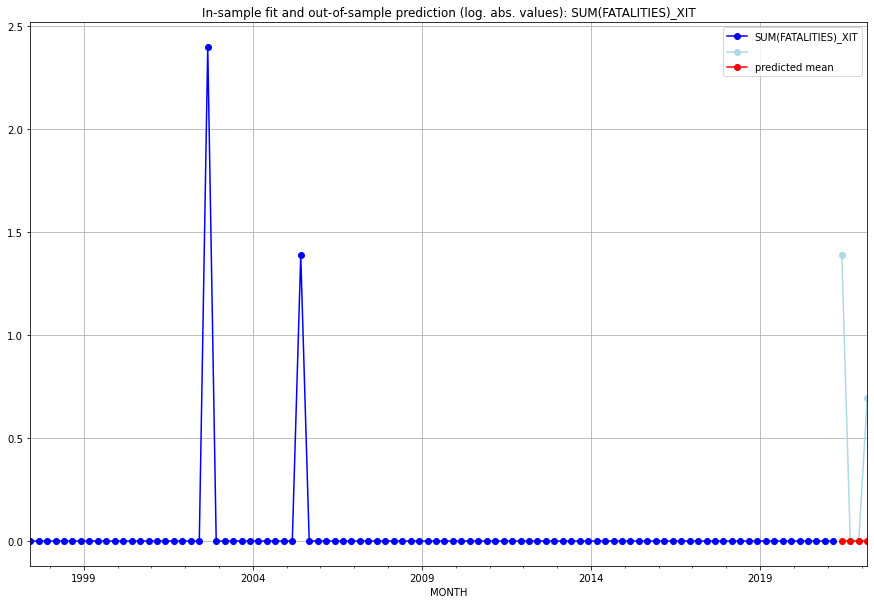

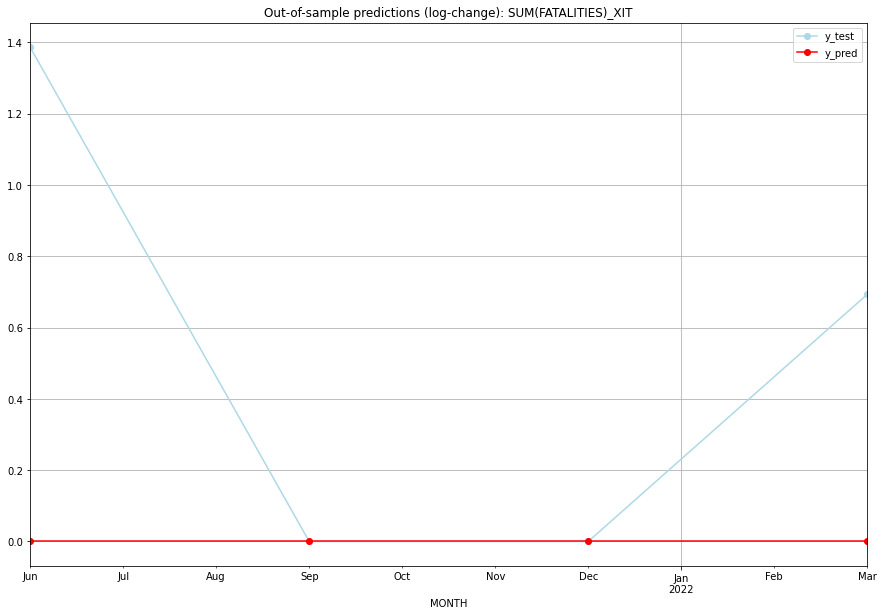

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0    1.386294           0.0        1.386294
1  2021-07       0.0    0.000000           0.0        0.000000
2  2021-10       0.0    0.000000           0.0        0.000000
3  2022-01       0.0    0.693147           0.0        0.693147
TADDA: 0.5198603854199589
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0    1.386294           0.0        1.386294   XIT
1 2021-07-01       0.0    0.000000           0.0        0.000000   XIT
2 2021-10-01       0.0    0.000000           0.0        0.000000   XIT
3 2022-01-01       0.0    0.693147           0.0        0.693147   XIT
Execution time: 00:01
######## XKK (228/234) #########
0
Neighbor countries: []
Getting Data for XKK
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
           0
MONTH       


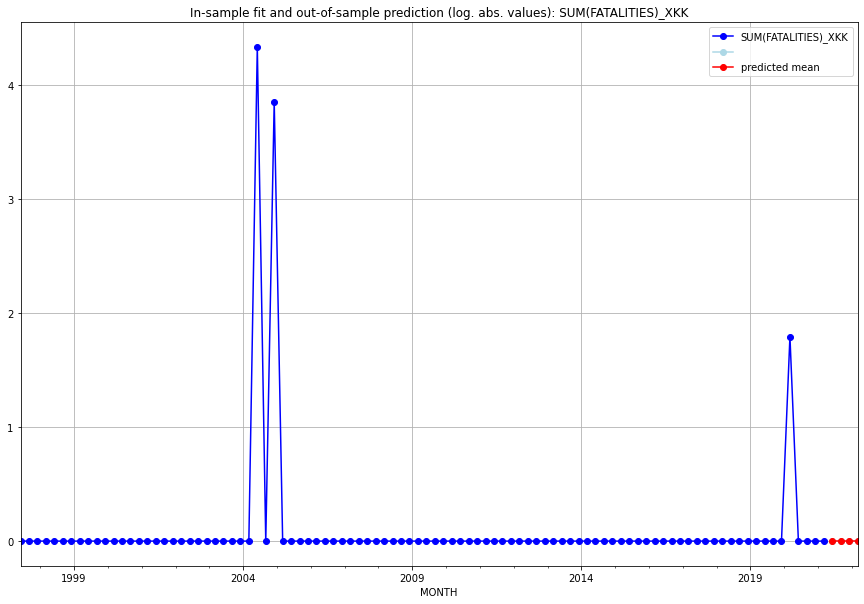

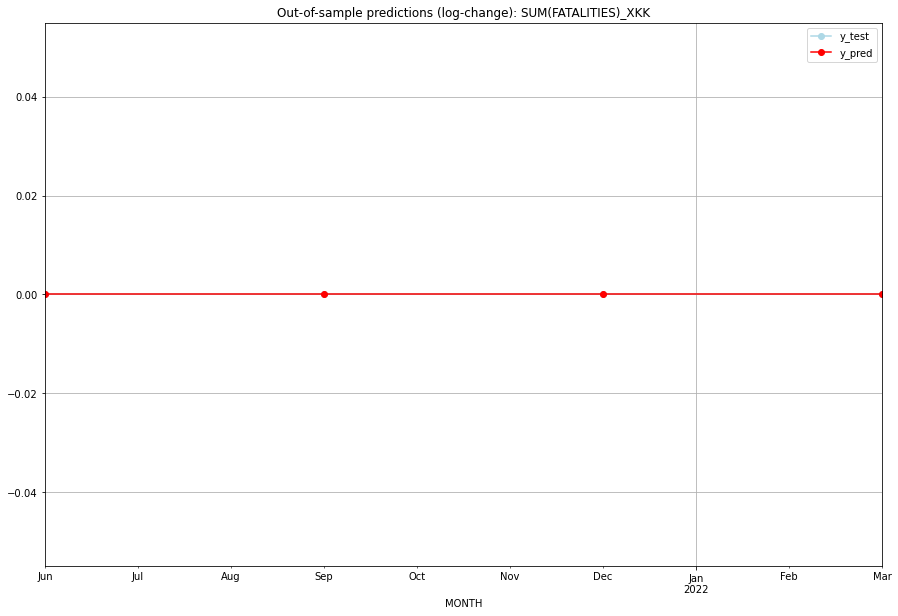

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   XKK
1 2021-07-01       0.0         0.0           0.0             0.0   XKK
2 2021-10-01       0.0         0.0           0.0             0.0   XKK
3 2022-01-01       0.0         0.0           0.0             0.0   XKK
Execution time: 00:01
######## XKO (229/234) #########
0
Neighbor countries: []
Getting Data for XKO
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

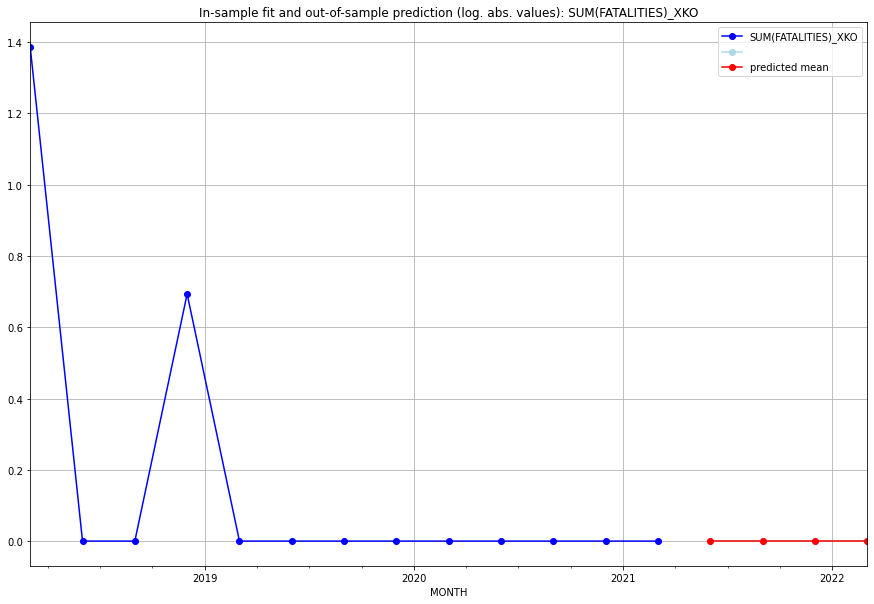

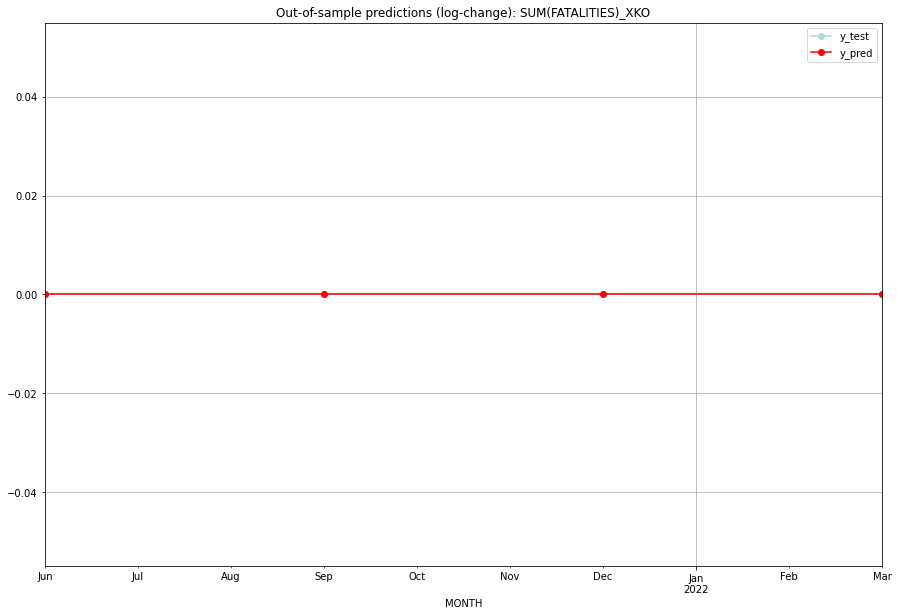

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   XKO
1 2021-07-01       0.0         0.0           0.0             0.0   XKO
2 2021-10-01       0.0         0.0           0.0             0.0   XKO
3 2022-01-01       0.0         0.0           0.0             0.0   XKO
Execution time: 00:01
######## XNC (230/234) #########
0
Neighbor countries: []
Getting Data for XNC
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (17, 0)
y: (17, 1)
------------------------------------------------
           0
MONTH       
2021-04  0.0
2021

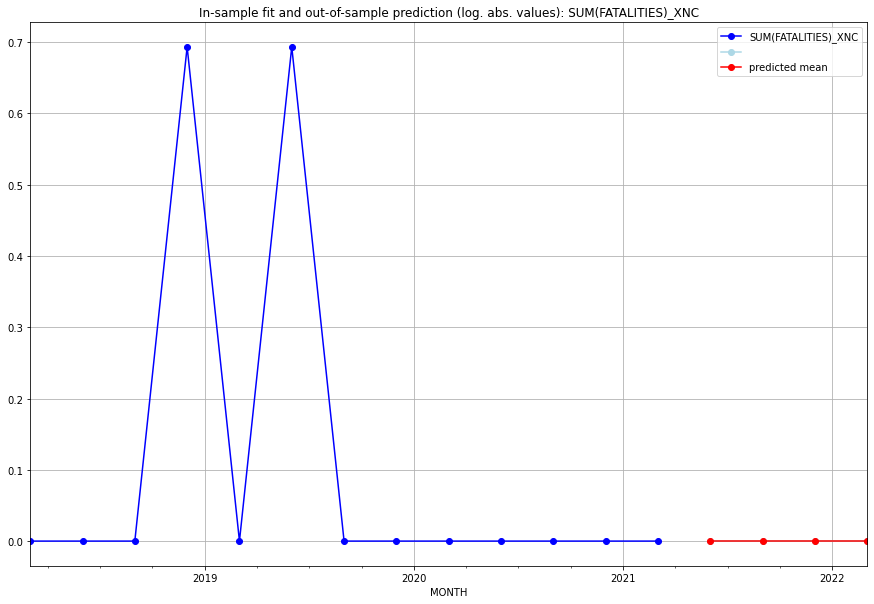

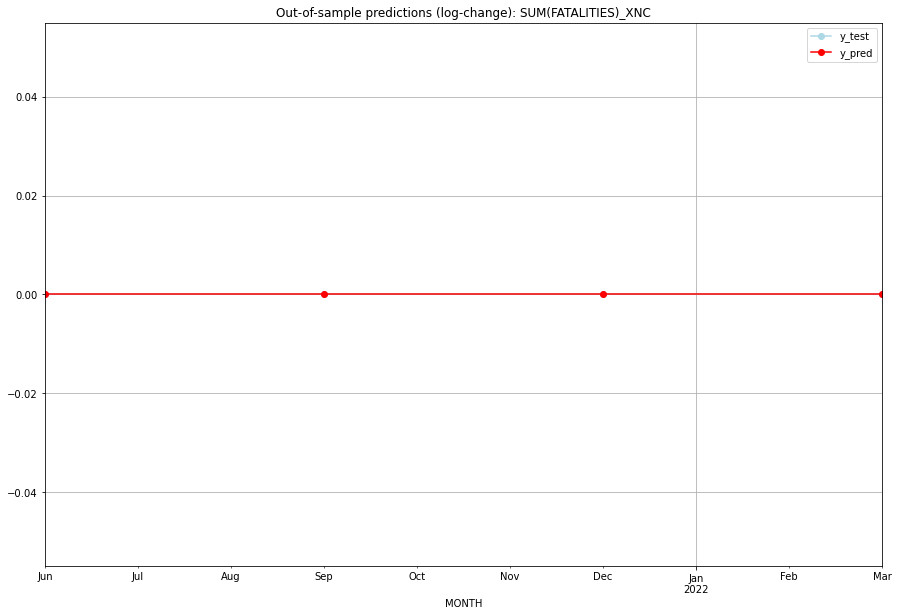

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04       0.0         0.0           0.0             0.0
1  2021-07       0.0         0.0           0.0             0.0
2  2021-10       0.0         0.0           0.0             0.0
3  2022-01       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01       0.0         0.0           0.0             0.0   XNC
1 2021-07-01       0.0         0.0           0.0             0.0   XNC
2 2021-10-01       0.0         0.0           0.0             0.0   XNC
3 2022-01-01       0.0         0.0           0.0             0.0   XNC
Execution time: 00:01
######## YEM (231/234) #########
0
Neighbor countries: []
Getting Data for YEM
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (29, 0)
y: (29, 1)
------------------------------------------------
                0
MONTH            
2021-04

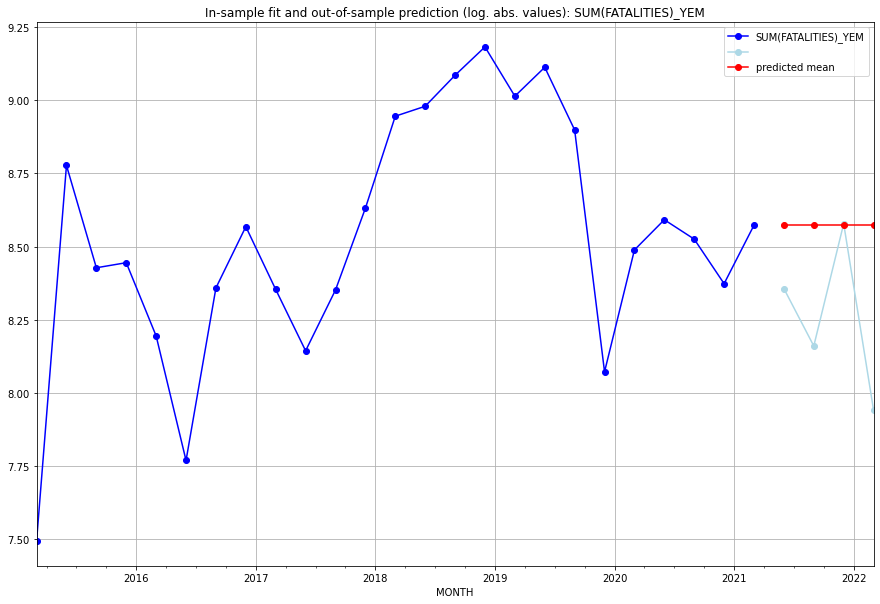

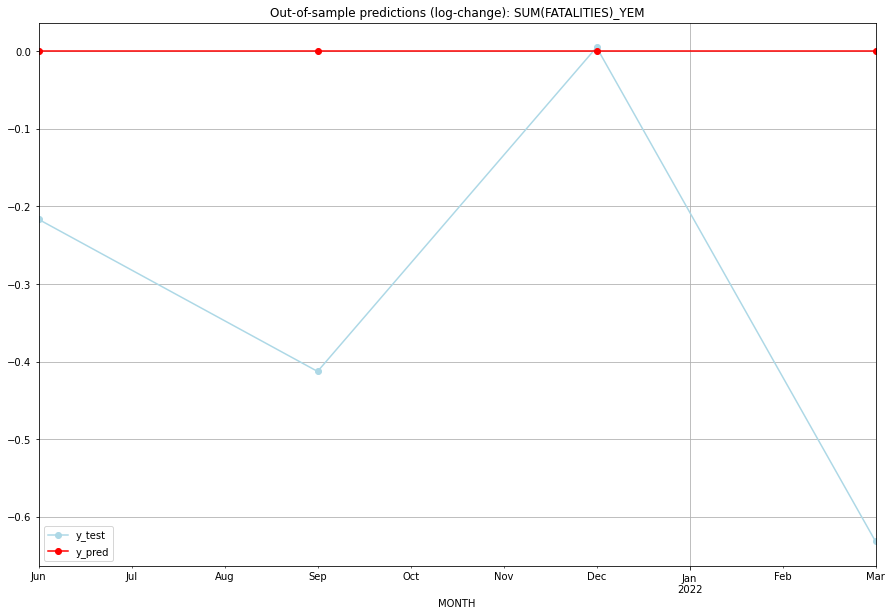

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  8.573384    8.356790           0.0       -0.216595
1  2021-07  8.573384    8.160804           0.0       -0.412581
2  2021-10  8.573384    8.578476           0.0        0.005092
3  2022-01  8.573384    7.941651           0.0       -0.631733
TADDA: 0.3165001295391654
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  8.573384    8.356790           0.0       -0.216595   YEM
1 2021-07-01  8.573384    8.160804           0.0       -0.412581   YEM
2 2021-10-01  8.573384    8.578476           0.0        0.005092   YEM
3 2022-01-01  8.573384    7.941651           0.0       -0.631733   YEM
Execution time: 00:01
######## ZAF (232/234) #########
0
Neighbor countries: []
Getting Data for ZAF
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH   

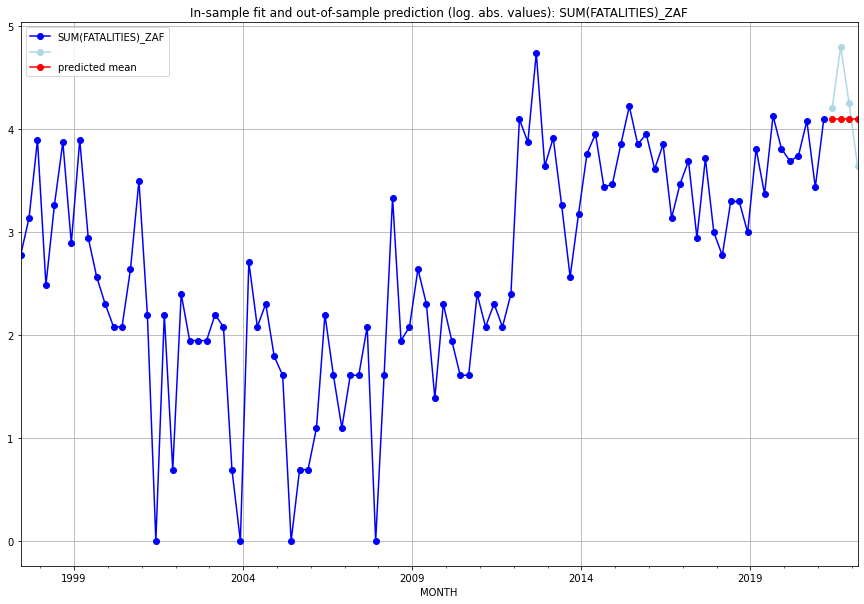

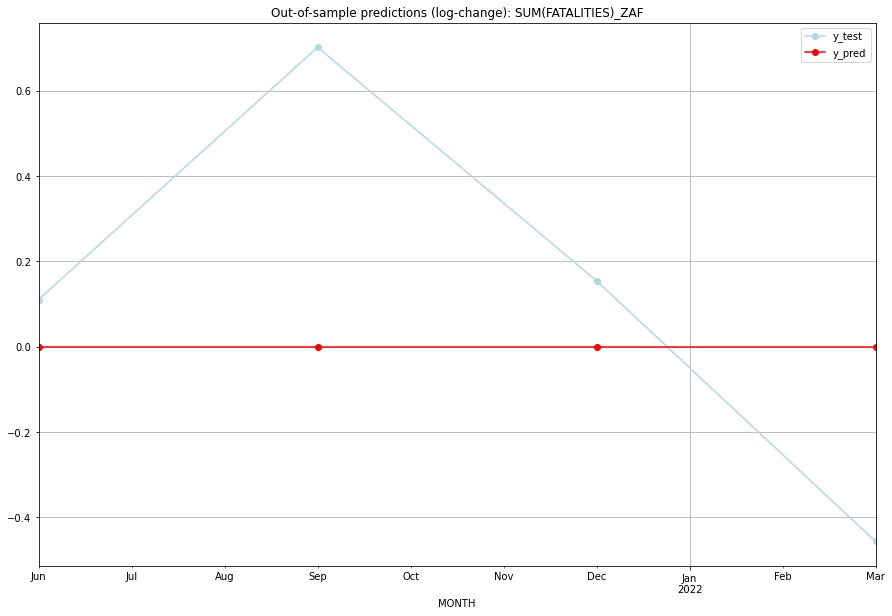

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  4.094345    4.204693           0.0        0.110348
1  2021-07  4.094345    4.795791           0.0        0.701446
2  2021-10  4.094345    4.248495           0.0        0.154151
3  2022-01  4.094345    3.637586           0.0       -0.456758
TADDA: 0.35567578071662
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  4.094345    4.204693           0.0        0.110348   ZAF
1 2021-07-01  4.094345    4.795791           0.0        0.701446   ZAF
2 2021-10-01  4.094345    4.248495           0.0        0.154151   ZAF
3 2022-01-01  4.094345    3.637586           0.0       -0.456758   ZAF
Execution time: 00:01
######## ZMB (233/234) #########
0
Neighbor countries: []
Getting Data for ZMB
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH     

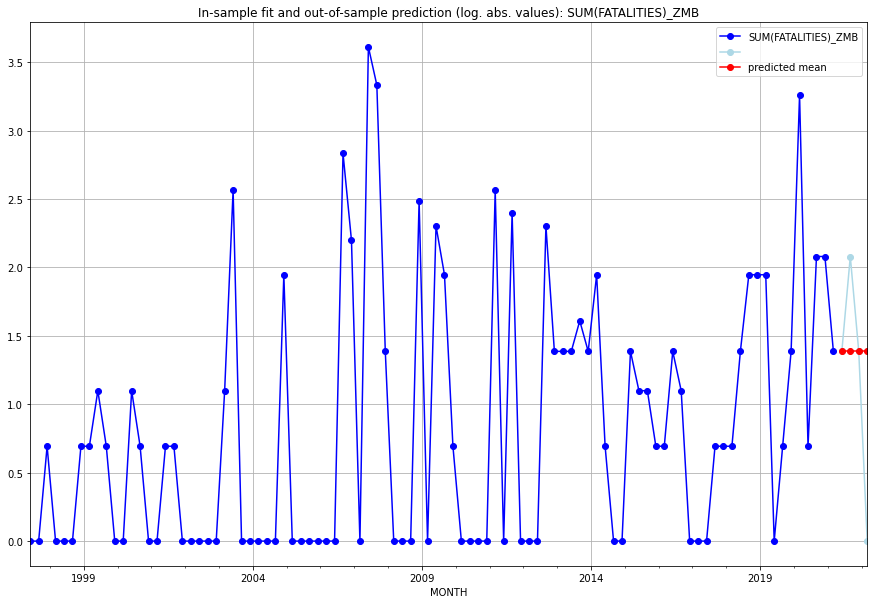

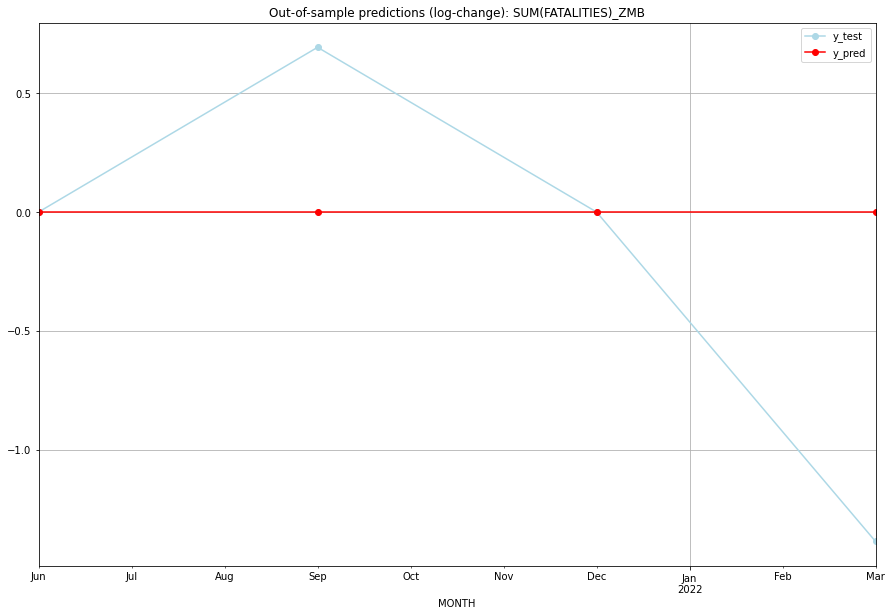

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.386294    1.386294           0.0        0.000000
1  2021-07  1.386294    2.079442           0.0        0.693147
2  2021-10  1.386294    1.386294           0.0        0.000000
3  2022-01  1.386294    0.000000           0.0       -1.386294
TADDA: 0.519860385419959
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.386294    1.386294           0.0        0.000000   ZMB
1 2021-07-01  1.386294    2.079442           0.0        0.693147   ZMB
2 2021-10-01  1.386294    1.386294           0.0        0.000000   ZMB
3 2022-01-01  1.386294    0.000000           0.0       -1.386294   ZMB
Execution time: 00:01
######## ZWE (234/234) #########
0
Neighbor countries: []
Getting Data for ZWE
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (100, 0)
y: (100, 1)
------------------------------------------------
                0
MONTH    

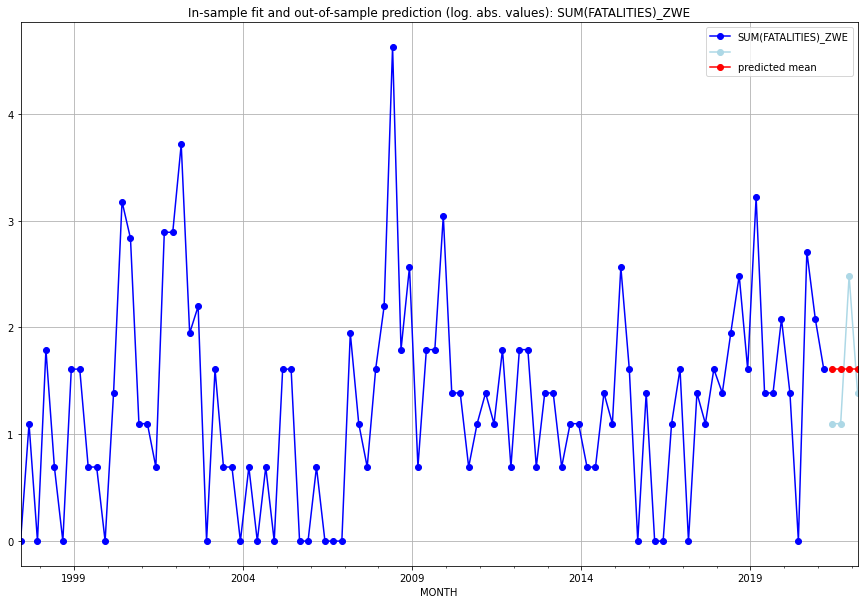

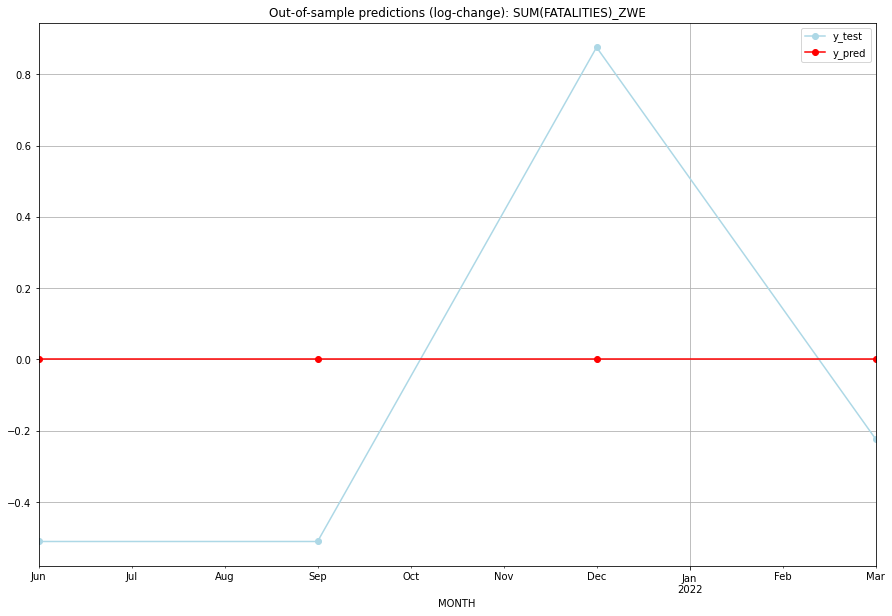

     MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0  2021-04  1.609438    1.098612           0.0       -0.510826
1  2021-07  1.609438    1.098612           0.0       -0.510826
2  2021-10  1.609438    2.484907           0.0        0.875469
3  2022-01  1.609438    1.386294           0.0       -0.223144
TADDA: 0.5300658840500228
Evaluation finished.
       MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0 2021-04-01  1.609438    1.098612           0.0       -0.510826   ZWE
1 2021-07-01  1.609438    1.098612           0.0       -0.510826   ZWE
2 2021-10-01  1.609438    2.484907           0.0        0.875469   ZWE
3 2022-01-01  1.609438    1.386294           0.0       -0.223144   ZWE
Execution time: 00:01


In [7]:
# warnings.simplefilter(action='ignore')

varimax_res = pd.DataFrame(columns=["MONTH", "FAT_PRED", "FAT_ACTUAL", "LC(FAT_PRED)", "LC(FAT_ACTUAL)", "GID_0", "PARAMETERS", "TIMESTAMP"])
csv_file = "../data/"+MODEL_NAME+"_PREDICTIONS.csv"

if os.path.exists(csv_file):
    existing_res = pd.read_csv("../data/"+MODEL_NAME+"_PREDICTIONS.csv")
    # print(existing_res)
    print("File exists.")
    
else:
    varimax_res.to_csv(csv_file, index=False, mode="a", header=True)
    existing_res = varimax_res

for i, g in enumerate(gid_list):
# for i, g in enumerate(["XNC"]):
    print("######## "+g+" ("+str(i+1)+"/"+str(len(gid_list))+") #########")
    # print(existing_res[existing_res["GID_0"] == g])
    print(len(existing_res[existing_res["GID_0"] == g]))
    
    
    # skip country if results already exist
    if len(existing_res[existing_res["GID_0"] == g]) > 0:
        print("Model for this country has already been fitted.")
        continue
    
    # add time series of neighboring  countries as predictor variables
    if NEIGHBORS == True:
        neighbor = gid0_neighbors[gid0_neighbors["GID_0"] == g]["NEIGHBOUR"].tolist()
    else:
        neighbor = []
    print("Neighbor countries: "+ str(neighbor))

    # measure time 
    st = time.time()

    res = varimax(target_variable = TARGET_VARIABLE,
                  target_country = g,
                  predictor_countries = neighbor,
                  n_lags_X = N_LAGS_X,
                  seasonal_periodicity = SEASONAL_PERIODICITY)

    # append country results to csv with timestamp
    res["TIMESTAMP"] = datetime.datetime.now()
    
    res.to_csv(csv_file, index=False, mode="a", header=False)

    et = time.time()
    elapsed_time = et - st
    print('Execution time:', time.strftime("%M:%S", time.gmtime(elapsed_time)))

    varimax_res = pd.concat([varimax_res, res], ignore_index=True)

    # break

In [8]:
# varimax_res.to_csv("../data/"+MODEL_NAME+"_PREDICTIONS.csv", index=False)